In [1]:
import pandas as pd
import numpy as np
import helper
import missingno as msno
import matplotlib.pyplot as plt
import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import catboost as cb
import seaborn as sns

###  Load all acs data

In [2]:
# ## Load all ACS data and merge it

# acs = pd.read_csv('cleaned_data/acs_clean.csv', index_col = 0,
#                       parse_dates = ['Time'])
# acs2 = pd.read_csv('cleaned_data/acs2_clean.csv', index_col = 0,
#                       parse_dates = ['Time'])
# all_acs = acs.merge(acs2, how='outer', on=['zip_code', 'Time'])

In [3]:
### Hayden's Code
# load data (selected non-ACS fetures, all ACS data, features)
texas_data = pd.read_csv('cleaned_data/merged_texas_data.csv', index_col = 0,
                   parse_dates = ['Time']
                  )

acs_data = pd.read_csv('cleaned_data/merged_acs_data.csv', index_col = 0,
                      parse_dates = ['Time'])

zri = pd.read_csv('cleaned_data/long_interpolated_target.csv', index_col = 0,
                   parse_dates=['Time']
                  )

# adding shift to zri
zri_shift, zri_shift_X_vals = helper.time_lag_merge(zri, zri, {
    12:['zori_ssa'],
    13:['zori_ssa'],
    18:['zori_ssa'],
    24:['zori_ssa']
},
                                          return_full = True
                                         )

# there should now be extra values after our target. 
# We are gonna remove the missing values that happen at the start of our inputs tho
zri_shift = zri_shift.sort_values('Time')
msno.matrix(zri_shift)
plt.show()
zri_shift = zri_shift.dropna(subset = ['zori_ssa_24_month_shift'],axis='index',
                             how = 'any').reset_index(drop = True)
msno.matrix(zri_shift)

plt.show()
# Adding the shift values
zri_shift.loc[:,'zori_ssa_1_diff_lag_12'] = (zri_shift.loc[:,'zori_ssa_12_month_shift'] -
                                             zri_shift.loc[:,'zori_ssa_13_month_shift'])
zri_shift.loc[:,'zori_ssa_6_diff_lag_12'] = (zri_shift.loc[:,'zori_ssa_12_month_shift'] -
                                             zri_shift.loc[:,'zori_ssa_18_month_shift'])
zri_shift.loc[:,'zori_ssa_12_diff_lag_12'] = (zri_shift.loc[:,'zori_ssa_12_month_shift'] -
                                             zri_shift.loc[:,'zori_ssa_24_month_shift'])
zri_shift['zori_ssa_12_diff_lag_12_per'] = (zri_shift['zori_ssa_12_diff_lag_12']/
                                           zri_shift['zori_ssa_12_month_shift'])

zri_shift = zri_shift[['Time','zip_code','zori_ssa', 
                       'zori_ssa_12_month_shift',
                       'zori_ssa_1_diff_lag_12', 
                       'zori_ssa_6_diff_lag_12',
                       'zori_ssa_12_diff_lag_12_per'
                      ]]


# merge non acs data 
extra_shift = ['Gross Value Natural Gas Production', 'sap_case_shiller_index']
merged_df = helper.time_lag_merge(zri_shift, 
                                                    texas_data, {
    12:list(texas_data.drop(columns = ['Time','zip_code']).columns),
    13:extra_shift
},
                                          return_full = True
                                         )
# merge acs data
acs_1_cols = [
    'black_pop',
    'white_pop',
    'hispanic_pop',
    'high_school_diploma',
    'female_female_households',
    'armed_forces',
    'children',
    'black_pop_annual_pct_change',
    'white_pop_annual_pct_change',
    'hispanic_pop_annual_pct_change',
    'high_school_diploma_annual_pct_change',
    'children_annual_pct_change',
    ]
merged_df = helper.time_lag_merge(merged_df, 
                                                    acs_data, {
    36:list(acs_data.drop(columns = ['Time','zip_code'] + acs_1_cols).columns),
    48:acs_1_cols                                              
},
                                          return_full = True
                                         )
# visualize missing values. it should be that acs 2 does not have a single zipcode
# then removing that line and checking to see that there are no more missing values.
msno.matrix(merged_df)
plt.show()
merged_df = merged_df.dropna(axis=0)
msno.matrix(merged_df)
plt.show()

# creating list of variables to put into the model. initialy is all non index and target
X_vals = merged_df.drop(columns = ['Time','zip_code','zori_ssa']).columns.to_list()
# then remove variables that don't work for that given model.
bad_X_vals = [
    'sap_case_shiller_index_12_month_shift',
    'quintile_2_upper_limit_36_month_shift',
    'tx_is_abt_same_12_month_shift',
    'quintile_3_upper_limit_36_month_shift',
    'female_40_to_44_36_month_shift',
    'quintile_4_upper_limit_36_month_shift',
    'driving_alone_population_36_month_shift',
    'tx_is_better_12_month_shift',
    'children_36_month_shift',
    'female_45_to_49_36_month_shift',
    'average_household_size_owners_36_month_shift',
    'housing_units_10_to_19_units_36_month_shift',
    'housing_units_20_to_49_units_36_month_shift',
    'housing_units_5_to_9_units_36_month_shift',
    'Single Family Building Permits TX_12_month_shift',
    'female_50_to_54_36_month_shift',
    'female_35_to_39_36_month_shift',
    'female_30_to_34_36_month_shift', 
    'median_household_income_36_month_shift',
    'female_25_to_29_36_month_shift',
    'single_women_36_month_shift',
    'sap_case_shiller_index_annual_pct_change_12_month_shift',
    'mintempC_annual_pct_change_12_month_shift',
    'tx_is_abt_same_annual_pct_change_12_month_shift',
    'housing_units_built_1990_to_1999_36_month_shift',
    'quintile_1_upper_limit_36_month_shift',
    'tx_is_worse_12_month_shift',
             ]
X_vals = [X_val for X_val in X_vals if X_val not in bad_X_vals]
y_val = 'zori_ssa'

# split train and test based on a year in advance.
train = merged_df.loc[merged_df['Time']<datetime.datetime(2020,7,2),:].reset_index(drop=True)
test = merged_df.loc[merged_df['Time']>datetime.datetime(2020,7,2),:].reset_index(drop=True)

# set up x and y values with a scaler
# train first
# scaler = StandardScaler(with_mean=False)
X = train[X_vals]
# X = scaler.fit_transform(X)
y = train[y_val]
# test second
X_test = test[X_vals]
# X_test = scaler.transform(X_test)
y_test = test[y_val]

ValueError: too many values to unpack (expected 2)

In [28]:
### Run Catboost - non ACS data, no priors
# Testing performance
# RMSE: 72.71677719516812
# R2: 0.9177039871666294

train_dataset = cb.Pool(X, y)
test_dataset = cb.Pool(X_test, y_test)
model = cb.CatBoostRegressor(loss_function='RMSE')
grid = {'iterations': [100, 150, 100], 
       'learning_rate': [0.03, 01.], 
       'depth': [2,4,6,8], 
       'l2_leaf_reg': [0.2, 0.5, 1, 3]}

model.grid_search(grid, train_dataset)
feat_names = X_test.columns.to_list()

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)

print("Testing performance")
print(f'RMSE: {rmse}')
print(f'R2: {r2}')

Testing performance
RMSE: 72.71677719516812
R2: 0.9177039871666294


In [27]:
print("Testing performance")
print(f'RMSE: {rmse}')
print(f'R2: {r2}')
print(model.get_all_params())

Testing performance
RMSE: 72.71677719516812
R2: 0.9177039871666294
{'nan_mode': 'Min', 'eval_metric': 'RMSE', 'iterations': 150, 'sampling_frequency': 'PerTree', 'leaf_estimation_method': 'Newton', 'grow_policy': 'SymmetricTree', 'penalties_coefficient': 1, 'boosting_type': 'Plain', 'model_shrink_mode': 'Constant', 'feature_border_type': 'GreedyLogSum', 'bayesian_matrix_reg': 0.10000000149011612, 'l2_leaf_reg': 0.5, 'random_strength': 1, 'rsm': 1, 'boost_from_average': True, 'model_size_reg': 0.5, 'pool_metainfo_options': {'tags': {}}, 'subsample': 0.800000011920929, 'use_best_model': False, 'random_seed': 0, 'depth': 6, 'posterior_sampling': False, 'border_count': 254, 'classes_count': 0, 'auto_class_weights': 'None', 'sparse_features_conflict_fraction': 0, 'leaf_estimation_backtracking': 'AnyImprovement', 'best_model_min_trees': 1, 'model_shrink_rate': 0, 'min_data_in_leaf': 1, 'loss_function': 'RMSE', 'learning_rate': 1, 'score_function': 'Cosine', 'task_type': 'CPU', 'leaf_estimati

In [33]:
best_leaf = model.get_all_params()['l2_leaf_reg']
best_iteration = model.get_all_params()['iterations']
best_depth = model.get_all_params()['depth']
best_learn_rate = model.get_all_params()['learning_rate']
print(f"l2_leaf_ref: {best_leaf}")
print(f"iterations: {best_iteration}")
print(f"depth: {best_depth}")
print(f"learning_rate: {best_learn_rate}")

l2_leaf_ref: 0.5
iterations: 150
depth: 6
learning_rate: 1


In [34]:
### Run Catboost - non ACS data, no priors
# Testing performance
# RMSE: 72.71677719516812
# R2: 0.9177039871666294

train_dataset = cb.Pool(X, y)
test_dataset = cb.Pool(X_test, y_test)
model = cb.CatBoostRegressor(loss_function='RMSE')
grid = {'iterations': [0.8*best_iteration, best_iteration, 1.2*best_iteration], 
       'learning_rate': [0.8*best_learn_rate, best_learn_rate, 1.2*best_learn_rate], 
       'depth': [0.8*best_depth, 0.9*best_depth, best_depth, 1.1*best_depth, 1.2*best_depth], 
       'l2_leaf_reg': [0.8*best_leaf, 0.9*best_leaf, best_leaf, 1.1*best_leaf, 1.2*best_leaf]}

model.grid_search(grid, train_dataset)
feat_names = X_test.columns.to_list()

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)


learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease l

0:	learn: 341.6597621	test: 344.0746474	best: 344.0746474 (0)	total: 12.3ms	remaining: 1.46s
1:	learn: 137.4341703	test: 139.7491358	best: 139.7491358 (1)	total: 21.4ms	remaining: 1.26s
2:	learn: 80.2581928	test: 81.1491540	best: 81.1491540 (2)	total: 30.8ms	remaining: 1.2s
3:	learn: 65.9757737	test: 66.6813803	best: 66.6813803 (3)	total: 39.5ms	remaining: 1.15s
4:	learn: 54.7945144	test: 56.2599465	best: 56.2599465 (4)	total: 46.3ms	remaining: 1.06s
5:	learn: 49.2425465	test: 50.5387280	best: 50.5387280 (5)	total: 53ms	remaining: 1.01s
6:	learn: 43.9669963	test: 45.7093033	best: 45.7093033 (6)	total: 60.9ms	remaining: 983ms
7:	learn: 41.5837478	test: 43.3468719	best: 43.3468719 (7)	total: 69.9ms	remaining: 979ms
8:	learn: 38.5828639	test: 40.7909990	best: 40.7909990 (8)	total: 76ms	remaining: 937ms
9:	learn: 36.8844538	test: 39.2322232	best: 39.2322232 (9)	total: 82ms	remaining: 902ms
10:	learn: 35.0633260	test: 37.6181858	best: 37.6181858 (10)	total: 87.8ms	remaining: 870ms
11:	learn

104:	learn: 9.0482059	test: 15.4915778	best: 15.4695050 (102)	total: 809ms	remaining: 116ms
105:	learn: 9.0117733	test: 15.5349613	best: 15.4695050 (102)	total: 819ms	remaining: 108ms
106:	learn: 8.9628125	test: 15.4969266	best: 15.4695050 (102)	total: 828ms	remaining: 101ms
107:	learn: 8.8912151	test: 15.4550695	best: 15.4550695 (107)	total: 837ms	remaining: 93ms
108:	learn: 8.8309179	test: 15.4223648	best: 15.4223648 (108)	total: 847ms	remaining: 85.5ms
109:	learn: 8.7538206	test: 15.3787982	best: 15.3787982 (109)	total: 855ms	remaining: 77.7ms
110:	learn: 8.6976662	test: 15.3063237	best: 15.3063237 (110)	total: 864ms	remaining: 70ms
111:	learn: 8.6344216	test: 15.2729810	best: 15.2729810 (111)	total: 871ms	remaining: 62.2ms
112:	learn: 8.5975472	test: 15.2636760	best: 15.2636760 (112)	total: 877ms	remaining: 54.3ms
113:	learn: 8.5374241	test: 15.2553546	best: 15.2553546 (113)	total: 883ms	remaining: 46.5ms
114:	learn: 8.5017816	test: 15.2589063	best: 15.2553546 (113)	total: 889ms	re

76:	learn: 10.7827606	test: 15.7393927	best: 15.7393927 (76)	total: 474ms	remaining: 265ms
77:	learn: 10.6736480	test: 15.6657930	best: 15.6657930 (77)	total: 482ms	remaining: 259ms
78:	learn: 10.5554107	test: 15.4652366	best: 15.4652366 (78)	total: 490ms	remaining: 254ms
79:	learn: 10.4831008	test: 15.4938881	best: 15.4652366 (78)	total: 499ms	remaining: 249ms
80:	learn: 10.4033597	test: 15.5179722	best: 15.4652366 (78)	total: 506ms	remaining: 244ms
81:	learn: 10.3300567	test: 15.4756403	best: 15.4652366 (78)	total: 512ms	remaining: 237ms
82:	learn: 10.2528702	test: 15.4296570	best: 15.4296570 (82)	total: 518ms	remaining: 231ms
83:	learn: 10.1696648	test: 15.4573959	best: 15.4296570 (82)	total: 523ms	remaining: 224ms
84:	learn: 10.0750178	test: 15.3903800	best: 15.3903800 (84)	total: 529ms	remaining: 218ms
85:	learn: 9.9526820	test: 15.3089639	best: 15.3089639 (85)	total: 535ms	remaining: 212ms
86:	learn: 9.8750927	test: 15.3249848	best: 15.3089639 (85)	total: 541ms	remaining: 205ms
8

learning rate is greater than 1. You probably need to decrease learning rate.


13:	learn: 43.6611418	test: 47.5426864	best: 47.5426864 (13)	total: 85ms	remaining: 644ms
14:	learn: 42.2026753	test: 46.8301363	best: 46.8301363 (14)	total: 92.1ms	remaining: 645ms
15:	learn: 40.5979445	test: 45.5786091	best: 45.5786091 (15)	total: 103ms	remaining: 672ms
16:	learn: 39.0663691	test: 44.1001113	best: 44.1001113 (16)	total: 111ms	remaining: 675ms
17:	learn: 37.8751421	test: 42.7038875	best: 42.7038875 (17)	total: 117ms	remaining: 665ms
18:	learn: 36.6623526	test: 41.3896920	best: 41.3896920 (18)	total: 123ms	remaining: 656ms
19:	learn: 35.1057971	test: 39.6270421	best: 39.6270421 (19)	total: 131ms	remaining: 657ms
20:	learn: 33.5028064	test: 37.9633317	best: 37.9633317 (20)	total: 138ms	remaining: 652ms
21:	learn: 32.5921022	test: 37.0503516	best: 37.0503516 (21)	total: 144ms	remaining: 641ms
22:	learn: 31.2606737	test: 36.1674091	best: 36.1674091 (22)	total: 150ms	remaining: 631ms
23:	learn: 30.3934764	test: 35.3557694	best: 35.3557694 (23)	total: 155ms	remaining: 621ms

3:	learn: 65.9207340	test: 66.6334755	best: 66.6334755 (3)	total: 28.8ms	remaining: 834ms
4:	learn: 55.1339957	test: 56.8668131	best: 56.8668131 (4)	total: 36.2ms	remaining: 833ms
5:	learn: 49.6819041	test: 51.2353097	best: 51.2353097 (5)	total: 44.1ms	remaining: 838ms
6:	learn: 46.5748784	test: 48.9558099	best: 48.9558099 (6)	total: 52.3ms	remaining: 845ms
7:	learn: 41.5487329	test: 44.5495332	best: 44.5495332 (7)	total: 58.4ms	remaining: 818ms
8:	learn: 39.7520228	test: 42.5812586	best: 42.5812586 (8)	total: 64.9ms	remaining: 800ms
9:	learn: 37.6115322	test: 40.3127428	best: 40.3127428 (9)	total: 71.1ms	remaining: 782ms
10:	learn: 35.7495835	test: 38.1134591	best: 38.1134591 (10)	total: 77ms	remaining: 763ms
11:	learn: 33.5023018	test: 35.4484294	best: 35.4484294 (11)	total: 82.4ms	remaining: 742ms
12:	learn: 32.1997196	test: 34.3984732	best: 34.3984732 (12)	total: 88.2ms	remaining: 726ms
13:	learn: 31.3635317	test: 33.6226546	best: 33.6226546 (13)	total: 94.8ms	remaining: 718ms
14:	

100:	learn: 9.2369046	test: 15.1346357	best: 15.1346357 (100)	total: 622ms	remaining: 117ms
101:	learn: 9.1316745	test: 15.0533762	best: 15.0533762 (101)	total: 629ms	remaining: 111ms
102:	learn: 9.0949073	test: 15.0403316	best: 15.0403316 (102)	total: 637ms	remaining: 105ms
103:	learn: 9.0368385	test: 14.9900764	best: 14.9900764 (103)	total: 645ms	remaining: 99.2ms
104:	learn: 8.9910634	test: 14.9876640	best: 14.9876640 (104)	total: 652ms	remaining: 93.1ms
105:	learn: 8.9165614	test: 14.9366839	best: 14.9366839 (105)	total: 658ms	remaining: 86.9ms
106:	learn: 8.8389070	test: 14.8845237	best: 14.8845237 (106)	total: 664ms	remaining: 80.7ms
107:	learn: 8.7891633	test: 14.8768322	best: 14.8768322 (107)	total: 670ms	remaining: 74.5ms
108:	learn: 8.7288648	test: 14.8474768	best: 14.8474768 (108)	total: 676ms	remaining: 68.2ms
109:	learn: 8.6960716	test: 14.8308407	best: 14.8308407 (109)	total: 682ms	remaining: 62ms
110:	learn: 8.6377960	test: 14.7842840	best: 14.7842840 (110)	total: 687ms	

90:	learn: 9.6028204	test: 15.8709943	best: 15.8709943 (90)	total: 676ms	remaining: 216ms
91:	learn: 9.5502329	test: 15.8883388	best: 15.8709943 (90)	total: 685ms	remaining: 208ms
92:	learn: 9.4633083	test: 15.8799433	best: 15.8709943 (90)	total: 693ms	remaining: 201ms
93:	learn: 9.3960422	test: 15.9268914	best: 15.8709943 (90)	total: 702ms	remaining: 194ms
94:	learn: 9.3168057	test: 15.8849874	best: 15.8709943 (90)	total: 708ms	remaining: 186ms
95:	learn: 9.2324970	test: 15.7476626	best: 15.7476626 (95)	total: 715ms	remaining: 179ms
96:	learn: 9.1704659	test: 15.7852975	best: 15.7476626 (95)	total: 722ms	remaining: 171ms
97:	learn: 9.0875311	test: 15.7603192	best: 15.7476626 (95)	total: 727ms	remaining: 163ms
98:	learn: 9.0179837	test: 15.7571050	best: 15.7476626 (95)	total: 734ms	remaining: 156ms
99:	learn: 8.9669095	test: 15.7589550	best: 15.7476626 (95)	total: 744ms	remaining: 149ms
100:	learn: 8.9240280	test: 15.7433600	best: 15.7433600 (100)	total: 751ms	remaining: 141ms
101:	lea

learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 337.8345663	test: 339.2082450	best: 339.2082450 (0)	total: 9.8ms	remaining: 1.17s
1:	learn: 148.8200386	test: 148.6320038	best: 148.6320038 (1)	total: 17.6ms	remaining: 1.04s
2:	learn: 103.5144446	test: 104.5528183	best: 104.5528183 (2)	total: 26ms	remaining: 1.01s
3:	learn: 85.9961773	test: 87.5555135	best: 87.5555135 (3)	total: 33.2ms	remaining: 963ms
4:	learn: 71.9423472	test: 74.3567051	best: 74.3567051 (4)	total: 42.9ms	remaining: 988ms
5:	learn: 66.7505260	test: 69.9196516	best: 69.9196516 (5)	total: 49.4ms	remaining: 939ms
6:	learn: 62.9751603	test: 66.2598652	best: 66.2598652 (6)	total: 57.9ms	remaining: 935ms
7:	learn: 60.5114638	test: 63.8560387	best: 63.8560387 (7)	total: 64.1ms	remaining: 898ms
8:	learn: 54.8198456	test: 57.0572051	best: 57.0572051 (8)	total: 69.8ms	remaining: 861ms
9:	learn: 51.4372547	test: 54.6079365	best: 54.6079365 (9)	total: 75.6ms	remaining: 832ms
10:	learn: 48.0721438	test: 51.1459547	best: 51.1459547 (10)	total: 81.3ms	remaining: 806ms
11

5:	loss: 22.3467043	best: 14.4389868 (3)	total: 5.14s	remaining: 3m 7s
0:	learn: 342.0308856	test: 344.5057841	best: 344.5057841 (0)	total: 10.5ms	remaining: 1.25s
1:	learn: 137.4518782	test: 139.8140590	best: 139.8140590 (1)	total: 18.3ms	remaining: 1.08s
2:	learn: 80.1702541	test: 81.0902047	best: 81.0902047 (2)	total: 26.5ms	remaining: 1.03s
3:	learn: 65.8688523	test: 66.5900813	best: 66.5900813 (3)	total: 32.5ms	remaining: 943ms
4:	learn: 55.1022139	test: 56.8254151	best: 56.8254151 (4)	total: 38.5ms	remaining: 884ms
5:	learn: 49.6595084	test: 51.2040968	best: 51.2040968 (5)	total: 46.1ms	remaining: 875ms
6:	learn: 46.5820333	test: 48.8908309	best: 48.8908309 (6)	total: 52.2ms	remaining: 842ms
7:	learn: 42.6726297	test: 45.1606276	best: 45.1606276 (7)	total: 58.3ms	remaining: 816ms
8:	learn: 40.3411918	test: 42.3691273	best: 42.3691273 (8)	total: 64.2ms	remaining: 792ms
9:	learn: 37.8657026	test: 40.2317916	best: 40.2317916 (9)	total: 70.2ms	remaining: 773ms
10:	learn: 36.6603678	t

111:	learn: 8.6313922	test: 14.9492451	best: 14.9492451 (111)	total: 791ms	remaining: 56.5ms
112:	learn: 8.5930412	test: 14.9074328	best: 14.9074328 (112)	total: 799ms	remaining: 49.5ms
113:	learn: 8.5212783	test: 14.8211230	best: 14.8211230 (113)	total: 808ms	remaining: 42.5ms
114:	learn: 8.4715969	test: 14.8145745	best: 14.8145745 (114)	total: 816ms	remaining: 35.5ms
115:	learn: 8.4183523	test: 14.7588061	best: 14.7588061 (115)	total: 825ms	remaining: 28.4ms
116:	learn: 8.3682445	test: 14.7902231	best: 14.7588061 (115)	total: 831ms	remaining: 21.3ms
117:	learn: 8.3300883	test: 14.7809567	best: 14.7588061 (115)	total: 838ms	remaining: 14.2ms
118:	learn: 8.2879038	test: 14.7722194	best: 14.7588061 (115)	total: 845ms	remaining: 7.1ms
119:	learn: 8.2260144	test: 14.7466768	best: 14.7466768 (119)	total: 851ms	remaining: 0us

bestTest = 14.74667685
bestIteration = 119

6:	loss: 14.7466768	best: 14.4389868 (3)	total: 6.02s	remaining: 3m 7s
0:	learn: 204.8145520	test: 207.6553416	best: 207.6

84:	learn: 9.8386332	test: 15.0795748	best: 15.0717424 (81)	total: 526ms	remaining: 217ms
85:	learn: 9.7537730	test: 14.9710897	best: 14.9710897 (85)	total: 534ms	remaining: 211ms
86:	learn: 9.6783480	test: 14.9002605	best: 14.9002605 (86)	total: 542ms	remaining: 206ms
87:	learn: 9.6039164	test: 14.8437269	best: 14.8437269 (87)	total: 551ms	remaining: 200ms
88:	learn: 9.5388121	test: 14.8114938	best: 14.8114938 (88)	total: 557ms	remaining: 194ms
89:	learn: 9.4697676	test: 14.7846880	best: 14.7846880 (89)	total: 564ms	remaining: 188ms
90:	learn: 9.4075291	test: 14.7419165	best: 14.7419165 (90)	total: 570ms	remaining: 182ms
91:	learn: 9.2554714	test: 14.6033675	best: 14.6033675 (91)	total: 576ms	remaining: 175ms
92:	learn: 9.2014201	test: 14.6260571	best: 14.6033675 (91)	total: 582ms	remaining: 169ms
93:	learn: 9.1513329	test: 14.6469253	best: 14.6033675 (91)	total: 587ms	remaining: 162ms
94:	learn: 9.0714929	test: 14.6290949	best: 14.6033675 (91)	total: 593ms	remaining: 156ms
95:	learn:

learning rate is greater than 1. You probably need to decrease learning rate.


25:	learn: 29.7384881	test: 35.6341774	best: 35.5404370 (24)	total: 166ms	remaining: 602ms
26:	learn: 29.0078035	test: 35.0355781	best: 35.0355781 (26)	total: 174ms	remaining: 599ms
27:	learn: 28.2789085	test: 33.9145243	best: 33.9145243 (27)	total: 184ms	remaining: 604ms
28:	learn: 27.6689245	test: 33.2102623	best: 33.2102623 (28)	total: 189ms	remaining: 595ms
29:	learn: 27.0688107	test: 32.5779758	best: 32.5779758 (29)	total: 196ms	remaining: 587ms
30:	learn: 26.4432817	test: 31.8690197	best: 31.8690197 (30)	total: 203ms	remaining: 582ms
31:	learn: 25.9547562	test: 31.1949217	best: 31.1949217 (31)	total: 211ms	remaining: 580ms
32:	learn: 25.4874389	test: 30.8196273	best: 30.8196273 (32)	total: 221ms	remaining: 584ms
33:	learn: 25.0486335	test: 30.5688288	best: 30.5688288 (33)	total: 227ms	remaining: 575ms
34:	learn: 24.2826921	test: 29.9529483	best: 29.9529483 (34)	total: 233ms	remaining: 566ms
35:	learn: 23.9494471	test: 29.6826204	best: 29.6826204 (35)	total: 239ms	remaining: 558ms

117:	learn: 10.2402440	test: 22.5048458	best: 22.4356495 (116)	total: 764ms	remaining: 12.9ms
118:	learn: 10.1833594	test: 22.4352070	best: 22.4352070 (118)	total: 773ms	remaining: 6.5ms
119:	learn: 10.1014316	test: 22.3906875	best: 22.3906875 (119)	total: 782ms	remaining: 0us

bestTest = 22.39068748
bestIteration = 119

8:	loss: 22.3906875	best: 14.1157960 (7)	total: 7.62s	remaining: 3m 2s
0:	learn: 342.2168330	test: 344.7218561	best: 344.7218561 (0)	total: 9.78ms	remaining: 1.16s
1:	learn: 137.4636719	test: 139.8506654	best: 139.8506654 (1)	total: 17.7ms	remaining: 1.05s
2:	learn: 80.1306501	test: 81.0669879	best: 81.0669879 (2)	total: 24.6ms	remaining: 961ms
3:	learn: 65.8200566	test: 66.5510695	best: 66.5510695 (3)	total: 32.1ms	remaining: 932ms
4:	learn: 55.0726954	test: 56.7872484	best: 56.7872484 (4)	total: 39ms	remaining: 897ms
5:	learn: 49.6394190	test: 51.1762534	best: 51.1762534 (5)	total: 45.9ms	remaining: 871ms
6:	learn: 46.5642746	test: 48.8632753	best: 48.8632753 (6)	tot

116:	learn: 8.2911467	test: 14.7791493	best: 14.7791493 (116)	total: 783ms	remaining: 20.1ms
117:	learn: 8.2211907	test: 14.7310604	best: 14.7310604 (117)	total: 790ms	remaining: 13.4ms
118:	learn: 8.1670892	test: 14.7029060	best: 14.7029060 (118)	total: 798ms	remaining: 6.71ms
119:	learn: 8.1322182	test: 14.7243000	best: 14.7029060 (118)	total: 806ms	remaining: 0us

bestTest = 14.70290602
bestIteration = 118

9:	loss: 14.7029060	best: 14.1157960 (7)	total: 8.45s	remaining: 3m 1s
0:	learn: 204.8395393	test: 207.7153266	best: 207.7153266 (0)	total: 10.6ms	remaining: 1.26s
1:	learn: 91.2466613	test: 91.6840043	best: 91.6840043 (1)	total: 17.2ms	remaining: 1.01s
2:	learn: 73.3536832	test: 72.2875349	best: 72.2875349 (2)	total: 22.8ms	remaining: 890ms
3:	learn: 58.7136557	test: 57.1518488	best: 57.1518488 (3)	total: 28.7ms	remaining: 831ms
4:	learn: 51.9472235	test: 50.7755398	best: 50.7755398 (4)	total: 34.8ms	remaining: 800ms
5:	learn: 46.6309490	test: 46.2718876	best: 46.2718876 (5)	tot

85:	learn: 9.9159503	test: 15.6799268	best: 15.6799268 (85)	total: 571ms	remaining: 226ms
86:	learn: 9.8148899	test: 15.5768074	best: 15.5768074 (86)	total: 581ms	remaining: 220ms
87:	learn: 9.7264524	test: 15.5892077	best: 15.5768074 (86)	total: 591ms	remaining: 215ms
88:	learn: 9.6311961	test: 15.5040119	best: 15.5040119 (88)	total: 602ms	remaining: 210ms
89:	learn: 9.5750776	test: 15.4890076	best: 15.4890076 (89)	total: 615ms	remaining: 205ms
90:	learn: 9.4818345	test: 15.3990059	best: 15.3990059 (90)	total: 624ms	remaining: 199ms
91:	learn: 9.4186098	test: 15.4305556	best: 15.3990059 (90)	total: 632ms	remaining: 192ms
92:	learn: 9.3441268	test: 15.4339376	best: 15.3990059 (90)	total: 641ms	remaining: 186ms
93:	learn: 9.2737443	test: 15.4222188	best: 15.3990059 (90)	total: 648ms	remaining: 179ms
94:	learn: 9.1852948	test: 15.3338892	best: 15.3338892 (94)	total: 657ms	remaining: 173ms
95:	learn: 9.1203117	test: 15.3157762	best: 15.3157762 (95)	total: 665ms	remaining: 166ms
96:	learn:

learning rate is greater than 1. You probably need to decrease learning rate.


11:	learn: 45.8446925	test: 49.7742850	best: 49.7742850 (11)	total: 97.2ms	remaining: 875ms
12:	learn: 43.9659699	test: 48.2649783	best: 48.2649783 (12)	total: 106ms	remaining: 876ms
13:	learn: 42.6443663	test: 47.3089741	best: 47.3089741 (13)	total: 115ms	remaining: 874ms
14:	learn: 40.8686918	test: 46.0077342	best: 46.0077342 (14)	total: 124ms	remaining: 867ms
15:	learn: 39.1809080	test: 44.4175146	best: 44.4175146 (15)	total: 131ms	remaining: 851ms
16:	learn: 38.0094513	test: 43.1813989	best: 43.1813989 (16)	total: 138ms	remaining: 839ms
17:	learn: 36.8652848	test: 41.8162122	best: 41.8162122 (17)	total: 146ms	remaining: 827ms
18:	learn: 35.7184254	test: 40.6639114	best: 40.6639114 (18)	total: 154ms	remaining: 818ms
19:	learn: 34.7129566	test: 39.5426284	best: 39.5426284 (19)	total: 162ms	remaining: 809ms
20:	learn: 33.6699429	test: 38.5305363	best: 38.5305363 (20)	total: 174ms	remaining: 818ms
21:	learn: 32.5549617	test: 37.3356325	best: 37.3356325 (21)	total: 182ms	remaining: 810m

114:	learn: 10.2873794	test: 21.9099617	best: 21.6594420 (102)	total: 895ms	remaining: 38.9ms
115:	learn: 10.2452002	test: 21.9413730	best: 21.6594420 (102)	total: 904ms	remaining: 31.2ms
116:	learn: 10.1844719	test: 21.9569171	best: 21.6594420 (102)	total: 911ms	remaining: 23.4ms
117:	learn: 10.1221555	test: 21.9935605	best: 21.6594420 (102)	total: 919ms	remaining: 15.6ms
118:	learn: 10.0621719	test: 21.9865978	best: 21.6594420 (102)	total: 929ms	remaining: 7.81ms
119:	learn: 10.0065541	test: 22.0149219	best: 21.6594420 (102)	total: 939ms	remaining: 0us

bestTest = 21.65944203
bestIteration = 102

11:	loss: 21.6594420	best: 14.1157960 (7)	total: 10.3s	remaining: 3m 3s
0:	learn: 342.4030190	test: 344.9382302	best: 344.9382302 (0)	total: 9.98ms	remaining: 1.19s
1:	learn: 137.4773640	test: 139.8899236	best: 139.8899236 (1)	total: 16.5ms	remaining: 972ms
2:	learn: 80.0938698	test: 81.0477839	best: 81.0477839 (2)	total: 23.4ms	remaining: 915ms
3:	learn: 65.7742769	test: 66.5163156	best: 66

103:	learn: 9.1114122	test: 14.6150155	best: 14.6056147 (102)	total: 740ms	remaining: 114ms
104:	learn: 9.0441055	test: 14.5569509	best: 14.5569509 (104)	total: 748ms	remaining: 107ms
105:	learn: 8.9894204	test: 14.5770219	best: 14.5569509 (104)	total: 755ms	remaining: 99.8ms
106:	learn: 8.9446285	test: 14.5606841	best: 14.5569509 (104)	total: 764ms	remaining: 92.8ms
107:	learn: 8.9045240	test: 14.5576905	best: 14.5569509 (104)	total: 772ms	remaining: 85.8ms
108:	learn: 8.8659766	test: 14.5224511	best: 14.5224511 (108)	total: 778ms	remaining: 78.5ms
109:	learn: 8.8198937	test: 14.5107272	best: 14.5107272 (109)	total: 783ms	remaining: 71.2ms
110:	learn: 8.7645450	test: 14.5100839	best: 14.5100839 (110)	total: 790ms	remaining: 64.1ms
111:	learn: 8.6959191	test: 14.4764471	best: 14.4764471 (111)	total: 796ms	remaining: 56.9ms
112:	learn: 8.6552266	test: 14.4494764	best: 14.4494764 (112)	total: 802ms	remaining: 49.7ms
113:	learn: 8.6074956	test: 14.4615878	best: 14.4494764 (112)	total: 809

76:	learn: 10.4542820	test: 14.9590002	best: 14.9590002 (76)	total: 481ms	remaining: 268ms
77:	learn: 10.3619225	test: 14.9158248	best: 14.9158248 (77)	total: 492ms	remaining: 265ms
78:	learn: 10.2738193	test: 14.8120355	best: 14.8120355 (78)	total: 500ms	remaining: 260ms
79:	learn: 10.1894917	test: 14.7781319	best: 14.7781319 (79)	total: 511ms	remaining: 255ms
80:	learn: 10.1083832	test: 14.6817902	best: 14.6817902 (80)	total: 519ms	remaining: 250ms
81:	learn: 10.0335425	test: 14.7079257	best: 14.6817902 (80)	total: 527ms	remaining: 244ms
82:	learn: 9.9627086	test: 14.7352247	best: 14.6817902 (80)	total: 534ms	remaining: 238ms
83:	learn: 9.8655651	test: 14.7730491	best: 14.6817902 (80)	total: 543ms	remaining: 233ms
84:	learn: 9.7766322	test: 14.7839991	best: 14.6817902 (80)	total: 549ms	remaining: 226ms
85:	learn: 9.7005056	test: 14.7132489	best: 14.6817902 (80)	total: 556ms	remaining: 220ms
86:	learn: 9.6270080	test: 14.6937857	best: 14.6817902 (80)	total: 563ms	remaining: 213ms
87:	

learning rate is greater than 1. You probably need to decrease learning rate.


7:	learn: 56.4196849	test: 59.4416571	best: 59.4416571 (7)	total: 59.7ms	remaining: 836ms
8:	learn: 53.7069547	test: 57.1888662	best: 57.1888662 (8)	total: 67.1ms	remaining: 828ms
9:	learn: 51.3360839	test: 54.2043337	best: 54.2043337 (9)	total: 77.5ms	remaining: 853ms
10:	learn: 48.3221048	test: 51.4617460	best: 51.4617460 (10)	total: 86.1ms	remaining: 854ms
11:	learn: 45.8223136	test: 49.7596762	best: 49.7596762 (11)	total: 94ms	remaining: 846ms
12:	learn: 43.9478507	test: 48.2503874	best: 48.2503874 (12)	total: 100ms	remaining: 824ms
13:	learn: 42.4315154	test: 46.9128616	best: 46.9128616 (13)	total: 108ms	remaining: 815ms
14:	learn: 40.9043314	test: 44.7349865	best: 44.7349865 (14)	total: 114ms	remaining: 801ms
15:	learn: 39.7575478	test: 43.8613468	best: 43.8613468 (15)	total: 123ms	remaining: 798ms
16:	learn: 37.8524737	test: 41.9205062	best: 41.9205062 (16)	total: 130ms	remaining: 786ms
17:	learn: 36.7884490	test: 41.0541643	best: 41.0541643 (17)	total: 137ms	remaining: 775ms
18

0:	learn: 341.6597621	test: 344.0746474	best: 344.0746474 (0)	total: 13.2ms	remaining: 1.96s
1:	learn: 137.4341703	test: 139.7491358	best: 139.7491358 (1)	total: 22.3ms	remaining: 1.65s
2:	learn: 80.2581928	test: 81.1491540	best: 81.1491540 (2)	total: 31.4ms	remaining: 1.54s
3:	learn: 65.9757737	test: 66.6813803	best: 66.6813803 (3)	total: 44.2ms	remaining: 1.61s
4:	learn: 54.7945144	test: 56.2599465	best: 56.2599465 (4)	total: 51.4ms	remaining: 1.49s
5:	learn: 49.2425465	test: 50.5387280	best: 50.5387280 (5)	total: 60.4ms	remaining: 1.45s
6:	learn: 43.9669963	test: 45.7093033	best: 45.7093033 (6)	total: 66.6ms	remaining: 1.36s
7:	learn: 41.5837478	test: 43.3468719	best: 43.3468719 (7)	total: 74.2ms	remaining: 1.32s
8:	learn: 38.5828639	test: 40.7909990	best: 40.7909990 (8)	total: 81ms	remaining: 1.27s
9:	learn: 36.8844538	test: 39.2322232	best: 39.2322232 (9)	total: 88.7ms	remaining: 1.24s
10:	learn: 35.0633260	test: 37.6181858	best: 37.6181858 (10)	total: 95.9ms	remaining: 1.21s
11:	

119:	learn: 8.1954511	test: 15.2140677	best: 15.2140677 (119)	total: 812ms	remaining: 203ms
120:	learn: 8.1563843	test: 15.1711502	best: 15.1711502 (120)	total: 820ms	remaining: 196ms
121:	learn: 8.0832584	test: 15.1691591	best: 15.1691591 (121)	total: 827ms	remaining: 190ms
122:	learn: 8.0294304	test: 15.1224078	best: 15.1224078 (122)	total: 837ms	remaining: 184ms
123:	learn: 7.9684536	test: 15.1208375	best: 15.1208375 (123)	total: 843ms	remaining: 177ms
124:	learn: 7.9348275	test: 15.1247072	best: 15.1208375 (123)	total: 849ms	remaining: 170ms
125:	learn: 7.8857561	test: 15.0700083	best: 15.0700083 (125)	total: 856ms	remaining: 163ms
126:	learn: 7.8405386	test: 15.0516665	best: 15.0516665 (126)	total: 862ms	remaining: 156ms
127:	learn: 7.7884248	test: 15.0228739	best: 15.0228739 (127)	total: 868ms	remaining: 149ms
128:	learn: 7.7610737	test: 15.0383149	best: 15.0228739 (127)	total: 874ms	remaining: 142ms
129:	learn: 7.7201799	test: 15.0215192	best: 15.0215192 (129)	total: 881ms	remai

73:	learn: 11.0864557	test: 15.9947644	best: 15.9947644 (73)	total: 537ms	remaining: 552ms
74:	learn: 10.9720638	test: 15.8560335	best: 15.8560335 (74)	total: 547ms	remaining: 547ms
75:	learn: 10.8936949	test: 15.7974686	best: 15.7974686 (75)	total: 561ms	remaining: 546ms
76:	learn: 10.7827606	test: 15.7393927	best: 15.7393927 (76)	total: 572ms	remaining: 542ms
77:	learn: 10.6736480	test: 15.6657930	best: 15.6657930 (77)	total: 579ms	remaining: 535ms
78:	learn: 10.5554107	test: 15.4652366	best: 15.4652366 (78)	total: 585ms	remaining: 526ms
79:	learn: 10.4831008	test: 15.4938881	best: 15.4652366 (78)	total: 592ms	remaining: 518ms
80:	learn: 10.4033597	test: 15.5179722	best: 15.4652366 (78)	total: 598ms	remaining: 510ms
81:	learn: 10.3300567	test: 15.4756403	best: 15.4652366 (78)	total: 604ms	remaining: 501ms
82:	learn: 10.2528702	test: 15.4296570	best: 15.4296570 (82)	total: 610ms	remaining: 492ms
83:	learn: 10.1696648	test: 15.4573959	best: 15.4296570 (82)	total: 616ms	remaining: 484ms

learning rate is greater than 1. You probably need to decrease learning rate.


0:	learn: 338.0857206	test: 339.4568124	best: 339.4568124 (0)	total: 12.3ms	remaining: 1.83s
1:	learn: 148.9790673	test: 148.7964169	best: 148.7964169 (1)	total: 22.1ms	remaining: 1.64s
2:	learn: 103.2567893	test: 104.5614554	best: 104.5614554 (2)	total: 31.4ms	remaining: 1.54s
3:	learn: 84.6201985	test: 86.3483311	best: 86.3483311 (3)	total: 43.2ms	remaining: 1.58s
4:	learn: 74.9315347	test: 77.0308057	best: 77.0308057 (4)	total: 55.8ms	remaining: 1.62s
5:	learn: 68.4937888	test: 70.8851260	best: 70.8851260 (5)	total: 66ms	remaining: 1.58s
6:	learn: 64.9632085	test: 67.4410181	best: 67.4410181 (6)	total: 75.6ms	remaining: 1.54s
7:	learn: 58.8592081	test: 61.9801017	best: 61.9801017 (7)	total: 85ms	remaining: 1.51s
8:	learn: 54.5793573	test: 58.6152053	best: 58.6152053 (8)	total: 91.2ms	remaining: 1.43s
9:	learn: 51.9055592	test: 55.3562131	best: 55.3562131 (9)	total: 98.5ms	remaining: 1.38s
10:	learn: 49.4476988	test: 52.7900325	best: 52.7900325 (10)	total: 105ms	remaining: 1.32s
11:	

120:	learn: 9.4939515	test: 21.5402965	best: 21.2948974 (101)	total: 806ms	remaining: 193ms
121:	learn: 9.4391465	test: 21.5216159	best: 21.2948974 (101)	total: 815ms	remaining: 187ms
122:	learn: 9.3752449	test: 21.5452695	best: 21.2948974 (101)	total: 823ms	remaining: 181ms
123:	learn: 9.3139039	test: 21.5621215	best: 21.2948974 (101)	total: 832ms	remaining: 174ms
124:	learn: 9.2458834	test: 21.7432886	best: 21.2948974 (101)	total: 841ms	remaining: 168ms
125:	learn: 9.2053762	test: 21.7671259	best: 21.2948974 (101)	total: 848ms	remaining: 161ms
126:	learn: 9.1263838	test: 21.7235975	best: 21.2948974 (101)	total: 855ms	remaining: 155ms
127:	learn: 9.0626938	test: 21.7303939	best: 21.2948974 (101)	total: 863ms	remaining: 148ms
128:	learn: 8.9992789	test: 21.7398499	best: 21.2948974 (101)	total: 869ms	remaining: 141ms
129:	learn: 8.9376373	test: 21.7802570	best: 21.2948974 (101)	total: 876ms	remaining: 135ms
130:	learn: 8.8696456	test: 21.7769564	best: 21.2948974 (101)	total: 884ms	remai

81:	learn: 10.5857907	test: 15.8654289	best: 15.8654289 (81)	total: 543ms	remaining: 450ms
82:	learn: 10.4834053	test: 15.7751160	best: 15.7751160 (82)	total: 550ms	remaining: 444ms
83:	learn: 10.4013183	test: 15.7016380	best: 15.7016380 (83)	total: 558ms	remaining: 439ms
84:	learn: 10.3297342	test: 15.6996800	best: 15.6996800 (84)	total: 566ms	remaining: 433ms
85:	learn: 10.2611691	test: 15.7146503	best: 15.6996800 (84)	total: 574ms	remaining: 427ms
86:	learn: 10.1452713	test: 15.6241890	best: 15.6241890 (86)	total: 583ms	remaining: 422ms
87:	learn: 10.0763724	test: 15.5735791	best: 15.5735791 (87)	total: 591ms	remaining: 416ms
88:	learn: 10.0098361	test: 15.5325335	best: 15.5325335 (88)	total: 597ms	remaining: 409ms
89:	learn: 9.9196731	test: 15.4708048	best: 15.4708048 (89)	total: 603ms	remaining: 402ms
90:	learn: 9.8494698	test: 15.4916282	best: 15.4708048 (89)	total: 609ms	remaining: 395ms
91:	learn: 9.7894127	test: 15.4621848	best: 15.4621848 (91)	total: 615ms	remaining: 388ms
92

43:	learn: 15.7866221	test: 19.3533985	best: 19.3533985 (43)	total: 303ms	remaining: 729ms
44:	learn: 15.5463854	test: 19.2230361	best: 19.2230361 (44)	total: 311ms	remaining: 725ms
45:	learn: 15.3477032	test: 19.0367878	best: 19.0367878 (45)	total: 320ms	remaining: 724ms
46:	learn: 15.0991444	test: 18.7926291	best: 18.7926291 (46)	total: 330ms	remaining: 723ms
47:	learn: 14.8351521	test: 18.4595201	best: 18.4595201 (47)	total: 337ms	remaining: 716ms
48:	learn: 14.6813163	test: 18.4771388	best: 18.4595201 (47)	total: 345ms	remaining: 711ms
49:	learn: 14.5024420	test: 18.3138985	best: 18.3138985 (49)	total: 352ms	remaining: 704ms
50:	learn: 14.3483763	test: 18.2057497	best: 18.2057497 (50)	total: 360ms	remaining: 699ms
51:	learn: 14.1372887	test: 18.1555808	best: 18.1555808 (51)	total: 367ms	remaining: 691ms
52:	learn: 13.9370439	test: 17.9931236	best: 17.9931236 (52)	total: 373ms	remaining: 682ms
53:	learn: 13.8099136	test: 18.0202869	best: 17.9931236 (52)	total: 379ms	remaining: 674ms

135:	learn: 7.2391919	test: 15.2458833	best: 15.2179404 (133)	total: 1.12s	remaining: 116ms
136:	learn: 7.1972430	test: 15.2210231	best: 15.2179404 (133)	total: 1.13s	remaining: 107ms
137:	learn: 7.1570781	test: 15.2472189	best: 15.2179404 (133)	total: 1.14s	remaining: 99.2ms
138:	learn: 7.1220497	test: 15.2597404	best: 15.2179404 (133)	total: 1.15s	remaining: 91ms
139:	learn: 7.0921225	test: 15.2182658	best: 15.2179404 (133)	total: 1.16s	remaining: 82.8ms
140:	learn: 7.0500030	test: 15.2141045	best: 15.2141045 (140)	total: 1.17s	remaining: 74.5ms
141:	learn: 7.0078567	test: 15.2144623	best: 15.2141045 (140)	total: 1.17s	remaining: 66.2ms
142:	learn: 6.9715939	test: 15.2128375	best: 15.2128375 (142)	total: 1.18s	remaining: 57.9ms
143:	learn: 6.9311042	test: 15.2282249	best: 15.2128375 (142)	total: 1.19s	remaining: 49.6ms
144:	learn: 6.9004211	test: 15.2178536	best: 15.2128375 (142)	total: 1.2s	remaining: 41.4ms
145:	learn: 6.8599354	test: 15.2501231	best: 15.2128375 (142)	total: 1.21s	

learning rate is greater than 1. You probably need to decrease learning rate.


7:	learn: 60.5114638	test: 63.8560387	best: 63.8560387 (7)	total: 82.1ms	remaining: 1.46s
8:	learn: 54.8198456	test: 57.0572051	best: 57.0572051 (8)	total: 92.7ms	remaining: 1.45s
9:	learn: 51.4372547	test: 54.6079365	best: 54.6079365 (9)	total: 109ms	remaining: 1.53s
10:	learn: 48.0721438	test: 51.1459547	best: 51.1459547 (10)	total: 118ms	remaining: 1.49s
11:	learn: 46.6109577	test: 50.1077243	best: 50.1077243 (11)	total: 125ms	remaining: 1.44s
12:	learn: 45.1814502	test: 48.9262576	best: 48.9262576 (12)	total: 131ms	remaining: 1.38s
13:	learn: 43.6201615	test: 47.2707400	best: 47.2707400 (13)	total: 138ms	remaining: 1.34s
14:	learn: 42.0058155	test: 45.6007686	best: 45.6007686 (14)	total: 143ms	remaining: 1.29s
15:	learn: 40.3652017	test: 44.0994958	best: 44.0994958 (15)	total: 149ms	remaining: 1.25s
16:	learn: 38.9549614	test: 42.7992239	best: 42.7992239 (16)	total: 155ms	remaining: 1.22s
17:	learn: 37.6041651	test: 41.5889505	best: 41.5889505 (17)	total: 161ms	remaining: 1.18s
18:

127:	learn: 9.3380775	test: 22.3224077	best: 22.1892775 (124)	total: 882ms	remaining: 152ms
128:	learn: 9.2953347	test: 22.3624762	best: 22.1892775 (124)	total: 895ms	remaining: 146ms
129:	learn: 9.2305239	test: 22.3724008	best: 22.1892775 (124)	total: 905ms	remaining: 139ms
130:	learn: 9.1692695	test: 22.4017684	best: 22.1892775 (124)	total: 912ms	remaining: 132ms
131:	learn: 9.1039563	test: 22.3372020	best: 22.1892775 (124)	total: 918ms	remaining: 125ms
132:	learn: 9.0564717	test: 22.3139157	best: 22.1892775 (124)	total: 926ms	remaining: 118ms
133:	learn: 8.9890517	test: 22.3062598	best: 22.1892775 (124)	total: 939ms	remaining: 112ms
134:	learn: 8.9292551	test: 22.2630715	best: 22.1892775 (124)	total: 947ms	remaining: 105ms
135:	learn: 8.8728218	test: 22.2800390	best: 22.1892775 (124)	total: 954ms	remaining: 98.2ms
136:	learn: 8.8240041	test: 22.2902195	best: 22.1892775 (124)	total: 960ms	remaining: 91.1ms
137:	learn: 8.7712158	test: 22.3139005	best: 22.1892775 (124)	total: 966ms	rem

81:	learn: 10.6237857	test: 15.6886530	best: 15.6886530 (81)	total: 632ms	remaining: 524ms
82:	learn: 10.5830396	test: 15.6617091	best: 15.6617091 (82)	total: 641ms	remaining: 518ms
83:	learn: 10.5205223	test: 15.6516776	best: 15.6516776 (83)	total: 650ms	remaining: 510ms
84:	learn: 10.4461085	test: 15.6008126	best: 15.6008126 (84)	total: 660ms	remaining: 505ms
85:	learn: 10.3818988	test: 15.5970473	best: 15.5970473 (85)	total: 668ms	remaining: 497ms
86:	learn: 10.3214870	test: 15.6358017	best: 15.5970473 (85)	total: 679ms	remaining: 492ms
87:	learn: 10.2587490	test: 15.6286468	best: 15.5970473 (85)	total: 689ms	remaining: 485ms
88:	learn: 10.2001419	test: 15.5948031	best: 15.5948031 (88)	total: 698ms	remaining: 478ms
89:	learn: 10.1382399	test: 15.6031819	best: 15.5948031 (88)	total: 706ms	remaining: 471ms
90:	learn: 10.0540326	test: 15.5583334	best: 15.5583334 (90)	total: 715ms	remaining: 464ms
91:	learn: 9.9845606	test: 15.4711480	best: 15.4711480 (91)	total: 723ms	remaining: 456ms


42:	learn: 15.2541462	test: 18.5389643	best: 18.5389643 (42)	total: 274ms	remaining: 682ms
43:	learn: 14.8643913	test: 18.1756407	best: 18.1756407 (43)	total: 285ms	remaining: 686ms
44:	learn: 14.6979148	test: 18.0537785	best: 18.0537785 (44)	total: 293ms	remaining: 683ms
45:	learn: 14.5330622	test: 17.9687079	best: 17.9687079 (45)	total: 302ms	remaining: 682ms
46:	learn: 14.3105104	test: 17.7070412	best: 17.7070412 (46)	total: 309ms	remaining: 677ms
47:	learn: 14.1069779	test: 17.6207156	best: 17.6207156 (47)	total: 317ms	remaining: 674ms
48:	learn: 13.9251615	test: 17.5189516	best: 17.5189516 (48)	total: 323ms	remaining: 667ms
49:	learn: 13.7652897	test: 17.2957208	best: 17.2957208 (49)	total: 330ms	remaining: 659ms
50:	learn: 13.5598237	test: 17.1531754	best: 17.1531754 (50)	total: 335ms	remaining: 651ms
51:	learn: 13.4046057	test: 17.0092342	best: 17.0092342 (51)	total: 341ms	remaining: 643ms
52:	learn: 13.2799104	test: 16.9606578	best: 16.9606578 (52)	total: 348ms	remaining: 636ms

132:	learn: 6.9237380	test: 14.1124489	best: 14.1081150 (129)	total: 880ms	remaining: 112ms
133:	learn: 6.8780095	test: 14.1315011	best: 14.1081150 (129)	total: 888ms	remaining: 106ms
134:	learn: 6.8439315	test: 14.1225289	best: 14.1081150 (129)	total: 896ms	remaining: 99.6ms
135:	learn: 6.8102903	test: 14.1240384	best: 14.1081150 (129)	total: 904ms	remaining: 93.1ms
136:	learn: 6.7639174	test: 14.1464382	best: 14.1081150 (129)	total: 910ms	remaining: 86.3ms
137:	learn: 6.7287481	test: 14.1425412	best: 14.1081150 (129)	total: 917ms	remaining: 79.7ms
138:	learn: 6.6786105	test: 14.1558310	best: 14.1081150 (129)	total: 923ms	remaining: 73.1ms
139:	learn: 6.6359394	test: 14.1646102	best: 14.1081150 (129)	total: 929ms	remaining: 66.4ms
140:	learn: 6.6095796	test: 14.1753579	best: 14.1081150 (129)	total: 935ms	remaining: 59.7ms
141:	learn: 6.5735804	test: 14.1621613	best: 14.1081150 (129)	total: 942ms	remaining: 53ms
142:	learn: 6.5435732	test: 14.1495408	best: 14.1081150 (129)	total: 948ms

learning rate is greater than 1. You probably need to decrease learning rate.


11:	learn: 46.6036914	test: 49.3846228	best: 49.3846228 (11)	total: 81.4ms	remaining: 936ms
12:	learn: 44.2973504	test: 47.6842193	best: 47.6842193 (12)	total: 89.5ms	remaining: 943ms
13:	learn: 42.5028122	test: 45.7385169	best: 45.7385169 (13)	total: 98.4ms	remaining: 956ms
14:	learn: 40.7732582	test: 44.1402041	best: 44.1402041 (14)	total: 105ms	remaining: 944ms
15:	learn: 39.7885818	test: 43.7167718	best: 43.7167718 (15)	total: 113ms	remaining: 943ms
16:	learn: 38.3116739	test: 42.8446193	best: 42.8446193 (16)	total: 122ms	remaining: 954ms
17:	learn: 37.2828389	test: 41.7690783	best: 41.7690783 (17)	total: 129ms	remaining: 948ms
18:	learn: 35.8789243	test: 40.8886932	best: 40.8886932 (18)	total: 135ms	remaining: 933ms
19:	learn: 34.4548408	test: 39.4060990	best: 39.4060990 (19)	total: 142ms	remaining: 920ms
20:	learn: 33.5579349	test: 38.4156226	best: 38.4156226 (20)	total: 147ms	remaining: 906ms
21:	learn: 32.6135736	test: 37.4434877	best: 37.4434877 (21)	total: 153ms	remaining: 89

107:	learn: 10.9510171	test: 22.5359712	best: 22.5359712 (107)	total: 899ms	remaining: 350ms
108:	learn: 10.8743562	test: 22.5123300	best: 22.5123300 (108)	total: 910ms	remaining: 342ms
109:	learn: 10.8033386	test: 22.5257942	best: 22.5123300 (108)	total: 919ms	remaining: 334ms
110:	learn: 10.7358234	test: 22.5050694	best: 22.5050694 (110)	total: 931ms	remaining: 327ms
111:	learn: 10.6770511	test: 22.4635267	best: 22.4635267 (111)	total: 940ms	remaining: 319ms
112:	learn: 10.6040477	test: 22.4744752	best: 22.4635267 (111)	total: 950ms	remaining: 311ms
113:	learn: 10.5451800	test: 22.5109070	best: 22.4635267 (111)	total: 958ms	remaining: 302ms
114:	learn: 10.4758698	test: 22.4818923	best: 22.4635267 (111)	total: 966ms	remaining: 294ms
115:	learn: 10.4025382	test: 22.4427796	best: 22.4427796 (115)	total: 976ms	remaining: 286ms
116:	learn: 10.3140941	test: 22.4356495	best: 22.4356495 (116)	total: 983ms	remaining: 277ms
117:	learn: 10.2402440	test: 22.5048458	best: 22.4356495 (116)	total: 

53:	learn: 13.9439865	test: 17.8985988	best: 17.8985988 (53)	total: 412ms	remaining: 732ms
54:	learn: 13.7705771	test: 17.8129993	best: 17.8129993 (54)	total: 420ms	remaining: 726ms
55:	learn: 13.6371754	test: 17.6084714	best: 17.6084714 (55)	total: 428ms	remaining: 718ms
56:	learn: 13.5035729	test: 17.6205411	best: 17.6084714 (55)	total: 436ms	remaining: 711ms
57:	learn: 13.4046350	test: 17.6008002	best: 17.6008002 (57)	total: 447ms	remaining: 709ms
58:	learn: 13.2504405	test: 17.4098525	best: 17.4098525 (58)	total: 462ms	remaining: 713ms
59:	learn: 13.0704179	test: 17.3564100	best: 17.3564100 (59)	total: 472ms	remaining: 708ms
60:	learn: 12.9329156	test: 17.2766667	best: 17.2766667 (60)	total: 481ms	remaining: 701ms
61:	learn: 12.7281133	test: 17.1490539	best: 17.1490539 (61)	total: 487ms	remaining: 691ms
62:	learn: 12.6016963	test: 17.2383722	best: 17.1490539 (61)	total: 495ms	remaining: 683ms
63:	learn: 12.4870824	test: 17.2346665	best: 17.1490539 (61)	total: 502ms	remaining: 675ms

2:	learn: 73.3536832	test: 72.2875349	best: 72.2875349 (2)	total: 23ms	remaining: 1.13s
3:	learn: 58.7136557	test: 57.1518488	best: 57.1518488 (3)	total: 32.2ms	remaining: 1.17s
4:	learn: 51.9472235	test: 50.7755398	best: 50.7755398 (4)	total: 41.4ms	remaining: 1.2s
5:	learn: 46.6309490	test: 46.2718876	best: 46.2718876 (5)	total: 51ms	remaining: 1.23s
6:	learn: 42.9707561	test: 43.4167548	best: 43.4167548 (6)	total: 58.2ms	remaining: 1.19s
7:	learn: 40.2123320	test: 40.7756156	best: 40.7756156 (7)	total: 65.3ms	remaining: 1.16s
8:	learn: 38.7863619	test: 39.3713095	best: 39.3713095 (8)	total: 72.2ms	remaining: 1.13s
9:	learn: 36.7001419	test: 37.9313082	best: 37.9313082 (9)	total: 84.7ms	remaining: 1.19s
10:	learn: 34.6558866	test: 36.1012120	best: 36.1012120 (10)	total: 103ms	remaining: 1.3s
11:	learn: 33.1741402	test: 34.9878853	best: 34.9878853 (11)	total: 117ms	remaining: 1.35s
12:	learn: 31.7598015	test: 33.7390320	best: 33.7390320 (12)	total: 128ms	remaining: 1.35s
13:	learn: 30

112:	learn: 8.1528994	test: 15.1221396	best: 15.1221396 (112)	total: 817ms	remaining: 267ms
113:	learn: 8.0951767	test: 15.0986791	best: 15.0986791 (113)	total: 826ms	remaining: 261ms
114:	learn: 8.0286838	test: 14.9916512	best: 14.9916512 (114)	total: 837ms	remaining: 255ms
115:	learn: 7.9574840	test: 14.9541373	best: 14.9541373 (115)	total: 846ms	remaining: 248ms
116:	learn: 7.9219508	test: 14.9350552	best: 14.9350552 (116)	total: 853ms	remaining: 241ms
117:	learn: 7.8885425	test: 14.9425482	best: 14.9350552 (116)	total: 860ms	remaining: 233ms
118:	learn: 7.7988188	test: 14.8135337	best: 14.8135337 (118)	total: 869ms	remaining: 226ms
119:	learn: 7.7499220	test: 14.7925281	best: 14.7925281 (119)	total: 877ms	remaining: 219ms
120:	learn: 7.7040450	test: 14.8135669	best: 14.7925281 (119)	total: 883ms	remaining: 212ms
121:	learn: 7.6612262	test: 14.8133553	best: 14.7925281 (119)	total: 889ms	remaining: 204ms
122:	learn: 7.6116383	test: 14.8130813	best: 14.7925281 (119)	total: 895ms	remai

learning rate is greater than 1. You probably need to decrease learning rate.


21:	learn: 32.5549617	test: 37.3356325	best: 37.3356325 (21)	total: 140ms	remaining: 817ms
22:	learn: 31.7621676	test: 36.7229692	best: 36.7229692 (22)	total: 151ms	remaining: 832ms
23:	learn: 30.8293510	test: 35.8668926	best: 35.8668926 (23)	total: 161ms	remaining: 847ms
24:	learn: 29.9135390	test: 35.2918315	best: 35.2918315 (24)	total: 171ms	remaining: 855ms
25:	learn: 29.2332093	test: 34.5068179	best: 34.5068179 (25)	total: 177ms	remaining: 846ms
26:	learn: 28.4227589	test: 33.7700927	best: 33.7700927 (26)	total: 184ms	remaining: 839ms
27:	learn: 27.7572731	test: 33.2336532	best: 33.2336532 (27)	total: 191ms	remaining: 834ms
28:	learn: 26.7439772	test: 32.4995588	best: 32.4995588 (28)	total: 199ms	remaining: 830ms
29:	learn: 26.1263573	test: 31.8356245	best: 31.8356245 (29)	total: 207ms	remaining: 829ms
30:	learn: 25.7218033	test: 31.6130341	best: 31.6130341 (30)	total: 215ms	remaining: 825ms
31:	learn: 25.1020490	test: 30.7655672	best: 30.7655672 (31)	total: 223ms	remaining: 824ms

137:	learn: 8.8852771	test: 22.0702670	best: 21.6594420 (102)	total: 944ms	remaining: 82.1ms
138:	learn: 8.8268343	test: 22.0504299	best: 21.6594420 (102)	total: 953ms	remaining: 75.4ms
139:	learn: 8.7884494	test: 22.0563930	best: 21.6594420 (102)	total: 961ms	remaining: 68.7ms
140:	learn: 8.7332442	test: 22.0715995	best: 21.6594420 (102)	total: 970ms	remaining: 61.9ms
141:	learn: 8.6804801	test: 22.0901432	best: 21.6594420 (102)	total: 977ms	remaining: 55ms
142:	learn: 8.6254464	test: 22.1308703	best: 21.6594420 (102)	total: 984ms	remaining: 48.2ms
143:	learn: 8.5671868	test: 22.1249065	best: 21.6594420 (102)	total: 991ms	remaining: 41.3ms
144:	learn: 8.5192003	test: 22.1655372	best: 21.6594420 (102)	total: 998ms	remaining: 34.4ms
145:	learn: 8.4541301	test: 22.1560488	best: 21.6594420 (102)	total: 1s	remaining: 27.5ms
146:	learn: 8.4019434	test: 22.1693091	best: 21.6594420 (102)	total: 1.01s	remaining: 20.6ms
147:	learn: 8.3498074	test: 22.1037168	best: 21.6594420 (102)	total: 1.02s	

79:	learn: 10.9377232	test: 15.4486440	best: 15.4486440 (79)	total: 720ms	remaining: 630ms
80:	learn: 10.8222041	test: 15.4546258	best: 15.4486440 (79)	total: 730ms	remaining: 622ms
81:	learn: 10.7522304	test: 15.4435127	best: 15.4435127 (81)	total: 741ms	remaining: 614ms
82:	learn: 10.6844868	test: 15.3989122	best: 15.3989122 (82)	total: 750ms	remaining: 606ms
83:	learn: 10.5835521	test: 15.3630055	best: 15.3630055 (83)	total: 762ms	remaining: 599ms
84:	learn: 10.4863218	test: 15.2853228	best: 15.2853228 (84)	total: 774ms	remaining: 592ms
85:	learn: 10.4010949	test: 15.1729383	best: 15.1729383 (85)	total: 783ms	remaining: 582ms
86:	learn: 10.3380759	test: 15.1177770	best: 15.1177770 (86)	total: 793ms	remaining: 574ms
87:	learn: 10.2135824	test: 15.0920400	best: 15.0920400 (87)	total: 803ms	remaining: 566ms
88:	learn: 10.1459274	test: 15.0537975	best: 15.0537975 (88)	total: 810ms	remaining: 555ms
89:	learn: 10.0454388	test: 14.9868696	best: 14.9868696 (89)	total: 818ms	remaining: 545ms

36:	learn: 17.0194213	test: 19.6431195	best: 19.6431195 (36)	total: 322ms	remaining: 985ms
37:	learn: 16.7672352	test: 19.4512498	best: 19.4512498 (37)	total: 332ms	remaining: 979ms
38:	learn: 16.3804515	test: 19.1526738	best: 19.1526738 (38)	total: 341ms	remaining: 970ms
39:	learn: 16.1548364	test: 19.2356099	best: 19.1526738 (38)	total: 351ms	remaining: 966ms
40:	learn: 15.9229654	test: 19.0130457	best: 19.0130457 (40)	total: 360ms	remaining: 957ms
41:	learn: 15.6825265	test: 18.9152448	best: 18.9152448 (41)	total: 367ms	remaining: 943ms
42:	learn: 15.4714642	test: 18.8254749	best: 18.8254749 (42)	total: 374ms	remaining: 930ms
43:	learn: 15.3063859	test: 18.7379926	best: 18.7379926 (43)	total: 380ms	remaining: 915ms
44:	learn: 15.1657233	test: 18.6029317	best: 18.6029317 (44)	total: 386ms	remaining: 900ms
45:	learn: 14.9495758	test: 18.3608219	best: 18.3608219 (45)	total: 392ms	remaining: 887ms
46:	learn: 14.7857280	test: 18.1781682	best: 18.1781682 (46)	total: 398ms	remaining: 873ms

145:	learn: 6.5631365	test: 13.8062265	best: 13.7923388 (143)	total: 1.12s	remaining: 30.8ms
146:	learn: 6.5428494	test: 13.8167906	best: 13.7923388 (143)	total: 1.13s	remaining: 23.1ms
147:	learn: 6.5001811	test: 13.7799291	best: 13.7799291 (147)	total: 1.14s	remaining: 15.4ms
148:	learn: 6.4653356	test: 13.7642333	best: 13.7642333 (148)	total: 1.15s	remaining: 7.71ms
149:	learn: 6.4247969	test: 13.7700415	best: 13.7642333 (148)	total: 1.16s	remaining: 0us

bestTest = 13.76423327
bestIteration = 148

28:	loss: 13.7642333	best: 13.7642333 (28)	total: 29.4s	remaining: 3m 18s
0:	learn: 337.0953973	test: 338.4839920	best: 338.4839920 (0)	total: 11.3ms	remaining: 1.68s
1:	learn: 148.3704653	test: 148.1794877	best: 148.1794877 (1)	total: 18.5ms	remaining: 1.37s
2:	learn: 102.8898365	test: 104.2181320	best: 104.2181320 (2)	total: 26.8ms	remaining: 1.31s
3:	learn: 85.0569770	test: 87.3567281	best: 87.3567281 (3)	total: 34.3ms	remaining: 1.25s
4:	learn: 73.2817830	test: 75.5977166	best: 75.597

learning rate is greater than 1. You probably need to decrease learning rate.


15:	learn: 39.7575478	test: 43.8613468	best: 43.8613468 (15)	total: 163ms	remaining: 1.37s
16:	learn: 37.8524737	test: 41.9205062	best: 41.9205062 (16)	total: 173ms	remaining: 1.35s
17:	learn: 36.7884490	test: 41.0541643	best: 41.0541643 (17)	total: 185ms	remaining: 1.36s
18:	learn: 35.3996681	test: 39.4875603	best: 39.4875603 (18)	total: 194ms	remaining: 1.33s
19:	learn: 34.3317916	test: 39.0017351	best: 39.0017351 (19)	total: 204ms	remaining: 1.32s
20:	learn: 33.2000361	test: 37.7665731	best: 37.7665731 (20)	total: 215ms	remaining: 1.32s
21:	learn: 31.9575014	test: 36.3482278	best: 36.3482278 (21)	total: 224ms	remaining: 1.3s
22:	learn: 30.9536252	test: 35.8074399	best: 35.8074399 (22)	total: 232ms	remaining: 1.28s
23:	learn: 30.2829316	test: 35.2260369	best: 35.2260369 (23)	total: 240ms	remaining: 1.26s
24:	learn: 29.6250719	test: 34.8644788	best: 34.8644788 (24)	total: 246ms	remaining: 1.23s
25:	learn: 28.6870995	test: 34.0281958	best: 34.0281958 (25)	total: 253ms	remaining: 1.21s


120:	learn: 9.7198894	test: 21.5259084	best: 21.2233147 (96)	total: 961ms	remaining: 230ms
121:	learn: 9.6403305	test: 21.4769166	best: 21.2233147 (96)	total: 969ms	remaining: 222ms
122:	learn: 9.6001143	test: 21.4889212	best: 21.2233147 (96)	total: 976ms	remaining: 214ms
123:	learn: 9.5447430	test: 21.5490300	best: 21.2233147 (96)	total: 985ms	remaining: 207ms
124:	learn: 9.4721253	test: 21.5801470	best: 21.2233147 (96)	total: 995ms	remaining: 199ms
125:	learn: 9.4260604	test: 21.6097054	best: 21.2233147 (96)	total: 1s	remaining: 191ms
126:	learn: 9.3411585	test: 21.6110310	best: 21.2233147 (96)	total: 1.01s	remaining: 182ms
127:	learn: 9.2999970	test: 21.6101236	best: 21.2233147 (96)	total: 1.01s	remaining: 174ms
128:	learn: 9.2521685	test: 21.5740489	best: 21.2233147 (96)	total: 1.02s	remaining: 166ms
129:	learn: 9.1839893	test: 21.6426917	best: 21.2233147 (96)	total: 1.03s	remaining: 158ms
130:	learn: 9.1312586	test: 21.6008853	best: 21.2233147 (96)	total: 1.03s	remaining: 150ms
13

59:	learn: 13.2891543	test: 17.8259909	best: 17.8259909 (59)	total: 394ms	remaining: 788ms
60:	learn: 13.1650880	test: 17.7459826	best: 17.7459826 (60)	total: 402ms	remaining: 785ms
61:	learn: 13.0182583	test: 17.8067992	best: 17.7459826 (60)	total: 411ms	remaining: 782ms
62:	learn: 12.9199613	test: 17.7383768	best: 17.7383768 (62)	total: 420ms	remaining: 780ms
63:	learn: 12.8148216	test: 17.6755822	best: 17.6755822 (63)	total: 427ms	remaining: 774ms
64:	learn: 12.6033040	test: 17.4691849	best: 17.4691849 (64)	total: 433ms	remaining: 766ms
65:	learn: 12.5011703	test: 17.4949998	best: 17.4691849 (64)	total: 441ms	remaining: 762ms
66:	learn: 12.3888273	test: 17.3454897	best: 17.3454897 (66)	total: 447ms	remaining: 754ms
67:	learn: 12.2296412	test: 17.1212264	best: 17.1212264 (67)	total: 454ms	remaining: 748ms
68:	learn: 12.0725083	test: 17.0374394	best: 17.0374394 (68)	total: 460ms	remaining: 740ms
69:	learn: 11.9963414	test: 16.9952614	best: 16.9952614 (69)	total: 466ms	remaining: 733ms

169:	learn: 6.1701489	test: 14.9078549	best: 14.7925238 (154)	total: 1.2s	remaining: 70.6ms
170:	learn: 6.1403421	test: 14.9164248	best: 14.7925238 (154)	total: 1.21s	remaining: 63.6ms
171:	learn: 6.1123264	test: 14.9181662	best: 14.7925238 (154)	total: 1.22s	remaining: 56.7ms
172:	learn: 6.0840541	test: 14.9430842	best: 14.7925238 (154)	total: 1.23s	remaining: 49.8ms
173:	learn: 6.0547375	test: 14.9281247	best: 14.7925238 (154)	total: 1.24s	remaining: 42.7ms
174:	learn: 6.0171913	test: 14.9243297	best: 14.7925238 (154)	total: 1.25s	remaining: 35.6ms
175:	learn: 5.9737543	test: 14.9088307	best: 14.7925238 (154)	total: 1.25s	remaining: 28.5ms
176:	learn: 5.9455903	test: 14.8899803	best: 14.7925238 (154)	total: 1.26s	remaining: 21.3ms
177:	learn: 5.9091354	test: 14.8878811	best: 14.7925238 (154)	total: 1.26s	remaining: 14.2ms
178:	learn: 5.8818893	test: 14.8785014	best: 14.7925238 (154)	total: 1.27s	remaining: 7.13ms
179:	learn: 5.8519632	test: 14.8642308	best: 14.7925238 (154)	total: 1.

87:	learn: 9.8236584	test: 15.2698233	best: 15.2698233 (87)	total: 718ms	remaining: 751ms
88:	learn: 9.7546193	test: 15.2499888	best: 15.2499888 (88)	total: 728ms	remaining: 744ms
89:	learn: 9.6001171	test: 15.1094459	best: 15.1094459 (89)	total: 737ms	remaining: 737ms
90:	learn: 9.4937127	test: 15.0929625	best: 15.0929625 (90)	total: 749ms	remaining: 733ms
91:	learn: 9.4315241	test: 15.0693865	best: 15.0693865 (91)	total: 757ms	remaining: 724ms
92:	learn: 9.3659330	test: 15.0519109	best: 15.0519109 (92)	total: 766ms	remaining: 716ms
93:	learn: 9.3090458	test: 15.0010627	best: 15.0010627 (93)	total: 772ms	remaining: 706ms
94:	learn: 9.2511563	test: 14.9917403	best: 14.9917403 (94)	total: 779ms	remaining: 697ms
95:	learn: 9.2085889	test: 14.9599461	best: 14.9599461 (95)	total: 788ms	remaining: 689ms
96:	learn: 9.1454991	test: 14.9153776	best: 14.9153776 (96)	total: 795ms	remaining: 680ms
97:	learn: 9.0995836	test: 14.9134505	best: 14.9134505 (97)	total: 803ms	remaining: 672ms
98:	learn:

31:	loss: 14.7529772	best: 13.7642333 (28)	total: 33.5s	remaining: 3m 21s
0:	learn: 338.0857206	test: 339.4568124	best: 339.4568124 (0)	total: 11.7ms	remaining: 2.09s
1:	learn: 148.9790673	test: 148.7964169	best: 148.7964169 (1)	total: 20.8ms	remaining: 1.85s
2:	learn: 103.2567893	test: 104.5614554	best: 104.5614554 (2)	total: 31.3ms	remaining: 1.84s
3:	learn: 84.6201985	test: 86.3483311	best: 86.3483311 (3)	total: 41.7ms	remaining: 1.83s
4:	learn: 74.9315347	test: 77.0308057	best: 77.0308057 (4)	total: 51.9ms	remaining: 1.81s
5:	learn: 68.4937888	test: 70.8851260	best: 70.8851260 (5)	total: 59.9ms	remaining: 1.74s
6:	learn: 64.9632085	test: 67.4410181	best: 67.4410181 (6)	total: 68.7ms	remaining: 1.7s
7:	learn: 58.8592081	test: 61.9801017	best: 61.9801017 (7)	total: 77.9ms	remaining: 1.67s
8:	learn: 54.5793573	test: 58.6152053	best: 58.6152053 (8)	total: 86.8ms	remaining: 1.65s
9:	learn: 51.9055592	test: 55.3562131	best: 55.3562131 (9)	total: 94.6ms	remaining: 1.61s
10:	learn: 49.4476

learning rate is greater than 1. You probably need to decrease learning rate.


21:	learn: 32.5921022	test: 37.0503516	best: 37.0503516 (21)	total: 206ms	remaining: 1.48s
22:	learn: 31.2606737	test: 36.1674091	best: 36.1674091 (22)	total: 219ms	remaining: 1.49s
23:	learn: 30.3934764	test: 35.3557694	best: 35.3557694 (23)	total: 239ms	remaining: 1.55s
24:	learn: 29.4763023	test: 34.6841297	best: 34.6841297 (24)	total: 248ms	remaining: 1.54s
25:	learn: 28.5101751	test: 33.5587237	best: 33.5587237 (25)	total: 256ms	remaining: 1.52s
26:	learn: 27.8703944	test: 33.0296250	best: 33.0296250 (26)	total: 265ms	remaining: 1.5s
27:	learn: 27.2123074	test: 32.3715536	best: 32.3715536 (27)	total: 273ms	remaining: 1.48s
28:	learn: 26.3769942	test: 31.4314795	best: 31.4314795 (28)	total: 280ms	remaining: 1.46s
29:	learn: 25.5496484	test: 29.9459607	best: 29.9459607 (29)	total: 288ms	remaining: 1.44s
30:	learn: 24.9787538	test: 29.2922082	best: 29.2922082 (30)	total: 296ms	remaining: 1.42s
31:	learn: 24.4564339	test: 28.9656462	best: 28.9656462 (31)	total: 306ms	remaining: 1.42s


112:	learn: 10.0285094	test: 21.6203401	best: 21.2948974 (101)	total: 1.03s	remaining: 609ms
113:	learn: 9.9449149	test: 21.6088107	best: 21.2948974 (101)	total: 1.04s	remaining: 602ms
114:	learn: 9.8713969	test: 21.5878235	best: 21.2948974 (101)	total: 1.05s	remaining: 593ms
115:	learn: 9.8109877	test: 21.6203269	best: 21.2948974 (101)	total: 1.06s	remaining: 586ms
116:	learn: 9.7481620	test: 21.6208735	best: 21.2948974 (101)	total: 1.08s	remaining: 581ms
117:	learn: 9.6728148	test: 21.5924703	best: 21.2948974 (101)	total: 1.09s	remaining: 573ms
118:	learn: 9.6174820	test: 21.5309235	best: 21.2948974 (101)	total: 1.1s	remaining: 564ms
119:	learn: 9.5527129	test: 21.5088473	best: 21.2948974 (101)	total: 1.11s	remaining: 554ms
120:	learn: 9.4939515	test: 21.5402965	best: 21.2948974 (101)	total: 1.12s	remaining: 544ms
121:	learn: 9.4391465	test: 21.5216159	best: 21.2948974 (101)	total: 1.13s	remaining: 535ms
122:	learn: 9.3752449	test: 21.5452695	best: 21.2948974 (101)	total: 1.13s	remai

38:	learn: 17.3198086	test: 20.6003364	best: 20.6003364 (38)	total: 348ms	remaining: 1.26s
39:	learn: 17.0962834	test: 20.5177569	best: 20.5177569 (39)	total: 357ms	remaining: 1.25s
40:	learn: 16.8789471	test: 20.3406399	best: 20.3406399 (40)	total: 371ms	remaining: 1.26s
41:	learn: 16.6250791	test: 20.1079941	best: 20.1079941 (41)	total: 381ms	remaining: 1.25s
42:	learn: 16.4483285	test: 20.0214048	best: 20.0214048 (42)	total: 392ms	remaining: 1.25s
43:	learn: 16.2024419	test: 19.8126365	best: 19.8126365 (43)	total: 402ms	remaining: 1.24s
44:	learn: 15.9144022	test: 19.5413634	best: 19.5413634 (44)	total: 410ms	remaining: 1.23s
45:	learn: 15.6985641	test: 19.2385455	best: 19.2385455 (45)	total: 420ms	remaining: 1.22s
46:	learn: 15.5218143	test: 19.1117645	best: 19.1117645 (46)	total: 427ms	remaining: 1.21s
47:	learn: 15.2666880	test: 18.9740440	best: 18.9740440 (47)	total: 436ms	remaining: 1.2s
48:	learn: 15.0842971	test: 18.8224562	best: 18.8224562 (48)	total: 444ms	remaining: 1.19s


133:	learn: 7.4755142	test: 14.1963025	best: 14.1598192 (127)	total: 1.16s	remaining: 399ms
134:	learn: 7.4315895	test: 14.1662419	best: 14.1598192 (127)	total: 1.17s	remaining: 390ms
135:	learn: 7.3699683	test: 14.1196817	best: 14.1196817 (135)	total: 1.18s	remaining: 381ms
136:	learn: 7.3264086	test: 14.1256794	best: 14.1196817 (135)	total: 1.19s	remaining: 373ms
137:	learn: 7.2881436	test: 14.1337203	best: 14.1196817 (135)	total: 1.2s	remaining: 364ms
138:	learn: 7.2567001	test: 14.1208948	best: 14.1196817 (135)	total: 1.2s	remaining: 355ms
139:	learn: 7.2237965	test: 14.1110544	best: 14.1110544 (139)	total: 1.21s	remaining: 345ms
140:	learn: 7.1882805	test: 14.0879515	best: 14.0879515 (140)	total: 1.22s	remaining: 336ms
141:	learn: 7.1549684	test: 14.1090452	best: 14.0879515 (140)	total: 1.22s	remaining: 327ms
142:	learn: 7.0983509	test: 14.0521035	best: 14.0521035 (142)	total: 1.23s	remaining: 318ms
143:	learn: 7.0622063	test: 14.0295733	best: 14.0295733 (143)	total: 1.24s	remaini

58:	learn: 12.9317989	test: 17.3530682	best: 17.3530682 (58)	total: 441ms	remaining: 904ms
59:	learn: 12.7992238	test: 17.3496459	best: 17.3496459 (59)	total: 449ms	remaining: 898ms
60:	learn: 12.6347220	test: 17.2048958	best: 17.2048958 (60)	total: 458ms	remaining: 893ms
61:	learn: 12.5212430	test: 17.2485964	best: 17.2048958 (60)	total: 466ms	remaining: 887ms
62:	learn: 12.3618286	test: 17.0984346	best: 17.0984346 (62)	total: 478ms	remaining: 887ms
63:	learn: 12.2228498	test: 16.9968454	best: 16.9968454 (63)	total: 484ms	remaining: 878ms
64:	learn: 12.0776326	test: 16.9837376	best: 16.9837376 (64)	total: 491ms	remaining: 869ms
65:	learn: 11.9667364	test: 16.9758031	best: 16.9758031 (65)	total: 499ms	remaining: 861ms
66:	learn: 11.8819135	test: 16.9063221	best: 16.9063221 (66)	total: 507ms	remaining: 854ms
67:	learn: 11.7530145	test: 16.7436532	best: 16.7436532 (67)	total: 515ms	remaining: 849ms
68:	learn: 11.6555757	test: 16.6706805	best: 16.6706805 (68)	total: 522ms	remaining: 840ms

163:	learn: 6.1830131	test: 15.2524555	best: 15.2128375 (142)	total: 1.26s	remaining: 123ms
164:	learn: 6.1400932	test: 15.2511721	best: 15.2128375 (142)	total: 1.27s	remaining: 116ms
165:	learn: 6.1017862	test: 15.2412918	best: 15.2128375 (142)	total: 1.28s	remaining: 108ms
166:	learn: 6.0718653	test: 15.2397778	best: 15.2128375 (142)	total: 1.29s	remaining: 100ms
167:	learn: 6.0304620	test: 15.2555307	best: 15.2128375 (142)	total: 1.3s	remaining: 92.9ms
168:	learn: 5.9954270	test: 15.2508526	best: 15.2128375 (142)	total: 1.31s	remaining: 85.4ms
169:	learn: 5.9674103	test: 15.2544583	best: 15.2128375 (142)	total: 1.32s	remaining: 77.6ms
170:	learn: 5.9340665	test: 15.2430017	best: 15.2128375 (142)	total: 1.33s	remaining: 69.9ms
171:	learn: 5.9141793	test: 15.2347841	best: 15.2128375 (142)	total: 1.34s	remaining: 62.2ms
172:	learn: 5.8817482	test: 15.2458293	best: 15.2128375 (142)	total: 1.35s	remaining: 54.5ms
173:	learn: 5.8467091	test: 15.2445249	best: 15.2128375 (142)	total: 1.36s	

learning rate is greater than 1. You probably need to decrease learning rate.


4:	learn: 71.9423472	test: 74.3567051	best: 74.3567051 (4)	total: 52.8ms	remaining: 1.85s
5:	learn: 66.7505260	test: 69.9196516	best: 69.9196516 (5)	total: 66.3ms	remaining: 1.92s
6:	learn: 62.9751603	test: 66.2598652	best: 66.2598652 (6)	total: 78.9ms	remaining: 1.95s
7:	learn: 60.5114638	test: 63.8560387	best: 63.8560387 (7)	total: 90.3ms	remaining: 1.94s
8:	learn: 54.8198456	test: 57.0572051	best: 57.0572051 (8)	total: 102ms	remaining: 1.93s
9:	learn: 51.4372547	test: 54.6079365	best: 54.6079365 (9)	total: 113ms	remaining: 1.91s
10:	learn: 48.0721438	test: 51.1459547	best: 51.1459547 (10)	total: 127ms	remaining: 1.95s
11:	learn: 46.6109577	test: 50.1077243	best: 50.1077243 (11)	total: 138ms	remaining: 1.93s
12:	learn: 45.1814502	test: 48.9262576	best: 48.9262576 (12)	total: 147ms	remaining: 1.89s
13:	learn: 43.6201615	test: 47.2707400	best: 47.2707400 (13)	total: 159ms	remaining: 1.88s
14:	learn: 42.0058155	test: 45.6007686	best: 45.6007686 (14)	total: 170ms	remaining: 1.87s
15:	lea

120:	learn: 9.8188905	test: 22.3728931	best: 22.3467043 (119)	total: 1.05s	remaining: 515ms
121:	learn: 9.7408364	test: 22.3467292	best: 22.3467043 (119)	total: 1.06s	remaining: 506ms
122:	learn: 9.6924524	test: 22.3129364	best: 22.3129364 (122)	total: 1.07s	remaining: 497ms
123:	learn: 9.6375069	test: 22.2694087	best: 22.2694087 (123)	total: 1.08s	remaining: 488ms
124:	learn: 9.5692399	test: 22.1892775	best: 22.1892775 (124)	total: 1.09s	remaining: 480ms
125:	learn: 9.4878067	test: 22.1942636	best: 22.1892775 (124)	total: 1.1s	remaining: 471ms
126:	learn: 9.4199088	test: 22.2896077	best: 22.1892775 (124)	total: 1.11s	remaining: 462ms
127:	learn: 9.3380775	test: 22.3224077	best: 22.1892775 (124)	total: 1.11s	remaining: 452ms
128:	learn: 9.2953347	test: 22.3624762	best: 22.1892775 (124)	total: 1.12s	remaining: 443ms
129:	learn: 9.2305239	test: 22.3724008	best: 22.1892775 (124)	total: 1.13s	remaining: 434ms
130:	learn: 9.1692695	test: 22.4017684	best: 22.1892775 (124)	total: 1.14s	remain

55:	learn: 13.5232614	test: 17.6696289	best: 17.6696289 (55)	total: 441ms	remaining: 976ms
56:	learn: 13.3577321	test: 17.5082250	best: 17.5082250 (56)	total: 449ms	remaining: 969ms
57:	learn: 13.2118341	test: 17.3842567	best: 17.3842567 (57)	total: 458ms	remaining: 963ms
58:	learn: 13.0522115	test: 17.2466701	best: 17.2466701 (58)	total: 466ms	remaining: 956ms
59:	learn: 12.9227268	test: 17.1004911	best: 17.1004911 (59)	total: 478ms	remaining: 955ms
60:	learn: 12.7972150	test: 17.0008191	best: 17.0008191 (60)	total: 485ms	remaining: 945ms
61:	learn: 12.6678508	test: 16.8730575	best: 16.8730575 (61)	total: 494ms	remaining: 941ms
62:	learn: 12.5540209	test: 16.8945653	best: 16.8730575 (61)	total: 505ms	remaining: 937ms
63:	learn: 12.4400073	test: 16.7840025	best: 16.7840025 (63)	total: 515ms	remaining: 934ms
64:	learn: 12.3415500	test: 16.7284282	best: 16.7284282 (64)	total: 522ms	remaining: 924ms
65:	learn: 12.2001700	test: 16.6257912	best: 16.6257912 (65)	total: 528ms	remaining: 913ms

149:	learn: 6.9064164	test: 14.3955069	best: 14.3602914 (141)	total: 1.22s	remaining: 245ms
150:	learn: 6.8705011	test: 14.4001675	best: 14.3602914 (141)	total: 1.23s	remaining: 237ms
151:	learn: 6.8185579	test: 14.3648691	best: 14.3602914 (141)	total: 1.25s	remaining: 230ms
152:	learn: 6.7741398	test: 14.3989665	best: 14.3602914 (141)	total: 1.26s	remaining: 222ms
153:	learn: 6.7209566	test: 14.3646794	best: 14.3602914 (141)	total: 1.27s	remaining: 214ms
154:	learn: 6.6863157	test: 14.3510427	best: 14.3510427 (154)	total: 1.27s	remaining: 206ms
155:	learn: 6.6449445	test: 14.3566790	best: 14.3510427 (154)	total: 1.28s	remaining: 197ms
156:	learn: 6.6036697	test: 14.3502060	best: 14.3502060 (156)	total: 1.29s	remaining: 189ms
157:	learn: 6.5615962	test: 14.3618350	best: 14.3502060 (156)	total: 1.29s	remaining: 180ms
158:	learn: 6.5266488	test: 14.3409402	best: 14.3409402 (158)	total: 1.3s	remaining: 172ms
159:	learn: 6.5004168	test: 14.3495526	best: 14.3409402 (158)	total: 1.31s	remain

64:	learn: 11.7318262	test: 15.9664511	best: 15.9664511 (64)	total: 548ms	remaining: 969ms
65:	learn: 11.6195139	test: 15.8934880	best: 15.8934880 (65)	total: 557ms	remaining: 963ms
66:	learn: 11.5129385	test: 15.8391073	best: 15.8391073 (66)	total: 566ms	remaining: 954ms
67:	learn: 11.3956566	test: 15.7750048	best: 15.7750048 (67)	total: 575ms	remaining: 947ms
68:	learn: 11.3098618	test: 15.7605913	best: 15.7605913 (68)	total: 585ms	remaining: 941ms
69:	learn: 11.2215087	test: 15.7673137	best: 15.7605913 (68)	total: 592ms	remaining: 930ms
70:	learn: 11.1015342	test: 15.6508089	best: 15.6508089 (70)	total: 600ms	remaining: 922ms
71:	learn: 11.0159659	test: 15.6511324	best: 15.6508089 (70)	total: 607ms	remaining: 910ms
72:	learn: 10.9411021	test: 15.6752382	best: 15.6508089 (70)	total: 613ms	remaining: 899ms
73:	learn: 10.8455436	test: 15.6237989	best: 15.6237989 (73)	total: 620ms	remaining: 888ms
74:	learn: 10.7517658	test: 15.5612981	best: 15.5612981 (74)	total: 626ms	remaining: 877ms

166:	learn: 5.7406836	test: 14.0901517	best: 14.0859155 (153)	total: 1.34s	remaining: 105ms
167:	learn: 5.7146291	test: 14.0880071	best: 14.0859155 (153)	total: 1.35s	remaining: 96.7ms
168:	learn: 5.6859002	test: 14.0712067	best: 14.0712067 (168)	total: 1.36s	remaining: 88.8ms
169:	learn: 5.6638614	test: 14.0714700	best: 14.0712067 (168)	total: 1.37s	remaining: 80.8ms
170:	learn: 5.6213769	test: 14.0898399	best: 14.0712067 (168)	total: 1.39s	remaining: 73ms
171:	learn: 5.5918124	test: 14.0641523	best: 14.0641523 (171)	total: 1.39s	remaining: 64.8ms
172:	learn: 5.5605514	test: 14.0703307	best: 14.0641523 (171)	total: 1.4s	remaining: 56.7ms
173:	learn: 5.5346558	test: 14.0869636	best: 14.0641523 (171)	total: 1.41s	remaining: 48.6ms
174:	learn: 5.4961918	test: 14.0786931	best: 14.0641523 (171)	total: 1.42s	remaining: 40.5ms
175:	learn: 5.4658459	test: 14.0699026	best: 14.0641523 (171)	total: 1.43s	remaining: 32.4ms
176:	learn: 5.4360470	test: 14.0640163	best: 14.0640163 (176)	total: 1.43s

learning rate is greater than 1. You probably need to decrease learning rate.


10:	learn: 48.6807076	test: 52.2134907	best: 52.2134907 (10)	total: 74.3ms	remaining: 1.14s
11:	learn: 46.6036914	test: 49.3846228	best: 49.3846228 (11)	total: 82.8ms	remaining: 1.16s
12:	learn: 44.2973504	test: 47.6842193	best: 47.6842193 (12)	total: 91.8ms	remaining: 1.18s
13:	learn: 42.5028122	test: 45.7385169	best: 45.7385169 (13)	total: 101ms	remaining: 1.2s
14:	learn: 40.7732582	test: 44.1402041	best: 44.1402041 (14)	total: 110ms	remaining: 1.21s
15:	learn: 39.7885818	test: 43.7167718	best: 43.7167718 (15)	total: 116ms	remaining: 1.19s
16:	learn: 38.3116739	test: 42.8446193	best: 42.8446193 (16)	total: 123ms	remaining: 1.17s
17:	learn: 37.2828389	test: 41.7690783	best: 41.7690783 (17)	total: 129ms	remaining: 1.17s
18:	learn: 35.8789243	test: 40.8886932	best: 40.8886932 (18)	total: 143ms	remaining: 1.22s
19:	learn: 34.4548408	test: 39.4060990	best: 39.4060990 (19)	total: 154ms	remaining: 1.23s
20:	learn: 33.5579349	test: 38.4156226	best: 38.4156226 (20)	total: 162ms	remaining: 1.2

110:	learn: 10.7358234	test: 22.5050694	best: 22.5050694 (110)	total: 1.08s	remaining: 674ms
111:	learn: 10.6770511	test: 22.4635267	best: 22.4635267 (111)	total: 1.09s	remaining: 665ms
112:	learn: 10.6040477	test: 22.4744752	best: 22.4635267 (111)	total: 1.11s	remaining: 656ms
113:	learn: 10.5451800	test: 22.5109070	best: 22.4635267 (111)	total: 1.12s	remaining: 648ms
114:	learn: 10.4758698	test: 22.4818923	best: 22.4635267 (111)	total: 1.17s	remaining: 661ms
115:	learn: 10.4025382	test: 22.4427796	best: 22.4427796 (115)	total: 1.18s	remaining: 650ms
116:	learn: 10.3140941	test: 22.4356495	best: 22.4356495 (116)	total: 1.19s	remaining: 643ms
117:	learn: 10.2402440	test: 22.5048458	best: 22.4356495 (116)	total: 1.2s	remaining: 632ms
118:	learn: 10.1833594	test: 22.4352070	best: 22.4352070 (118)	total: 1.21s	remaining: 621ms
119:	learn: 10.1014316	test: 22.3906875	best: 22.3906875 (119)	total: 1.22s	remaining: 611ms
120:	learn: 10.0381538	test: 22.3728556	best: 22.3728556 (120)	total: 1

21:	learn: 24.3460334	test: 26.9324415	best: 26.9324415 (21)	total: 175ms	remaining: 1.26s
22:	learn: 23.9109162	test: 26.5492566	best: 26.5492566 (22)	total: 184ms	remaining: 1.25s
23:	learn: 23.2171018	test: 26.0699201	best: 26.0699201 (23)	total: 192ms	remaining: 1.25s
24:	learn: 22.5828881	test: 25.4373055	best: 25.4373055 (24)	total: 202ms	remaining: 1.25s
25:	learn: 21.9163862	test: 24.8159734	best: 24.8159734 (25)	total: 211ms	remaining: 1.25s
26:	learn: 21.2254424	test: 23.9714352	best: 23.9714352 (26)	total: 218ms	remaining: 1.24s
27:	learn: 20.9338005	test: 23.7613172	best: 23.7613172 (27)	total: 224ms	remaining: 1.22s
28:	learn: 20.3590651	test: 23.1910943	best: 23.1910943 (28)	total: 231ms	remaining: 1.2s
29:	learn: 19.9169238	test: 22.7563193	best: 22.7563193 (29)	total: 237ms	remaining: 1.19s
30:	learn: 19.5735788	test: 22.3217310	best: 22.3217310 (30)	total: 244ms	remaining: 1.17s
31:	learn: 19.2115028	test: 21.9443548	best: 21.9443548 (31)	total: 250ms	remaining: 1.16s


123:	learn: 7.9516557	test: 14.6316699	best: 14.6297790 (122)	total: 971ms	remaining: 439ms
124:	learn: 7.8900276	test: 14.4979879	best: 14.4979879 (124)	total: 984ms	remaining: 433ms
125:	learn: 7.8203152	test: 14.4388468	best: 14.4388468 (125)	total: 995ms	remaining: 427ms
126:	learn: 7.7773018	test: 14.4398500	best: 14.4388468 (125)	total: 1.01s	remaining: 421ms
127:	learn: 7.7216563	test: 14.4486818	best: 14.4388468 (125)	total: 1.02s	remaining: 414ms
128:	learn: 7.6790554	test: 14.4370524	best: 14.4370524 (128)	total: 1.03s	remaining: 407ms
129:	learn: 7.6336203	test: 14.4041216	best: 14.4041216 (129)	total: 1.04s	remaining: 401ms
130:	learn: 7.5854085	test: 14.3958071	best: 14.3958071 (130)	total: 1.05s	remaining: 394ms
131:	learn: 7.5414128	test: 14.3953642	best: 14.3953642 (131)	total: 1.06s	remaining: 387ms
132:	learn: 7.4929450	test: 14.3994086	best: 14.3953642 (131)	total: 1.07s	remaining: 379ms
133:	learn: 7.4652682	test: 14.3897578	best: 14.3897578 (133)	total: 1.08s	remai

32:	learn: 18.4087002	test: 21.3575366	best: 21.3575366 (32)	total: 303ms	remaining: 1.35s
33:	learn: 18.1197807	test: 21.0931257	best: 21.0931257 (33)	total: 312ms	remaining: 1.34s
34:	learn: 17.7896740	test: 20.8147094	best: 20.8147094 (34)	total: 321ms	remaining: 1.33s
35:	learn: 17.5026776	test: 20.5410916	best: 20.5410916 (35)	total: 331ms	remaining: 1.32s
36:	learn: 17.2227952	test: 20.4053278	best: 20.4053278 (36)	total: 338ms	remaining: 1.31s
37:	learn: 16.9174491	test: 20.0568336	best: 20.0568336 (37)	total: 345ms	remaining: 1.29s
38:	learn: 16.7299987	test: 19.8160637	best: 19.8160637 (38)	total: 352ms	remaining: 1.27s
39:	learn: 16.3895555	test: 19.6017267	best: 19.6017267 (39)	total: 359ms	remaining: 1.26s
40:	learn: 16.1743373	test: 19.5523672	best: 19.5523672 (40)	total: 367ms	remaining: 1.24s
41:	learn: 15.8192375	test: 19.0392357	best: 19.0392357 (41)	total: 374ms	remaining: 1.23s
42:	learn: 15.5312607	test: 18.7468497	best: 18.7468497 (42)	total: 382ms	remaining: 1.22s

138:	learn: 6.9434047	test: 14.7181835	best: 14.7181835 (138)	total: 1.11s	remaining: 329ms
139:	learn: 6.9098816	test: 14.7169992	best: 14.7169992 (139)	total: 1.13s	remaining: 323ms
140:	learn: 6.8666241	test: 14.6924283	best: 14.6924283 (140)	total: 1.14s	remaining: 315ms
141:	learn: 6.8239158	test: 14.7031801	best: 14.6924283 (140)	total: 1.15s	remaining: 309ms
142:	learn: 6.7864262	test: 14.7161550	best: 14.6924283 (140)	total: 1.16s	remaining: 301ms
143:	learn: 6.7477040	test: 14.7265302	best: 14.6924283 (140)	total: 1.18s	remaining: 294ms
144:	learn: 6.7058729	test: 14.7391478	best: 14.6924283 (140)	total: 1.19s	remaining: 286ms
145:	learn: 6.6804584	test: 14.7364434	best: 14.6924283 (140)	total: 1.19s	remaining: 278ms
146:	learn: 6.6404786	test: 14.7381124	best: 14.6924283 (140)	total: 1.2s	remaining: 269ms
147:	learn: 6.6040167	test: 14.7229172	best: 14.6924283 (140)	total: 1.21s	remaining: 261ms
148:	learn: 6.5824135	test: 14.6993263	best: 14.6924283 (140)	total: 1.21s	remain

learning rate is greater than 1. You probably need to decrease learning rate.


6:	learn: 59.3948043	test: 62.1768649	best: 62.1768649 (6)	total: 75.6ms	remaining: 1.87s
7:	learn: 56.4657161	test: 59.5044527	best: 59.5044527 (7)	total: 86.8ms	remaining: 1.86s
8:	learn: 53.7456057	test: 57.2322942	best: 57.2322942 (8)	total: 100ms	remaining: 1.9s
9:	learn: 51.3727943	test: 54.2429650	best: 54.2429650 (9)	total: 112ms	remaining: 1.91s
10:	learn: 48.3433350	test: 51.4759745	best: 51.4759745 (10)	total: 121ms	remaining: 1.86s
11:	learn: 45.8446925	test: 49.7742850	best: 49.7742850 (11)	total: 134ms	remaining: 1.88s
12:	learn: 43.9659699	test: 48.2649783	best: 48.2649783 (12)	total: 146ms	remaining: 1.88s
13:	learn: 42.6443663	test: 47.3089741	best: 47.3089741 (13)	total: 159ms	remaining: 1.88s
14:	learn: 40.8686918	test: 46.0077342	best: 46.0077342 (14)	total: 168ms	remaining: 1.85s
15:	learn: 39.1809080	test: 44.4175146	best: 44.4175146 (15)	total: 181ms	remaining: 1.86s
16:	learn: 38.0094513	test: 43.1813989	best: 43.1813989 (16)	total: 192ms	remaining: 1.84s
17:	le

104:	learn: 10.9337302	test: 21.7076594	best: 21.6594420 (102)	total: 1.08s	remaining: 770ms
105:	learn: 10.8975991	test: 21.7458912	best: 21.6594420 (102)	total: 1.09s	remaining: 759ms
106:	learn: 10.8256981	test: 21.7506907	best: 21.6594420 (102)	total: 1.1s	remaining: 749ms
107:	learn: 10.7753285	test: 21.7110012	best: 21.6594420 (102)	total: 1.11s	remaining: 740ms
108:	learn: 10.7048122	test: 21.7553797	best: 21.6594420 (102)	total: 1.12s	remaining: 730ms
109:	learn: 10.6347383	test: 21.7541682	best: 21.6594420 (102)	total: 1.13s	remaining: 720ms
110:	learn: 10.5647159	test: 21.7885173	best: 21.6594420 (102)	total: 1.14s	remaining: 708ms
111:	learn: 10.4923515	test: 21.8120035	best: 21.6594420 (102)	total: 1.15s	remaining: 696ms
112:	learn: 10.4260425	test: 21.8746759	best: 21.6594420 (102)	total: 1.15s	remaining: 683ms
113:	learn: 10.3585358	test: 21.8685154	best: 21.6594420 (102)	total: 1.16s	remaining: 671ms
114:	learn: 10.2873794	test: 21.9099617	best: 21.6594420 (102)	total: 1

23:	learn: 23.4889223	test: 26.6301005	best: 26.6301005 (23)	total: 222ms	remaining: 1.44s
24:	learn: 23.0632583	test: 26.2634840	best: 26.2634840 (24)	total: 230ms	remaining: 1.43s
25:	learn: 22.7013898	test: 25.8209246	best: 25.8209246 (25)	total: 239ms	remaining: 1.42s
26:	learn: 22.1380474	test: 25.3263861	best: 25.3263861 (26)	total: 250ms	remaining: 1.41s
27:	learn: 21.5315304	test: 24.4597925	best: 24.4597925 (27)	total: 258ms	remaining: 1.4s
28:	learn: 21.0395916	test: 24.1176713	best: 24.1176713 (28)	total: 265ms	remaining: 1.38s
29:	learn: 20.7110495	test: 23.8184493	best: 23.8184493 (29)	total: 272ms	remaining: 1.36s
30:	learn: 20.1851671	test: 23.3878766	best: 23.3878766 (30)	total: 278ms	remaining: 1.34s
31:	learn: 19.8577850	test: 23.1813420	best: 23.1813420 (31)	total: 285ms	remaining: 1.31s
32:	learn: 19.3490259	test: 22.6732701	best: 22.6732701 (32)	total: 291ms	remaining: 1.3s
33:	learn: 18.9865695	test: 22.3926733	best: 22.3926733 (33)	total: 297ms	remaining: 1.28s
3

130:	learn: 7.6974011	test: 14.0730943	best: 14.0730943 (130)	total: 1.03s	remaining: 384ms
131:	learn: 7.6319512	test: 14.0140247	best: 14.0140247 (131)	total: 1.03s	remaining: 377ms
132:	learn: 7.5726642	test: 14.0028144	best: 14.0028144 (132)	total: 1.04s	remaining: 369ms
133:	learn: 7.5235394	test: 13.9842535	best: 13.9842535 (133)	total: 1.05s	remaining: 362ms
134:	learn: 7.4755188	test: 14.0198767	best: 13.9842535 (133)	total: 1.06s	remaining: 355ms
135:	learn: 7.4229842	test: 13.9820919	best: 13.9820919 (135)	total: 1.07s	remaining: 347ms
136:	learn: 7.3628820	test: 14.0085428	best: 13.9820919 (135)	total: 1.08s	remaining: 339ms
137:	learn: 7.3317888	test: 14.0012434	best: 13.9820919 (135)	total: 1.09s	remaining: 331ms
138:	learn: 7.2991944	test: 14.0008955	best: 13.9820919 (135)	total: 1.09s	remaining: 323ms
139:	learn: 7.2734044	test: 14.0169896	best: 13.9820919 (135)	total: 1.1s	remaining: 314ms
140:	learn: 7.2252601	test: 14.0136223	best: 13.9820919 (135)	total: 1.1s	remaini

65:	learn: 11.7001334	test: 15.7172430	best: 15.7172430 (65)	total: 457ms	remaining: 790ms
66:	learn: 11.5646613	test: 15.5649093	best: 15.5649093 (66)	total: 466ms	remaining: 785ms
67:	learn: 11.4746386	test: 15.5231679	best: 15.5231679 (67)	total: 474ms	remaining: 781ms
68:	learn: 11.3759042	test: 15.4545744	best: 15.4545744 (68)	total: 483ms	remaining: 778ms
69:	learn: 11.2634135	test: 15.4044495	best: 15.4044495 (69)	total: 493ms	remaining: 775ms
70:	learn: 11.1402859	test: 15.3921410	best: 15.3921410 (70)	total: 499ms	remaining: 767ms
71:	learn: 11.0118290	test: 15.3308097	best: 15.3308097 (71)	total: 507ms	remaining: 760ms
72:	learn: 10.9182495	test: 15.2953569	best: 15.2953569 (72)	total: 515ms	remaining: 755ms
73:	learn: 10.8204206	test: 15.2943316	best: 15.2943316 (73)	total: 522ms	remaining: 747ms
74:	learn: 10.7014169	test: 15.2854255	best: 15.2854255 (74)	total: 530ms	remaining: 742ms
75:	learn: 10.5390312	test: 15.0966682	best: 15.0966682 (75)	total: 537ms	remaining: 734ms

177:	learn: 5.5333551	test: 13.6877019	best: 13.6877019 (177)	total: 1.27s	remaining: 14.2ms
178:	learn: 5.5141785	test: 13.6690438	best: 13.6690438 (178)	total: 1.27s	remaining: 7.12ms
179:	learn: 5.4881784	test: 13.6684764	best: 13.6684764 (179)	total: 1.28s	remaining: 0us

bestTest = 13.66847636
bestIteration = 179

43:	loss: 13.6684764	best: 13.6684764 (43)	total: 52.3s	remaining: 3m 34s
0:	learn: 337.0953973	test: 338.4839920	best: 338.4839920 (0)	total: 12.8ms	remaining: 2.29s
1:	learn: 148.3704653	test: 148.1794877	best: 148.1794877 (1)	total: 18.9ms	remaining: 1.68s
2:	learn: 102.8898365	test: 104.2181320	best: 104.2181320 (2)	total: 25.5ms	remaining: 1.5s
3:	learn: 85.0569770	test: 87.3567281	best: 87.3567281 (3)	total: 32ms	remaining: 1.41s
4:	learn: 73.2817830	test: 75.5977166	best: 75.5977166 (4)	total: 38.3ms	remaining: 1.34s
5:	learn: 64.2224178	test: 67.2120127	best: 67.2120127 (5)	total: 44.7ms	remaining: 1.29s
6:	learn: 59.3474061	test: 62.1132371	best: 62.1132371 (6)	

learning rate is greater than 1. You probably need to decrease learning rate.


25:	learn: 28.6870995	test: 34.0281958	best: 34.0281958 (25)	total: 173ms	remaining: 1.03s
26:	learn: 28.0317398	test: 33.4857107	best: 33.4857107 (26)	total: 182ms	remaining: 1.03s
27:	learn: 27.4063586	test: 32.8255969	best: 32.8255969 (27)	total: 191ms	remaining: 1.04s
28:	learn: 26.8821567	test: 32.0177691	best: 32.0177691 (28)	total: 204ms	remaining: 1.06s
29:	learn: 26.2850514	test: 31.3871106	best: 31.3871106 (29)	total: 219ms	remaining: 1.09s
30:	learn: 25.6804606	test: 30.7541771	best: 30.7541771 (30)	total: 231ms	remaining: 1.11s
31:	learn: 25.1069737	test: 30.2568631	best: 30.2568631 (31)	total: 239ms	remaining: 1.1s
32:	learn: 24.5570178	test: 29.6732874	best: 29.6732874 (32)	total: 246ms	remaining: 1.1s
33:	learn: 23.9553990	test: 29.5549419	best: 29.5549419 (33)	total: 252ms	remaining: 1.08s
34:	learn: 23.6276940	test: 29.2906148	best: 29.2906148 (34)	total: 259ms	remaining: 1.07s
35:	learn: 23.1579280	test: 28.8901038	best: 28.8901038 (35)	total: 265ms	remaining: 1.06s
3

136:	learn: 8.7981116	test: 21.7050719	best: 21.2233147 (96)	total: 971ms	remaining: 305ms
137:	learn: 8.7569551	test: 21.6674577	best: 21.2233147 (96)	total: 979ms	remaining: 298ms
138:	learn: 8.7033857	test: 21.6913608	best: 21.2233147 (96)	total: 987ms	remaining: 291ms
139:	learn: 8.6389733	test: 21.7414224	best: 21.2233147 (96)	total: 996ms	remaining: 285ms
140:	learn: 8.5938206	test: 21.7341730	best: 21.2233147 (96)	total: 1.01s	remaining: 278ms
141:	learn: 8.5440652	test: 21.6935452	best: 21.2233147 (96)	total: 1.01s	remaining: 271ms
142:	learn: 8.4923440	test: 21.7070200	best: 21.2233147 (96)	total: 1.02s	remaining: 264ms
143:	learn: 8.4529130	test: 21.7128647	best: 21.2233147 (96)	total: 1.03s	remaining: 257ms
144:	learn: 8.4063891	test: 21.7122659	best: 21.2233147 (96)	total: 1.03s	remaining: 249ms
145:	learn: 8.3709900	test: 21.7224135	best: 21.2233147 (96)	total: 1.04s	remaining: 242ms
146:	learn: 8.3209076	test: 21.7683704	best: 21.2233147 (96)	total: 1.05s	remaining: 235ms

learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease learning rate.
learning rate is greater than 1. You probably need to decrease l

0:	learn: 228.7232160	test: 229.7943671	best: 229.7943671 (0)
1:	learn: 90.2856030	test: 92.1410154	best: 92.1410154 (1)
2:	learn: 72.7068447	test: 75.6965680	best: 75.6965680 (2)
3:	learn: 63.8621192	test: 67.0490840	best: 67.0490840 (3)
4:	learn: 54.7033062	test: 57.9646673	best: 57.9646673 (4)
5:	learn: 49.0193356	test: 53.3571743	best: 53.3571743 (5)
6:	learn: 46.0914364	test: 51.0628951	best: 51.0628951 (6)
7:	learn: 42.8676797	test: 47.9957866	best: 47.9957866 (7)
8:	learn: 40.3454904	test: 45.6250518	best: 45.6250518 (8)
9:	learn: 38.4880504	test: 44.5087925	best: 44.5087925 (9)
10:	learn: 36.6704085	test: 42.9604417	best: 42.9604417 (10)
11:	learn: 34.9732893	test: 41.6950842	best: 41.6950842 (11)
12:	learn: 33.5569225	test: 40.6606191	best: 40.6606191 (12)
13:	learn: 32.3197701	test: 39.5497298	best: 39.5497298 (13)
14:	learn: 31.3504114	test: 38.8827183	best: 38.8827183 (14)
15:	learn: 30.2808319	test: 37.9319408	best: 37.9319408 (15)
16:	learn: 29.1546840	test: 37.0422526	be

In [36]:
print("Testing performance")
print(f'RMSE: {rmse}')
print(f'R2: {r2}')
# print(model.get_all_params())

best_leaf = model.get_all_params()['l2_leaf_reg']
best_iteration = model.get_all_params()['iterations']
best_depth = model.get_all_params()['depth']
best_learn_rate = model.get_all_params()['learning_rate']
print(f"l2_leaf_ref: {best_leaf}")
print(f"iterations: {best_iteration}")
print(f"depth: {best_depth}")
print(f"learning_rate: {best_learn_rate}")

Testing performance
RMSE: 76.73592101940703
R2: 0.9083553811621233
l2_leaf_ref: 0.6000000238418579
iterations: 180
depth: 6
learning_rate: 1


In [38]:
### Run Catboost - non ACS data, no priors
# Testing performance
# RMSE: 72.71677719516812
# R2: 0.9177039871666294

train_dataset = cb.Pool(X, y)
test_dataset = cb.Pool(X_test, y_test)
model = cb.CatBoostRegressor(loss_function='RMSE')
grid = {'iterations': [0.8*best_iteration, best_iteration, 1.2*best_iteration], 
       'learning_rate': [0.01, 0.02, 0.05, 0.5], 
       'depth': [best_depth-2, best_depth-1, best_depth, best_depth+1, best_depth+2], 
       'l2_leaf_reg': [0.8*best_leaf, 0.9*best_leaf, best_leaf, 1.1*best_leaf, 1.2*best_leaf]}

model.grid_search(grid, train_dataset)
feat_names = X_test.columns.to_list()

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)



0:	learn: 1360.5187177	test: 1362.9397371	best: 1362.9397371 (0)	total: 5.55ms	remaining: 794ms
1:	learn: 1347.2777420	test: 1349.6972331	best: 1349.6972331 (1)	total: 10.3ms	remaining: 733ms
2:	learn: 1334.1982223	test: 1336.6456206	best: 1336.6456206 (2)	total: 15ms	remaining: 704ms
3:	learn: 1321.0688138	test: 1323.5479124	best: 1323.5479124 (3)	total: 20.6ms	remaining: 721ms
4:	learn: 1308.2237933	test: 1310.7094991	best: 1310.7094991 (4)	total: 25.4ms	remaining: 706ms
5:	learn: 1295.4735291	test: 1297.9506992	best: 1297.9506992 (5)	total: 30ms	remaining: 691ms
6:	learn: 1282.9026102	test: 1285.3935570	best: 1285.3935570 (6)	total: 35.4ms	remaining: 694ms
7:	learn: 1270.4501369	test: 1272.9311232	best: 1272.9311232 (7)	total: 40.5ms	remaining: 688ms
8:	learn: 1258.1682466	test: 1260.6714936	best: 1260.6714936 (8)	total: 44.9ms	remaining: 673ms
9:	learn: 1245.8098220	test: 1248.3253138	best: 1248.3253138 (9)	total: 50.6ms	remaining: 678ms
10:	learn: 1233.7229916	test: 1236.2445248	b

123:	learn: 419.6710854	test: 423.8713871	best: 423.8713871 (123)	total: 589ms	remaining: 95ms
124:	learn: 415.8226607	test: 420.0545849	best: 420.0545849 (124)	total: 595ms	remaining: 90.4ms
125:	learn: 412.0153884	test: 416.2556693	best: 416.2556693 (125)	total: 600ms	remaining: 85.6ms
126:	learn: 408.2331361	test: 412.4927297	best: 412.4927297 (126)	total: 604ms	remaining: 80.8ms
127:	learn: 404.5070325	test: 408.7996431	best: 408.7996431 (127)	total: 608ms	remaining: 76.1ms
128:	learn: 400.7605843	test: 405.0314018	best: 405.0314018 (128)	total: 613ms	remaining: 71.3ms
129:	learn: 396.9782898	test: 401.2735660	best: 401.2735660 (129)	total: 617ms	remaining: 66.5ms
130:	learn: 393.2050827	test: 397.5141898	best: 397.5141898 (130)	total: 622ms	remaining: 61.7ms
131:	learn: 389.4643055	test: 393.7455750	best: 393.7455750 (131)	total: 627ms	remaining: 57ms
132:	learn: 385.9215459	test: 390.2260587	best: 390.2260587 (132)	total: 631ms	remaining: 52.2ms
133:	learn: 382.4277417	test: 386.

74:	learn: 328.1580355	test: 332.4363333	best: 332.4363333 (74)	total: 278ms	remaining: 256ms
75:	learn: 321.9675672	test: 326.2806082	best: 326.2806082 (75)	total: 284ms	remaining: 254ms
76:	learn: 315.9294454	test: 320.2511158	best: 320.2511158 (76)	total: 289ms	remaining: 251ms
77:	learn: 309.9470146	test: 314.2378669	best: 314.2378669 (77)	total: 293ms	remaining: 248ms
78:	learn: 304.3705037	test: 308.6607603	best: 308.6607603 (78)	total: 298ms	remaining: 245ms
79:	learn: 298.9997764	test: 303.3128361	best: 303.3128361 (79)	total: 304ms	remaining: 243ms
80:	learn: 293.2851654	test: 297.5428765	best: 297.5428765 (80)	total: 309ms	remaining: 240ms
81:	learn: 288.1636652	test: 292.4482226	best: 292.4482226 (81)	total: 313ms	remaining: 237ms
82:	learn: 282.7357279	test: 286.9956979	best: 286.9956979 (82)	total: 316ms	remaining: 233ms
83:	learn: 277.4892504	test: 281.7468602	best: 281.7468602 (83)	total: 321ms	remaining: 229ms
84:	learn: 272.4536453	test: 276.7399667	best: 276.7399667 (

31:	learn: 291.4382435	test: 295.5671615	best: 295.5671615 (31)	total: 115ms	remaining: 403ms
32:	learn: 278.6315106	test: 282.8215075	best: 282.8215075 (32)	total: 120ms	remaining: 402ms
33:	learn: 265.7848256	test: 269.9706559	best: 269.9706559 (33)	total: 124ms	remaining: 401ms
34:	learn: 253.5695991	test: 257.7638678	best: 257.7638678 (34)	total: 129ms	remaining: 401ms
35:	learn: 242.7003334	test: 246.9461707	best: 246.9461707 (35)	total: 134ms	remaining: 402ms
36:	learn: 231.3361710	test: 235.3422086	best: 235.3422086 (36)	total: 140ms	remaining: 404ms
37:	learn: 220.8436353	test: 224.9050317	best: 224.9050317 (37)	total: 144ms	remaining: 402ms
38:	learn: 210.7274349	test: 214.8219799	best: 214.8219799 (38)	total: 148ms	remaining: 399ms
39:	learn: 201.2715663	test: 205.2252819	best: 205.2252819 (39)	total: 153ms	remaining: 397ms
40:	learn: 191.9540276	test: 195.6490989	best: 195.6490989 (40)	total: 156ms	remaining: 391ms
41:	learn: 183.5585243	test: 187.0650275	best: 187.0650275 (

120:	learn: 27.9384605	test: 27.5817820	best: 27.5817820 (120)	total: 513ms	remaining: 97.6ms
121:	learn: 27.7813519	test: 27.4078064	best: 27.4078064 (121)	total: 522ms	remaining: 94.2ms
122:	learn: 27.6306823	test: 27.2628379	best: 27.2628379 (122)	total: 529ms	remaining: 90.4ms
123:	learn: 27.4867869	test: 27.1278891	best: 27.1278891 (123)	total: 535ms	remaining: 86.2ms
124:	learn: 27.3533042	test: 26.9770895	best: 26.9770895 (124)	total: 538ms	remaining: 81.8ms
125:	learn: 27.2325381	test: 26.8443826	best: 26.8443826 (125)	total: 542ms	remaining: 77.4ms
126:	learn: 27.0727727	test: 26.6770187	best: 26.6770187 (126)	total: 545ms	remaining: 73ms
127:	learn: 26.9386583	test: 26.5394805	best: 26.5394805 (127)	total: 550ms	remaining: 68.8ms
128:	learn: 26.8057282	test: 26.4048443	best: 26.4048443 (128)	total: 554ms	remaining: 64.4ms
129:	learn: 26.6913647	test: 26.2865027	best: 26.2865027 (129)	total: 558ms	remaining: 60.1ms
130:	learn: 26.5790679	test: 26.1897499	best: 26.1897499 (130)

79:	learn: 16.1795439	test: 18.5124596	best: 18.5124596 (79)	total: 294ms	remaining: 235ms
80:	learn: 16.0595860	test: 18.3919134	best: 18.3919134 (80)	total: 298ms	remaining: 232ms
81:	learn: 16.0022154	test: 18.3548825	best: 18.3548825 (81)	total: 302ms	remaining: 229ms
82:	learn: 15.9293951	test: 18.2906685	best: 18.2906685 (82)	total: 308ms	remaining: 226ms
83:	learn: 15.8341025	test: 18.1830709	best: 18.1830709 (83)	total: 311ms	remaining: 222ms
84:	learn: 15.7650554	test: 18.1307350	best: 18.1307350 (84)	total: 316ms	remaining: 219ms
85:	learn: 15.6792513	test: 18.0644680	best: 18.0644680 (85)	total: 321ms	remaining: 217ms
86:	learn: 15.6388373	test: 18.0474292	best: 18.0474292 (86)	total: 325ms	remaining: 213ms
87:	learn: 15.5630137	test: 17.9775355	best: 17.9775355 (87)	total: 328ms	remaining: 209ms
88:	learn: 15.4792120	test: 17.9063917	best: 17.9063917 (88)	total: 333ms	remaining: 206ms
89:	learn: 15.3812458	test: 17.8223906	best: 17.8223906 (89)	total: 337ms	remaining: 202ms

34:	learn: 977.1502741	test: 980.0101924	best: 980.0101924 (34)	total: 124ms	remaining: 386ms
35:	learn: 967.8726395	test: 970.7520368	best: 970.7520368 (35)	total: 128ms	remaining: 385ms
36:	learn: 958.4264752	test: 961.3279363	best: 961.3279363 (36)	total: 132ms	remaining: 382ms
37:	learn: 949.3117981	test: 952.2299120	best: 952.2299120 (37)	total: 137ms	remaining: 383ms
38:	learn: 940.0748636	test: 943.0123577	best: 943.0123577 (38)	total: 142ms	remaining: 381ms
39:	learn: 931.1659455	test: 934.1254899	best: 934.1254899 (39)	total: 146ms	remaining: 379ms
40:	learn: 922.1236365	test: 925.0619136	best: 925.0619136 (40)	total: 152ms	remaining: 382ms
41:	learn: 913.1585388	test: 916.1026371	best: 916.1026371 (41)	total: 156ms	remaining: 379ms
42:	learn: 904.5116554	test: 907.4713564	best: 907.4713564 (42)	total: 160ms	remaining: 375ms
43:	learn: 895.7428862	test: 898.6824268	best: 898.6824268 (43)	total: 164ms	remaining: 372ms
44:	learn: 887.2853556	test: 890.2202713	best: 890.2202713 (

138:	learn: 364.9661547	test: 369.3078875	best: 369.3078875 (138)	total: 510ms	remaining: 18.4ms
139:	learn: 361.5285804	test: 365.8800120	best: 365.8800120 (139)	total: 514ms	remaining: 14.7ms
140:	learn: 358.2452701	test: 362.6276407	best: 362.6276407 (140)	total: 519ms	remaining: 11.1ms
141:	learn: 354.8545226	test: 359.2442044	best: 359.2442044 (141)	total: 523ms	remaining: 7.37ms
142:	learn: 351.5014181	test: 355.8899821	best: 355.8899821 (142)	total: 528ms	remaining: 3.69ms
143:	learn: 348.1455561	test: 352.5105944	best: 352.5105944 (143)	total: 533ms	remaining: 0us

bestTest = 352.5105944
bestIteration = 143

4:	loss: 352.5105944	best: 14.7928309 (3)	total: 3.1s	remaining: 3m 3s
0:	learn: 1347.1283387	test: 1349.5402531	best: 1349.5402531 (0)	total: 5.15ms	remaining: 736ms
1:	learn: 1320.9249151	test: 1323.3341757	best: 1323.3341757 (1)	total: 9.56ms	remaining: 679ms
2:	learn: 1295.3094858	test: 1297.7745721	best: 1297.7745721 (2)	total: 14.5ms	remaining: 679ms
3:	learn: 1269.84

93:	learn: 231.2542836	test: 235.6864332	best: 235.6864332 (93)	total: 360ms	remaining: 191ms
94:	learn: 227.1227959	test: 231.5389585	best: 231.5389585 (94)	total: 365ms	remaining: 188ms
95:	learn: 223.0348547	test: 227.4620125	best: 227.4620125 (95)	total: 369ms	remaining: 185ms
96:	learn: 219.2557291	test: 223.6915246	best: 223.6915246 (96)	total: 373ms	remaining: 181ms
97:	learn: 215.2241128	test: 219.5852489	best: 219.5852489 (97)	total: 378ms	remaining: 177ms
98:	learn: 211.4080308	test: 215.7229988	best: 215.7229988 (98)	total: 384ms	remaining: 174ms
99:	learn: 207.5689472	test: 211.8579688	best: 211.8579688 (99)	total: 390ms	remaining: 171ms
100:	learn: 203.9176073	test: 208.1342716	best: 208.1342716 (100)	total: 394ms	remaining: 168ms
101:	learn: 200.1863651	test: 204.3959210	best: 204.3959210 (101)	total: 398ms	remaining: 164ms
102:	learn: 196.4983927	test: 200.6715428	best: 200.6715428 (102)	total: 402ms	remaining: 160ms
103:	learn: 192.9593319	test: 197.0834335	best: 197.08

52:	learn: 112.6738927	test: 115.0317663	best: 115.0317663 (52)	total: 201ms	remaining: 345ms
53:	learn: 108.1966890	test: 110.4069315	best: 110.4069315 (53)	total: 206ms	remaining: 343ms
54:	learn: 103.7876971	test: 105.9017253	best: 105.9017253 (54)	total: 211ms	remaining: 342ms
55:	learn: 99.5500283	test: 101.4896382	best: 101.4896382 (55)	total: 216ms	remaining: 340ms
56:	learn: 95.4880244	test: 97.3007956	best: 97.3007956 (56)	total: 221ms	remaining: 337ms
57:	learn: 91.6509099	test: 93.3884142	best: 93.3884142 (57)	total: 226ms	remaining: 335ms
58:	learn: 88.0276862	test: 89.6941648	best: 89.6941648 (58)	total: 229ms	remaining: 331ms
59:	learn: 84.7551876	test: 86.3680738	best: 86.3680738 (59)	total: 234ms	remaining: 327ms
60:	learn: 81.7236447	test: 83.3602396	best: 83.3602396 (60)	total: 237ms	remaining: 322ms
61:	learn: 78.7143279	test: 80.2331367	best: 80.2331367 (61)	total: 241ms	remaining: 319ms
62:	learn: 75.9780684	test: 77.3901244	best: 77.3901244 (62)	total: 246ms	remai

12:	learn: 38.7064622	test: 37.9396996	best: 37.9396996 (12)	total: 46.5ms	remaining: 469ms
13:	learn: 37.2951046	test: 36.4591862	best: 36.4591862 (13)	total: 52.5ms	remaining: 488ms
14:	learn: 36.2339776	test: 35.3778860	best: 35.3778860 (14)	total: 56.8ms	remaining: 488ms
15:	learn: 35.6010101	test: 34.9009774	best: 34.9009774 (15)	total: 62.2ms	remaining: 498ms
16:	learn: 34.8898102	test: 34.0611787	best: 34.0611787 (16)	total: 68.8ms	remaining: 514ms
17:	learn: 33.9076126	test: 32.9991565	best: 32.9991565 (17)	total: 74.6ms	remaining: 522ms
18:	learn: 33.1961316	test: 32.5523258	best: 32.5523258 (18)	total: 81.3ms	remaining: 535ms
19:	learn: 32.4933999	test: 32.4541031	best: 32.4541031 (19)	total: 86.1ms	remaining: 534ms
20:	learn: 31.5542346	test: 31.5262873	best: 31.5262873 (20)	total: 89.5ms	remaining: 524ms
21:	learn: 31.0194043	test: 31.0808631	best: 31.0808631 (21)	total: 93.1ms	remaining: 516ms
22:	learn: 30.4936397	test: 30.7474482	best: 30.7474482 (22)	total: 96.6ms	remai

109:	learn: 14.0577197	test: 16.7714294	best: 16.7714294 (109)	total: 434ms	remaining: 134ms
110:	learn: 14.0065009	test: 16.7535748	best: 16.7535748 (110)	total: 438ms	remaining: 130ms
111:	learn: 13.9511921	test: 16.6940821	best: 16.6940821 (111)	total: 443ms	remaining: 127ms
112:	learn: 13.8878762	test: 16.6722292	best: 16.6722292 (112)	total: 448ms	remaining: 123ms
113:	learn: 13.8244298	test: 16.6182650	best: 16.6182650 (113)	total: 452ms	remaining: 119ms
114:	learn: 13.7704232	test: 16.5782516	best: 16.5782516 (114)	total: 458ms	remaining: 115ms
115:	learn: 13.7125311	test: 16.5726265	best: 16.5726265 (115)	total: 461ms	remaining: 111ms
116:	learn: 13.6502622	test: 16.5148249	best: 16.5148249 (116)	total: 466ms	remaining: 108ms
117:	learn: 13.6172669	test: 16.4750639	best: 16.4750639 (117)	total: 470ms	remaining: 103ms
118:	learn: 13.5416703	test: 16.3553028	best: 16.3553028 (118)	total: 474ms	remaining: 99.6ms
119:	learn: 13.4879985	test: 16.2904013	best: 16.2904013 (119)	total:

66:	learn: 718.7458380	test: 722.1072702	best: 722.1072702 (66)	total: 251ms	remaining: 289ms
67:	learn: 712.0777340	test: 715.4845654	best: 715.4845654 (67)	total: 256ms	remaining: 286ms
68:	learn: 705.2559966	test: 708.6512925	best: 708.6512925 (68)	total: 260ms	remaining: 283ms
69:	learn: 698.7597001	test: 702.1749286	best: 702.1749286 (69)	total: 264ms	remaining: 279ms
70:	learn: 692.0659355	test: 695.4960323	best: 695.4960323 (70)	total: 269ms	remaining: 277ms
71:	learn: 685.6609669	test: 689.1008949	best: 689.1008949 (71)	total: 274ms	remaining: 274ms
72:	learn: 679.2848995	test: 682.7585316	best: 682.7585316 (72)	total: 280ms	remaining: 273ms
73:	learn: 672.9590431	test: 676.4562497	best: 676.4562497 (73)	total: 284ms	remaining: 268ms
74:	learn: 666.7794724	test: 670.2812919	best: 670.2812919 (74)	total: 289ms	remaining: 266ms
75:	learn: 660.4140993	test: 663.9492890	best: 663.9492890 (75)	total: 293ms	remaining: 262ms
76:	learn: 654.1037077	test: 657.6381438	best: 657.6381438 (

17:	learn: 965.7165544	test: 968.4501048	best: 968.4501048 (17)	total: 64.4ms	remaining: 451ms
18:	learn: 947.2126899	test: 949.9207175	best: 949.9207175 (18)	total: 69ms	remaining: 454ms
19:	learn: 929.2433262	test: 931.9846977	best: 931.9846977 (19)	total: 73.2ms	remaining: 454ms
20:	learn: 911.1209258	test: 913.9052861	best: 913.9052861 (20)	total: 78.1ms	remaining: 457ms
21:	learn: 893.3664890	test: 896.1594225	best: 896.1594225 (21)	total: 83.4ms	remaining: 462ms
22:	learn: 875.9998368	test: 878.7985829	best: 878.7985829 (22)	total: 89.7ms	remaining: 472ms
23:	learn: 859.4089966	test: 862.2732650	best: 862.2732650 (23)	total: 94.2ms	remaining: 471ms
24:	learn: 842.7080174	test: 845.5977856	best: 845.5977856 (24)	total: 103ms	remaining: 491ms
25:	learn: 826.7716244	test: 829.7260191	best: 829.7260191 (25)	total: 114ms	remaining: 518ms
26:	learn: 810.7453203	test: 813.7112550	best: 813.7112550 (26)	total: 121ms	remaining: 526ms
27:	learn: 795.0689823	test: 798.0849119	best: 798.0849

109:	learn: 173.2566651	test: 177.2175680	best: 177.2175680 (109)	total: 456ms	remaining: 141ms
110:	learn: 170.1531476	test: 174.0100445	best: 174.0100445 (110)	total: 461ms	remaining: 137ms
111:	learn: 167.1534623	test: 170.9368900	best: 170.9368900 (111)	total: 465ms	remaining: 133ms
112:	learn: 164.1979636	test: 167.9525289	best: 167.9525289 (112)	total: 470ms	remaining: 129ms
113:	learn: 161.3304098	test: 165.0854323	best: 165.0854323 (113)	total: 477ms	remaining: 126ms
114:	learn: 158.5479476	test: 162.2887666	best: 162.2887666 (114)	total: 480ms	remaining: 121ms
115:	learn: 155.6692293	test: 159.3985382	best: 159.3985382 (115)	total: 484ms	remaining: 117ms
116:	learn: 152.8531749	test: 156.5171918	best: 156.5171918 (116)	total: 488ms	remaining: 113ms
117:	learn: 150.1192924	test: 153.6951580	best: 153.6951580 (117)	total: 493ms	remaining: 109ms
118:	learn: 147.5324436	test: 151.0626497	best: 151.0626497 (118)	total: 497ms	remaining: 104ms
119:	learn: 144.9513846	test: 148.412152

51:	learn: 117.8376361	test: 120.4238032	best: 120.4238032 (51)	total: 228ms	remaining: 403ms
52:	learn: 112.9319803	test: 115.4435356	best: 115.4435356 (52)	total: 233ms	remaining: 401ms
53:	learn: 108.4417926	test: 110.8058383	best: 110.8058383 (53)	total: 239ms	remaining: 399ms
54:	learn: 104.0989217	test: 106.3871399	best: 106.3871399 (54)	total: 243ms	remaining: 394ms
55:	learn: 99.8386863	test: 101.9494745	best: 101.9494745 (55)	total: 249ms	remaining: 391ms
56:	learn: 95.7637026	test: 97.7490626	best: 97.7490626 (56)	total: 253ms	remaining: 386ms
57:	learn: 91.8380521	test: 93.7672650	best: 93.7672650 (57)	total: 257ms	remaining: 381ms
58:	learn: 88.1978305	test: 90.0554426	best: 90.0554426 (58)	total: 262ms	remaining: 377ms
59:	learn: 84.9680585	test: 86.7643042	best: 86.7643042 (59)	total: 266ms	remaining: 373ms
60:	learn: 81.9598856	test: 83.6817085	best: 83.6817085 (60)	total: 269ms	remaining: 366ms
61:	learn: 79.0222962	test: 80.6710807	best: 80.6710807 (61)	total: 272ms	re

140:	learn: 25.5556266	test: 25.2355812	best: 25.2355812 (140)	total: 620ms	remaining: 13.2ms
141:	learn: 25.4455992	test: 25.1187606	best: 25.1187606 (141)	total: 626ms	remaining: 8.81ms
142:	learn: 25.3504470	test: 25.0190715	best: 25.0190715 (142)	total: 630ms	remaining: 4.41ms
143:	learn: 25.2650623	test: 24.9342894	best: 24.9342894 (143)	total: 634ms	remaining: 0us

bestTest = 24.93428939
bestIteration = 143

10:	loss: 24.9342894	best: 14.7928309 (3)	total: 6.76s	remaining: 2m 57s
0:	learn: 711.9602880	test: 714.2226949	best: 714.2226949 (0)	total: 7.64ms	remaining: 1.09s
1:	learn: 379.6839221	test: 383.3945937	best: 383.3945937 (1)	total: 13ms	remaining: 921ms
2:	learn: 224.7570740	test: 229.6101551	best: 229.6101551 (2)	total: 18.4ms	remaining: 864ms
3:	learn: 133.6231481	test: 137.1121677	best: 137.1121677 (3)	total: 24.3ms	remaining: 850ms
4:	learn: 89.4102138	test: 91.4597687	best: 91.4597687 (4)	total: 28.2ms	remaining: 784ms
5:	learn: 67.6334907	test: 68.8188469	best: 68.81

93:	learn: 15.2246923	test: 17.6884393	best: 17.6884393 (93)	total: 370ms	remaining: 197ms
94:	learn: 15.1334359	test: 17.6417766	best: 17.6417766 (94)	total: 376ms	remaining: 194ms
95:	learn: 15.0455435	test: 17.5757331	best: 17.5757331 (95)	total: 380ms	remaining: 190ms
96:	learn: 14.9871399	test: 17.5612350	best: 17.5612350 (96)	total: 385ms	remaining: 187ms
97:	learn: 14.9010630	test: 17.4559403	best: 17.4559403 (97)	total: 390ms	remaining: 183ms
98:	learn: 14.7373639	test: 17.3082998	best: 17.3082998 (98)	total: 398ms	remaining: 181ms
99:	learn: 14.6719857	test: 17.2957946	best: 17.2957946 (99)	total: 401ms	remaining: 177ms
100:	learn: 14.5867855	test: 17.1921340	best: 17.1921340 (100)	total: 406ms	remaining: 173ms
101:	learn: 14.5451841	test: 17.1784996	best: 17.1784996 (101)	total: 410ms	remaining: 169ms
102:	learn: 14.4590861	test: 17.0991558	best: 17.0991558 (102)	total: 413ms	remaining: 164ms
103:	learn: 14.3825631	test: 17.0075043	best: 17.0075043 (103)	total: 417ms	remainin

46:	learn: 870.5724350	test: 873.5395869	best: 873.5395869 (46)	total: 183ms	remaining: 378ms
47:	learn: 862.3675467	test: 865.3281194	best: 865.3281194 (47)	total: 188ms	remaining: 377ms
48:	learn: 853.9979662	test: 856.9887965	best: 856.9887965 (48)	total: 193ms	remaining: 374ms
49:	learn: 845.9059908	test: 848.9258089	best: 848.9258089 (49)	total: 198ms	remaining: 371ms
50:	learn: 837.7254417	test: 840.7788062	best: 840.7788062 (50)	total: 202ms	remaining: 369ms
51:	learn: 829.6081349	test: 832.6855133	best: 832.6855133 (51)	total: 208ms	remaining: 369ms
52:	learn: 821.5584785	test: 824.6690317	best: 824.6690317 (52)	total: 213ms	remaining: 366ms
53:	learn: 813.7646326	test: 816.8678566	best: 816.8678566 (53)	total: 218ms	remaining: 363ms
54:	learn: 805.9149850	test: 808.9978876	best: 808.9978876 (54)	total: 221ms	remaining: 357ms
55:	learn: 798.1257212	test: 801.2199210	best: 801.2199210 (55)	total: 224ms	remaining: 352ms
56:	learn: 790.6419141	test: 793.7615662	best: 793.7615662 (

5:	learn: 1221.0093222	test: 1223.5353118	best: 1223.5353118 (5)	total: 20.3ms	remaining: 466ms
6:	learn: 1197.3961011	test: 1199.9490904	best: 1199.9490904 (6)	total: 26ms	remaining: 509ms
7:	learn: 1174.2441735	test: 1176.7777602	best: 1176.7777602 (7)	total: 30.3ms	remaining: 516ms
8:	learn: 1151.6569744	test: 1154.2344549	best: 1154.2344549 (8)	total: 35.3ms	remaining: 529ms
9:	learn: 1129.1035393	test: 1131.7057395	best: 1131.7057395 (9)	total: 40ms	remaining: 536ms
10:	learn: 1107.3230505	test: 1109.9398893	best: 1109.9398893 (10)	total: 46ms	remaining: 556ms
11:	learn: 1086.1166311	test: 1088.7359671	best: 1088.7359671 (11)	total: 50.4ms	remaining: 554ms
12:	learn: 1065.2234259	test: 1067.8391782	best: 1067.8391782 (12)	total: 55.5ms	remaining: 559ms
13:	learn: 1044.3783843	test: 1047.0259950	best: 1047.0259950 (13)	total: 59.5ms	remaining: 552ms
14:	learn: 1024.3797391	test: 1027.0145702	best: 1027.0145702 (14)	total: 62.8ms	remaining: 540ms
15:	learn: 1004.2019725	test: 1006.8

107:	learn: 179.6292337	test: 183.6696518	best: 183.6696518 (107)	total: 403ms	remaining: 134ms
108:	learn: 176.4164745	test: 180.3987111	best: 180.3987111 (108)	total: 409ms	remaining: 131ms
109:	learn: 173.2924884	test: 177.2571344	best: 177.2571344 (109)	total: 416ms	remaining: 129ms
110:	learn: 170.1887552	test: 174.0494711	best: 174.0494711 (110)	total: 423ms	remaining: 126ms
111:	learn: 167.1890374	test: 170.9762695	best: 170.9762695 (111)	total: 428ms	remaining: 122ms
112:	learn: 164.2334092	test: 167.9919256	best: 167.9919256 (112)	total: 433ms	remaining: 119ms
113:	learn: 161.3656063	test: 165.1245996	best: 165.1245996 (113)	total: 438ms	remaining: 115ms
114:	learn: 158.5827692	test: 162.3275801	best: 162.3275801 (114)	total: 443ms	remaining: 112ms
115:	learn: 155.7038215	test: 159.4371558	best: 159.4371558 (115)	total: 447ms	remaining: 108ms
116:	learn: 152.8875179	test: 156.5555995	best: 156.5555995 (116)	total: 451ms	remaining: 104ms
117:	learn: 150.1533659	test: 153.733353

62:	learn: 76.3962045	test: 77.9291954	best: 77.9291954 (62)	total: 239ms	remaining: 307ms
63:	learn: 73.6439915	test: 75.1029191	best: 75.1029191 (63)	total: 243ms	remaining: 304ms
64:	learn: 71.0571911	test: 72.4444378	best: 72.4444378 (64)	total: 247ms	remaining: 300ms
65:	learn: 68.6640667	test: 69.9913060	best: 69.9913060 (65)	total: 252ms	remaining: 298ms
66:	learn: 66.3697226	test: 67.6389422	best: 67.6389422 (66)	total: 256ms	remaining: 295ms
67:	learn: 64.3049183	test: 65.5178740	best: 65.5178740 (67)	total: 262ms	remaining: 293ms
68:	learn: 62.2631688	test: 63.4490331	best: 63.4490331 (68)	total: 268ms	remaining: 291ms
69:	learn: 60.4455775	test: 61.6174658	best: 61.6174658 (69)	total: 271ms	remaining: 287ms
70:	learn: 58.5449185	test: 59.6084463	best: 59.6084463 (70)	total: 275ms	remaining: 282ms
71:	learn: 56.8182840	test: 57.8048068	best: 57.8048068 (71)	total: 278ms	remaining: 278ms
72:	learn: 55.1532910	test: 56.0556639	best: 56.0556639 (72)	total: 283ms	remaining: 275ms

19:	learn: 32.9581029	test: 32.6471113	best: 32.6471113 (19)	total: 79.6ms	remaining: 494ms
20:	learn: 31.7780869	test: 31.3356833	best: 31.3356833 (20)	total: 84.6ms	remaining: 496ms
21:	learn: 31.0611910	test: 30.7386906	best: 30.7386906 (21)	total: 89.3ms	remaining: 495ms
22:	learn: 30.5519869	test: 30.4304425	best: 30.4304425 (22)	total: 93.9ms	remaining: 494ms
23:	learn: 30.1975349	test: 30.1434253	best: 30.1434253 (23)	total: 98.5ms	remaining: 493ms
24:	learn: 29.3292175	test: 29.4045476	best: 29.4045476 (24)	total: 103ms	remaining: 490ms
25:	learn: 28.8884667	test: 29.0542971	best: 29.0542971 (25)	total: 110ms	remaining: 499ms
26:	learn: 28.2610222	test: 28.4489174	best: 28.4489174 (26)	total: 113ms	remaining: 489ms
27:	learn: 27.8175692	test: 28.2807623	best: 28.2807623 (27)	total: 117ms	remaining: 484ms
28:	learn: 27.5035102	test: 28.0047740	best: 28.0047740 (28)	total: 120ms	remaining: 478ms
29:	learn: 27.2030229	test: 27.8774341	best: 27.8774341 (29)	total: 124ms	remaining: 

119:	learn: 13.5696158	test: 15.9749787	best: 15.9749787 (119)	total: 470ms	remaining: 94ms
120:	learn: 13.5169784	test: 15.8937014	best: 15.8937014 (120)	total: 476ms	remaining: 90.5ms
121:	learn: 13.4749916	test: 15.8538734	best: 15.8538734 (121)	total: 483ms	remaining: 87.1ms
122:	learn: 13.4311378	test: 15.8342951	best: 15.8342951 (122)	total: 489ms	remaining: 83.6ms
123:	learn: 13.3735125	test: 15.7815520	best: 15.7815520 (123)	total: 494ms	remaining: 79.6ms
124:	learn: 13.2908407	test: 15.6799109	best: 15.6799109 (124)	total: 498ms	remaining: 75.7ms
125:	learn: 13.2314086	test: 15.6270797	best: 15.6270797 (125)	total: 502ms	remaining: 71.6ms
126:	learn: 13.1672626	test: 15.5755367	best: 15.5755367 (126)	total: 505ms	remaining: 67.7ms
127:	learn: 13.0882580	test: 15.5404334	best: 15.5404334 (127)	total: 509ms	remaining: 63.6ms
128:	learn: 13.0029751	test: 15.4423453	best: 15.4423453 (128)	total: 514ms	remaining: 59.7ms
129:	learn: 12.9550788	test: 15.3930368	best: 15.3930368 (129)

76:	learn: 654.1925378	test: 657.7283525	best: 657.7283525 (76)	total: 286ms	remaining: 249ms
77:	learn: 647.9509311	test: 651.5291170	best: 651.5291170 (77)	total: 292ms	remaining: 247ms
78:	learn: 641.9814211	test: 645.5767631	best: 645.5767631 (78)	total: 301ms	remaining: 247ms
79:	learn: 635.8584994	test: 639.4625761	best: 639.4625761 (79)	total: 307ms	remaining: 246ms
80:	learn: 629.8118782	test: 633.4226497	best: 633.4226497 (80)	total: 312ms	remaining: 242ms
81:	learn: 624.0954216	test: 627.7232213	best: 627.7232213 (81)	total: 315ms	remaining: 238ms
82:	learn: 618.0485812	test: 621.6827679	best: 621.6827679 (82)	total: 319ms	remaining: 235ms
83:	learn: 612.1811796	test: 615.8333089	best: 615.8333089 (83)	total: 324ms	remaining: 232ms
84:	learn: 606.3700715	test: 610.0488907	best: 610.0488907 (84)	total: 329ms	remaining: 228ms
85:	learn: 600.6225051	test: 604.3283035	best: 604.3283035 (85)	total: 333ms	remaining: 225ms
86:	learn: 594.9552950	test: 598.6592990	best: 598.6592990 (

29:	learn: 764.9169970	test: 767.9590295	best: 767.9590295 (29)	total: 122ms	remaining: 462ms
30:	learn: 750.2109832	test: 753.2363730	best: 753.2363730 (30)	total: 131ms	remaining: 477ms
31:	learn: 736.2048483	test: 739.2610302	best: 739.2610302 (31)	total: 136ms	remaining: 475ms
32:	learn: 722.3723877	test: 725.4364924	best: 725.4364924 (32)	total: 141ms	remaining: 474ms
33:	learn: 708.4756457	test: 711.5429032	best: 711.5429032 (33)	total: 147ms	remaining: 475ms
34:	learn: 694.8692914	test: 698.0175970	best: 698.0175970 (34)	total: 150ms	remaining: 468ms
35:	learn: 682.0455704	test: 685.2351116	best: 685.2351116 (35)	total: 154ms	remaining: 463ms
36:	learn: 668.9647188	test: 672.1650488	best: 672.1650488 (36)	total: 159ms	remaining: 460ms
37:	learn: 656.1539913	test: 659.4040467	best: 659.4040467 (37)	total: 163ms	remaining: 455ms
38:	learn: 643.3949626	test: 646.7135143	best: 646.7135143 (38)	total: 167ms	remaining: 449ms
39:	learn: 631.1564006	test: 634.5370591	best: 634.5370591 (

118:	learn: 147.8401142	test: 151.4921722	best: 151.4921722 (118)	total: 508ms	remaining: 107ms
119:	learn: 145.2492842	test: 148.8300856	best: 148.8300856 (119)	total: 512ms	remaining: 102ms
120:	learn: 142.8000628	test: 146.3457856	best: 146.3457856 (120)	total: 517ms	remaining: 98.4ms
121:	learn: 140.4406443	test: 143.9519512	best: 143.9519512 (121)	total: 522ms	remaining: 94.2ms
122:	learn: 137.9148699	test: 141.3606887	best: 141.3606887 (122)	total: 527ms	remaining: 90ms
123:	learn: 135.5410819	test: 138.9044021	best: 138.9044021 (123)	total: 533ms	remaining: 85.9ms
124:	learn: 133.1221200	test: 136.4388000	best: 136.4388000 (124)	total: 537ms	remaining: 81.6ms
125:	learn: 130.8702508	test: 134.1717599	best: 134.1717599 (125)	total: 541ms	remaining: 77.2ms
126:	learn: 128.5682149	test: 131.8464693	best: 131.8464693 (126)	total: 545ms	remaining: 73ms
127:	learn: 126.2819766	test: 129.4877207	best: 129.4877207 (127)	total: 549ms	remaining: 68.6ms
128:	learn: 124.0787754	test: 127.24

76:	learn: 49.6132770	test: 49.9895736	best: 49.9895736 (76)	total: 284ms	remaining: 247ms
77:	learn: 48.3512382	test: 48.6663966	best: 48.6663966 (77)	total: 288ms	remaining: 244ms
78:	learn: 47.2843564	test: 47.5700460	best: 47.5700460 (78)	total: 293ms	remaining: 241ms
79:	learn: 46.2423539	test: 46.5135842	best: 46.5135842 (79)	total: 298ms	remaining: 238ms
80:	learn: 45.1540919	test: 45.3817084	best: 45.3817084 (80)	total: 303ms	remaining: 236ms
81:	learn: 44.1681939	test: 44.3198847	best: 44.3198847 (81)	total: 311ms	remaining: 235ms
82:	learn: 43.1978563	test: 43.3051076	best: 43.3051076 (82)	total: 314ms	remaining: 231ms
83:	learn: 42.3380422	test: 42.4159411	best: 42.4159411 (83)	total: 318ms	remaining: 227ms
84:	learn: 41.5188198	test: 41.5595535	best: 41.5595535 (84)	total: 322ms	remaining: 223ms
85:	learn: 40.8159649	test: 40.8278696	best: 40.8278696 (85)	total: 326ms	remaining: 220ms
86:	learn: 40.0513037	test: 40.0567758	best: 40.0567758 (86)	total: 329ms	remaining: 216ms

25:	learn: 28.9771979	test: 29.3712547	best: 29.3712547 (25)	total: 112ms	remaining: 509ms
26:	learn: 28.6533096	test: 29.2124338	best: 29.2124338 (26)	total: 117ms	remaining: 507ms
27:	learn: 28.0731679	test: 28.6539325	best: 28.6539325 (27)	total: 122ms	remaining: 504ms
28:	learn: 27.2299554	test: 27.8385946	best: 27.8385946 (28)	total: 126ms	remaining: 500ms
29:	learn: 26.7724267	test: 27.4381997	best: 27.4381997 (29)	total: 132ms	remaining: 502ms
30:	learn: 26.5474576	test: 27.3366834	best: 27.3366834 (30)	total: 138ms	remaining: 501ms
31:	learn: 26.2729849	test: 27.0936683	best: 27.0936683 (31)	total: 143ms	remaining: 500ms
32:	learn: 25.9678576	test: 26.8582519	best: 26.8582519 (32)	total: 146ms	remaining: 490ms
33:	learn: 25.5961788	test: 26.5880058	best: 26.5880058 (33)	total: 150ms	remaining: 484ms
34:	learn: 25.2816021	test: 26.3561506	best: 26.3561506 (34)	total: 153ms	remaining: 478ms
35:	learn: 25.0492416	test: 26.1279993	best: 26.1279993 (35)	total: 157ms	remaining: 472ms

17:	learn: 1152.2835552	test: 1154.8572758	best: 1154.8572758 (17)	total: 71ms	remaining: 639ms
18:	learn: 1141.1317865	test: 1143.6922190	best: 1143.6922190 (18)	total: 77.5ms	remaining: 657ms
19:	learn: 1130.1659780	test: 1132.7418870	best: 1132.7418870 (19)	total: 82.1ms	remaining: 657ms
20:	learn: 1119.0663725	test: 1121.6634049	best: 1121.6634049 (20)	total: 87.7ms	remaining: 664ms
21:	learn: 1108.2414437	test: 1110.8751047	best: 1110.8751047 (21)	total: 93.1ms	remaining: 669ms
22:	learn: 1097.3799721	test: 1100.0145783	best: 1100.0145783 (22)	total: 99.1ms	remaining: 677ms
23:	learn: 1086.8312273	test: 1089.4997074	best: 1089.4997074 (23)	total: 106ms	remaining: 686ms
24:	learn: 1076.3973995	test: 1079.0984671	best: 1079.0984671 (24)	total: 112ms	remaining: 692ms
25:	learn: 1066.0517980	test: 1068.7864548	best: 1068.7864548 (25)	total: 117ms	remaining: 691ms
26:	learn: 1055.8352369	test: 1058.5724299	best: 1058.5724299 (26)	total: 122ms	remaining: 691ms
27:	learn: 1045.7360503	te

146:	learn: 338.6660754	test: 343.0822981	best: 343.0822981 (146)	total: 654ms	remaining: 147ms
147:	learn: 335.4779032	test: 339.8910813	best: 339.8910813 (147)	total: 659ms	remaining: 143ms
148:	learn: 332.3636248	test: 336.8005125	best: 336.8005125 (148)	total: 665ms	remaining: 138ms
149:	learn: 329.1548467	test: 333.5754342	best: 333.5754342 (149)	total: 672ms	remaining: 134ms
150:	learn: 326.2139124	test: 330.6359376	best: 330.6359376 (150)	total: 678ms	remaining: 130ms
151:	learn: 323.1669966	test: 327.6101506	best: 327.6101506 (151)	total: 684ms	remaining: 126ms
152:	learn: 320.2714390	test: 324.7363082	best: 324.7363082 (152)	total: 691ms	remaining: 122ms
153:	learn: 317.3007130	test: 321.7677950	best: 321.7677950 (153)	total: 697ms	remaining: 118ms
154:	learn: 314.3468733	test: 318.8366674	best: 318.8366674 (154)	total: 700ms	remaining: 113ms
155:	learn: 311.4293283	test: 315.8441858	best: 315.8441858 (155)	total: 704ms	remaining: 108ms
156:	learn: 308.6467934	test: 313.086105

53:	learn: 483.7426587	test: 487.3661621	best: 487.3661621 (53)	total: 253ms	remaining: 590ms
54:	learn: 474.7199859	test: 478.3211553	best: 478.3211553 (54)	total: 259ms	remaining: 588ms
55:	learn: 465.8873653	test: 469.5184587	best: 469.5184587 (55)	total: 264ms	remaining: 584ms
56:	learn: 457.2561818	test: 460.9251065	best: 460.9251065 (56)	total: 269ms	remaining: 580ms
57:	learn: 448.7645865	test: 452.4206541	best: 452.4206541 (57)	total: 275ms	remaining: 579ms
58:	learn: 440.2714520	test: 443.9923655	best: 443.9923655 (58)	total: 281ms	remaining: 576ms
59:	learn: 432.1365030	test: 435.9097156	best: 435.9097156 (59)	total: 288ms	remaining: 575ms
60:	learn: 424.1941786	test: 427.9922109	best: 427.9922109 (60)	total: 294ms	remaining: 573ms
61:	learn: 416.3584647	test: 420.2152816	best: 420.2152816 (61)	total: 300ms	remaining: 571ms
62:	learn: 408.6981540	test: 412.5950792	best: 412.5950792 (62)	total: 307ms	remaining: 570ms
63:	learn: 401.2267842	test: 405.1545097	best: 405.1545097 (

169:	learn: 64.7593685	test: 66.4495048	best: 66.4495048 (169)	total: 844ms	remaining: 49.6ms
170:	learn: 63.8434316	test: 65.4903418	best: 65.4903418 (170)	total: 851ms	remaining: 44.8ms
171:	learn: 62.9720166	test: 64.5923739	best: 64.5923739 (171)	total: 857ms	remaining: 39.9ms
172:	learn: 62.1239570	test: 63.7205737	best: 63.7205737 (172)	total: 861ms	remaining: 34.8ms
173:	learn: 61.3022916	test: 62.8751901	best: 62.8751901 (173)	total: 868ms	remaining: 29.9ms
174:	learn: 60.4951438	test: 62.0228452	best: 62.0228452 (174)	total: 874ms	remaining: 25ms
175:	learn: 59.6757130	test: 61.1755866	best: 61.1755866 (175)	total: 882ms	remaining: 20ms
176:	learn: 58.8524040	test: 60.3188625	best: 60.3188625 (176)	total: 888ms	remaining: 15.1ms
177:	learn: 58.0657962	test: 59.5083403	best: 59.5083403 (177)	total: 893ms	remaining: 10ms
178:	learn: 57.2713266	test: 58.6838153	best: 58.6838153 (178)	total: 898ms	remaining: 5.02ms
179:	learn: 56.5239148	test: 57.9064747	best: 57.9064747 (179)	tot

77:	learn: 48.1219712	test: 48.6512824	best: 48.6512824 (77)	total: 329ms	remaining: 431ms
78:	learn: 47.0402595	test: 47.5559964	best: 47.5559964 (78)	total: 335ms	remaining: 429ms
79:	learn: 46.0167585	test: 46.5160869	best: 46.5160869 (79)	total: 341ms	remaining: 426ms
80:	learn: 44.9363329	test: 45.3808889	best: 45.3808889 (80)	total: 347ms	remaining: 424ms
81:	learn: 43.9591384	test: 44.3497740	best: 44.3497740 (81)	total: 353ms	remaining: 422ms
82:	learn: 42.9796480	test: 43.3169153	best: 43.3169153 (82)	total: 359ms	remaining: 420ms
83:	learn: 42.1260608	test: 42.4306473	best: 42.4306473 (83)	total: 366ms	remaining: 418ms
84:	learn: 41.2806050	test: 41.5525196	best: 41.5525196 (84)	total: 370ms	remaining: 414ms
85:	learn: 40.5838337	test: 40.8214524	best: 40.8214524 (85)	total: 376ms	remaining: 411ms
86:	learn: 39.8210446	test: 40.0123589	best: 40.0123589 (86)	total: 383ms	remaining: 410ms
87:	learn: 39.1286756	test: 39.2899551	best: 39.2899551 (87)	total: 388ms	remaining: 406ms

32:	learn: 25.1683515	test: 26.0137615	best: 26.0137615 (32)	total: 125ms	remaining: 559ms
33:	learn: 24.9971268	test: 25.8256259	best: 25.8256259 (33)	total: 131ms	remaining: 561ms
34:	learn: 24.6986845	test: 25.6337364	best: 25.6337364 (34)	total: 136ms	remaining: 562ms
35:	learn: 24.4876999	test: 25.4034668	best: 25.4034668 (35)	total: 140ms	remaining: 559ms
36:	learn: 24.2160675	test: 25.2705779	best: 25.2705779 (36)	total: 145ms	remaining: 561ms
37:	learn: 23.8514447	test: 24.9256705	best: 24.9256705 (37)	total: 153ms	remaining: 571ms
38:	learn: 23.5725102	test: 24.6947466	best: 24.6947466 (38)	total: 159ms	remaining: 576ms
39:	learn: 23.2831939	test: 24.4405286	best: 24.4405286 (39)	total: 163ms	remaining: 570ms
40:	learn: 23.0076181	test: 24.2242481	best: 24.2242481 (40)	total: 167ms	remaining: 567ms
41:	learn: 22.8111003	test: 24.1303559	best: 24.1303559 (41)	total: 171ms	remaining: 562ms
42:	learn: 22.5729731	test: 24.0224256	best: 24.0224256 (42)	total: 175ms	remaining: 557ms

134:	learn: 12.3651039	test: 15.0698832	best: 15.0698832 (134)	total: 518ms	remaining: 173ms
135:	learn: 12.3157505	test: 15.0614849	best: 15.0614849 (135)	total: 522ms	remaining: 169ms
136:	learn: 12.2810147	test: 15.0343401	best: 15.0343401 (136)	total: 527ms	remaining: 165ms
137:	learn: 12.2358263	test: 15.0132147	best: 15.0132147 (137)	total: 532ms	remaining: 162ms
138:	learn: 12.1918309	test: 14.9899648	best: 14.9899648 (138)	total: 537ms	remaining: 158ms
139:	learn: 12.1449970	test: 14.9861628	best: 14.9861628 (139)	total: 543ms	remaining: 155ms
140:	learn: 12.0900278	test: 14.9165953	best: 14.9165953 (140)	total: 548ms	remaining: 152ms
141:	learn: 12.0614379	test: 14.8950039	best: 14.8950039 (141)	total: 553ms	remaining: 148ms
142:	learn: 11.9977977	test: 14.8216085	best: 14.8216085 (142)	total: 560ms	remaining: 145ms
143:	learn: 11.9615485	test: 14.7928309	best: 14.7928309 (143)	total: 569ms	remaining: 142ms
144:	learn: 11.8917928	test: 14.7379206	best: 14.7379206 (144)	total: 

43:	learn: 895.7428862	test: 898.6824268	best: 898.6824268 (43)	total: 199ms	remaining: 615ms
44:	learn: 887.2853556	test: 890.2202713	best: 890.2202713 (44)	total: 204ms	remaining: 612ms
45:	learn: 878.8502884	test: 881.8022194	best: 881.8022194 (45)	total: 209ms	remaining: 610ms
46:	learn: 870.5009661	test: 873.4668870	best: 873.4668870 (46)	total: 214ms	remaining: 606ms
47:	learn: 862.2951815	test: 865.2545279	best: 865.2545279 (47)	total: 219ms	remaining: 603ms
48:	learn: 853.9253040	test: 856.9148358	best: 856.9148358 (48)	total: 225ms	remaining: 602ms
49:	learn: 845.8325927	test: 848.8510535	best: 848.8510535 (49)	total: 231ms	remaining: 601ms
50:	learn: 837.6519688	test: 840.7039045	best: 840.7039045 (50)	total: 242ms	remaining: 612ms
51:	learn: 829.5338153	test: 832.6097131	best: 832.6097131 (51)	total: 248ms	remaining: 611ms
52:	learn: 821.4831127	test: 824.5922098	best: 824.5922098 (52)	total: 253ms	remaining: 606ms
53:	learn: 813.6883969	test: 816.7901906	best: 816.7901906 (

144:	learn: 345.0139561	test: 349.3895985	best: 349.3895985 (144)	total: 594ms	remaining: 143ms
145:	learn: 341.7872660	test: 346.1845698	best: 346.1845698 (145)	total: 599ms	remaining: 139ms
146:	learn: 338.7086959	test: 343.1260674	best: 343.1260674 (146)	total: 603ms	remaining: 135ms
147:	learn: 335.5204938	test: 339.9348434	best: 339.9348434 (147)	total: 608ms	remaining: 131ms
148:	learn: 332.4060076	test: 336.8440709	best: 336.8440709 (148)	total: 613ms	remaining: 128ms
149:	learn: 329.1970350	test: 333.6188166	best: 333.6188166 (149)	total: 620ms	remaining: 124ms
150:	learn: 326.2561289	test: 330.6792801	best: 330.6792801 (150)	total: 625ms	remaining: 120ms
151:	learn: 323.2089618	test: 327.6532380	best: 327.6532380 (151)	total: 630ms	remaining: 116ms
152:	learn: 320.3134347	test: 324.7793027	best: 324.7793027 (152)	total: 634ms	remaining: 112ms
153:	learn: 317.3426360	test: 321.8107276	best: 321.8107276 (153)	total: 638ms	remaining: 108ms
154:	learn: 314.3885933	test: 318.879401

62:	learn: 408.7431618	test: 412.6420087	best: 412.6420087 (62)	total: 254ms	remaining: 472ms
63:	learn: 401.2716147	test: 405.2012555	best: 405.2012555 (63)	total: 259ms	remaining: 469ms
64:	learn: 393.9218762	test: 397.8898382	best: 397.8898382 (64)	total: 263ms	remaining: 466ms
65:	learn: 386.4796660	test: 390.4881549	best: 390.4881549 (65)	total: 269ms	remaining: 464ms
66:	learn: 379.4322010	test: 383.4848244	best: 383.4848244 (66)	total: 275ms	remaining: 465ms
67:	learn: 372.5512318	test: 376.6333198	best: 376.6333198 (67)	total: 281ms	remaining: 464ms
68:	learn: 365.7842314	test: 369.8587006	best: 369.8587006 (68)	total: 285ms	remaining: 458ms
69:	learn: 359.2147254	test: 363.3138063	best: 363.3138063 (69)	total: 289ms	remaining: 454ms
70:	learn: 352.4911257	test: 356.6239276	best: 356.6239276 (70)	total: 293ms	remaining: 450ms
71:	learn: 346.4431845	test: 350.6025393	best: 350.6025393 (71)	total: 298ms	remaining: 447ms
72:	learn: 340.1898752	test: 344.4326941	best: 344.4326941 (

166:	learn: 67.5927188	test: 69.3708813	best: 69.3708813 (166)	total: 647ms	remaining: 50.4ms
167:	learn: 66.6567422	test: 68.4161930	best: 68.4161930 (167)	total: 653ms	remaining: 46.6ms
168:	learn: 65.7328662	test: 67.4735791	best: 67.4735791 (168)	total: 658ms	remaining: 42.8ms
169:	learn: 64.7803867	test: 66.4760773	best: 66.4760773 (169)	total: 662ms	remaining: 38.9ms
170:	learn: 63.8641142	test: 65.5165670	best: 65.5165670 (170)	total: 669ms	remaining: 35.2ms
171:	learn: 62.9923828	test: 64.6182793	best: 64.6182793 (171)	total: 676ms	remaining: 31.4ms
172:	learn: 62.1440895	test: 63.7462533	best: 63.7462533 (172)	total: 679ms	remaining: 27.5ms
173:	learn: 61.3220921	test: 62.9005208	best: 62.9005208 (173)	total: 683ms	remaining: 23.5ms
174:	learn: 60.5146989	test: 62.0478754	best: 62.0478754 (174)	total: 687ms	remaining: 19.6ms
175:	learn: 59.6949594	test: 61.2002446	best: 61.2002446 (175)	total: 691ms	remaining: 15.7ms
176:	learn: 58.8713741	test: 60.3432389	best: 60.3432389 (17

88:	learn: 38.3864468	test: 38.5153003	best: 38.5153003 (88)	total: 330ms	remaining: 338ms
89:	learn: 37.8004146	test: 37.9093103	best: 37.9093103 (89)	total: 335ms	remaining: 335ms
90:	learn: 37.1907664	test: 37.2684700	best: 37.2684700 (90)	total: 340ms	remaining: 333ms
91:	learn: 36.6294593	test: 36.6781921	best: 36.6781921 (91)	total: 345ms	remaining: 330ms
92:	learn: 36.0826549	test: 36.1165962	best: 36.1165962 (92)	total: 350ms	remaining: 327ms
93:	learn: 35.5718322	test: 35.5664379	best: 35.5664379 (93)	total: 357ms	remaining: 326ms
94:	learn: 35.1219083	test: 35.0825405	best: 35.0825405 (94)	total: 361ms	remaining: 323ms
95:	learn: 34.6805900	test: 34.6110214	best: 34.6110214 (95)	total: 365ms	remaining: 320ms
96:	learn: 34.2339816	test: 34.1401513	best: 34.1401513 (96)	total: 370ms	remaining: 317ms
97:	learn: 33.7915961	test: 33.6633269	best: 33.6633269 (97)	total: 373ms	remaining: 312ms
98:	learn: 33.3955607	test: 33.2640329	best: 33.2640329 (98)	total: 377ms	remaining: 308ms

8:	learn: 46.8268657	test: 45.9971835	best: 45.9971835 (8)	total: 34.5ms	remaining: 656ms
9:	learn: 44.4413740	test: 43.6776121	best: 43.6776121 (9)	total: 40.4ms	remaining: 686ms
10:	learn: 41.4519818	test: 40.3987471	best: 40.3987471 (10)	total: 45.5ms	remaining: 699ms
11:	learn: 39.7349040	test: 38.9060964	best: 38.9060964 (11)	total: 50.1ms	remaining: 702ms
12:	learn: 38.7064622	test: 37.9396996	best: 37.9396996 (12)	total: 54.8ms	remaining: 704ms
13:	learn: 37.2951046	test: 36.4591862	best: 36.4591862 (13)	total: 60.1ms	remaining: 713ms
14:	learn: 36.2339776	test: 35.3778860	best: 35.3778860 (14)	total: 66.4ms	remaining: 730ms
15:	learn: 35.6010101	test: 34.9009774	best: 34.9009774 (15)	total: 72.1ms	remaining: 739ms
16:	learn: 34.8898102	test: 34.0611787	best: 34.0611787 (16)	total: 76.4ms	remaining: 732ms
17:	learn: 33.9076126	test: 32.9991565	best: 32.9991565 (17)	total: 79.4ms	remaining: 715ms
18:	learn: 33.1961316	test: 32.5523258	best: 32.5523258 (18)	total: 83.1ms	remaining

110:	learn: 14.0065009	test: 16.7535748	best: 16.7535748 (110)	total: 425ms	remaining: 264ms
111:	learn: 13.9511921	test: 16.6940821	best: 16.6940821 (111)	total: 431ms	remaining: 262ms
112:	learn: 13.8878762	test: 16.6722292	best: 16.6722292 (112)	total: 436ms	remaining: 258ms
113:	learn: 13.8244298	test: 16.6182650	best: 16.6182650 (113)	total: 440ms	remaining: 255ms
114:	learn: 13.7704232	test: 16.5782516	best: 16.5782516 (114)	total: 445ms	remaining: 252ms
115:	learn: 13.7125311	test: 16.5726265	best: 16.5726265 (115)	total: 452ms	remaining: 250ms
116:	learn: 13.6502622	test: 16.5148249	best: 16.5148249 (116)	total: 456ms	remaining: 246ms
117:	learn: 13.6172669	test: 16.4750639	best: 16.4750639 (117)	total: 460ms	remaining: 242ms
118:	learn: 13.5416703	test: 16.3553028	best: 16.3553028 (118)	total: 463ms	remaining: 237ms
119:	learn: 13.4879985	test: 16.2904013	best: 16.2904013 (119)	total: 466ms	remaining: 233ms
120:	learn: 13.4238445	test: 16.2643465	best: 16.2643465 (120)	total: 

27:	learn: 1045.7864084	test: 1048.5371966	best: 1048.5371966 (27)	total: 101ms	remaining: 548ms
28:	learn: 1035.7824636	test: 1038.5545061	best: 1038.5545061 (28)	total: 106ms	remaining: 550ms
29:	learn: 1025.6180417	test: 1028.3970449	best: 1028.3970449 (29)	total: 109ms	remaining: 547ms
30:	learn: 1015.8344636	test: 1018.6225536	best: 1018.6225536 (30)	total: 115ms	remaining: 551ms
31:	learn: 1006.1414475	test: 1008.9438222	best: 1008.9438222 (31)	total: 119ms	remaining: 552ms
32:	learn: 996.5363164	test: 999.3525282	best: 999.3525282 (32)	total: 127ms	remaining: 567ms
33:	learn: 986.8029061	test: 989.6179532	best: 989.6179532 (33)	total: 131ms	remaining: 561ms
34:	learn: 977.1795906	test: 980.0400156	best: 980.0400156 (34)	total: 134ms	remaining: 554ms
35:	learn: 967.9025456	test: 970.7824915	best: 970.7824915 (35)	total: 139ms	remaining: 555ms
36:	learn: 958.4569379	test: 961.3589636	best: 961.3589636 (36)	total: 142ms	remaining: 549ms
37:	learn: 949.3427667	test: 952.2613873	best

121:	learn: 427.8711432	test: 432.0421596	best: 432.0421596 (121)	total: 498ms	remaining: 237ms
122:	learn: 423.8202445	test: 428.0130911	best: 428.0130911 (122)	total: 505ms	remaining: 234ms
123:	learn: 419.9325470	test: 424.1270890	best: 424.1270890 (123)	total: 510ms	remaining: 230ms
124:	learn: 416.0838760	test: 420.3100501	best: 420.3100501 (124)	total: 516ms	remaining: 227ms
125:	learn: 412.2749264	test: 416.5094082	best: 416.5094082 (125)	total: 523ms	remaining: 224ms
126:	learn: 408.4927283	test: 412.7464275	best: 412.7464275 (126)	total: 528ms	remaining: 220ms
127:	learn: 404.7667256	test: 409.0535885	best: 409.0535885 (127)	total: 533ms	remaining: 216ms
128:	learn: 401.0224077	test: 405.2876383	best: 405.2876383 (128)	total: 538ms	remaining: 213ms
129:	learn: 397.2380934	test: 401.5277819	best: 401.5277819 (129)	total: 544ms	remaining: 209ms
130:	learn: 393.4629066	test: 397.7667830	best: 397.7667830 (130)	total: 549ms	remaining: 205ms
131:	learn: 389.7214387	test: 393.997597

48:	learn: 531.8724797	test: 535.3588400	best: 535.3588400 (48)	total: 294ms	remaining: 786ms
49:	learn: 521.8581625	test: 525.3930568	best: 525.3930568 (49)	total: 308ms	remaining: 800ms
50:	learn: 512.0023551	test: 515.5669987	best: 515.5669987 (50)	total: 318ms	remaining: 804ms
51:	learn: 502.3671150	test: 505.9639242	best: 505.9639242 (51)	total: 326ms	remaining: 803ms
52:	learn: 492.7661824	test: 496.4005125	best: 496.4005125 (52)	total: 331ms	remaining: 794ms
53:	learn: 483.8345143	test: 487.4618505	best: 487.4618505 (53)	total: 337ms	remaining: 786ms
54:	learn: 474.8121866	test: 478.4170451	best: 478.4170451 (54)	total: 342ms	remaining: 778ms
55:	learn: 465.9794329	test: 469.6143267	best: 469.6143267 (55)	total: 347ms	remaining: 768ms
56:	learn: 457.3472514	test: 461.0199877	best: 461.0199877 (56)	total: 352ms	remaining: 760ms
57:	learn: 448.8559550	test: 452.5156524	best: 452.5156524 (57)	total: 358ms	remaining: 753ms
58:	learn: 440.3621395	test: 444.0866650	best: 444.0866650 (

150:	learn: 86.0002240	test: 88.3310747	best: 88.3310747 (150)	total: 887ms	remaining: 170ms
151:	learn: 84.6288894	test: 86.9009445	best: 86.9009445 (151)	total: 895ms	remaining: 165ms
152:	learn: 83.3753134	test: 85.6486648	best: 85.6486648 (152)	total: 903ms	remaining: 159ms
153:	learn: 82.0830512	test: 84.2962885	best: 84.2962885 (153)	total: 910ms	remaining: 154ms
154:	learn: 80.7780849	test: 82.9485688	best: 82.9485688 (154)	total: 918ms	remaining: 148ms
155:	learn: 79.5211233	test: 81.6381487	best: 81.6381487 (155)	total: 928ms	remaining: 143ms
156:	learn: 78.3729336	test: 80.4742467	best: 80.4742467 (156)	total: 935ms	remaining: 137ms
157:	learn: 77.2235235	test: 79.2850933	best: 79.2850933 (157)	total: 942ms	remaining: 131ms
158:	learn: 76.0637110	test: 78.0932540	best: 78.0932540 (158)	total: 954ms	remaining: 126ms
159:	learn: 74.9783661	test: 76.9923380	best: 76.9923380 (159)	total: 961ms	remaining: 120ms
160:	learn: 73.8478423	test: 75.8405390	best: 75.8405390 (160)	total: 

57:	learn: 91.8380521	test: 93.7672650	best: 93.7672650 (57)	total: 349ms	remaining: 735ms
58:	learn: 88.1978305	test: 90.0554426	best: 90.0554426 (58)	total: 355ms	remaining: 729ms
59:	learn: 84.9680585	test: 86.7643042	best: 86.7643042 (59)	total: 362ms	remaining: 723ms
60:	learn: 81.9598856	test: 83.6817085	best: 83.6817085 (60)	total: 367ms	remaining: 717ms
61:	learn: 79.0222962	test: 80.6710807	best: 80.6710807 (61)	total: 374ms	remaining: 713ms
62:	learn: 76.2794361	test: 77.8247523	best: 77.8247523 (62)	total: 382ms	remaining: 710ms
63:	learn: 73.5261570	test: 74.9986733	best: 74.9986733 (63)	total: 387ms	remaining: 702ms
64:	learn: 70.9368742	test: 72.3381387	best: 72.3381387 (64)	total: 392ms	remaining: 694ms
65:	learn: 68.5414602	test: 69.8835161	best: 69.8835161 (65)	total: 397ms	remaining: 686ms
66:	learn: 66.2440831	test: 67.5289227	best: 67.5289227 (66)	total: 403ms	remaining: 679ms
67:	learn: 64.1751881	test: 65.4045297	best: 65.4045297 (67)	total: 408ms	remaining: 672ms

155:	learn: 24.3402841	test: 24.0316328	best: 24.0316328 (155)	total: 943ms	remaining: 145ms
156:	learn: 24.2595932	test: 23.9512108	best: 23.9512108 (156)	total: 951ms	remaining: 139ms
157:	learn: 24.1813135	test: 23.8822165	best: 23.8822165 (157)	total: 959ms	remaining: 133ms
158:	learn: 24.1207461	test: 23.8168001	best: 23.8168001 (158)	total: 966ms	remaining: 128ms
159:	learn: 24.0689229	test: 23.7641446	best: 23.7641446 (159)	total: 973ms	remaining: 122ms
160:	learn: 24.0179372	test: 23.7032949	best: 23.7032949 (160)	total: 981ms	remaining: 116ms
161:	learn: 23.9580282	test: 23.6367107	best: 23.6367107 (161)	total: 987ms	remaining: 110ms
162:	learn: 23.8861073	test: 23.5547191	best: 23.5547191 (162)	total: 992ms	remaining: 103ms
163:	learn: 23.8168327	test: 23.5019337	best: 23.5019337 (163)	total: 999ms	remaining: 97.5ms
164:	learn: 23.7433089	test: 23.4171791	best: 23.4171791 (164)	total: 1s	remaining: 91.4ms
165:	learn: 23.6746404	test: 23.3676634	best: 23.3676634 (165)	total: 1

65:	learn: 18.5284653	test: 20.5004066	best: 20.5004066 (65)	total: 429ms	remaining: 741ms
66:	learn: 18.2447448	test: 20.2153065	best: 20.2153065 (66)	total: 437ms	remaining: 736ms
67:	learn: 18.1265480	test: 20.1193661	best: 20.1193661 (67)	total: 443ms	remaining: 730ms
68:	learn: 17.9763688	test: 19.9323729	best: 19.9323729 (68)	total: 450ms	remaining: 724ms
69:	learn: 17.8422444	test: 19.8617217	best: 19.8617217 (69)	total: 462ms	remaining: 725ms
70:	learn: 17.7771292	test: 19.8250579	best: 19.8250579 (70)	total: 469ms	remaining: 721ms
71:	learn: 17.6618824	test: 19.7135794	best: 19.7135794 (71)	total: 477ms	remaining: 715ms
72:	learn: 17.5846144	test: 19.6632109	best: 19.6632109 (72)	total: 483ms	remaining: 708ms
73:	learn: 17.4782984	test: 19.5625985	best: 19.5625985 (73)	total: 489ms	remaining: 701ms
74:	learn: 17.2830699	test: 19.3446697	best: 19.3446697 (74)	total: 494ms	remaining: 692ms
75:	learn: 17.0102935	test: 19.0868657	best: 19.0868657 (75)	total: 502ms	remaining: 687ms

163:	learn: 11.2740174	test: 14.5031616	best: 14.5005240 (162)	total: 1.02s	remaining: 100ms
164:	learn: 11.2019746	test: 14.4415278	best: 14.4415278 (164)	total: 1.03s	remaining: 93.8ms
165:	learn: 11.1637356	test: 14.4256942	best: 14.4256942 (165)	total: 1.04s	remaining: 87.5ms
166:	learn: 11.1321881	test: 14.3931958	best: 14.3931958 (166)	total: 1.04s	remaining: 81.2ms
167:	learn: 11.0912318	test: 14.3651076	best: 14.3651076 (167)	total: 1.05s	remaining: 75ms
168:	learn: 11.0492727	test: 14.3431509	best: 14.3431509 (168)	total: 1.06s	remaining: 68.7ms
169:	learn: 11.0207472	test: 14.3467757	best: 14.3431509 (168)	total: 1.06s	remaining: 62.4ms
170:	learn: 10.9881013	test: 14.3395563	best: 14.3395563 (170)	total: 1.06s	remaining: 56.1ms
171:	learn: 10.9505243	test: 14.3101855	best: 14.3101855 (171)	total: 1.07s	remaining: 49.8ms
172:	learn: 10.9087342	test: 14.2835920	best: 14.2835920 (172)	total: 1.08s	remaining: 43.6ms
173:	learn: 10.8848723	test: 14.2697274	best: 14.2697274 (173)	

81:	learn: 624.0506453	test: 627.6777857	best: 627.6777857 (81)	total: 510ms	remaining: 610ms
82:	learn: 618.0038550	test: 621.6374249	best: 621.6374249 (82)	total: 517ms	remaining: 605ms
83:	learn: 612.1364852	test: 615.7880361	best: 615.7880361 (83)	total: 525ms	remaining: 600ms
84:	learn: 606.3252697	test: 610.0035182	best: 610.0035182 (84)	total: 532ms	remaining: 595ms
85:	learn: 600.5777191	test: 604.2829209	best: 604.2829209 (85)	total: 540ms	remaining: 590ms
86:	learn: 594.9102652	test: 598.6137020	best: 598.6137020 (86)	total: 548ms	remaining: 585ms
87:	learn: 589.2800574	test: 593.0063620	best: 593.0063620 (87)	total: 557ms	remaining: 582ms
88:	learn: 583.9053647	test: 587.6469564	best: 587.6469564 (88)	total: 566ms	remaining: 579ms
89:	learn: 578.3880489	test: 582.1417390	best: 582.1417390 (89)	total: 576ms	remaining: 576ms
90:	learn: 572.9210934	test: 576.7064819	best: 576.7064819 (90)	total: 585ms	remaining: 572ms
91:	learn: 567.7066364	test: 571.5133286	best: 571.5133286 (

11:	learn: 1086.1166311	test: 1088.7359671	best: 1088.7359671 (11)	total: 88ms	remaining: 1.23s
12:	learn: 1065.2234259	test: 1067.8391782	best: 1067.8391782 (12)	total: 95.1ms	remaining: 1.22s
13:	learn: 1044.3783843	test: 1047.0259950	best: 1047.0259950 (13)	total: 103ms	remaining: 1.22s
14:	learn: 1024.3797391	test: 1027.0145702	best: 1027.0145702 (14)	total: 110ms	remaining: 1.21s
15:	learn: 1004.2019725	test: 1006.8675120	best: 1006.8675120 (15)	total: 118ms	remaining: 1.21s
16:	learn: 984.9836567	test: 987.6814185	best: 987.6814185 (16)	total: 128ms	remaining: 1.22s
17:	learn: 965.7463584	test: 968.4805949	best: 968.4805949 (17)	total: 139ms	remaining: 1.25s
18:	learn: 947.2444152	test: 949.9533209	best: 949.9533209 (18)	total: 145ms	remaining: 1.23s
19:	learn: 929.2762534	test: 932.0184423	best: 932.0184423 (19)	total: 153ms	remaining: 1.23s
20:	learn: 911.1542987	test: 913.9394438	best: 913.9394438 (20)	total: 162ms	remaining: 1.22s
21:	learn: 893.4009380	test: 896.1946051	best

120:	learn: 142.5393918	test: 145.9708349	best: 145.9708349 (120)	total: 880ms	remaining: 429ms
121:	learn: 140.1803470	test: 143.5786251	best: 143.5786251 (121)	total: 887ms	remaining: 422ms
122:	learn: 137.6604380	test: 140.9947302	best: 140.9947302 (122)	total: 899ms	remaining: 417ms
123:	learn: 135.2955021	test: 138.5496017	best: 138.5496017 (123)	total: 906ms	remaining: 409ms
124:	learn: 132.8833252	test: 136.0922946	best: 136.0922946 (124)	total: 916ms	remaining: 403ms
125:	learn: 130.6389845	test: 133.8328093	best: 133.8328093 (125)	total: 923ms	remaining: 396ms
126:	learn: 128.3404371	test: 131.5115098	best: 131.5115098 (126)	total: 930ms	remaining: 388ms
127:	learn: 126.0604012	test: 129.1614014	best: 129.1614014 (127)	total: 938ms	remaining: 381ms
128:	learn: 123.8681290	test: 126.9371581	best: 126.9371581 (128)	total: 947ms	remaining: 374ms
129:	learn: 121.7158614	test: 124.7219245	best: 124.7219245 (129)	total: 954ms	remaining: 367ms
130:	learn: 119.6394074	test: 122.611570

39:	learn: 201.5507109	test: 205.6019872	best: 205.6019872 (39)	total: 334ms	remaining: 1.17s
40:	learn: 192.2265822	test: 196.0181834	best: 196.0181834 (40)	total: 343ms	remaining: 1.16s
41:	learn: 183.8315448	test: 187.4338679	best: 187.4338679 (41)	total: 355ms	remaining: 1.17s
42:	learn: 175.9050690	test: 179.5953734	best: 179.5953734 (42)	total: 363ms	remaining: 1.16s
43:	learn: 167.9777569	test: 171.4632443	best: 171.4632443 (43)	total: 377ms	remaining: 1.16s
44:	learn: 160.7536609	test: 164.2470117	best: 164.2470117 (44)	total: 396ms	remaining: 1.19s
45:	learn: 153.8738827	test: 157.3940960	best: 157.3940960 (45)	total: 404ms	remaining: 1.18s
46:	learn: 147.1567104	test: 150.5161020	best: 150.5161020 (46)	total: 412ms	remaining: 1.17s
47:	learn: 140.7397750	test: 143.8681010	best: 143.8681010 (47)	total: 419ms	remaining: 1.15s
48:	learn: 134.5636596	test: 137.5633598	best: 137.5633598 (48)	total: 426ms	remaining: 1.14s
49:	learn: 128.6148302	test: 131.4037320	best: 131.4037320 (

139:	learn: 25.5331124	test: 25.1940188	best: 25.1940188 (139)	total: 928ms	remaining: 265ms
140:	learn: 25.4484938	test: 25.1135359	best: 25.1135359 (140)	total: 935ms	remaining: 259ms
141:	learn: 25.3488682	test: 24.9999389	best: 24.9999389 (141)	total: 941ms	remaining: 252ms
142:	learn: 25.2590314	test: 24.8913599	best: 24.8913599 (142)	total: 948ms	remaining: 245ms
143:	learn: 25.1746297	test: 24.8048359	best: 24.8048359 (143)	total: 955ms	remaining: 239ms
144:	learn: 25.0950151	test: 24.7240288	best: 24.7240288 (144)	total: 960ms	remaining: 232ms
145:	learn: 25.0228889	test: 24.6673910	best: 24.6673910 (145)	total: 966ms	remaining: 225ms
146:	learn: 24.9502425	test: 24.5920695	best: 24.5920695 (146)	total: 971ms	remaining: 218ms
147:	learn: 24.8718637	test: 24.5209665	best: 24.5209665 (147)	total: 976ms	remaining: 211ms
148:	learn: 24.7918044	test: 24.4419938	best: 24.4419938 (148)	total: 981ms	remaining: 204ms
149:	learn: 24.7074053	test: 24.3707717	best: 24.3707717 (149)	total: 

71:	learn: 17.7612636	test: 19.6391716	best: 19.6391716 (71)	total: 382ms	remaining: 573ms
72:	learn: 17.6126637	test: 19.5644479	best: 19.5644479 (72)	total: 388ms	remaining: 569ms
73:	learn: 17.4941123	test: 19.4759887	best: 19.4759887 (73)	total: 394ms	remaining: 564ms
74:	learn: 17.3537225	test: 19.3611454	best: 19.3611454 (74)	total: 401ms	remaining: 561ms
75:	learn: 17.2750267	test: 19.2819537	best: 19.2819537 (75)	total: 407ms	remaining: 557ms
76:	learn: 17.1859300	test: 19.1977210	best: 19.1977210 (76)	total: 412ms	remaining: 551ms
77:	learn: 17.0756211	test: 19.0628037	best: 19.0628037 (77)	total: 416ms	remaining: 544ms
78:	learn: 16.9671580	test: 18.9985605	best: 18.9985605 (78)	total: 421ms	remaining: 538ms
79:	learn: 16.8708511	test: 18.9228883	best: 18.9228883 (79)	total: 428ms	remaining: 534ms
80:	learn: 16.7914271	test: 18.8649773	best: 18.8649773 (80)	total: 433ms	remaining: 529ms
81:	learn: 16.6804924	test: 18.7822233	best: 18.7822233 (81)	total: 438ms	remaining: 524ms

178:	learn: 10.7381529	test: 14.0093806	best: 14.0093806 (178)	total: 978ms	remaining: 5.46ms
179:	learn: 10.7096095	test: 14.0046374	best: 14.0046374 (179)	total: 985ms	remaining: 0us

bestTest = 14.00463745
bestIteration = 179

35:	loss: 14.0046374	best: 13.8890804 (23)	total: 27.5s	remaining: 3m 22s
0:	learn: 1360.5239847	test: 1362.9452950	best: 1362.9452950 (0)	total: 7.03ms	remaining: 1.26s
1:	learn: 1347.2875107	test: 1349.7072666	best: 1349.7072666 (1)	total: 13ms	remaining: 1.15s
2:	learn: 1334.2100862	test: 1336.6580849	best: 1336.6580849 (2)	total: 19ms	remaining: 1.12s
3:	learn: 1321.0849701	test: 1323.5645052	best: 1323.5645052 (3)	total: 24.5ms	remaining: 1.08s
4:	learn: 1308.2447804	test: 1310.7313237	best: 1310.7313237 (4)	total: 30.4ms	remaining: 1.06s
5:	learn: 1295.4976387	test: 1297.9755006	best: 1297.9755006 (5)	total: 37.4ms	remaining: 1.08s
6:	learn: 1282.9316840	test: 1285.4230338	best: 1285.4230338 (6)	total: 44.4ms	remaining: 1.1s
7:	learn: 1270.4836020	test: 

91:	learn: 567.7517307	test: 571.5589599	best: 571.5589599 (91)	total: 590ms	remaining: 565ms
92:	learn: 562.3981183	test: 566.2383514	best: 566.2383514 (92)	total: 596ms	remaining: 557ms
93:	learn: 557.0204657	test: 560.8765964	best: 560.8765964 (93)	total: 603ms	remaining: 551ms
94:	learn: 551.7818273	test: 555.6499634	best: 555.6499634 (94)	total: 610ms	remaining: 545ms
95:	learn: 546.5964841	test: 550.4962881	best: 550.4962881 (95)	total: 615ms	remaining: 538ms
96:	learn: 541.4365608	test: 545.3635702	best: 545.3635702 (96)	total: 622ms	remaining: 532ms
97:	learn: 536.3472371	test: 540.2850828	best: 540.2850828 (97)	total: 626ms	remaining: 524ms
98:	learn: 531.2076207	test: 535.1355506	best: 535.1355506 (98)	total: 631ms	remaining: 516ms
99:	learn: 526.2103121	test: 530.1658781	best: 530.1658781 (99)	total: 636ms	remaining: 509ms
100:	learn: 521.2713637	test: 525.2419674	best: 525.2419674 (100)	total: 641ms	remaining: 502ms
101:	learn: 516.2305773	test: 520.1863094	best: 520.186309

15:	learn: 1004.2298292	test: 1006.8960974	best: 1006.8960974 (15)	total: 116ms	remaining: 1.18s
16:	learn: 985.0128037	test: 987.7112166	best: 987.7112166 (16)	total: 124ms	remaining: 1.19s
17:	learn: 965.7761139	test: 968.5110171	best: 968.5110171 (17)	total: 133ms	remaining: 1.2s
18:	learn: 947.2760889	test: 949.9858524	best: 949.9858524 (18)	total: 141ms	remaining: 1.19s
19:	learn: 929.3091291	test: 932.0521152	best: 932.0521152 (19)	total: 150ms	remaining: 1.2s
20:	learn: 911.1876205	test: 913.9735304	best: 913.9735304 (20)	total: 158ms	remaining: 1.19s
21:	learn: 893.4353357	test: 896.2297166	best: 896.2297166 (21)	total: 167ms	remaining: 1.2s
22:	learn: 876.0707978	test: 878.8710978	best: 878.8710978 (22)	total: 175ms	remaining: 1.2s
23:	learn: 859.4812266	test: 862.3465531	best: 862.3465531 (23)	total: 184ms	remaining: 1.2s
24:	learn: 842.7815047	test: 845.6725873	best: 845.6725873 (24)	total: 192ms	remaining: 1.19s
25:	learn: 826.8470446	test: 829.8029744	best: 829.8029744 (25

111:	learn: 167.3424811	test: 171.1467320	best: 171.1467320 (111)	total: 708ms	remaining: 430ms
112:	learn: 164.3836837	test: 168.1592307	best: 168.1592307 (112)	total: 714ms	remaining: 423ms
113:	learn: 161.5120456	test: 165.2879394	best: 165.2879394 (113)	total: 721ms	remaining: 418ms
114:	learn: 158.7280237	test: 162.4896770	best: 162.4896770 (114)	total: 727ms	remaining: 411ms
115:	learn: 155.8495402	test: 159.5994187	best: 159.5994187 (115)	total: 735ms	remaining: 405ms
116:	learn: 153.0318642	test: 156.7157858	best: 156.7157858 (116)	total: 742ms	remaining: 399ms
117:	learn: 150.4322945	test: 154.1312682	best: 154.1312682 (117)	total: 747ms	remaining: 393ms
118:	learn: 147.8401142	test: 151.4921722	best: 151.4921722 (118)	total: 752ms	remaining: 385ms
119:	learn: 145.2492842	test: 148.8300856	best: 148.8300856 (119)	total: 757ms	remaining: 379ms
120:	learn: 142.8000628	test: 146.3457856	best: 146.3457856 (120)	total: 763ms	remaining: 372ms
121:	learn: 140.4406443	test: 143.951951

36:	learn: 231.6621880	test: 235.7676526	best: 235.7676526 (36)	total: 212ms	remaining: 818ms
37:	learn: 221.3936284	test: 225.4821435	best: 225.4821435 (37)	total: 220ms	remaining: 822ms
38:	learn: 211.1054416	test: 215.1471968	best: 215.1471968 (38)	total: 228ms	remaining: 823ms
39:	learn: 201.6188275	test: 205.5180178	best: 205.5180178 (39)	total: 234ms	remaining: 818ms
40:	learn: 192.2815293	test: 195.9191205	best: 195.9191205 (40)	total: 239ms	remaining: 811ms
41:	learn: 183.8156398	test: 187.4061304	best: 187.4061304 (41)	total: 245ms	remaining: 805ms
42:	learn: 175.8792211	test: 179.5610699	best: 179.5610699 (42)	total: 251ms	remaining: 801ms
43:	learn: 168.1839192	test: 171.7188546	best: 171.7188546 (43)	total: 256ms	remaining: 792ms
44:	learn: 160.9257825	test: 164.4699849	best: 164.4699849 (44)	total: 262ms	remaining: 786ms
45:	learn: 154.0250734	test: 157.6020329	best: 157.6020329 (45)	total: 267ms	remaining: 778ms
46:	learn: 147.2992878	test: 150.7070879	best: 150.7070879 (

156:	learn: 24.3440861	test: 23.7438572	best: 23.7438572 (156)	total: 1.01s	remaining: 148ms
157:	learn: 24.2561694	test: 23.6493668	best: 23.6493668 (157)	total: 1.02s	remaining: 142ms
158:	learn: 24.1838375	test: 23.5669721	best: 23.5669721 (158)	total: 1.02s	remaining: 135ms
159:	learn: 24.1337689	test: 23.5176726	best: 23.5176726 (159)	total: 1.03s	remaining: 129ms
160:	learn: 24.0798219	test: 23.4611132	best: 23.4611132 (160)	total: 1.03s	remaining: 122ms
161:	learn: 24.0253922	test: 23.3918057	best: 23.3918057 (161)	total: 1.04s	remaining: 116ms
162:	learn: 23.9581651	test: 23.3149888	best: 23.3149888 (162)	total: 1.04s	remaining: 109ms
163:	learn: 23.8987364	test: 23.2626175	best: 23.2626175 (163)	total: 1.05s	remaining: 102ms
164:	learn: 23.8390623	test: 23.2034071	best: 23.2034071 (164)	total: 1.05s	remaining: 95.5ms
165:	learn: 23.7784289	test: 23.1433927	best: 23.1433927 (165)	total: 1.05s	remaining: 88.8ms
166:	learn: 23.7337471	test: 23.1015820	best: 23.1015820 (166)	total

92:	learn: 15.5612959	test: 17.9935634	best: 17.9935634 (92)	total: 493ms	remaining: 461ms
93:	learn: 15.4662135	test: 17.9078160	best: 17.9078160 (93)	total: 499ms	remaining: 457ms
94:	learn: 15.3810247	test: 17.8752845	best: 17.8752845 (94)	total: 505ms	remaining: 452ms
95:	learn: 15.2821431	test: 17.7827452	best: 17.7827452 (95)	total: 512ms	remaining: 448ms
96:	learn: 15.2106622	test: 17.8102266	best: 17.7827452 (95)	total: 517ms	remaining: 443ms
97:	learn: 15.1445204	test: 17.7321266	best: 17.7321266 (97)	total: 523ms	remaining: 438ms
98:	learn: 15.0770633	test: 17.6929037	best: 17.6929037 (98)	total: 531ms	remaining: 435ms
99:	learn: 15.0080432	test: 17.6359738	best: 17.6359738 (99)	total: 538ms	remaining: 430ms
100:	learn: 14.9330280	test: 17.5407629	best: 17.5407629 (100)	total: 546ms	remaining: 427ms
101:	learn: 14.8482069	test: 17.4512960	best: 17.4512960 (101)	total: 552ms	remaining: 422ms
102:	learn: 14.7867316	test: 17.4047373	best: 17.4047373 (102)	total: 557ms	remaining:

11:	learn: 1221.8222855	test: 1224.3444861	best: 1224.3444861 (11)	total: 68.9ms	remaining: 1.17s
12:	learn: 1210.0278630	test: 1212.5458393	best: 1212.5458393 (12)	total: 74.5ms	remaining: 1.16s
13:	learn: 1198.3638783	test: 1200.8933449	best: 1200.8933449 (13)	total: 79.2ms	remaining: 1.14s
14:	learn: 1186.7915803	test: 1189.3127344	best: 1189.3127344 (14)	total: 84.3ms	remaining: 1.13s
15:	learn: 1175.0657696	test: 1177.6032224	best: 1177.6032224 (15)	total: 90.2ms	remaining: 1.13s
16:	learn: 1163.7126878	test: 1166.2661955	best: 1166.2661955 (16)	total: 95.2ms	remaining: 1.11s
17:	learn: 1152.2835552	test: 1154.8572758	best: 1154.8572758 (17)	total: 101ms	remaining: 1.11s
18:	learn: 1141.1317865	test: 1143.6922190	best: 1143.6922190 (18)	total: 104ms	remaining: 1.08s
19:	learn: 1130.1659780	test: 1132.7418870	best: 1132.7418870 (19)	total: 108ms	remaining: 1.06s
20:	learn: 1119.0663725	test: 1121.6634049	best: 1121.6634049 (20)	total: 112ms	remaining: 1.04s
21:	learn: 1108.2414437	

104:	learn: 501.7042611	test: 505.7127776	best: 505.7127776 (104)	total: 657ms	remaining: 695ms
105:	learn: 497.0287384	test: 501.0211149	best: 501.0211149 (105)	total: 663ms	remaining: 688ms
106:	learn: 492.3726168	test: 496.3674370	best: 496.3674370 (106)	total: 667ms	remaining: 680ms
107:	learn: 487.7971331	test: 491.7922760	best: 491.7922760 (107)	total: 674ms	remaining: 674ms
108:	learn: 483.2647689	test: 487.2834243	best: 487.2834243 (108)	total: 679ms	remaining: 667ms
109:	learn: 478.7705073	test: 482.8027293	best: 482.8027293 (109)	total: 685ms	remaining: 660ms
110:	learn: 474.5257145	test: 478.5809757	best: 478.5809757 (110)	total: 691ms	remaining: 654ms
111:	learn: 470.1176882	test: 474.1862848	best: 474.1862848 (111)	total: 695ms	remaining: 645ms
112:	learn: 465.6154991	test: 469.7101397	best: 469.7101397 (112)	total: 698ms	remaining: 636ms
113:	learn: 461.1485897	test: 465.2495341	best: 465.2495341 (113)	total: 703ms	remaining: 629ms
114:	learn: 456.7158335	test: 460.800210

206:	learn: 195.3714648	test: 199.5571788	best: 199.5571788 (206)	total: 1.26s	remaining: 54.7ms
207:	learn: 193.6176826	test: 197.7667834	best: 197.7667834 (207)	total: 1.26s	remaining: 48.7ms
208:	learn: 191.8818575	test: 196.0070363	best: 196.0070363 (208)	total: 1.27s	remaining: 42.6ms
209:	learn: 190.1866504	test: 194.3177726	best: 194.3177726 (209)	total: 1.28s	remaining: 36.5ms
210:	learn: 188.4639658	test: 192.5505704	best: 192.5505704 (210)	total: 1.28s	remaining: 30.4ms
211:	learn: 186.6953481	test: 190.7502864	best: 190.7502864 (211)	total: 1.29s	remaining: 24.4ms
212:	learn: 185.0283309	test: 189.0895653	best: 189.0895653 (212)	total: 1.3s	remaining: 18.3ms
213:	learn: 183.3722843	test: 187.4022224	best: 187.4022224 (213)	total: 1.3s	remaining: 12.2ms
214:	learn: 181.6673511	test: 185.6954725	best: 185.6954725 (214)	total: 1.31s	remaining: 6.1ms
215:	learn: 179.9702360	test: 183.9557065	best: 183.9557065 (215)	total: 1.32s	remaining: 0us

bestTest = 183.9557065
bestIteratio

78:	learn: 304.3705037	test: 308.6607603	best: 308.6607603 (78)	total: 533ms	remaining: 924ms
79:	learn: 298.9997764	test: 303.3128361	best: 303.3128361 (79)	total: 538ms	remaining: 914ms
80:	learn: 293.2851654	test: 297.5428765	best: 297.5428765 (80)	total: 544ms	remaining: 907ms
81:	learn: 288.1636652	test: 292.4482226	best: 292.4482226 (81)	total: 550ms	remaining: 898ms
82:	learn: 282.7357279	test: 286.9956979	best: 286.9956979 (82)	total: 555ms	remaining: 890ms
83:	learn: 277.4892504	test: 281.7468602	best: 281.7468602 (83)	total: 561ms	remaining: 882ms
84:	learn: 272.4536453	test: 276.7399667	best: 276.7399667 (84)	total: 568ms	remaining: 875ms
85:	learn: 267.4582318	test: 271.7346224	best: 271.7346224 (85)	total: 575ms	remaining: 869ms
86:	learn: 262.4457205	test: 266.7355567	best: 266.7355567 (86)	total: 581ms	remaining: 861ms
87:	learn: 257.5071825	test: 261.7612091	best: 261.7612091 (87)	total: 588ms	remaining: 855ms
88:	learn: 253.0448053	test: 257.3300822	best: 257.3300822 (

179:	learn: 56.5239148	test: 57.9064747	best: 57.9064747 (179)	total: 1.13s	remaining: 227ms
180:	learn: 55.7842894	test: 57.1119947	best: 57.1119947 (180)	total: 1.14s	remaining: 221ms
181:	learn: 55.1151063	test: 56.4083108	best: 56.4083108 (181)	total: 1.14s	remaining: 214ms
182:	learn: 54.4224605	test: 55.6824255	best: 55.6824255 (182)	total: 1.15s	remaining: 208ms
183:	learn: 53.7342622	test: 54.9731747	best: 54.9731747 (183)	total: 1.16s	remaining: 201ms
184:	learn: 53.0580614	test: 54.2557557	best: 54.2557557 (184)	total: 1.17s	remaining: 195ms
185:	learn: 52.4575301	test: 53.6337948	best: 53.6337948 (185)	total: 1.17s	remaining: 189ms
186:	learn: 51.8323759	test: 52.9888949	best: 52.9888949 (186)	total: 1.18s	remaining: 184ms
187:	learn: 51.2077317	test: 52.3468492	best: 52.3468492 (187)	total: 1.2s	remaining: 178ms
188:	learn: 50.5804302	test: 51.6852313	best: 51.6852313 (188)	total: 1.2s	remaining: 172ms
189:	learn: 49.9973482	test: 51.0954824	best: 51.0954824 (189)	total: 1.

89:	learn: 37.8313874	test: 37.9353363	best: 37.9353363 (89)	total: 411ms	remaining: 575ms
90:	learn: 37.1927043	test: 37.2497418	best: 37.2497418 (90)	total: 416ms	remaining: 572ms
91:	learn: 36.6517298	test: 36.6604745	best: 36.6604745 (91)	total: 423ms	remaining: 570ms
92:	learn: 36.0544733	test: 36.0417795	best: 36.0417795 (92)	total: 429ms	remaining: 568ms
93:	learn: 35.5551666	test: 35.5025306	best: 35.5025306 (93)	total: 435ms	remaining: 565ms
94:	learn: 35.0872947	test: 35.0099689	best: 35.0099689 (94)	total: 442ms	remaining: 563ms
95:	learn: 34.6445009	test: 34.5342677	best: 34.5342677 (95)	total: 448ms	remaining: 560ms
96:	learn: 34.1912664	test: 34.0543592	best: 34.0543592 (96)	total: 454ms	remaining: 556ms
97:	learn: 33.7736317	test: 33.6161048	best: 33.6161048 (97)	total: 459ms	remaining: 553ms
98:	learn: 33.3813618	test: 33.2238212	best: 33.2238212 (98)	total: 463ms	remaining: 547ms
99:	learn: 33.0092217	test: 32.8595011	best: 32.8595011 (99)	total: 468ms	remaining: 543ms

207:	learn: 21.6788024	test: 21.4999805	best: 21.4999805 (207)	total: 1s	remaining: 38.6ms
208:	learn: 21.6391210	test: 21.4692335	best: 21.4692335 (208)	total: 1.02s	remaining: 34ms
209:	learn: 21.6021630	test: 21.4454447	best: 21.4454447 (209)	total: 1.03s	remaining: 29.3ms
210:	learn: 21.5547236	test: 21.3946626	best: 21.3946626 (210)	total: 1.04s	remaining: 24.6ms
211:	learn: 21.5177347	test: 21.3650287	best: 21.3650287 (211)	total: 1.04s	remaining: 19.7ms
212:	learn: 21.4744404	test: 21.3280154	best: 21.3280154 (212)	total: 1.05s	remaining: 14.8ms
213:	learn: 21.4359232	test: 21.2963035	best: 21.2963035 (213)	total: 1.05s	remaining: 9.85ms
214:	learn: 21.3815121	test: 21.2560296	best: 21.2560296 (214)	total: 1.06s	remaining: 4.93ms
215:	learn: 21.3441380	test: 21.2287468	best: 21.2287468 (215)	total: 1.07s	remaining: 0us

bestTest = 21.22874681
bestIteration = 215

42:	loss: 21.2287468	best: 13.8890804 (23)	total: 35.8s	remaining: 3m 33s
0:	learn: 711.8329755	test: 714.0879405	bes

84:	learn: 15.7650554	test: 18.1307350	best: 18.1307350 (84)	total: 531ms	remaining: 819ms
85:	learn: 15.6792513	test: 18.0644680	best: 18.0644680 (85)	total: 537ms	remaining: 811ms
86:	learn: 15.6388373	test: 18.0474292	best: 18.0474292 (86)	total: 543ms	remaining: 805ms
87:	learn: 15.5630137	test: 17.9775355	best: 17.9775355 (87)	total: 550ms	remaining: 800ms
88:	learn: 15.4792120	test: 17.9063917	best: 17.9063917 (88)	total: 555ms	remaining: 792ms
89:	learn: 15.3812458	test: 17.8223906	best: 17.8223906 (89)	total: 560ms	remaining: 784ms
90:	learn: 15.3049728	test: 17.7880827	best: 17.7880827 (90)	total: 565ms	remaining: 775ms
91:	learn: 15.1320184	test: 17.6121447	best: 17.6121447 (91)	total: 568ms	remaining: 765ms
92:	learn: 15.0324388	test: 17.4582870	best: 17.4582870 (92)	total: 571ms	remaining: 755ms
93:	learn: 14.9517549	test: 17.3938632	best: 17.3938632 (93)	total: 576ms	remaining: 748ms
94:	learn: 14.8875128	test: 17.2896960	best: 17.2896960 (94)	total: 580ms	remaining: 739ms

174:	learn: 10.8336109	test: 14.1161473	best: 14.1161473 (174)	total: 919ms	remaining: 215ms
175:	learn: 10.8087977	test: 14.0888753	best: 14.0888753 (175)	total: 924ms	remaining: 210ms
176:	learn: 10.7707742	test: 14.0348030	best: 14.0348030 (176)	total: 931ms	remaining: 205ms
177:	learn: 10.7379026	test: 13.9993803	best: 13.9993803 (177)	total: 936ms	remaining: 200ms
178:	learn: 10.6556140	test: 13.9317004	best: 13.9317004 (178)	total: 941ms	remaining: 195ms
179:	learn: 10.5891951	test: 13.8890804	best: 13.8890804 (179)	total: 946ms	remaining: 189ms
180:	learn: 10.5626635	test: 13.8751204	best: 13.8751204 (180)	total: 952ms	remaining: 184ms
181:	learn: 10.5334604	test: 13.8680467	best: 13.8680467 (181)	total: 956ms	remaining: 179ms
182:	learn: 10.4928360	test: 13.8363718	best: 13.8363718 (182)	total: 962ms	remaining: 174ms
183:	learn: 10.4667284	test: 13.8227187	best: 13.8227187 (183)	total: 968ms	remaining: 168ms
184:	learn: 10.4248194	test: 13.7913270	best: 13.7913270 (184)	total: 

89:	learn: 578.2973309	test: 582.0499733	best: 582.0499733 (89)	total: 354ms	remaining: 496ms
90:	learn: 572.8306748	test: 576.6149309	best: 576.6149309 (90)	total: 361ms	remaining: 495ms
91:	learn: 567.6161692	test: 571.4217478	best: 571.4217478 (91)	total: 366ms	remaining: 493ms
92:	learn: 562.2628373	test: 566.1012145	best: 566.1012145 (92)	total: 370ms	remaining: 490ms
93:	learn: 556.8856845	test: 560.7399742	best: 560.7399742 (93)	total: 375ms	remaining: 487ms
94:	learn: 551.6470820	test: 555.5133669	best: 555.5133669 (94)	total: 381ms	remaining: 485ms
95:	learn: 546.4617835	test: 550.3597506	best: 550.3597506 (95)	total: 386ms	remaining: 483ms
96:	learn: 541.3013754	test: 545.2264793	best: 545.2264793 (96)	total: 393ms	remaining: 482ms
97:	learn: 536.2125667	test: 540.1484933	best: 540.1484933 (97)	total: 398ms	remaining: 479ms
98:	learn: 531.0728747	test: 534.9988123	best: 534.9988123 (98)	total: 403ms	remaining: 476ms
99:	learn: 526.0759364	test: 530.0295718	best: 530.0295718 (

177:	learn: 254.4658078	test: 258.9403861	best: 258.9403861 (177)	total: 751ms	remaining: 160ms
178:	learn: 252.1182186	test: 256.5526362	best: 256.5526362 (178)	total: 755ms	remaining: 156ms
179:	learn: 249.7410081	test: 254.1652425	best: 254.1652425 (179)	total: 760ms	remaining: 152ms
180:	learn: 247.4801939	test: 251.9164287	best: 251.9164287 (180)	total: 766ms	remaining: 148ms
181:	learn: 245.1936732	test: 249.6086612	best: 249.6086612 (181)	total: 771ms	remaining: 144ms
182:	learn: 242.9465743	test: 247.3342577	best: 247.3342577 (182)	total: 776ms	remaining: 140ms
183:	learn: 240.7299502	test: 245.1258319	best: 245.1258319 (183)	total: 781ms	remaining: 136ms
184:	learn: 238.4804736	test: 242.8501117	best: 242.8501117 (184)	total: 786ms	remaining: 132ms
185:	learn: 236.3320682	test: 240.6776112	best: 240.6776112 (185)	total: 790ms	remaining: 127ms
186:	learn: 234.1655963	test: 238.5118522	best: 238.5118522 (186)	total: 794ms	remaining: 123ms
187:	learn: 232.0258087	test: 236.365449

75:	learn: 322.0104444	test: 326.3256672	best: 326.3256672 (75)	total: 390ms	remaining: 718ms
76:	learn: 315.9721821	test: 320.2960357	best: 320.2960357 (76)	total: 395ms	remaining: 714ms
77:	learn: 309.9894765	test: 314.2825102	best: 314.2825102 (77)	total: 400ms	remaining: 708ms
78:	learn: 304.4128074	test: 308.7053343	best: 308.7053343 (78)	total: 409ms	remaining: 710ms
79:	learn: 299.0418409	test: 303.3571755	best: 303.3571755 (79)	total: 414ms	remaining: 703ms
80:	learn: 293.3266974	test: 297.5867550	best: 297.5867550 (80)	total: 420ms	remaining: 700ms
81:	learn: 288.2048589	test: 292.4917452	best: 292.4917452 (81)	total: 425ms	remaining: 695ms
82:	learn: 282.7769538	test: 287.0394084	best: 287.0394084 (82)	total: 429ms	remaining: 688ms
83:	learn: 277.5300533	test: 281.7900946	best: 281.7900946 (83)	total: 435ms	remaining: 683ms
84:	learn: 272.4940150	test: 276.7827757	best: 276.7827757 (84)	total: 439ms	remaining: 676ms
85:	learn: 267.4983779	test: 271.7775211	best: 271.7775211 (

163:	learn: 70.6262600	test: 72.4771297	best: 72.4771297 (163)	total: 784ms	remaining: 248ms
164:	learn: 69.5939662	test: 71.4218513	best: 71.4218513 (164)	total: 790ms	remaining: 244ms
165:	learn: 68.5781086	test: 70.3786308	best: 70.3786308 (165)	total: 796ms	remaining: 240ms
166:	learn: 67.5927188	test: 69.3708813	best: 69.3708813 (166)	total: 801ms	remaining: 235ms
167:	learn: 66.6567422	test: 68.4161930	best: 68.4161930 (167)	total: 806ms	remaining: 230ms
168:	learn: 65.7328662	test: 67.4735791	best: 67.4735791 (168)	total: 810ms	remaining: 225ms
169:	learn: 64.7803867	test: 66.4760773	best: 66.4760773 (169)	total: 815ms	remaining: 220ms
170:	learn: 63.8641142	test: 65.5165670	best: 65.5165670 (170)	total: 818ms	remaining: 215ms
171:	learn: 62.9923828	test: 64.6182793	best: 64.6182793 (171)	total: 822ms	remaining: 210ms
172:	learn: 62.1440895	test: 63.7462533	best: 63.7462533 (172)	total: 826ms	remaining: 205ms
173:	learn: 61.3220921	test: 62.9005208	best: 62.9005208 (173)	total: 

44:	learn: 160.5157774	test: 163.9172904	best: 163.9172904 (44)	total: 180ms	remaining: 684ms
45:	learn: 153.6389721	test: 157.0664446	best: 157.0664446 (45)	total: 185ms	remaining: 683ms
46:	learn: 146.9263262	test: 150.1937115	best: 150.1937115 (46)	total: 189ms	remaining: 681ms
47:	learn: 140.5130344	test: 143.5498492	best: 143.5498492 (47)	total: 194ms	remaining: 680ms
48:	learn: 134.3423314	test: 137.2518079	best: 137.2518079 (48)	total: 199ms	remaining: 677ms
49:	learn: 128.3989977	test: 131.0979217	best: 131.0979217 (49)	total: 204ms	remaining: 677ms
50:	learn: 122.9040207	test: 125.3781174	best: 125.3781174 (50)	total: 207ms	remaining: 671ms
51:	learn: 117.5662789	test: 119.9974377	best: 119.9974377 (51)	total: 212ms	remaining: 668ms
52:	learn: 112.6738927	test: 115.0317663	best: 115.0317663 (52)	total: 215ms	remaining: 662ms
53:	learn: 108.1966890	test: 110.4069315	best: 110.4069315 (53)	total: 219ms	remaining: 656ms
54:	learn: 103.7876971	test: 105.9017253	best: 105.9017253 (

155:	learn: 24.3488721	test: 24.0180434	best: 24.0180434 (155)	total: 773ms	remaining: 297ms
156:	learn: 24.2749524	test: 23.9434256	best: 23.9434256 (156)	total: 779ms	remaining: 293ms
157:	learn: 24.2036029	test: 23.8727407	best: 23.8727407 (157)	total: 785ms	remaining: 288ms
158:	learn: 24.1332660	test: 23.7915241	best: 23.7915241 (158)	total: 791ms	remaining: 284ms
159:	learn: 24.0799890	test: 23.7424418	best: 23.7424418 (159)	total: 797ms	remaining: 279ms
160:	learn: 24.0166344	test: 23.6756810	best: 23.6756810 (160)	total: 804ms	remaining: 275ms
161:	learn: 23.9516950	test: 23.6093731	best: 23.6093731 (161)	total: 812ms	remaining: 271ms
162:	learn: 23.9030890	test: 23.5721576	best: 23.5721576 (162)	total: 816ms	remaining: 265ms
163:	learn: 23.8390339	test: 23.5082249	best: 23.5082249 (163)	total: 825ms	remaining: 262ms
164:	learn: 23.7593314	test: 23.4169371	best: 23.4169371 (164)	total: 834ms	remaining: 258ms
165:	learn: 23.6951361	test: 23.3495193	best: 23.3495193 (165)	total: 

62:	learn: 18.7820721	test: 20.7161049	best: 20.7161049 (62)	total: 283ms	remaining: 688ms
63:	learn: 18.5857967	test: 20.5256919	best: 20.5256919 (63)	total: 289ms	remaining: 687ms
64:	learn: 18.4487719	test: 20.4553248	best: 20.4553248 (64)	total: 295ms	remaining: 685ms
65:	learn: 18.3136064	test: 20.3662966	best: 20.3662966 (65)	total: 300ms	remaining: 682ms
66:	learn: 18.2242163	test: 20.3030022	best: 20.3030022 (66)	total: 306ms	remaining: 681ms
67:	learn: 18.0842703	test: 20.2624475	best: 20.2624475 (67)	total: 311ms	remaining: 678ms
68:	learn: 17.9506531	test: 20.1069987	best: 20.1069987 (68)	total: 317ms	remaining: 675ms
69:	learn: 17.8422240	test: 19.9942462	best: 19.9942462 (69)	total: 323ms	remaining: 675ms
70:	learn: 17.6927634	test: 19.8453562	best: 19.8453562 (70)	total: 330ms	remaining: 674ms
71:	learn: 17.5785706	test: 19.7550687	best: 19.7550687 (71)	total: 334ms	remaining: 668ms
72:	learn: 17.4551911	test: 19.6510419	best: 19.6510419 (72)	total: 340ms	remaining: 665ms

182:	learn: 10.5652457	test: 14.0604588	best: 14.0604588 (182)	total: 875ms	remaining: 158ms
183:	learn: 10.5430267	test: 14.0430871	best: 14.0430871 (183)	total: 881ms	remaining: 153ms
184:	learn: 10.5059582	test: 14.0118647	best: 14.0118647 (184)	total: 886ms	remaining: 149ms
185:	learn: 10.4762168	test: 13.9880101	best: 13.9880101 (185)	total: 891ms	remaining: 144ms
186:	learn: 10.4139163	test: 13.9112914	best: 13.9112914 (186)	total: 898ms	remaining: 139ms
187:	learn: 10.3827005	test: 13.8815231	best: 13.8815231 (187)	total: 905ms	remaining: 135ms
188:	learn: 10.3608139	test: 13.8664599	best: 13.8664599 (188)	total: 910ms	remaining: 130ms
189:	learn: 10.3274837	test: 13.8421355	best: 13.8421355 (189)	total: 915ms	remaining: 125ms
190:	learn: 10.2925223	test: 13.8024947	best: 13.8024947 (190)	total: 921ms	remaining: 121ms
191:	learn: 10.2632651	test: 13.7595681	best: 13.7595681 (191)	total: 925ms	remaining: 116ms
192:	learn: 10.2188786	test: 13.7285781	best: 13.7285781 (192)	total: 

61:	learn: 753.8631130	test: 757.1080294	best: 757.1080294 (61)	total: 231ms	remaining: 575ms
62:	learn: 746.7919240	test: 750.0556276	best: 750.0556276 (62)	total: 236ms	remaining: 574ms
63:	learn: 739.6056403	test: 742.8816618	best: 742.8816618 (63)	total: 241ms	remaining: 573ms
64:	learn: 732.7472944	test: 736.0490428	best: 736.0490428 (64)	total: 246ms	remaining: 571ms
65:	learn: 725.7171313	test: 729.0374771	best: 729.0374771 (65)	total: 252ms	remaining: 572ms
66:	learn: 718.7458380	test: 722.1072702	best: 722.1072702 (66)	total: 256ms	remaining: 570ms
67:	learn: 712.0777340	test: 715.4845654	best: 715.4845654 (67)	total: 261ms	remaining: 568ms
68:	learn: 705.2559966	test: 708.6512925	best: 708.6512925 (68)	total: 264ms	remaining: 562ms
69:	learn: 698.7597001	test: 702.1749286	best: 702.1749286 (69)	total: 267ms	remaining: 558ms
70:	learn: 692.0659355	test: 695.4960323	best: 695.4960323 (70)	total: 271ms	remaining: 554ms
71:	learn: 685.6609669	test: 689.1008949	best: 689.1008949 (

164:	learn: 286.9838475	test: 291.3926863	best: 291.3926863 (164)	total: 625ms	remaining: 193ms
165:	learn: 284.3145211	test: 288.7374942	best: 288.7374942 (165)	total: 630ms	remaining: 190ms
166:	learn: 281.8148512	test: 286.2598885	best: 286.2598885 (166)	total: 634ms	remaining: 186ms
167:	learn: 279.3410511	test: 283.8014637	best: 283.8014637 (167)	total: 640ms	remaining: 183ms
168:	learn: 276.7603111	test: 281.2307982	best: 281.2307982 (168)	total: 644ms	remaining: 179ms
169:	learn: 274.1278911	test: 278.5709741	best: 278.5709741 (169)	total: 649ms	remaining: 176ms
170:	learn: 271.6264583	test: 276.0668119	best: 276.0668119 (170)	total: 653ms	remaining: 172ms
171:	learn: 269.2719829	test: 273.7365792	best: 273.7365792 (171)	total: 657ms	remaining: 168ms
172:	learn: 266.7232591	test: 271.1698542	best: 271.1698542 (172)	total: 660ms	remaining: 164ms
173:	learn: 264.2434436	test: 268.6896275	best: 268.6896275 (173)	total: 663ms	remaining: 160ms
174:	learn: 261.9569634	test: 266.422735

43:	learn: 584.8659730	test: 588.2375601	best: 588.2375601 (43)	total: 301ms	remaining: 1.18s
44:	learn: 573.8349848	test: 577.2080762	best: 577.2080762 (44)	total: 307ms	remaining: 1.17s
45:	learn: 563.3147455	test: 566.7172181	best: 566.7172181 (45)	total: 313ms	remaining: 1.16s
46:	learn: 552.6820700	test: 556.1481438	best: 556.1481438 (46)	total: 320ms	remaining: 1.15s
47:	learn: 542.2964841	test: 545.7919700	best: 545.7919700 (47)	total: 333ms	remaining: 1.17s
48:	learn: 531.8724797	test: 535.3588400	best: 535.3588400 (48)	total: 344ms	remaining: 1.17s
49:	learn: 521.8581625	test: 525.3930568	best: 525.3930568 (49)	total: 351ms	remaining: 1.17s
50:	learn: 512.0023551	test: 515.5669987	best: 515.5669987 (50)	total: 358ms	remaining: 1.16s
51:	learn: 502.3671150	test: 505.9639242	best: 505.9639242 (51)	total: 366ms	remaining: 1.15s
52:	learn: 492.7661824	test: 496.4005125	best: 496.4005125 (52)	total: 373ms	remaining: 1.15s
53:	learn: 483.8345143	test: 487.4618505	best: 487.4618505 (

146:	learn: 91.5891607	test: 94.0224720	best: 94.0224720 (146)	total: 894ms	remaining: 420ms
147:	learn: 90.1458924	test: 92.5559540	best: 92.5559540 (147)	total: 900ms	remaining: 414ms
148:	learn: 88.8266536	test: 91.2460822	best: 91.2460822 (148)	total: 906ms	remaining: 407ms
149:	learn: 87.3588015	test: 89.7175830	best: 89.7175830 (149)	total: 911ms	remaining: 401ms
150:	learn: 86.0002240	test: 88.3310747	best: 88.3310747 (150)	total: 916ms	remaining: 394ms
151:	learn: 84.6288894	test: 86.9009445	best: 86.9009445 (151)	total: 922ms	remaining: 388ms
152:	learn: 83.3753134	test: 85.6486648	best: 85.6486648 (152)	total: 925ms	remaining: 381ms
153:	learn: 82.0830512	test: 84.2962885	best: 84.2962885 (153)	total: 929ms	remaining: 374ms
154:	learn: 80.7780849	test: 82.9485688	best: 82.9485688 (154)	total: 932ms	remaining: 367ms
155:	learn: 79.5211233	test: 81.6381487	best: 81.6381487 (155)	total: 935ms	remaining: 360ms
156:	learn: 78.3729336	test: 80.4742467	best: 80.4742467 (156)	total: 

26:	learn: 369.1700005	test: 373.0810949	best: 373.0810949 (26)	total: 97.2ms	remaining: 680ms
27:	learn: 351.7687997	test: 355.7866136	best: 355.7866136 (27)	total: 102ms	remaining: 687ms
28:	learn: 335.8985537	test: 340.0375756	best: 340.0375756 (28)	total: 107ms	remaining: 690ms
29:	learn: 320.1203437	test: 324.2533830	best: 324.2533830 (29)	total: 112ms	remaining: 693ms
30:	learn: 305.1661383	test: 309.3247212	best: 309.3247212 (30)	total: 117ms	remaining: 699ms
31:	learn: 291.6950513	test: 295.9204022	best: 295.9204022 (31)	total: 123ms	remaining: 705ms
32:	learn: 278.8946521	test: 283.1812002	best: 283.1812002 (32)	total: 126ms	remaining: 699ms
33:	learn: 266.0423829	test: 270.3256520	best: 270.3256520 (33)	total: 131ms	remaining: 700ms
34:	learn: 253.8244499	test: 258.1150168	best: 258.1150168 (34)	total: 134ms	remaining: 692ms
35:	learn: 242.9617377	test: 247.3038602	best: 247.3038602 (35)	total: 137ms	remaining: 685ms
36:	learn: 231.5901367	test: 235.6904960	best: 235.6904960 

127:	learn: 26.9451281	test: 26.6067062	best: 26.6067062 (127)	total: 489ms	remaining: 336ms
128:	learn: 26.8280615	test: 26.4901592	best: 26.4901592 (128)	total: 494ms	remaining: 333ms
129:	learn: 26.7165364	test: 26.3865033	best: 26.3865033 (129)	total: 499ms	remaining: 330ms
130:	learn: 26.6157916	test: 26.2856686	best: 26.2856686 (130)	total: 504ms	remaining: 327ms
131:	learn: 26.5164507	test: 26.1848534	best: 26.1848534 (131)	total: 509ms	remaining: 324ms
132:	learn: 26.3859211	test: 26.0299729	best: 26.0299729 (132)	total: 512ms	remaining: 320ms
133:	learn: 26.2860873	test: 25.9320277	best: 25.9320277 (133)	total: 516ms	remaining: 316ms
134:	learn: 26.1963167	test: 25.8446591	best: 25.8446591 (134)	total: 519ms	remaining: 311ms
135:	learn: 26.1023338	test: 25.7621303	best: 25.7621303 (135)	total: 523ms	remaining: 308ms
136:	learn: 25.9944508	test: 25.6568016	best: 25.6568016 (136)	total: 526ms	remaining: 303ms
137:	learn: 25.8663199	test: 25.5429178	best: 25.5429178 (137)	total: 

6:	learn: 57.9589122	test: 57.9948053	best: 57.9948053 (6)	total: 31.7ms	remaining: 946ms
7:	learn: 49.6106846	test: 48.9796332	best: 48.9796332 (7)	total: 37.4ms	remaining: 973ms
8:	learn: 46.8357131	test: 46.0100289	best: 46.0100289 (8)	total: 43.4ms	remaining: 998ms
9:	learn: 44.4472440	test: 43.6875734	best: 43.6875734 (9)	total: 48.9ms	remaining: 1.01s
10:	learn: 41.4593830	test: 40.4096123	best: 40.4096123 (10)	total: 55.4ms	remaining: 1.03s
11:	learn: 39.7417715	test: 38.9173444	best: 38.9173444 (11)	total: 61.5ms	remaining: 1.04s
12:	learn: 38.7131942	test: 37.9498730	best: 37.9498730 (12)	total: 67.2ms	remaining: 1.05s
13:	learn: 37.3029075	test: 36.4706222	best: 36.4706222 (13)	total: 71.6ms	remaining: 1.03s
14:	learn: 36.2420332	test: 35.3887428	best: 35.3887428 (14)	total: 76.5ms	remaining: 1.02s
15:	learn: 35.6091571	test: 34.9118792	best: 34.9118792 (15)	total: 80.7ms	remaining: 1.01s
16:	learn: 35.0867491	test: 34.3849876	best: 34.3849876 (16)	total: 84.1ms	remaining: 98

99:	learn: 14.6719857	test: 17.2957946	best: 17.2957946 (99)	total: 426ms	remaining: 494ms
100:	learn: 14.5867855	test: 17.1921340	best: 17.1921340 (100)	total: 431ms	remaining: 490ms
101:	learn: 14.5451841	test: 17.1784996	best: 17.1784996 (101)	total: 435ms	remaining: 487ms
102:	learn: 14.4590861	test: 17.0991558	best: 17.0991558 (102)	total: 440ms	remaining: 483ms
103:	learn: 14.3825631	test: 17.0075043	best: 17.0075043 (103)	total: 446ms	remaining: 481ms
104:	learn: 14.3272590	test: 16.9757526	best: 16.9757526 (104)	total: 450ms	remaining: 476ms
105:	learn: 14.2528060	test: 16.8873780	best: 16.8873780 (105)	total: 454ms	remaining: 471ms
106:	learn: 14.1616807	test: 16.7906581	best: 16.7906581 (106)	total: 459ms	remaining: 467ms
107:	learn: 14.1062291	test: 16.7318638	best: 16.7318638 (107)	total: 462ms	remaining: 462ms
108:	learn: 14.0015191	test: 16.5848123	best: 16.5848123 (108)	total: 466ms	remaining: 457ms
109:	learn: 13.9516701	test: 16.5497267	best: 16.5497267 (109)	total: 46

198:	learn: 10.0239171	test: 13.5845654	best: 13.5845654 (198)	total: 816ms	remaining: 69.7ms
199:	learn: 9.9934829	test: 13.5563375	best: 13.5563375 (199)	total: 820ms	remaining: 65.6ms
200:	learn: 9.9611380	test: 13.5225574	best: 13.5225574 (200)	total: 824ms	remaining: 61.5ms
201:	learn: 9.9091962	test: 13.4554713	best: 13.4554713 (201)	total: 829ms	remaining: 57.5ms
202:	learn: 9.8874595	test: 13.4396564	best: 13.4396564 (202)	total: 835ms	remaining: 53.5ms
203:	learn: 9.8597884	test: 13.4193106	best: 13.4193106 (203)	total: 840ms	remaining: 49.4ms
204:	learn: 9.8352318	test: 13.3857283	best: 13.3857283 (204)	total: 843ms	remaining: 45.2ms
205:	learn: 9.8108152	test: 13.4065109	best: 13.3857283 (204)	total: 846ms	remaining: 41.1ms
206:	learn: 9.7875890	test: 13.3968716	best: 13.3857283 (204)	total: 850ms	remaining: 37ms
207:	learn: 9.7635005	test: 13.3696278	best: 13.3696278 (207)	total: 853ms	remaining: 32.8ms
208:	learn: 9.7484398	test: 13.3677844	best: 13.3677844 (208)	total: 85

78:	learn: 641.9368413	test: 645.5314983	best: 645.5314983 (78)	total: 321ms	remaining: 557ms
79:	learn: 635.8137328	test: 639.4171353	best: 639.4171353 (79)	total: 327ms	remaining: 556ms
80:	learn: 629.7671951	test: 633.3772646	best: 633.3772646 (80)	total: 333ms	remaining: 555ms
81:	learn: 624.0506453	test: 627.6777857	best: 627.6777857 (81)	total: 337ms	remaining: 551ms
82:	learn: 618.0038550	test: 621.6374249	best: 621.6374249 (82)	total: 348ms	remaining: 558ms
83:	learn: 612.1364852	test: 615.7880361	best: 615.7880361 (83)	total: 361ms	remaining: 568ms
84:	learn: 606.3252697	test: 610.0035182	best: 610.0035182 (84)	total: 375ms	remaining: 578ms
85:	learn: 600.5777191	test: 604.2829209	best: 604.2829209 (85)	total: 385ms	remaining: 582ms
86:	learn: 594.9102652	test: 598.6137020	best: 598.6137020 (86)	total: 391ms	remaining: 580ms
87:	learn: 589.2800574	test: 593.0063620	best: 593.0063620 (87)	total: 399ms	remaining: 581ms
88:	learn: 583.9053647	test: 587.6469564	best: 587.6469564 (

201:	learn: 204.6598932	test: 208.8864999	best: 208.8864999 (201)	total: 911ms	remaining: 63.2ms
202:	learn: 202.8318839	test: 207.0726118	best: 207.0726118 (202)	total: 917ms	remaining: 58.7ms
203:	learn: 201.0170552	test: 205.2448558	best: 205.2448558 (203)	total: 922ms	remaining: 54.2ms
204:	learn: 199.1209487	test: 203.3121984	best: 203.3121984 (204)	total: 928ms	remaining: 49.8ms
205:	learn: 197.3556491	test: 201.5439740	best: 201.5439740 (205)	total: 932ms	remaining: 45.3ms
206:	learn: 195.5987130	test: 199.7909662	best: 199.7909662 (206)	total: 937ms	remaining: 40.8ms
207:	learn: 193.8418764	test: 197.9974382	best: 197.9974382 (207)	total: 943ms	remaining: 36.3ms
208:	learn: 192.1034324	test: 196.2351232	best: 196.2351232 (208)	total: 946ms	remaining: 31.7ms
209:	learn: 190.4054337	test: 194.5431308	best: 194.5431308 (209)	total: 950ms	remaining: 27.1ms
210:	learn: 188.6834977	test: 192.7769046	best: 192.7769046 (210)	total: 953ms	remaining: 22.6ms
211:	learn: 186.9158020	test: 

77:	learn: 310.0741627	test: 314.3714670	best: 314.3714670 (77)	total: 325ms	remaining: 574ms
78:	learn: 304.4971789	test: 308.7941541	best: 308.7941541 (78)	total: 330ms	remaining: 573ms
79:	learn: 299.1257388	test: 303.4455300	best: 303.4455300 (79)	total: 337ms	remaining: 572ms
80:	learn: 293.4095336	test: 297.6741903	best: 297.6741903 (80)	total: 342ms	remaining: 569ms
81:	learn: 288.2870219	test: 292.5784719	best: 292.5784719 (81)	total: 346ms	remaining: 566ms
82:	learn: 282.8591800	test: 287.1265074	best: 287.1265074 (82)	total: 354ms	remaining: 567ms
83:	learn: 277.6114354	test: 281.8762459	best: 281.8762459 (83)	total: 361ms	remaining: 567ms
84:	learn: 272.5745347	test: 276.8680799	best: 276.8680799 (84)	total: 367ms	remaining: 565ms
85:	learn: 267.5784443	test: 271.8629798	best: 271.8629798 (85)	total: 371ms	remaining: 560ms
86:	learn: 262.5645552	test: 266.8626134	best: 266.8626134 (86)	total: 376ms	remaining: 558ms
87:	learn: 257.6248919	test: 261.8872227	best: 261.8872227 (

170:	learn: 63.9391504	test: 65.6365928	best: 65.6365928 (170)	total: 716ms	remaining: 189ms
171:	learn: 63.0500493	test: 64.7263198	best: 64.7263198 (171)	total: 722ms	remaining: 185ms
172:	learn: 62.2036418	test: 63.8575488	best: 63.8575488 (172)	total: 726ms	remaining: 180ms
173:	learn: 61.3803460	test: 63.0118666	best: 63.0118666 (173)	total: 731ms	remaining: 176ms
174:	learn: 60.5252389	test: 62.1274774	best: 62.1274774 (174)	total: 736ms	remaining: 172ms
175:	learn: 59.6997779	test: 61.2826714	best: 61.2826714 (175)	total: 741ms	remaining: 168ms
176:	learn: 58.9188761	test: 60.4802644	best: 60.4802644 (176)	total: 745ms	remaining: 164ms
177:	learn: 58.1150935	test: 59.6525063	best: 59.6525063 (177)	total: 748ms	remaining: 160ms
178:	learn: 57.3208202	test: 58.8288652	best: 58.8288652 (178)	total: 751ms	remaining: 155ms
179:	learn: 56.5733799	test: 58.0521385	best: 58.0521385 (179)	total: 755ms	remaining: 151ms
180:	learn: 55.8311942	test: 57.2546693	best: 57.2546693 (180)	total: 

60:	learn: 82.0715125	test: 83.7818507	best: 83.7818507 (60)	total: 362ms	remaining: 921ms
61:	learn: 79.1357979	test: 80.7721918	best: 80.7721918 (61)	total: 368ms	remaining: 913ms
62:	learn: 76.3962045	test: 77.9291954	best: 77.9291954 (62)	total: 375ms	remaining: 910ms
63:	learn: 73.6439915	test: 75.1029191	best: 75.1029191 (63)	total: 379ms	remaining: 901ms
64:	learn: 71.0571911	test: 72.4444378	best: 72.4444378 (64)	total: 384ms	remaining: 892ms
65:	learn: 68.6640667	test: 69.9913060	best: 69.9913060 (65)	total: 389ms	remaining: 883ms
66:	learn: 66.3697226	test: 67.6389422	best: 67.6389422 (66)	total: 392ms	remaining: 872ms
67:	learn: 64.3049183	test: 65.5178740	best: 65.5178740 (67)	total: 396ms	remaining: 861ms
68:	learn: 62.2631688	test: 63.4490331	best: 63.4490331 (68)	total: 399ms	remaining: 851ms
69:	learn: 60.4455775	test: 61.6174658	best: 61.6174658 (69)	total: 404ms	remaining: 842ms
70:	learn: 58.5449185	test: 59.6084463	best: 59.6084463 (70)	total: 407ms	remaining: 831ms

160:	learn: 23.9290830	test: 23.5963176	best: 23.5963176 (160)	total: 752ms	remaining: 257ms
161:	learn: 23.8685466	test: 23.5344987	best: 23.5344987 (161)	total: 758ms	remaining: 253ms
162:	learn: 23.8003239	test: 23.4691476	best: 23.4691476 (162)	total: 763ms	remaining: 248ms
163:	learn: 23.7478283	test: 23.4274554	best: 23.4274554 (163)	total: 768ms	remaining: 244ms
164:	learn: 23.6738843	test: 23.3425983	best: 23.3425983 (164)	total: 773ms	remaining: 239ms
165:	learn: 23.6042302	test: 23.2660727	best: 23.2660727 (165)	total: 778ms	remaining: 234ms
166:	learn: 23.5546673	test: 23.2168694	best: 23.2168694 (166)	total: 781ms	remaining: 229ms
167:	learn: 23.5000338	test: 23.1535249	best: 23.1535249 (167)	total: 784ms	remaining: 224ms
168:	learn: 23.4398972	test: 23.0923911	best: 23.0923911 (168)	total: 788ms	remaining: 219ms
169:	learn: 23.3718932	test: 23.0189384	best: 23.0189384 (169)	total: 792ms	remaining: 214ms
170:	learn: 23.3267509	test: 22.9881841	best: 22.9881841 (170)	total: 

32:	learn: 25.6606525	test: 26.6256245	best: 26.6256245 (32)	total: 142ms	remaining: 790ms
33:	learn: 25.3671277	test: 26.3911160	best: 26.3911160 (33)	total: 150ms	remaining: 801ms
34:	learn: 25.0036518	test: 26.1030298	best: 26.1030298 (34)	total: 157ms	remaining: 810ms
35:	learn: 24.3170800	test: 25.4236232	best: 25.4236232 (35)	total: 163ms	remaining: 816ms
36:	learn: 24.0186531	test: 25.1804318	best: 25.1804318 (36)	total: 169ms	remaining: 819ms
37:	learn: 23.7714699	test: 25.0245263	best: 25.0245263 (37)	total: 174ms	remaining: 815ms
38:	learn: 23.6045499	test: 24.8762927	best: 24.8762927 (38)	total: 179ms	remaining: 812ms
39:	learn: 23.4354978	test: 24.7418871	best: 24.7418871 (39)	total: 182ms	remaining: 802ms
40:	learn: 23.2539102	test: 24.5593017	best: 24.5593017 (40)	total: 188ms	remaining: 802ms
41:	learn: 22.9762692	test: 24.2720789	best: 24.2720789 (41)	total: 194ms	remaining: 806ms
42:	learn: 22.7433194	test: 24.1053881	best: 24.1053881 (42)	total: 200ms	remaining: 806ms

125:	learn: 13.2314086	test: 15.6270797	best: 15.6270797 (125)	total: 1.04s	remaining: 742ms
126:	learn: 13.1672626	test: 15.5755367	best: 15.5755367 (126)	total: 1.04s	remaining: 732ms
127:	learn: 13.0882580	test: 15.5404334	best: 15.5404334 (127)	total: 1.05s	remaining: 723ms
128:	learn: 13.0029751	test: 15.4423453	best: 15.4423453 (128)	total: 1.06s	remaining: 715ms
129:	learn: 12.9550788	test: 15.3930368	best: 15.3930368 (129)	total: 1.06s	remaining: 704ms
130:	learn: 12.9032260	test: 15.3624500	best: 15.3624500 (130)	total: 1.07s	remaining: 694ms
131:	learn: 12.8489218	test: 15.3053805	best: 15.3053805 (131)	total: 1.08s	remaining: 686ms
132:	learn: 12.7956712	test: 15.2809383	best: 15.2809383 (132)	total: 1.08s	remaining: 677ms
133:	learn: 12.7314673	test: 15.2143653	best: 15.2143653 (133)	total: 1.09s	remaining: 666ms
134:	learn: 12.6812770	test: 15.1517137	best: 15.1517137 (134)	total: 1.09s	remaining: 657ms
135:	learn: 12.6117882	test: 15.1153989	best: 15.1153989 (135)	total: 

8:	learn: 1258.2060786	test: 1260.7096628	best: 1260.7096628 (8)	total: 60.9ms	remaining: 1.4s
9:	learn: 1245.8529647	test: 1248.3689822	best: 1248.3689822 (9)	total: 68.7ms	remaining: 1.41s
10:	learn: 1233.7697407	test: 1236.2928482	best: 1236.2928482 (10)	total: 75.4ms	remaining: 1.4s
11:	learn: 1221.8731821	test: 1224.3969063	best: 1224.3969063 (11)	total: 80.5ms	remaining: 1.37s
12:	learn: 1210.0815011	test: 1212.6001586	best: 1212.6001586 (12)	total: 86.4ms	remaining: 1.35s
13:	learn: 1198.4202861	test: 1200.9501895	best: 1200.9501895 (13)	total: 91.5ms	remaining: 1.32s
14:	learn: 1186.8524334	test: 1189.3744301	best: 1189.3744301 (14)	total: 96.2ms	remaining: 1.29s
15:	learn: 1175.1292148	test: 1177.6675385	best: 1177.6675385 (15)	total: 100ms	remaining: 1.25s
16:	learn: 1163.7798298	test: 1166.3340252	best: 1166.3340252 (16)	total: 104ms	remaining: 1.21s
17:	learn: 1152.3528861	test: 1154.9272457	best: 1154.9272457 (17)	total: 108ms	remaining: 1.18s
18:	learn: 1141.2062339	test:

109:	learn: 478.9500985	test: 482.9851392	best: 482.9851392 (109)	total: 450ms	remaining: 434ms
110:	learn: 474.7051332	test: 478.7629601	best: 478.7629601 (110)	total: 456ms	remaining: 431ms
111:	learn: 470.2971509	test: 474.3682991	best: 474.3682991 (111)	total: 463ms	remaining: 430ms
112:	learn: 465.7944181	test: 469.8916125	best: 469.8916125 (112)	total: 470ms	remaining: 428ms
113:	learn: 461.5142910	test: 465.6105789	best: 465.6105789 (113)	total: 475ms	remaining: 425ms
114:	learn: 457.0794174	test: 461.1593128	best: 461.1593128 (114)	total: 480ms	remaining: 421ms
115:	learn: 452.7868970	test: 456.8811640	best: 456.8811640 (115)	total: 483ms	remaining: 416ms
116:	learn: 448.6126058	test: 452.7151030	best: 452.7151030 (116)	total: 487ms	remaining: 412ms
117:	learn: 444.3237648	test: 448.4385810	best: 448.4385810 (117)	total: 492ms	remaining: 409ms
118:	learn: 440.0654365	test: 444.1751851	best: 444.1751851 (118)	total: 500ms	remaining: 408ms
119:	learn: 435.9897133	test: 440.121065

20:	learn: 911.1876205	test: 913.9735304	best: 913.9735304 (20)	total: 79.1ms	remaining: 734ms
21:	learn: 893.4353357	test: 896.2297166	best: 896.2297166 (21)	total: 84.5ms	remaining: 745ms
22:	learn: 876.0707978	test: 878.8710978	best: 878.8710978 (22)	total: 89.5ms	remaining: 751ms
23:	learn: 859.4812266	test: 862.3465531	best: 862.3465531 (23)	total: 95.6ms	remaining: 765ms
24:	learn: 842.7815047	test: 845.6725873	best: 845.6725873 (24)	total: 102ms	remaining: 777ms
25:	learn: 826.8470446	test: 829.8029744	best: 829.8029744 (25)	total: 106ms	remaining: 777ms
26:	learn: 810.8227642	test: 813.7908007	best: 813.7908007 (26)	total: 111ms	remaining: 777ms
27:	learn: 795.1474685	test: 798.1654597	best: 798.1654597 (27)	total: 115ms	remaining: 769ms
28:	learn: 780.1918749	test: 783.2373926	best: 783.2373926 (28)	total: 118ms	remaining: 763ms
29:	learn: 764.9169970	test: 767.9590295	best: 767.9590295 (29)	total: 121ms	remaining: 753ms
30:	learn: 750.2109832	test: 753.2363730	best: 753.23637

111:	learn: 167.3424811	test: 171.1467320	best: 171.1467320 (111)	total: 465ms	remaining: 432ms
112:	learn: 164.3836837	test: 168.1592307	best: 168.1592307 (112)	total: 471ms	remaining: 429ms
113:	learn: 161.5120456	test: 165.2879394	best: 165.2879394 (113)	total: 475ms	remaining: 425ms
114:	learn: 158.7280237	test: 162.4896770	best: 162.4896770 (114)	total: 482ms	remaining: 423ms
115:	learn: 155.8495402	test: 159.5994187	best: 159.5994187 (115)	total: 488ms	remaining: 421ms
116:	learn: 153.0318642	test: 156.7157858	best: 156.7157858 (116)	total: 492ms	remaining: 416ms
117:	learn: 150.4322945	test: 154.1312682	best: 154.1312682 (117)	total: 496ms	remaining: 412ms
118:	learn: 147.8401142	test: 151.4921722	best: 151.4921722 (118)	total: 500ms	remaining: 407ms
119:	learn: 145.2492842	test: 148.8300856	best: 148.8300856 (119)	total: 503ms	remaining: 403ms
120:	learn: 142.8000628	test: 146.3457856	best: 146.3457856 (120)	total: 507ms	remaining: 398ms
121:	learn: 140.4406443	test: 143.951951

205:	learn: 42.0940828	test: 42.9018365	best: 42.9018365 (205)	total: 1.06s	remaining: 51.5ms
206:	learn: 41.7023292	test: 42.4980029	best: 42.4980029 (206)	total: 1.07s	remaining: 46.4ms
207:	learn: 41.3328451	test: 42.1011556	best: 42.1011556 (207)	total: 1.07s	remaining: 41.3ms
208:	learn: 40.9294998	test: 41.6736531	best: 41.6736531 (208)	total: 1.08s	remaining: 36.1ms
209:	learn: 40.5839833	test: 41.3196294	best: 41.3196294 (209)	total: 1.08s	remaining: 31ms
210:	learn: 40.2361530	test: 40.9564803	best: 40.9564803 (210)	total: 1.09s	remaining: 25.8ms
211:	learn: 39.8821554	test: 40.5740816	best: 40.5740816 (211)	total: 1.1s	remaining: 20.7ms
212:	learn: 39.5248224	test: 40.1922370	best: 40.1922370 (212)	total: 1.1s	remaining: 15.5ms
213:	learn: 39.1754238	test: 39.8229513	best: 39.8229513 (213)	total: 1.11s	remaining: 10.4ms
214:	learn: 38.8326573	test: 39.4636641	best: 39.4636641 (214)	total: 1.11s	remaining: 5.19ms
215:	learn: 38.5041752	test: 39.1029382	best: 39.1029382 (215)	t

86:	learn: 40.0513037	test: 40.0567758	best: 40.0567758 (86)	total: 537ms	remaining: 796ms
87:	learn: 39.3441792	test: 39.3199675	best: 39.3199675 (87)	total: 544ms	remaining: 792ms
88:	learn: 38.6893211	test: 38.6367684	best: 38.6367684 (88)	total: 550ms	remaining: 785ms
89:	learn: 38.0201107	test: 37.9541782	best: 37.9541782 (89)	total: 557ms	remaining: 779ms
90:	learn: 37.4133011	test: 37.3150614	best: 37.3150614 (90)	total: 565ms	remaining: 776ms
91:	learn: 36.8364267	test: 36.7143974	best: 36.7143974 (91)	total: 572ms	remaining: 771ms
92:	learn: 36.2943281	test: 36.1345680	best: 36.1345680 (92)	total: 579ms	remaining: 765ms
93:	learn: 35.7522902	test: 35.5462442	best: 35.5462442 (93)	total: 586ms	remaining: 760ms
94:	learn: 35.3014354	test: 35.0673011	best: 35.0673011 (94)	total: 592ms	remaining: 754ms
95:	learn: 34.8398988	test: 34.5935169	best: 34.5935169 (95)	total: 599ms	remaining: 749ms
96:	learn: 34.4169342	test: 34.1416784	best: 34.1416784 (96)	total: 605ms	remaining: 743ms

201:	learn: 22.0323969	test: 21.5501079	best: 21.5501079 (201)	total: 1.12s	remaining: 77.9ms
202:	learn: 22.0012807	test: 21.5312935	best: 21.5312935 (202)	total: 1.13s	remaining: 72.3ms
203:	learn: 21.9568465	test: 21.4828291	best: 21.4828291 (203)	total: 1.14s	remaining: 66.8ms
204:	learn: 21.9106605	test: 21.4374628	best: 21.4374628 (204)	total: 1.14s	remaining: 61.3ms
205:	learn: 21.8697602	test: 21.3991015	best: 21.3991015 (205)	total: 1.15s	remaining: 55.7ms
206:	learn: 21.8273177	test: 21.3643703	best: 21.3643703 (206)	total: 1.15s	remaining: 50.1ms
207:	learn: 21.7873846	test: 21.3256707	best: 21.3256707 (207)	total: 1.16s	remaining: 44.5ms
208:	learn: 21.7427481	test: 21.2761201	best: 21.2761201 (208)	total: 1.16s	remaining: 38.9ms
209:	learn: 21.7052254	test: 21.2437321	best: 21.2437321 (209)	total: 1.17s	remaining: 33.3ms
210:	learn: 21.6666940	test: 21.2205353	best: 21.2205353 (210)	total: 1.17s	remaining: 27.8ms
211:	learn: 21.6315691	test: 21.1863337	best: 21.1863337 (21

84:	learn: 16.1668581	test: 18.5397482	best: 18.5397482 (84)	total: 521ms	remaining: 803ms
85:	learn: 16.1055313	test: 18.4868853	best: 18.4868853 (85)	total: 527ms	remaining: 797ms
86:	learn: 16.0212364	test: 18.4501521	best: 18.4501521 (86)	total: 533ms	remaining: 790ms
87:	learn: 15.9265931	test: 18.3789425	best: 18.3789425 (87)	total: 537ms	remaining: 781ms
88:	learn: 15.8464033	test: 18.3180169	best: 18.3180169 (88)	total: 544ms	remaining: 776ms
89:	learn: 15.7599108	test: 18.2546335	best: 18.2546335 (89)	total: 550ms	remaining: 770ms
90:	learn: 15.6647086	test: 18.1526525	best: 18.1526525 (90)	total: 559ms	remaining: 768ms
91:	learn: 15.6162690	test: 18.0659563	best: 18.0659563 (91)	total: 564ms	remaining: 761ms
92:	learn: 15.5612959	test: 17.9935634	best: 17.9935634 (92)	total: 569ms	remaining: 753ms
93:	learn: 15.4662135	test: 17.9078160	best: 17.9078160 (93)	total: 575ms	remaining: 746ms
94:	learn: 15.3810247	test: 17.8752845	best: 17.8752845 (94)	total: 579ms	remaining: 738ms

197:	learn: 10.0535587	test: 13.7850079	best: 13.7834737 (196)	total: 1.11s	remaining: 101ms
198:	learn: 10.0202791	test: 13.7539595	best: 13.7539595 (198)	total: 1.11s	remaining: 95.2ms
199:	learn: 9.9867768	test: 13.7438486	best: 13.7438486 (199)	total: 1.12s	remaining: 89.5ms
200:	learn: 9.9302776	test: 13.7042709	best: 13.7042709 (200)	total: 1.12s	remaining: 83.9ms
201:	learn: 9.8847886	test: 13.6614523	best: 13.6614523 (201)	total: 1.13s	remaining: 78.4ms
202:	learn: 9.8603001	test: 13.6339809	best: 13.6339809 (202)	total: 1.14s	remaining: 72.8ms
203:	learn: 9.8340219	test: 13.6074158	best: 13.6074158 (203)	total: 1.14s	remaining: 67.3ms
204:	learn: 9.7909176	test: 13.5571124	best: 13.5571124 (204)	total: 1.15s	remaining: 61.6ms
205:	learn: 9.7586779	test: 13.5275884	best: 13.5275884 (205)	total: 1.15s	remaining: 55.9ms
206:	learn: 9.7340526	test: 13.5140742	best: 13.5140742 (206)	total: 1.16s	remaining: 50.2ms
207:	learn: 9.7133863	test: 13.5098744	best: 13.5098744 (207)	total: 

84:	learn: 604.4194085	test: 608.0845109	best: 608.0845109 (84)	total: 513ms	remaining: 356ms
85:	learn: 598.6687083	test: 602.3447853	best: 602.3447853 (85)	total: 524ms	remaining: 353ms
86:	learn: 592.9758786	test: 596.6499214	best: 596.6499214 (86)	total: 533ms	remaining: 349ms
87:	learn: 587.2255635	test: 590.8855794	best: 590.8855794 (87)	total: 538ms	remaining: 343ms
88:	learn: 581.6611989	test: 585.3211615	best: 585.3211615 (88)	total: 546ms	remaining: 338ms
89:	learn: 576.1346716	test: 579.7977714	best: 579.7977714 (89)	total: 554ms	remaining: 332ms
90:	learn: 570.6871701	test: 574.3550106	best: 574.3550106 (90)	total: 560ms	remaining: 326ms
91:	learn: 565.2864024	test: 568.9753402	best: 568.9753402 (91)	total: 564ms	remaining: 319ms
92:	learn: 560.1502227	test: 563.8674050	best: 563.8674050 (92)	total: 569ms	remaining: 312ms
93:	learn: 554.7531735	test: 558.5116168	best: 558.5116168 (93)	total: 575ms	remaining: 306ms
94:	learn: 549.6498969	test: 553.4142928	best: 553.4142928 (

38:	learn: 643.2589530	test: 646.8254668	best: 646.8254668 (38)	total: 262ms	remaining: 706ms
39:	learn: 631.3106856	test: 634.9282603	best: 634.9282603 (39)	total: 271ms	remaining: 704ms
40:	learn: 619.2701568	test: 622.9543506	best: 622.9543506 (40)	total: 278ms	remaining: 699ms
41:	learn: 607.4568433	test: 611.1712467	best: 611.1712467 (41)	total: 285ms	remaining: 692ms
42:	learn: 595.8913508	test: 599.6024583	best: 599.6024583 (42)	total: 293ms	remaining: 687ms
43:	learn: 584.5890855	test: 588.3337872	best: 588.3337872 (43)	total: 301ms	remaining: 684ms
44:	learn: 573.2531723	test: 577.0650121	best: 577.0650121 (44)	total: 307ms	remaining: 675ms
45:	learn: 562.1908697	test: 565.9973953	best: 565.9973953 (45)	total: 315ms	remaining: 672ms
46:	learn: 551.8623726	test: 555.6832346	best: 555.6832346 (46)	total: 320ms	remaining: 661ms
47:	learn: 541.7397956	test: 545.5948351	best: 545.5948351 (47)	total: 326ms	remaining: 652ms
48:	learn: 531.2179591	test: 535.0570315	best: 535.0570315 (

143:	learn: 94.3136886	test: 96.7981188	best: 96.7981188 (143)	total: 852ms	remaining: 0us

bestTest = 96.79811875
bestIteration = 143

61:	loss: 96.7981188	best: 12.9070098 (43)	total: 56.2s	remaining: 3m 35s
0:	learn: 1306.9668214	test: 1309.3974038	best: 1309.3974038 (0)	total: 8.91ms	remaining: 1.27s
1:	learn: 1243.5362870	test: 1246.0062211	best: 1246.0062211 (1)	total: 16.1ms	remaining: 1.14s
2:	learn: 1183.5706959	test: 1186.2131544	best: 1186.2131544 (2)	total: 22.2ms	remaining: 1.04s
3:	learn: 1126.5559258	test: 1129.2150460	best: 1129.2150460 (3)	total: 30.1ms	remaining: 1.05s
4:	learn: 1072.3657163	test: 1075.0119960	best: 1075.0119960 (4)	total: 38.7ms	remaining: 1.08s
5:	learn: 1021.2075571	test: 1023.9064175	best: 1023.9064175 (5)	total: 44.6ms	remaining: 1.03s
6:	learn: 971.3689048	test: 974.1222033	best: 974.1222033 (6)	total: 49.8ms	remaining: 976ms
7:	learn: 923.8727517	test: 926.7657799	best: 926.7657799 (7)	total: 55.4ms	remaining: 942ms
8:	learn: 878.9109172	test: 

106:	learn: 27.4024310	test: 27.6063108	best: 27.6063108 (106)	total: 586ms	remaining: 203ms
107:	learn: 27.1523146	test: 27.3576297	best: 27.3576297 (107)	total: 593ms	remaining: 198ms
108:	learn: 26.9607626	test: 27.1745246	best: 27.1745246 (108)	total: 600ms	remaining: 193ms
109:	learn: 26.7281302	test: 26.9338410	best: 26.9338410 (109)	total: 607ms	remaining: 188ms
110:	learn: 26.5414468	test: 26.7630570	best: 26.7630570 (110)	total: 614ms	remaining: 183ms
111:	learn: 26.3395931	test: 26.5506158	best: 26.5506158 (111)	total: 621ms	remaining: 177ms
112:	learn: 26.1574085	test: 26.3677264	best: 26.3677264 (112)	total: 629ms	remaining: 173ms
113:	learn: 25.9823860	test: 26.1944088	best: 26.1944088 (113)	total: 635ms	remaining: 167ms
114:	learn: 25.8008652	test: 25.9988618	best: 25.9988618 (114)	total: 640ms	remaining: 161ms
115:	learn: 25.6272383	test: 25.8185637	best: 25.8185637 (115)	total: 644ms	remaining: 156ms
116:	learn: 25.4439758	test: 25.6257997	best: 25.6257997 (116)	total: 

68:	learn: 16.4476180	test: 18.8792701	best: 18.8792701 (68)	total: 387ms	remaining: 420ms
69:	learn: 16.3049481	test: 18.7181677	best: 18.7181677 (69)	total: 394ms	remaining: 417ms
70:	learn: 16.1626103	test: 18.5983966	best: 18.5983966 (70)	total: 401ms	remaining: 412ms
71:	learn: 16.0300742	test: 18.4894305	best: 18.4894305 (71)	total: 408ms	remaining: 408ms
72:	learn: 15.9128351	test: 18.3863371	best: 18.3863371 (72)	total: 417ms	remaining: 405ms
73:	learn: 15.7942699	test: 18.2524474	best: 18.2524474 (73)	total: 427ms	remaining: 404ms
74:	learn: 15.6695430	test: 18.1111292	best: 18.1111292 (74)	total: 434ms	remaining: 399ms
75:	learn: 15.5924445	test: 18.0651848	best: 18.0651848 (75)	total: 442ms	remaining: 395ms
76:	learn: 15.4012155	test: 17.8797599	best: 17.8797599 (76)	total: 454ms	remaining: 395ms
77:	learn: 15.2819235	test: 17.8269881	best: 17.8269881 (77)	total: 465ms	remaining: 394ms
78:	learn: 15.1533045	test: 17.6304599	best: 17.6304599 (78)	total: 473ms	remaining: 389ms

28:	learn: 1034.9109220	test: 1037.7276158	best: 1037.7276158 (28)	total: 143ms	remaining: 568ms
29:	learn: 1025.0305443	test: 1027.8694859	best: 1027.8694859 (29)	total: 150ms	remaining: 570ms
30:	learn: 1014.9937210	test: 1017.8360556	best: 1017.8360556 (30)	total: 157ms	remaining: 571ms
31:	learn: 1005.0885447	test: 1007.9688221	best: 1007.9688221 (31)	total: 164ms	remaining: 573ms
32:	learn: 995.4821913	test: 998.3934320	best: 998.3934320 (32)	total: 170ms	remaining: 573ms
33:	learn: 985.7721390	test: 988.7104387	best: 988.7104387 (33)	total: 177ms	remaining: 574ms
34:	learn: 976.3749530	test: 979.3320782	best: 979.3320782 (34)	total: 185ms	remaining: 576ms
35:	learn: 967.0445892	test: 970.0104308	best: 970.0104308 (35)	total: 190ms	remaining: 570ms
36:	learn: 957.8534990	test: 960.8486517	best: 960.8486517 (36)	total: 196ms	remaining: 567ms
37:	learn: 948.7180655	test: 951.7176819	best: 951.7176819 (37)	total: 202ms	remaining: 562ms
38:	learn: 939.4780463	test: 942.4919351	best: 9

136:	learn: 370.6950701	test: 375.0385139	best: 375.0385139 (136)	total: 738ms	remaining: 37.7ms
137:	learn: 367.3160251	test: 371.6701592	best: 371.6701592 (137)	total: 745ms	remaining: 32.4ms
138:	learn: 363.9770297	test: 368.3400298	best: 368.3400298 (138)	total: 755ms	remaining: 27.2ms
139:	learn: 360.5387113	test: 364.9097408	best: 364.9097408 (139)	total: 762ms	remaining: 21.8ms
140:	learn: 357.1355557	test: 361.4796089	best: 361.4796089 (140)	total: 769ms	remaining: 16.4ms
141:	learn: 353.7545442	test: 358.1131093	best: 358.1131093 (141)	total: 777ms	remaining: 10.9ms
142:	learn: 350.4450617	test: 354.8090238	best: 354.8090238 (142)	total: 783ms	remaining: 5.47ms
143:	learn: 347.2687660	test: 351.6451007	best: 351.6451007 (143)	total: 788ms	remaining: 0us

bestTest = 351.6451007
bestIteration = 143

64:	loss: 351.6451007	best: 12.9070098 (43)	total: 58.7s	remaining: 3m 32s
0:	learn: 1347.1310718	test: 1349.5612004	best: 1349.5612004 (0)	total: 7.37ms	remaining: 1.05s
1:	learn: 1

103:	learn: 191.0030926	test: 194.9627535	best: 194.9627535 (103)	total: 542ms	remaining: 208ms
104:	learn: 187.5817367	test: 191.5432239	best: 191.5432239 (104)	total: 548ms	remaining: 204ms
105:	learn: 184.2952782	test: 188.2727684	best: 188.2727684 (105)	total: 555ms	remaining: 199ms
106:	learn: 180.9215288	test: 184.8533017	best: 184.8533017 (106)	total: 563ms	remaining: 195ms
107:	learn: 177.8258924	test: 181.7688020	best: 181.7688020 (107)	total: 571ms	remaining: 190ms
108:	learn: 174.6629431	test: 178.6415375	best: 178.6415375 (108)	total: 581ms	remaining: 187ms
109:	learn: 171.5426025	test: 175.4555834	best: 175.4555834 (109)	total: 586ms	remaining: 181ms
110:	learn: 168.4025963	test: 172.2874455	best: 172.2874455 (110)	total: 593ms	remaining: 176ms
111:	learn: 165.3124969	test: 169.1214358	best: 169.1214358 (111)	total: 600ms	remaining: 171ms
112:	learn: 162.3501019	test: 166.0757825	best: 166.0757825 (112)	total: 607ms	remaining: 166ms
113:	learn: 159.4447259	test: 163.111893

64:	learn: 68.0395714	test: 70.0659508	best: 70.0659508 (64)	total: 363ms	remaining: 441ms
65:	learn: 65.4319142	test: 67.3274553	best: 67.3274553 (65)	total: 370ms	remaining: 437ms
66:	learn: 63.1452505	test: 64.8869513	best: 64.8869513 (66)	total: 379ms	remaining: 436ms
67:	learn: 60.9071851	test: 62.6025291	best: 62.6025291 (67)	total: 387ms	remaining: 432ms
68:	learn: 58.7501995	test: 60.3535014	best: 60.3535014 (68)	total: 394ms	remaining: 429ms
69:	learn: 56.7908100	test: 58.3460220	best: 58.3460220 (69)	total: 401ms	remaining: 424ms
70:	learn: 54.8387857	test: 56.3339975	best: 56.3339975 (70)	total: 407ms	remaining: 419ms
71:	learn: 53.0970998	test: 54.4831406	best: 54.4831406 (71)	total: 413ms	remaining: 413ms
72:	learn: 51.3805719	test: 52.6528909	best: 52.6528909 (72)	total: 418ms	remaining: 407ms
73:	learn: 49.9034375	test: 51.1378217	best: 51.1378217 (73)	total: 423ms	remaining: 400ms
74:	learn: 48.4992909	test: 49.7118977	best: 49.7118977 (74)	total: 428ms	remaining: 394ms

25:	learn: 28.9061535	test: 29.8126450	best: 29.8126450 (25)	total: 157ms	remaining: 712ms
26:	learn: 28.3810233	test: 29.4124486	best: 29.4124486 (26)	total: 163ms	remaining: 706ms
27:	learn: 27.8950996	test: 28.8649225	best: 28.8649225 (27)	total: 170ms	remaining: 704ms
28:	learn: 27.3959192	test: 28.4952233	best: 28.4952233 (28)	total: 177ms	remaining: 700ms
29:	learn: 26.8796164	test: 28.1125330	best: 28.1125330 (29)	total: 185ms	remaining: 701ms
30:	learn: 26.4388600	test: 27.6867992	best: 27.6867992 (30)	total: 192ms	remaining: 699ms
31:	learn: 26.0972671	test: 27.4987174	best: 27.4987174 (31)	total: 202ms	remaining: 707ms
32:	learn: 25.6349489	test: 27.0756610	best: 27.0756610 (32)	total: 217ms	remaining: 730ms
33:	learn: 25.1499600	test: 26.5138440	best: 26.5138440 (33)	total: 229ms	remaining: 741ms
34:	learn: 24.8091965	test: 26.1115069	best: 26.1115069 (34)	total: 238ms	remaining: 742ms
35:	learn: 24.5663035	test: 25.9389287	best: 25.9389287 (35)	total: 245ms	remaining: 736ms

127:	learn: 11.4360070	test: 15.0050072	best: 15.0050072 (127)	total: 751ms	remaining: 93.9ms
128:	learn: 11.4014318	test: 15.0029681	best: 15.0029681 (128)	total: 757ms	remaining: 88.1ms
129:	learn: 11.3291038	test: 14.9151467	best: 14.9151467 (129)	total: 764ms	remaining: 82.2ms
130:	learn: 11.2673770	test: 14.8777584	best: 14.8777584 (130)	total: 770ms	remaining: 76.4ms
131:	learn: 11.2001089	test: 14.7748603	best: 14.7748603 (131)	total: 777ms	remaining: 70.6ms
132:	learn: 11.1391438	test: 14.7533479	best: 14.7533479 (132)	total: 784ms	remaining: 64.9ms
133:	learn: 11.1053847	test: 14.7439278	best: 14.7439278 (133)	total: 791ms	remaining: 59.1ms
134:	learn: 11.0435202	test: 14.6729112	best: 14.6729112 (134)	total: 797ms	remaining: 53.1ms
135:	learn: 10.9884367	test: 14.6471071	best: 14.6471071 (135)	total: 801ms	remaining: 47.1ms
136:	learn: 10.9368822	test: 14.6198454	best: 14.6198454 (136)	total: 808ms	remaining: 41.3ms
137:	learn: 10.9027889	test: 14.5998629	best: 14.5998629 (13

94:	learn: 549.7984314	test: 553.5686188	best: 553.5686188 (94)	total: 501ms	remaining: 258ms
95:	learn: 544.7861606	test: 548.5903392	best: 548.5903392 (95)	total: 510ms	remaining: 255ms
96:	learn: 539.8188849	test: 543.6173412	best: 543.6173412 (96)	total: 517ms	remaining: 251ms
97:	learn: 534.7277411	test: 538.5422433	best: 538.5422433 (97)	total: 524ms	remaining: 246ms
98:	learn: 529.5628875	test: 533.3807060	best: 533.3807060 (98)	total: 532ms	remaining: 242ms
99:	learn: 524.5825702	test: 528.4000286	best: 528.4000286 (99)	total: 541ms	remaining: 238ms
100:	learn: 519.8434114	test: 523.6927154	best: 523.6927154 (100)	total: 548ms	remaining: 233ms
101:	learn: 514.9582402	test: 518.8418896	best: 518.8418896 (101)	total: 554ms	remaining: 228ms
102:	learn: 509.9855858	test: 513.8690571	best: 513.8690571 (102)	total: 560ms	remaining: 223ms
103:	learn: 505.3980969	test: 509.3173559	best: 509.3173559 (103)	total: 565ms	remaining: 217ms
104:	learn: 500.6683845	test: 504.6189777	best: 504.

58:	learn: 440.0866105	test: 444.1562168	best: 444.1562168 (58)	total: 320ms	remaining: 461ms
59:	learn: 431.7233312	test: 435.7939425	best: 435.7939425 (59)	total: 327ms	remaining: 458ms
60:	learn: 423.4916855	test: 427.5901696	best: 427.5901696 (60)	total: 334ms	remaining: 454ms
61:	learn: 415.6667296	test: 419.8279767	best: 419.8279767 (61)	total: 342ms	remaining: 452ms
62:	learn: 408.0063200	test: 412.2022025	best: 412.2022025 (62)	total: 348ms	remaining: 447ms
63:	learn: 400.5147854	test: 404.7611464	best: 404.7611464 (63)	total: 355ms	remaining: 444ms
64:	learn: 392.9035696	test: 397.1810955	best: 397.1810955 (64)	total: 362ms	remaining: 440ms
65:	learn: 385.6263517	test: 389.8988039	best: 389.8988039 (65)	total: 367ms	remaining: 434ms
66:	learn: 378.5691630	test: 382.8743770	best: 382.8743770 (66)	total: 372ms	remaining: 428ms
67:	learn: 371.3775352	test: 375.6129533	best: 375.6129533 (67)	total: 378ms	remaining: 422ms
68:	learn: 364.3683491	test: 368.6215334	best: 368.6215334 (

19:	learn: 514.2662041	test: 518.0792633	best: 518.0792633 (19)	total: 111ms	remaining: 686ms
20:	learn: 490.1741559	test: 493.9669426	best: 493.9669426 (20)	total: 117ms	remaining: 683ms
21:	learn: 466.5686709	test: 470.3041171	best: 470.3041171 (21)	total: 123ms	remaining: 682ms
22:	learn: 444.3082784	test: 448.1175210	best: 448.1175210 (22)	total: 131ms	remaining: 687ms
23:	learn: 423.7130535	test: 427.6296473	best: 427.6296473 (23)	total: 137ms	remaining: 685ms
24:	learn: 404.2481404	test: 408.2833438	best: 408.2833438 (24)	total: 143ms	remaining: 683ms
25:	learn: 386.4365151	test: 390.5358549	best: 390.5358549 (25)	total: 151ms	remaining: 685ms
26:	learn: 368.1450256	test: 372.3085918	best: 372.3085918 (26)	total: 157ms	remaining: 679ms
27:	learn: 350.8020091	test: 355.0932178	best: 355.0932178 (27)	total: 163ms	remaining: 676ms
28:	learn: 334.5291738	test: 338.7424903	best: 338.7424903 (28)	total: 168ms	remaining: 667ms
29:	learn: 319.4575765	test: 323.8007315	best: 323.8007315 (

127:	learn: 24.0808730	test: 24.1585157	best: 24.1585157 (127)	total: 702ms	remaining: 87.8ms
128:	learn: 23.9847351	test: 24.0608233	best: 24.0608233 (128)	total: 709ms	remaining: 82.5ms
129:	learn: 23.8936869	test: 23.9760750	best: 23.9760750 (129)	total: 716ms	remaining: 77.1ms
130:	learn: 23.7858625	test: 23.8756230	best: 23.8756230 (130)	total: 722ms	remaining: 71.7ms
131:	learn: 23.6805468	test: 23.7788856	best: 23.7788856 (131)	total: 729ms	remaining: 66.3ms
132:	learn: 23.5922126	test: 23.6862202	best: 23.6862202 (132)	total: 738ms	remaining: 61ms
133:	learn: 23.4818050	test: 23.5819919	best: 23.5819919 (133)	total: 745ms	remaining: 55.6ms
134:	learn: 23.3669838	test: 23.4647095	best: 23.4647095 (134)	total: 751ms	remaining: 50.1ms
135:	learn: 23.3017394	test: 23.4078090	best: 23.4078090 (135)	total: 755ms	remaining: 44.4ms
136:	learn: 23.2342291	test: 23.3476117	best: 23.3476117 (136)	total: 762ms	remaining: 38.9ms
137:	learn: 23.1201448	test: 23.2415512	best: 23.2415512 (137)

93:	learn: 13.4705666	test: 16.6866830	best: 16.6866830 (93)	total: 497ms	remaining: 264ms
94:	learn: 13.4183829	test: 16.5895046	best: 16.5895046 (94)	total: 503ms	remaining: 259ms
95:	learn: 13.3263719	test: 16.5475686	best: 16.5475686 (95)	total: 509ms	remaining: 255ms
96:	learn: 13.2389092	test: 16.5037593	best: 16.5037593 (96)	total: 516ms	remaining: 250ms
97:	learn: 13.1648646	test: 16.4479241	best: 16.4479241 (97)	total: 523ms	remaining: 245ms
98:	learn: 13.0961537	test: 16.3491761	best: 16.3491761 (98)	total: 529ms	remaining: 240ms
99:	learn: 13.0455840	test: 16.2970429	best: 16.2970429 (99)	total: 536ms	remaining: 236ms
100:	learn: 12.9680173	test: 16.2368606	best: 16.2368606 (100)	total: 542ms	remaining: 231ms
101:	learn: 12.9228011	test: 16.2092392	best: 16.2092392 (101)	total: 547ms	remaining: 225ms
102:	learn: 12.8438876	test: 16.1323106	best: 16.1323106 (102)	total: 553ms	remaining: 220ms
103:	learn: 12.7606087	test: 16.0544856	best: 16.0544856 (103)	total: 558ms	remainin

55:	learn: 797.7735401	test: 800.9979529	best: 800.9979529 (55)	total: 313ms	remaining: 492ms
56:	learn: 790.2792236	test: 793.5273114	best: 793.5273114 (56)	total: 320ms	remaining: 488ms
57:	learn: 782.6528383	test: 785.9221186	best: 785.9221186 (57)	total: 326ms	remaining: 483ms
58:	learn: 774.9896115	test: 778.2822145	best: 778.2822145 (58)	total: 332ms	remaining: 479ms
59:	learn: 767.4866187	test: 770.7781567	best: 770.7781567 (59)	total: 339ms	remaining: 474ms
60:	learn: 760.2886142	test: 763.5986418	best: 763.5986418 (60)	total: 347ms	remaining: 472ms
61:	learn: 752.9550766	test: 756.3042229	best: 756.3042229 (61)	total: 353ms	remaining: 467ms
62:	learn: 745.7033413	test: 749.0771120	best: 749.0771120 (62)	total: 358ms	remaining: 461ms
63:	learn: 738.7138556	test: 742.1189969	best: 742.1189969 (63)	total: 363ms	remaining: 454ms
64:	learn: 731.6149567	test: 735.0421551	best: 735.0421551 (64)	total: 370ms	remaining: 449ms
65:	learn: 724.7905161	test: 728.2312300	best: 728.2312300 (

17:	learn: 965.3319153	test: 968.2742619	best: 968.2742619 (17)	total: 118ms	remaining: 825ms
18:	learn: 946.5488062	test: 949.4562255	best: 949.4562255 (18)	total: 125ms	remaining: 825ms
19:	learn: 928.0097135	test: 930.9196496	best: 930.9196496 (19)	total: 132ms	remaining: 821ms
20:	learn: 910.4017108	test: 913.3521922	best: 913.3521922 (20)	total: 139ms	remaining: 814ms
21:	learn: 892.7124557	test: 895.7015992	best: 895.7015992 (21)	total: 146ms	remaining: 809ms
22:	learn: 875.7085891	test: 878.7442765	best: 878.7442765 (22)	total: 153ms	remaining: 804ms
23:	learn: 859.0748375	test: 862.1219234	best: 862.1219234 (23)	total: 158ms	remaining: 789ms
24:	learn: 842.8047266	test: 845.9170506	best: 845.9170506 (24)	total: 163ms	remaining: 778ms
25:	learn: 826.8113577	test: 829.9476198	best: 829.9476198 (25)	total: 168ms	remaining: 761ms
26:	learn: 810.8126924	test: 813.9827665	best: 813.9827665 (26)	total: 174ms	remaining: 754ms
27:	learn: 795.1264292	test: 798.3228864	best: 798.3228864 (

118:	learn: 145.9068000	test: 149.4148556	best: 149.4148556 (118)	total: 711ms	remaining: 149ms
119:	learn: 143.2493325	test: 146.7069522	best: 146.7069522 (119)	total: 718ms	remaining: 144ms
120:	learn: 140.7284028	test: 144.1619575	best: 144.1619575 (120)	total: 726ms	remaining: 138ms
121:	learn: 138.2170175	test: 141.6367115	best: 141.6367115 (121)	total: 732ms	remaining: 132ms
122:	learn: 135.7485882	test: 139.1057153	best: 139.1057153 (122)	total: 739ms	remaining: 126ms
123:	learn: 133.2981472	test: 136.6198856	best: 136.6198856 (123)	total: 747ms	remaining: 120ms
124:	learn: 130.9205419	test: 134.2299486	best: 134.2299486 (124)	total: 754ms	remaining: 115ms
125:	learn: 128.6528082	test: 131.8722794	best: 131.8722794 (125)	total: 760ms	remaining: 109ms
126:	learn: 126.4435176	test: 129.6333291	best: 129.6333291 (126)	total: 765ms	remaining: 102ms
127:	learn: 124.3135076	test: 127.5026698	best: 127.5026698 (127)	total: 770ms	remaining: 96.2ms
128:	learn: 122.0788133	test: 125.24629

79:	learn: 42.2036973	test: 43.0813881	best: 43.0813881 (79)	total: 451ms	remaining: 361ms
80:	learn: 41.1365826	test: 41.9276119	best: 41.9276119 (80)	total: 457ms	remaining: 356ms
81:	learn: 40.1144307	test: 40.8264696	best: 40.8264696 (81)	total: 464ms	remaining: 351ms
82:	learn: 39.1550344	test: 39.8332703	best: 39.8332703 (82)	total: 470ms	remaining: 346ms
83:	learn: 38.2579740	test: 38.8932628	best: 38.8932628 (83)	total: 477ms	remaining: 341ms
84:	learn: 37.4496470	test: 38.0587120	best: 38.0587120 (84)	total: 485ms	remaining: 336ms
85:	learn: 36.6602984	test: 37.1921466	best: 37.1921466 (85)	total: 492ms	remaining: 332ms
86:	learn: 35.8920780	test: 36.3631273	best: 36.3631273 (86)	total: 496ms	remaining: 325ms
87:	learn: 35.2227450	test: 35.6511987	best: 35.6511987 (87)	total: 503ms	remaining: 320ms
88:	learn: 34.5790040	test: 34.9761456	best: 34.9761456 (88)	total: 509ms	remaining: 314ms
89:	learn: 33.9484910	test: 34.3143707	best: 34.3143707 (89)	total: 513ms	remaining: 308ms

44:	learn: 20.6793599	test: 22.7822288	best: 22.7822288 (44)	total: 244ms	remaining: 538ms
45:	learn: 20.4723433	test: 22.5777750	best: 22.5777750 (45)	total: 251ms	remaining: 534ms
46:	learn: 20.2778924	test: 22.3373285	best: 22.3373285 (46)	total: 259ms	remaining: 534ms
47:	learn: 19.9665394	test: 22.0998560	best: 22.0998560 (47)	total: 266ms	remaining: 532ms
48:	learn: 19.7384807	test: 21.8528146	best: 21.8528146 (48)	total: 273ms	remaining: 530ms
49:	learn: 19.5064501	test: 21.6788284	best: 21.6788284 (49)	total: 281ms	remaining: 528ms
50:	learn: 19.2448937	test: 21.4215029	best: 21.4215029 (50)	total: 286ms	remaining: 521ms
51:	learn: 19.0950309	test: 21.3029558	best: 21.3029558 (51)	total: 292ms	remaining: 516ms
52:	learn: 18.8845750	test: 21.1275456	best: 21.1275456 (52)	total: 299ms	remaining: 513ms
53:	learn: 18.7374858	test: 20.9922935	best: 20.9922935 (53)	total: 306ms	remaining: 510ms
54:	learn: 18.4853015	test: 20.7546419	best: 20.7546419 (54)	total: 312ms	remaining: 505ms

6:	learn: 1283.2709603	test: 1285.7446230	best: 1285.7446230 (6)	total: 35.1ms	remaining: 688ms
7:	learn: 1270.5808471	test: 1273.0569842	best: 1273.0569842 (7)	total: 41.3ms	remaining: 703ms
8:	learn: 1258.2991258	test: 1260.7934047	best: 1260.7934047 (8)	total: 51.1ms	remaining: 767ms
9:	learn: 1246.1482728	test: 1248.6721260	best: 1248.6721260 (9)	total: 59.1ms	remaining: 792ms
10:	learn: 1233.9074363	test: 1236.4724949	best: 1236.4724949 (10)	total: 65.5ms	remaining: 792ms
11:	learn: 1222.0034976	test: 1224.5739641	best: 1224.5739641 (11)	total: 73.2ms	remaining: 805ms
12:	learn: 1209.9927452	test: 1212.5460321	best: 1212.5460321 (12)	total: 79.9ms	remaining: 805ms
13:	learn: 1198.1377726	test: 1200.6970034	best: 1200.6970034 (13)	total: 85.6ms	remaining: 795ms
14:	learn: 1186.3751159	test: 1188.9629763	best: 1188.9629763 (14)	total: 90.5ms	remaining: 778ms
15:	learn: 1174.7340565	test: 1177.3493814	best: 1177.3493814 (15)	total: 95.6ms	remaining: 765ms
16:	learn: 1163.3493550	test

115:	learn: 451.4113498	test: 455.4973144	best: 455.4973144 (115)	total: 625ms	remaining: 151ms
116:	learn: 447.2036516	test: 451.3024024	best: 451.3024024 (116)	total: 632ms	remaining: 146ms
117:	learn: 443.0537443	test: 447.1766354	best: 447.1766354 (117)	total: 639ms	remaining: 141ms
118:	learn: 438.8249751	test: 442.9527516	best: 442.9527516 (118)	total: 645ms	remaining: 136ms
119:	learn: 434.7678891	test: 438.9187627	best: 438.9187627 (119)	total: 652ms	remaining: 130ms
120:	learn: 430.7225197	test: 434.8561297	best: 434.8561297 (120)	total: 659ms	remaining: 125ms
121:	learn: 426.7499729	test: 430.9090065	best: 430.9090065 (121)	total: 666ms	remaining: 120ms
122:	learn: 422.6643837	test: 426.8172294	best: 426.8172294 (122)	total: 671ms	remaining: 115ms
123:	learn: 418.7678448	test: 422.9284212	best: 422.9284212 (123)	total: 677ms	remaining: 109ms
124:	learn: 414.8783403	test: 419.0341811	best: 419.0341811 (124)	total: 682ms	remaining: 104ms
125:	learn: 411.0530566	test: 415.237702

82:	learn: 281.2378618	test: 285.5289837	best: 285.5289837 (82)	total: 436ms	remaining: 321ms
83:	learn: 276.0040866	test: 280.2943376	best: 280.2943376 (83)	total: 442ms	remaining: 316ms
84:	learn: 270.8917317	test: 275.1978371	best: 275.1978371 (84)	total: 449ms	remaining: 311ms
85:	learn: 265.8436319	test: 270.1143709	best: 270.1143709 (85)	total: 457ms	remaining: 309ms
86:	learn: 260.9476750	test: 265.2114857	best: 265.2114857 (86)	total: 466ms	remaining: 305ms
87:	learn: 256.0895094	test: 260.3407918	best: 260.3407918 (87)	total: 474ms	remaining: 302ms
88:	learn: 251.3680129	test: 255.6313317	best: 255.6313317 (88)	total: 480ms	remaining: 297ms
89:	learn: 246.7240560	test: 250.9232309	best: 250.9232309 (89)	total: 485ms	remaining: 291ms
90:	learn: 242.0742513	test: 246.2030416	best: 246.2030416 (90)	total: 490ms	remaining: 285ms
91:	learn: 237.6662932	test: 241.7725030	best: 241.7725030 (91)	total: 496ms	remaining: 280ms
92:	learn: 233.5215628	test: 237.6476619	best: 237.6476619 (

44:	learn: 158.5305555	test: 162.1863342	best: 162.1863342 (44)	total: 251ms	remaining: 553ms
45:	learn: 151.3242583	test: 154.8092603	best: 154.8092603 (45)	total: 258ms	remaining: 550ms
46:	learn: 144.4918001	test: 147.9472596	best: 147.9472596 (46)	total: 264ms	remaining: 545ms
47:	learn: 138.3436415	test: 141.7683630	best: 141.7683630 (47)	total: 271ms	remaining: 541ms
48:	learn: 132.1007065	test: 135.4609957	best: 135.4609957 (48)	total: 277ms	remaining: 538ms
49:	learn: 126.2272871	test: 129.4100989	best: 129.4100989 (49)	total: 284ms	remaining: 534ms
50:	learn: 120.7747101	test: 123.8960884	best: 123.8960884 (50)	total: 291ms	remaining: 530ms
51:	learn: 115.6701355	test: 118.7341707	best: 118.7341707 (51)	total: 297ms	remaining: 525ms
52:	learn: 110.6484837	test: 113.5423282	best: 113.5423282 (52)	total: 302ms	remaining: 518ms
53:	learn: 105.9694276	test: 108.7972323	best: 108.7972323 (53)	total: 307ms	remaining: 512ms
54:	learn: 101.7426128	test: 104.5169615	best: 104.5169615 (

10:	learn: 43.0322595	test: 43.3627691	best: 43.3627691 (10)	total: 52.5ms	remaining: 635ms
11:	learn: 41.1544871	test: 41.5469969	best: 41.5469969 (11)	total: 60.5ms	remaining: 665ms
12:	learn: 39.9669504	test: 40.3431713	best: 40.3431713 (12)	total: 68.6ms	remaining: 692ms
13:	learn: 37.8828782	test: 38.4196485	best: 38.4196485 (13)	total: 76.3ms	remaining: 709ms
14:	learn: 37.0554664	test: 37.5699147	best: 37.5699147 (14)	total: 82.8ms	remaining: 712ms
15:	learn: 36.4437687	test: 37.2001227	best: 37.2001227 (15)	total: 90.7ms	remaining: 726ms
16:	learn: 35.3960866	test: 36.1350288	best: 36.1350288 (16)	total: 99ms	remaining: 740ms
17:	learn: 34.1440772	test: 34.9953326	best: 34.9953326 (17)	total: 103ms	remaining: 723ms
18:	learn: 33.3188099	test: 34.2551774	best: 34.2551774 (18)	total: 113ms	remaining: 744ms
19:	learn: 32.5862499	test: 33.4874291	best: 33.4874291 (19)	total: 124ms	remaining: 768ms
20:	learn: 32.1077371	test: 33.0793294	best: 33.0793294 (20)	total: 131ms	remaining: 

106:	learn: 12.3866556	test: 15.6864000	best: 15.6864000 (106)	total: 647ms	remaining: 224ms
107:	learn: 12.3097220	test: 15.5982382	best: 15.5982382 (107)	total: 653ms	remaining: 218ms
108:	learn: 12.2385265	test: 15.5532804	best: 15.5532804 (108)	total: 660ms	remaining: 212ms
109:	learn: 12.1590654	test: 15.4678047	best: 15.4678047 (109)	total: 666ms	remaining: 206ms
110:	learn: 12.0853942	test: 15.4309543	best: 15.4309543 (110)	total: 673ms	remaining: 200ms
111:	learn: 12.0049042	test: 15.3703803	best: 15.3703803 (111)	total: 680ms	remaining: 194ms
112:	learn: 11.9383958	test: 15.3185255	best: 15.3185255 (112)	total: 686ms	remaining: 188ms
113:	learn: 11.8735308	test: 15.3105438	best: 15.3105438 (113)	total: 691ms	remaining: 182ms
114:	learn: 11.8294581	test: 15.2479548	best: 15.2479548 (114)	total: 696ms	remaining: 176ms
115:	learn: 11.7933082	test: 15.1861582	best: 15.1861582 (115)	total: 702ms	remaining: 170ms
116:	learn: 11.7266662	test: 15.1398108	best: 15.1398108 (116)	total: 

75:	learn: 658.3627221	test: 661.9437622	best: 661.9437622 (75)	total: 396ms	remaining: 542ms
76:	learn: 652.0594125	test: 655.6428851	best: 655.6428851 (76)	total: 402ms	remaining: 538ms
77:	learn: 645.7228210	test: 649.3255263	best: 649.3255263 (77)	total: 410ms	remaining: 536ms
78:	learn: 639.7591720	test: 643.3855622	best: 643.3855622 (78)	total: 417ms	remaining: 533ms
79:	learn: 633.6508675	test: 637.2946466	best: 637.2946466 (79)	total: 424ms	remaining: 530ms
80:	learn: 627.7683881	test: 631.4424019	best: 631.4424019 (80)	total: 431ms	remaining: 526ms
81:	learn: 621.7913416	test: 625.4418870	best: 625.4418870 (81)	total: 439ms	remaining: 525ms
82:	learn: 615.8651094	test: 619.5289594	best: 619.5289594 (82)	total: 445ms	remaining: 520ms
83:	learn: 610.2179302	test: 613.8991466	best: 613.8991466 (83)	total: 451ms	remaining: 515ms
84:	learn: 604.4194085	test: 608.0845109	best: 608.0845109 (84)	total: 458ms	remaining: 512ms
85:	learn: 598.6687083	test: 602.3447853	best: 602.3447853 (

170:	learn: 270.1310691	test: 274.4608299	best: 274.4608299 (170)	total: 995ms	remaining: 52.4ms
171:	learn: 267.6302923	test: 271.9653013	best: 271.9653013 (171)	total: 1s	remaining: 46.7ms
172:	learn: 265.1817437	test: 269.5089425	best: 269.5089425 (172)	total: 1.01s	remaining: 41ms
173:	learn: 262.7285362	test: 267.0583517	best: 267.0583517 (173)	total: 1.02s	remaining: 35.2ms
174:	learn: 260.2818268	test: 264.5795620	best: 264.5795620 (174)	total: 1.03s	remaining: 29.5ms
175:	learn: 257.8725343	test: 262.1654952	best: 262.1654952 (175)	total: 1.04s	remaining: 23.7ms
176:	learn: 255.4842515	test: 259.7314372	best: 259.7314372 (176)	total: 1.05s	remaining: 17.8ms
177:	learn: 253.0567671	test: 257.2657088	best: 257.2657088 (177)	total: 1.06s	remaining: 11.9ms
178:	learn: 250.8160265	test: 255.0298506	best: 255.0298506 (178)	total: 1.06s	remaining: 5.93ms
179:	learn: 248.4872063	test: 252.6770147	best: 252.6770147 (179)	total: 1.07s	remaining: 0us

bestTest = 252.6770147
bestIteration 

91:	learn: 237.4076754	test: 241.5021332	best: 241.5021332 (91)	total: 526ms	remaining: 503ms
92:	learn: 233.2634308	test: 237.3776105	best: 237.3776105 (92)	total: 532ms	remaining: 497ms
93:	learn: 228.9850036	test: 233.1012714	best: 233.1012714 (93)	total: 539ms	remaining: 493ms
94:	learn: 225.0311702	test: 229.1279104	best: 229.1279104 (94)	total: 546ms	remaining: 488ms
95:	learn: 220.9443884	test: 225.0453871	best: 225.0453871 (95)	total: 552ms	remaining: 483ms
96:	learn: 217.1568598	test: 221.2882529	best: 221.2882529 (96)	total: 559ms	remaining: 479ms
97:	learn: 213.1423083	test: 217.2860497	best: 217.2860497 (97)	total: 567ms	remaining: 474ms
98:	learn: 209.1486855	test: 213.2153544	best: 213.2153544 (98)	total: 572ms	remaining: 468ms
99:	learn: 205.3419183	test: 209.4123848	best: 209.4123848 (99)	total: 578ms	remaining: 463ms
100:	learn: 201.8149204	test: 205.8515460	best: 205.8515460 (100)	total: 583ms	remaining: 456ms
101:	learn: 198.0960093	test: 202.0953302	best: 202.095330

9:	learn: 837.4623803	test: 840.5603480	best: 840.5603480 (9)	total: 67.7ms	remaining: 1.15s
10:	learn: 796.9390999	test: 800.2280104	best: 800.2280104 (10)	total: 74.8ms	remaining: 1.15s
11:	learn: 759.6701125	test: 763.0188663	best: 763.0188663 (11)	total: 82.1ms	remaining: 1.15s
12:	learn: 723.0579254	test: 726.3446337	best: 726.3446337 (12)	total: 89.4ms	remaining: 1.15s
13:	learn: 688.3971681	test: 691.7204891	best: 691.7204891 (13)	total: 99.3ms	remaining: 1.18s
14:	learn: 655.4380076	test: 658.8941987	best: 658.8941987 (14)	total: 115ms	remaining: 1.26s
15:	learn: 624.1740068	test: 627.8713894	best: 627.8713894 (15)	total: 122ms	remaining: 1.25s
16:	learn: 595.2554588	test: 599.0127620	best: 599.0127620 (16)	total: 128ms	remaining: 1.23s
17:	learn: 567.0775428	test: 570.9911206	best: 570.9911206 (17)	total: 134ms	remaining: 1.21s
18:	learn: 540.2865469	test: 544.1627990	best: 544.1627990 (18)	total: 140ms	remaining: 1.19s
19:	learn: 514.1116309	test: 517.9254748	best: 517.925474

128:	learn: 23.8866528	test: 24.0738102	best: 24.0738102 (128)	total: 872ms	remaining: 345ms
129:	learn: 23.7831779	test: 23.9790616	best: 23.9790616 (129)	total: 879ms	remaining: 338ms
130:	learn: 23.6872072	test: 23.8772715	best: 23.8772715 (130)	total: 885ms	remaining: 331ms
131:	learn: 23.5786629	test: 23.7773719	best: 23.7773719 (131)	total: 891ms	remaining: 324ms
132:	learn: 23.5137870	test: 23.7022535	best: 23.7022535 (132)	total: 897ms	remaining: 317ms
133:	learn: 23.4229470	test: 23.6132449	best: 23.6132449 (133)	total: 904ms	remaining: 310ms
134:	learn: 23.3264981	test: 23.5104146	best: 23.5104146 (134)	total: 912ms	remaining: 304ms
135:	learn: 23.2502541	test: 23.4323171	best: 23.4323171 (135)	total: 918ms	remaining: 297ms
136:	learn: 23.1523520	test: 23.3363743	best: 23.3363743 (136)	total: 922ms	remaining: 289ms
137:	learn: 23.0362205	test: 23.2305384	best: 23.2305384 (137)	total: 927ms	remaining: 282ms
138:	learn: 22.9454367	test: 23.1477899	best: 23.1477899 (138)	total: 

56:	learn: 18.3946332	test: 20.4389435	best: 20.4389435 (56)	total: 310ms	remaining: 669ms
57:	learn: 18.1612309	test: 20.2580819	best: 20.2580819 (57)	total: 317ms	remaining: 666ms
58:	learn: 17.9072347	test: 20.0913560	best: 20.0913560 (58)	total: 323ms	remaining: 663ms
59:	learn: 17.7518702	test: 19.9962476	best: 19.9962476 (59)	total: 330ms	remaining: 659ms
60:	learn: 17.5977975	test: 19.8598345	best: 19.8598345 (60)	total: 336ms	remaining: 655ms
61:	learn: 17.4628607	test: 19.7347369	best: 19.7347369 (61)	total: 343ms	remaining: 654ms
62:	learn: 17.3306948	test: 19.6178066	best: 19.6178066 (62)	total: 351ms	remaining: 651ms
63:	learn: 17.1689299	test: 19.4798616	best: 19.4798616 (63)	total: 356ms	remaining: 645ms
64:	learn: 16.9819017	test: 19.3109339	best: 19.3109339 (64)	total: 362ms	remaining: 641ms
65:	learn: 16.8226355	test: 19.1789277	best: 19.1789277 (65)	total: 369ms	remaining: 638ms
66:	learn: 16.6894986	test: 19.0728999	best: 19.0728999 (66)	total: 376ms	remaining: 634ms

156:	learn: 9.4844296	test: 13.8206343	best: 13.8206343 (156)	total: 910ms	remaining: 133ms
157:	learn: 9.4356774	test: 13.7864784	best: 13.7864784 (157)	total: 917ms	remaining: 128ms
158:	learn: 9.4025122	test: 13.7342311	best: 13.7342311 (158)	total: 926ms	remaining: 122ms
159:	learn: 9.3553125	test: 13.6975548	best: 13.6975548 (159)	total: 933ms	remaining: 117ms
160:	learn: 9.3065022	test: 13.6716430	best: 13.6716430 (160)	total: 942ms	remaining: 111ms
161:	learn: 9.2756716	test: 13.6518399	best: 13.6518399 (161)	total: 950ms	remaining: 106ms
162:	learn: 9.2317542	test: 13.6242434	best: 13.6242434 (162)	total: 956ms	remaining: 99.7ms
163:	learn: 9.1682415	test: 13.5966125	best: 13.5966125 (163)	total: 964ms	remaining: 94.1ms
164:	learn: 9.1377651	test: 13.5637695	best: 13.5637695 (164)	total: 969ms	remaining: 88.1ms
165:	learn: 9.1022144	test: 13.5471686	best: 13.5471686 (165)	total: 975ms	remaining: 82.2ms
166:	learn: 9.0476944	test: 13.5086742	best: 13.5086742 (166)	total: 981ms	r

62:	learn: 745.5688525	test: 748.9412330	best: 748.9412330 (62)	total: 406ms	remaining: 754ms
63:	learn: 738.5781462	test: 741.9819943	best: 741.9819943 (63)	total: 413ms	remaining: 748ms
64:	learn: 731.4773194	test: 734.9032757	best: 734.9032757 (64)	total: 419ms	remaining: 741ms
65:	learn: 724.6520573	test: 728.0910762	best: 728.0910762 (65)	total: 425ms	remaining: 734ms
66:	learn: 717.6833213	test: 721.1467925	best: 721.1467925 (66)	total: 432ms	remaining: 729ms
67:	learn: 710.7872011	test: 714.2697688	best: 714.2697688 (67)	total: 439ms	remaining: 723ms
68:	learn: 703.8378696	test: 707.3295483	best: 707.3295483 (68)	total: 446ms	remaining: 717ms
69:	learn: 697.1247951	test: 700.6380004	best: 700.6380004 (69)	total: 450ms	remaining: 707ms
70:	learn: 690.4335055	test: 693.9483265	best: 693.9483265 (70)	total: 454ms	remaining: 698ms
71:	learn: 684.0420071	test: 687.5721736	best: 687.5721736 (71)	total: 461ms	remaining: 692ms
72:	learn: 677.4824939	test: 681.0269925	best: 681.0269925 (

156:	learn: 307.8062254	test: 312.1704663	best: 312.1704663 (156)	total: 1s	remaining: 147ms
157:	learn: 304.9187709	test: 309.2787424	best: 309.2787424 (157)	total: 1.01s	remaining: 140ms
158:	learn: 302.1017678	test: 306.4804801	best: 306.4804801 (158)	total: 1.02s	remaining: 134ms
159:	learn: 299.3241839	test: 303.7011689	best: 303.7011689 (159)	total: 1.02s	remaining: 128ms
160:	learn: 296.6503157	test: 301.0509769	best: 301.0509769 (160)	total: 1.03s	remaining: 122ms
161:	learn: 293.8703448	test: 298.2425382	best: 298.2425382 (161)	total: 1.04s	remaining: 116ms
162:	learn: 291.1085381	test: 295.4893168	best: 295.4893168 (162)	total: 1.05s	remaining: 109ms
163:	learn: 288.4252641	test: 292.7965461	best: 292.7965461 (163)	total: 1.05s	remaining: 103ms
164:	learn: 285.7331800	test: 290.1034680	best: 290.1034680 (164)	total: 1.06s	remaining: 96.1ms
165:	learn: 283.0713013	test: 287.4375761	best: 287.4375761 (165)	total: 1.06s	remaining: 89.6ms
166:	learn: 280.4297503	test: 284.7881564

85:	learn: 265.6455303	test: 269.9089922	best: 269.9089922 (85)	total: 458ms	remaining: 501ms
86:	learn: 260.7510505	test: 265.0076357	best: 265.0076357 (86)	total: 466ms	remaining: 498ms
87:	learn: 255.8951944	test: 260.1392892	best: 260.1392892 (87)	total: 476ms	remaining: 497ms
88:	learn: 251.1745866	test: 255.4305620	best: 255.4305620 (88)	total: 489ms	remaining: 500ms
89:	learn: 246.5297068	test: 250.7207946	best: 250.7207946 (89)	total: 500ms	remaining: 500ms
90:	learn: 241.8807754	test: 246.0012727	best: 246.0012727 (90)	total: 509ms	remaining: 498ms
91:	learn: 237.4726861	test: 241.5701961	best: 241.5701961 (91)	total: 515ms	remaining: 492ms
92:	learn: 233.3283181	test: 237.4455924	best: 237.4455924 (92)	total: 524ms	remaining: 490ms
93:	learn: 229.0498725	test: 233.1693720	best: 233.1693720 (93)	total: 532ms	remaining: 487ms
94:	learn: 225.0957234	test: 229.1957682	best: 229.1957682 (94)	total: 539ms	remaining: 482ms
95:	learn: 221.0084223	test: 225.1128095	best: 225.1128095 (

3:	learn: 1126.5884459	test: 1129.2463698	best: 1129.2463698 (3)	total: 25.6ms	remaining: 1.13s
4:	learn: 1072.4039060	test: 1075.0500514	best: 1075.0500514 (4)	total: 31.1ms	remaining: 1.09s
5:	learn: 1021.2518486	test: 1023.9524471	best: 1023.9524471 (5)	total: 38.2ms	remaining: 1.11s
6:	learn: 971.4178244	test: 974.1720022	best: 974.1720022 (6)	total: 44.9ms	remaining: 1.11s
7:	learn: 923.9235401	test: 926.8173949	best: 926.8173949 (7)	total: 51.2ms	remaining: 1.1s
8:	learn: 878.9645533	test: 881.9037909	best: 881.9037909 (8)	total: 58.6ms	remaining: 1.11s
9:	learn: 837.5201371	test: 840.6177330	best: 840.6177330 (9)	total: 67ms	remaining: 1.14s
10:	learn: 796.9993713	test: 800.2882524	best: 800.2882524 (10)	total: 73.8ms	remaining: 1.13s
11:	learn: 759.7344270	test: 763.0829673	best: 763.0829673 (11)	total: 80.9ms	remaining: 1.13s
12:	learn: 723.1265756	test: 726.4134409	best: 726.4134409 (12)	total: 94.9ms	remaining: 1.22s
13:	learn: 688.4677811	test: 691.7916321	best: 691.7916321

97:	learn: 30.1485924	test: 30.4420699	best: 30.4420699 (97)	total: 620ms	remaining: 518ms
98:	learn: 29.7529107	test: 30.0309259	best: 30.0309259 (98)	total: 628ms	remaining: 514ms
99:	learn: 29.3621721	test: 29.6340553	best: 29.6340553 (99)	total: 634ms	remaining: 508ms
100:	learn: 29.0527394	test: 29.3148274	best: 29.3148274 (100)	total: 641ms	remaining: 501ms
101:	learn: 28.7301905	test: 28.9694779	best: 28.9694779 (101)	total: 648ms	remaining: 496ms
102:	learn: 28.4730539	test: 28.7055509	best: 28.7055509 (102)	total: 656ms	remaining: 490ms
103:	learn: 28.1846100	test: 28.4054075	best: 28.4054075 (103)	total: 663ms	remaining: 484ms
104:	learn: 27.9327253	test: 28.1403758	best: 28.1403758 (104)	total: 669ms	remaining: 478ms
105:	learn: 27.6652996	test: 27.8582851	best: 27.8582851 (105)	total: 674ms	remaining: 470ms
106:	learn: 27.4155515	test: 27.6186628	best: 27.6186628 (106)	total: 679ms	remaining: 463ms
107:	learn: 27.1738564	test: 27.3770327	best: 27.3770327 (107)	total: 685ms	

17:	learn: 35.8077001	test: 36.5574659	best: 36.5574659 (17)	total: 123ms	remaining: 1.11s
18:	learn: 35.0263647	test: 35.8258200	best: 35.8258200 (18)	total: 130ms	remaining: 1.1s
19:	learn: 33.9979747	test: 34.7000167	best: 34.7000167 (19)	total: 137ms	remaining: 1.1s
20:	learn: 32.3880503	test: 32.8743278	best: 32.8743278 (20)	total: 145ms	remaining: 1.09s
21:	learn: 31.2429160	test: 31.7508775	best: 31.7508775 (21)	total: 152ms	remaining: 1.09s
22:	learn: 30.4092898	test: 30.8577922	best: 30.8577922 (22)	total: 160ms	remaining: 1.09s
23:	learn: 29.8826158	test: 30.2821580	best: 30.2821580 (23)	total: 168ms	remaining: 1.09s
24:	learn: 29.5209986	test: 30.2750519	best: 30.2750519 (24)	total: 174ms	remaining: 1.08s
25:	learn: 28.9061535	test: 29.8126450	best: 29.8126450 (25)	total: 179ms	remaining: 1.06s
26:	learn: 28.3810233	test: 29.4124486	best: 29.4124486 (26)	total: 184ms	remaining: 1.04s
27:	learn: 27.8950996	test: 28.8649225	best: 28.8649225 (27)	total: 189ms	remaining: 1.02s
2

117:	learn: 12.0451310	test: 15.2908210	best: 15.2908210 (117)	total: 720ms	remaining: 378ms
118:	learn: 11.9762939	test: 15.2681967	best: 15.2681967 (118)	total: 727ms	remaining: 373ms
119:	learn: 11.9328635	test: 15.2673908	best: 15.2673908 (119)	total: 733ms	remaining: 367ms
120:	learn: 11.8463290	test: 15.1956837	best: 15.1956837 (120)	total: 740ms	remaining: 361ms
121:	learn: 11.7438934	test: 15.1616927	best: 15.1616927 (121)	total: 746ms	remaining: 355ms
122:	learn: 11.7037276	test: 15.1441376	best: 15.1441376 (122)	total: 755ms	remaining: 350ms
123:	learn: 11.6460803	test: 15.1198290	best: 15.1198290 (123)	total: 760ms	remaining: 343ms
124:	learn: 11.5971412	test: 15.1149323	best: 15.1149323 (124)	total: 766ms	remaining: 337ms
125:	learn: 11.5523820	test: 15.0787691	best: 15.0787691 (125)	total: 774ms	remaining: 332ms
126:	learn: 11.4828091	test: 15.0292112	best: 15.0292112 (126)	total: 781ms	remaining: 326ms
127:	learn: 11.4360070	test: 15.0050072	best: 15.0050072 (127)	total: 

32:	learn: 995.5313152	test: 998.4419727	best: 998.4419727 (32)	total: 258ms	remaining: 1.15s
33:	learn: 985.8221422	test: 988.7598682	best: 988.7598682 (33)	total: 281ms	remaining: 1.2s
34:	learn: 976.4252207	test: 979.3817514	best: 979.3817514 (34)	total: 295ms	remaining: 1.22s
35:	learn: 967.0951594	test: 970.0604114	best: 970.0604114 (35)	total: 305ms	remaining: 1.22s
36:	learn: 957.9051805	test: 960.8995422	best: 960.8995422 (36)	total: 316ms	remaining: 1.22s
37:	learn: 948.7706008	test: 951.7694578	best: 951.7694578 (37)	total: 336ms	remaining: 1.25s
38:	learn: 939.5312911	test: 942.5444813	best: 942.5444813 (38)	total: 345ms	remaining: 1.25s
39:	learn: 930.5485218	test: 933.5879158	best: 933.5879158 (39)	total: 353ms	remaining: 1.23s
40:	learn: 921.4990035	test: 924.5734387	best: 924.5734387 (40)	total: 360ms	remaining: 1.22s
41:	learn: 912.5064327	test: 915.5730833	best: 915.5730833 (41)	total: 368ms	remaining: 1.21s
42:	learn: 903.8189825	test: 906.8798064	best: 906.8798064 (4

130:	learn: 392.0088120	test: 396.2625133	best: 396.2625133 (130)	total: 1.06s	remaining: 395ms
131:	learn: 388.4186013	test: 392.6964581	best: 392.6964581 (131)	total: 1.06s	remaining: 387ms
132:	learn: 384.8646141	test: 389.1659846	best: 389.1659846 (132)	total: 1.07s	remaining: 379ms
133:	learn: 381.3312525	test: 385.6483903	best: 385.6483903 (133)	total: 1.08s	remaining: 370ms
134:	learn: 377.7641070	test: 382.0977255	best: 382.0977255 (134)	total: 1.08s	remaining: 362ms
135:	learn: 374.3235547	test: 378.6711446	best: 378.6711446 (135)	total: 1.09s	remaining: 354ms
136:	learn: 370.7687824	test: 375.1143876	best: 375.1143876 (136)	total: 1.1s	remaining: 346ms
137:	learn: 367.3894985	test: 371.7457749	best: 371.7457749 (137)	total: 1.11s	remaining: 337ms
138:	learn: 364.0510333	test: 368.4163901	best: 368.4163901 (138)	total: 1.11s	remaining: 329ms
139:	learn: 360.6124477	test: 364.9858338	best: 364.9858338 (139)	total: 1.12s	remaining: 320ms
140:	learn: 357.2093374	test: 361.5557131

48:	learn: 531.3705577	test: 535.2092445	best: 535.2092445 (48)	total: 321ms	remaining: 858ms
49:	learn: 521.3670748	test: 525.1744970	best: 525.1744970 (49)	total: 327ms	remaining: 851ms
50:	learn: 511.4751663	test: 515.3183429	best: 515.3183429 (50)	total: 333ms	remaining: 842ms
51:	learn: 502.2336513	test: 506.1217903	best: 506.1217903 (51)	total: 342ms	remaining: 843ms
52:	learn: 492.8376744	test: 496.7526897	best: 496.7526897 (52)	total: 350ms	remaining: 839ms
53:	learn: 483.5418710	test: 487.4764584	best: 487.4764584 (53)	total: 359ms	remaining: 837ms
54:	learn: 474.4518118	test: 478.4030763	best: 478.4030763 (54)	total: 364ms	remaining: 827ms
55:	learn: 465.5853185	test: 469.5662617	best: 469.5662617 (55)	total: 370ms	remaining: 819ms
56:	learn: 457.3194503	test: 461.3429328	best: 461.3429328 (56)	total: 375ms	remaining: 808ms
57:	learn: 448.7960794	test: 452.8630115	best: 452.8630115 (57)	total: 380ms	remaining: 799ms
58:	learn: 440.0866105	test: 444.1562168	best: 444.1562168 (

155:	learn: 77.6880477	test: 79.8421852	best: 79.8421852 (155)	total: 921ms	remaining: 142ms
156:	learn: 76.5037441	test: 78.6297444	best: 78.6297444 (156)	total: 930ms	remaining: 136ms
157:	learn: 75.2964527	test: 77.3603091	best: 77.3603091 (157)	total: 936ms	remaining: 130ms
158:	learn: 74.1196857	test: 76.1382154	best: 76.1382154 (158)	total: 943ms	remaining: 124ms
159:	learn: 73.0165646	test: 75.0100898	best: 75.0100898 (159)	total: 949ms	remaining: 119ms
160:	learn: 71.9177421	test: 73.8766472	best: 73.8766472 (160)	total: 956ms	remaining: 113ms
161:	learn: 70.8468326	test: 72.7663989	best: 72.7663989 (161)	total: 964ms	remaining: 107ms
162:	learn: 69.7384271	test: 71.5999491	best: 71.5999491 (162)	total: 970ms	remaining: 101ms
163:	learn: 68.6806139	test: 70.4957953	best: 70.4957953 (163)	total: 975ms	remaining: 95.1ms
164:	learn: 67.6770918	test: 69.4747590	best: 69.4747590 (164)	total: 979ms	remaining: 89ms
165:	learn: 66.6926499	test: 68.4666963	best: 68.4666963 (165)	total: 

79:	learn: 42.1439549	test: 43.0155279	best: 43.0155279 (79)	total: 442ms	remaining: 553ms
80:	learn: 41.0757641	test: 41.8592826	best: 41.8592826 (80)	total: 450ms	remaining: 550ms
81:	learn: 40.0534189	test: 40.7561262	best: 40.7561262 (81)	total: 456ms	remaining: 545ms
82:	learn: 39.0736395	test: 39.7370281	best: 39.7370281 (82)	total: 464ms	remaining: 543ms
83:	learn: 38.2169562	test: 38.8319343	best: 38.8319343 (83)	total: 472ms	remaining: 539ms
84:	learn: 37.4388055	test: 38.0115350	best: 38.0115350 (84)	total: 482ms	remaining: 539ms
85:	learn: 36.6386204	test: 37.2051090	best: 37.2051090 (85)	total: 488ms	remaining: 533ms
86:	learn: 35.9139423	test: 36.4428829	best: 36.4428829 (86)	total: 493ms	remaining: 527ms
87:	learn: 35.2441165	test: 35.7324965	best: 35.7324965 (87)	total: 500ms	remaining: 522ms
88:	learn: 34.6013127	test: 35.0702481	best: 35.0702481 (88)	total: 507ms	remaining: 518ms
89:	learn: 33.9383280	test: 34.3805602	best: 34.3805602 (89)	total: 512ms	remaining: 512ms

5:	learn: 70.7027055	test: 72.5324423	best: 72.5324423 (5)	total: 30.1ms	remaining: 872ms
6:	learn: 58.5427664	test: 59.9209914	best: 59.9209914 (6)	total: 36.4ms	remaining: 899ms
7:	learn: 53.0477486	test: 53.8451984	best: 53.8451984 (7)	total: 42.7ms	remaining: 919ms
8:	learn: 50.4781791	test: 51.2796897	best: 51.2796897 (8)	total: 49.2ms	remaining: 935ms
9:	learn: 45.4798689	test: 46.0231748	best: 46.0231748 (9)	total: 55.6ms	remaining: 946ms
10:	learn: 42.8871706	test: 43.1993989	best: 43.1993989 (10)	total: 61.9ms	remaining: 951ms
11:	learn: 41.8025197	test: 42.1241268	best: 42.1241268 (11)	total: 71.3ms	remaining: 999ms
12:	learn: 40.2174329	test: 40.5970634	best: 40.5970634 (12)	total: 78.2ms	remaining: 1s
13:	learn: 39.1736244	test: 39.9123988	best: 39.9123988 (13)	total: 83.3ms	remaining: 988ms
14:	learn: 37.2742916	test: 38.0166041	best: 38.0166041 (14)	total: 90.1ms	remaining: 992ms
15:	learn: 36.3104218	test: 37.0589236	best: 37.0589236 (15)	total: 94.9ms	remaining: 973ms
1

118:	learn: 11.6672632	test: 15.2426972	best: 15.2426972 (118)	total: 625ms	remaining: 320ms
119:	learn: 11.6150838	test: 15.2192721	best: 15.2192721 (119)	total: 632ms	remaining: 316ms
120:	learn: 11.5493059	test: 15.1607883	best: 15.1607883 (120)	total: 638ms	remaining: 311ms
121:	learn: 11.4899997	test: 15.1440477	best: 15.1440477 (121)	total: 645ms	remaining: 307ms
122:	learn: 11.4305972	test: 15.0950776	best: 15.0950776 (122)	total: 654ms	remaining: 303ms
123:	learn: 11.3685784	test: 15.0154273	best: 15.0154273 (123)	total: 663ms	remaining: 300ms
124:	learn: 11.3142494	test: 14.9845413	best: 14.9845413 (124)	total: 668ms	remaining: 294ms
125:	learn: 11.2722751	test: 14.9244400	best: 14.9244400 (125)	total: 673ms	remaining: 289ms
126:	learn: 11.2292997	test: 14.9088685	best: 14.9088685 (126)	total: 678ms	remaining: 283ms
127:	learn: 11.1761954	test: 14.9032742	best: 14.9032742 (127)	total: 683ms	remaining: 278ms
128:	learn: 11.1316525	test: 14.8666880	best: 14.8666880 (128)	total: 

42:	learn: 903.8748573	test: 906.9351736	best: 906.9351736 (42)	total: 236ms	remaining: 753ms
43:	learn: 895.0837357	test: 898.1634273	best: 898.1634273 (43)	total: 244ms	remaining: 754ms
44:	learn: 886.3802574	test: 889.4888488	best: 889.4888488 (44)	total: 251ms	remaining: 753ms
45:	learn: 877.7591748	test: 880.8636193	best: 880.8636193 (45)	total: 259ms	remaining: 755ms
46:	learn: 869.3966224	test: 872.5054979	best: 872.5054979 (46)	total: 267ms	remaining: 756ms
47:	learn: 861.1547471	test: 864.2816218	best: 864.2816218 (47)	total: 277ms	remaining: 762ms
48:	learn: 852.7902631	test: 855.9278056	best: 855.9278056 (48)	total: 286ms	remaining: 766ms
49:	learn: 844.7279531	test: 847.8939656	best: 847.8939656 (49)	total: 297ms	remaining: 771ms
50:	learn: 836.7459785	test: 839.9129054	best: 839.9129054 (50)	total: 304ms	remaining: 770ms
51:	learn: 828.8275901	test: 832.0164440	best: 832.0164440 (51)	total: 311ms	remaining: 766ms
52:	learn: 821.0465995	test: 824.2455102	best: 824.2455102 (

133:	learn: 381.2922978	test: 385.5995916	best: 385.5995916 (133)	total: 831ms	remaining: 285ms
134:	learn: 377.7257333	test: 382.0494111	best: 382.0494111 (134)	total: 839ms	remaining: 280ms
135:	learn: 374.2858787	test: 378.6235446	best: 378.6235446 (135)	total: 846ms	remaining: 274ms
136:	learn: 370.7306438	test: 375.0663883	best: 375.0663883 (136)	total: 853ms	remaining: 268ms
137:	learn: 367.3514721	test: 371.6978136	best: 371.6978136 (137)	total: 861ms	remaining: 262ms
138:	learn: 364.0132804	test: 368.3688734	best: 368.3688734 (138)	total: 867ms	remaining: 256ms
139:	learn: 360.5767780	test: 364.9386577	best: 364.9386577 (139)	total: 873ms	remaining: 249ms
140:	learn: 357.1747735	test: 361.5096314	best: 361.5096314 (140)	total: 879ms	remaining: 243ms
141:	learn: 353.7930166	test: 358.1423520	best: 358.1423520 (141)	total: 883ms	remaining: 236ms
142:	learn: 350.4843961	test: 354.8391711	best: 354.8391711 (142)	total: 888ms	remaining: 230ms
143:	learn: 347.3088113	test: 351.676104

42:	learn: 596.1166711	test: 599.8268384	best: 599.8268384 (42)	total: 250ms	remaining: 795ms
43:	learn: 584.8159047	test: 588.5598952	best: 588.5598952 (43)	total: 256ms	remaining: 791ms
44:	learn: 573.4794394	test: 577.2907726	best: 577.2907726 (44)	total: 262ms	remaining: 787ms
45:	learn: 562.4193568	test: 566.2251800	best: 566.2251800 (45)	total: 270ms	remaining: 787ms
46:	learn: 552.0919056	test: 555.9121757	best: 555.9121757 (46)	total: 279ms	remaining: 789ms
47:	learn: 541.9696108	test: 545.8241245	best: 545.8241245 (47)	total: 288ms	remaining: 793ms
48:	learn: 531.4464355	test: 535.2848500	best: 535.2848500 (48)	total: 293ms	remaining: 783ms
49:	learn: 521.4441598	test: 525.2515093	best: 525.2515093 (49)	total: 299ms	remaining: 778ms
50:	learn: 511.5524907	test: 515.3956859	best: 515.3956859 (50)	total: 304ms	remaining: 770ms
51:	learn: 502.3107615	test: 506.1988048	best: 506.1988048 (51)	total: 309ms	remaining: 760ms
52:	learn: 492.9148879	test: 496.8299069	best: 496.8299069 (

133:	learn: 111.8738709	test: 114.8319553	best: 114.8319553 (133)	total: 837ms	remaining: 287ms
134:	learn: 109.9462150	test: 112.8674000	best: 112.8674000 (134)	total: 843ms	remaining: 281ms
135:	learn: 108.1028745	test: 110.9522975	best: 110.9522975 (135)	total: 850ms	remaining: 275ms
136:	learn: 106.2061198	test: 109.0029917	best: 109.0029917 (136)	total: 855ms	remaining: 268ms
137:	learn: 104.4082157	test: 107.1695882	best: 107.1695882 (137)	total: 862ms	remaining: 262ms
138:	learn: 102.6817703	test: 105.4333474	best: 105.4333474 (138)	total: 869ms	remaining: 256ms
139:	learn: 100.9714906	test: 103.6916324	best: 103.6916324 (139)	total: 876ms	remaining: 250ms
140:	learn: 99.2589648	test: 101.9564095	best: 101.9564095 (140)	total: 882ms	remaining: 244ms
141:	learn: 97.5863441	test: 100.2323080	best: 100.2323080 (141)	total: 887ms	remaining: 237ms
142:	learn: 96.0111397	test: 98.6225210	best: 98.6225210 (142)	total: 891ms	remaining: 231ms
143:	learn: 94.4590563	test: 97.0077106	best:

54:	learn: 101.6992346	test: 104.4676630	best: 104.4676630 (54)	total: 520ms	remaining: 1.18s
55:	learn: 97.6183336	test: 100.2571402	best: 100.2571402 (55)	total: 533ms	remaining: 1.18s
56:	learn: 93.7396273	test: 96.2519636	best: 96.2519636 (56)	total: 544ms	remaining: 1.17s
57:	learn: 90.0048851	test: 92.5245632	best: 92.5245632 (57)	total: 553ms	remaining: 1.16s
58:	learn: 86.2221283	test: 88.6452614	best: 88.6452614 (58)	total: 567ms	remaining: 1.16s
59:	learn: 82.8140676	test: 85.1784314	best: 85.1784314 (59)	total: 572ms	remaining: 1.14s
60:	learn: 79.4853651	test: 81.7309791	best: 81.7309791 (60)	total: 579ms	remaining: 1.13s
61:	learn: 76.2950684	test: 78.4759406	best: 78.4759406 (61)	total: 585ms	remaining: 1.11s
62:	learn: 73.3749054	test: 75.4825838	best: 75.4825838 (62)	total: 591ms	remaining: 1.1s
63:	learn: 70.7029874	test: 72.7808440	best: 72.7808440 (63)	total: 596ms	remaining: 1.08s
64:	learn: 68.1035086	test: 70.1428771	best: 70.1428771 (64)	total: 604ms	remaining: 1

151:	learn: 22.0021099	test: 22.1008254	best: 22.1008254 (151)	total: 1.32s	remaining: 244ms
152:	learn: 21.9464982	test: 22.0434629	best: 22.0434629 (152)	total: 1.33s	remaining: 235ms
153:	learn: 21.8937759	test: 22.0023998	best: 22.0023998 (153)	total: 1.34s	remaining: 227ms
154:	learn: 21.8218902	test: 21.9367869	best: 21.9367869 (154)	total: 1.35s	remaining: 218ms
155:	learn: 21.7669113	test: 21.8697482	best: 21.8697482 (155)	total: 1.36s	remaining: 210ms
156:	learn: 21.7078972	test: 21.8047618	best: 21.8047618 (156)	total: 1.37s	remaining: 201ms
157:	learn: 21.6275094	test: 21.7212418	best: 21.7212418 (157)	total: 1.38s	remaining: 192ms
158:	learn: 21.5672737	test: 21.6636352	best: 21.6636352 (158)	total: 1.38s	remaining: 183ms
159:	learn: 21.4950432	test: 21.6028725	best: 21.6028725 (159)	total: 1.4s	remaining: 174ms
160:	learn: 21.4268228	test: 21.5277639	best: 21.5277639 (160)	total: 1.4s	remaining: 166ms
161:	learn: 21.3712769	test: 21.4772709	best: 21.4772709 (161)	total: 1.

66:	learn: 16.4347713	test: 19.1412410	best: 19.1412410 (66)	total: 380ms	remaining: 641ms
67:	learn: 16.2594393	test: 18.9696146	best: 18.9696146 (67)	total: 387ms	remaining: 638ms
68:	learn: 16.1320641	test: 18.8914221	best: 18.8914221 (68)	total: 395ms	remaining: 636ms
69:	learn: 15.9595866	test: 18.7150546	best: 18.7150546 (69)	total: 402ms	remaining: 632ms
70:	learn: 15.8874302	test: 18.7006601	best: 18.7006601 (70)	total: 410ms	remaining: 630ms
71:	learn: 15.7733984	test: 18.5908842	best: 18.5908842 (71)	total: 421ms	remaining: 631ms
72:	learn: 15.6343140	test: 18.5257740	best: 18.5257740 (72)	total: 426ms	remaining: 624ms
73:	learn: 15.5044730	test: 18.3895122	best: 18.3895122 (73)	total: 432ms	remaining: 619ms
74:	learn: 15.3657032	test: 18.1813051	best: 18.1813051 (74)	total: 438ms	remaining: 613ms
75:	learn: 15.2576685	test: 18.0685286	best: 18.0685286 (75)	total: 444ms	remaining: 608ms
76:	learn: 15.1804378	test: 17.9974067	best: 17.9974067 (76)	total: 449ms	remaining: 600ms

172:	learn: 9.3052465	test: 13.5682414	best: 13.5682414 (172)	total: 981ms	remaining: 39.7ms
173:	learn: 9.2717062	test: 13.5412747	best: 13.5412747 (173)	total: 993ms	remaining: 34.2ms
174:	learn: 9.2350549	test: 13.5321794	best: 13.5321794 (174)	total: 1s	remaining: 28.7ms
175:	learn: 9.1978179	test: 13.5228121	best: 13.5228121 (175)	total: 1.01s	remaining: 23ms
176:	learn: 9.1668108	test: 13.5111111	best: 13.5111111 (176)	total: 1.02s	remaining: 17.3ms
177:	learn: 9.1341721	test: 13.4816641	best: 13.4816641 (177)	total: 1.03s	remaining: 11.6ms
178:	learn: 9.1155296	test: 13.4880080	best: 13.4816641 (177)	total: 1.04s	remaining: 5.79ms
179:	learn: 9.0889404	test: 13.4779210	best: 13.4779210 (179)	total: 1.04s	remaining: 0us

bestTest = 13.47792105
bestIteration = 179

95:	loss: 13.4779210	best: 12.9070098 (43)	total: 1m 29s	remaining: 3m 10s
0:	learn: 1360.5294284	test: 1362.9598305	best: 1362.9598305 (0)	total: 7.43ms	remaining: 1.33s
1:	learn: 1347.2968458	test: 1349.7339056	best: 

82:	learn: 616.1563469	test: 619.8265301	best: 619.8265301 (82)	total: 533ms	remaining: 622ms
83:	learn: 610.5106890	test: 614.1979764	best: 614.1979764 (83)	total: 541ms	remaining: 619ms
84:	learn: 604.7149217	test: 608.3870065	best: 608.3870065 (84)	total: 549ms	remaining: 613ms
85:	learn: 598.9640650	test: 602.6474976	best: 602.6474976 (85)	total: 556ms	remaining: 608ms
86:	learn: 593.2734862	test: 596.9547405	best: 596.9547405 (86)	total: 565ms	remaining: 604ms
87:	learn: 587.5233416	test: 591.1904576	best: 591.1904576 (87)	total: 574ms	remaining: 600ms
88:	learn: 581.9602873	test: 585.6277730	best: 585.6277730 (88)	total: 581ms	remaining: 594ms
89:	learn: 576.4332948	test: 580.1038710	best: 580.1038710 (89)	total: 585ms	remaining: 585ms
90:	learn: 570.9881368	test: 574.6632995	best: 574.6632995 (90)	total: 591ms	remaining: 578ms
91:	learn: 565.5862044	test: 569.2827478	best: 569.2827478 (91)	total: 597ms	remaining: 571ms
92:	learn: 560.4508699	test: 564.1755622	best: 564.1755622 (

0:	learn: 1347.1470123	test: 1349.5775771	best: 1349.5775771 (0)	total: 10ms	remaining: 1.8s
1:	learn: 1320.9574158	test: 1323.4016910	best: 1323.4016910 (1)	total: 16.6ms	remaining: 1.48s
2:	learn: 1295.3892805	test: 1297.8995303	best: 1297.8995303 (2)	total: 27.1ms	remaining: 1.6s
3:	learn: 1270.2946906	test: 1272.8067244	best: 1272.8067244 (3)	total: 36.3ms	remaining: 1.59s
4:	learn: 1245.6719372	test: 1248.1798740	best: 1248.1798740 (4)	total: 44.8ms	remaining: 1.57s
5:	learn: 1221.6443978	test: 1224.1737977	best: 1224.1737977 (5)	total: 53.5ms	remaining: 1.55s
6:	learn: 1197.9951049	test: 1200.5149025	best: 1200.5149025 (6)	total: 60.8ms	remaining: 1.5s
7:	learn: 1174.4014743	test: 1176.9760819	best: 1176.9760819 (7)	total: 69.2ms	remaining: 1.49s
8:	learn: 1151.8053438	test: 1154.4182802	best: 1154.4182802 (8)	total: 75ms	remaining: 1.43s
9:	learn: 1129.6836891	test: 1132.3568995	best: 1132.3568995 (9)	total: 82.9ms	remaining: 1.41s
10:	learn: 1107.5594955	test: 1110.3146066	best

104:	learn: 187.7679834	test: 191.7479982	best: 191.7479982 (104)	total: 814ms	remaining: 581ms
105:	learn: 184.4801818	test: 188.4762861	best: 188.4762861 (105)	total: 824ms	remaining: 575ms
106:	learn: 181.1048205	test: 185.0553099	best: 185.0553099 (106)	total: 831ms	remaining: 567ms
107:	learn: 178.0088588	test: 181.9713686	best: 181.9713686 (107)	total: 840ms	remaining: 560ms
108:	learn: 174.8444216	test: 178.8422148	best: 178.8422148 (108)	total: 849ms	remaining: 553ms
109:	learn: 171.7234633	test: 175.6562991	best: 175.6562991 (109)	total: 857ms	remaining: 545ms
110:	learn: 168.5811875	test: 172.4858482	best: 172.4858482 (110)	total: 863ms	remaining: 536ms
111:	learn: 165.4899743	test: 169.3191597	best: 169.3191597 (111)	total: 870ms	remaining: 528ms
112:	learn: 162.5266813	test: 166.2730531	best: 166.2730531 (112)	total: 877ms	remaining: 520ms
113:	learn: 159.6195138	test: 163.3073789	best: 163.3073789 (113)	total: 883ms	remaining: 511ms
114:	learn: 156.6766555	test: 160.301938

18:	learn: 540.6003647	test: 544.4741341	best: 544.4741341 (18)	total: 90.9ms	remaining: 770ms
19:	learn: 514.4196712	test: 518.2314745	best: 518.2314745 (19)	total: 97.2ms	remaining: 778ms
20:	learn: 490.3279435	test: 494.1201647	best: 494.1201647 (20)	total: 104ms	remaining: 788ms
21:	learn: 466.7223790	test: 470.4572805	best: 470.4572805 (21)	total: 112ms	remaining: 807ms
22:	learn: 444.4603953	test: 448.2693134	best: 448.2693134 (22)	total: 125ms	remaining: 853ms
23:	learn: 423.8626014	test: 427.7792820	best: 427.7792820 (23)	total: 135ms	remaining: 878ms
24:	learn: 404.3985315	test: 408.4341661	best: 408.4341661 (24)	total: 142ms	remaining: 880ms
25:	learn: 386.5849025	test: 390.6842909	best: 390.6842909 (25)	total: 147ms	remaining: 873ms
26:	learn: 368.2911488	test: 372.4544830	best: 372.4544830 (26)	total: 153ms	remaining: 866ms
27:	learn: 350.9458018	test: 355.2362652	best: 355.2362652 (27)	total: 158ms	remaining: 855ms
28:	learn: 334.6737622	test: 338.8863052	best: 338.8863052

124:	learn: 24.4438646	test: 24.6370802	best: 24.6370802 (124)	total: 899ms	remaining: 396ms
125:	learn: 24.3356125	test: 24.5290358	best: 24.5290358 (125)	total: 909ms	remaining: 389ms
126:	learn: 24.2300731	test: 24.4175533	best: 24.4175533 (126)	total: 917ms	remaining: 383ms
127:	learn: 24.1225160	test: 24.3116925	best: 24.3116925 (127)	total: 927ms	remaining: 377ms
128:	learn: 24.0162459	test: 24.2120024	best: 24.2120024 (128)	total: 935ms	remaining: 370ms
129:	learn: 23.9112908	test: 24.1139607	best: 24.1139607 (129)	total: 947ms	remaining: 364ms
130:	learn: 23.8082848	test: 23.9943130	best: 23.9943130 (130)	total: 957ms	remaining: 358ms
131:	learn: 23.6932828	test: 23.8847384	best: 23.8847384 (131)	total: 964ms	remaining: 351ms
132:	learn: 23.6287882	test: 23.8096541	best: 23.8096541 (132)	total: 970ms	remaining: 343ms
133:	learn: 23.5206083	test: 23.7042342	best: 23.7042342 (133)	total: 977ms	remaining: 335ms
134:	learn: 23.4156356	test: 23.6021665	best: 23.6021665 (134)	total: 

67:	learn: 16.4276365	test: 19.0493440	best: 19.0493440 (67)	total: 420ms	remaining: 691ms
68:	learn: 16.3250570	test: 18.9246605	best: 18.9246605 (68)	total: 427ms	remaining: 686ms
69:	learn: 16.1900945	test: 18.7970458	best: 18.7970458 (69)	total: 433ms	remaining: 680ms
70:	learn: 16.0733088	test: 18.6677240	best: 18.6677240 (70)	total: 439ms	remaining: 675ms
71:	learn: 15.9447351	test: 18.4977721	best: 18.4977721 (71)	total: 448ms	remaining: 672ms
72:	learn: 15.7989014	test: 18.4023810	best: 18.4023810 (72)	total: 454ms	remaining: 666ms
73:	learn: 15.6493720	test: 18.2746506	best: 18.2746506 (73)	total: 461ms	remaining: 661ms
74:	learn: 15.5066832	test: 18.1330059	best: 18.1330059 (74)	total: 466ms	remaining: 653ms
75:	learn: 15.3789865	test: 18.0317468	best: 18.0317468 (75)	total: 471ms	remaining: 644ms
76:	learn: 15.2616579	test: 17.8741728	best: 17.8741728 (76)	total: 477ms	remaining: 638ms
77:	learn: 15.1249220	test: 17.7824220	best: 17.7824220 (77)	total: 483ms	remaining: 631ms

166:	learn: 9.3472717	test: 13.6924679	best: 13.6924679 (166)	total: 1.01s	remaining: 78.6ms
167:	learn: 9.3132534	test: 13.6675884	best: 13.6675884 (167)	total: 1.02s	remaining: 72.6ms
168:	learn: 9.2726411	test: 13.6471227	best: 13.6471227 (168)	total: 1.02s	remaining: 66.6ms
169:	learn: 9.2462760	test: 13.6231877	best: 13.6231877 (169)	total: 1.03s	remaining: 60.6ms
170:	learn: 9.2129432	test: 13.6122701	best: 13.6122701 (170)	total: 1.04s	remaining: 54.6ms
171:	learn: 9.1589196	test: 13.5628721	best: 13.5628721 (171)	total: 1.04s	remaining: 48.6ms
172:	learn: 9.1240578	test: 13.5443206	best: 13.5443206 (172)	total: 1.05s	remaining: 42.5ms
173:	learn: 9.0913613	test: 13.5327492	best: 13.5327492 (173)	total: 1.05s	remaining: 36.4ms
174:	learn: 9.0634807	test: 13.5150819	best: 13.5150819 (174)	total: 1.06s	remaining: 30.3ms
175:	learn: 9.0215653	test: 13.4754067	best: 13.4754067 (175)	total: 1.07s	remaining: 24.2ms
176:	learn: 8.9884277	test: 13.4703431	best: 13.4703431 (176)	total: 1

86:	learn: 592.9758786	test: 596.6499214	best: 596.6499214 (86)	total: 527ms	remaining: 782ms
87:	learn: 587.2255635	test: 590.8855794	best: 590.8855794 (87)	total: 536ms	remaining: 780ms
88:	learn: 581.6611989	test: 585.3211615	best: 585.3211615 (88)	total: 544ms	remaining: 776ms
89:	learn: 576.1346716	test: 579.7977714	best: 579.7977714 (89)	total: 551ms	remaining: 772ms
90:	learn: 570.6871701	test: 574.3550106	best: 574.3550106 (90)	total: 559ms	remaining: 767ms
91:	learn: 565.2864024	test: 568.9753402	best: 568.9753402 (91)	total: 566ms	remaining: 763ms
92:	learn: 560.1502227	test: 563.8674050	best: 563.8674050 (92)	total: 577ms	remaining: 763ms
93:	learn: 554.7531735	test: 558.5116168	best: 558.5116168 (93)	total: 585ms	remaining: 759ms
94:	learn: 549.6498969	test: 553.4142928	best: 553.4142928 (94)	total: 591ms	remaining: 753ms
95:	learn: 544.6373482	test: 548.4354373	best: 548.4354373 (95)	total: 595ms	remaining: 744ms
96:	learn: 539.6698090	test: 543.4620166	best: 543.4620166 (

186:	learn: 232.9432636	test: 237.1199334	best: 237.1199334 (186)	total: 1.12s	remaining: 174ms
187:	learn: 230.9185971	test: 235.0821529	best: 235.0821529 (187)	total: 1.13s	remaining: 168ms
188:	learn: 228.7523153	test: 232.8678351	best: 232.8678351 (188)	total: 1.14s	remaining: 162ms
189:	learn: 226.6116306	test: 230.7184080	best: 230.7184080 (189)	total: 1.14s	remaining: 156ms
190:	learn: 224.5128359	test: 228.6326603	best: 228.6326603 (190)	total: 1.15s	remaining: 150ms
191:	learn: 222.4984095	test: 226.5873109	best: 226.5873109 (191)	total: 1.16s	remaining: 145ms
192:	learn: 220.4636793	test: 224.5547485	best: 224.5547485 (192)	total: 1.17s	remaining: 139ms
193:	learn: 218.4539782	test: 222.5256543	best: 222.5256543 (193)	total: 1.17s	remaining: 133ms
194:	learn: 216.4604588	test: 220.5386525	best: 220.5386525 (194)	total: 1.18s	remaining: 127ms
195:	learn: 214.4848918	test: 218.5454647	best: 218.5454647 (195)	total: 1.18s	remaining: 120ms
196:	learn: 212.5665035	test: 216.622276

84:	learn: 270.6254600	test: 274.9230265	best: 274.9230265 (84)	total: 431ms	remaining: 665ms
85:	learn: 265.5789847	test: 269.8398698	best: 269.8398698 (85)	total: 438ms	remaining: 663ms
86:	learn: 260.6850040	test: 264.9390304	best: 264.9390304 (86)	total: 445ms	remaining: 660ms
87:	learn: 255.8299266	test: 260.0714758	best: 260.0714758 (87)	total: 452ms	remaining: 658ms
88:	learn: 251.1096237	test: 255.3630011	best: 255.3630011 (88)	total: 459ms	remaining: 654ms
89:	learn: 246.4644392	test: 250.6526789	best: 250.6526789 (89)	total: 466ms	remaining: 652ms
90:	learn: 241.8158072	test: 245.9333886	best: 245.9333886 (90)	total: 473ms	remaining: 649ms
91:	learn: 237.4076754	test: 241.5021332	best: 241.5021332 (91)	total: 481ms	remaining: 648ms
92:	learn: 233.2634308	test: 237.3776105	best: 237.3776105 (92)	total: 488ms	remaining: 645ms
93:	learn: 228.9850036	test: 233.1012714	best: 233.1012714 (93)	total: 492ms	remaining: 639ms
94:	learn: 225.0311702	test: 229.1279104	best: 229.1279104 (

196:	learn: 44.5176683	test: 45.4840625	best: 45.4840625 (196)	total: 1.03s	remaining: 99ms
197:	learn: 43.9885533	test: 44.9279806	best: 44.9279806 (197)	total: 1.03s	remaining: 93.9ms
198:	learn: 43.4985856	test: 44.4082394	best: 44.4082394 (198)	total: 1.04s	remaining: 88.7ms
199:	learn: 42.9919318	test: 43.8703894	best: 43.8703894 (199)	total: 1.04s	remaining: 83.6ms
200:	learn: 42.5518626	test: 43.4161279	best: 43.4161279 (200)	total: 1.05s	remaining: 78.5ms
201:	learn: 42.1134994	test: 42.9606414	best: 42.9606414 (201)	total: 1.06s	remaining: 73.4ms
202:	learn: 41.6563977	test: 42.4886061	best: 42.4886061 (202)	total: 1.07s	remaining: 68.3ms
203:	learn: 41.2095585	test: 42.0131721	best: 42.0131721 (203)	total: 1.07s	remaining: 63ms
204:	learn: 40.8019804	test: 41.5691765	best: 41.5691765 (204)	total: 1.08s	remaining: 57.7ms
205:	learn: 40.4147200	test: 41.1617212	best: 41.1617212 (205)	total: 1.08s	remaining: 52.5ms
206:	learn: 40.0136898	test: 40.7451008	best: 40.7451008 (206)	t

85:	learn: 36.6321344	test: 37.2504174	best: 37.2504174 (85)	total: 488ms	remaining: 738ms
86:	learn: 35.8553433	test: 36.4047882	best: 36.4047882 (86)	total: 497ms	remaining: 737ms
87:	learn: 35.1679767	test: 35.6743498	best: 35.6743498 (87)	total: 503ms	remaining: 732ms
88:	learn: 34.5262121	test: 35.0064867	best: 35.0064867 (88)	total: 510ms	remaining: 728ms
89:	learn: 33.9199002	test: 34.3648594	best: 34.3648594 (89)	total: 517ms	remaining: 723ms
90:	learn: 33.2876260	test: 33.6894926	best: 33.6894926 (90)	total: 524ms	remaining: 720ms
91:	learn: 32.7199340	test: 33.0891739	best: 33.0891739 (91)	total: 531ms	remaining: 716ms
92:	learn: 32.2056931	test: 32.5703940	best: 32.5703940 (92)	total: 538ms	remaining: 711ms
93:	learn: 31.6987450	test: 32.0495952	best: 32.0495952 (93)	total: 543ms	remaining: 705ms
94:	learn: 31.3070736	test: 31.6538449	best: 31.6538449 (94)	total: 548ms	remaining: 698ms
95:	learn: 30.8769188	test: 31.2324736	best: 31.2324736 (95)	total: 552ms	remaining: 691ms

199:	learn: 19.4308760	test: 19.7709486	best: 19.7709486 (199)	total: 1.08s	remaining: 86.8ms
200:	learn: 19.3807742	test: 19.7283624	best: 19.7283624 (200)	total: 1.09s	remaining: 81.4ms
201:	learn: 19.3463890	test: 19.6954491	best: 19.6954491 (201)	total: 1.1s	remaining: 76ms
202:	learn: 19.3171291	test: 19.6760342	best: 19.6760342 (202)	total: 1.1s	remaining: 70.6ms
203:	learn: 19.2820724	test: 19.6409768	best: 19.6409768 (203)	total: 1.11s	remaining: 65.3ms
204:	learn: 19.2422048	test: 19.6128137	best: 19.6128137 (204)	total: 1.12s	remaining: 60ms
205:	learn: 19.1940252	test: 19.5812683	best: 19.5812683 (205)	total: 1.12s	remaining: 54.6ms
206:	learn: 19.1599071	test: 19.5611245	best: 19.5611245 (206)	total: 1.13s	remaining: 49.1ms
207:	learn: 19.1169487	test: 19.5160823	best: 19.5160823 (207)	total: 1.13s	remaining: 43.6ms
208:	learn: 19.0722333	test: 19.4694889	best: 19.4694889 (208)	total: 1.14s	remaining: 38.2ms
209:	learn: 19.0220883	test: 19.4225136	best: 19.4225136 (209)	tot

98:	learn: 12.9755609	test: 15.9277965	best: 15.9277965 (98)	total: 496ms	remaining: 586ms
99:	learn: 12.9008981	test: 15.9115215	best: 15.9115215 (99)	total: 502ms	remaining: 583ms
100:	learn: 12.8093096	test: 15.8251698	best: 15.8251698 (100)	total: 508ms	remaining: 579ms
101:	learn: 12.7523357	test: 15.8071031	best: 15.8071031 (101)	total: 515ms	remaining: 576ms
102:	learn: 12.6465210	test: 15.7576426	best: 15.7576426 (102)	total: 522ms	remaining: 572ms
103:	learn: 12.5490406	test: 15.6020209	best: 15.6020209 (103)	total: 528ms	remaining: 568ms
104:	learn: 12.4730372	test: 15.5366436	best: 15.5366436 (104)	total: 535ms	remaining: 565ms
105:	learn: 12.4003478	test: 15.5020594	best: 15.5020594 (105)	total: 539ms	remaining: 559ms
106:	learn: 12.3362657	test: 15.5058072	best: 15.5020594 (105)	total: 544ms	remaining: 554ms
107:	learn: 12.2502680	test: 15.4716522	best: 15.4716522 (107)	total: 550ms	remaining: 550ms
108:	learn: 12.2011820	test: 15.4439755	best: 15.4439755 (108)	total: 555m

210:	learn: 7.7274867	test: 12.8434371	best: 12.8434371 (210)	total: 1.09s	remaining: 25.8ms
211:	learn: 7.7007349	test: 12.8383845	best: 12.8383845 (211)	total: 1.1s	remaining: 20.7ms
212:	learn: 7.6703645	test: 12.8262170	best: 12.8262170 (212)	total: 1.1s	remaining: 15.5ms
213:	learn: 7.6479907	test: 12.8230963	best: 12.8230963 (213)	total: 1.11s	remaining: 10.4ms
214:	learn: 7.6270283	test: 12.8213139	best: 12.8213139 (214)	total: 1.11s	remaining: 5.19ms
215:	learn: 7.6000995	test: 12.8017265	best: 12.8017265 (215)	total: 1.12s	remaining: 0us

bestTest = 12.80172653
bestIteration = 215

103:	loss: 12.8017265	best: 12.8017265 (103)	total: 1m 39s	remaining: 3m 7s
0:	learn: 1360.5214568	test: 1362.9516414	best: 1362.9516414 (0)	total: 7.2ms	remaining: 1.55s
1:	learn: 1347.2844813	test: 1349.7216224	best: 1349.7216224 (1)	total: 11.2ms	remaining: 1.2s
2:	learn: 1334.2256297	test: 1336.6961512	best: 1336.6961512 (2)	total: 16ms	remaining: 1.13s
3:	learn: 1321.2748752	test: 1323.7457220	

97:	learn: 534.6513323	test: 538.4646269	best: 538.4646269 (97)	total: 558ms	remaining: 672ms
98:	learn: 529.4866090	test: 533.3031959	best: 533.3031959 (98)	total: 565ms	remaining: 667ms
99:	learn: 524.5064917	test: 528.3226924	best: 528.3226924 (99)	total: 571ms	remaining: 662ms
100:	learn: 519.7671755	test: 523.6152363	best: 523.6152363 (100)	total: 577ms	remaining: 657ms
101:	learn: 514.8822782	test: 518.7646745	best: 518.7646745 (101)	total: 584ms	remaining: 653ms
102:	learn: 509.9095659	test: 513.7917812	best: 513.7917812 (102)	total: 593ms	remaining: 650ms
103:	learn: 505.3220133	test: 509.2399848	best: 509.2399848 (103)	total: 600ms	remaining: 647ms
104:	learn: 500.5921362	test: 504.5413127	best: 504.5413127 (104)	total: 606ms	remaining: 641ms
105:	learn: 495.9127468	test: 499.8768202	best: 499.8768202 (105)	total: 613ms	remaining: 636ms
106:	learn: 491.2831492	test: 495.2613306	best: 495.2613306 (106)	total: 619ms	remaining: 631ms
107:	learn: 486.6872653	test: 490.6725493	best

211:	learn: 185.3843785	test: 189.2623031	best: 189.2623031 (211)	total: 1.36s	remaining: 25.6ms
212:	learn: 183.6615466	test: 187.5153563	best: 187.5153563 (212)	total: 1.36s	remaining: 19.2ms
213:	learn: 182.0210215	test: 185.8385011	best: 185.8385011 (213)	total: 1.37s	remaining: 12.8ms
214:	learn: 180.3395759	test: 184.1223634	best: 184.1223634 (214)	total: 1.38s	remaining: 6.42ms
215:	learn: 178.7108499	test: 182.4617392	best: 182.4617392 (215)	total: 1.39s	remaining: 0us

bestTest = 182.4617392
bestIteration = 215

104:	loss: 182.4617392	best: 12.8017265 (103)	total: 1m 41s	remaining: 3m 7s
0:	learn: 1347.1310718	test: 1349.5612004	best: 1349.5612004 (0)	total: 7.78ms	remaining: 1.67s
1:	learn: 1320.9329417	test: 1323.3773743	best: 1323.3773743 (1)	total: 13.1ms	remaining: 1.4s
2:	learn: 1295.3562932	test: 1297.8679224	best: 1297.8679224 (2)	total: 19.1ms	remaining: 1.35s
3:	learn: 1270.2521415	test: 1272.7658186	best: 1272.7658186 (3)	total: 25.4ms	remaining: 1.35s
4:	learn: 124

85:	learn: 265.6455303	test: 269.9089922	best: 269.9089922 (85)	total: 558ms	remaining: 844ms
86:	learn: 260.7510505	test: 265.0076357	best: 265.0076357 (86)	total: 564ms	remaining: 837ms
87:	learn: 255.8951944	test: 260.1392892	best: 260.1392892 (87)	total: 571ms	remaining: 831ms
88:	learn: 251.1745866	test: 255.4305620	best: 255.4305620 (88)	total: 578ms	remaining: 825ms
89:	learn: 246.5297068	test: 250.7207946	best: 250.7207946 (89)	total: 585ms	remaining: 819ms
90:	learn: 241.8807754	test: 246.0012727	best: 246.0012727 (90)	total: 592ms	remaining: 813ms
91:	learn: 237.4726861	test: 241.5701961	best: 241.5701961 (91)	total: 599ms	remaining: 807ms
92:	learn: 233.3283181	test: 237.4455924	best: 237.4455924 (92)	total: 603ms	remaining: 797ms
93:	learn: 229.0498725	test: 233.1693720	best: 233.1693720 (93)	total: 608ms	remaining: 789ms
94:	learn: 225.0957234	test: 229.1957682	best: 229.1957682 (94)	total: 614ms	remaining: 782ms
95:	learn: 221.0084223	test: 225.1128095	best: 225.1128095 (

192:	learn: 46.6330601	test: 47.7647918	best: 47.7647918 (192)	total: 1.15s	remaining: 138ms
193:	learn: 46.0867752	test: 47.1787055	best: 47.1787055 (193)	total: 1.16s	remaining: 132ms
194:	learn: 45.5546033	test: 46.6176801	best: 46.6176801 (194)	total: 1.17s	remaining: 126ms
195:	learn: 45.0618005	test: 46.1127463	best: 46.1127463 (195)	total: 1.17s	remaining: 120ms
196:	learn: 44.5478297	test: 45.5725809	best: 45.5725809 (196)	total: 1.18s	remaining: 114ms
197:	learn: 44.0167383	test: 45.0144879	best: 45.0144879 (197)	total: 1.19s	remaining: 108ms
198:	learn: 43.5233811	test: 44.4914654	best: 44.4914654 (198)	total: 1.2s	remaining: 102ms
199:	learn: 43.0125570	test: 43.9494721	best: 43.9494721 (199)	total: 1.2s	remaining: 96.2ms
200:	learn: 42.5351280	test: 43.4464425	best: 43.4464425 (200)	total: 1.21s	remaining: 90ms
201:	learn: 42.0726876	test: 42.9686630	best: 42.9686630 (201)	total: 1.21s	remaining: 84ms
202:	learn: 41.6232389	test: 42.5050143	best: 42.5050143 (202)	total: 1.2

70:	learn: 54.8387857	test: 56.3339975	best: 56.3339975 (70)	total: 458ms	remaining: 936ms
71:	learn: 53.0970998	test: 54.4831406	best: 54.4831406 (71)	total: 466ms	remaining: 933ms
72:	learn: 51.3805719	test: 52.6528909	best: 52.6528909 (72)	total: 473ms	remaining: 926ms
73:	learn: 49.9034375	test: 51.1378217	best: 51.1378217 (73)	total: 480ms	remaining: 921ms
74:	learn: 48.4992909	test: 49.7118977	best: 49.7118977 (74)	total: 487ms	remaining: 915ms
75:	learn: 47.0637240	test: 48.1505841	best: 48.1505841 (75)	total: 494ms	remaining: 909ms
76:	learn: 45.7146747	test: 46.7230176	best: 46.7230176 (76)	total: 502ms	remaining: 906ms
77:	learn: 44.4067153	test: 45.3496552	best: 45.3496552 (77)	total: 509ms	remaining: 900ms
78:	learn: 43.2402453	test: 44.1391782	best: 44.1391782 (78)	total: 518ms	remaining: 898ms
79:	learn: 42.1247588	test: 42.9908226	best: 42.9908226 (79)	total: 525ms	remaining: 892ms
80:	learn: 41.0571787	test: 41.8352630	best: 41.8352630 (80)	total: 532ms	remaining: 887ms

169:	learn: 20.9998674	test: 21.1403073	best: 21.1403073 (169)	total: 1.26s	remaining: 341ms
170:	learn: 20.9489687	test: 21.0873885	best: 21.0873885 (170)	total: 1.27s	remaining: 334ms
171:	learn: 20.8998142	test: 21.0426001	best: 21.0426001 (171)	total: 1.27s	remaining: 326ms
172:	learn: 20.8495468	test: 20.9987472	best: 20.9987472 (172)	total: 1.28s	remaining: 319ms
173:	learn: 20.7836991	test: 20.9367024	best: 20.9367024 (173)	total: 1.29s	remaining: 312ms
174:	learn: 20.7429446	test: 20.8875575	best: 20.8875575 (174)	total: 1.3s	remaining: 305ms
175:	learn: 20.6663335	test: 20.8299712	best: 20.8299712 (175)	total: 1.31s	remaining: 298ms
176:	learn: 20.6264707	test: 20.8025470	best: 20.8025470 (176)	total: 1.32s	remaining: 291ms
177:	learn: 20.5864272	test: 20.7720674	best: 20.7720674 (177)	total: 1.33s	remaining: 284ms
178:	learn: 20.5285446	test: 20.7123427	best: 20.7123427 (178)	total: 1.34s	remaining: 277ms
179:	learn: 20.4719901	test: 20.6692845	best: 20.6692845 (179)	total: 1

58:	learn: 18.5430885	test: 20.6672091	best: 20.6672091 (58)	total: 471ms	remaining: 1.25s
59:	learn: 18.3400643	test: 20.5164831	best: 20.5164831 (59)	total: 485ms	remaining: 1.26s
60:	learn: 18.1579960	test: 20.3078892	best: 20.3078892 (60)	total: 497ms	remaining: 1.26s
61:	learn: 17.9903729	test: 20.1485525	best: 20.1485525 (61)	total: 506ms	remaining: 1.26s
62:	learn: 17.8664497	test: 20.0525382	best: 20.0525382 (62)	total: 514ms	remaining: 1.25s
63:	learn: 17.6900429	test: 19.9351306	best: 19.9351306 (63)	total: 525ms	remaining: 1.25s
64:	learn: 17.5673476	test: 19.9085373	best: 19.9085373 (64)	total: 539ms	remaining: 1.25s
65:	learn: 17.4080742	test: 19.7939027	best: 19.7939027 (65)	total: 546ms	remaining: 1.24s
66:	learn: 17.2747625	test: 19.6111130	best: 19.6111130 (66)	total: 555ms	remaining: 1.23s
67:	learn: 17.0596273	test: 19.3384283	best: 19.3384283 (67)	total: 564ms	remaining: 1.23s
68:	learn: 16.9020408	test: 19.1857795	best: 19.1857795 (68)	total: 573ms	remaining: 1.22s

170:	learn: 9.3720043	test: 13.7295882	best: 13.7295882 (170)	total: 1.48s	remaining: 390ms
171:	learn: 9.3383849	test: 13.7027509	best: 13.7027509 (171)	total: 1.49s	remaining: 381ms
172:	learn: 9.2869180	test: 13.6479560	best: 13.6479560 (172)	total: 1.5s	remaining: 372ms
173:	learn: 9.2536754	test: 13.6205777	best: 13.6205777 (173)	total: 1.53s	remaining: 368ms
174:	learn: 9.2102709	test: 13.5975145	best: 13.5975145 (174)	total: 1.55s	remaining: 363ms
175:	learn: 9.1786290	test: 13.5653499	best: 13.5653499 (175)	total: 1.57s	remaining: 357ms
176:	learn: 9.1303406	test: 13.5197267	best: 13.5197267 (176)	total: 1.58s	remaining: 349ms
177:	learn: 9.0909372	test: 13.5046453	best: 13.5046453 (177)	total: 1.59s	remaining: 340ms
178:	learn: 9.0610169	test: 13.5228056	best: 13.5046453 (177)	total: 1.6s	remaining: 332ms
179:	learn: 9.0284068	test: 13.4983760	best: 13.4983760 (179)	total: 1.62s	remaining: 323ms
180:	learn: 8.9889432	test: 13.4828013	best: 13.4828013 (180)	total: 1.63s	remaini

44:	learn: 886.3222789	test: 889.4313119	best: 889.4313119 (44)	total: 296ms	remaining: 1.12s
45:	learn: 877.7005006	test: 880.8054038	best: 880.8054038 (45)	total: 304ms	remaining: 1.12s
46:	learn: 869.3370402	test: 872.4463446	best: 872.4463446 (46)	total: 313ms	remaining: 1.12s
47:	learn: 861.0944484	test: 864.2217750	best: 864.2217750 (47)	total: 321ms	remaining: 1.12s
48:	learn: 852.7296124	test: 855.8676054	best: 855.8676054 (48)	total: 330ms	remaining: 1.12s
49:	learn: 844.6663708	test: 847.8328200	best: 847.8328200 (49)	total: 339ms	remaining: 1.13s
50:	learn: 836.6832166	test: 839.8503581	best: 839.8503581 (50)	total: 345ms	remaining: 1.12s
51:	learn: 828.7644015	test: 831.9535676	best: 831.9535676 (51)	total: 351ms	remaining: 1.11s
52:	learn: 820.9827340	test: 824.1819644	best: 824.1819644 (52)	total: 359ms	remaining: 1.1s
53:	learn: 813.1834649	test: 816.3872409	best: 816.3872409 (53)	total: 365ms	remaining: 1.09s
54:	learn: 805.3133406	test: 808.5213640	best: 808.5213640 (5

148:	learn: 331.5165348	test: 335.8980186	best: 335.8980186 (148)	total: 1.32s	remaining: 595ms
149:	learn: 328.4336126	test: 332.7718210	best: 332.7718210 (149)	total: 1.33s	remaining: 587ms
150:	learn: 325.3326387	test: 329.6601371	best: 329.6601371 (150)	total: 1.34s	remaining: 579ms
151:	learn: 322.3999679	test: 326.7372316	best: 326.7372316 (151)	total: 1.36s	remaining: 574ms
152:	learn: 319.4803302	test: 323.8330390	best: 323.8330390 (152)	total: 1.37s	remaining: 565ms
153:	learn: 316.6335539	test: 320.9987238	best: 320.9987238 (153)	total: 1.38s	remaining: 556ms
154:	learn: 313.6094776	test: 317.9732295	best: 317.9732295 (154)	total: 1.39s	remaining: 547ms
155:	learn: 310.8060868	test: 315.1761092	best: 315.1761092 (155)	total: 1.4s	remaining: 540ms
156:	learn: 307.8775468	test: 312.2451771	best: 312.2451771 (156)	total: 1.42s	remaining: 532ms
157:	learn: 304.9898533	test: 309.3531806	best: 309.3531806 (157)	total: 1.42s	remaining: 522ms
158:	learn: 302.1725134	test: 306.5546118

24:	learn: 842.7422499	test: 845.8551227	best: 845.8551227 (24)	total: 219ms	remaining: 1.67s
25:	learn: 826.7477292	test: 829.8847817	best: 829.8847817 (25)	total: 227ms	remaining: 1.66s
26:	learn: 810.7469561	test: 813.9180148	best: 813.9180148 (26)	total: 237ms	remaining: 1.66s
27:	learn: 795.0597697	test: 798.2572968	best: 798.2572968 (27)	total: 245ms	remaining: 1.65s
28:	learn: 779.7130014	test: 782.9334319	best: 782.9334319 (28)	total: 255ms	remaining: 1.64s
29:	learn: 765.1521739	test: 768.4233872	best: 768.4233872 (29)	total: 270ms	remaining: 1.67s
30:	learn: 750.3715434	test: 753.6142145	best: 753.6142145 (30)	total: 283ms	remaining: 1.69s
31:	learn: 735.9379106	test: 739.2517533	best: 739.2517533 (31)	total: 291ms	remaining: 1.67s
32:	learn: 721.7857031	test: 725.1206560	best: 725.1206560 (32)	total: 297ms	remaining: 1.65s
33:	learn: 707.8902691	test: 711.2558772	best: 711.2558772 (33)	total: 303ms	remaining: 1.62s
34:	learn: 694.3079242	test: 697.7635459	best: 697.7635459 (

124:	learn: 130.8679899	test: 134.1719137	best: 134.1719137 (124)	total: 1.02s	remaining: 741ms
125:	learn: 128.6001232	test: 131.8137807	best: 131.8137807 (125)	total: 1.03s	remaining: 733ms
126:	learn: 126.3911104	test: 129.5750623	best: 129.5750623 (126)	total: 1.03s	remaining: 726ms
127:	learn: 124.2615200	test: 127.4447665	best: 127.4447665 (127)	total: 1.04s	remaining: 719ms
128:	learn: 122.0274906	test: 125.1890455	best: 125.1890455 (128)	total: 1.05s	remaining: 712ms
129:	learn: 119.8616472	test: 122.9721099	best: 122.9721099 (129)	total: 1.06s	remaining: 705ms
130:	learn: 117.7682750	test: 120.8589067	best: 120.8589067 (130)	total: 1.07s	remaining: 697ms
131:	learn: 115.7947880	test: 118.8185684	best: 118.8185684 (131)	total: 1.08s	remaining: 689ms
132:	learn: 113.8003313	test: 116.8113139	best: 116.8113139 (132)	total: 1.09s	remaining: 681ms
133:	learn: 111.8247030	test: 114.7765575	best: 114.7765575 (133)	total: 1.1s	remaining: 674ms
134:	learn: 109.8975892	test: 112.8125256

7:	learn: 923.9740464	test: 926.8686026	best: 926.8686026 (7)	total: 61.4ms	remaining: 1.6s
8:	learn: 879.0179172	test: 881.9574447	best: 881.9574447 (8)	total: 70ms	remaining: 1.61s
9:	learn: 837.5776181	test: 840.6747191	best: 840.6747191 (9)	total: 79.1ms	remaining: 1.63s
10:	learn: 797.0593538	test: 800.3480750	best: 800.3480750 (10)	total: 87.7ms	remaining: 1.63s
11:	learn: 759.7984622	test: 763.1466574	best: 763.1466574 (11)	total: 95.4ms	remaining: 1.62s
12:	learn: 723.1949455	test: 726.4818336	best: 726.4818336 (12)	total: 105ms	remaining: 1.64s
13:	learn: 688.5381165	test: 691.8623602	best: 691.8623602 (13)	total: 115ms	remaining: 1.65s
14:	learn: 655.5823559	test: 659.0397034	best: 659.0397034 (14)	total: 122ms	remaining: 1.63s
15:	learn: 624.3242955	test: 628.0236450	best: 628.0236450 (15)	total: 128ms	remaining: 1.6s
16:	learn: 595.4087291	test: 599.1676681	best: 599.1676681 (16)	total: 134ms	remaining: 1.57s
17:	learn: 567.2327437	test: 571.1475182	best: 571.1475182 (17)	t

96:	learn: 30.5021129	test: 30.8068085	best: 30.8068085 (96)	total: 859ms	remaining: 1.05s
97:	learn: 30.1315884	test: 30.4268498	best: 30.4268498 (97)	total: 868ms	remaining: 1.04s
98:	learn: 29.7364788	test: 30.0157106	best: 30.0157106 (98)	total: 876ms	remaining: 1.03s
99:	learn: 29.3817069	test: 29.6503522	best: 29.6503522 (99)	total: 884ms	remaining: 1.03s
100:	learn: 29.0771860	test: 29.3243092	best: 29.3243092 (100)	total: 893ms	remaining: 1.02s
101:	learn: 28.7538977	test: 28.9810959	best: 28.9810959 (101)	total: 902ms	remaining: 1.01s
102:	learn: 28.4723555	test: 28.6936502	best: 28.6936502 (102)	total: 911ms	remaining: 999ms
103:	learn: 28.1868695	test: 28.3953348	best: 28.3953348 (103)	total: 918ms	remaining: 989ms
104:	learn: 27.9349216	test: 28.1298314	best: 28.1298314 (104)	total: 925ms	remaining: 978ms
105:	learn: 27.6721417	test: 27.8519680	best: 27.8519680 (105)	total: 932ms	remaining: 967ms
106:	learn: 27.4129349	test: 27.5866335	best: 27.5866335 (106)	total: 937ms	re

212:	learn: 18.9338122	test: 19.3933262	best: 19.3933262 (212)	total: 1.65s	remaining: 23.3ms
213:	learn: 18.9095772	test: 19.3741296	best: 19.3741296 (213)	total: 1.66s	remaining: 15.5ms
214:	learn: 18.8827118	test: 19.3491777	best: 19.3491777 (214)	total: 1.67s	remaining: 7.77ms
215:	learn: 18.8375590	test: 19.3210620	best: 19.3210620 (215)	total: 1.68s	remaining: 0us

bestTest = 19.32106205
bestIteration = 215

110:	loss: 19.3210620	best: 12.8017265 (103)	total: 1m 51s	remaining: 3m 10s
0:	learn: 711.8404899	test: 714.6222624	best: 714.6222624 (0)	total: 9.94ms	remaining: 2.14s
1:	learn: 398.6255955	test: 402.8030424	best: 402.8030424 (1)	total: 20ms	remaining: 2.14s
2:	learn: 238.9408241	test: 244.4599684	best: 244.4599684 (2)	total: 28.7ms	remaining: 2.04s
3:	learn: 146.0344338	test: 149.6944333	best: 149.6944333 (3)	total: 34.3ms	remaining: 1.82s
4:	learn: 92.1067448	test: 94.4926272	best: 94.4926272 (4)	total: 41.9ms	remaining: 1.77s
5:	learn: 70.7027055	test: 72.5324423	best: 7

99:	learn: 13.0455840	test: 16.2970429	best: 16.2970429 (99)	total: 773ms	remaining: 896ms
100:	learn: 12.9680173	test: 16.2368606	best: 16.2368606 (100)	total: 784ms	remaining: 893ms
101:	learn: 12.9228011	test: 16.2092392	best: 16.2092392 (101)	total: 805ms	remaining: 899ms
102:	learn: 12.8438876	test: 16.1323106	best: 16.1323106 (102)	total: 822ms	remaining: 901ms
103:	learn: 12.7606087	test: 16.0544856	best: 16.0544856 (103)	total: 837ms	remaining: 901ms
104:	learn: 12.6684726	test: 15.9647522	best: 15.9647522 (104)	total: 848ms	remaining: 897ms
105:	learn: 12.5785185	test: 15.9127513	best: 15.9127513 (105)	total: 856ms	remaining: 888ms
106:	learn: 12.4540547	test: 15.7979303	best: 15.7979303 (106)	total: 866ms	remaining: 882ms
107:	learn: 12.3677301	test: 15.7488668	best: 15.7488668 (107)	total: 876ms	remaining: 876ms
108:	learn: 12.3085089	test: 15.6996541	best: 15.6996541 (108)	total: 885ms	remaining: 869ms
109:	learn: 12.2322594	test: 15.6519023	best: 15.6519023 (109)	total: 89

203:	learn: 8.2121194	test: 13.1328871	best: 13.1311284 (202)	total: 1.58s	remaining: 93ms
204:	learn: 8.1910887	test: 13.1255994	best: 13.1255994 (204)	total: 1.59s	remaining: 85.3ms
205:	learn: 8.1636040	test: 13.1298986	best: 13.1255994 (204)	total: 1.6s	remaining: 77.6ms
206:	learn: 8.1485685	test: 13.1291015	best: 13.1255994 (204)	total: 1.61s	remaining: 69.8ms
207:	learn: 8.1289085	test: 13.1226337	best: 13.1226337 (207)	total: 1.61s	remaining: 62.1ms
208:	learn: 8.1122427	test: 13.1102043	best: 13.1102043 (208)	total: 1.62s	remaining: 54.4ms
209:	learn: 8.0802912	test: 13.0941601	best: 13.0941601 (209)	total: 1.64s	remaining: 46.7ms
210:	learn: 8.0522365	test: 13.0606758	best: 13.0606758 (210)	total: 1.64s	remaining: 39ms
211:	learn: 8.0231517	test: 13.0408396	best: 13.0408396 (211)	total: 1.65s	remaining: 31.2ms
212:	learn: 7.9925766	test: 13.0358281	best: 13.0358281 (212)	total: 1.66s	remaining: 23.4ms
213:	learn: 7.9655733	test: 13.0217481	best: 13.0217481 (213)	total: 1.67s	

96:	learn: 539.8953633	test: 543.6949653	best: 543.6949653 (96)	total: 695ms	remaining: 852ms
97:	learn: 534.8038521	test: 538.6194956	best: 538.6194956 (97)	total: 704ms	remaining: 848ms
98:	learn: 529.6388708	test: 533.4578549	best: 533.4578549 (98)	total: 712ms	remaining: 842ms
99:	learn: 524.6583554	test: 528.4770056	best: 528.4770056 (99)	total: 720ms	remaining: 835ms
100:	learn: 519.9193529	test: 523.7698324	best: 523.7698324 (100)	total: 729ms	remaining: 830ms
101:	learn: 515.0339088	test: 518.9187431	best: 518.9187431 (101)	total: 738ms	remaining: 825ms
102:	learn: 510.0613144	test: 513.9459737	best: 513.9459737 (102)	total: 746ms	remaining: 818ms
103:	learn: 505.4738888	test: 509.3943664	best: 509.3943664 (103)	total: 753ms	remaining: 811ms
104:	learn: 500.7443411	test: 504.6962749	best: 504.6962749 (104)	total: 761ms	remaining: 805ms
105:	learn: 496.0650537	test: 500.0315953	best: 500.0315953 (105)	total: 768ms	remaining: 797ms
106:	learn: 491.4357151	test: 495.4161548	best: 

209:	learn: 189.0628996	test: 192.9604436	best: 192.9604436 (209)	total: 1.49s	remaining: 42.6ms
210:	learn: 187.3319154	test: 191.2237392	best: 191.2237392 (210)	total: 1.5s	remaining: 35.5ms
211:	learn: 185.6217451	test: 189.5111276	best: 189.5111276 (211)	total: 1.51s	remaining: 28.4ms
212:	learn: 183.8983444	test: 187.7640401	best: 187.7640401 (212)	total: 1.51s	remaining: 21.4ms
213:	learn: 182.2549205	test: 186.0841506	best: 186.0841506 (213)	total: 1.53s	remaining: 14.3ms
214:	learn: 180.5541066	test: 184.3644200	best: 184.3644200 (214)	total: 1.54s	remaining: 7.16ms
215:	learn: 178.9226078	test: 182.7008266	best: 182.7008266 (215)	total: 1.55s	remaining: 0us

bestTest = 182.7008266
bestIteration = 215

112:	loss: 182.7008266	best: 12.8017265 (103)	total: 1m 54s	remaining: 3m 10s
0:	learn: 1347.1417078	test: 1349.5721304	best: 1349.5721304 (0)	total: 8.96ms	remaining: 1.93s
1:	learn: 1320.9492733	test: 1323.3936044	best: 1323.3936044 (1)	total: 15.4ms	remaining: 1.64s
2:	learn: 

103:	learn: 191.1240386	test: 195.0918116	best: 195.0918116 (103)	total: 742ms	remaining: 799ms
104:	learn: 187.7019354	test: 191.6716058	best: 191.6716058 (104)	total: 754ms	remaining: 797ms
105:	learn: 184.4142233	test: 188.3999210	best: 188.3999210 (105)	total: 769ms	remaining: 798ms
106:	learn: 181.0394199	test: 184.9795299	best: 184.9795299 (106)	total: 778ms	remaining: 792ms
107:	learn: 177.9439852	test: 181.8958421	best: 181.8958421 (107)	total: 787ms	remaining: 787ms
108:	learn: 174.7803442	test: 178.7676000	best: 178.7676000 (108)	total: 795ms	remaining: 780ms
109:	learn: 171.6599922	test: 175.5821720	best: 175.5821720 (109)	total: 801ms	remaining: 772ms
110:	learn: 168.5184859	test: 172.4125219	best: 172.4125219 (110)	total: 808ms	remaining: 764ms
111:	learn: 165.4276518	test: 169.2461696	best: 169.2461696 (111)	total: 813ms	remaining: 755ms
112:	learn: 162.4650517	test: 166.2007087	best: 166.2007087 (112)	total: 818ms	remaining: 746ms
113:	learn: 159.5587846	test: 163.235997

199:	learn: 43.0504906	test: 43.9805211	best: 43.9805211 (199)	total: 1.34s	remaining: 107ms
200:	learn: 42.5751442	test: 43.4788653	best: 43.4788653 (200)	total: 1.35s	remaining: 101ms
201:	learn: 42.1155992	test: 42.9868926	best: 42.9868926 (201)	total: 1.36s	remaining: 94.1ms
202:	learn: 41.6591229	test: 42.5132959	best: 42.5132959 (202)	total: 1.36s	remaining: 87.4ms
203:	learn: 41.2210956	test: 42.0613241	best: 42.0613241 (203)	total: 1.37s	remaining: 80.7ms
204:	learn: 40.8155472	test: 41.6249671	best: 41.6249671 (204)	total: 1.38s	remaining: 74.1ms
205:	learn: 40.4283429	test: 41.2177146	best: 41.2177146 (205)	total: 1.39s	remaining: 67.4ms
206:	learn: 40.0254659	test: 40.7989424	best: 40.7989424 (206)	total: 1.39s	remaining: 60.6ms
207:	learn: 39.6117756	test: 40.3588087	best: 40.3588087 (207)	total: 1.4s	remaining: 53.8ms
208:	learn: 39.1985735	test: 39.9311403	best: 39.9311403 (208)	total: 1.41s	remaining: 47.1ms
209:	learn: 38.8072469	test: 39.5230825	best: 39.5230825 (209)	

78:	learn: 43.3221210	test: 44.2312940	best: 44.2312940 (78)	total: 477ms	remaining: 828ms
79:	learn: 42.2036973	test: 43.0813881	best: 43.0813881 (79)	total: 484ms	remaining: 823ms
80:	learn: 41.1365826	test: 41.9276119	best: 41.9276119 (80)	total: 491ms	remaining: 819ms
81:	learn: 40.1144307	test: 40.8264696	best: 40.8264696 (81)	total: 499ms	remaining: 816ms
82:	learn: 39.1550344	test: 39.8332703	best: 39.8332703 (82)	total: 508ms	remaining: 814ms
83:	learn: 38.2579740	test: 38.8932628	best: 38.8932628 (83)	total: 518ms	remaining: 814ms
84:	learn: 37.4496470	test: 38.0587120	best: 38.0587120 (84)	total: 528ms	remaining: 813ms
85:	learn: 36.6602984	test: 37.1921466	best: 37.1921466 (85)	total: 535ms	remaining: 809ms
86:	learn: 35.8920780	test: 36.3631273	best: 36.3631273 (86)	total: 540ms	remaining: 801ms
87:	learn: 35.2227450	test: 35.6511987	best: 35.6511987 (87)	total: 546ms	remaining: 794ms
88:	learn: 34.5790040	test: 34.9761456	best: 34.9761456 (88)	total: 551ms	remaining: 787ms

169:	learn: 20.9580082	test: 21.0895858	best: 21.0895858 (169)	total: 1.07s	remaining: 289ms
170:	learn: 20.8982406	test: 21.0368710	best: 21.0368710 (170)	total: 1.08s	remaining: 283ms
171:	learn: 20.8525460	test: 20.9845880	best: 20.9845880 (171)	total: 1.08s	remaining: 278ms
172:	learn: 20.8000621	test: 20.9321915	best: 20.9321915 (172)	total: 1.09s	remaining: 272ms
173:	learn: 20.7541753	test: 20.8873430	best: 20.8873430 (173)	total: 1.1s	remaining: 266ms
174:	learn: 20.7065578	test: 20.8469611	best: 20.8469611 (174)	total: 1.11s	remaining: 260ms
175:	learn: 20.6427634	test: 20.7900150	best: 20.7900150 (175)	total: 1.11s	remaining: 254ms
176:	learn: 20.6083004	test: 20.7589500	best: 20.7589500 (176)	total: 1.12s	remaining: 247ms
177:	learn: 20.5695077	test: 20.7300563	best: 20.7300563 (177)	total: 1.13s	remaining: 241ms
178:	learn: 20.5202467	test: 20.6767318	best: 20.6767318 (178)	total: 1.13s	remaining: 234ms
179:	learn: 20.4661584	test: 20.6284853	best: 20.6284853 (179)	total: 1

52:	learn: 18.8845750	test: 21.1275456	best: 21.1275456 (52)	total: 298ms	remaining: 917ms
53:	learn: 18.7374858	test: 20.9922935	best: 20.9922935 (53)	total: 305ms	remaining: 915ms
54:	learn: 18.4853015	test: 20.7546419	best: 20.7546419 (54)	total: 313ms	remaining: 915ms
55:	learn: 18.3493560	test: 20.6836612	best: 20.6836612 (55)	total: 320ms	remaining: 915ms
56:	learn: 18.1935211	test: 20.6165335	best: 20.6165335 (56)	total: 327ms	remaining: 912ms
57:	learn: 17.9825883	test: 20.4297956	best: 20.4297956 (57)	total: 334ms	remaining: 909ms
58:	learn: 17.7661890	test: 20.1572943	best: 20.1572943 (58)	total: 342ms	remaining: 910ms
59:	learn: 17.5838664	test: 19.9579851	best: 19.9579851 (59)	total: 348ms	remaining: 904ms
60:	learn: 17.4292300	test: 19.8465869	best: 19.8465869 (60)	total: 353ms	remaining: 898ms
61:	learn: 17.2797365	test: 19.7847296	best: 19.7847296 (61)	total: 359ms	remaining: 891ms
62:	learn: 17.1564824	test: 19.6911192	best: 19.6911192 (62)	total: 364ms	remaining: 883ms

152:	learn: 10.0262101	test: 13.9689420	best: 13.9689420 (152)	total: 888ms	remaining: 366ms
153:	learn: 9.9916198	test: 13.9348773	best: 13.9348773 (153)	total: 895ms	remaining: 360ms
154:	learn: 9.9440073	test: 13.8997928	best: 13.8997928 (154)	total: 903ms	remaining: 355ms
155:	learn: 9.9167535	test: 13.9029831	best: 13.8997928 (154)	total: 910ms	remaining: 350ms
156:	learn: 9.8598735	test: 13.8840855	best: 13.8840855 (156)	total: 918ms	remaining: 345ms
157:	learn: 9.8233613	test: 13.8518323	best: 13.8518323 (157)	total: 926ms	remaining: 340ms
158:	learn: 9.7805834	test: 13.8261190	best: 13.8261190 (158)	total: 934ms	remaining: 335ms
159:	learn: 9.7489465	test: 13.7922801	best: 13.7922801 (159)	total: 939ms	remaining: 329ms
160:	learn: 9.7019144	test: 13.7436737	best: 13.7436737 (160)	total: 945ms	remaining: 323ms
161:	learn: 9.6660036	test: 13.7144637	best: 13.7144637 (161)	total: 951ms	remaining: 317ms
162:	learn: 9.6190961	test: 13.7136873	best: 13.7136873 (162)	total: 958ms	rema

40:	learn: 921.6073439	test: 924.6803667	best: 924.6803667 (40)	total: 228ms	remaining: 971ms
41:	learn: 912.6160752	test: 915.6816597	best: 915.6816597 (41)	total: 234ms	remaining: 971ms
42:	learn: 903.9305151	test: 906.9902993	best: 906.9902993 (42)	total: 240ms	remaining: 966ms
43:	learn: 895.1403399	test: 898.2195476	best: 898.2195476 (43)	total: 246ms	remaining: 963ms
44:	learn: 886.4380167	test: 889.5461426	best: 889.5461426 (44)	total: 254ms	remaining: 966ms
45:	learn: 877.8176313	test: 880.9215932	best: 880.9215932 (45)	total: 261ms	remaining: 963ms
46:	learn: 869.4559879	test: 872.5644106	best: 872.5644106 (46)	total: 269ms	remaining: 968ms
47:	learn: 861.2148264	test: 864.3412251	best: 864.3412251 (47)	total: 276ms	remaining: 965ms
48:	learn: 852.8506947	test: 855.9877621	best: 855.9877621 (48)	total: 280ms	remaining: 955ms
49:	learn: 844.7893178	test: 847.9548689	best: 847.9548689 (49)	total: 287ms	remaining: 954ms
50:	learn: 836.8085160	test: 839.9752006	best: 839.9752006 (

142:	learn: 350.5566506	test: 354.9137118	best: 354.9137118 (142)	total: 820ms	remaining: 418ms
143:	learn: 347.3810253	test: 351.7506633	best: 351.7506633 (143)	total: 826ms	remaining: 413ms
144:	learn: 344.2510188	test: 348.6319932	best: 348.6319932 (144)	total: 833ms	remaining: 408ms
145:	learn: 340.9320196	test: 345.2963039	best: 345.2963039 (145)	total: 841ms	remaining: 403ms
146:	learn: 337.7588782	test: 342.1364775	best: 342.1364775 (146)	total: 849ms	remaining: 398ms
147:	learn: 334.6048677	test: 338.9864634	best: 338.9864634 (147)	total: 857ms	remaining: 394ms
148:	learn: 331.4847482	test: 335.8566595	best: 335.8566595 (148)	total: 865ms	remaining: 389ms
149:	learn: 328.5072178	test: 332.8940713	best: 332.8940713 (149)	total: 873ms	remaining: 384ms
150:	learn: 325.4071669	test: 329.7836527	best: 329.7836527 (150)	total: 878ms	remaining: 378ms
151:	learn: 322.4757873	test: 326.8620764	best: 326.8620764 (151)	total: 886ms	remaining: 373ms
152:	learn: 319.5580153	test: 323.960043

36:	learn: 668.4728508	test: 671.9916017	best: 671.9916017 (36)	total: 294ms	remaining: 1.42s
37:	learn: 656.0881881	test: 659.6199285	best: 659.6199285 (37)	total: 301ms	remaining: 1.41s
38:	learn: 643.5546428	test: 647.1165916	best: 647.1165916 (38)	total: 309ms	remaining: 1.4s
39:	learn: 631.6084270	test: 635.2211831	best: 635.2211831 (39)	total: 316ms	remaining: 1.39s
40:	learn: 619.5662502	test: 623.2459565	best: 623.2459565 (40)	total: 323ms	remaining: 1.38s
41:	learn: 607.7550845	test: 611.4676961	best: 611.4676961 (41)	total: 330ms	remaining: 1.37s
42:	learn: 596.1911985	test: 599.9009503	best: 599.9009503 (42)	total: 338ms	remaining: 1.36s
43:	learn: 584.8909344	test: 588.6345855	best: 588.6345855 (43)	total: 344ms	remaining: 1.34s
44:	learn: 573.5542933	test: 577.3653550	best: 577.3653550 (44)	total: 349ms	remaining: 1.32s
45:	learn: 562.4949538	test: 566.3004442	best: 566.3004442 (45)	total: 353ms	remaining: 1.3s
46:	learn: 552.1678592	test: 555.9878331	best: 555.9878331 (46

129:	learn: 119.8615542	test: 122.9981691	best: 122.9981691 (129)	total: 883ms	remaining: 584ms
130:	learn: 117.7686524	test: 120.8855463	best: 120.8855463 (130)	total: 890ms	remaining: 577ms
131:	learn: 115.7987358	test: 118.8573136	best: 118.8573136 (131)	total: 896ms	remaining: 570ms
132:	learn: 113.8064191	test: 116.8527864	best: 116.8527864 (132)	total: 905ms	remaining: 565ms
133:	learn: 111.8308119	test: 114.8181989	best: 114.8181989 (133)	total: 913ms	remaining: 558ms
134:	learn: 109.9027735	test: 112.8531798	best: 112.8531798 (134)	total: 920ms	remaining: 552ms
135:	learn: 108.0577881	test: 110.9364458	best: 110.9364458 (135)	total: 928ms	remaining: 546ms
136:	learn: 106.1627051	test: 108.9889734	best: 108.9889734 (136)	total: 934ms	remaining: 539ms
137:	learn: 104.3643287	test: 107.1551551	best: 107.1551551 (137)	total: 942ms	remaining: 532ms
138:	learn: 102.6399491	test: 105.4211609	best: 105.4211609 (138)	total: 949ms	remaining: 526ms
139:	learn: 100.8720559	test: 103.626326

18:	learn: 540.6003647	test: 544.4741341	best: 544.4741341 (18)	total: 108ms	remaining: 1.11s
19:	learn: 514.4196712	test: 518.2314745	best: 518.2314745 (19)	total: 115ms	remaining: 1.13s
20:	learn: 490.3279435	test: 494.1201647	best: 494.1201647 (20)	total: 122ms	remaining: 1.13s
21:	learn: 466.7223790	test: 470.4572805	best: 470.4572805 (21)	total: 129ms	remaining: 1.13s
22:	learn: 444.4603953	test: 448.2693134	best: 448.2693134 (22)	total: 136ms	remaining: 1.14s
23:	learn: 423.8626014	test: 427.7792820	best: 427.7792820 (23)	total: 144ms	remaining: 1.15s
24:	learn: 404.3985315	test: 408.4341661	best: 408.4341661 (24)	total: 150ms	remaining: 1.15s
25:	learn: 386.5849025	test: 390.6842909	best: 390.6842909 (25)	total: 157ms	remaining: 1.15s
26:	learn: 368.2911488	test: 372.4544830	best: 372.4544830 (26)	total: 166ms	remaining: 1.16s
27:	learn: 350.9458018	test: 355.2362652	best: 355.2362652 (27)	total: 175ms	remaining: 1.18s
28:	learn: 334.6737622	test: 338.8863052	best: 338.8863052 (

111:	learn: 26.4556514	test: 26.6517637	best: 26.6517637 (111)	total: 707ms	remaining: 657ms
112:	learn: 26.2667419	test: 26.4643367	best: 26.4643367 (112)	total: 713ms	remaining: 650ms
113:	learn: 26.0865234	test: 26.2877674	best: 26.2877674 (113)	total: 720ms	remaining: 644ms
114:	learn: 25.8895979	test: 26.1036294	best: 26.1036294 (114)	total: 726ms	remaining: 638ms
115:	learn: 25.7166477	test: 25.9209486	best: 25.9209486 (115)	total: 733ms	remaining: 632ms
116:	learn: 25.5374900	test: 25.7319379	best: 25.7319379 (116)	total: 738ms	remaining: 625ms
117:	learn: 25.3724420	test: 25.5551050	best: 25.5551050 (117)	total: 745ms	remaining: 618ms
118:	learn: 25.2228159	test: 25.3917068	best: 25.3917068 (118)	total: 751ms	remaining: 612ms
119:	learn: 25.0910056	test: 25.2734080	best: 25.2734080 (119)	total: 758ms	remaining: 607ms
120:	learn: 24.9478338	test: 25.1292712	best: 25.1292712 (120)	total: 765ms	remaining: 601ms
121:	learn: 24.8173382	test: 24.9881465	best: 24.9881465 (121)	total: 

200:	learn: 19.5456275	test: 19.9793002	best: 19.9793002 (200)	total: 1.31s	remaining: 97.5ms
201:	learn: 19.5001881	test: 19.9459941	best: 19.9459941 (201)	total: 1.31s	remaining: 91ms
202:	learn: 19.4581296	test: 19.9059592	best: 19.9059592 (202)	total: 1.32s	remaining: 84.6ms
203:	learn: 19.4259343	test: 19.8728165	best: 19.8728165 (203)	total: 1.33s	remaining: 78ms
204:	learn: 19.3945377	test: 19.8458390	best: 19.8458390 (204)	total: 1.33s	remaining: 71.4ms
205:	learn: 19.3525037	test: 19.8073935	best: 19.8073935 (205)	total: 1.34s	remaining: 64.9ms
206:	learn: 19.3102529	test: 19.7692617	best: 19.7692617 (206)	total: 1.34s	remaining: 58.4ms
207:	learn: 19.2706694	test: 19.7378929	best: 19.7378929 (207)	total: 1.35s	remaining: 51.8ms
208:	learn: 19.2261313	test: 19.7137197	best: 19.7137197 (208)	total: 1.35s	remaining: 45.3ms
209:	learn: 19.1798952	test: 19.6758242	best: 19.6758242 (209)	total: 1.36s	remaining: 38.8ms
210:	learn: 19.1381810	test: 19.6376794	best: 19.6376794 (210)	t

77:	learn: 15.1249220	test: 17.7824220	best: 17.7824220 (77)	total: 502ms	remaining: 889ms
78:	learn: 15.0185762	test: 17.6959187	best: 17.6959187 (78)	total: 510ms	remaining: 884ms
79:	learn: 14.9115980	test: 17.6643242	best: 17.6643242 (79)	total: 516ms	remaining: 877ms
80:	learn: 14.8225684	test: 17.5928912	best: 17.5928912 (80)	total: 523ms	remaining: 871ms
81:	learn: 14.6411507	test: 17.3815419	best: 17.3815419 (81)	total: 531ms	remaining: 867ms
82:	learn: 14.5194834	test: 17.3256920	best: 17.3256920 (82)	total: 538ms	remaining: 862ms
83:	learn: 14.4135691	test: 17.1862985	best: 17.1862985 (83)	total: 545ms	remaining: 856ms
84:	learn: 14.3098281	test: 17.0861474	best: 17.0861474 (84)	total: 552ms	remaining: 850ms
85:	learn: 14.2335005	test: 17.0554774	best: 17.0554774 (85)	total: 560ms	remaining: 846ms
86:	learn: 14.1427772	test: 17.0114558	best: 17.0114558 (86)	total: 567ms	remaining: 841ms
87:	learn: 14.0380726	test: 16.8990457	best: 16.8990457 (87)	total: 575ms	remaining: 836ms

170:	learn: 9.2129432	test: 13.6122701	best: 13.6122701 (170)	total: 1.1s	remaining: 289ms
171:	learn: 9.1589196	test: 13.5628721	best: 13.5628721 (171)	total: 1.11s	remaining: 283ms
172:	learn: 9.1240578	test: 13.5443206	best: 13.5443206 (172)	total: 1.12s	remaining: 277ms
173:	learn: 9.0913613	test: 13.5327492	best: 13.5327492 (173)	total: 1.12s	remaining: 271ms
174:	learn: 9.0634807	test: 13.5150819	best: 13.5150819 (174)	total: 1.13s	remaining: 265ms
175:	learn: 9.0215653	test: 13.4754067	best: 13.4754067 (175)	total: 1.14s	remaining: 259ms
176:	learn: 8.9884277	test: 13.4703431	best: 13.4703431 (176)	total: 1.15s	remaining: 253ms
177:	learn: 8.9552768	test: 13.4539232	best: 13.4539232 (177)	total: 1.16s	remaining: 247ms
178:	learn: 8.9200962	test: 13.4306700	best: 13.4306700 (178)	total: 1.16s	remaining: 241ms
179:	learn: 8.8805260	test: 13.3932438	best: 13.3932438 (179)	total: 1.17s	remaining: 234ms
180:	learn: 8.8533955	test: 13.3700513	best: 13.3700513 (180)	total: 1.18s	remain

50:	learn: 836.5799140	test: 839.7640140	best: 839.7640140 (50)	total: 429ms	remaining: 782ms
51:	learn: 828.3864066	test: 831.5465639	best: 831.5465639 (51)	total: 441ms	remaining: 780ms
52:	learn: 820.3433381	test: 823.5124772	best: 823.5124772 (52)	total: 452ms	remaining: 775ms
53:	learn: 812.2989653	test: 815.4799541	best: 815.4799541 (53)	total: 461ms	remaining: 769ms
54:	learn: 804.4430055	test: 807.6210524	best: 807.6210524 (54)	total: 468ms	remaining: 757ms
55:	learn: 796.6555932	test: 799.8508521	best: 799.8508521 (55)	total: 473ms	remaining: 744ms
56:	learn: 789.1749585	test: 792.3952296	best: 792.3952296 (56)	total: 480ms	remaining: 733ms
57:	learn: 781.5456325	test: 784.7742248	best: 784.7742248 (57)	total: 487ms	remaining: 722ms
58:	learn: 773.9940122	test: 777.2367752	best: 777.2367752 (58)	total: 494ms	remaining: 711ms
59:	learn: 766.6796732	test: 769.9179065	best: 769.9179065 (59)	total: 501ms	remaining: 701ms
60:	learn: 759.2675545	test: 762.5246586	best: 762.5246586 (

11:	learn: 1085.4845189	test: 1088.3654550	best: 1088.3654550 (11)	total: 110ms	remaining: 1.21s
12:	learn: 1064.6957074	test: 1067.6431575	best: 1067.6431575 (12)	total: 121ms	remaining: 1.22s
13:	learn: 1043.8946270	test: 1046.8539342	best: 1046.8539342 (13)	total: 134ms	remaining: 1.24s
14:	learn: 1023.4414815	test: 1026.4491081	best: 1026.4491081 (14)	total: 143ms	remaining: 1.23s
15:	learn: 1003.7558272	test: 1006.7998462	best: 1006.7998462 (15)	total: 156ms	remaining: 1.25s
16:	learn: 984.1509385	test: 987.1992566	best: 987.1992566 (16)	total: 166ms	remaining: 1.24s
17:	learn: 965.1759415	test: 968.2227771	best: 968.2227771 (17)	total: 179ms	remaining: 1.25s
18:	learn: 946.3438996	test: 949.3792593	best: 949.3792593 (18)	total: 193ms	remaining: 1.27s
19:	learn: 927.9209401	test: 931.0230356	best: 931.0230356 (19)	total: 203ms	remaining: 1.26s
20:	learn: 910.2088216	test: 913.3547575	best: 913.3547575 (20)	total: 214ms	remaining: 1.25s
21:	learn: 892.4654987	test: 895.6355813	best

110:	learn: 166.4271491	test: 169.7678965	best: 169.7678965 (110)	total: 924ms	remaining: 275ms
111:	learn: 163.4734332	test: 166.7512745	best: 166.7512745 (111)	total: 933ms	remaining: 267ms
112:	learn: 160.4800601	test: 163.7022280	best: 163.7022280 (112)	total: 942ms	remaining: 258ms
113:	learn: 157.6019845	test: 160.7548995	best: 160.7548995 (113)	total: 950ms	remaining: 250ms
114:	learn: 154.7745484	test: 157.9230769	best: 157.9230769 (114)	total: 956ms	remaining: 241ms
115:	learn: 151.9569384	test: 155.0932235	best: 155.0932235 (115)	total: 962ms	remaining: 232ms
116:	learn: 149.2450213	test: 152.3291626	best: 152.3291626 (116)	total: 970ms	remaining: 224ms
117:	learn: 146.5041544	test: 149.5662367	best: 149.5662367 (117)	total: 979ms	remaining: 216ms
118:	learn: 143.8174070	test: 146.8044737	best: 146.8044737 (118)	total: 985ms	remaining: 207ms
119:	learn: 141.2773369	test: 144.2610412	best: 144.2610412 (119)	total: 992ms	remaining: 198ms
120:	learn: 138.7011086	test: 141.636431

63:	learn: 69.9039745	test: 71.8534784	best: 71.8534784 (63)	total: 557ms	remaining: 696ms
64:	learn: 67.2518447	test: 69.1499277	best: 69.1499277 (64)	total: 565ms	remaining: 687ms
65:	learn: 64.6413647	test: 66.4173162	best: 66.4173162 (65)	total: 573ms	remaining: 677ms
66:	learn: 62.2370172	test: 63.9128036	best: 63.9128036 (66)	total: 583ms	remaining: 670ms
67:	learn: 59.9762368	test: 61.5523008	best: 61.5523008 (67)	total: 591ms	remaining: 660ms
68:	learn: 57.8725944	test: 59.3509150	best: 59.3509150 (68)	total: 597ms	remaining: 649ms
69:	learn: 55.8658612	test: 57.3137105	best: 57.3137105 (69)	total: 604ms	remaining: 639ms
70:	learn: 53.9581656	test: 55.2842372	best: 55.2842372 (70)	total: 612ms	remaining: 630ms
71:	learn: 52.1589372	test: 53.4073369	best: 53.4073369 (71)	total: 619ms	remaining: 619ms
72:	learn: 50.5910424	test: 51.8002147	best: 51.8002147 (72)	total: 625ms	remaining: 608ms
73:	learn: 49.0689818	test: 50.2308497	best: 50.2308497 (73)	total: 631ms	remaining: 597ms

17:	learn: 31.8250165	test: 33.6875645	best: 33.6875645 (17)	total: 151ms	remaining: 1.06s
18:	learn: 30.5856249	test: 32.3605541	best: 32.3605541 (18)	total: 159ms	remaining: 1.05s
19:	learn: 29.9107476	test: 31.8618608	best: 31.8618608 (19)	total: 168ms	remaining: 1.04s
20:	learn: 29.1923875	test: 31.2046103	best: 31.2046103 (20)	total: 177ms	remaining: 1.03s
21:	learn: 28.4703945	test: 30.5011259	best: 30.5011259 (21)	total: 185ms	remaining: 1.02s
22:	learn: 27.6860999	test: 29.8867666	best: 29.8867666 (22)	total: 192ms	remaining: 1.01s
23:	learn: 26.6932233	test: 29.1645550	best: 29.1645550 (23)	total: 198ms	remaining: 991ms
24:	learn: 26.1390336	test: 28.4399325	best: 28.4399325 (24)	total: 205ms	remaining: 976ms
25:	learn: 25.7381703	test: 28.1774347	best: 28.1774347 (25)	total: 213ms	remaining: 967ms
26:	learn: 25.1509887	test: 27.7018443	best: 27.7018443 (26)	total: 219ms	remaining: 950ms
27:	learn: 24.6336947	test: 27.2434475	best: 27.2434475 (27)	total: 227ms	remaining: 940ms

118:	learn: 9.4841501	test: 14.6767120	best: 14.6767120 (118)	total: 957ms	remaining: 201ms
119:	learn: 9.4147877	test: 14.6370562	best: 14.6370562 (119)	total: 968ms	remaining: 194ms
120:	learn: 9.3551029	test: 14.5967813	best: 14.5967813 (120)	total: 978ms	remaining: 186ms
121:	learn: 9.2908893	test: 14.5395623	best: 14.5395623 (121)	total: 987ms	remaining: 178ms
122:	learn: 9.2385552	test: 14.5406221	best: 14.5395623 (121)	total: 997ms	remaining: 170ms
123:	learn: 9.1814094	test: 14.5013008	best: 14.5013008 (123)	total: 1s	remaining: 162ms
124:	learn: 9.1395566	test: 14.4823957	best: 14.4823957 (124)	total: 1.01s	remaining: 154ms
125:	learn: 9.0823518	test: 14.4471313	best: 14.4471313 (125)	total: 1.02s	remaining: 146ms
126:	learn: 9.0350926	test: 14.4307502	best: 14.4307502 (126)	total: 1.02s	remaining: 137ms
127:	learn: 8.9792759	test: 14.3880870	best: 14.3880870 (127)	total: 1.03s	remaining: 129ms
128:	learn: 8.9294100	test: 14.3830487	best: 14.3830487 (128)	total: 1.04s	remainin

83:	learn: 609.4461069	test: 612.9224936	best: 612.9224936 (83)	total: 616ms	remaining: 440ms
84:	learn: 603.8234465	test: 607.3337882	best: 607.3337882 (84)	total: 624ms	remaining: 433ms
85:	learn: 598.0611468	test: 601.6196817	best: 601.6196817 (85)	total: 643ms	remaining: 434ms
86:	learn: 592.2393526	test: 595.8061038	best: 595.8061038 (86)	total: 662ms	remaining: 434ms
87:	learn: 586.5967345	test: 590.1853047	best: 590.1853047 (87)	total: 677ms	remaining: 431ms
88:	learn: 581.0255759	test: 584.6278378	best: 584.6278378 (88)	total: 686ms	remaining: 424ms
89:	learn: 575.4980330	test: 579.0967139	best: 579.0967139 (89)	total: 695ms	remaining: 417ms
90:	learn: 570.0428941	test: 573.6515386	best: 573.6515386 (90)	total: 702ms	remaining: 409ms
91:	learn: 564.5878940	test: 568.2248760	best: 568.2248760 (91)	total: 708ms	remaining: 400ms
92:	learn: 559.2379927	test: 562.8750232	best: 562.8750232 (92)	total: 714ms	remaining: 392ms
93:	learn: 553.9452377	test: 557.6134975	best: 557.6134975 (

27:	learn: 794.4811516	test: 797.7501559	best: 797.7501559 (27)	total: 264ms	remaining: 1.09s
28:	learn: 779.1401985	test: 782.4408376	best: 782.4408376 (28)	total: 273ms	remaining: 1.08s
29:	learn: 764.5354303	test: 767.8901012	best: 767.8901012 (29)	total: 283ms	remaining: 1.07s
30:	learn: 750.2378831	test: 753.6263046	best: 753.6263046 (30)	total: 293ms	remaining: 1.07s
31:	learn: 735.7529910	test: 739.1679083	best: 739.1679083 (31)	total: 300ms	remaining: 1.05s
32:	learn: 721.5344409	test: 724.9266319	best: 724.9266319 (32)	total: 307ms	remaining: 1.03s
33:	learn: 707.6220176	test: 711.0216385	best: 711.0216385 (33)	total: 315ms	remaining: 1.02s
34:	learn: 694.0091405	test: 697.4206862	best: 697.4206862 (34)	total: 322ms	remaining: 1s
35:	learn: 681.0745170	test: 684.5336510	best: 684.5336510 (35)	total: 328ms	remaining: 984ms
36:	learn: 668.0503751	test: 671.5110610	best: 671.5110610 (36)	total: 334ms	remaining: 967ms
37:	learn: 655.2458584	test: 658.7817821	best: 658.7817821 (37)

135:	learn: 106.4834401	test: 109.0636011	best: 109.0636011 (135)	total: 1.06s	remaining: 62.5ms
136:	learn: 104.6185305	test: 107.1563254	best: 107.1563254 (136)	total: 1.07s	remaining: 54.7ms
137:	learn: 102.8438095	test: 105.3381909	best: 105.3381909 (137)	total: 1.08s	remaining: 46.9ms
138:	learn: 101.0787346	test: 103.5663095	best: 103.5663095 (138)	total: 1.09s	remaining: 39.2ms
139:	learn: 99.4420306	test: 101.8847570	best: 101.8847570 (139)	total: 1.1s	remaining: 31.4ms
140:	learn: 97.7073362	test: 100.1406680	best: 100.1406680 (140)	total: 1.1s	remaining: 23.5ms
141:	learn: 96.1131588	test: 98.5180058	best: 98.5180058 (141)	total: 1.11s	remaining: 15.7ms
142:	learn: 94.5580823	test: 96.9218565	best: 96.9218565 (142)	total: 1.12s	remaining: 7.83ms
143:	learn: 92.9232752	test: 95.2151343	best: 95.2151343 (143)	total: 1.13s	remaining: 0us

bestTest = 95.21513428
bestIteration = 143

125:	loss: 95.2151343	best: 12.7175152 (119)	total: 2m 12s	remaining: 3m 2s
0:	learn: 1306.9333832

94:	learn: 30.0726656	test: 30.6914210	best: 30.6914210 (94)	total: 738ms	remaining: 381ms
95:	learn: 29.6083216	test: 30.2168036	best: 30.2168036 (95)	total: 750ms	remaining: 375ms
96:	learn: 29.2090750	test: 29.8134346	best: 29.8134346 (96)	total: 760ms	remaining: 368ms
97:	learn: 28.7805838	test: 29.3845831	best: 29.3845831 (97)	total: 770ms	remaining: 361ms
98:	learn: 28.3814756	test: 28.9671590	best: 28.9671590 (98)	total: 780ms	remaining: 355ms
99:	learn: 28.0450695	test: 28.6230836	best: 28.6230836 (99)	total: 788ms	remaining: 347ms
100:	learn: 27.6986768	test: 28.2781177	best: 28.2781177 (100)	total: 795ms	remaining: 338ms
101:	learn: 27.3623833	test: 27.9415621	best: 27.9415621 (101)	total: 801ms	remaining: 330ms
102:	learn: 27.0520118	test: 27.6299732	best: 27.6299732 (102)	total: 809ms	remaining: 322ms
103:	learn: 26.7677273	test: 27.3497989	best: 27.3497989 (103)	total: 816ms	remaining: 314ms
104:	learn: 26.5107857	test: 27.0863714	best: 27.0863714 (104)	total: 822ms	remain

48:	learn: 17.1531989	test: 20.9687048	best: 20.9687048 (48)	total: 481ms	remaining: 933ms
49:	learn: 16.9417995	test: 20.7863525	best: 20.7863525 (49)	total: 493ms	remaining: 927ms
50:	learn: 16.6804183	test: 20.4941769	best: 20.4941769 (50)	total: 504ms	remaining: 919ms
51:	learn: 16.5564183	test: 20.4475370	best: 20.4475370 (51)	total: 516ms	remaining: 913ms
52:	learn: 16.3075622	test: 20.2768655	best: 20.2768655 (52)	total: 527ms	remaining: 906ms
53:	learn: 16.0740365	test: 20.0457282	best: 20.0457282 (53)	total: 543ms	remaining: 905ms
54:	learn: 15.8491415	test: 19.8667130	best: 19.8667130 (54)	total: 557ms	remaining: 902ms
55:	learn: 15.7266257	test: 19.7790946	best: 19.7790946 (55)	total: 569ms	remaining: 893ms
56:	learn: 15.6420445	test: 19.7633356	best: 19.7633356 (56)	total: 580ms	remaining: 886ms
57:	learn: 15.5268586	test: 19.6713200	best: 19.6713200 (57)	total: 591ms	remaining: 877ms
58:	learn: 15.2903296	test: 19.4632655	best: 19.4632655 (58)	total: 603ms	remaining: 868ms

7:	learn: 1270.2575738	test: 1272.8891059	best: 1272.8891059 (7)	total: 96.1ms	remaining: 1.63s
8:	learn: 1257.9457497	test: 1260.5669910	best: 1260.5669910 (8)	total: 107ms	remaining: 1.6s
9:	learn: 1245.8173507	test: 1248.4504855	best: 1248.4504855 (9)	total: 118ms	remaining: 1.59s
10:	learn: 1233.7863834	test: 1236.4193031	best: 1236.4193031 (10)	total: 127ms	remaining: 1.54s
11:	learn: 1221.8684064	test: 1224.5091826	best: 1224.5091826 (11)	total: 137ms	remaining: 1.51s
12:	learn: 1210.1006126	test: 1212.7762133	best: 1212.7762133 (12)	total: 148ms	remaining: 1.5s
13:	learn: 1198.2399682	test: 1200.9212844	best: 1200.9212844 (13)	total: 166ms	remaining: 1.54s
14:	learn: 1186.4674390	test: 1189.1745962	best: 1189.1745962 (14)	total: 180ms	remaining: 1.54s
15:	learn: 1175.0415497	test: 1177.7762849	best: 1177.7762849 (15)	total: 189ms	remaining: 1.51s
16:	learn: 1163.7418745	test: 1166.4879489	best: 1166.4879489 (16)	total: 200ms	remaining: 1.5s
17:	learn: 1152.4433797	test: 1155.188

109:	learn: 476.3941532	test: 480.1769951	best: 480.1769951 (109)	total: 1.1s	remaining: 341ms
110:	learn: 471.8330013	test: 475.6424463	best: 475.6424463 (110)	total: 1.11s	remaining: 331ms
111:	learn: 467.4129686	test: 471.2200024	best: 471.2200024 (111)	total: 1.12s	remaining: 321ms
112:	learn: 462.9525013	test: 466.7709006	best: 466.7709006 (112)	total: 1.13s	remaining: 311ms
113:	learn: 458.6270117	test: 462.4443686	best: 462.4443686 (113)	total: 1.14s	remaining: 300ms
114:	learn: 454.2028139	test: 458.0086969	best: 458.0086969 (114)	total: 1.15s	remaining: 289ms
115:	learn: 449.8284766	test: 453.6348872	best: 453.6348872 (115)	total: 1.15s	remaining: 279ms
116:	learn: 445.4601166	test: 449.2730036	best: 449.2730036 (116)	total: 1.16s	remaining: 268ms
117:	learn: 441.2181306	test: 445.0541350	best: 445.0541350 (117)	total: 1.17s	remaining: 258ms
118:	learn: 437.1082219	test: 440.9630383	best: 440.9630383 (118)	total: 1.18s	remaining: 247ms
119:	learn: 433.0307254	test: 436.8954198

72:	learn: 336.5602852	test: 340.5661122	best: 340.5661122 (72)	total: 684ms	remaining: 665ms
73:	learn: 330.4029607	test: 334.3800780	best: 334.3800780 (73)	total: 694ms	remaining: 656ms
74:	learn: 324.4087051	test: 328.4210157	best: 328.4210157 (74)	total: 705ms	remaining: 649ms
75:	learn: 318.4074341	test: 322.4505747	best: 322.4505747 (75)	total: 717ms	remaining: 642ms
76:	learn: 312.6073274	test: 316.6867477	best: 316.6867477 (76)	total: 727ms	remaining: 633ms
77:	learn: 306.7771895	test: 310.7511581	best: 310.7511581 (77)	total: 739ms	remaining: 625ms
78:	learn: 301.1209036	test: 305.1254434	best: 305.1254434 (78)	total: 748ms	remaining: 615ms
79:	learn: 295.7012607	test: 299.6416506	best: 299.6416506 (79)	total: 758ms	remaining: 607ms
80:	learn: 290.4069799	test: 294.3641872	best: 294.3641872 (80)	total: 769ms	remaining: 598ms
81:	learn: 285.1953607	test: 289.1554296	best: 289.1554296 (81)	total: 778ms	remaining: 589ms
82:	learn: 279.8889254	test: 283.8755704	best: 283.8755704 (

13:	learn: 687.6895439	test: 691.5459742	best: 691.5459742 (13)	total: 118ms	remaining: 1.09s
14:	learn: 654.5370413	test: 658.5046626	best: 658.5046626 (14)	total: 128ms	remaining: 1.1s
15:	learn: 624.0514547	test: 628.1134152	best: 628.1134152 (15)	total: 138ms	remaining: 1.1s
16:	learn: 594.2588606	test: 598.3587173	best: 598.3587173 (16)	total: 148ms	remaining: 1.11s
17:	learn: 566.6765575	test: 570.7843430	best: 570.7843430 (17)	total: 156ms	remaining: 1.09s
18:	learn: 539.7326565	test: 543.7765288	best: 543.7765288 (18)	total: 163ms	remaining: 1.07s
19:	learn: 513.8027250	test: 517.8221106	best: 517.8221106 (19)	total: 171ms	remaining: 1.06s
20:	learn: 490.5834929	test: 494.7124691	best: 494.7124691 (20)	total: 178ms	remaining: 1.04s
21:	learn: 467.5978447	test: 471.7970222	best: 471.7970222 (21)	total: 185ms	remaining: 1.02s
22:	learn: 445.9374985	test: 450.2296970	best: 450.2296970 (22)	total: 194ms	remaining: 1.02s
23:	learn: 425.0026765	test: 429.3338889	best: 429.3338889 (23

103:	learn: 26.8266421	test: 27.4560603	best: 27.4560603 (103)	total: 932ms	remaining: 359ms
104:	learn: 26.5567304	test: 27.1796949	best: 27.1796949 (104)	total: 944ms	remaining: 351ms
105:	learn: 26.2754787	test: 26.8999984	best: 26.8999984 (105)	total: 956ms	remaining: 343ms
106:	learn: 26.0157712	test: 26.6382643	best: 26.6382643 (106)	total: 965ms	remaining: 334ms
107:	learn: 25.8010589	test: 26.4198656	best: 26.4198656 (107)	total: 975ms	remaining: 325ms
108:	learn: 25.5598771	test: 26.1714403	best: 26.1714403 (108)	total: 985ms	remaining: 316ms
109:	learn: 25.3261478	test: 25.9333466	best: 25.9333466 (109)	total: 994ms	remaining: 307ms
110:	learn: 25.1046161	test: 25.7113383	best: 25.7113383 (110)	total: 1s	remaining: 298ms
111:	learn: 24.9293774	test: 25.5279910	best: 25.5279910 (111)	total: 1.01s	remaining: 288ms
112:	learn: 24.7342574	test: 25.3163455	best: 25.3163455 (112)	total: 1.02s	remaining: 280ms
113:	learn: 24.5435585	test: 25.1177982	best: 25.1177982 (113)	total: 1.0

48:	learn: 17.7083002	test: 20.3553582	best: 20.3553582 (48)	total: 464ms	remaining: 900ms
49:	learn: 17.4400030	test: 20.0794544	best: 20.0794544 (49)	total: 476ms	remaining: 895ms
50:	learn: 17.2593694	test: 20.0416356	best: 20.0416356 (50)	total: 487ms	remaining: 888ms
51:	learn: 17.0428131	test: 19.9079181	best: 19.9079181 (51)	total: 498ms	remaining: 881ms
52:	learn: 16.8349806	test: 19.7894208	best: 19.7894208 (52)	total: 506ms	remaining: 868ms
53:	learn: 16.5976082	test: 19.5969358	best: 19.5969358 (53)	total: 514ms	remaining: 857ms
54:	learn: 16.2749587	test: 19.3346915	best: 19.3346915 (54)	total: 527ms	remaining: 853ms
55:	learn: 16.1383582	test: 19.2425029	best: 19.2425029 (55)	total: 537ms	remaining: 844ms
56:	learn: 16.0170060	test: 19.1345302	best: 19.1345302 (56)	total: 544ms	remaining: 831ms
57:	learn: 15.8626403	test: 18.9805739	best: 18.9805739 (57)	total: 551ms	remaining: 818ms
58:	learn: 15.6692738	test: 18.9143494	best: 18.9143494 (58)	total: 561ms	remaining: 808ms

4:	learn: 1308.5245710	test: 1311.0597435	best: 1311.0597435 (4)	total: 52.8ms	remaining: 1.47s
5:	learn: 1295.6578967	test: 1298.2240889	best: 1298.2240889 (5)	total: 62.5ms	remaining: 1.44s
6:	learn: 1282.9432505	test: 1285.5412650	best: 1285.5412650 (6)	total: 73.2ms	remaining: 1.43s
7:	learn: 1270.2822269	test: 1272.9155394	best: 1272.9155394 (7)	total: 84.3ms	remaining: 1.43s
8:	learn: 1257.9747649	test: 1260.5976545	best: 1260.5976545 (8)	total: 93.1ms	remaining: 1.4s
9:	learn: 1245.8499237	test: 1248.4853711	best: 1248.4853711 (9)	total: 101ms	remaining: 1.35s
10:	learn: 1233.8216089	test: 1236.4573532	best: 1236.4573532 (10)	total: 109ms	remaining: 1.32s
11:	learn: 1221.9073247	test: 1224.5507665	best: 1224.5507665 (11)	total: 117ms	remaining: 1.29s
12:	learn: 1210.1430904	test: 1212.8221221	best: 1212.8221221 (12)	total: 124ms	remaining: 1.25s
13:	learn: 1198.2852953	test: 1200.9702371	best: 1200.9702371 (13)	total: 133ms	remaining: 1.23s
14:	learn: 1186.5161285	test: 1189.227

104:	learn: 499.6146520	test: 503.3714982	best: 503.3714982 (104)	total: 1.06s	remaining: 396ms
105:	learn: 494.7796735	test: 498.5456215	best: 498.5456215 (105)	total: 1.07s	remaining: 385ms
106:	learn: 490.3337932	test: 494.1132845	best: 494.1132845 (106)	total: 1.08s	remaining: 375ms
107:	learn: 485.7302893	test: 489.5086226	best: 489.5086226 (107)	total: 1.09s	remaining: 365ms
108:	learn: 481.0541834	test: 484.8348084	best: 484.8348084 (108)	total: 1.1s	remaining: 354ms
109:	learn: 476.5358914	test: 480.3297067	best: 480.3297067 (109)	total: 1.11s	remaining: 343ms
110:	learn: 471.9747012	test: 475.7951410	best: 475.7951410 (110)	total: 1.12s	remaining: 332ms
111:	learn: 467.5549214	test: 471.3732569	best: 471.3732569 (111)	total: 1.13s	remaining: 322ms
112:	learn: 463.0941213	test: 466.9238658	best: 466.9238658 (112)	total: 1.13s	remaining: 311ms
113:	learn: 458.7686226	test: 462.5972438	best: 462.5972438 (113)	total: 1.14s	remaining: 301ms
114:	learn: 454.3438991	test: 458.1611108

58:	learn: 438.4462009	test: 442.2940501	best: 442.2940501 (58)	total: 488ms	remaining: 703ms
59:	learn: 430.3031470	test: 434.2299989	best: 434.2299989 (59)	total: 498ms	remaining: 698ms
60:	learn: 422.3007365	test: 426.2764536	best: 426.2764536 (60)	total: 509ms	remaining: 693ms
61:	learn: 414.4705825	test: 418.4616702	best: 418.4616702 (61)	total: 520ms	remaining: 687ms
62:	learn: 406.6660684	test: 410.6927238	best: 410.6927238 (62)	total: 529ms	remaining: 680ms
63:	learn: 398.9996477	test: 402.9826256	best: 402.9826256 (63)	total: 540ms	remaining: 675ms
64:	learn: 391.4643623	test: 395.4999796	best: 395.4999796 (64)	total: 551ms	remaining: 670ms
65:	learn: 383.9901230	test: 388.0136838	best: 388.0136838 (65)	total: 560ms	remaining: 662ms
66:	learn: 376.9488440	test: 380.9835392	best: 380.9835392 (66)	total: 569ms	remaining: 654ms
67:	learn: 370.0317742	test: 374.1113176	best: 374.1113176 (67)	total: 579ms	remaining: 647ms
68:	learn: 363.1409661	test: 367.2132455	best: 367.2132455 (

2:	learn: 1183.7328729	test: 1186.3885717	best: 1186.3885717 (2)	total: 34.1ms	remaining: 1.6s
3:	learn: 1125.8196149	test: 1128.7051681	best: 1128.7051681 (3)	total: 45ms	remaining: 1.57s
4:	learn: 1071.7610791	test: 1074.7425210	best: 1074.7425210 (4)	total: 55.7ms	remaining: 1.55s
5:	learn: 1019.4381657	test: 1022.5692700	best: 1022.5692700 (5)	total: 64.1ms	remaining: 1.47s
6:	learn: 969.8674299	test: 973.1630207	best: 973.1630207 (6)	total: 72ms	remaining: 1.41s
7:	learn: 922.2725755	test: 925.7283539	best: 925.7283539 (7)	total: 79.3ms	remaining: 1.35s
8:	learn: 878.3007278	test: 881.7292188	best: 881.7292188 (8)	total: 86.7ms	remaining: 1.3s
9:	learn: 836.9098338	test: 840.4102732	best: 840.4102732 (9)	total: 93.6ms	remaining: 1.25s
10:	learn: 797.5468308	test: 801.0749418	best: 801.0749418 (10)	total: 101ms	remaining: 1.22s
11:	learn: 759.0471844	test: 762.6404197	best: 762.6404197 (11)	total: 110ms	remaining: 1.21s
12:	learn: 722.4392077	test: 726.2688225	best: 726.2688225 (12

100:	learn: 27.9298138	test: 28.5558131	best: 28.5558131 (100)	total: 1.05s	remaining: 448ms
101:	learn: 27.5859820	test: 28.1998265	best: 28.1998265 (101)	total: 1.07s	remaining: 443ms
102:	learn: 27.3023015	test: 27.9191233	best: 27.9191233 (102)	total: 1.09s	remaining: 435ms
103:	learn: 27.0348738	test: 27.6600295	best: 27.6600295 (103)	total: 1.1s	remaining: 425ms
104:	learn: 26.7447764	test: 27.3492830	best: 27.3492830 (104)	total: 1.11s	remaining: 414ms
105:	learn: 26.4640336	test: 27.0780821	best: 27.0780821 (105)	total: 1.13s	remaining: 404ms
106:	learn: 26.2086910	test: 26.8212714	best: 26.8212714 (106)	total: 1.14s	remaining: 394ms
107:	learn: 25.9709535	test: 26.5746322	best: 26.5746322 (107)	total: 1.15s	remaining: 383ms
108:	learn: 25.7458289	test: 26.3281452	best: 26.3281452 (108)	total: 1.16s	remaining: 373ms
109:	learn: 25.4974857	test: 26.0760296	best: 26.0760296 (109)	total: 1.17s	remaining: 362ms
110:	learn: 25.2771657	test: 25.8562110	best: 25.8562110 (110)	total: 1

45:	learn: 17.9689858	test: 20.8264815	best: 20.8264815 (45)	total: 506ms	remaining: 1.08s
46:	learn: 17.7959448	test: 20.5697537	best: 20.5697537 (46)	total: 517ms	remaining: 1.07s
47:	learn: 17.5269673	test: 20.2477798	best: 20.2477798 (47)	total: 530ms	remaining: 1.06s
48:	learn: 17.3288470	test: 20.1081561	best: 20.1081561 (48)	total: 542ms	remaining: 1.05s
49:	learn: 17.1686680	test: 19.9719956	best: 19.9719956 (49)	total: 552ms	remaining: 1.04s
50:	learn: 16.9575953	test: 19.7374476	best: 19.7374476 (50)	total: 563ms	remaining: 1.02s
51:	learn: 16.7858587	test: 19.6259712	best: 19.6259712 (51)	total: 575ms	remaining: 1.02s
52:	learn: 16.5999725	test: 19.4733836	best: 19.4733836 (52)	total: 588ms	remaining: 1.01s
53:	learn: 16.4438919	test: 19.3921488	best: 19.3921488 (53)	total: 599ms	remaining: 998ms
54:	learn: 16.2939858	test: 19.2567106	best: 19.2567106 (54)	total: 611ms	remaining: 989ms
55:	learn: 16.1234751	test: 19.0897123	best: 19.0897123 (55)	total: 627ms	remaining: 986ms

143:	learn: 8.2975288	test: 13.7727698	best: 13.7727698 (143)	total: 1.3s	remaining: 0us

bestTest = 13.77276985
bestIteration = 143

135:	loss: 13.7727698	best: 12.7175152 (119)	total: 2m 26s	remaining: 2m 56s
0:	learn: 1360.5222338	test: 1362.9444414	best: 1362.9444414 (0)	total: 12.9ms	remaining: 1.85s
1:	learn: 1347.3223578	test: 1349.7562757	best: 1349.7562757 (1)	total: 22.7ms	remaining: 1.61s
2:	learn: 1334.2678720	test: 1336.7442664	best: 1336.7442664 (2)	total: 29.5ms	remaining: 1.39s
3:	learn: 1321.3398975	test: 1323.8575496	best: 1323.8575496 (3)	total: 36.1ms	remaining: 1.26s
4:	learn: 1308.5416621	test: 1311.0783127	best: 1311.0783127 (4)	total: 43.7ms	remaining: 1.21s
5:	learn: 1295.6765643	test: 1298.2443261	best: 1298.2443261 (5)	total: 51.2ms	remaining: 1.18s
6:	learn: 1282.9641041	test: 1285.5635423	best: 1285.5635423 (6)	total: 58ms	remaining: 1.13s
7:	learn: 1270.3067260	test: 1272.9417646	best: 1272.9417646 (7)	total: 65.1ms	remaining: 1.11s
8:	learn: 1258.0035932	

102:	learn: 509.2924304	test: 513.0284985	best: 513.0284985 (102)	total: 791ms	remaining: 315ms
103:	learn: 504.4899794	test: 508.2508446	best: 508.2508446 (103)	total: 801ms	remaining: 308ms
104:	learn: 499.7563327	test: 503.5235357	best: 503.5235357 (104)	total: 810ms	remaining: 301ms
105:	learn: 494.9212052	test: 498.6974992	best: 498.6974992 (105)	total: 819ms	remaining: 294ms
106:	learn: 490.4753950	test: 494.2652793	best: 494.2652793 (106)	total: 827ms	remaining: 286ms
107:	learn: 485.8714728	test: 489.6603009	best: 489.6603009 (107)	total: 839ms	remaining: 280ms
108:	learn: 481.1953481	test: 484.9866806	best: 484.9866806 (108)	total: 846ms	remaining: 272ms
109:	learn: 476.6768771	test: 480.4813637	best: 480.4813637 (109)	total: 853ms	remaining: 264ms
110:	learn: 472.1156519	test: 475.9467847	best: 475.9467847 (110)	total: 862ms	remaining: 256ms
111:	learn: 467.6961139	test: 471.5254425	best: 471.5254425 (111)	total: 868ms	remaining: 248ms
112:	learn: 463.2349861	test: 467.075766

61:	learn: 414.6163724	test: 418.6223510	best: 418.6223510 (61)	total: 666ms	remaining: 880ms
62:	learn: 406.8107545	test: 410.8523334	best: 410.8523334 (62)	total: 677ms	remaining: 871ms
63:	learn: 399.1442349	test: 403.1424843	best: 403.1424843 (63)	total: 688ms	remaining: 860ms
64:	learn: 391.6077972	test: 395.6585125	best: 395.6585125 (64)	total: 698ms	remaining: 848ms
65:	learn: 384.1326429	test: 388.1714712	best: 388.1714712 (65)	total: 708ms	remaining: 837ms
66:	learn: 377.0907186	test: 381.1407904	best: 381.1407904 (66)	total: 720ms	remaining: 828ms
67:	learn: 370.1729930	test: 374.2679998	best: 374.2679998 (67)	total: 731ms	remaining: 817ms
68:	learn: 363.2812000	test: 367.3691406	best: 367.3691406 (68)	total: 742ms	remaining: 806ms
69:	learn: 356.5952165	test: 360.6713513	best: 360.6713513 (69)	total: 752ms	remaining: 795ms
70:	learn: 349.7972098	test: 353.8125812	best: 353.8125812 (70)	total: 771ms	remaining: 793ms
71:	learn: 343.4427985	test: 347.4708733	best: 347.4708733 (

10:	learn: 797.6663022	test: 801.2046631	best: 801.2046631 (10)	total: 81.9ms	remaining: 990ms
11:	learn: 759.1730952	test: 762.7768298	best: 762.7768298 (11)	total: 90.7ms	remaining: 998ms
12:	learn: 722.5708205	test: 726.4122926	best: 726.4122926 (12)	total: 100ms	remaining: 1.01s
13:	learn: 687.9599312	test: 691.8414720	best: 691.8414720 (13)	total: 109ms	remaining: 1.01s
14:	learn: 654.8163672	test: 658.8109019	best: 658.8109019 (14)	total: 116ms	remaining: 998ms
15:	learn: 624.3362932	test: 628.4261801	best: 628.4261801 (15)	total: 122ms	remaining: 978ms
16:	learn: 594.5552596	test: 598.6827771	best: 598.6827771 (16)	total: 130ms	remaining: 968ms
17:	learn: 566.9705848	test: 571.1075795	best: 571.1075795 (17)	total: 136ms	remaining: 955ms
18:	learn: 540.0318019	test: 544.1058388	best: 544.1058388 (18)	total: 143ms	remaining: 942ms
19:	learn: 514.1041849	test: 518.1551462	best: 518.1551462 (19)	total: 152ms	remaining: 943ms
20:	learn: 490.8811864	test: 495.0413474	best: 495.0413474

118:	learn: 23.7133027	test: 24.2297127	best: 24.2297127 (118)	total: 886ms	remaining: 186ms
119:	learn: 23.5595102	test: 24.0741987	best: 24.0741987 (119)	total: 897ms	remaining: 179ms
120:	learn: 23.4407855	test: 23.9539578	best: 23.9539578 (120)	total: 906ms	remaining: 172ms
121:	learn: 23.2871922	test: 23.8100658	best: 23.8100658 (121)	total: 923ms	remaining: 166ms
122:	learn: 23.1626940	test: 23.6943582	best: 23.6943582 (122)	total: 936ms	remaining: 160ms
123:	learn: 23.0480253	test: 23.5760450	best: 23.5760450 (123)	total: 949ms	remaining: 153ms
124:	learn: 22.9466381	test: 23.4804537	best: 23.4804537 (124)	total: 960ms	remaining: 146ms
125:	learn: 22.8423554	test: 23.3899604	best: 23.3899604 (125)	total: 970ms	remaining: 139ms
126:	learn: 22.7377259	test: 23.2837165	best: 23.2837165 (126)	total: 982ms	remaining: 131ms
127:	learn: 22.6070439	test: 23.1633412	best: 23.1633412 (127)	total: 994ms	remaining: 124ms
128:	learn: 22.5114359	test: 23.0618809	best: 23.0618809 (128)	total: 

85:	learn: 12.1501694	test: 16.1989751	best: 16.1917326 (84)	total: 731ms	remaining: 493ms
86:	learn: 12.0575070	test: 16.1219526	best: 16.1219526 (86)	total: 740ms	remaining: 485ms
87:	learn: 11.9436237	test: 16.0376072	best: 16.0376072 (87)	total: 750ms	remaining: 477ms
88:	learn: 11.8597315	test: 15.9835543	best: 15.9835543 (88)	total: 758ms	remaining: 469ms
89:	learn: 11.7095068	test: 15.8274684	best: 15.8274684 (89)	total: 766ms	remaining: 460ms
90:	learn: 11.6058676	test: 15.7151167	best: 15.7151167 (90)	total: 773ms	remaining: 450ms
91:	learn: 11.5361535	test: 15.6988882	best: 15.6988882 (91)	total: 781ms	remaining: 441ms
92:	learn: 11.4434523	test: 15.6088929	best: 15.6088929 (92)	total: 787ms	remaining: 432ms
93:	learn: 11.3501241	test: 15.5541164	best: 15.5541164 (93)	total: 793ms	remaining: 422ms
94:	learn: 11.2593251	test: 15.5261462	best: 15.5261462 (94)	total: 800ms	remaining: 413ms
95:	learn: 11.1869031	test: 15.4782257	best: 15.4782257 (95)	total: 808ms	remaining: 404ms

51:	learn: 828.3864066	test: 831.5465639	best: 831.5465639 (51)	total: 378ms	remaining: 932ms
52:	learn: 820.3433381	test: 823.5124772	best: 823.5124772 (52)	total: 387ms	remaining: 927ms
53:	learn: 812.2989653	test: 815.4799541	best: 815.4799541 (53)	total: 395ms	remaining: 922ms
54:	learn: 804.4430055	test: 807.6210524	best: 807.6210524 (54)	total: 404ms	remaining: 918ms
55:	learn: 796.6555932	test: 799.8508521	best: 799.8508521 (55)	total: 412ms	remaining: 913ms
56:	learn: 789.1749585	test: 792.3952296	best: 792.3952296 (56)	total: 418ms	remaining: 903ms
57:	learn: 781.5456325	test: 784.7742248	best: 784.7742248 (57)	total: 425ms	remaining: 893ms
58:	learn: 773.9940122	test: 777.2367752	best: 777.2367752 (58)	total: 432ms	remaining: 886ms
59:	learn: 766.6796732	test: 769.9179065	best: 769.9179065 (59)	total: 439ms	remaining: 878ms
60:	learn: 759.2675545	test: 762.5246586	best: 762.5246586 (60)	total: 446ms	remaining: 869ms
61:	learn: 752.1699131	test: 755.4330634	best: 755.4330634 (

163:	learn: 286.5730222	test: 290.5619077	best: 290.5619077 (163)	total: 1.19s	remaining: 116ms
164:	learn: 284.0217152	test: 288.0371549	best: 288.0371549 (164)	total: 1.2s	remaining: 109ms
165:	learn: 281.3491406	test: 285.3746420	best: 285.3746420 (165)	total: 1.2s	remaining: 101ms
166:	learn: 278.7275065	test: 282.7594961	best: 282.7594961 (166)	total: 1.21s	remaining: 94.3ms
167:	learn: 276.1144949	test: 280.1095207	best: 280.1095207 (167)	total: 1.22s	remaining: 87.2ms
168:	learn: 273.5531508	test: 277.5556184	best: 277.5556184 (168)	total: 1.23s	remaining: 79.9ms
169:	learn: 271.0323339	test: 275.0126019	best: 275.0126019 (169)	total: 1.23s	remaining: 72.6ms
170:	learn: 268.6223198	test: 272.6011126	best: 272.6011126 (170)	total: 1.24s	remaining: 65.3ms
171:	learn: 266.1588455	test: 270.1229105	best: 270.1229105 (171)	total: 1.25s	remaining: 58ms
172:	learn: 263.6379080	test: 267.6101521	best: 267.6101521 (172)	total: 1.25s	remaining: 50.7ms
173:	learn: 261.1771380	test: 265.133

77:	learn: 306.4993425	test: 310.4357182	best: 310.4357182 (77)	total: 685ms	remaining: 896ms
78:	learn: 300.8454438	test: 304.8121296	best: 304.8121296 (78)	total: 694ms	remaining: 887ms
79:	learn: 295.4269248	test: 299.3284139	best: 299.3284139 (79)	total: 702ms	remaining: 877ms
80:	learn: 290.1341380	test: 294.0519752	best: 294.0519752 (80)	total: 710ms	remaining: 868ms
81:	learn: 284.9242093	test: 288.8443545	best: 288.8443545 (81)	total: 718ms	remaining: 858ms
82:	learn: 279.6206217	test: 283.5673010	best: 283.5673010 (82)	total: 724ms	remaining: 846ms
83:	learn: 274.3736036	test: 278.3298408	best: 278.3298408 (83)	total: 731ms	remaining: 835ms
84:	learn: 269.5035509	test: 273.4567063	best: 273.4567063 (84)	total: 737ms	remaining: 824ms
85:	learn: 264.4690018	test: 268.4114351	best: 268.4114351 (85)	total: 743ms	remaining: 812ms
86:	learn: 259.5465384	test: 263.4786098	best: 263.4786098 (86)	total: 751ms	remaining: 802ms
87:	learn: 254.7467516	test: 258.6747492	best: 258.6747492 (

172:	learn: 58.6995619	test: 60.3603699	best: 60.3603699 (172)	total: 1.49s	remaining: 60.2ms
173:	learn: 57.9014466	test: 59.5309242	best: 59.5309242 (173)	total: 1.5s	remaining: 51.7ms
174:	learn: 57.0951948	test: 58.7034860	best: 58.7034860 (174)	total: 1.51s	remaining: 43.1ms
175:	learn: 56.2929116	test: 57.8789693	best: 57.8789693 (175)	total: 1.52s	remaining: 34.5ms
176:	learn: 55.4846701	test: 57.0478025	best: 57.0478025 (176)	total: 1.53s	remaining: 25.9ms
177:	learn: 54.6931388	test: 56.2220898	best: 56.2220898 (177)	total: 1.54s	remaining: 17.3ms
178:	learn: 53.9590860	test: 55.4944868	best: 55.4944868 (178)	total: 1.54s	remaining: 8.62ms
179:	learn: 53.2602793	test: 54.7785169	best: 54.7785169 (179)	total: 1.55s	remaining: 0us

bestTest = 54.77851692
bestIteration = 179

141:	loss: 54.7785169	best: 12.7175152 (119)	total: 2m 34s	remaining: 2m 51s
0:	learn: 1306.9169107	test: 1309.3006496	best: 1309.3006496 (0)	total: 12ms	remaining: 2.15s
1:	learn: 1243.5907053	test: 1246.02

97:	learn: 28.8677499	test: 29.3930867	best: 29.3930867 (97)	total: 728ms	remaining: 609ms
98:	learn: 28.4620036	test: 28.9843338	best: 28.9843338 (98)	total: 736ms	remaining: 602ms
99:	learn: 28.0996475	test: 28.6127782	best: 28.6127782 (99)	total: 744ms	remaining: 596ms
100:	learn: 27.7684161	test: 28.2825689	best: 28.2825689 (100)	total: 753ms	remaining: 589ms
101:	learn: 27.4259661	test: 27.9313325	best: 27.9313325 (101)	total: 762ms	remaining: 583ms
102:	learn: 27.1214339	test: 27.6200602	best: 27.6200602 (102)	total: 768ms	remaining: 574ms
103:	learn: 26.8564740	test: 27.3614321	best: 27.3614321 (103)	total: 775ms	remaining: 566ms
104:	learn: 26.5790674	test: 27.0763252	best: 27.0763252 (104)	total: 782ms	remaining: 559ms
105:	learn: 26.3086329	test: 26.8016259	best: 26.8016259 (105)	total: 788ms	remaining: 550ms
106:	learn: 26.0718309	test: 26.5611866	best: 26.5611866 (106)	total: 794ms	remaining: 542ms
107:	learn: 25.8358594	test: 26.3079511	best: 26.3079511 (107)	total: 801ms	

9:	learn: 42.9124463	test: 43.4989177	best: 43.4989177 (9)	total: 74.3ms	remaining: 1.26s
10:	learn: 41.2568092	test: 42.1057860	best: 42.1057860 (10)	total: 82.5ms	remaining: 1.27s
11:	learn: 39.1843918	test: 40.0790565	best: 40.0790565 (11)	total: 91.1ms	remaining: 1.27s
12:	learn: 37.2634406	test: 38.4559827	best: 38.4559827 (12)	total: 99ms	remaining: 1.27s
13:	learn: 36.1818336	test: 37.4882852	best: 37.4882852 (13)	total: 106ms	remaining: 1.26s
14:	learn: 34.6724775	test: 36.2766477	best: 36.2766477 (14)	total: 112ms	remaining: 1.24s
15:	learn: 33.7488514	test: 35.5204188	best: 35.5204188 (15)	total: 119ms	remaining: 1.22s
16:	learn: 32.9708277	test: 34.5989869	best: 34.5989869 (16)	total: 126ms	remaining: 1.2s
17:	learn: 31.8250165	test: 33.6875645	best: 33.6875645 (17)	total: 133ms	remaining: 1.19s
18:	learn: 30.5856249	test: 32.3605541	best: 32.3605541 (18)	total: 139ms	remaining: 1.18s
19:	learn: 29.9107476	test: 31.8618608	best: 31.8618608 (19)	total: 146ms	remaining: 1.16s


114:	learn: 9.7385115	test: 14.8831141	best: 14.8831141 (114)	total: 1.11s	remaining: 628ms
115:	learn: 9.6692390	test: 14.8331477	best: 14.8331477 (115)	total: 1.12s	remaining: 619ms
116:	learn: 9.5878041	test: 14.7601054	best: 14.7601054 (116)	total: 1.13s	remaining: 610ms
117:	learn: 9.5258996	test: 14.6960633	best: 14.6960633 (117)	total: 1.15s	remaining: 602ms
118:	learn: 9.4841501	test: 14.6767120	best: 14.6767120 (118)	total: 1.16s	remaining: 593ms
119:	learn: 9.4147877	test: 14.6370562	best: 14.6370562 (119)	total: 1.17s	remaining: 583ms
120:	learn: 9.3551029	test: 14.5967813	best: 14.5967813 (120)	total: 1.18s	remaining: 575ms
121:	learn: 9.2908893	test: 14.5395623	best: 14.5395623 (121)	total: 1.19s	remaining: 565ms
122:	learn: 9.2385552	test: 14.5406221	best: 14.5395623 (121)	total: 1.2s	remaining: 557ms
123:	learn: 9.1814094	test: 14.5013008	best: 14.5013008 (123)	total: 1.21s	remaining: 548ms
124:	learn: 9.1395566	test: 14.4823957	best: 14.4823957 (124)	total: 1.23s	remain

29:	learn: 1025.1444221	test: 1028.0163120	best: 1028.0163120 (29)	total: 229ms	remaining: 1.15s
30:	learn: 1015.3581272	test: 1018.2448514	best: 1018.2448514 (30)	total: 240ms	remaining: 1.15s
31:	learn: 1005.5974177	test: 1008.5059430	best: 1008.5059430 (31)	total: 250ms	remaining: 1.15s
32:	learn: 995.9164225	test: 998.8150586	best: 998.8150586 (32)	total: 258ms	remaining: 1.15s
33:	learn: 986.2217581	test: 989.1259755	best: 989.1259755 (33)	total: 265ms	remaining: 1.14s
34:	learn: 976.5972102	test: 979.5072515	best: 979.5072515 (34)	total: 271ms	remaining: 1.12s
35:	learn: 967.2772949	test: 970.2122318	best: 970.2122318 (35)	total: 283ms	remaining: 1.13s
36:	learn: 957.8374159	test: 960.7845523	best: 960.7845523 (36)	total: 294ms	remaining: 1.14s
37:	learn: 948.5074166	test: 951.4986253	best: 951.4986253 (37)	total: 303ms	remaining: 1.13s
38:	learn: 939.4004220	test: 942.4044779	best: 942.4044779 (38)	total: 309ms	remaining: 1.12s
39:	learn: 930.4602373	test: 933.5141814	best: 933.

126:	learn: 405.3331900	test: 409.2576293	best: 409.2576293 (126)	total: 1.05s	remaining: 438ms
127:	learn: 401.5853459	test: 405.5182588	best: 405.5182588 (127)	total: 1.06s	remaining: 430ms
128:	learn: 397.8432052	test: 401.7981710	best: 401.7981710 (128)	total: 1.07s	remaining: 424ms
129:	learn: 394.0667763	test: 398.0361852	best: 398.0361852 (129)	total: 1.08s	remaining: 416ms
130:	learn: 390.3296100	test: 394.2960208	best: 394.2960208 (130)	total: 1.09s	remaining: 408ms
131:	learn: 386.5860436	test: 390.5709512	best: 390.5709512 (131)	total: 1.1s	remaining: 400ms
132:	learn: 382.9096797	test: 386.8881056	best: 386.8881056 (132)	total: 1.11s	remaining: 392ms
133:	learn: 379.3725101	test: 383.3601772	best: 383.3601772 (133)	total: 1.12s	remaining: 385ms
134:	learn: 375.7826309	test: 379.7961493	best: 379.7961493 (134)	total: 1.13s	remaining: 378ms
135:	learn: 372.3399209	test: 376.3685423	best: 376.3685423 (135)	total: 1.14s	remaining: 370ms
136:	learn: 368.9209652	test: 372.9494953

36:	learn: 668.0503751	test: 671.5110610	best: 671.5110610 (36)	total: 354ms	remaining: 1.37s
37:	learn: 655.2458584	test: 658.7817821	best: 658.7817821 (37)	total: 365ms	remaining: 1.36s
38:	learn: 642.9629152	test: 646.4372666	best: 646.4372666 (38)	total: 374ms	remaining: 1.35s
39:	learn: 630.6783532	test: 634.2103767	best: 634.2103767 (39)	total: 388ms	remaining: 1.36s
40:	learn: 618.6180863	test: 622.1799900	best: 622.1799900 (40)	total: 404ms	remaining: 1.37s
41:	learn: 606.7768441	test: 610.3312086	best: 610.3312086 (41)	total: 428ms	remaining: 1.41s
42:	learn: 595.2092122	test: 598.8221342	best: 598.8221342 (42)	total: 448ms	remaining: 1.43s
43:	learn: 584.2146791	test: 587.8519344	best: 587.8519344 (43)	total: 474ms	remaining: 1.46s
44:	learn: 572.8626686	test: 576.5005322	best: 576.5005322 (44)	total: 487ms	remaining: 1.46s
45:	learn: 561.9883208	test: 565.6850264	best: 565.6850264 (45)	total: 499ms	remaining: 1.45s
46:	learn: 551.3062126	test: 555.0249500	best: 555.0249500 (

140:	learn: 97.7073362	test: 100.1406680	best: 100.1406680 (140)	total: 1.38s	remaining: 382ms
141:	learn: 96.1131588	test: 98.5180058	best: 98.5180058 (141)	total: 1.4s	remaining: 376ms
142:	learn: 94.5580823	test: 96.9218565	best: 96.9218565 (142)	total: 1.42s	remaining: 367ms
143:	learn: 92.9232752	test: 95.2151343	best: 95.2151343 (143)	total: 1.43s	remaining: 358ms
144:	learn: 91.3384793	test: 93.6035561	best: 93.6035561 (144)	total: 1.44s	remaining: 348ms
145:	learn: 89.8208310	test: 92.0793399	best: 92.0793399 (145)	total: 1.45s	remaining: 337ms
146:	learn: 88.3018492	test: 90.5334914	best: 90.5334914 (146)	total: 1.45s	remaining: 326ms
147:	learn: 86.8468746	test: 89.0740196	best: 89.0740196 (147)	total: 1.46s	remaining: 316ms
148:	learn: 85.3845967	test: 87.5952705	best: 87.5952705 (148)	total: 1.47s	remaining: 305ms
149:	learn: 83.9648915	test: 86.1469689	best: 86.1469689 (149)	total: 1.47s	remaining: 295ms
150:	learn: 82.5587091	test: 84.7143052	best: 84.7143052 (150)	total:

51:	learn: 115.0324636	test: 117.9754901	best: 117.9754901 (51)	total: 421ms	remaining: 1.04s
52:	learn: 110.2448001	test: 113.0586528	best: 113.0586528 (52)	total: 431ms	remaining: 1.03s
53:	learn: 105.5056189	test: 108.1675347	best: 108.1675347 (53)	total: 441ms	remaining: 1.03s
54:	learn: 101.1611494	test: 103.8019664	best: 103.8019664 (54)	total: 454ms	remaining: 1.03s
55:	learn: 96.9984556	test: 99.5871353	best: 99.5871353 (55)	total: 467ms	remaining: 1.03s
56:	learn: 92.9035303	test: 95.3607234	best: 95.3607234 (56)	total: 475ms	remaining: 1.02s
57:	learn: 89.0556531	test: 91.4609831	best: 91.4609831 (57)	total: 485ms	remaining: 1.02s
58:	learn: 85.3560188	test: 87.6743111	best: 87.6743111 (58)	total: 494ms	remaining: 1.01s
59:	learn: 81.8948070	test: 84.0719354	best: 84.0719354 (59)	total: 501ms	remaining: 1s
60:	learn: 78.6785103	test: 80.8156343	best: 80.8156343 (60)	total: 511ms	remaining: 997ms
61:	learn: 75.5270689	test: 77.5512920	best: 77.5512920 (61)	total: 518ms	remaini

146:	learn: 20.9204636	test: 21.5661323	best: 21.5661323 (146)	total: 1.24s	remaining: 279ms
147:	learn: 20.8433536	test: 21.4889728	best: 21.4889728 (147)	total: 1.25s	remaining: 270ms
148:	learn: 20.7713146	test: 21.4269247	best: 21.4269247 (148)	total: 1.26s	remaining: 262ms
149:	learn: 20.7124915	test: 21.3653846	best: 21.3653846 (149)	total: 1.27s	remaining: 254ms
150:	learn: 20.6427639	test: 21.3072775	best: 21.3072775 (150)	total: 1.28s	remaining: 246ms
151:	learn: 20.5673819	test: 21.2321191	best: 21.2321191 (151)	total: 1.29s	remaining: 238ms
152:	learn: 20.5038382	test: 21.1680966	best: 21.1680966 (152)	total: 1.3s	remaining: 230ms
153:	learn: 20.4540053	test: 21.1116433	best: 21.1116433 (153)	total: 1.31s	remaining: 221ms
154:	learn: 20.3911465	test: 21.0630386	best: 21.0630386 (154)	total: 1.32s	remaining: 213ms
155:	learn: 20.3312745	test: 21.0078609	best: 21.0078609 (155)	total: 1.33s	remaining: 204ms
156:	learn: 20.2607136	test: 20.9408200	best: 20.9408200 (156)	total: 1

63:	learn: 14.4310122	test: 18.6788107	best: 18.6788107 (63)	total: 681ms	remaining: 1.23s
64:	learn: 14.3060057	test: 18.6120660	best: 18.6120660 (64)	total: 692ms	remaining: 1.22s
65:	learn: 14.1148410	test: 18.4722903	best: 18.4722903 (65)	total: 702ms	remaining: 1.21s
66:	learn: 13.9731769	test: 18.3720484	best: 18.3720484 (66)	total: 713ms	remaining: 1.2s
67:	learn: 13.8725453	test: 18.2887129	best: 18.2887129 (67)	total: 726ms	remaining: 1.2s
68:	learn: 13.7536439	test: 18.1919872	best: 18.1919872 (68)	total: 737ms	remaining: 1.18s
69:	learn: 13.5901510	test: 18.0936943	best: 18.0936943 (69)	total: 750ms	remaining: 1.18s
70:	learn: 13.4805263	test: 18.0070518	best: 18.0070518 (70)	total: 761ms	remaining: 1.17s
71:	learn: 13.3507537	test: 17.8726918	best: 17.8726918 (71)	total: 771ms	remaining: 1.16s
72:	learn: 13.1908473	test: 17.7172295	best: 17.7172295 (72)	total: 781ms	remaining: 1.15s
73:	learn: 13.0931065	test: 17.6284872	best: 17.6284872 (73)	total: 791ms	remaining: 1.13s
7

159:	learn: 7.3310509	test: 13.7042911	best: 13.7042911 (159)	total: 1.49s	remaining: 187ms
160:	learn: 7.2937255	test: 13.6782004	best: 13.6782004 (160)	total: 1.5s	remaining: 177ms
161:	learn: 7.2516636	test: 13.6457740	best: 13.6457740 (161)	total: 1.51s	remaining: 168ms
162:	learn: 7.2234787	test: 13.6435369	best: 13.6435369 (162)	total: 1.52s	remaining: 159ms
163:	learn: 7.1820759	test: 13.6372613	best: 13.6372613 (163)	total: 1.53s	remaining: 149ms
164:	learn: 7.1441575	test: 13.6328130	best: 13.6328130 (164)	total: 1.54s	remaining: 140ms
165:	learn: 7.1085744	test: 13.6389155	best: 13.6328130 (164)	total: 1.55s	remaining: 131ms
166:	learn: 7.0719918	test: 13.6150238	best: 13.6150238 (166)	total: 1.56s	remaining: 121ms
167:	learn: 7.0275321	test: 13.5835583	best: 13.5835583 (167)	total: 1.56s	remaining: 112ms
168:	learn: 6.9910995	test: 13.5677221	best: 13.5677221 (168)	total: 1.57s	remaining: 102ms
169:	learn: 6.9651437	test: 13.5566741	best: 13.5566741 (169)	total: 1.58s	remain

74:	learn: 664.3260758	test: 667.7373353	best: 667.7373353 (74)	total: 644ms	remaining: 902ms
75:	learn: 658.1113193	test: 661.5301873	best: 661.5301873 (75)	total: 654ms	remaining: 895ms
76:	learn: 651.9713956	test: 655.4088796	best: 655.4088796 (76)	total: 668ms	remaining: 894ms
77:	learn: 645.7124026	test: 649.1444064	best: 649.1444064 (77)	total: 678ms	remaining: 886ms
78:	learn: 639.5459911	test: 642.9967108	best: 642.9967108 (78)	total: 687ms	remaining: 879ms
79:	learn: 633.4141042	test: 636.8760442	best: 636.8760442 (79)	total: 697ms	remaining: 871ms
80:	learn: 627.3620909	test: 630.8428325	best: 630.8428325 (80)	total: 707ms	remaining: 865ms
81:	learn: 621.3723708	test: 624.8399351	best: 624.8399351 (81)	total: 717ms	remaining: 857ms
82:	learn: 615.4472727	test: 618.9308157	best: 618.9308157 (82)	total: 723ms	remaining: 846ms
83:	learn: 609.5854140	test: 613.0707949	best: 613.0707949 (83)	total: 733ms	remaining: 838ms
84:	learn: 603.9624065	test: 607.4817366	best: 607.4817366 (

174:	learn: 258.6971557	test: 262.7012624	best: 262.7012624 (174)	total: 1.65s	remaining: 47.1ms
175:	learn: 256.4000959	test: 260.4154101	best: 260.4154101 (175)	total: 1.66s	remaining: 37.7ms
176:	learn: 254.0139583	test: 257.9882155	best: 257.9882155 (176)	total: 1.67s	remaining: 28.3ms
177:	learn: 251.6855310	test: 255.6597855	best: 255.6597855 (177)	total: 1.68s	remaining: 18.9ms
178:	learn: 249.4252991	test: 253.3967780	best: 253.3967780 (178)	total: 1.69s	remaining: 9.43ms
179:	learn: 247.1452127	test: 251.1217472	best: 251.1217472 (179)	total: 1.7s	remaining: 0us

bestTest = 251.1217472
bestIteration = 179

148:	loss: 251.1217472	best: 12.7175152 (119)	total: 2m 45s	remaining: 2m 48s
0:	learn: 1347.1193949	test: 1349.5322147	best: 1349.5322147 (0)	total: 15.1ms	remaining: 2.69s
1:	learn: 1320.9785057	test: 1323.4127149	best: 1323.4127149 (1)	total: 23.7ms	remaining: 2.11s
2:	learn: 1295.3986904	test: 1297.9167490	best: 1297.9167490 (2)	total: 33.1ms	remaining: 1.95s
3:	learn: 1

89:	learn: 245.7047113	test: 249.5954316	best: 249.5954316 (89)	total: 745ms	remaining: 745ms
90:	learn: 241.2188630	test: 245.1323485	best: 245.1323485 (90)	total: 758ms	remaining: 742ms
91:	learn: 236.6707066	test: 240.5435878	best: 240.5435878 (91)	total: 768ms	remaining: 735ms
92:	learn: 232.3414682	test: 236.2199500	best: 236.2199500 (92)	total: 779ms	remaining: 729ms
93:	learn: 228.3111066	test: 232.2096644	best: 232.2096644 (93)	total: 788ms	remaining: 721ms
94:	learn: 224.1432296	test: 228.0469078	best: 228.0469078 (94)	total: 799ms	remaining: 714ms
95:	learn: 219.9066123	test: 223.7993742	best: 223.7993742 (95)	total: 808ms	remaining: 707ms
96:	learn: 215.8793608	test: 219.6997733	best: 219.6997733 (96)	total: 816ms	remaining: 699ms
97:	learn: 211.7988893	test: 215.5702280	best: 215.5702280 (97)	total: 827ms	remaining: 692ms
98:	learn: 207.9796544	test: 211.7567586	best: 211.7567586 (98)	total: 837ms	remaining: 685ms
99:	learn: 204.2763175	test: 208.0648997	best: 208.0648997 (

3:	learn: 1125.7585861	test: 1128.6386528	best: 1128.6386528 (3)	total: 32.8ms	remaining: 1.44s
4:	learn: 1071.6884893	test: 1074.6632439	best: 1074.6632439 (4)	total: 42.4ms	remaining: 1.48s
5:	learn: 1019.3619436	test: 1022.4858864	best: 1022.4858864 (5)	total: 51.4ms	remaining: 1.49s
6:	learn: 969.7855709	test: 973.0745375	best: 973.0745375 (6)	total: 60.2ms	remaining: 1.49s
7:	learn: 922.1798790	test: 925.6277121	best: 925.6277121 (7)	total: 70.9ms	remaining: 1.52s
8:	learn: 878.1955302	test: 881.6165211	best: 881.6165211 (8)	total: 80.6ms	remaining: 1.53s
9:	learn: 836.7963490	test: 840.2868706	best: 840.2868706 (9)	total: 88.9ms	remaining: 1.51s
10:	learn: 797.4266052	test: 800.9441418	best: 800.9441418 (10)	total: 97ms	remaining: 1.49s
11:	learn: 758.9205237	test: 762.5029273	best: 762.5029273 (11)	total: 106ms	remaining: 1.48s
12:	learn: 722.3067487	test: 726.1241257	best: 726.1241257 (12)	total: 114ms	remaining: 1.46s
13:	learn: 687.6895439	test: 691.5459742	best: 691.5459742 

97:	learn: 28.8839792	test: 29.5495248	best: 29.5495248 (97)	total: 841ms	remaining: 704ms
98:	learn: 28.4988252	test: 29.1584208	best: 29.1584208 (98)	total: 852ms	remaining: 697ms
99:	learn: 28.1367465	test: 28.7827248	best: 28.7827248 (99)	total: 866ms	remaining: 693ms
100:	learn: 27.8032332	test: 28.4443088	best: 28.4443088 (100)	total: 884ms	remaining: 691ms
101:	learn: 27.4415995	test: 28.0764855	best: 28.0764855 (101)	total: 897ms	remaining: 686ms
102:	learn: 27.1005239	test: 27.7384124	best: 27.7384124 (102)	total: 911ms	remaining: 681ms
103:	learn: 26.8266421	test: 27.4560603	best: 27.4560603 (103)	total: 922ms	remaining: 674ms
104:	learn: 26.5567304	test: 27.1796949	best: 27.1796949 (104)	total: 929ms	remaining: 664ms
105:	learn: 26.2754787	test: 26.8999984	best: 26.8999984 (105)	total: 939ms	remaining: 655ms
106:	learn: 26.0157712	test: 26.6382643	best: 26.6382643 (106)	total: 947ms	remaining: 646ms
107:	learn: 25.8010589	test: 26.4198656	best: 26.4198656 (107)	total: 957ms	

7:	learn: 48.7577785	test: 48.5572978	best: 48.5572978 (7)	total: 69.6ms	remaining: 1.5s
8:	learn: 45.3245082	test: 45.4574265	best: 45.4574265 (8)	total: 79.6ms	remaining: 1.51s
9:	learn: 42.9134429	test: 43.3376745	best: 43.3376745 (9)	total: 89.5ms	remaining: 1.52s
10:	learn: 41.3536461	test: 41.8968258	best: 41.8968258 (10)	total: 100ms	remaining: 1.54s
11:	learn: 39.3594164	test: 40.1778265	best: 40.1778265 (11)	total: 111ms	remaining: 1.56s
12:	learn: 38.0612310	test: 38.8997151	best: 38.8997151 (12)	total: 123ms	remaining: 1.58s
13:	learn: 36.1133528	test: 36.8420812	best: 36.8420812 (13)	total: 132ms	remaining: 1.56s
14:	learn: 34.9729859	test: 36.1534254	best: 36.1534254 (14)	total: 141ms	remaining: 1.55s
15:	learn: 33.8847061	test: 35.0718469	best: 35.0718469 (15)	total: 148ms	remaining: 1.52s
16:	learn: 33.1113145	test: 34.5882755	best: 34.5882755 (16)	total: 156ms	remaining: 1.49s
17:	learn: 32.2324852	test: 33.6060107	best: 33.6060107 (17)	total: 165ms	remaining: 1.48s
18:

105:	learn: 10.5882673	test: 15.2475596	best: 15.2475596 (105)	total: 1.1s	remaining: 768ms
106:	learn: 10.4682143	test: 15.1629072	best: 15.1629072 (106)	total: 1.11s	remaining: 757ms
107:	learn: 10.3848145	test: 15.1204597	best: 15.1204597 (107)	total: 1.12s	remaining: 747ms
108:	learn: 10.3138840	test: 15.0649006	best: 15.0649006 (108)	total: 1.13s	remaining: 737ms
109:	learn: 10.2330444	test: 15.0169522	best: 15.0169522 (109)	total: 1.14s	remaining: 727ms
110:	learn: 10.1692995	test: 15.0102802	best: 15.0102802 (110)	total: 1.15s	remaining: 717ms
111:	learn: 10.1133293	test: 15.0137619	best: 15.0102802 (110)	total: 1.16s	remaining: 704ms
112:	learn: 10.0759580	test: 15.0208205	best: 15.0102802 (110)	total: 1.17s	remaining: 693ms
113:	learn: 10.0203006	test: 14.9767909	best: 14.9767909 (113)	total: 1.18s	remaining: 682ms
114:	learn: 9.9743186	test: 14.9558621	best: 14.9558621 (114)	total: 1.19s	remaining: 670ms
115:	learn: 9.9191941	test: 14.9132596	best: 14.9132596 (115)	total: 1.1

23:	learn: 1087.1422494	test: 1089.9758126	best: 1089.9758126 (23)	total: 233ms	remaining: 1.51s
24:	learn: 1076.6341674	test: 1079.4548053	best: 1079.4548053 (24)	total: 243ms	remaining: 1.5s
25:	learn: 1066.1031099	test: 1068.9586576	best: 1068.9586576 (25)	total: 254ms	remaining: 1.5s
26:	learn: 1055.6734235	test: 1058.5398062	best: 1058.5398062 (26)	total: 265ms	remaining: 1.5s
27:	learn: 1045.3979680	test: 1048.2442633	best: 1048.2442633 (27)	total: 278ms	remaining: 1.51s
28:	learn: 1035.1970249	test: 1038.0527329	best: 1038.0527329 (28)	total: 290ms	remaining: 1.51s
29:	learn: 1025.3096236	test: 1028.1943535	best: 1028.1943535 (29)	total: 300ms	remaining: 1.5s
30:	learn: 1015.5255252	test: 1018.4245027	best: 1018.4245027 (30)	total: 309ms	remaining: 1.48s
31:	learn: 1005.7698388	test: 1008.6914718	best: 1008.6914718 (31)	total: 317ms	remaining: 1.46s
32:	learn: 996.0927376	test: 999.0042029	best: 999.0042029 (32)	total: 327ms	remaining: 1.46s
33:	learn: 986.4016791	test: 989.3186

116:	learn: 445.6005570	test: 449.4248885	best: 449.4248885 (116)	total: 1.24s	remaining: 670ms
117:	learn: 441.3579330	test: 445.2054987	best: 445.2054987 (117)	total: 1.26s	remaining: 661ms
118:	learn: 437.2476475	test: 441.1139645	best: 441.1139645 (118)	total: 1.27s	remaining: 650ms
119:	learn: 433.1702286	test: 437.0463476	best: 437.0463476 (119)	total: 1.28s	remaining: 640ms
120:	learn: 429.1466245	test: 433.0273625	best: 433.0273625 (120)	total: 1.29s	remaining: 630ms
121:	learn: 425.1469249	test: 429.0424804	best: 429.0424804 (121)	total: 1.3s	remaining: 620ms
122:	learn: 421.0977161	test: 425.0116887	best: 425.0116887 (122)	total: 1.32s	remaining: 610ms
123:	learn: 417.1989348	test: 421.1248977	best: 421.1248977 (123)	total: 1.33s	remaining: 599ms
124:	learn: 413.3221135	test: 417.2646357	best: 417.2646357 (124)	total: 1.34s	remaining: 590ms
125:	learn: 409.3853847	test: 413.3290230	best: 413.3290230 (125)	total: 1.35s	remaining: 580ms
126:	learn: 405.6108797	test: 409.5591982

39:	learn: 630.9650901	test: 634.5203646	best: 634.5203646 (39)	total: 311ms	remaining: 1.09s
40:	learn: 618.9076098	test: 622.4926908	best: 622.4926908 (40)	total: 320ms	remaining: 1.09s
41:	learn: 607.0672532	test: 610.6456537	best: 610.6456537 (41)	total: 329ms	remaining: 1.08s
42:	learn: 595.5009323	test: 599.1370687	best: 599.1370687 (42)	total: 338ms	remaining: 1.08s
43:	learn: 584.5093822	test: 588.1697673	best: 588.1697673 (43)	total: 348ms	remaining: 1.07s
44:	learn: 573.1558706	test: 576.8166591	best: 576.8166591 (44)	total: 361ms	remaining: 1.08s
45:	learn: 562.2807287	test: 566.0004995	best: 566.0004995 (45)	total: 377ms	remaining: 1.1s
46:	learn: 551.5978926	test: 555.3401009	best: 555.3401009 (46)	total: 387ms	remaining: 1.09s
47:	learn: 541.1425470	test: 544.9345000	best: 544.9345000 (47)	total: 393ms	remaining: 1.08s
48:	learn: 530.8798166	test: 534.6834471	best: 534.6834471 (48)	total: 401ms	remaining: 1.07s
49:	learn: 520.9216828	test: 524.7743645	best: 524.7743645 (4

133:	learn: 110.5585399	test: 113.2789970	best: 113.2789970 (133)	total: 1.12s	remaining: 383ms
134:	learn: 108.6426794	test: 111.3543062	best: 111.3543062 (134)	total: 1.13s	remaining: 376ms
135:	learn: 106.7801988	test: 109.4418445	best: 109.4418445 (135)	total: 1.14s	remaining: 368ms
136:	learn: 104.9050840	test: 107.5243437	best: 107.5243437 (136)	total: 1.15s	remaining: 359ms
137:	learn: 103.1208385	test: 105.6762460	best: 105.6762460 (137)	total: 1.15s	remaining: 351ms
138:	learn: 101.3496879	test: 103.8979958	best: 103.8979958 (138)	total: 1.17s	remaining: 344ms
139:	learn: 99.6997105	test: 102.1993899	best: 102.1993899 (139)	total: 1.17s	remaining: 335ms
140:	learn: 97.9949176	test: 100.4622778	best: 100.4622778 (140)	total: 1.18s	remaining: 326ms
141:	learn: 96.3991713	test: 98.8379378	best: 98.8379378 (141)	total: 1.19s	remaining: 318ms
142:	learn: 94.8339612	test: 97.2304471	best: 97.2304471 (142)	total: 1.19s	remaining: 309ms
143:	learn: 93.1958216	test: 95.5203076	best: 95

46:	learn: 143.9472709	test: 147.1820472	best: 147.1820472 (46)	total: 429ms	remaining: 1.21s
47:	learn: 137.6102029	test: 140.7951942	best: 140.7951942 (47)	total: 438ms	remaining: 1.21s
48:	learn: 131.3839443	test: 134.4197363	best: 134.4197363 (48)	total: 448ms	remaining: 1.2s
49:	learn: 125.4774055	test: 128.3720906	best: 128.3720906 (49)	total: 457ms	remaining: 1.19s
50:	learn: 120.1709836	test: 123.0214115	best: 123.0214115 (50)	total: 467ms	remaining: 1.18s
51:	learn: 114.8958805	test: 117.6206001	best: 117.6206001 (51)	total: 478ms	remaining: 1.18s
52:	learn: 110.1108868	test: 112.7129944	best: 112.7129944 (52)	total: 490ms	remaining: 1.17s
53:	learn: 105.4163697	test: 108.0224119	best: 108.0224119 (53)	total: 500ms	remaining: 1.17s
54:	learn: 101.0066883	test: 103.5835674	best: 103.5835674 (54)	total: 514ms	remaining: 1.17s
55:	learn: 96.6558244	test: 99.0826053	best: 99.0826053 (55)	total: 526ms	remaining: 1.16s
56:	learn: 92.5904489	test: 94.8953052	best: 94.8953052 (56)	tot

149:	learn: 20.7418344	test: 21.4322029	best: 21.4322029 (149)	total: 1.44s	remaining: 288ms
150:	learn: 20.6777420	test: 21.3761838	best: 21.3761838 (150)	total: 1.45s	remaining: 278ms
151:	learn: 20.6088154	test: 21.3187853	best: 21.3187853 (151)	total: 1.46s	remaining: 268ms
152:	learn: 20.5343566	test: 21.2477053	best: 21.2477053 (152)	total: 1.47s	remaining: 259ms
153:	learn: 20.4723975	test: 21.1838633	best: 21.1838633 (153)	total: 1.48s	remaining: 249ms
154:	learn: 20.4007572	test: 21.1288831	best: 21.1288831 (154)	total: 1.49s	remaining: 240ms
155:	learn: 20.3313975	test: 21.0656327	best: 21.0656327 (155)	total: 1.5s	remaining: 230ms
156:	learn: 20.2699376	test: 21.0072578	best: 21.0072578 (156)	total: 1.5s	remaining: 220ms
157:	learn: 20.2131315	test: 20.9475674	best: 20.9475674 (157)	total: 1.51s	remaining: 210ms
158:	learn: 20.1629627	test: 20.8980004	best: 20.8980004 (158)	total: 1.52s	remaining: 201ms
159:	learn: 20.0985459	test: 20.8412398	best: 20.8412398 (159)	total: 1.

70:	learn: 13.8122948	test: 17.2369601	best: 17.2369601 (70)	total: 551ms	remaining: 845ms
71:	learn: 13.6751627	test: 17.1451946	best: 17.1451946 (71)	total: 559ms	remaining: 839ms
72:	learn: 13.5798974	test: 17.1014661	best: 17.1014661 (72)	total: 568ms	remaining: 833ms
73:	learn: 13.4885225	test: 17.0461186	best: 17.0461186 (73)	total: 578ms	remaining: 827ms
74:	learn: 13.3677315	test: 16.9611621	best: 16.9611621 (74)	total: 587ms	remaining: 822ms
75:	learn: 13.2282403	test: 16.9370954	best: 16.9370954 (75)	total: 598ms	remaining: 818ms
76:	learn: 13.0879219	test: 16.8192435	best: 16.8192435 (76)	total: 607ms	remaining: 812ms
77:	learn: 12.9299072	test: 16.6594027	best: 16.6594027 (77)	total: 615ms	remaining: 804ms
78:	learn: 12.8304147	test: 16.5816880	best: 16.5816880 (78)	total: 622ms	remaining: 796ms
79:	learn: 12.7242123	test: 16.4682849	best: 16.4682849 (79)	total: 629ms	remaining: 786ms
80:	learn: 12.6120593	test: 16.3712830	best: 16.3712830 (80)	total: 636ms	remaining: 777ms

169:	learn: 7.2376388	test: 13.1929150	best: 13.1929150 (169)	total: 1.36s	remaining: 80ms
170:	learn: 7.1985014	test: 13.1765629	best: 13.1765629 (170)	total: 1.37s	remaining: 72.1ms
171:	learn: 7.1511769	test: 13.1412391	best: 13.1412391 (171)	total: 1.38s	remaining: 64.2ms
172:	learn: 7.1210038	test: 13.1104817	best: 13.1104817 (172)	total: 1.39s	remaining: 56.2ms
173:	learn: 7.0914628	test: 13.0832107	best: 13.0832107 (173)	total: 1.4s	remaining: 48.3ms
174:	learn: 7.0591618	test: 13.0634952	best: 13.0634952 (174)	total: 1.41s	remaining: 40.3ms
175:	learn: 7.0070680	test: 13.0261037	best: 13.0261037 (175)	total: 1.42s	remaining: 32.3ms
176:	learn: 6.9777055	test: 13.0160911	best: 13.0160911 (176)	total: 1.43s	remaining: 24.3ms
177:	learn: 6.9465034	test: 13.0108882	best: 13.0108882 (177)	total: 1.44s	remaining: 16.2ms
178:	learn: 6.9092972	test: 13.0036740	best: 13.0036740 (178)	total: 1.45s	remaining: 8.11ms
179:	learn: 6.8821973	test: 12.9902171	best: 12.9902171 (179)	total: 1.46

87:	learn: 587.0155175	test: 590.6305551	best: 590.6305551 (87)	total: 696ms	remaining: 727ms
88:	learn: 581.4455118	test: 585.0748832	best: 585.0748832 (88)	total: 705ms	remaining: 721ms
89:	learn: 575.9203324	test: 579.5465041	best: 579.5465041 (89)	total: 714ms	remaining: 714ms
90:	learn: 570.4642926	test: 574.1006037	best: 574.1006037 (90)	total: 723ms	remaining: 707ms
91:	learn: 565.0078946	test: 568.6725055	best: 568.6725055 (91)	total: 732ms	remaining: 700ms
92:	learn: 559.6582138	test: 563.3231702	best: 563.3231702 (92)	total: 741ms	remaining: 693ms
93:	learn: 554.3686387	test: 558.0650485	best: 558.0650485 (93)	total: 754ms	remaining: 690ms
94:	learn: 549.1256504	test: 552.8289304	best: 552.8289304 (94)	total: 762ms	remaining: 681ms
95:	learn: 543.9258202	test: 547.6239241	best: 547.6239241 (95)	total: 769ms	remaining: 673ms
96:	learn: 538.7850126	test: 542.5159073	best: 542.5159073 (96)	total: 776ms	remaining: 664ms
97:	learn: 533.8612184	test: 537.6344304	best: 537.6344304 (

5:	learn: 1221.3616747	test: 1224.0665485	best: 1224.0665485 (5)	total: 68ms	remaining: 1.97s
6:	learn: 1197.4407269	test: 1200.2096960	best: 1200.2096960 (6)	total: 78.5ms	remaining: 1.94s
7:	learn: 1173.8415195	test: 1176.6801160	best: 1176.6801160 (7)	total: 92ms	remaining: 1.98s
8:	learn: 1151.1840660	test: 1154.0038988	best: 1154.0038988 (8)	total: 102ms	remaining: 1.93s
9:	learn: 1129.1059978	test: 1131.9527550	best: 1131.9527550 (9)	total: 113ms	remaining: 1.93s
10:	learn: 1107.4266719	test: 1110.2833348	best: 1110.2833348 (10)	total: 127ms	remaining: 1.95s
11:	learn: 1085.7717235	test: 1088.6722971	best: 1088.6722971 (11)	total: 136ms	remaining: 1.91s
12:	learn: 1065.0057949	test: 1067.9784869	best: 1067.9784869 (12)	total: 148ms	remaining: 1.9s
13:	learn: 1044.2215324	test: 1047.2073964	best: 1047.2073964 (13)	total: 159ms	remaining: 1.89s
14:	learn: 1023.7886489	test: 1026.8250886	best: 1026.8250886 (14)	total: 171ms	remaining: 1.88s
15:	learn: 1004.1206989	test: 1007.1950978

112:	learn: 161.0140001	test: 164.3659123	best: 164.3659123 (112)	total: 1.08s	remaining: 642ms
113:	learn: 158.1269885	test: 161.4096750	best: 161.4096750 (113)	total: 1.09s	remaining: 632ms
114:	learn: 155.2899491	test: 158.5686545	best: 158.5686545 (114)	total: 1.1s	remaining: 622ms
115:	learn: 152.4645681	test: 155.7309012	best: 155.7309012 (115)	total: 1.11s	remaining: 615ms
116:	learn: 149.7042058	test: 152.9114020	best: 152.9114020 (116)	total: 1.13s	remaining: 608ms
117:	learn: 146.9552409	test: 150.1403200	best: 150.1403200 (117)	total: 1.14s	remaining: 598ms
118:	learn: 144.2660832	test: 147.3776709	best: 147.3776709 (118)	total: 1.15s	remaining: 587ms
119:	learn: 141.8577458	test: 144.9659319	best: 144.9659319 (119)	total: 1.15s	remaining: 577ms
120:	learn: 139.2644880	test: 142.3250155	best: 142.3250155 (120)	total: 1.16s	remaining: 567ms
121:	learn: 136.7561069	test: 139.7755672	best: 139.7755672 (121)	total: 1.17s	remaining: 557ms
122:	learn: 134.3462585	test: 137.3736552

44:	learn: 157.6965373	test: 161.1313372	best: 161.1313372 (44)	total: 346ms	remaining: 1.04s
45:	learn: 150.6715149	test: 153.9559015	best: 153.9559015 (45)	total: 354ms	remaining: 1.03s
46:	learn: 144.0491262	test: 147.3091752	best: 147.3091752 (46)	total: 363ms	remaining: 1.03s
47:	learn: 137.7088359	test: 140.9191226	best: 140.9191226 (47)	total: 372ms	remaining: 1.02s
48:	learn: 131.4795863	test: 134.5408671	best: 134.5408671 (48)	total: 382ms	remaining: 1.02s
49:	learn: 125.5696014	test: 128.4896175	best: 128.4896175 (49)	total: 390ms	remaining: 1.01s
50:	learn: 120.2611996	test: 123.1372709	best: 123.1372709 (50)	total: 401ms	remaining: 1.01s
51:	learn: 114.9837056	test: 117.7340845	best: 117.7340845 (51)	total: 410ms	remaining: 1.01s
52:	learn: 110.1970225	test: 112.8251500	best: 112.8251500 (52)	total: 417ms	remaining: 1s
53:	learn: 105.3995474	test: 107.9829186	best: 107.9829186 (53)	total: 426ms	remaining: 993ms
54:	learn: 101.0029106	test: 103.5380030	best: 103.5380030 (54)

149:	learn: 20.7098946	test: 21.3554902	best: 21.3554902 (149)	total: 1.14s	remaining: 229ms
150:	learn: 20.6556451	test: 21.3121608	best: 21.3121608 (150)	total: 1.15s	remaining: 221ms
151:	learn: 20.5971534	test: 21.2548089	best: 21.2548089 (151)	total: 1.16s	remaining: 214ms
152:	learn: 20.5230009	test: 21.1782357	best: 21.1782357 (152)	total: 1.17s	remaining: 207ms
153:	learn: 20.4692737	test: 21.1214907	best: 21.1214907 (153)	total: 1.18s	remaining: 199ms
154:	learn: 20.3958501	test: 21.0574871	best: 21.0574871 (154)	total: 1.19s	remaining: 192ms
155:	learn: 20.3227431	test: 21.0177435	best: 21.0177435 (155)	total: 1.2s	remaining: 184ms
156:	learn: 20.2674875	test: 20.9576287	best: 20.9576287 (156)	total: 1.21s	remaining: 177ms
157:	learn: 20.1970268	test: 20.9007170	best: 20.9007170 (157)	total: 1.21s	remaining: 169ms
158:	learn: 20.1458044	test: 20.8554355	best: 20.8554355 (158)	total: 1.22s	remaining: 161ms
159:	learn: 20.0847776	test: 20.7900179	best: 20.7900179 (159)	total: 1

72:	learn: 13.5698380	test: 17.3157568	best: 17.3157568 (72)	total: 559ms	remaining: 820ms
73:	learn: 13.4420119	test: 17.2160012	best: 17.2160012 (73)	total: 569ms	remaining: 815ms
74:	learn: 13.3491919	test: 17.1146409	best: 17.1146409 (74)	total: 580ms	remaining: 812ms
75:	learn: 13.2491191	test: 17.0410974	best: 17.0410974 (75)	total: 589ms	remaining: 807ms
76:	learn: 13.1701394	test: 16.9955147	best: 16.9955147 (76)	total: 601ms	remaining: 804ms
77:	learn: 13.0755793	test: 16.9611974	best: 16.9611974 (77)	total: 612ms	remaining: 801ms
78:	learn: 12.9762301	test: 16.8681763	best: 16.8681763 (78)	total: 623ms	remaining: 797ms
79:	learn: 12.7494207	test: 16.6166640	best: 16.6166640 (79)	total: 632ms	remaining: 791ms
80:	learn: 12.6387355	test: 16.5009720	best: 16.5009720 (80)	total: 641ms	remaining: 784ms
81:	learn: 12.5347766	test: 16.4183616	best: 16.4183616 (81)	total: 651ms	remaining: 778ms
82:	learn: 12.4266620	test: 16.3485761	best: 16.3485761 (82)	total: 660ms	remaining: 771ms

169:	learn: 7.3960602	test: 13.4032545	best: 13.4001273 (167)	total: 1.37s	remaining: 80.4ms
170:	learn: 7.3583761	test: 13.3706254	best: 13.3706254 (170)	total: 1.38s	remaining: 72.4ms
171:	learn: 7.3313762	test: 13.3656872	best: 13.3656872 (171)	total: 1.38s	remaining: 64.4ms
172:	learn: 7.2683191	test: 13.3289023	best: 13.3289023 (172)	total: 1.39s	remaining: 56.4ms
173:	learn: 7.2328629	test: 13.3130894	best: 13.3130894 (173)	total: 1.41s	remaining: 48.5ms
174:	learn: 7.1987616	test: 13.3297482	best: 13.3130894 (173)	total: 1.42s	remaining: 40.4ms
175:	learn: 7.1509939	test: 13.2984619	best: 13.2984619 (175)	total: 1.42s	remaining: 32.3ms
176:	learn: 7.1189097	test: 13.2744704	best: 13.2744704 (176)	total: 1.43s	remaining: 24.2ms
177:	learn: 7.0838699	test: 13.2661777	best: 13.2661777 (177)	total: 1.44s	remaining: 16.2ms
178:	learn: 7.0473876	test: 13.2435267	best: 13.2435267 (178)	total: 1.44s	remaining: 8.07ms
179:	learn: 7.0150812	test: 13.2221247	best: 13.2221247 (179)	total: 1

77:	learn: 645.4355074	test: 648.8492153	best: 648.8492153 (77)	total: 729ms	remaining: 1.29s
78:	learn: 639.2678895	test: 642.7003358	best: 642.7003358 (78)	total: 740ms	remaining: 1.28s
79:	learn: 633.1366120	test: 636.5801704	best: 636.5801704 (79)	total: 749ms	remaining: 1.27s
80:	learn: 627.0833213	test: 630.5456114	best: 630.5456114 (80)	total: 759ms	remaining: 1.26s
81:	learn: 621.0929903	test: 624.5421960	best: 624.5421960 (81)	total: 770ms	remaining: 1.26s
82:	learn: 615.1684616	test: 618.6334869	best: 618.6334869 (82)	total: 780ms	remaining: 1.25s
83:	learn: 609.3060051	test: 612.7731048	best: 612.7731048 (83)	total: 791ms	remaining: 1.24s
84:	learn: 603.6836951	test: 607.1847554	best: 607.1847554 (84)	total: 801ms	remaining: 1.23s
85:	learn: 597.9207753	test: 601.4700129	best: 601.4700129 (85)	total: 809ms	remaining: 1.22s
86:	learn: 592.0988249	test: 595.6562622	best: 595.6562622 (86)	total: 818ms	remaining: 1.21s
87:	learn: 586.4555861	test: 590.0347744	best: 590.0347744 (

177:	learn: 251.7573964	test: 255.7394124	best: 255.7394124 (177)	total: 1.74s	remaining: 372ms
178:	learn: 249.4186799	test: 253.4051156	best: 253.4051156 (178)	total: 1.76s	remaining: 365ms
179:	learn: 247.1390284	test: 251.1305669	best: 251.1305669 (179)	total: 1.78s	remaining: 355ms
180:	learn: 244.7820633	test: 248.7472201	best: 248.7472201 (180)	total: 1.8s	remaining: 348ms
181:	learn: 242.5248737	test: 246.4860537	best: 246.4860537 (181)	total: 1.82s	remaining: 340ms
182:	learn: 240.2690627	test: 244.2314366	best: 244.2314366 (182)	total: 1.83s	remaining: 330ms
183:	learn: 238.0241754	test: 241.9895262	best: 241.9895262 (183)	total: 1.84s	remaining: 320ms
184:	learn: 235.9153845	test: 239.8549028	best: 239.8549028 (184)	total: 1.85s	remaining: 310ms
185:	learn: 233.8554275	test: 237.8091684	best: 237.8091684 (185)	total: 1.86s	remaining: 300ms
186:	learn: 231.6376301	test: 235.5525736	best: 235.5525736 (186)	total: 1.87s	remaining: 291ms
187:	learn: 229.4844503	test: 233.3964391

64:	learn: 390.8592897	test: 394.8468292	best: 394.8468292 (64)	total: 570ms	remaining: 1.32s
65:	learn: 383.3912214	test: 387.3664722	best: 387.3664722 (65)	total: 578ms	remaining: 1.31s
66:	learn: 376.3508365	test: 380.3370234	best: 380.3370234 (66)	total: 586ms	remaining: 1.3s
67:	learn: 369.4401948	test: 373.4711152	best: 373.4711152 (67)	total: 596ms	remaining: 1.3s
68:	learn: 362.5553000	test: 366.5779192	best: 366.5779192 (68)	total: 609ms	remaining: 1.3s
69:	learn: 355.8630742	test: 359.8729779	best: 359.8729779 (69)	total: 618ms	remaining: 1.29s
70:	learn: 349.0712734	test: 353.0199598	best: 353.0199598 (70)	total: 629ms	remaining: 1.28s
71:	learn: 342.7132405	test: 346.6740925	best: 346.6740925 (71)	total: 637ms	remaining: 1.27s
72:	learn: 336.2785560	test: 340.2496363	best: 340.2496363 (72)	total: 644ms	remaining: 1.26s
73:	learn: 330.1219590	test: 334.0637100	best: 334.0637100 (73)	total: 651ms	remaining: 1.25s
74:	learn: 324.1291867	test: 328.1062410	best: 328.1062410 (74)

171:	learn: 59.5687272	test: 61.2548824	best: 61.2548824 (171)	total: 1.37s	remaining: 351ms
172:	learn: 58.6995619	test: 60.3603699	best: 60.3603699 (172)	total: 1.38s	remaining: 344ms
173:	learn: 57.9014466	test: 59.5309242	best: 59.5309242 (173)	total: 1.39s	remaining: 336ms
174:	learn: 57.0951948	test: 58.7034860	best: 58.7034860 (174)	total: 1.4s	remaining: 328ms
175:	learn: 56.2929116	test: 57.8789693	best: 57.8789693 (175)	total: 1.41s	remaining: 320ms
176:	learn: 55.4846701	test: 57.0478025	best: 57.0478025 (176)	total: 1.42s	remaining: 312ms
177:	learn: 54.6931388	test: 56.2220898	best: 56.2220898 (177)	total: 1.43s	remaining: 305ms
178:	learn: 53.9590860	test: 55.4944868	best: 55.4944868 (178)	total: 1.43s	remaining: 296ms
179:	learn: 53.2602793	test: 54.7785169	best: 54.7785169 (179)	total: 1.44s	remaining: 288ms
180:	learn: 52.5316030	test: 54.0372659	best: 54.0372659 (180)	total: 1.45s	remaining: 280ms
181:	learn: 51.8403182	test: 53.3207130	best: 53.3207130 (181)	total: 1

61:	learn: 75.4602757	test: 77.4573101	best: 77.4573101 (61)	total: 465ms	remaining: 1.16s
62:	learn: 72.5288843	test: 74.5010353	best: 74.5010353 (62)	total: 473ms	remaining: 1.15s
63:	learn: 69.9039745	test: 71.8534784	best: 71.8534784 (63)	total: 482ms	remaining: 1.15s
64:	learn: 67.2518447	test: 69.1499277	best: 69.1499277 (64)	total: 491ms	remaining: 1.14s
65:	learn: 64.6413647	test: 66.4173162	best: 66.4173162 (65)	total: 499ms	remaining: 1.13s
66:	learn: 62.2370172	test: 63.9128036	best: 63.9128036 (66)	total: 508ms	remaining: 1.13s
67:	learn: 59.9762368	test: 61.5523008	best: 61.5523008 (67)	total: 518ms	remaining: 1.13s
68:	learn: 57.8725944	test: 59.3509150	best: 59.3509150 (68)	total: 526ms	remaining: 1.12s
69:	learn: 55.8658612	test: 57.3137105	best: 57.3137105 (69)	total: 534ms	remaining: 1.11s
70:	learn: 53.9581656	test: 55.2842372	best: 55.2842372 (70)	total: 541ms	remaining: 1.1s
71:	learn: 52.1589372	test: 53.4073369	best: 53.4073369 (71)	total: 548ms	remaining: 1.09s


170:	learn: 19.5106499	test: 20.2372569	best: 20.2372569 (170)	total: 1.27s	remaining: 334ms
171:	learn: 19.4574378	test: 20.1853150	best: 20.1853150 (171)	total: 1.28s	remaining: 327ms
172:	learn: 19.4038426	test: 20.1394180	best: 20.1394180 (172)	total: 1.29s	remaining: 320ms
173:	learn: 19.3563431	test: 20.0958381	best: 20.0958381 (173)	total: 1.3s	remaining: 313ms
174:	learn: 19.3044925	test: 20.0577055	best: 20.0577055 (174)	total: 1.3s	remaining: 306ms
175:	learn: 19.2624477	test: 20.0232154	best: 20.0232154 (175)	total: 1.31s	remaining: 299ms
176:	learn: 19.2229767	test: 19.9888210	best: 19.9888210 (176)	total: 1.32s	remaining: 292ms
177:	learn: 19.1602279	test: 19.9318498	best: 19.9318498 (177)	total: 1.33s	remaining: 284ms
178:	learn: 19.1014635	test: 19.8823323	best: 19.8823323 (178)	total: 1.34s	remaining: 277ms
179:	learn: 19.0423663	test: 19.8191516	best: 19.8191516 (179)	total: 1.34s	remaining: 269ms
180:	learn: 18.9959292	test: 19.7800869	best: 19.7800869 (180)	total: 1.

51:	learn: 16.9630837	test: 20.2400383	best: 20.2400383 (51)	total: 435ms	remaining: 1.37s
52:	learn: 16.7245354	test: 20.0597789	best: 20.0597789 (52)	total: 445ms	remaining: 1.37s
53:	learn: 16.4867761	test: 19.8561466	best: 19.8561466 (53)	total: 455ms	remaining: 1.36s
54:	learn: 16.3322379	test: 19.7622794	best: 19.7622794 (54)	total: 464ms	remaining: 1.36s
55:	learn: 16.1844512	test: 19.6212135	best: 19.6212135 (55)	total: 474ms	remaining: 1.35s
56:	learn: 15.9684889	test: 19.4673389	best: 19.4673389 (56)	total: 484ms	remaining: 1.35s
57:	learn: 15.7157491	test: 19.1941452	best: 19.1941452 (57)	total: 494ms	remaining: 1.34s
58:	learn: 15.3790170	test: 18.9149486	best: 18.9149486 (58)	total: 505ms	remaining: 1.34s
59:	learn: 15.2828721	test: 18.8308987	best: 18.8308987 (59)	total: 515ms	remaining: 1.34s
60:	learn: 15.1494495	test: 18.7423021	best: 18.7423021 (60)	total: 523ms	remaining: 1.33s
61:	learn: 15.0213801	test: 18.6189396	best: 18.6189396 (61)	total: 531ms	remaining: 1.32s

160:	learn: 7.5287774	test: 13.8269717	best: 13.8269717 (160)	total: 1.46s	remaining: 498ms
161:	learn: 7.4890563	test: 13.7950489	best: 13.7950489 (161)	total: 1.47s	remaining: 489ms
162:	learn: 7.4519119	test: 13.7927740	best: 13.7927740 (162)	total: 1.48s	remaining: 480ms
163:	learn: 7.4077395	test: 13.7688811	best: 13.7688811 (163)	total: 1.48s	remaining: 471ms
164:	learn: 7.3748868	test: 13.7477617	best: 13.7477617 (164)	total: 1.49s	remaining: 462ms
165:	learn: 7.3459107	test: 13.7166959	best: 13.7166959 (165)	total: 1.5s	remaining: 453ms
166:	learn: 7.2987641	test: 13.7083402	best: 13.7083402 (166)	total: 1.51s	remaining: 444ms
167:	learn: 7.2660480	test: 13.7021901	best: 13.7021901 (167)	total: 1.52s	remaining: 434ms
168:	learn: 7.2342036	test: 13.6876930	best: 13.6876930 (168)	total: 1.53s	remaining: 425ms
169:	learn: 7.1982590	test: 13.6553427	best: 13.6553427 (169)	total: 1.53s	remaining: 415ms
170:	learn: 7.1550660	test: 13.6322156	best: 13.6322156 (170)	total: 1.54s	remain

36:	learn: 957.8374159	test: 960.7845523	best: 960.7845523 (36)	total: 330ms	remaining: 1.59s
37:	learn: 948.5074166	test: 951.4986253	best: 951.4986253 (37)	total: 340ms	remaining: 1.59s
38:	learn: 939.4004220	test: 942.4044779	best: 942.4044779 (38)	total: 349ms	remaining: 1.58s
39:	learn: 930.4602373	test: 933.5141814	best: 933.5141814 (39)	total: 360ms	remaining: 1.58s
40:	learn: 921.5356016	test: 924.6064239	best: 924.6064239 (40)	total: 369ms	remaining: 1.58s
41:	learn: 912.5582626	test: 915.6386060	best: 915.6386060 (41)	total: 380ms	remaining: 1.57s
42:	learn: 903.8652906	test: 906.9605746	best: 906.9605746 (42)	total: 389ms	remaining: 1.56s
43:	learn: 895.2523829	test: 898.3545788	best: 898.3545788 (43)	total: 398ms	remaining: 1.55s
44:	learn: 886.5464020	test: 889.6583931	best: 889.6583931 (44)	total: 407ms	remaining: 1.54s
45:	learn: 878.1222874	test: 881.2073723	best: 881.2073723 (45)	total: 415ms	remaining: 1.53s
46:	learn: 869.5971116	test: 872.6951895	best: 872.6951895 (

124:	learn: 413.0454278	test: 416.9641858	best: 416.9641858 (124)	total: 1.14s	remaining: 828ms
125:	learn: 409.1092370	test: 413.0288770	best: 413.0288770 (125)	total: 1.15s	remaining: 820ms
126:	learn: 405.3331900	test: 409.2576293	best: 409.2576293 (126)	total: 1.16s	remaining: 812ms
127:	learn: 401.5853459	test: 405.5182588	best: 405.5182588 (127)	total: 1.17s	remaining: 803ms
128:	learn: 397.8432052	test: 401.7981710	best: 401.7981710 (128)	total: 1.18s	remaining: 795ms
129:	learn: 394.0667763	test: 398.0361852	best: 398.0361852 (129)	total: 1.19s	remaining: 787ms
130:	learn: 390.3296100	test: 394.2960208	best: 394.2960208 (130)	total: 1.2s	remaining: 778ms
131:	learn: 386.5860436	test: 390.5709512	best: 390.5709512 (131)	total: 1.21s	remaining: 769ms
132:	learn: 382.9096797	test: 386.8881056	best: 386.8881056 (132)	total: 1.22s	remaining: 759ms
133:	learn: 379.3725101	test: 383.3601772	best: 383.3601772 (133)	total: 1.23s	remaining: 750ms
134:	learn: 375.7826309	test: 379.7961493

13:	learn: 1043.9771874	test: 1046.9435733	best: 1046.9435733 (13)	total: 129ms	remaining: 1.85s
14:	learn: 1023.5291294	test: 1026.5444023	best: 1026.5444023 (14)	total: 138ms	remaining: 1.85s
15:	learn: 1003.8479155	test: 1006.8999713	best: 1006.8999713 (15)	total: 147ms	remaining: 1.84s
16:	learn: 984.2476297	test: 987.3036567	best: 987.3036567 (16)	total: 157ms	remaining: 1.84s
17:	learn: 965.2746385	test: 968.3295901	best: 968.3295901 (17)	total: 166ms	remaining: 1.83s
18:	learn: 946.4470245	test: 949.4903841	best: 949.4903841 (18)	total: 177ms	remaining: 1.83s
19:	learn: 928.0274276	test: 931.1376718	best: 931.1376718 (19)	total: 188ms	remaining: 1.84s
20:	learn: 910.3169854	test: 913.4709074	best: 913.4709074 (20)	total: 198ms	remaining: 1.84s
21:	learn: 892.5773564	test: 895.7564689	best: 895.7564689 (21)	total: 208ms	remaining: 1.83s
22:	learn: 875.6225004	test: 878.8689794	best: 878.8689794 (22)	total: 220ms	remaining: 1.85s
23:	learn: 858.8958675	test: 862.1407454	best: 862.

109:	learn: 169.6845308	test: 173.1313124	best: 173.1313124 (109)	total: 935ms	remaining: 901ms
110:	learn: 166.5218221	test: 169.8796139	best: 169.8796139 (110)	total: 946ms	remaining: 895ms
111:	learn: 163.5684895	test: 166.8637557	best: 166.8637557 (111)	total: 955ms	remaining: 887ms
112:	learn: 160.5729710	test: 163.8126913	best: 163.8126913 (112)	total: 965ms	remaining: 880ms
113:	learn: 157.6965651	test: 160.8672009	best: 160.8672009 (113)	total: 975ms	remaining: 873ms
114:	learn: 154.8661992	test: 158.0340306	best: 158.0340306 (114)	total: 985ms	remaining: 865ms
115:	learn: 152.0470926	test: 155.2029617	best: 155.2029617 (115)	total: 993ms	remaining: 856ms
116:	learn: 149.3354552	test: 152.4394341	best: 152.4394341 (116)	total: 1s	remaining: 847ms
117:	learn: 146.5946600	test: 149.6767878	best: 149.6767878 (117)	total: 1.01s	remaining: 837ms
118:	learn: 143.9088055	test: 146.9157782	best: 146.9157782 (118)	total: 1.01s	remaining: 826ms
119:	learn: 141.3674017	test: 144.3710841	b

208:	learn: 37.4546435	test: 38.4758053	best: 38.4758053 (208)	total: 1.74s	remaining: 58.2ms
209:	learn: 37.0936241	test: 38.1006908	best: 38.1006908 (209)	total: 1.75s	remaining: 49.9ms
210:	learn: 36.7315758	test: 37.7229585	best: 37.7229585 (210)	total: 1.76s	remaining: 41.6ms
211:	learn: 36.3536173	test: 37.3370405	best: 37.3370405 (211)	total: 1.76s	remaining: 33.3ms
212:	learn: 35.9858900	test: 36.9564647	best: 36.9564647 (212)	total: 1.77s	remaining: 25ms
213:	learn: 35.6256426	test: 36.5745236	best: 36.5745236 (213)	total: 1.78s	remaining: 16.7ms
214:	learn: 35.2796004	test: 36.2237115	best: 36.2237115 (214)	total: 1.79s	remaining: 8.35ms
215:	learn: 34.9691140	test: 35.8841592	best: 35.8841592 (215)	total: 1.8s	remaining: 0us

bestTest = 35.88415922
bestIteration = 215

165:	loss: 35.8841592	best: 12.7175152 (119)	total: 3m 15s	remaining: 2m 37s
0:	learn: 1306.9333832	test: 1309.3187880	best: 1309.3187880 (0)	total: 10.8ms	remaining: 2.31s
1:	learn: 1243.6263402	test: 1246.06

86:	learn: 34.7990574	test: 35.5190418	best: 35.5190418 (86)	total: 728ms	remaining: 1.08s
87:	learn: 34.0441743	test: 34.7647113	best: 34.7647113 (87)	total: 738ms	remaining: 1.07s
88:	learn: 33.3834537	test: 34.0856572	best: 34.0856572 (88)	total: 747ms	remaining: 1.07s
89:	learn: 32.7591784	test: 33.4708843	best: 33.4708843 (89)	total: 757ms	remaining: 1.06s
90:	learn: 32.1677611	test: 32.8597268	best: 32.8597268 (90)	total: 765ms	remaining: 1.05s
91:	learn: 31.6071010	test: 32.2601075	best: 32.2601075 (91)	total: 775ms	remaining: 1.04s
92:	learn: 31.0699990	test: 31.7030273	best: 31.7030273 (92)	total: 785ms	remaining: 1.04s
93:	learn: 30.5632810	test: 31.1974483	best: 31.1974483 (93)	total: 793ms	remaining: 1.03s
94:	learn: 30.0726656	test: 30.6914210	best: 30.6914210 (94)	total: 801ms	remaining: 1.02s
95:	learn: 29.6083216	test: 30.2168036	best: 30.2168036 (95)	total: 808ms	remaining: 1.01s
96:	learn: 29.2090750	test: 29.8134346	best: 29.8134346 (96)	total: 816ms	remaining: 1s
97

189:	learn: 18.5498562	test: 19.4248355	best: 19.4248355 (189)	total: 1.54s	remaining: 210ms
190:	learn: 18.4892013	test: 19.3772267	best: 19.3772267 (190)	total: 1.55s	remaining: 202ms
191:	learn: 18.4489398	test: 19.3492344	best: 19.3492344 (191)	total: 1.55s	remaining: 194ms
192:	learn: 18.4013490	test: 19.3008623	best: 19.3008623 (192)	total: 1.56s	remaining: 187ms
193:	learn: 18.3621403	test: 19.2635605	best: 19.2635605 (193)	total: 1.57s	remaining: 179ms
194:	learn: 18.3118375	test: 19.2088647	best: 19.2088647 (194)	total: 1.58s	remaining: 171ms
195:	learn: 18.2584512	test: 19.1637297	best: 19.1637297 (195)	total: 1.59s	remaining: 163ms
196:	learn: 18.2223363	test: 19.1348567	best: 19.1348567 (196)	total: 1.6s	remaining: 155ms
197:	learn: 18.1721893	test: 19.1032264	best: 19.1032264 (197)	total: 1.61s	remaining: 147ms
198:	learn: 18.1245552	test: 19.0606980	best: 19.0606980 (198)	total: 1.62s	remaining: 138ms
199:	learn: 18.0740033	test: 19.0194318	best: 19.0194318 (199)	total: 1

73:	learn: 13.0931065	test: 17.6284872	best: 17.6284872 (73)	total: 590ms	remaining: 1.13s
74:	learn: 12.9714482	test: 17.5585340	best: 17.5585340 (74)	total: 600ms	remaining: 1.13s
75:	learn: 12.9006289	test: 17.5637390	best: 17.5585340 (74)	total: 609ms	remaining: 1.12s
76:	learn: 12.7767001	test: 17.4267015	best: 17.4267015 (76)	total: 619ms	remaining: 1.12s
77:	learn: 12.6397142	test: 17.2183608	best: 17.2183608 (77)	total: 629ms	remaining: 1.11s
78:	learn: 12.4677371	test: 17.0588756	best: 17.0588756 (78)	total: 638ms	remaining: 1.1s
79:	learn: 12.3406456	test: 16.9471996	best: 16.9471996 (79)	total: 647ms	remaining: 1.1s
80:	learn: 12.2009612	test: 16.7954663	best: 16.7954663 (80)	total: 655ms	remaining: 1.09s
81:	learn: 12.0371153	test: 16.6294896	best: 16.6294896 (81)	total: 664ms	remaining: 1.08s
82:	learn: 11.9683685	test: 16.6026410	best: 16.6026410 (82)	total: 671ms	remaining: 1.07s
83:	learn: 11.8894961	test: 16.5551803	best: 16.5551803 (83)	total: 678ms	remaining: 1.06s
8

164:	learn: 7.1441575	test: 13.6328130	best: 13.6328130 (164)	total: 1.39s	remaining: 431ms
165:	learn: 7.1085744	test: 13.6389155	best: 13.6328130 (164)	total: 1.4s	remaining: 423ms
166:	learn: 7.0719918	test: 13.6150238	best: 13.6150238 (166)	total: 1.42s	remaining: 415ms
167:	learn: 7.0275321	test: 13.5835583	best: 13.5835583 (167)	total: 1.43s	remaining: 407ms
168:	learn: 6.9910995	test: 13.5677221	best: 13.5677221 (168)	total: 1.44s	remaining: 399ms
169:	learn: 6.9651437	test: 13.5566741	best: 13.5566741 (169)	total: 1.45s	remaining: 392ms
170:	learn: 6.9279740	test: 13.5229196	best: 13.5229196 (170)	total: 1.46s	remaining: 384ms
171:	learn: 6.8993144	test: 13.5343638	best: 13.5229196 (170)	total: 1.47s	remaining: 376ms
172:	learn: 6.8591773	test: 13.5179156	best: 13.5179156 (172)	total: 1.48s	remaining: 368ms
173:	learn: 6.8244876	test: 13.5012980	best: 13.5012980 (173)	total: 1.49s	remaining: 359ms
174:	learn: 6.7920619	test: 13.4960537	best: 13.4960537 (174)	total: 1.5s	remaini

48:	learn: 853.2945342	test: 856.4397718	best: 856.4397718 (48)	total: 514ms	remaining: 1.75s
49:	learn: 845.0103179	test: 848.1921710	best: 848.1921710 (49)	total: 525ms	remaining: 1.74s
50:	learn: 836.8161803	test: 840.0145766	best: 840.0145766 (50)	total: 538ms	remaining: 1.74s
51:	learn: 828.6264015	test: 831.8017130	best: 831.8017130 (51)	total: 548ms	remaining: 1.73s
52:	learn: 820.5856526	test: 823.7698717	best: 823.7698717 (52)	total: 558ms	remaining: 1.72s
53:	learn: 812.5436294	test: 815.7393398	best: 815.7393398 (53)	total: 569ms	remaining: 1.71s
54:	learn: 804.6878104	test: 807.8803710	best: 807.8803710 (54)	total: 580ms	remaining: 1.7s
55:	learn: 796.9032025	test: 800.1129679	best: 800.1129679 (55)	total: 591ms	remaining: 1.69s
56:	learn: 789.4240459	test: 792.6587123	best: 792.6587123 (56)	total: 601ms	remaining: 1.68s
57:	learn: 781.7974249	test: 785.0408835	best: 785.0408835 (57)	total: 610ms	remaining: 1.66s
58:	learn: 774.2486205	test: 777.5062969	best: 777.5062969 (5

140:	learn: 355.4566697	test: 359.5257008	best: 359.5257008 (140)	total: 1.53s	remaining: 816ms
141:	learn: 352.1688896	test: 356.2475034	best: 356.2475034 (141)	total: 1.54s	remaining: 806ms
142:	learn: 348.8328653	test: 352.8977352	best: 352.8977352 (142)	total: 1.55s	remaining: 794ms
143:	learn: 345.7553003	test: 349.8240021	best: 349.8240021 (143)	total: 1.57s	remaining: 784ms
144:	learn: 342.5071116	test: 346.5864487	best: 346.5864487 (144)	total: 1.58s	remaining: 774ms
145:	learn: 339.3860574	test: 343.4570612	best: 343.4570612 (145)	total: 1.59s	remaining: 763ms
146:	learn: 336.1653150	test: 340.2102617	best: 340.2102617 (146)	total: 1.6s	remaining: 752ms
147:	learn: 333.0072942	test: 337.0184623	best: 337.0184623 (147)	total: 1.61s	remaining: 742ms
148:	learn: 329.9913324	test: 334.0301950	best: 334.0301950 (148)	total: 1.63s	remaining: 731ms
149:	learn: 327.0026196	test: 331.0625222	best: 331.0625222 (149)	total: 1.64s	remaining: 719ms
150:	learn: 323.8908582	test: 327.9629823

18:	learn: 946.5495349	test: 949.6005822	best: 949.6005822 (18)	total: 142ms	remaining: 1.47s
19:	learn: 928.1332749	test: 931.2513488	best: 931.2513488 (19)	total: 151ms	remaining: 1.48s
20:	learn: 910.4245073	test: 913.5861048	best: 913.5861048 (20)	total: 161ms	remaining: 1.5s
21:	learn: 892.6885375	test: 895.8763438	best: 895.8763438 (21)	total: 170ms	remaining: 1.5s
22:	learn: 875.7337257	test: 878.9886678	best: 878.9886678 (22)	total: 180ms	remaining: 1.51s
23:	learn: 859.0111195	test: 862.2658785	best: 862.2658785 (23)	total: 190ms	remaining: 1.52s
24:	learn: 842.5940967	test: 845.8206693	best: 845.8206693 (24)	total: 200ms	remaining: 1.53s
25:	learn: 826.2469611	test: 829.5364529	best: 829.5364529 (25)	total: 209ms	remaining: 1.53s
26:	learn: 810.2355584	test: 813.5499687	best: 813.5499687 (26)	total: 216ms	remaining: 1.51s
27:	learn: 794.6042589	test: 797.8842071	best: 797.8842071 (27)	total: 224ms	remaining: 1.5s
28:	learn: 779.2678146	test: 782.5792542	best: 782.5792542 (28)

106:	learn: 179.6155912	test: 183.1978789	best: 183.1978789 (106)	total: 955ms	remaining: 973ms
107:	learn: 176.4009719	test: 179.9380859	best: 179.9380859 (107)	total: 965ms	remaining: 965ms
108:	learn: 173.1280466	test: 176.6018149	best: 176.6018149 (108)	total: 975ms	remaining: 957ms
109:	learn: 170.0749926	test: 173.5036538	best: 173.5036538 (109)	total: 987ms	remaining: 952ms
110:	learn: 166.9148904	test: 170.2674740	best: 170.2674740 (110)	total: 1.01s	remaining: 954ms
111:	learn: 163.8981332	test: 167.1931017	best: 167.1931017 (111)	total: 1.02s	remaining: 947ms
112:	learn: 160.9001474	test: 164.1394739	best: 164.1394739 (112)	total: 1.03s	remaining: 941ms
113:	learn: 158.0194853	test: 161.1893302	best: 161.1893302 (113)	total: 1.04s	remaining: 935ms
114:	learn: 155.1826914	test: 158.3484583	best: 158.3484583 (114)	total: 1.05s	remaining: 926ms
115:	learn: 152.3605086	test: 155.5143295	best: 155.5143295 (115)	total: 1.06s	remaining: 918ms
116:	learn: 149.6456437	test: 152.748192

206:	learn: 38.3968713	test: 39.3846252	best: 39.3846252 (206)	total: 1.97s	remaining: 85.7ms
207:	learn: 38.0256019	test: 38.9972830	best: 38.9972830 (207)	total: 1.98s	remaining: 76.3ms
208:	learn: 37.6258973	test: 38.5822506	best: 38.5822506 (208)	total: 1.99s	remaining: 66.8ms
209:	learn: 37.2337894	test: 38.1539547	best: 38.1539547 (209)	total: 2s	remaining: 57.3ms
210:	learn: 36.8610153	test: 37.7713875	best: 37.7713875 (210)	total: 2.02s	remaining: 47.8ms
211:	learn: 36.5021754	test: 37.4006102	best: 37.4006102 (211)	total: 2.03s	remaining: 38.3ms
212:	learn: 36.1415812	test: 37.0354832	best: 37.0354832 (212)	total: 2.04s	remaining: 28.7ms
213:	learn: 35.7796875	test: 36.6471420	best: 36.6471420 (213)	total: 2.05s	remaining: 19.2ms
214:	learn: 35.4297434	test: 36.2932392	best: 36.2932392 (214)	total: 2.06s	remaining: 9.57ms
215:	learn: 35.0823148	test: 35.9258241	best: 35.9258241 (215)	total: 2.07s	remaining: 0us

bestTest = 35.92582407
bestIteration = 215

169:	loss: 35.9258241

77:	learn: 43.6472250	test: 44.6996638	best: 44.6996638 (77)	total: 709ms	remaining: 1.25s
78:	learn: 42.5900814	test: 43.6461835	best: 43.6461835 (78)	total: 718ms	remaining: 1.25s
79:	learn: 41.4555085	test: 42.4252295	best: 42.4252295 (79)	total: 728ms	remaining: 1.24s
80:	learn: 40.3519937	test: 41.3133211	best: 41.3133211 (80)	total: 737ms	remaining: 1.23s
81:	learn: 39.3780314	test: 40.3168484	best: 40.3168484 (81)	total: 747ms	remaining: 1.22s
82:	learn: 38.3503815	test: 39.2498760	best: 39.2498760 (82)	total: 757ms	remaining: 1.21s
83:	learn: 37.5075720	test: 38.4074919	best: 38.4074919 (83)	total: 766ms	remaining: 1.2s
84:	learn: 36.5942710	test: 37.4719955	best: 37.4719955 (84)	total: 774ms	remaining: 1.19s
85:	learn: 35.7595921	test: 36.6217413	best: 36.6217413 (85)	total: 783ms	remaining: 1.18s
86:	learn: 35.0076985	test: 35.8399787	best: 35.8399787 (86)	total: 791ms	remaining: 1.17s
87:	learn: 34.2570895	test: 35.0729410	best: 35.0729410 (87)	total: 797ms	remaining: 1.16s


168:	learn: 19.5225959	test: 20.2384844	best: 20.2384844 (168)	total: 1.52s	remaining: 423ms
169:	learn: 19.4606467	test: 20.1942776	best: 20.1942776 (169)	total: 1.53s	remaining: 414ms
170:	learn: 19.4048657	test: 20.1456919	best: 20.1456919 (170)	total: 1.54s	remaining: 405ms
171:	learn: 19.3521187	test: 20.1084406	best: 20.1084406 (171)	total: 1.55s	remaining: 396ms
172:	learn: 19.2983551	test: 20.0640933	best: 20.0640933 (172)	total: 1.56s	remaining: 387ms
173:	learn: 19.2565021	test: 20.0349339	best: 20.0349339 (173)	total: 1.57s	remaining: 379ms
174:	learn: 19.1941393	test: 19.9790334	best: 19.9790334 (174)	total: 1.58s	remaining: 370ms
175:	learn: 19.1459745	test: 19.9345866	best: 19.9345866 (175)	total: 1.59s	remaining: 361ms
176:	learn: 19.1055621	test: 19.8936038	best: 19.8936038 (176)	total: 1.6s	remaining: 352ms
177:	learn: 19.0388360	test: 19.8364593	best: 19.8364593 (177)	total: 1.6s	remaining: 342ms
178:	learn: 18.9802694	test: 19.7935971	best: 19.7935971 (178)	total: 1.

41:	learn: 19.4677954	test: 21.9196539	best: 21.9196539 (41)	total: 396ms	remaining: 1.64s
42:	learn: 19.2331092	test: 21.7781758	best: 21.7781758 (42)	total: 406ms	remaining: 1.63s
43:	learn: 18.8482389	test: 21.4620671	best: 21.4620671 (43)	total: 418ms	remaining: 1.63s
44:	learn: 18.5478687	test: 21.1450342	best: 21.1450342 (44)	total: 427ms	remaining: 1.62s
45:	learn: 18.3905774	test: 21.0145715	best: 21.0145715 (45)	total: 439ms	remaining: 1.62s
46:	learn: 18.0970369	test: 20.7755339	best: 20.7755339 (46)	total: 451ms	remaining: 1.62s
47:	learn: 17.8928976	test: 20.5756795	best: 20.5756795 (47)	total: 461ms	remaining: 1.61s
48:	learn: 17.7083002	test: 20.3553582	best: 20.3553582 (48)	total: 472ms	remaining: 1.61s
49:	learn: 17.4400030	test: 20.0794544	best: 20.0794544 (49)	total: 483ms	remaining: 1.6s
50:	learn: 17.2593694	test: 20.0416356	best: 20.0416356 (50)	total: 492ms	remaining: 1.59s
51:	learn: 17.0428131	test: 19.9079181	best: 19.9079181 (51)	total: 501ms	remaining: 1.58s


147:	learn: 8.2562720	test: 14.0182173	best: 14.0182173 (147)	total: 1.44s	remaining: 660ms
148:	learn: 8.2185398	test: 14.0147130	best: 14.0147130 (148)	total: 1.46s	remaining: 654ms
149:	learn: 8.1892646	test: 14.0322506	best: 14.0147130 (148)	total: 1.47s	remaining: 646ms
150:	learn: 8.1303572	test: 14.0337560	best: 14.0147130 (148)	total: 1.48s	remaining: 636ms
151:	learn: 8.0896100	test: 13.9985216	best: 13.9985216 (151)	total: 1.49s	remaining: 627ms
152:	learn: 8.0359988	test: 13.9983580	best: 13.9983580 (152)	total: 1.5s	remaining: 618ms
153:	learn: 8.0021845	test: 14.0096542	best: 13.9983580 (152)	total: 1.51s	remaining: 609ms
154:	learn: 7.9578412	test: 14.0204464	best: 13.9983580 (152)	total: 1.52s	remaining: 599ms
155:	learn: 7.9185216	test: 13.9880600	best: 13.9880600 (155)	total: 1.53s	remaining: 589ms
156:	learn: 7.8614515	test: 13.9278415	best: 13.9278415 (156)	total: 1.54s	remaining: 579ms
157:	learn: 7.8211807	test: 13.9013713	best: 13.9013713 (157)	total: 1.55s	remain

30:	learn: 1015.5255252	test: 1018.4245027	best: 1018.4245027 (30)	total: 292ms	remaining: 1.74s
31:	learn: 1005.7698388	test: 1008.6914718	best: 1008.6914718 (31)	total: 302ms	remaining: 1.74s
32:	learn: 996.0927376	test: 999.0042029	best: 999.0042029 (32)	total: 313ms	remaining: 1.73s
33:	learn: 986.4016791	test: 989.3186019	best: 989.3186019 (33)	total: 323ms	remaining: 1.73s
34:	learn: 976.7805625	test: 979.7032743	best: 979.7032743 (34)	total: 333ms	remaining: 1.72s
35:	learn: 967.4659218	test: 970.4133527	best: 970.4133527 (35)	total: 347ms	remaining: 1.73s
36:	learn: 958.0310802	test: 960.9915426	best: 960.9915426 (36)	total: 358ms	remaining: 1.73s
37:	learn: 948.7052474	test: 951.7098420	best: 951.7098420 (37)	total: 367ms	remaining: 1.72s
38:	learn: 939.6020096	test: 942.6193767	best: 942.6193767 (38)	total: 377ms	remaining: 1.71s
39:	learn: 930.6657669	test: 933.7331757	best: 933.7331757 (39)	total: 385ms	remaining: 1.69s
40:	learn: 921.7450978	test: 924.8295711	best: 924.829

135:	learn: 372.6135771	test: 376.6679268	best: 376.6679268 (135)	total: 1.31s	remaining: 771ms
136:	learn: 369.1937111	test: 373.2479817	best: 373.2479817 (136)	total: 1.32s	remaining: 763ms
137:	learn: 365.8227742	test: 369.8907066	best: 369.8907066 (137)	total: 1.33s	remaining: 753ms
138:	learn: 362.3324645	test: 366.4142884	best: 366.4142884 (138)	total: 1.34s	remaining: 744ms
139:	learn: 358.8689208	test: 362.9311902	best: 362.9311902 (139)	total: 1.35s	remaining: 735ms
140:	learn: 355.5913531	test: 359.6732405	best: 359.6732405 (140)	total: 1.36s	remaining: 726ms
141:	learn: 352.3031654	test: 356.3947997	best: 356.3947997 (141)	total: 1.38s	remaining: 717ms
142:	learn: 348.9669308	test: 353.0448000	best: 353.0448000 (142)	total: 1.39s	remaining: 708ms
143:	learn: 345.8892488	test: 349.9710026	best: 349.9710026 (143)	total: 1.39s	remaining: 697ms
144:	learn: 342.6405047	test: 346.7329195	best: 346.7329195 (144)	total: 1.4s	remaining: 687ms
145:	learn: 339.5197742	test: 343.6036895

10:	learn: 1107.3620466	test: 1110.2140558	best: 1110.2140558 (10)	total: 89.6ms	remaining: 1.67s
11:	learn: 1085.7005713	test: 1088.5964852	best: 1088.5964852 (11)	total: 99.4ms	remaining: 1.69s
12:	learn: 1064.9290488	test: 1067.8958313	best: 1067.8958313 (12)	total: 108ms	remaining: 1.69s
13:	learn: 1044.1406164	test: 1047.1202549	best: 1047.1202549 (13)	total: 118ms	remaining: 1.7s
14:	learn: 1023.7026891	test: 1026.7323430	best: 1026.7323430 (14)	total: 131ms	remaining: 1.75s
15:	learn: 1004.0303275	test: 1007.0975477	best: 1007.0975477 (15)	total: 145ms	remaining: 1.81s
16:	learn: 984.4392087	test: 987.5097568	best: 987.5097568 (16)	total: 153ms	remaining: 1.79s
17:	learn: 965.4702272	test: 968.5405023	best: 968.5405023 (17)	total: 160ms	remaining: 1.76s
18:	learn: 946.6514552	test: 949.7099053	best: 949.7099053 (18)	total: 168ms	remaining: 1.74s
19:	learn: 928.2385077	test: 931.3641202	best: 931.3641202 (19)	total: 175ms	remaining: 1.72s
20:	learn: 910.5314135	test: 913.7004030	

116:	learn: 149.6012474	test: 152.7860623	best: 152.7860623 (116)	total: 1.12s	remaining: 946ms
117:	learn: 146.8536938	test: 150.0164508	best: 150.0164508 (117)	total: 1.13s	remaining: 938ms
118:	learn: 144.1655949	test: 147.2547422	best: 147.2547422 (118)	total: 1.14s	remaining: 928ms
119:	learn: 141.7582389	test: 144.8440534	best: 144.8440534 (119)	total: 1.15s	remaining: 920ms
120:	learn: 139.1665581	test: 142.2047462	best: 142.2047462 (120)	total: 1.16s	remaining: 911ms
121:	learn: 136.6589563	test: 139.6558674	best: 139.6558674 (121)	total: 1.17s	remaining: 902ms
122:	learn: 134.2502193	test: 137.2550096	best: 137.2550096 (122)	total: 1.18s	remaining: 894ms
123:	learn: 131.9270336	test: 134.8650332	best: 134.8650332 (123)	total: 1.19s	remaining: 886ms
124:	learn: 129.5983739	test: 132.5337299	best: 132.5337299 (124)	total: 1.2s	remaining: 876ms
125:	learn: 127.2784006	test: 130.2256319	best: 130.2256319 (125)	total: 1.21s	remaining: 866ms
126:	learn: 125.0871319	test: 128.0140371

4:	learn: 1071.7610791	test: 1074.7425210	best: 1074.7425210 (4)	total: 51.4ms	remaining: 2.17s
5:	learn: 1019.4381657	test: 1022.5692700	best: 1022.5692700 (5)	total: 61.3ms	remaining: 2.15s
6:	learn: 969.8674299	test: 973.1630207	best: 973.1630207 (6)	total: 73.5ms	remaining: 2.19s
7:	learn: 922.2725755	test: 925.7283539	best: 925.7283539 (7)	total: 85.4ms	remaining: 2.22s
8:	learn: 878.3007278	test: 881.7292188	best: 881.7292188 (8)	total: 97.3ms	remaining: 2.24s
9:	learn: 836.9098338	test: 840.4102732	best: 840.4102732 (9)	total: 109ms	remaining: 2.24s
10:	learn: 797.5468308	test: 801.0749418	best: 801.0749418 (10)	total: 119ms	remaining: 2.22s
11:	learn: 759.0471844	test: 762.6404197	best: 762.6404197 (11)	total: 130ms	remaining: 2.21s
12:	learn: 722.4392077	test: 726.2688225	best: 726.2688225 (12)	total: 139ms	remaining: 2.16s
13:	learn: 687.8251692	test: 691.6943521	best: 691.6943521 (13)	total: 149ms	remaining: 2.15s
14:	learn: 654.6771350	test: 658.6584126	best: 658.6584126 (1

105:	learn: 26.4640336	test: 27.0780821	best: 27.0780821 (105)	total: 1.05s	remaining: 1.09s
106:	learn: 26.2086910	test: 26.8212714	best: 26.8212714 (106)	total: 1.06s	remaining: 1.08s
107:	learn: 25.9709535	test: 26.5746322	best: 26.5746322 (107)	total: 1.08s	remaining: 1.08s
108:	learn: 25.7458289	test: 26.3281452	best: 26.3281452 (108)	total: 1.09s	remaining: 1.07s
109:	learn: 25.4974857	test: 26.0760296	best: 26.0760296 (109)	total: 1.1s	remaining: 1.06s
110:	learn: 25.2771657	test: 25.8562110	best: 25.8562110 (110)	total: 1.11s	remaining: 1.05s
111:	learn: 25.1021371	test: 25.6736504	best: 25.6736504 (111)	total: 1.12s	remaining: 1.04s
112:	learn: 24.8976285	test: 25.4610376	best: 25.4610376 (112)	total: 1.13s	remaining: 1.03s
113:	learn: 24.7096495	test: 25.2633541	best: 25.2633541 (113)	total: 1.14s	remaining: 1.02s
114:	learn: 24.5199265	test: 25.0725242	best: 25.0725242 (114)	total: 1.15s	remaining: 1.01s
115:	learn: 24.3138424	test: 24.8597352	best: 24.8597352 (115)	total: 1

197:	learn: 18.2430023	test: 19.2833342	best: 19.2833342 (197)	total: 1.87s	remaining: 170ms
198:	learn: 18.1982604	test: 19.2405604	best: 19.2405604 (198)	total: 1.88s	remaining: 161ms
199:	learn: 18.1494106	test: 19.2053956	best: 19.2053956 (199)	total: 1.89s	remaining: 151ms
200:	learn: 18.1060285	test: 19.1631544	best: 19.1631544 (200)	total: 1.9s	remaining: 142ms
201:	learn: 18.0534489	test: 19.1231980	best: 19.1231980 (201)	total: 1.92s	remaining: 133ms
202:	learn: 18.0102899	test: 19.0899010	best: 19.0899010 (202)	total: 1.93s	remaining: 123ms
203:	learn: 17.9642578	test: 19.0570686	best: 19.0570686 (203)	total: 1.94s	remaining: 114ms
204:	learn: 17.9213666	test: 19.0235325	best: 19.0235325 (204)	total: 1.95s	remaining: 105ms
205:	learn: 17.8775032	test: 18.9841092	best: 18.9841092 (205)	total: 1.96s	remaining: 95ms
206:	learn: 17.8462465	test: 18.9615131	best: 18.9615131 (206)	total: 1.97s	remaining: 85.5ms
207:	learn: 17.7907035	test: 18.9170626	best: 18.9170626 (207)	total: 1

90:	learn: 11.5694390	test: 15.6212336	best: 15.6212336 (90)	total: 827ms	remaining: 1.14s
91:	learn: 11.5008188	test: 15.5762560	best: 15.5762560 (91)	total: 838ms	remaining: 1.13s
92:	learn: 11.4123303	test: 15.5089112	best: 15.5089112 (92)	total: 848ms	remaining: 1.12s
93:	learn: 11.3423514	test: 15.4543927	best: 15.4543927 (93)	total: 857ms	remaining: 1.11s
94:	learn: 11.2465740	test: 15.3906743	best: 15.3906743 (94)	total: 867ms	remaining: 1.1s
95:	learn: 11.1928293	test: 15.4055143	best: 15.3906743 (94)	total: 878ms	remaining: 1.1s
96:	learn: 11.1288274	test: 15.3473764	best: 15.3473764 (96)	total: 887ms	remaining: 1.09s
97:	learn: 11.0261606	test: 15.3003321	best: 15.3003321 (97)	total: 901ms	remaining: 1.08s
98:	learn: 10.9610959	test: 15.2731778	best: 15.2731778 (98)	total: 911ms	remaining: 1.08s
99:	learn: 10.8846516	test: 15.1978862	best: 15.1978862 (99)	total: 918ms	remaining: 1.06s
100:	learn: 10.7931881	test: 15.1468362	best: 15.1468362 (100)	total: 925ms	remaining: 1.05s

198:	learn: 6.3350242	test: 12.8419399	best: 12.8419399 (198)	total: 1.84s	remaining: 158ms
199:	learn: 6.3072604	test: 12.8329856	best: 12.8329856 (199)	total: 1.86s	remaining: 149ms
200:	learn: 6.2911942	test: 12.8181024	best: 12.8181024 (200)	total: 1.87s	remaining: 139ms
201:	learn: 6.2621510	test: 12.7936981	best: 12.7936981 (201)	total: 1.88s	remaining: 130ms
202:	learn: 6.2333003	test: 12.7734475	best: 12.7734475 (202)	total: 1.89s	remaining: 121ms
203:	learn: 6.1968402	test: 12.7723751	best: 12.7723751 (203)	total: 1.9s	remaining: 112ms
204:	learn: 6.1582158	test: 12.7447251	best: 12.7447251 (204)	total: 1.91s	remaining: 103ms
205:	learn: 6.1374841	test: 12.7397236	best: 12.7397236 (205)	total: 1.92s	remaining: 93.3ms
206:	learn: 6.1069350	test: 12.7255923	best: 12.7255923 (206)	total: 1.93s	remaining: 84ms
207:	learn: 6.0912882	test: 12.7285904	best: 12.7255923 (206)	total: 1.94s	remaining: 74.6ms
208:	learn: 6.0596105	test: 12.7084047	best: 12.7084047 (208)	total: 1.95s	remai

84:	learn: 604.2380740	test: 607.7745887	best: 607.7745887 (84)	total: 833ms	remaining: 1.28s
85:	learn: 598.4775783	test: 602.0623287	best: 602.0623287 (85)	total: 844ms	remaining: 1.28s
86:	learn: 592.6562731	test: 596.2492874	best: 596.2492874 (86)	total: 855ms	remaining: 1.27s
87:	learn: 587.0155175	test: 590.6305551	best: 590.6305551 (87)	total: 866ms	remaining: 1.26s
88:	learn: 581.4455118	test: 585.0748832	best: 585.0748832 (88)	total: 877ms	remaining: 1.25s
89:	learn: 575.9203324	test: 579.5465041	best: 579.5465041 (89)	total: 889ms	remaining: 1.25s
90:	learn: 570.4642926	test: 574.1006037	best: 574.1006037 (90)	total: 903ms	remaining: 1.24s
91:	learn: 565.0078946	test: 568.6725055	best: 568.6725055 (91)	total: 913ms	remaining: 1.23s
92:	learn: 559.6582138	test: 563.3231702	best: 563.3231702 (92)	total: 923ms	remaining: 1.22s
93:	learn: 554.3686387	test: 558.0650485	best: 558.0650485 (93)	total: 931ms	remaining: 1.21s
94:	learn: 549.1256504	test: 552.8289304	best: 552.8289304 (

184:	learn: 236.2625627	test: 240.2088643	best: 240.2088643 (184)	total: 1.84s	remaining: 309ms
185:	learn: 234.2012653	test: 238.1620364	best: 238.1620364 (185)	total: 1.85s	remaining: 299ms
186:	learn: 231.9816712	test: 235.9043066	best: 235.9043066 (186)	total: 1.86s	remaining: 289ms
187:	learn: 229.8257710	test: 233.7458780	best: 233.7458780 (187)	total: 1.87s	remaining: 279ms
188:	learn: 227.6971490	test: 231.6231139	best: 231.6231139 (188)	total: 1.88s	remaining: 269ms
189:	learn: 225.5301073	test: 229.4368435	best: 229.4368435 (189)	total: 1.89s	remaining: 259ms
190:	learn: 223.5626686	test: 227.4829589	best: 227.4829589 (190)	total: 1.91s	remaining: 250ms
191:	learn: 221.5087769	test: 225.4423878	best: 225.4423878 (191)	total: 1.92s	remaining: 240ms
192:	learn: 219.4660752	test: 223.3914748	best: 223.3914748 (192)	total: 1.93s	remaining: 230ms
193:	learn: 217.3942549	test: 221.3113222	best: 221.3113222 (193)	total: 1.94s	remaining: 220ms
194:	learn: 215.3503251	test: 219.254665

71:	learn: 343.4427985	test: 347.4708733	best: 347.4708733 (71)	total: 703ms	remaining: 1.41s
72:	learn: 337.0072076	test: 341.0458336	best: 341.0458336 (72)	total: 711ms	remaining: 1.39s
73:	learn: 330.8515091	test: 334.8617390	best: 334.8617390 (73)	total: 722ms	remaining: 1.38s
74:	learn: 324.8537664	test: 328.8989563	best: 328.8989563 (74)	total: 736ms	remaining: 1.38s
75:	learn: 318.8473265	test: 322.9231628	best: 322.9231628 (75)	total: 748ms	remaining: 1.38s
76:	learn: 313.0483408	test: 317.1613934	best: 317.1613934 (76)	total: 758ms	remaining: 1.37s
77:	learn: 307.0575447	test: 311.1624371	best: 311.1624371 (77)	total: 770ms	remaining: 1.36s
78:	learn: 301.3971423	test: 305.5331753	best: 305.5331753 (78)	total: 780ms	remaining: 1.35s
79:	learn: 295.9758576	test: 300.0484479	best: 300.0484479 (79)	total: 789ms	remaining: 1.34s
80:	learn: 290.4790565	test: 294.5761689	best: 294.5761689 (80)	total: 797ms	remaining: 1.33s
81:	learn: 285.2664832	test: 289.3669994	best: 289.3669994 (

172:	learn: 58.9604242	test: 60.6743600	best: 60.6743600 (172)	total: 1.71s	remaining: 426ms
173:	learn: 58.1144091	test: 59.7915734	best: 59.7915734 (173)	total: 1.72s	remaining: 416ms
174:	learn: 57.3055281	test: 58.9600787	best: 58.9600787 (174)	total: 1.73s	remaining: 406ms
175:	learn: 56.5011692	test: 58.1330372	best: 58.1330372 (175)	total: 1.74s	remaining: 396ms
176:	learn: 55.6896023	test: 57.2974426	best: 57.2974426 (176)	total: 1.75s	remaining: 387ms
177:	learn: 54.8930767	test: 56.4664614	best: 56.4664614 (177)	total: 1.76s	remaining: 377ms
178:	learn: 54.1530861	test: 55.7360140	best: 55.7360140 (178)	total: 1.77s	remaining: 367ms
179:	learn: 53.4631813	test: 55.0284578	best: 55.0284578 (179)	total: 1.79s	remaining: 357ms
180:	learn: 52.7318805	test: 54.2779833	best: 54.2779833 (180)	total: 1.79s	remaining: 347ms
181:	learn: 52.0365177	test: 53.5565771	best: 53.5565771 (181)	total: 1.8s	remaining: 337ms
182:	learn: 51.3148604	test: 52.8194183	best: 52.8194183 (182)	total: 1

64:	learn: 67.2008952	test: 69.0162804	best: 69.0162804 (64)	total: 600ms	remaining: 1.39s
65:	learn: 64.6794173	test: 66.3805300	best: 66.3805300 (65)	total: 609ms	remaining: 1.38s
66:	learn: 62.4053810	test: 64.0335278	best: 64.0335278 (66)	total: 619ms	remaining: 1.38s
67:	learn: 60.1899468	test: 61.7225424	best: 61.7225424 (67)	total: 628ms	remaining: 1.37s
68:	learn: 58.0788183	test: 59.5312837	best: 59.5312837 (68)	total: 639ms	remaining: 1.36s
69:	learn: 56.0776712	test: 57.5027789	best: 57.5027789 (69)	total: 651ms	remaining: 1.36s
70:	learn: 54.1609498	test: 55.4888713	best: 55.4888713 (70)	total: 660ms	remaining: 1.35s
71:	learn: 52.3962355	test: 53.6758415	best: 53.6758415 (71)	total: 670ms	remaining: 1.34s
72:	learn: 50.8070263	test: 52.0352923	best: 52.0352923 (72)	total: 678ms	remaining: 1.33s
73:	learn: 49.2924976	test: 50.4916987	best: 50.4916987 (73)	total: 687ms	remaining: 1.32s
74:	learn: 47.7093821	test: 48.8657284	best: 48.8657284 (74)	total: 697ms	remaining: 1.31s

158:	learn: 20.1458044	test: 20.8554355	best: 20.8554355 (158)	total: 1.4s	remaining: 503ms
159:	learn: 20.0847776	test: 20.7900179	best: 20.7900179 (159)	total: 1.41s	remaining: 495ms
160:	learn: 20.0174654	test: 20.7176608	best: 20.7176608 (160)	total: 1.43s	remaining: 487ms
161:	learn: 19.9592514	test: 20.6706942	best: 20.6706942 (161)	total: 1.44s	remaining: 478ms
162:	learn: 19.9026769	test: 20.6222299	best: 20.6222299 (162)	total: 1.45s	remaining: 470ms
163:	learn: 19.8587871	test: 20.5797716	best: 20.5797716 (163)	total: 1.45s	remaining: 461ms
164:	learn: 19.8125587	test: 20.5277744	best: 20.5277744 (164)	total: 1.46s	remaining: 453ms
165:	learn: 19.7556797	test: 20.4783626	best: 20.4783626 (165)	total: 1.47s	remaining: 444ms
166:	learn: 19.6882674	test: 20.4270135	best: 20.4270135 (166)	total: 1.49s	remaining: 437ms
167:	learn: 19.6414198	test: 20.3914614	best: 20.3914614 (167)	total: 1.5s	remaining: 428ms
168:	learn: 19.6026044	test: 20.3551766	best: 20.3551766 (168)	total: 1.

51:	learn: 16.6466883	test: 19.5848677	best: 19.5848677 (51)	total: 431ms	remaining: 1.36s
52:	learn: 16.4877913	test: 19.4983348	best: 19.4983348 (52)	total: 442ms	remaining: 1.36s
53:	learn: 16.3628777	test: 19.4400742	best: 19.4400742 (53)	total: 455ms	remaining: 1.36s
54:	learn: 16.2318154	test: 19.3188541	best: 19.3188541 (54)	total: 467ms	remaining: 1.37s
55:	learn: 16.0251907	test: 19.2059194	best: 19.2059194 (55)	total: 477ms	remaining: 1.36s
56:	learn: 15.8755186	test: 19.1349915	best: 19.1349915 (56)	total: 490ms	remaining: 1.37s
57:	learn: 15.6327504	test: 18.8366540	best: 18.8366540 (57)	total: 503ms	remaining: 1.37s
58:	learn: 15.4898518	test: 18.7681963	best: 18.7681963 (58)	total: 514ms	remaining: 1.37s
59:	learn: 15.3370349	test: 18.6588809	best: 18.6588809 (59)	total: 525ms	remaining: 1.36s
60:	learn: 15.2202317	test: 18.5263090	best: 18.5263090 (60)	total: 535ms	remaining: 1.36s
61:	learn: 14.9804845	test: 18.2988389	best: 18.2988389 (61)	total: 549ms	remaining: 1.36s

156:	learn: 7.8811617	test: 13.5965952	best: 13.5965952 (156)	total: 1.45s	remaining: 546ms
157:	learn: 7.8371636	test: 13.5747222	best: 13.5747222 (157)	total: 1.46s	remaining: 537ms
158:	learn: 7.7887263	test: 13.5411328	best: 13.5411328 (158)	total: 1.47s	remaining: 528ms
159:	learn: 7.7622828	test: 13.5316076	best: 13.5316076 (159)	total: 1.48s	remaining: 518ms
160:	learn: 7.7332192	test: 13.5397527	best: 13.5316076 (159)	total: 1.49s	remaining: 509ms
161:	learn: 7.6765816	test: 13.5254454	best: 13.5254454 (161)	total: 1.5s	remaining: 500ms
162:	learn: 7.6567824	test: 13.5287025	best: 13.5254454 (161)	total: 1.51s	remaining: 491ms
163:	learn: 7.6094794	test: 13.4912200	best: 13.4912200 (163)	total: 1.52s	remaining: 481ms
164:	learn: 7.5874410	test: 13.4898706	best: 13.4898706 (164)	total: 1.53s	remaining: 472ms
165:	learn: 7.5421015	test: 13.4518669	best: 13.4518669 (165)	total: 1.53s	remaining: 462ms
166:	learn: 7.5102806	test: 13.4343152	best: 13.4343152 (166)	total: 1.54s	remain

27:	learn: 1044.8328673	test: 1047.8282373	best: 1047.8282373 (27)	total: 488ms	remaining: 2.02s
28:	learn: 1034.6151020	test: 1037.6273642	best: 1037.6273642 (28)	total: 502ms	remaining: 1.99s
29:	learn: 1024.6779700	test: 1027.6956657	best: 1027.6956657 (29)	total: 516ms	remaining: 1.96s
30:	learn: 1014.8374226	test: 1017.8810065	best: 1017.8810065 (30)	total: 532ms	remaining: 1.94s
31:	learn: 1005.1207969	test: 1008.1993586	best: 1008.1993586 (31)	total: 548ms	remaining: 1.92s
32:	learn: 995.5151872	test: 998.6331784	best: 998.6331784 (32)	total: 559ms	remaining: 1.88s
33:	learn: 985.9768217	test: 989.1164733	best: 989.1164733 (33)	total: 571ms	remaining: 1.85s
34:	learn: 976.3804764	test: 979.5354703	best: 979.5354703 (34)	total: 583ms	remaining: 1.82s
35:	learn: 966.8554742	test: 970.0487135	best: 970.0487135 (35)	total: 593ms	remaining: 1.78s
36:	learn: 957.4470372	test: 960.6781809	best: 960.6781809 (36)	total: 604ms	remaining: 1.75s
37:	learn: 948.2848900	test: 951.5519829	best

120:	learn: 428.0061986	test: 432.4843571	best: 432.4843571 (120)	total: 1.72s	remaining: 327ms
121:	learn: 424.0083751	test: 428.4967987	best: 428.4967987 (121)	total: 1.73s	remaining: 313ms
122:	learn: 419.8981283	test: 424.3815106	best: 424.3815106 (122)	total: 1.75s	remaining: 298ms
123:	learn: 416.0021684	test: 420.5216390	best: 420.5216390 (123)	total: 1.76s	remaining: 284ms
124:	learn: 412.1274271	test: 416.6560280	best: 416.6560280 (124)	total: 1.78s	remaining: 270ms
125:	learn: 408.3047742	test: 412.8555332	best: 412.8555332 (125)	total: 1.79s	remaining: 256ms
126:	learn: 404.4496159	test: 409.0173710	best: 409.0173710 (126)	total: 1.8s	remaining: 241ms
127:	learn: 400.5688605	test: 405.1258187	best: 405.1258187 (127)	total: 1.81s	remaining: 227ms
128:	learn: 396.8568041	test: 401.4270716	best: 401.4270716 (128)	total: 1.82s	remaining: 212ms
129:	learn: 393.1834430	test: 397.7671258	best: 397.7671258 (129)	total: 1.83s	remaining: 198ms
130:	learn: 389.5331441	test: 394.1044468

63:	learn: 398.6492446	test: 402.9913572	best: 402.9913572 (63)	total: 734ms	remaining: 918ms
64:	learn: 391.0614429	test: 395.4021185	best: 395.4021185 (64)	total: 747ms	remaining: 908ms
65:	learn: 383.6107896	test: 387.9130154	best: 387.9130154 (65)	total: 762ms	remaining: 900ms
66:	learn: 376.2691400	test: 380.5650482	best: 380.5650482 (66)	total: 775ms	remaining: 891ms
67:	learn: 369.3150005	test: 373.6815461	best: 373.6815461 (67)	total: 790ms	remaining: 883ms
68:	learn: 362.4984773	test: 366.8773382	best: 366.8773382 (68)	total: 802ms	remaining: 872ms
69:	learn: 355.6741928	test: 360.0831122	best: 360.0831122 (69)	total: 814ms	remaining: 860ms
70:	learn: 348.8088008	test: 353.2113167	best: 353.2113167 (70)	total: 826ms	remaining: 849ms
71:	learn: 342.3802849	test: 346.7763582	best: 346.7763582 (71)	total: 836ms	remaining: 836ms
72:	learn: 335.8737191	test: 340.2597261	best: 340.2597261 (72)	total: 847ms	remaining: 824ms
73:	learn: 329.6168621	test: 333.9809418	best: 333.9809418 (

18:	learn: 537.3568969	test: 541.3516607	best: 541.3516607 (18)	total: 237ms	remaining: 1.56s
19:	learn: 511.5266844	test: 515.4818403	best: 515.4818403 (19)	total: 253ms	remaining: 1.57s
20:	learn: 487.3682358	test: 491.3873519	best: 491.3873519 (20)	total: 266ms	remaining: 1.56s
21:	learn: 465.1719411	test: 469.3019977	best: 469.3019977 (21)	total: 280ms	remaining: 1.55s
22:	learn: 443.0566405	test: 446.9486324	best: 446.9486324 (22)	total: 295ms	remaining: 1.55s
23:	learn: 422.5314767	test: 426.5199439	best: 426.5199439 (23)	total: 308ms	remaining: 1.54s
24:	learn: 403.1873436	test: 407.2564842	best: 407.2564842 (24)	total: 321ms	remaining: 1.52s
25:	learn: 383.6260175	test: 387.5162928	best: 387.5162928 (25)	total: 330ms	remaining: 1.5s
26:	learn: 365.4987913	test: 369.1757144	best: 369.1757144 (26)	total: 341ms	remaining: 1.48s
27:	learn: 348.1862520	test: 351.9054983	best: 351.9054983 (27)	total: 352ms	remaining: 1.46s
28:	learn: 331.9821001	test: 335.6694071	best: 335.6694071 (2

119:	learn: 22.3564743	test: 23.0437767	best: 23.0437767 (119)	total: 1.47s	remaining: 294ms
120:	learn: 22.2157099	test: 22.9173531	best: 22.9173531 (120)	total: 1.48s	remaining: 282ms
121:	learn: 22.0512434	test: 22.7494106	best: 22.7494106 (121)	total: 1.5s	remaining: 270ms
122:	learn: 21.9535847	test: 22.6434737	best: 22.6434737 (122)	total: 1.51s	remaining: 258ms
123:	learn: 21.8358527	test: 22.5148094	best: 22.5148094 (123)	total: 1.52s	remaining: 246ms
124:	learn: 21.7106497	test: 22.4064693	best: 22.4064693 (124)	total: 1.54s	remaining: 234ms
125:	learn: 21.5716362	test: 22.2728657	best: 22.2728657 (125)	total: 1.55s	remaining: 222ms
126:	learn: 21.4550310	test: 22.1591816	best: 22.1591816 (126)	total: 1.57s	remaining: 210ms
127:	learn: 21.3664226	test: 22.0816327	best: 22.0816327 (127)	total: 1.58s	remaining: 197ms
128:	learn: 21.2846859	test: 21.9990568	best: 21.9990568 (128)	total: 1.59s	remaining: 185ms
129:	learn: 21.1679588	test: 21.8886543	best: 21.8886543 (129)	total: 1

68:	learn: 11.4960917	test: 15.3006280	best: 15.3006280 (68)	total: 910ms	remaining: 989ms
69:	learn: 11.3403224	test: 15.2181728	best: 15.2181728 (69)	total: 924ms	remaining: 977ms
70:	learn: 11.2283147	test: 15.1472922	best: 15.1472922 (70)	total: 938ms	remaining: 964ms
71:	learn: 11.1486574	test: 15.0944256	best: 15.0944256 (71)	total: 951ms	remaining: 951ms
72:	learn: 11.0059612	test: 15.0239071	best: 15.0239071 (72)	total: 967ms	remaining: 940ms
73:	learn: 10.8585374	test: 14.8831917	best: 14.8831917 (73)	total: 980ms	remaining: 927ms
74:	learn: 10.7903040	test: 14.8655593	best: 14.8655593 (74)	total: 993ms	remaining: 913ms
75:	learn: 10.6905279	test: 14.8269855	best: 14.8269855 (75)	total: 1s	remaining: 899ms
76:	learn: 10.5684539	test: 14.8297193	best: 14.8269855 (75)	total: 1.01s	remaining: 883ms
77:	learn: 10.4493032	test: 14.7202548	best: 14.7202548 (77)	total: 1.02s	remaining: 868ms
78:	learn: 10.3577518	test: 14.6911304	best: 14.6911304 (78)	total: 1.03s	remaining: 852ms
79

22:	learn: 1096.8343972	test: 1099.7427503	best: 1099.7427503 (22)	total: 289ms	remaining: 1.52s
23:	learn: 1086.2688802	test: 1089.1925935	best: 1089.1925935 (23)	total: 303ms	remaining: 1.51s
24:	learn: 1075.8542239	test: 1078.8179230	best: 1078.8179230 (24)	total: 317ms	remaining: 1.51s
25:	learn: 1065.3146436	test: 1068.2939334	best: 1068.2939334 (25)	total: 330ms	remaining: 1.5s
26:	learn: 1055.0781215	test: 1058.0591160	best: 1058.0591160 (26)	total: 345ms	remaining: 1.5s
27:	learn: 1044.9619541	test: 1047.9597862	best: 1047.9597862 (27)	total: 358ms	remaining: 1.48s
28:	learn: 1034.7478195	test: 1037.7624797	best: 1037.7624797 (28)	total: 371ms	remaining: 1.47s
29:	learn: 1024.8161575	test: 1027.8361649	best: 1027.8361649 (29)	total: 383ms	remaining: 1.45s
30:	learn: 1014.9780737	test: 1018.0241887	best: 1018.0241887 (30)	total: 394ms	remaining: 1.44s
31:	learn: 1005.2659327	test: 1008.3487654	best: 1008.3487654 (31)	total: 406ms	remaining: 1.42s
32:	learn: 995.6652139	test: 998

121:	learn: 424.2379329	test: 428.7353089	best: 428.7353089 (121)	total: 1.53s	remaining: 276ms
122:	learn: 420.1266459	test: 424.6190564	best: 424.6190564 (122)	total: 1.54s	remaining: 264ms
123:	learn: 416.2310160	test: 420.7596983	best: 420.7596983 (123)	total: 1.56s	remaining: 252ms
124:	learn: 412.3567017	test: 416.8948979	best: 416.8948979 (124)	total: 1.57s	remaining: 240ms
125:	learn: 408.5330726	test: 413.0934454	best: 413.0934454 (125)	total: 1.59s	remaining: 227ms
126:	learn: 404.6766837	test: 409.2545103	best: 409.2545103 (126)	total: 1.6s	remaining: 215ms
127:	learn: 400.7952833	test: 405.3622873	best: 405.3622873 (127)	total: 1.62s	remaining: 202ms
128:	learn: 397.0821970	test: 401.6624732	best: 401.6624732 (128)	total: 1.63s	remaining: 189ms
129:	learn: 393.4087655	test: 398.0031544	best: 398.0031544 (129)	total: 1.64s	remaining: 177ms
130:	learn: 389.7576347	test: 394.3397124	best: 394.3397124 (130)	total: 1.65s	remaining: 164ms
131:	learn: 386.1283566	test: 390.7079523

74:	learn: 323.7927897	test: 328.1847816	best: 328.1847816 (74)	total: 1.12s	remaining: 1.03s
75:	learn: 317.6691170	test: 322.0690895	best: 322.0690895 (75)	total: 1.14s	remaining: 1.02s
76:	learn: 311.9384862	test: 316.3797953	best: 316.3797953 (76)	total: 1.16s	remaining: 1.01s
77:	learn: 305.9939918	test: 310.4560695	best: 310.4560695 (77)	total: 1.18s	remaining: 995ms
78:	learn: 300.4777918	test: 305.0087898	best: 305.0087898 (78)	total: 1.19s	remaining: 981ms
79:	learn: 294.7916247	test: 299.3415017	best: 299.3415017 (79)	total: 1.21s	remaining: 966ms
80:	learn: 289.5200096	test: 294.1112215	best: 294.1112215 (80)	total: 1.22s	remaining: 952ms
81:	learn: 284.0250475	test: 288.6045147	best: 288.6045147 (81)	total: 1.24s	remaining: 937ms
82:	learn: 278.7206071	test: 283.3465913	best: 283.3465913 (82)	total: 1.25s	remaining: 921ms
83:	learn: 273.7482379	test: 278.3693858	best: 278.3693858 (83)	total: 1.26s	remaining: 904ms
84:	learn: 268.8200053	test: 273.4693758	best: 273.4693758 (

21:	learn: 465.3936507	test: 469.5247673	best: 469.5247673 (21)	total: 314ms	remaining: 1.74s
22:	learn: 443.2792203	test: 447.1740803	best: 447.1740803 (22)	total: 331ms	remaining: 1.74s
23:	learn: 422.7521623	test: 426.7431616	best: 426.7431616 (23)	total: 349ms	remaining: 1.74s
24:	learn: 403.4110076	test: 407.4823529	best: 407.4823529 (24)	total: 367ms	remaining: 1.75s
25:	learn: 383.8435222	test: 387.7362601	best: 387.7362601 (25)	total: 384ms	remaining: 1.74s
26:	learn: 365.6983259	test: 369.3743942	best: 369.3743942 (26)	total: 399ms	remaining: 1.73s
27:	learn: 348.3844070	test: 352.1024023	best: 352.1024023 (27)	total: 413ms	remaining: 1.71s
28:	learn: 332.1800007	test: 335.8670540	best: 335.8670540 (28)	total: 428ms	remaining: 1.7s
29:	learn: 316.3252297	test: 319.9401781	best: 319.9401781 (29)	total: 443ms	remaining: 1.68s
30:	learn: 301.2569980	test: 304.8812809	best: 304.8812809 (30)	total: 457ms	remaining: 1.67s
31:	learn: 287.7159216	test: 291.4081583	best: 291.4081583 (3

113:	learn: 23.4328567	test: 23.9524463	best: 23.9524463 (113)	total: 1.79s	remaining: 471ms
114:	learn: 23.2385738	test: 23.7569533	best: 23.7569533 (114)	total: 1.81s	remaining: 456ms
115:	learn: 23.0584513	test: 23.5979353	best: 23.5979353 (115)	total: 1.82s	remaining: 440ms
116:	learn: 22.8859756	test: 23.4360454	best: 23.4360454 (116)	total: 1.84s	remaining: 425ms
117:	learn: 22.7346984	test: 23.2821253	best: 23.2821253 (117)	total: 1.86s	remaining: 409ms
118:	learn: 22.5975561	test: 23.1546617	best: 23.1546617 (118)	total: 1.87s	remaining: 393ms
119:	learn: 22.4581335	test: 23.0173441	best: 23.0173441 (119)	total: 1.88s	remaining: 377ms
120:	learn: 22.3228755	test: 22.8798656	best: 22.8798656 (120)	total: 1.9s	remaining: 360ms
121:	learn: 22.1862542	test: 22.7354107	best: 22.7354107 (121)	total: 1.91s	remaining: 344ms
122:	learn: 22.0583314	test: 22.6126939	best: 22.6126939 (122)	total: 1.92s	remaining: 328ms
123:	learn: 21.9689473	test: 22.5322171	best: 22.5322171 (123)	total: 1

67:	learn: 11.6482771	test: 15.9491953	best: 15.9491953 (67)	total: 998ms	remaining: 1.11s
68:	learn: 11.5420228	test: 15.8578135	best: 15.8578135 (68)	total: 1.01s	remaining: 1.1s
69:	learn: 11.4422993	test: 15.8204400	best: 15.8204400 (69)	total: 1.03s	remaining: 1.09s
70:	learn: 11.3462169	test: 15.7312536	best: 15.7312536 (70)	total: 1.05s	remaining: 1.08s
71:	learn: 11.2184328	test: 15.6218842	best: 15.6218842 (71)	total: 1.07s	remaining: 1.07s
72:	learn: 11.1411710	test: 15.5421269	best: 15.5421269 (72)	total: 1.08s	remaining: 1.05s
73:	learn: 10.9887580	test: 15.4028693	best: 15.4028693 (73)	total: 1.1s	remaining: 1.04s
74:	learn: 10.8797664	test: 15.3150810	best: 15.3150810 (74)	total: 1.11s	remaining: 1.02s
75:	learn: 10.7223704	test: 15.1577153	best: 15.1577153 (75)	total: 1.13s	remaining: 1.01s
76:	learn: 10.6188577	test: 15.1039732	best: 15.1039732 (76)	total: 1.14s	remaining: 990ms
77:	learn: 10.5232845	test: 15.0339810	best: 15.0339810 (77)	total: 1.15s	remaining: 972ms
7

14:	learn: 1186.5021849	test: 1189.3197833	best: 1189.3197833 (14)	total: 258ms	remaining: 2.22s
15:	learn: 1174.8820765	test: 1177.7189742	best: 1177.7189742 (15)	total: 274ms	remaining: 2.19s
16:	learn: 1163.3698724	test: 1166.2102322	best: 1166.2102322 (16)	total: 292ms	remaining: 2.18s
17:	learn: 1151.9591044	test: 1154.8209943	best: 1154.8209943 (17)	total: 310ms	remaining: 2.17s
18:	learn: 1140.8349682	test: 1143.7118175	best: 1143.7118175 (18)	total: 328ms	remaining: 2.15s
19:	learn: 1129.6649935	test: 1132.5583956	best: 1132.5583956 (19)	total: 342ms	remaining: 2.12s
20:	learn: 1118.5983719	test: 1121.5101602	best: 1121.5101602 (20)	total: 357ms	remaining: 2.09s
21:	learn: 1107.7985043	test: 1110.7259854	best: 1110.7259854 (21)	total: 370ms	remaining: 2.05s
22:	learn: 1096.9730006	test: 1099.9081934	best: 1099.9081934 (22)	total: 386ms	remaining: 2.03s
23:	learn: 1086.4106765	test: 1089.3609200	best: 1089.3609200 (23)	total: 400ms	remaining: 2s
24:	learn: 1076.0022230	test: 107

115:	learn: 449.1602602	test: 453.6156071	best: 453.6156071 (115)	total: 1.69s	remaining: 408ms
116:	learn: 444.9232885	test: 449.3704214	best: 449.3704214 (116)	total: 1.7s	remaining: 393ms
117:	learn: 440.7607669	test: 445.2076227	best: 445.2076227 (117)	total: 1.72s	remaining: 378ms
118:	learn: 436.6209446	test: 441.0869383	best: 441.0869383 (118)	total: 1.73s	remaining: 364ms
119:	learn: 432.5280066	test: 437.0136188	best: 437.0136188 (119)	total: 1.75s	remaining: 350ms
120:	learn: 428.4880982	test: 432.9959765	best: 432.9959765 (120)	total: 1.76s	remaining: 335ms
121:	learn: 424.4905625	test: 429.0088953	best: 429.0088953 (121)	total: 1.77s	remaining: 320ms
122:	learn: 420.3781265	test: 424.8916031	best: 424.8916031 (122)	total: 1.79s	remaining: 305ms
123:	learn: 416.4797027	test: 421.0165038	best: 421.0165038 (123)	total: 1.8s	remaining: 290ms
124:	learn: 412.6062561	test: 417.1529698	best: 417.1529698 (124)	total: 1.81s	remaining: 275ms
125:	learn: 408.7806240	test: 413.3495937	

57:	learn: 447.8320856	test: 452.1966265	best: 452.1966265 (57)	total: 855ms	remaining: 1.27s
58:	learn: 439.4956177	test: 443.8767144	best: 443.8767144 (58)	total: 871ms	remaining: 1.25s
59:	learn: 431.0240421	test: 435.3929210	best: 435.3929210 (59)	total: 886ms	remaining: 1.24s
60:	learn: 422.7309740	test: 427.0643914	best: 427.0643914 (60)	total: 905ms	remaining: 1.23s
61:	learn: 414.6199039	test: 418.9636674	best: 418.9636674 (61)	total: 921ms	remaining: 1.22s
62:	learn: 406.6619500	test: 410.9899966	best: 410.9899966 (62)	total: 937ms	remaining: 1.21s
63:	learn: 399.0936948	test: 403.4554696	best: 403.4554696 (63)	total: 959ms	remaining: 1.2s
64:	learn: 391.5017391	test: 395.8622912	best: 395.8622912 (64)	total: 975ms	remaining: 1.19s
65:	learn: 384.0543705	test: 388.3784446	best: 388.3784446 (65)	total: 988ms	remaining: 1.17s
66:	learn: 376.7106387	test: 381.0284960	best: 381.0284960 (66)	total: 999ms	remaining: 1.15s
67:	learn: 369.7525774	test: 374.1409531	best: 374.1409531 (6

0:	learn: 1306.9848521	test: 1309.2964895	best: 1309.2964895 (0)	total: 19.5ms	remaining: 2.79s
1:	learn: 1242.8666252	test: 1245.2987881	best: 1245.2987881 (1)	total: 33.2ms	remaining: 2.36s
2:	learn: 1182.6768621	test: 1185.1868600	best: 1185.1868600 (2)	total: 51ms	remaining: 2.4s
3:	learn: 1124.9135898	test: 1127.6578775	best: 1127.6578775 (3)	total: 68ms	remaining: 2.38s
4:	learn: 1069.9443467	test: 1072.8223042	best: 1072.8223042 (4)	total: 85.4ms	remaining: 2.37s
5:	learn: 1018.3743471	test: 1021.2664056	best: 1021.2664056 (5)	total: 101ms	remaining: 2.31s
6:	learn: 969.5858419	test: 972.5903246	best: 972.5903246 (6)	total: 112ms	remaining: 2.2s
7:	learn: 923.3986708	test: 926.5894280	best: 926.5894280 (7)	total: 124ms	remaining: 2.1s
8:	learn: 878.5410623	test: 881.9439794	best: 881.9439794 (8)	total: 135ms	remaining: 2.02s
9:	learn: 835.8959813	test: 839.3464676	best: 839.3464676 (9)	total: 152ms	remaining: 2.03s
10:	learn: 795.8375098	test: 799.3730660	best: 799.3730660 (10)	

100:	learn: 26.5392332	test: 27.1958288	best: 27.1958288 (100)	total: 1.45s	remaining: 616ms
101:	learn: 26.2129598	test: 26.8584903	best: 26.8584903 (101)	total: 1.46s	remaining: 602ms
102:	learn: 25.9312486	test: 26.5667483	best: 26.5667483 (102)	total: 1.48s	remaining: 588ms
103:	learn: 25.6490712	test: 26.2738572	best: 26.2738572 (103)	total: 1.49s	remaining: 574ms
104:	learn: 25.3704876	test: 25.9856279	best: 25.9856279 (104)	total: 1.51s	remaining: 560ms
105:	learn: 25.1054595	test: 25.7100258	best: 25.7100258 (105)	total: 1.52s	remaining: 546ms
106:	learn: 24.8726405	test: 25.4791063	best: 25.4791063 (106)	total: 1.53s	remaining: 531ms
107:	learn: 24.6577131	test: 25.2569846	best: 25.2569846 (107)	total: 1.55s	remaining: 516ms
108:	learn: 24.4169448	test: 25.0331093	best: 25.0331093 (108)	total: 1.56s	remaining: 501ms
109:	learn: 24.2258940	test: 24.8302779	best: 24.8302779 (109)	total: 1.57s	remaining: 485ms
110:	learn: 24.0331665	test: 24.6220680	best: 24.6220680 (110)	total: 

46:	learn: 15.5090559	test: 18.6382814	best: 18.6382814 (46)	total: 616ms	remaining: 1.27s
47:	learn: 15.3357146	test: 18.4908449	best: 18.4908449 (47)	total: 629ms	remaining: 1.26s
48:	learn: 15.0998869	test: 18.3211910	best: 18.3211910 (48)	total: 644ms	remaining: 1.25s
49:	learn: 14.8524522	test: 18.2962327	best: 18.2962327 (49)	total: 659ms	remaining: 1.24s
50:	learn: 14.7020098	test: 18.1895601	best: 18.1895601 (50)	total: 673ms	remaining: 1.23s
51:	learn: 14.5306793	test: 18.0187052	best: 18.0187052 (51)	total: 688ms	remaining: 1.22s
52:	learn: 14.3069919	test: 17.7945038	best: 17.7945038 (52)	total: 700ms	remaining: 1.2s
53:	learn: 14.1180455	test: 17.7243456	best: 17.7243456 (53)	total: 714ms	remaining: 1.19s
54:	learn: 13.8956386	test: 17.4853413	best: 17.4853413 (54)	total: 725ms	remaining: 1.17s
55:	learn: 13.7414715	test: 17.3973975	best: 17.3973975 (55)	total: 735ms	remaining: 1.16s
56:	learn: 13.5962905	test: 17.3164500	best: 17.3164500 (56)	total: 746ms	remaining: 1.14s


1:	learn: 1347.1739710	test: 1349.6045156	best: 1349.6045156 (1)	total: 31.2ms	remaining: 2.21s
2:	learn: 1334.0865774	test: 1336.5325907	best: 1336.5325907 (2)	total: 46.2ms	remaining: 2.17s
3:	learn: 1321.0200091	test: 1323.5156397	best: 1323.5156397 (3)	total: 59.9ms	remaining: 2.1s
4:	learn: 1308.2474068	test: 1310.7736829	best: 1310.7736829 (4)	total: 75.2ms	remaining: 2.09s
5:	learn: 1295.5950257	test: 1298.1340458	best: 1298.1340458 (5)	total: 89.3ms	remaining: 2.05s
6:	learn: 1283.0517803	test: 1285.6130089	best: 1285.6130089 (6)	total: 101ms	remaining: 1.98s
7:	learn: 1270.6632056	test: 1273.2597595	best: 1273.2597595 (7)	total: 113ms	remaining: 1.91s
8:	learn: 1258.1993412	test: 1260.8453585	best: 1260.8453585 (8)	total: 123ms	remaining: 1.85s
9:	learn: 1245.8575720	test: 1248.5115689	best: 1248.5115689 (9)	total: 135ms	remaining: 1.8s
10:	learn: 1233.7312829	test: 1236.4028474	best: 1236.4028474 (10)	total: 146ms	remaining: 1.76s
11:	learn: 1221.8058536	test: 1224.5135071	be

99:	learn: 523.2936011	test: 527.6679622	best: 527.6679622 (99)	total: 1.26s	remaining: 555ms
100:	learn: 518.2326817	test: 522.6061582	best: 522.6061582 (100)	total: 1.27s	remaining: 543ms
101:	learn: 513.2619470	test: 517.6560877	best: 517.6560877 (101)	total: 1.29s	remaining: 531ms
102:	learn: 508.4092792	test: 512.8385705	best: 512.8385705 (102)	total: 1.3s	remaining: 519ms
103:	learn: 503.4996958	test: 507.9308500	best: 507.9308500 (103)	total: 1.32s	remaining: 507ms
104:	learn: 498.7558134	test: 503.1741543	best: 503.1741543 (104)	total: 1.33s	remaining: 495ms
105:	learn: 494.0612561	test: 498.4609324	best: 498.4609324 (105)	total: 1.34s	remaining: 482ms
106:	learn: 489.4354070	test: 493.8426807	best: 493.8426807 (106)	total: 1.36s	remaining: 469ms
107:	learn: 484.8308386	test: 489.2543041	best: 489.2543041 (107)	total: 1.37s	remaining: 456ms
108:	learn: 480.2771970	test: 484.7122655	best: 484.7122655 (108)	total: 1.38s	remaining: 442ms
109:	learn: 475.7635611	test: 480.2184242	b

49:	learn: 521.6732416	test: 525.9045302	best: 525.9045302 (49)	total: 632ms	remaining: 1.19s
50:	learn: 512.1193490	test: 516.3559943	best: 516.3559943 (50)	total: 646ms	remaining: 1.18s
51:	learn: 502.5141578	test: 506.7738813	best: 506.7738813 (51)	total: 660ms	remaining: 1.17s
52:	learn: 492.7958515	test: 497.0537685	best: 497.0537685 (52)	total: 673ms	remaining: 1.16s
53:	learn: 483.4794024	test: 487.7629500	best: 487.7629500 (53)	total: 688ms	remaining: 1.15s
54:	learn: 474.3943896	test: 478.6559911	best: 478.6559911 (54)	total: 701ms	remaining: 1.13s
55:	learn: 465.5013511	test: 469.8006029	best: 469.8006029 (55)	total: 713ms	remaining: 1.12s
56:	learn: 456.5944256	test: 460.9294291	best: 460.9294291 (56)	total: 724ms	remaining: 1.1s
57:	learn: 448.0583777	test: 452.4324210	best: 452.4324210 (57)	total: 734ms	remaining: 1.09s
58:	learn: 439.7220166	test: 444.1123940	best: 444.1123940 (58)	total: 745ms	remaining: 1.07s
59:	learn: 431.2482931	test: 435.6265628	best: 435.6265628 (5

4:	learn: 1070.0758193	test: 1072.9555759	best: 1072.9555759 (4)	total: 71.9ms	remaining: 2s
5:	learn: 1018.5266980	test: 1021.4228613	best: 1021.4228613 (5)	total: 86.9ms	remaining: 2s
6:	learn: 969.7506872	test: 972.7585931	best: 972.7585931 (6)	total: 99.3ms	remaining: 1.94s
7:	learn: 923.5806985	test: 926.7745735	best: 926.7745735 (7)	total: 114ms	remaining: 1.94s
8:	learn: 878.7352858	test: 882.1416673	best: 882.1416673 (8)	total: 129ms	remaining: 1.93s
9:	learn: 836.0970349	test: 839.5538298	best: 839.5538298 (9)	total: 142ms	remaining: 1.9s
10:	learn: 796.0400507	test: 799.5808065	best: 799.5808065 (10)	total: 154ms	remaining: 1.86s
11:	learn: 758.2547981	test: 761.8917111	best: 761.8917111 (11)	total: 166ms	remaining: 1.83s
12:	learn: 721.6658578	test: 725.4661332	best: 725.4661332 (12)	total: 177ms	remaining: 1.78s
13:	learn: 686.9431479	test: 690.7582856	best: 690.7582856 (13)	total: 189ms	remaining: 1.75s
14:	learn: 654.9137106	test: 658.7817985	best: 658.7817985 (14)	total:

106:	learn: 24.8948650	test: 25.4684379	best: 25.4684379 (106)	total: 1.32s	remaining: 456ms
107:	learn: 24.6807640	test: 25.2468272	best: 25.2468272 (107)	total: 1.33s	remaining: 444ms
108:	learn: 24.4493043	test: 25.0256389	best: 25.0256389 (108)	total: 1.35s	remaining: 432ms
109:	learn: 24.2338351	test: 24.8004370	best: 24.8004370 (109)	total: 1.36s	remaining: 420ms
110:	learn: 24.0174553	test: 24.6031736	best: 24.6031736 (110)	total: 1.38s	remaining: 409ms
111:	learn: 23.8153910	test: 24.4016396	best: 24.4016396 (111)	total: 1.39s	remaining: 397ms
112:	learn: 23.5984378	test: 24.1801584	best: 24.1801584 (112)	total: 1.4s	remaining: 384ms
113:	learn: 23.4243339	test: 23.9965649	best: 23.9965649 (113)	total: 1.41s	remaining: 372ms
114:	learn: 23.2336431	test: 23.8041285	best: 23.8041285 (114)	total: 1.43s	remaining: 359ms
115:	learn: 23.0752682	test: 23.6583337	best: 23.6583337 (115)	total: 1.44s	remaining: 347ms
116:	learn: 22.9139144	test: 23.5033191	best: 23.5033191 (116)	total: 1

59:	learn: 13.1459743	test: 16.7476102	best: 16.7476102 (59)	total: 768ms	remaining: 1.07s
60:	learn: 12.9692287	test: 16.5784095	best: 16.5784095 (60)	total: 781ms	remaining: 1.06s
61:	learn: 12.8737955	test: 16.5393447	best: 16.5393447 (61)	total: 795ms	remaining: 1.05s
62:	learn: 12.7629435	test: 16.4498104	best: 16.4498104 (62)	total: 810ms	remaining: 1.04s
63:	learn: 12.6085366	test: 16.3419855	best: 16.3419855 (63)	total: 824ms	remaining: 1.03s
64:	learn: 12.5178770	test: 16.3149529	best: 16.3149529 (64)	total: 836ms	remaining: 1.01s
65:	learn: 12.3638432	test: 16.1877918	best: 16.1877918 (65)	total: 848ms	remaining: 1s
66:	learn: 12.2582849	test: 16.1086402	best: 16.1086402 (66)	total: 859ms	remaining: 987ms
67:	learn: 12.0645989	test: 15.8715541	best: 15.8715541 (67)	total: 871ms	remaining: 973ms
68:	learn: 11.9690161	test: 15.8397732	best: 15.8397732 (68)	total: 881ms	remaining: 958ms
69:	learn: 11.8511380	test: 15.7702719	best: 15.7702719 (69)	total: 892ms	remaining: 943ms
70

10:	learn: 1233.7927719	test: 1236.4663207	best: 1236.4663207 (10)	total: 125ms	remaining: 1.52s
11:	learn: 1221.8743617	test: 1224.5843253	best: 1224.5843253 (11)	total: 139ms	remaining: 1.53s
12:	learn: 1210.0621154	test: 1212.8740544	best: 1212.8740544 (12)	total: 153ms	remaining: 1.54s
13:	learn: 1198.2066566	test: 1201.0192820	best: 1201.0192820 (13)	total: 166ms	remaining: 1.54s
14:	learn: 1186.6633644	test: 1189.4851477	best: 1189.4851477 (14)	total: 180ms	remaining: 1.55s
15:	learn: 1175.0533825	test: 1177.8923145	best: 1177.8923145 (15)	total: 197ms	remaining: 1.57s
16:	learn: 1163.5473595	test: 1166.3906351	best: 1166.3906351 (16)	total: 210ms	remaining: 1.57s
17:	learn: 1152.1440493	test: 1155.0096117	best: 1155.0096117 (17)	total: 224ms	remaining: 1.57s
18:	learn: 1141.0290353	test: 1143.9117643	best: 1143.9117643 (18)	total: 237ms	remaining: 1.56s
19:	learn: 1129.8672447	test: 1132.7668713	best: 1132.7668713 (19)	total: 252ms	remaining: 1.56s
20:	learn: 1118.8073780	test: 

102:	learn: 508.6337791	test: 513.0692364	best: 513.0692364 (102)	total: 1.35s	remaining: 537ms
103:	learn: 503.7245253	test: 508.1617520	best: 508.1617520 (103)	total: 1.36s	remaining: 524ms
104:	learn: 498.9808594	test: 503.4054767	best: 503.4054767 (104)	total: 1.38s	remaining: 511ms
105:	learn: 494.2872676	test: 498.6936960	best: 498.6936960 (105)	total: 1.39s	remaining: 499ms
106:	learn: 489.6633397	test: 494.0778322	best: 494.0778322 (106)	total: 1.41s	remaining: 489ms
107:	learn: 485.0579879	test: 489.4886803	best: 489.4886803 (107)	total: 1.42s	remaining: 475ms
108:	learn: 480.5041858	test: 484.9464001	best: 484.9464001 (108)	total: 1.44s	remaining: 462ms
109:	learn: 475.9912670	test: 480.4533311	best: 480.4533311 (109)	total: 1.45s	remaining: 449ms
110:	learn: 471.5325250	test: 476.0044516	best: 476.0044516 (110)	total: 1.46s	remaining: 435ms
111:	learn: 467.1003596	test: 471.5582464	best: 471.5582464 (111)	total: 1.48s	remaining: 422ms
112:	learn: 462.6723592	test: 467.134275

48:	learn: 531.5680032	test: 535.7804981	best: 535.7804981 (48)	total: 666ms	remaining: 1.29s
49:	learn: 521.9001833	test: 526.1397470	best: 526.1397470 (49)	total: 680ms	remaining: 1.28s
50:	learn: 512.3498897	test: 516.5953671	best: 516.5953671 (50)	total: 694ms	remaining: 1.26s
51:	learn: 502.7455039	test: 507.0150722	best: 507.0150722 (51)	total: 709ms	remaining: 1.25s
52:	learn: 493.0285535	test: 497.2963629	best: 497.2963629 (52)	total: 722ms	remaining: 1.24s
53:	learn: 483.7093782	test: 488.0027775	best: 488.0027775 (53)	total: 735ms	remaining: 1.23s
54:	learn: 474.6237832	test: 478.8953153	best: 478.8953153 (54)	total: 747ms	remaining: 1.21s
55:	learn: 465.7297744	test: 470.0385788	best: 470.0385788 (55)	total: 759ms	remaining: 1.19s
56:	learn: 456.8205529	test: 461.1651142	best: 461.1651142 (56)	total: 772ms	remaining: 1.18s
57:	learn: 448.2830739	test: 452.6661875	best: 452.6661875 (57)	total: 783ms	remaining: 1.16s
58:	learn: 439.9468141	test: 444.3460460	best: 444.3460460 (

1:	learn: 1242.9964314	test: 1245.4325187	best: 1245.4325187 (1)	total: 39.2ms	remaining: 2.78s
2:	learn: 1182.8349303	test: 1185.3475092	best: 1185.3475092 (2)	total: 53.3ms	remaining: 2.5s
3:	learn: 1125.1372874	test: 1127.8879827	best: 1127.8879827 (3)	total: 67.7ms	remaining: 2.37s
4:	learn: 1070.2063609	test: 1073.0877113	best: 1073.0877113 (4)	total: 81.8ms	remaining: 2.27s
5:	learn: 1018.6780443	test: 1021.5780641	best: 1021.5780641 (5)	total: 98ms	remaining: 2.25s
6:	learn: 969.9144841	test: 972.9256195	best: 972.9256195 (6)	total: 112ms	remaining: 2.18s
7:	learn: 923.7616433	test: 926.9584410	best: 926.9584410 (7)	total: 127ms	remaining: 2.16s
8:	learn: 878.9283462	test: 882.3380113	best: 882.3380113 (8)	total: 184ms	remaining: 2.75s
9:	learn: 836.2968590	test: 839.7597355	best: 839.7597355 (9)	total: 211ms	remaining: 2.82s
10:	learn: 796.2412677	test: 799.7870687	best: 799.7870687 (10)	total: 224ms	remaining: 2.71s
11:	learn: 758.4657842	test: 762.1076299	best: 762.1076299 (1

90:	learn: 31.0844888	test: 31.9422610	best: 31.9422610 (90)	total: 1.5s	remaining: 877ms
91:	learn: 30.5175628	test: 31.3244884	best: 31.3244884 (91)	total: 1.52s	remaining: 859ms
92:	learn: 30.0123113	test: 30.8021650	best: 30.8021650 (92)	total: 1.53s	remaining: 841ms
93:	learn: 29.4966805	test: 30.2730040	best: 30.2730040 (93)	total: 1.55s	remaining: 824ms
94:	learn: 29.0184402	test: 29.7897763	best: 29.7897763 (94)	total: 1.56s	remaining: 806ms
95:	learn: 28.5464172	test: 29.2784560	best: 29.2784560 (95)	total: 1.58s	remaining: 789ms
96:	learn: 28.1353850	test: 28.8658194	best: 28.8658194 (96)	total: 1.59s	remaining: 771ms
97:	learn: 27.7224999	test: 28.4471117	best: 28.4471117 (97)	total: 1.61s	remaining: 755ms
98:	learn: 27.3665616	test: 28.0850297	best: 28.0850297 (98)	total: 1.62s	remaining: 739ms
99:	learn: 27.0258334	test: 27.7184877	best: 27.7184877 (99)	total: 1.64s	remaining: 721ms
100:	learn: 26.6856737	test: 27.3705904	best: 27.3705904 (100)	total: 1.65s	remaining: 703m

45:	learn: 15.0184402	test: 18.6687884	best: 18.6687884 (45)	total: 781ms	remaining: 1.66s
46:	learn: 14.8077407	test: 18.4928762	best: 18.4928762 (46)	total: 796ms	remaining: 1.64s
47:	learn: 14.6561518	test: 18.3795779	best: 18.3795779 (47)	total: 813ms	remaining: 1.63s
48:	learn: 14.4567095	test: 18.2979279	best: 18.2979279 (48)	total: 832ms	remaining: 1.61s
49:	learn: 14.2715075	test: 18.1910753	best: 18.1910753 (49)	total: 850ms	remaining: 1.6s
50:	learn: 14.1535534	test: 18.0972730	best: 18.0972730 (50)	total: 869ms	remaining: 1.58s
51:	learn: 14.0253138	test: 18.0188140	best: 18.0188140 (51)	total: 887ms	remaining: 1.57s
52:	learn: 13.7951643	test: 17.8951521	best: 17.8951521 (52)	total: 905ms	remaining: 1.55s
53:	learn: 13.5549516	test: 17.7327161	best: 17.7327161 (53)	total: 924ms	remaining: 1.54s
54:	learn: 13.3458241	test: 17.6297563	best: 17.6297563 (54)	total: 942ms	remaining: 1.52s
55:	learn: 13.1465777	test: 17.4776741	best: 17.4776741 (55)	total: 964ms	remaining: 1.51s


1:	learn: 1347.1330778	test: 1349.5623502	best: 1349.5623502 (1)	total: 40.7ms	remaining: 3.62s
2:	learn: 1334.0349483	test: 1336.4801747	best: 1336.4801747 (2)	total: 57.6ms	remaining: 3.4s
3:	learn: 1320.9439226	test: 1323.4373728	best: 1323.4373728 (3)	total: 75.2ms	remaining: 3.31s
4:	learn: 1308.1503816	test: 1310.6759780	best: 1310.6759780 (4)	total: 90.9ms	remaining: 3.18s
5:	learn: 1295.4783824	test: 1298.0126922	best: 1298.0126922 (5)	total: 105ms	remaining: 3.04s
6:	learn: 1282.9212136	test: 1285.4782668	best: 1285.4782668 (6)	total: 119ms	remaining: 2.94s
7:	learn: 1270.5140379	test: 1273.1065957	best: 1273.1065957 (7)	total: 135ms	remaining: 2.89s
8:	learn: 1258.0345733	test: 1260.6763145	best: 1260.6763145 (8)	total: 151ms	remaining: 2.87s
9:	learn: 1245.6786131	test: 1248.3251877	best: 1248.3251877 (9)	total: 167ms	remaining: 2.84s
10:	learn: 1233.5440306	test: 1236.2092082	best: 1236.2092082 (10)	total: 183ms	remaining: 2.81s
11:	learn: 1221.5973310	test: 1224.2975478	be

91:	learn: 563.9460051	test: 568.0933871	best: 568.0933871 (91)	total: 1.51s	remaining: 1.44s
92:	learn: 558.4609081	test: 562.6128415	best: 562.6128415 (92)	total: 1.52s	remaining: 1.42s
93:	learn: 553.3339265	test: 557.5352872	best: 557.5352872 (93)	total: 1.53s	remaining: 1.41s
94:	learn: 547.9795565	test: 552.2059837	best: 552.2059837 (94)	total: 1.55s	remaining: 1.39s
95:	learn: 542.7813573	test: 547.0204712	best: 547.0204712 (95)	total: 1.57s	remaining: 1.37s
96:	learn: 537.6345104	test: 541.8872313	best: 541.8872313 (96)	total: 1.58s	remaining: 1.35s
97:	learn: 532.5539699	test: 536.8347907	best: 536.8347907 (97)	total: 1.59s	remaining: 1.33s
98:	learn: 527.6529310	test: 531.9466433	best: 531.9466433 (98)	total: 1.61s	remaining: 1.32s
99:	learn: 522.5726045	test: 526.8977351	best: 526.8977351 (99)	total: 1.62s	remaining: 1.3s
100:	learn: 517.6239397	test: 521.9637935	best: 521.9637935 (100)	total: 1.64s	remaining: 1.28s
101:	learn: 512.6511558	test: 517.0114804	best: 517.0114804

6:	learn: 1197.2493001	test: 1199.9160786	best: 1199.9160786 (6)	total: 111ms	remaining: 2.75s
7:	learn: 1174.1655711	test: 1176.9042854	best: 1176.9042854 (7)	total: 126ms	remaining: 2.71s
8:	learn: 1151.1475499	test: 1153.9811791	best: 1153.9811791 (8)	total: 140ms	remaining: 2.66s
9:	learn: 1128.5811854	test: 1131.4248186	best: 1131.4248186 (9)	total: 154ms	remaining: 2.63s
10:	learn: 1106.6656129	test: 1109.5455794	best: 1109.5455794 (10)	total: 169ms	remaining: 2.59s
11:	learn: 1085.3252734	test: 1088.2750187	best: 1088.2750187 (11)	total: 184ms	remaining: 2.58s
12:	learn: 1064.3596032	test: 1067.4613507	best: 1067.4613507 (12)	total: 199ms	remaining: 2.55s
13:	learn: 1043.5363269	test: 1046.6401254	best: 1046.6401254 (13)	total: 213ms	remaining: 2.53s
14:	learn: 1023.5410635	test: 1026.6648671	best: 1026.6648671 (14)	total: 228ms	remaining: 2.5s
15:	learn: 1003.5553969	test: 1006.7184782	best: 1006.7184782 (15)	total: 242ms	remaining: 2.48s
16:	learn: 983.9677527	test: 987.136965

104:	learn: 185.1545454	test: 189.2391133	best: 189.2391133 (104)	total: 1.54s	remaining: 1.1s
105:	learn: 181.7865059	test: 185.8454372	best: 185.8454372 (105)	total: 1.56s	remaining: 1.09s
106:	learn: 178.3762626	test: 182.4426267	best: 182.4426267 (106)	total: 1.59s	remaining: 1.08s
107:	learn: 175.1253842	test: 179.1959263	best: 179.1959263 (107)	total: 1.61s	remaining: 1.07s
108:	learn: 171.9253737	test: 176.0017248	best: 176.0017248 (108)	total: 1.62s	remaining: 1.06s
109:	learn: 168.8325602	test: 172.8691209	best: 172.8691209 (109)	total: 1.64s	remaining: 1.04s
110:	learn: 165.7854526	test: 169.7817351	best: 169.7817351 (110)	total: 1.65s	remaining: 1.02s
111:	learn: 162.8017329	test: 166.7586443	best: 166.7586443 (111)	total: 1.66s	remaining: 1.01s
112:	learn: 159.7839663	test: 163.6904399	best: 163.6904399 (112)	total: 1.68s	remaining: 995ms
113:	learn: 156.8049679	test: 160.6933627	best: 160.6933627 (113)	total: 1.69s	remaining: 980ms
114:	learn: 154.0386476	test: 157.8894818

23:	learn: 422.5314767	test: 426.5199439	best: 426.5199439 (23)	total: 439ms	remaining: 2.86s
24:	learn: 403.1873436	test: 407.2564842	best: 407.2564842 (24)	total: 454ms	remaining: 2.81s
25:	learn: 383.6260175	test: 387.5162928	best: 387.5162928 (25)	total: 472ms	remaining: 2.79s
26:	learn: 365.4987913	test: 369.1757144	best: 369.1757144 (26)	total: 487ms	remaining: 2.76s
27:	learn: 348.1862520	test: 351.9054983	best: 351.9054983 (27)	total: 502ms	remaining: 2.72s
28:	learn: 331.9821001	test: 335.6694071	best: 335.6694071 (28)	total: 517ms	remaining: 2.69s
29:	learn: 316.1264813	test: 319.7424020	best: 319.7424020 (29)	total: 530ms	remaining: 2.65s
30:	learn: 301.0615054	test: 304.6863565	best: 304.6863565 (30)	total: 541ms	remaining: 2.6s
31:	learn: 287.5216679	test: 291.2115407	best: 291.2115407 (31)	total: 553ms	remaining: 2.56s
32:	learn: 274.1451759	test: 277.8284301	best: 277.8284301 (32)	total: 564ms	remaining: 2.51s
33:	learn: 261.8003276	test: 265.5657441	best: 265.5657441 (3

119:	learn: 22.3564743	test: 23.0437767	best: 23.0437767 (119)	total: 1.67s	remaining: 837ms
120:	learn: 22.2157099	test: 22.9173531	best: 22.9173531 (120)	total: 1.69s	remaining: 824ms
121:	learn: 22.0512434	test: 22.7494106	best: 22.7494106 (121)	total: 1.7s	remaining: 810ms
122:	learn: 21.9535847	test: 22.6434737	best: 22.6434737 (122)	total: 1.72s	remaining: 796ms
123:	learn: 21.8358527	test: 22.5148094	best: 22.5148094 (123)	total: 1.73s	remaining: 782ms
124:	learn: 21.7106497	test: 22.4064693	best: 22.4064693 (124)	total: 1.75s	remaining: 768ms
125:	learn: 21.5716362	test: 22.2728657	best: 22.2728657 (125)	total: 1.76s	remaining: 753ms
126:	learn: 21.4550310	test: 22.1591816	best: 22.1591816 (126)	total: 1.77s	remaining: 739ms
127:	learn: 21.3664226	test: 22.0816327	best: 22.0816327 (127)	total: 1.78s	remaining: 724ms
128:	learn: 21.2846859	test: 21.9990568	best: 21.9990568 (128)	total: 1.8s	remaining: 710ms
129:	learn: 21.1679588	test: 21.8886543	best: 21.8886543 (129)	total: 1.

35:	learn: 18.3783976	test: 20.9383901	best: 20.9383901 (35)	total: 469ms	remaining: 1.88s
36:	learn: 17.8895431	test: 20.3980498	best: 20.3980498 (36)	total: 483ms	remaining: 1.87s
37:	learn: 17.4565596	test: 19.9187697	best: 19.9187697 (37)	total: 496ms	remaining: 1.85s
38:	learn: 17.1627659	test: 19.6224190	best: 19.6224190 (38)	total: 511ms	remaining: 1.85s
39:	learn: 16.8920086	test: 19.3901119	best: 19.3901119 (39)	total: 523ms	remaining: 1.83s
40:	learn: 16.6650955	test: 19.2870624	best: 19.2870624 (40)	total: 538ms	remaining: 1.82s
41:	learn: 16.3725001	test: 18.9063373	best: 18.9063373 (41)	total: 551ms	remaining: 1.81s
42:	learn: 16.1298629	test: 18.6947914	best: 18.6947914 (42)	total: 562ms	remaining: 1.79s
43:	learn: 15.9033473	test: 18.4973615	best: 18.4973615 (43)	total: 573ms	remaining: 1.77s
44:	learn: 15.6392993	test: 18.2580025	best: 18.2580025 (44)	total: 583ms	remaining: 1.75s
45:	learn: 15.4588991	test: 18.1881928	best: 18.1881928 (45)	total: 594ms	remaining: 1.73s

133:	learn: 6.6386847	test: 12.9136317	best: 12.9136317 (133)	total: 1.71s	remaining: 586ms
134:	learn: 6.5842811	test: 12.9107530	best: 12.9107530 (134)	total: 1.72s	remaining: 573ms
135:	learn: 6.5490733	test: 12.9117662	best: 12.9107530 (134)	total: 1.73s	remaining: 561ms
136:	learn: 6.5192356	test: 12.8909500	best: 12.8909500 (136)	total: 1.75s	remaining: 548ms
137:	learn: 6.4622963	test: 12.8921136	best: 12.8909500 (136)	total: 1.76s	remaining: 536ms
138:	learn: 6.4187224	test: 12.8670593	best: 12.8670593 (138)	total: 1.77s	remaining: 524ms
139:	learn: 6.3855713	test: 12.8178270	best: 12.8178270 (139)	total: 1.79s	remaining: 510ms
140:	learn: 6.3447724	test: 12.8019970	best: 12.8019970 (140)	total: 1.8s	remaining: 498ms
141:	learn: 6.2940122	test: 12.7863721	best: 12.7863721 (141)	total: 1.81s	remaining: 484ms
142:	learn: 6.2439570	test: 12.7801377	best: 12.7801377 (142)	total: 1.82s	remaining: 471ms
143:	learn: 6.2162968	test: 12.7784266	best: 12.7784266 (143)	total: 1.83s	remain

46:	learn: 869.3856214	test: 872.7607506	best: 872.7607506 (46)	total: 603ms	remaining: 1.71s
47:	learn: 861.1454187	test: 864.5376860	best: 864.5376860 (47)	total: 618ms	remaining: 1.7s
48:	learn: 852.8071104	test: 856.2361462	best: 856.2361462 (48)	total: 635ms	remaining: 1.7s
49:	learn: 844.7297690	test: 848.1730889	best: 848.1730889 (49)	total: 651ms	remaining: 1.69s
50:	learn: 836.7028187	test: 840.1491427	best: 840.1491427 (50)	total: 667ms	remaining: 1.69s
51:	learn: 828.7913648	test: 832.2942446	best: 832.2942446 (51)	total: 682ms	remaining: 1.68s
52:	learn: 820.7538106	test: 824.2569546	best: 824.2569546 (52)	total: 697ms	remaining: 1.67s
53:	learn: 812.7846990	test: 816.3104546	best: 816.3104546 (53)	total: 711ms	remaining: 1.66s
54:	learn: 804.9075067	test: 808.4399666	best: 808.4399666 (54)	total: 726ms	remaining: 1.65s
55:	learn: 797.2785785	test: 800.8367891	best: 800.8367891 (55)	total: 740ms	remaining: 1.64s
56:	learn: 789.4678696	test: 793.0469254	best: 793.0469254 (56

146:	learn: 335.1599858	test: 339.7241914	best: 339.7241914 (146)	total: 2.07s	remaining: 465ms
147:	learn: 331.9634004	test: 336.5410263	best: 336.5410263 (147)	total: 2.09s	remaining: 451ms
148:	learn: 328.9319739	test: 333.5243557	best: 333.5243557 (148)	total: 2.1s	remaining: 438ms
149:	learn: 325.8003319	test: 330.3890570	best: 330.3890570 (149)	total: 2.12s	remaining: 424ms
150:	learn: 322.6753911	test: 327.2420950	best: 327.2420950 (150)	total: 2.14s	remaining: 411ms
151:	learn: 319.8284538	test: 324.4008492	best: 324.4008492 (151)	total: 2.15s	remaining: 396ms
152:	learn: 316.9238316	test: 321.4717246	best: 321.4717246 (152)	total: 2.17s	remaining: 382ms
153:	learn: 313.9328706	test: 318.4986022	best: 318.4986022 (153)	total: 2.18s	remaining: 368ms
154:	learn: 311.0554073	test: 315.6267114	best: 315.6267114 (154)	total: 2.19s	remaining: 354ms
155:	learn: 308.0779591	test: 312.6168097	best: 312.6168097 (155)	total: 2.21s	remaining: 339ms
156:	learn: 305.1388842	test: 309.6776952

61:	learn: 414.3951936	test: 418.7290065	best: 418.7290065 (61)	total: 927ms	remaining: 1.76s
62:	learn: 406.4390028	test: 410.7573289	best: 410.7573289 (62)	total: 942ms	remaining: 1.75s
63:	learn: 398.8723066	test: 403.2244884	best: 403.2244884 (63)	total: 954ms	remaining: 1.73s
64:	learn: 391.2824158	test: 395.6332690	best: 395.6332690 (64)	total: 969ms	remaining: 1.71s
65:	learn: 383.8334113	test: 388.1468101	best: 388.1468101 (65)	total: 982ms	remaining: 1.7s
66:	learn: 376.4907255	test: 380.7978555	best: 380.7978555 (66)	total: 995ms	remaining: 1.68s
67:	learn: 369.5346166	test: 373.9123215	best: 373.9123215 (67)	total: 1.01s	remaining: 1.66s
68:	learn: 362.7163654	test: 367.1065929	best: 367.1065929 (68)	total: 1.02s	remaining: 1.64s
69:	learn: 355.8910401	test: 360.3114426	best: 360.3114426 (69)	total: 1.03s	remaining: 1.63s
70:	learn: 349.0239422	test: 353.4377677	best: 353.4377677 (70)	total: 1.05s	remaining: 1.61s
71:	learn: 342.5954798	test: 347.0034697	best: 347.0034697 (7

161:	learn: 68.3986907	test: 70.6121907	best: 70.6121907 (161)	total: 2.38s	remaining: 265ms
162:	learn: 67.3138069	test: 69.4890081	best: 69.4890081 (162)	total: 2.4s	remaining: 250ms
163:	learn: 66.2871219	test: 68.4227740	best: 68.4227740 (163)	total: 2.42s	remaining: 236ms
164:	learn: 65.2350841	test: 67.3475839	best: 67.3475839 (164)	total: 2.43s	remaining: 221ms
165:	learn: 64.2407980	test: 66.3648558	best: 66.3648558 (165)	total: 2.45s	remaining: 207ms
166:	learn: 63.2666851	test: 65.3589710	best: 65.3589710 (166)	total: 2.5s	remaining: 194ms
167:	learn: 62.3359275	test: 64.4060080	best: 64.4060080 (167)	total: 2.56s	remaining: 183ms
168:	learn: 61.3586641	test: 63.4166667	best: 63.4166667 (168)	total: 2.58s	remaining: 168ms
169:	learn: 60.4808622	test: 62.5280594	best: 62.5280594 (169)	total: 2.6s	remaining: 153ms
170:	learn: 59.5922174	test: 61.6336702	best: 61.6336702 (170)	total: 2.63s	remaining: 138ms
171:	learn: 58.6921992	test: 60.7189391	best: 60.7189391 (171)	total: 2.6

68:	learn: 57.2190349	test: 59.0870964	best: 59.0870964 (68)	total: 1.05s	remaining: 1.69s
69:	learn: 55.2005790	test: 56.9886494	best: 56.9886494 (69)	total: 1.06s	remaining: 1.67s
70:	learn: 53.2328399	test: 54.9438453	best: 54.9438453 (70)	total: 1.07s	remaining: 1.65s
71:	learn: 51.4799467	test: 53.1252034	best: 53.1252034 (71)	total: 1.09s	remaining: 1.63s
72:	learn: 49.7619301	test: 51.3495770	best: 51.3495770 (72)	total: 1.1s	remaining: 1.61s
73:	learn: 48.1008236	test: 49.6148682	best: 49.6148682 (73)	total: 1.11s	remaining: 1.6s
74:	learn: 46.5468209	test: 47.9916936	best: 47.9916936 (74)	total: 1.13s	remaining: 1.58s
75:	learn: 45.0576304	test: 46.4317467	best: 46.4317467 (75)	total: 1.14s	remaining: 1.56s
76:	learn: 43.6428974	test: 44.9350162	best: 44.9350162 (76)	total: 1.16s	remaining: 1.55s
77:	learn: 42.2721804	test: 43.5273672	best: 43.5273672 (77)	total: 1.17s	remaining: 1.53s
78:	learn: 41.1365912	test: 42.3604930	best: 42.3604930 (78)	total: 1.19s	remaining: 1.52s
7

168:	learn: 18.1932745	test: 19.2153735	best: 19.2153735 (168)	total: 2.49s	remaining: 162ms
169:	learn: 18.1273251	test: 19.1534090	best: 19.1534090 (169)	total: 2.5s	remaining: 147ms
170:	learn: 18.0773936	test: 19.1105055	best: 19.1105055 (170)	total: 2.52s	remaining: 133ms
171:	learn: 18.0241434	test: 19.0596080	best: 19.0596080 (171)	total: 2.54s	remaining: 118ms
172:	learn: 17.9611701	test: 19.0037204	best: 19.0037204 (172)	total: 2.55s	remaining: 103ms
173:	learn: 17.8865764	test: 18.9437947	best: 18.9437947 (173)	total: 2.57s	remaining: 88.7ms
174:	learn: 17.8298053	test: 18.8858341	best: 18.8858341 (174)	total: 2.59s	remaining: 73.9ms
175:	learn: 17.7740411	test: 18.8404191	best: 18.8404191 (175)	total: 2.6s	remaining: 59.2ms
176:	learn: 17.7213315	test: 18.7926198	best: 18.7926198 (176)	total: 2.62s	remaining: 44.4ms
177:	learn: 17.6726850	test: 18.7463748	best: 18.7463748 (177)	total: 2.63s	remaining: 29.6ms
178:	learn: 17.6217422	test: 18.7057306	best: 18.7057306 (178)	tota

82:	learn: 10.0241397	test: 14.6795530	best: 14.6795530 (82)	total: 1.06s	remaining: 1.24s
83:	learn: 9.9766970	test: 14.6916874	best: 14.6795530 (82)	total: 1.08s	remaining: 1.23s
84:	learn: 9.8888210	test: 14.6854895	best: 14.6795530 (82)	total: 1.09s	remaining: 1.22s
85:	learn: 9.8009369	test: 14.6246151	best: 14.6246151 (85)	total: 1.11s	remaining: 1.22s
86:	learn: 9.7232093	test: 14.5917217	best: 14.5917217 (86)	total: 1.13s	remaining: 1.21s
87:	learn: 9.6468786	test: 14.5825427	best: 14.5825427 (87)	total: 1.15s	remaining: 1.2s
88:	learn: 9.5832003	test: 14.5529572	best: 14.5529572 (88)	total: 1.17s	remaining: 1.19s
89:	learn: 9.5398552	test: 14.5422398	best: 14.5422398 (89)	total: 1.18s	remaining: 1.18s
90:	learn: 9.4625614	test: 14.4802351	best: 14.4802351 (90)	total: 1.2s	remaining: 1.17s
91:	learn: 9.3894672	test: 14.4942518	best: 14.4802351 (90)	total: 1.21s	remaining: 1.16s
92:	learn: 9.3381694	test: 14.4810750	best: 14.4802351 (90)	total: 1.22s	remaining: 1.15s
93:	learn: 

3:	learn: 1320.9948197	test: 1323.4897781	best: 1323.4897781 (3)	total: 66.1ms	remaining: 2.91s
4:	learn: 1308.2153316	test: 1310.7414332	best: 1310.7414332 (4)	total: 81.8ms	remaining: 2.86s
5:	learn: 1295.5564531	test: 1298.0939990	best: 1298.0939990 (5)	total: 95.9ms	remaining: 2.78s
6:	learn: 1283.0085888	test: 1285.5685062	best: 1285.5685062 (6)	total: 109ms	remaining: 2.7s
7:	learn: 1270.6138352	test: 1273.2091382	best: 1273.2091382 (7)	total: 121ms	remaining: 2.61s
8:	learn: 1258.1448068	test: 1260.7894762	best: 1260.7894762 (8)	total: 132ms	remaining: 2.51s
9:	learn: 1245.7983526	test: 1248.4499739	best: 1248.4499739 (9)	total: 143ms	remaining: 2.44s
10:	learn: 1233.6693427	test: 1236.3388540	best: 1236.3388540 (10)	total: 154ms	remaining: 2.36s
11:	learn: 1221.7368593	test: 1224.4421223	best: 1224.4421223 (11)	total: 165ms	remaining: 2.31s
12:	learn: 1209.9160108	test: 1212.7238556	best: 1212.7238556 (12)	total: 176ms	remaining: 2.26s
13:	learn: 1198.0515217	test: 1200.8600500

101:	learn: 513.0351267	test: 517.4226887	best: 517.4226887 (101)	total: 1.29s	remaining: 986ms
102:	learn: 508.1831955	test: 512.6059262	best: 512.6059262 (102)	total: 1.3s	remaining: 973ms
103:	learn: 503.2732819	test: 507.6979750	best: 507.6979750 (103)	total: 1.31s	remaining: 961ms
104:	learn: 498.5291882	test: 502.9408589	best: 502.9408589 (104)	total: 1.33s	remaining: 954ms
105:	learn: 493.8336384	test: 498.2261467	best: 498.2261467 (105)	total: 1.35s	remaining: 943ms
106:	learn: 489.2058370	test: 493.6054553	best: 493.6054553 (106)	total: 1.36s	remaining: 931ms
107:	learn: 484.6020578	test: 489.0178564	best: 489.0178564 (107)	total: 1.38s	remaining: 922ms
108:	learn: 480.0485686	test: 484.4760529	best: 484.4760529 (108)	total: 1.4s	remaining: 913ms
109:	learn: 475.5342168	test: 479.9814431	best: 479.9814431 (109)	total: 1.42s	remaining: 902ms
110:	learn: 471.0754612	test: 475.5323458	best: 475.5323458 (110)	total: 1.43s	remaining: 892ms
111:	learn: 466.6434136	test: 471.0864924	

11:	learn: 1085.5752731	test: 1088.5314786	best: 1088.5314786 (11)	total: 281ms	remaining: 3.93s
12:	learn: 1064.6272752	test: 1067.7347424	best: 1067.7347424 (12)	total: 301ms	remaining: 3.87s
13:	learn: 1043.8172612	test: 1046.9267193	best: 1046.9267193 (13)	total: 339ms	remaining: 4.01s
14:	learn: 1023.8299494	test: 1026.9596145	best: 1026.9596145 (14)	total: 363ms	remaining: 3.99s
15:	learn: 1003.8592410	test: 1007.0242754	best: 1007.0242754 (15)	total: 383ms	remaining: 3.93s
16:	learn: 984.2792223	test: 987.4519492	best: 987.4519492 (16)	total: 402ms	remaining: 3.85s
17:	learn: 965.0560285	test: 968.2672760	best: 968.2672760 (17)	total: 423ms	remaining: 3.8s
18:	learn: 946.1838789	test: 949.3874620	best: 949.3874620 (18)	total: 442ms	remaining: 3.74s
19:	learn: 927.7576775	test: 930.9913272	best: 930.9913272 (19)	total: 464ms	remaining: 3.71s
20:	learn: 909.6890846	test: 912.9574628	best: 912.9574628 (20)	total: 483ms	remaining: 3.66s
21:	learn: 892.2937303	test: 895.5957862	best:

105:	learn: 181.7902498	test: 185.8901724	best: 185.8901724 (105)	total: 2.63s	remaining: 1.84s
106:	learn: 178.5249373	test: 182.6354201	best: 182.6354201 (106)	total: 2.65s	remaining: 1.81s
107:	learn: 175.2764220	test: 179.3908879	best: 179.3908879 (107)	total: 2.68s	remaining: 1.78s
108:	learn: 172.0800877	test: 176.1987341	best: 176.1987341 (108)	total: 2.69s	remaining: 1.75s
109:	learn: 168.9827067	test: 173.0608842	best: 173.0608842 (109)	total: 2.71s	remaining: 1.73s
110:	learn: 165.8689249	test: 169.8614110	best: 169.8614110 (110)	total: 2.73s	remaining: 1.7s
111:	learn: 162.8470184	test: 166.7972954	best: 166.7972954 (111)	total: 2.75s	remaining: 1.67s
112:	learn: 159.8299208	test: 163.7310553	best: 163.7310553 (112)	total: 2.77s	remaining: 1.64s
113:	learn: 156.8350856	test: 160.6908342	best: 160.6908342 (113)	total: 2.79s	remaining: 1.62s
114:	learn: 154.0627674	test: 157.8820426	best: 157.8820426 (114)	total: 2.82s	remaining: 1.59s
115:	learn: 151.2425371	test: 155.0160496

21:	learn: 465.6140771	test: 469.7461653	best: 469.7461653 (21)	total: 391ms	remaining: 2.81s
22:	learn: 443.5004993	test: 447.3980982	best: 447.3980982 (22)	total: 408ms	remaining: 2.79s
23:	learn: 422.9715724	test: 426.9649834	best: 426.9649834 (23)	total: 423ms	remaining: 2.75s
24:	learn: 403.6333490	test: 407.7067726	best: 407.7067726 (24)	total: 441ms	remaining: 2.73s
25:	learn: 384.0597358	test: 387.9548393	best: 387.9548393 (25)	total: 458ms	remaining: 2.71s
26:	learn: 365.9102737	test: 369.5884642	best: 369.5884642 (26)	total: 475ms	remaining: 2.69s
27:	learn: 348.5946344	test: 352.3144195	best: 352.3144195 (27)	total: 491ms	remaining: 2.67s
28:	learn: 332.3893354	test: 336.0789984	best: 336.0789984 (28)	total: 507ms	remaining: 2.64s
29:	learn: 316.5348586	test: 320.1515138	best: 320.1515138 (29)	total: 523ms	remaining: 2.62s
30:	learn: 301.4629057	test: 305.0891524	best: 305.0891524 (30)	total: 540ms	remaining: 2.59s
31:	learn: 287.9203593	test: 291.6173224	best: 291.6173224 (

114:	learn: 23.2596401	test: 23.8503495	best: 23.8503495 (114)	total: 1.85s	remaining: 1.05s
115:	learn: 23.1359833	test: 23.7263383	best: 23.7263383 (115)	total: 1.87s	remaining: 1.03s
116:	learn: 22.9657202	test: 23.5530248	best: 23.5530248 (116)	total: 1.89s	remaining: 1.02s
117:	learn: 22.8080080	test: 23.3866662	best: 23.3866662 (117)	total: 1.91s	remaining: 1s
118:	learn: 22.6493687	test: 23.2243711	best: 23.2243711 (118)	total: 1.93s	remaining: 989ms
119:	learn: 22.4832021	test: 23.0758916	best: 23.0758916 (119)	total: 1.95s	remaining: 974ms
120:	learn: 22.3474736	test: 22.9337008	best: 22.9337008 (120)	total: 1.96s	remaining: 958ms
121:	learn: 22.2072857	test: 22.7934257	best: 22.7934257 (121)	total: 1.98s	remaining: 943ms
122:	learn: 22.1129363	test: 22.7006102	best: 22.7006102 (122)	total: 2s	remaining: 927ms
123:	learn: 22.0101959	test: 22.6109056	best: 22.6109056 (123)	total: 2.01s	remaining: 910ms
124:	learn: 21.8577491	test: 22.4746525	best: 22.4746525 (124)	total: 2.03s	

22:	learn: 25.6320927	test: 27.7005313	best: 27.7005313 (22)	total: 318ms	remaining: 2.17s
23:	learn: 24.5894965	test: 26.5767189	best: 26.5767189 (23)	total: 340ms	remaining: 2.21s
24:	learn: 24.0339647	test: 26.0450033	best: 26.0450033 (24)	total: 358ms	remaining: 2.22s
25:	learn: 23.2969278	test: 25.3836908	best: 25.3836908 (25)	total: 374ms	remaining: 2.22s
26:	learn: 22.7494606	test: 24.9670154	best: 24.9670154 (26)	total: 392ms	remaining: 2.22s
27:	learn: 22.2704960	test: 24.4910991	best: 24.4910991 (27)	total: 410ms	remaining: 2.22s
28:	learn: 21.7150707	test: 24.0336464	best: 24.0336464 (28)	total: 429ms	remaining: 2.23s
29:	learn: 21.1833447	test: 23.5699576	best: 23.5699576 (29)	total: 444ms	remaining: 2.22s
30:	learn: 20.6789396	test: 22.9571289	best: 22.9571289 (30)	total: 467ms	remaining: 2.24s
31:	learn: 20.3155440	test: 22.6282864	best: 22.6282864 (31)	total: 480ms	remaining: 2.22s
32:	learn: 19.7607211	test: 22.0916167	best: 22.0916167 (32)	total: 493ms	remaining: 2.2s


117:	learn: 7.8505433	test: 13.9618888	best: 13.9618888 (117)	total: 1.98s	remaining: 1.04s
118:	learn: 7.7843513	test: 13.9362262	best: 13.9362262 (118)	total: 1.99s	remaining: 1.02s
119:	learn: 7.7366879	test: 13.9003829	best: 13.9003829 (119)	total: 2.01s	remaining: 1s
120:	learn: 7.7153958	test: 13.8866354	best: 13.8866354 (120)	total: 2.02s	remaining: 986ms
121:	learn: 7.6566195	test: 13.8578499	best: 13.8578499 (121)	total: 2.04s	remaining: 969ms
122:	learn: 7.5873830	test: 13.8450452	best: 13.8450452 (122)	total: 2.05s	remaining: 951ms
123:	learn: 7.5348847	test: 13.8599941	best: 13.8450452 (122)	total: 2.07s	remaining: 935ms
124:	learn: 7.4829830	test: 13.8303795	best: 13.8303795 (124)	total: 2.09s	remaining: 919ms
125:	learn: 7.4295276	test: 13.8189158	best: 13.8189158 (125)	total: 2.1s	remaining: 901ms
126:	learn: 7.3818595	test: 13.8093007	best: 13.8093007 (126)	total: 2.12s	remaining: 884ms
127:	learn: 7.3019634	test: 13.6950591	best: 13.6950591 (127)	total: 2.13s	remaining

26:	learn: 1055.3532941	test: 1058.3631028	best: 1058.3631028 (26)	total: 540ms	remaining: 3.06s
27:	learn: 1045.2431831	test: 1048.2696070	best: 1048.2696070 (27)	total: 559ms	remaining: 3.04s
28:	learn: 1035.0362569	test: 1038.0793860	best: 1038.0793860 (28)	total: 586ms	remaining: 3.05s
29:	learn: 1025.1157230	test: 1028.1641186	best: 1028.1641186 (29)	total: 605ms	remaining: 3.02s
30:	learn: 1015.2828062	test: 1018.3578029	best: 1018.3578029 (30)	total: 621ms	remaining: 2.98s
31:	learn: 1005.5797457	test: 1008.6947713	best: 1008.6947713 (31)	total: 638ms	remaining: 2.95s
32:	learn: 995.9890204	test: 999.1434391	best: 999.1434391 (32)	total: 660ms	remaining: 2.94s
33:	learn: 986.4536708	test: 989.6293321	best: 989.6293321 (33)	total: 678ms	remaining: 2.91s
34:	learn: 976.8660629	test: 980.0571437	best: 980.0571437 (34)	total: 697ms	remaining: 2.89s
35:	learn: 967.3477575	test: 970.5781106	best: 970.5781106 (35)	total: 718ms	remaining: 2.87s
36:	learn: 957.9465409	test: 961.2150026	b

114:	learn: 453.6627145	test: 458.1402758	best: 458.1402758 (114)	total: 2.04s	remaining: 1.15s
115:	learn: 449.3884960	test: 453.8519394	best: 453.8519394 (115)	total: 2.05s	remaining: 1.13s
116:	learn: 445.1511513	test: 449.6065036	best: 449.6065036 (116)	total: 2.07s	remaining: 1.11s
117:	learn: 440.9889619	test: 445.4437514	best: 445.4437514 (117)	total: 2.09s	remaining: 1.1s
118:	learn: 436.8486249	test: 441.3225222	best: 441.3225222 (118)	total: 2.1s	remaining: 1.08s
119:	learn: 432.7547670	test: 437.2482971	best: 437.2482971 (119)	total: 2.12s	remaining: 1.06s
120:	learn: 428.7144768	test: 433.2302996	best: 433.2302996 (120)	total: 2.15s	remaining: 1.05s
121:	learn: 424.7166316	test: 429.2429999	best: 429.2429999 (121)	total: 2.18s	remaining: 1.03s
122:	learn: 420.6031788	test: 425.1247667	best: 425.1247667 (122)	total: 2.2s	remaining: 1.02s
123:	learn: 416.7042333	test: 421.2488904	best: 421.2488904 (123)	total: 2.22s	remaining: 1s
124:	learn: 412.8312146	test: 417.3861514	best

23:	learn: 858.1842214	test: 861.5483239	best: 861.5483239 (23)	total: 344ms	remaining: 2.24s
24:	learn: 841.9520475	test: 845.3905420	best: 845.3905420 (24)	total: 361ms	remaining: 2.24s
25:	learn: 825.6063044	test: 829.0764597	best: 829.0764597 (25)	total: 377ms	remaining: 2.23s
26:	learn: 809.6206631	test: 813.1207839	best: 813.1207839 (26)	total: 394ms	remaining: 2.23s
27:	learn: 794.3336734	test: 797.8712323	best: 797.8712323 (27)	total: 412ms	remaining: 2.23s
28:	learn: 778.9668723	test: 782.5099871	best: 782.5099871 (28)	total: 429ms	remaining: 2.23s
29:	learn: 764.2565281	test: 767.8121906	best: 767.8121906 (29)	total: 448ms	remaining: 2.24s
30:	learn: 749.8213890	test: 753.4268084	best: 753.4268084 (30)	total: 465ms	remaining: 2.23s
31:	learn: 735.7502448	test: 739.4179883	best: 739.4179883 (31)	total: 481ms	remaining: 2.23s
32:	learn: 721.5944233	test: 725.3044892	best: 725.3044892 (32)	total: 498ms	remaining: 2.22s
33:	learn: 708.0603430	test: 711.8135580	best: 711.8135580 (

113:	learn: 156.8932721	test: 160.7692273	best: 160.7692273 (113)	total: 1.82s	remaining: 1.05s
114:	learn: 154.1217953	test: 157.9623994	best: 157.9623994 (114)	total: 1.83s	remaining: 1.04s
115:	learn: 151.3022594	test: 155.1101235	best: 155.1101235 (115)	total: 1.85s	remaining: 1.02s
116:	learn: 148.5271129	test: 152.2831026	best: 152.2831026 (116)	total: 1.86s	remaining: 1s
117:	learn: 145.9181748	test: 149.6553834	best: 149.6553834 (117)	total: 1.88s	remaining: 989ms
118:	learn: 143.2596219	test: 146.9560363	best: 146.9560363 (118)	total: 1.9s	remaining: 975ms
119:	learn: 140.6763832	test: 144.3739159	best: 144.3739159 (119)	total: 1.92s	remaining: 959ms
120:	learn: 138.0840189	test: 141.7259284	best: 141.7259284 (120)	total: 1.95s	remaining: 951ms
121:	learn: 135.6319249	test: 139.2632247	best: 139.2632247 (121)	total: 1.97s	remaining: 936ms
122:	learn: 133.1476304	test: 136.7690131	best: 136.7690131 (122)	total: 1.98s	remaining: 918ms
123:	learn: 130.8129157	test: 134.3837273	be

20:	learn: 488.0443869	test: 492.0667780	best: 492.0667780 (20)	total: 285ms	remaining: 2.16s
21:	learn: 465.8332665	test: 469.9662441	best: 469.9662441 (21)	total: 300ms	remaining: 2.15s
22:	learn: 443.7205269	test: 447.6207465	best: 447.6207465 (22)	total: 321ms	remaining: 2.19s
23:	learn: 423.1897559	test: 427.1854684	best: 427.1854684 (23)	total: 339ms	remaining: 2.2s
24:	learn: 403.8544192	test: 407.9298065	best: 407.9298065 (24)	total: 372ms	remaining: 2.31s
25:	learn: 384.2747096	test: 388.1720902	best: 388.1720902 (25)	total: 389ms	remaining: 2.31s
26:	learn: 366.1209824	test: 369.8012480	best: 369.8012480 (26)	total: 403ms	remaining: 2.28s
27:	learn: 348.8036576	test: 352.5251954	best: 352.5251954 (27)	total: 418ms	remaining: 2.27s
28:	learn: 332.5975012	test: 336.2897286	best: 336.2897286 (28)	total: 432ms	remaining: 2.25s
29:	learn: 316.7433065	test: 320.3616645	best: 320.3616645 (29)	total: 446ms	remaining: 2.23s
30:	learn: 301.6676893	test: 305.2958981	best: 305.2958981 (3

124:	learn: 21.8581161	test: 22.4598343	best: 22.4598343 (124)	total: 1.95s	remaining: 856ms
125:	learn: 21.7356518	test: 22.3438057	best: 22.3438057 (125)	total: 1.96s	remaining: 841ms
126:	learn: 21.5961374	test: 22.2178813	best: 22.2178813 (126)	total: 1.98s	remaining: 826ms
127:	learn: 21.4997643	test: 22.1302698	best: 22.1302698 (127)	total: 1.99s	remaining: 810ms
128:	learn: 21.4056671	test: 22.0458280	best: 22.0458280 (128)	total: 2.01s	remaining: 794ms
129:	learn: 21.3020019	test: 21.9655509	best: 21.9655509 (129)	total: 2.03s	remaining: 782ms
130:	learn: 21.1810545	test: 21.8580478	best: 21.8580478 (130)	total: 2.05s	remaining: 766ms
131:	learn: 21.0808268	test: 21.7634420	best: 21.7634420 (131)	total: 2.06s	remaining: 749ms
132:	learn: 20.9735812	test: 21.6757158	best: 21.6757158 (132)	total: 2.07s	remaining: 733ms
133:	learn: 20.8643442	test: 21.5802578	best: 21.5802578 (133)	total: 2.09s	remaining: 717ms
134:	learn: 20.7479168	test: 21.4695767	best: 21.4695767 (134)	total: 

38:	learn: 17.4963708	test: 20.1157284	best: 20.1157284 (38)	total: 614ms	remaining: 2.22s
39:	learn: 17.2713011	test: 19.8902777	best: 19.8902777 (39)	total: 629ms	remaining: 2.2s
40:	learn: 17.0370139	test: 19.7386090	best: 19.7386090 (40)	total: 646ms	remaining: 2.19s
41:	learn: 16.7489437	test: 19.4012001	best: 19.4012001 (41)	total: 660ms	remaining: 2.17s
42:	learn: 16.5166053	test: 19.2573733	best: 19.2573733 (42)	total: 673ms	remaining: 2.14s
43:	learn: 16.2144877	test: 19.1040463	best: 19.1040463 (43)	total: 685ms	remaining: 2.12s
44:	learn: 16.0246130	test: 18.8854731	best: 18.8854731 (44)	total: 696ms	remaining: 2.09s
45:	learn: 15.7936508	test: 18.6841878	best: 18.6841878 (45)	total: 707ms	remaining: 2.06s
46:	learn: 15.5906488	test: 18.5186537	best: 18.5186537 (46)	total: 718ms	remaining: 2.03s
47:	learn: 15.3814983	test: 18.2879710	best: 18.2879710 (47)	total: 728ms	remaining: 2s
48:	learn: 15.1607680	test: 18.0217978	best: 18.0217978 (48)	total: 740ms	remaining: 1.98s
49:

131:	learn: 7.2497850	test: 13.5594535	best: 13.5533777 (125)	total: 1.88s	remaining: 682ms
132:	learn: 7.1985959	test: 13.5328841	best: 13.5328841 (132)	total: 1.89s	remaining: 668ms
133:	learn: 7.1487550	test: 13.5245533	best: 13.5245533 (133)	total: 1.9s	remaining: 653ms
134:	learn: 7.0849258	test: 13.4833610	best: 13.4833610 (134)	total: 1.92s	remaining: 639ms
135:	learn: 7.0455455	test: 13.4752428	best: 13.4752428 (135)	total: 1.93s	remaining: 624ms
136:	learn: 7.0002327	test: 13.4556988	best: 13.4556988 (136)	total: 1.94s	remaining: 608ms
137:	learn: 6.9526477	test: 13.4277603	best: 13.4277603 (137)	total: 1.95s	remaining: 593ms
138:	learn: 6.8856026	test: 13.3961228	best: 13.3961228 (138)	total: 1.96s	remaining: 578ms
139:	learn: 6.8331665	test: 13.3766632	best: 13.3766632 (139)	total: 1.97s	remaining: 563ms
140:	learn: 6.7830359	test: 13.3728873	best: 13.3728873 (140)	total: 1.98s	remaining: 548ms
141:	learn: 6.7190549	test: 13.3406534	best: 13.3406534 (141)	total: 1.99s	remain

38:	learn: 939.8962545	test: 943.1762012	best: 943.1762012 (38)	total: 452ms	remaining: 1.64s
39:	learn: 930.8809050	test: 934.1746748	best: 934.1746748 (39)	total: 465ms	remaining: 1.63s
40:	learn: 921.8370066	test: 925.1445794	best: 925.1445794 (40)	total: 477ms	remaining: 1.62s
41:	learn: 912.8927683	test: 916.2256239	best: 916.2256239 (41)	total: 491ms	remaining: 1.61s
42:	learn: 904.0513398	test: 907.3920366	best: 907.3920366 (42)	total: 504ms	remaining: 1.61s
43:	learn: 895.4086707	test: 898.7703875	best: 898.7703875 (43)	total: 515ms	remaining: 1.59s
44:	learn: 886.8488436	test: 890.2261856	best: 890.2261856 (44)	total: 525ms	remaining: 1.57s
45:	learn: 878.2686788	test: 881.6901236	best: 881.6901236 (45)	total: 535ms	remaining: 1.56s
46:	learn: 869.9520331	test: 873.3679614	best: 873.3679614 (46)	total: 545ms	remaining: 1.54s
47:	learn: 861.7104311	test: 865.1436740	best: 865.1436740 (47)	total: 556ms	remaining: 1.53s
48:	learn: 853.3838000	test: 856.8545930	best: 856.8545930 (

134:	learn: 376.0247753	test: 380.6003623	best: 380.6003623 (134)	total: 1.7s	remaining: 566ms
135:	learn: 372.5337839	test: 377.1223221	best: 377.1223221 (135)	total: 1.72s	remaining: 555ms
136:	learn: 369.0089525	test: 373.6012479	best: 373.6012479 (136)	total: 1.73s	remaining: 544ms
137:	learn: 365.5239608	test: 370.1474293	best: 370.1474293 (137)	total: 1.75s	remaining: 532ms
138:	learn: 362.0446220	test: 366.6781735	best: 366.6781735 (138)	total: 1.76s	remaining: 521ms
139:	learn: 358.6925298	test: 363.3400274	best: 363.3400274 (139)	total: 1.78s	remaining: 508ms
140:	learn: 355.3164775	test: 359.9795581	best: 359.9795581 (140)	total: 1.79s	remaining: 496ms
141:	learn: 351.9579715	test: 356.6033349	best: 356.6033349 (141)	total: 1.81s	remaining: 484ms
142:	learn: 348.5629508	test: 353.1456053	best: 353.1456053 (142)	total: 1.82s	remaining: 471ms
143:	learn: 345.3596939	test: 349.9350806	best: 349.9350806 (143)	total: 1.84s	remaining: 459ms
144:	learn: 342.0659424	test: 346.6470086

43:	learn: 584.5014693	test: 588.5417128	best: 588.5417128 (43)	total: 551ms	remaining: 1.7s
44:	learn: 573.3670181	test: 577.4330669	best: 577.4330669 (44)	total: 563ms	remaining: 1.69s
45:	learn: 562.4959350	test: 566.6249432	best: 566.6249432 (45)	total: 576ms	remaining: 1.68s
46:	learn: 551.8432385	test: 555.9603462	best: 555.9603462 (46)	total: 588ms	remaining: 1.66s
47:	learn: 541.7741967	test: 545.9306013	best: 545.9306013 (47)	total: 601ms	remaining: 1.65s
48:	learn: 531.5680032	test: 535.7804981	best: 535.7804981 (48)	total: 613ms	remaining: 1.64s
49:	learn: 521.9001833	test: 526.1397470	best: 526.1397470 (49)	total: 623ms	remaining: 1.62s
50:	learn: 512.3498897	test: 516.5953671	best: 516.5953671 (50)	total: 634ms	remaining: 1.6s
51:	learn: 502.7455039	test: 507.0150722	best: 507.0150722 (51)	total: 644ms	remaining: 1.58s
52:	learn: 493.0285535	test: 497.2963629	best: 497.2963629 (52)	total: 655ms	remaining: 1.57s
53:	learn: 483.7093782	test: 488.0027775	best: 488.0027775 (53

145:	learn: 89.0703499	test: 91.7975795	best: 91.7975795 (145)	total: 1.78s	remaining: 414ms
146:	learn: 87.5385357	test: 90.2167071	best: 90.2167071 (146)	total: 1.79s	remaining: 402ms
147:	learn: 86.0607063	test: 88.7182239	best: 88.7182239 (147)	total: 1.8s	remaining: 390ms
148:	learn: 84.6572643	test: 87.2926036	best: 87.2926036 (148)	total: 1.82s	remaining: 378ms
149:	learn: 83.2440120	test: 85.8456184	best: 85.8456184 (149)	total: 1.83s	remaining: 366ms
150:	learn: 81.8965647	test: 84.4862494	best: 84.4862494 (150)	total: 1.84s	remaining: 354ms
151:	learn: 80.5667289	test: 83.1427313	best: 83.1427313 (151)	total: 1.85s	remaining: 341ms
152:	learn: 79.2702950	test: 81.8188947	best: 81.8188947 (152)	total: 1.86s	remaining: 329ms
153:	learn: 77.9540271	test: 80.4559542	best: 80.4559542 (153)	total: 1.87s	remaining: 317ms
154:	learn: 76.6582345	test: 79.1081043	best: 79.1081043 (154)	total: 1.89s	remaining: 304ms
155:	learn: 75.3847125	test: 77.8011020	best: 77.8011020 (155)	total: 1

57:	learn: 88.3341677	test: 91.0613068	best: 91.0613068 (57)	total: 827ms	remaining: 1.74s
58:	learn: 84.6985665	test: 87.3821562	best: 87.3821562 (58)	total: 841ms	remaining: 1.72s
59:	learn: 81.3859124	test: 83.9853794	best: 83.9853794 (59)	total: 854ms	remaining: 1.71s
60:	learn: 78.1337509	test: 80.6409731	best: 80.6409731 (60)	total: 867ms	remaining: 1.69s
61:	learn: 75.1734088	test: 77.5567084	best: 77.5567084 (61)	total: 880ms	remaining: 1.68s
62:	learn: 72.2299687	test: 74.5557471	best: 74.5557471 (62)	total: 891ms	remaining: 1.65s
63:	learn: 69.5694936	test: 71.8662967	best: 71.8662967 (63)	total: 901ms	remaining: 1.63s
64:	learn: 66.9300116	test: 69.1197858	best: 69.1197858 (64)	total: 912ms	remaining: 1.61s
65:	learn: 64.4546389	test: 66.5704434	best: 66.5704434 (65)	total: 922ms	remaining: 1.59s
66:	learn: 62.0072818	test: 64.0416125	best: 64.0416125 (66)	total: 933ms	remaining: 1.57s
67:	learn: 59.6889032	test: 61.6383679	best: 61.6383679 (67)	total: 943ms	remaining: 1.55s

159:	learn: 18.7967402	test: 19.6720123	best: 19.6720123 (159)	total: 2.06s	remaining: 257ms
160:	learn: 18.7366678	test: 19.6202835	best: 19.6202835 (160)	total: 2.07s	remaining: 244ms
161:	learn: 18.6681006	test: 19.5649978	best: 19.5649978 (161)	total: 2.08s	remaining: 231ms
162:	learn: 18.6108920	test: 19.5122788	best: 19.5122788 (162)	total: 2.1s	remaining: 219ms
163:	learn: 18.5416844	test: 19.4631874	best: 19.4631874 (163)	total: 2.11s	remaining: 206ms
164:	learn: 18.4703811	test: 19.3952346	best: 19.3952346 (164)	total: 2.12s	remaining: 193ms
165:	learn: 18.3906704	test: 19.3248924	best: 19.3248924 (165)	total: 2.13s	remaining: 180ms
166:	learn: 18.3230733	test: 19.2644328	best: 19.2644328 (166)	total: 2.14s	remaining: 167ms
167:	learn: 18.2476756	test: 19.1928156	best: 19.1928156 (167)	total: 2.15s	remaining: 154ms
168:	learn: 18.1751715	test: 19.1313430	best: 19.1313430 (168)	total: 2.16s	remaining: 141ms
169:	learn: 18.1070794	test: 19.0728486	best: 19.0728486 (169)	total: 2

77:	learn: 10.4306266	test: 15.3578767	best: 15.3578767 (77)	total: 990ms	remaining: 1.29s
78:	learn: 10.3105247	test: 15.1972847	best: 15.1972847 (78)	total: 1s	remaining: 1.28s
79:	learn: 10.2423313	test: 15.1640010	best: 15.1640010 (79)	total: 1.02s	remaining: 1.27s
80:	learn: 10.1273134	test: 15.1170970	best: 15.1170970 (80)	total: 1.03s	remaining: 1.26s
81:	learn: 10.0371554	test: 15.0591809	best: 15.0591809 (81)	total: 1.04s	remaining: 1.25s
82:	learn: 9.9222212	test: 14.9347883	best: 14.9347883 (82)	total: 1.05s	remaining: 1.23s
83:	learn: 9.8500259	test: 14.8541044	best: 14.8541044 (83)	total: 1.07s	remaining: 1.22s
84:	learn: 9.7448577	test: 14.8117614	best: 14.8117614 (84)	total: 1.08s	remaining: 1.2s
85:	learn: 9.6596620	test: 14.7757153	best: 14.7757153 (85)	total: 1.09s	remaining: 1.19s
86:	learn: 9.5997666	test: 14.7299244	best: 14.7299244 (86)	total: 1.1s	remaining: 1.17s
87:	learn: 9.5042430	test: 14.6245749	best: 14.6245749 (87)	total: 1.11s	remaining: 1.16s
88:	learn:

178:	learn: 5.1213366	test: 12.7684261	best: 12.7648798 (177)	total: 2.23s	remaining: 12.5ms
179:	learn: 5.0948835	test: 12.7691581	best: 12.7648798 (177)	total: 2.24s	remaining: 0us

bestTest = 12.76487977
bestIteration = 177

219:	loss: 12.7648798	best: 12.4372591 (203)	total: 5m 19s	remaining: 1m 56s
0:	learn: 1360.5120895	test: 1362.9172117	best: 1362.9172117 (0)	total: 19.4ms	remaining: 4.16s
1:	learn: 1347.1330778	test: 1349.5623502	best: 1349.5623502 (1)	total: 30.1ms	remaining: 3.23s
2:	learn: 1334.0349483	test: 1336.4801747	best: 1336.4801747 (2)	total: 40.6ms	remaining: 2.88s
3:	learn: 1320.9439226	test: 1323.4373728	best: 1323.4373728 (3)	total: 52ms	remaining: 2.76s
4:	learn: 1308.1503816	test: 1310.6759780	best: 1310.6759780 (4)	total: 62.9ms	remaining: 2.65s
5:	learn: 1295.4783824	test: 1298.0126922	best: 1298.0126922 (5)	total: 74ms	remaining: 2.59s
6:	learn: 1282.9212136	test: 1285.4782668	best: 1285.4782668 (6)	total: 84.3ms	remaining: 2.52s
7:	learn: 1270.5140379	test

89:	learn: 574.9285507	test: 579.0693040	best: 579.0693040 (89)	total: 1.21s	remaining: 1.7s
90:	learn: 569.4142749	test: 573.5516349	best: 573.5516349 (90)	total: 1.23s	remaining: 1.69s
91:	learn: 563.9460051	test: 568.0933871	best: 568.0933871 (91)	total: 1.24s	remaining: 1.68s
92:	learn: 558.4609081	test: 562.6128415	best: 562.6128415 (92)	total: 1.26s	remaining: 1.67s
93:	learn: 553.3339265	test: 557.5352872	best: 557.5352872 (93)	total: 1.27s	remaining: 1.65s
94:	learn: 547.9795565	test: 552.2059837	best: 552.2059837 (94)	total: 1.29s	remaining: 1.64s
95:	learn: 542.7813573	test: 547.0204712	best: 547.0204712 (95)	total: 1.3s	remaining: 1.63s
96:	learn: 537.6345104	test: 541.8872313	best: 541.8872313 (96)	total: 1.32s	remaining: 1.61s
97:	learn: 532.5539699	test: 536.8347907	best: 536.8347907 (97)	total: 1.33s	remaining: 1.6s
98:	learn: 527.6529310	test: 531.9466433	best: 531.9466433 (98)	total: 1.35s	remaining: 1.59s
99:	learn: 522.5726045	test: 526.8977351	best: 526.8977351 (99)

188:	learn: 226.3704932	test: 230.6992217	best: 230.6992217 (188)	total: 2.68s	remaining: 383ms
189:	learn: 224.2491106	test: 228.5766305	best: 228.5766305 (189)	total: 2.69s	remaining: 368ms
190:	learn: 222.1883382	test: 226.5005229	best: 226.5005229 (190)	total: 2.71s	remaining: 354ms
191:	learn: 220.1347675	test: 224.4419963	best: 224.4419963 (191)	total: 2.72s	remaining: 340ms
192:	learn: 218.1180195	test: 222.3852891	best: 222.3852891 (192)	total: 2.73s	remaining: 326ms
193:	learn: 216.1355621	test: 220.4166813	best: 220.4166813 (193)	total: 2.75s	remaining: 311ms
194:	learn: 214.1399241	test: 218.3893178	best: 218.3893178 (194)	total: 2.76s	remaining: 297ms
195:	learn: 212.1195362	test: 216.3618743	best: 216.3618743 (195)	total: 2.77s	remaining: 283ms
196:	learn: 210.1533445	test: 214.3744077	best: 214.3744077 (196)	total: 2.78s	remaining: 268ms
197:	learn: 208.2604930	test: 212.4995511	best: 212.4995511 (197)	total: 2.79s	remaining: 254ms
198:	learn: 206.3227868	test: 210.557658

69:	learn: 355.6741928	test: 360.0831122	best: 360.0831122 (69)	total: 894ms	remaining: 1.86s
70:	learn: 348.8088008	test: 353.2113167	best: 353.2113167 (70)	total: 909ms	remaining: 1.86s
71:	learn: 342.3802849	test: 346.7763582	best: 346.7763582 (71)	total: 926ms	remaining: 1.85s
72:	learn: 335.8737191	test: 340.2597261	best: 340.2597261 (72)	total: 941ms	remaining: 1.84s
73:	learn: 329.6168621	test: 333.9809418	best: 333.9809418 (73)	total: 960ms	remaining: 1.84s
74:	learn: 323.5798794	test: 327.9593169	best: 327.9593169 (74)	total: 975ms	remaining: 1.83s
75:	learn: 317.4568527	test: 321.8441600	best: 321.8441600 (75)	total: 991ms	remaining: 1.82s
76:	learn: 311.7278594	test: 316.1564291	best: 316.1564291 (76)	total: 1s	remaining: 1.81s
77:	learn: 305.7844828	test: 310.2339829	best: 310.2339829 (77)	total: 1.02s	remaining: 1.8s
78:	learn: 300.2690312	test: 304.7875981	best: 304.7875981 (78)	total: 1.03s	remaining: 1.79s
79:	learn: 294.5839801	test: 299.1215530	best: 299.1215530 (79)	

158:	learn: 71.6329435	test: 74.0102073	best: 74.0102073 (158)	total: 2.16s	remaining: 774ms
159:	learn: 70.4794344	test: 72.8214348	best: 72.8214348 (159)	total: 2.17s	remaining: 761ms
160:	learn: 69.3701192	test: 71.6935359	best: 71.6935359 (160)	total: 2.2s	remaining: 752ms
161:	learn: 68.2899632	test: 70.5754845	best: 70.5754845 (161)	total: 2.21s	remaining: 739ms
162:	learn: 67.2114319	test: 69.4562268	best: 69.4562268 (162)	total: 2.23s	remaining: 725ms
163:	learn: 66.1446606	test: 68.3585103	best: 68.3585103 (163)	total: 2.25s	remaining: 713ms
164:	learn: 65.1064804	test: 67.2956927	best: 67.2956927 (164)	total: 2.26s	remaining: 700ms
165:	learn: 64.1128687	test: 66.3127243	best: 66.3127243 (165)	total: 2.28s	remaining: 686ms
166:	learn: 63.1305562	test: 65.3009199	best: 65.3009199 (166)	total: 2.29s	remaining: 673ms
167:	learn: 62.2015794	test: 64.3497381	best: 64.3497381 (167)	total: 2.3s	remaining: 658ms
168:	learn: 61.2295859	test: 63.3622295	best: 63.3622295 (168)	total: 2.

31:	learn: 287.5216679	test: 291.2115407	best: 291.2115407 (31)	total: 548ms	remaining: 3.15s
32:	learn: 274.1451759	test: 277.8284301	best: 277.8284301 (32)	total: 565ms	remaining: 3.13s
33:	learn: 261.8003276	test: 265.5657441	best: 265.5657441 (33)	total: 582ms	remaining: 3.12s
34:	learn: 249.5869686	test: 253.2112074	best: 253.2112074 (34)	total: 600ms	remaining: 3.1s
35:	learn: 237.9956487	test: 241.4655356	best: 241.4655356 (35)	total: 615ms	remaining: 3.07s
36:	learn: 226.9484361	test: 230.5282346	best: 230.5282346 (36)	total: 628ms	remaining: 3.04s
37:	learn: 216.4940291	test: 220.0505272	best: 220.0505272 (37)	total: 641ms	remaining: 3s
38:	learn: 206.5551419	test: 210.1348446	best: 210.1348446 (38)	total: 654ms	remaining: 2.97s
39:	learn: 197.3240696	test: 200.9645682	best: 200.9645682 (39)	total: 666ms	remaining: 2.93s
40:	learn: 188.2311598	test: 191.9412784	best: 191.9412784 (40)	total: 682ms	remaining: 2.91s
41:	learn: 179.6773123	test: 183.3076236	best: 183.3076236 (41)	

126:	learn: 21.4550310	test: 22.1591816	best: 22.1591816 (126)	total: 1.82s	remaining: 1.27s
127:	learn: 21.3664226	test: 22.0816327	best: 22.0816327 (127)	total: 1.83s	remaining: 1.26s
128:	learn: 21.2846859	test: 21.9990568	best: 21.9990568 (128)	total: 1.85s	remaining: 1.25s
129:	learn: 21.1679588	test: 21.8886543	best: 21.8886543 (129)	total: 1.87s	remaining: 1.24s
130:	learn: 21.0581878	test: 21.7867216	best: 21.7867216 (130)	total: 1.89s	remaining: 1.23s
131:	learn: 20.9498387	test: 21.6816960	best: 21.6816960 (131)	total: 1.91s	remaining: 1.21s
132:	learn: 20.8491604	test: 21.5869444	best: 21.5869444 (132)	total: 1.92s	remaining: 1.2s
133:	learn: 20.7536825	test: 21.4976211	best: 21.4976211 (133)	total: 1.94s	remaining: 1.19s
134:	learn: 20.6645336	test: 21.4072417	best: 21.4072417 (134)	total: 1.95s	remaining: 1.17s
135:	learn: 20.5378491	test: 21.2888369	best: 21.2888369 (135)	total: 1.97s	remaining: 1.16s
136:	learn: 20.4531658	test: 21.2082853	best: 21.2082853 (136)	total: 1

3:	learn: 116.1422668	test: 116.5954389	best: 116.5954389 (3)	total: 55.9ms	remaining: 2.96s
4:	learn: 75.9303638	test: 76.8093160	best: 76.8093160 (4)	total: 69.7ms	remaining: 2.94s
5:	learn: 60.3699204	test: 60.9802584	best: 60.9802584 (5)	total: 84.2ms	remaining: 2.94s
6:	learn: 50.9087850	test: 51.7434151	best: 51.7434151 (6)	total: 97.9ms	remaining: 2.92s
7:	learn: 45.1226567	test: 46.0199175	best: 46.0199175 (7)	total: 111ms	remaining: 2.88s
8:	learn: 42.6849982	test: 43.5826730	best: 43.5826730 (8)	total: 123ms	remaining: 2.83s
9:	learn: 40.0944377	test: 41.1730374	best: 41.1730374 (9)	total: 137ms	remaining: 2.81s
10:	learn: 37.8558841	test: 39.1561639	best: 39.1561639 (10)	total: 151ms	remaining: 2.81s
11:	learn: 36.5858357	test: 37.9120869	best: 37.9120869 (11)	total: 168ms	remaining: 2.85s
12:	learn: 35.0236087	test: 36.5819066	best: 36.5819066 (12)	total: 186ms	remaining: 2.9s
13:	learn: 34.0317772	test: 35.6082840	best: 35.6082840 (13)	total: 204ms	remaining: 2.94s
14:	lea

100:	learn: 8.5295595	test: 13.6440081	best: 13.6440081 (100)	total: 1.51s	remaining: 1.72s
101:	learn: 8.4511960	test: 13.5781584	best: 13.5781584 (101)	total: 1.53s	remaining: 1.72s
102:	learn: 8.3526351	test: 13.5390029	best: 13.5390029 (102)	total: 1.55s	remaining: 1.71s
103:	learn: 8.2744429	test: 13.4863725	best: 13.4863725 (103)	total: 1.57s	remaining: 1.69s
104:	learn: 8.2187882	test: 13.4394383	best: 13.4394383 (104)	total: 1.59s	remaining: 1.68s
105:	learn: 8.1413492	test: 13.3848372	best: 13.3848372 (105)	total: 1.6s	remaining: 1.67s
106:	learn: 8.0723179	test: 13.3918761	best: 13.3848372 (105)	total: 1.62s	remaining: 1.65s
107:	learn: 8.0332587	test: 13.3728166	best: 13.3728166 (107)	total: 1.63s	remaining: 1.63s
108:	learn: 7.9844477	test: 13.3770027	best: 13.3728166 (107)	total: 1.65s	remaining: 1.62s
109:	learn: 7.9278675	test: 13.3569210	best: 13.3569210 (109)	total: 1.66s	remaining: 1.6s
110:	learn: 7.8805733	test: 13.3374543	best: 13.3374543 (110)	total: 1.67s	remaini

199:	learn: 4.5171321	test: 12.3161735	best: 12.3161735 (199)	total: 2.96s	remaining: 237ms
200:	learn: 4.4938150	test: 12.3097889	best: 12.3097889 (200)	total: 2.97s	remaining: 222ms
201:	learn: 4.4601116	test: 12.3059020	best: 12.3059020 (201)	total: 2.99s	remaining: 207ms
202:	learn: 4.4347604	test: 12.3076253	best: 12.3059020 (201)	total: 3.01s	remaining: 193ms
203:	learn: 4.4122299	test: 12.3142947	best: 12.3059020 (201)	total: 3.03s	remaining: 178ms
204:	learn: 4.3953637	test: 12.3131990	best: 12.3059020 (201)	total: 3.05s	remaining: 164ms
205:	learn: 4.3829160	test: 12.3146811	best: 12.3059020 (201)	total: 3.06s	remaining: 149ms
206:	learn: 4.3564149	test: 12.3083300	best: 12.3059020 (201)	total: 3.08s	remaining: 134ms
207:	learn: 4.3287992	test: 12.3006299	best: 12.3006299 (207)	total: 3.1s	remaining: 119ms
208:	learn: 4.2949289	test: 12.2937888	best: 12.2937888 (208)	total: 3.13s	remaining: 105ms
209:	learn: 4.2712688	test: 12.2872105	best: 12.2872105 (209)	total: 3.14s	remain

77:	learn: 645.2839755	test: 649.2101241	best: 649.2101241 (77)	total: 1.14s	remaining: 2.02s
78:	learn: 639.1083337	test: 643.0701130	best: 643.0701130 (78)	total: 1.16s	remaining: 2.01s
79:	learn: 632.8773068	test: 636.8454057	best: 636.8454057 (79)	total: 1.17s	remaining: 1.99s
80:	learn: 627.0299346	test: 631.0255576	best: 631.0255576 (80)	total: 1.18s	remaining: 1.97s
81:	learn: 620.9369276	test: 624.9236278	best: 624.9236278 (81)	total: 1.2s	remaining: 1.96s
82:	learn: 614.9814755	test: 619.0074718	best: 619.0074718 (82)	total: 1.21s	remaining: 1.94s
83:	learn: 609.3070019	test: 613.3539639	best: 613.3539639 (83)	total: 1.22s	remaining: 1.92s
84:	learn: 603.4946041	test: 607.5652547	best: 607.5652547 (84)	total: 1.23s	remaining: 1.9s
85:	learn: 597.7252429	test: 601.8016183	best: 601.8016183 (85)	total: 1.24s	remaining: 1.88s
86:	learn: 591.9367776	test: 596.0289130	best: 596.0289130 (86)	total: 1.25s	remaining: 1.86s
87:	learn: 586.2884615	test: 590.3992653	best: 590.3992653 (87

175:	learn: 255.6973976	test: 260.2228550	best: 260.2228550 (175)	total: 2.58s	remaining: 586ms
176:	learn: 253.2988450	test: 257.8163144	best: 257.8163144 (176)	total: 2.59s	remaining: 571ms
177:	learn: 250.9319274	test: 255.4399240	best: 255.4399240 (177)	total: 2.61s	remaining: 557ms
178:	learn: 248.6062259	test: 253.0874618	best: 253.0874618 (178)	total: 2.62s	remaining: 542ms
179:	learn: 246.3864269	test: 250.8825288	best: 250.8825288 (179)	total: 2.64s	remaining: 528ms
180:	learn: 244.0926250	test: 248.5723057	best: 248.5723057 (180)	total: 2.65s	remaining: 513ms
181:	learn: 241.8620127	test: 246.3527634	best: 246.3527634 (181)	total: 2.66s	remaining: 498ms
182:	learn: 239.5996331	test: 244.0966473	best: 244.0966473 (182)	total: 2.68s	remaining: 483ms
183:	learn: 237.4951954	test: 242.0131402	best: 242.0131402 (183)	total: 2.69s	remaining: 468ms
184:	learn: 235.2545734	test: 239.7340470	best: 239.7340470 (184)	total: 2.7s	remaining: 453ms
185:	learn: 233.0642570	test: 237.5451738

56:	learn: 456.1372974	test: 460.4518088	best: 460.4518088 (56)	total: 715ms	remaining: 2s
57:	learn: 447.6041259	test: 451.9586946	best: 451.9586946 (57)	total: 729ms	remaining: 1.99s
58:	learn: 439.2675447	test: 443.6388972	best: 443.6388972 (58)	total: 745ms	remaining: 1.98s
59:	learn: 430.7981410	test: 435.1571641	best: 435.1571641 (59)	total: 757ms	remaining: 1.97s
60:	learn: 422.5062477	test: 426.8295212	best: 426.8295212 (60)	total: 770ms	remaining: 1.96s
61:	learn: 414.3951936	test: 418.7290065	best: 418.7290065 (61)	total: 782ms	remaining: 1.94s
62:	learn: 406.4390028	test: 410.7573289	best: 410.7573289 (62)	total: 792ms	remaining: 1.92s
63:	learn: 398.8723066	test: 403.2244884	best: 403.2244884 (63)	total: 803ms	remaining: 1.91s
64:	learn: 391.2824158	test: 395.6332690	best: 395.6332690 (64)	total: 814ms	remaining: 1.89s
65:	learn: 383.8334113	test: 388.1468101	best: 388.1468101 (65)	total: 825ms	remaining: 1.87s
66:	learn: 376.4907255	test: 380.7978555	best: 380.7978555 (66)

149:	learn: 83.2587898	test: 85.8710840	best: 85.8710840 (149)	total: 1.95s	remaining: 857ms
150:	learn: 81.9246543	test: 84.5213286	best: 84.5213286 (150)	total: 1.97s	remaining: 846ms
151:	learn: 80.6039347	test: 83.1883947	best: 83.1883947 (151)	total: 1.98s	remaining: 835ms
152:	learn: 79.2499137	test: 81.8021236	best: 81.8021236 (152)	total: 2s	remaining: 823ms
153:	learn: 77.9526423	test: 80.4631993	best: 80.4631993 (153)	total: 2.01s	remaining: 810ms
154:	learn: 76.6449763	test: 79.0991430	best: 79.0991430 (154)	total: 2.03s	remaining: 798ms
155:	learn: 75.3716933	test: 77.7920827	best: 77.7920827 (155)	total: 2.04s	remaining: 785ms
156:	learn: 74.1203067	test: 76.5042463	best: 76.5042463 (156)	total: 2.05s	remaining: 772ms
157:	learn: 72.9481341	test: 75.2858761	best: 75.2858761 (157)	total: 2.07s	remaining: 759ms
158:	learn: 71.7525545	test: 74.0564730	best: 74.0564730 (158)	total: 2.09s	remaining: 749ms
159:	learn: 70.5964476	test: 72.8679274	best: 72.8679274 (159)	total: 2.1

23:	learn: 422.7521623	test: 426.7431616	best: 426.7431616 (23)	total: 374ms	remaining: 2.99s
24:	learn: 403.4110076	test: 407.4823529	best: 407.4823529 (24)	total: 390ms	remaining: 2.98s
25:	learn: 383.8435222	test: 387.7362601	best: 387.7362601 (25)	total: 405ms	remaining: 2.96s
26:	learn: 365.6983259	test: 369.3743942	best: 369.3743942 (26)	total: 420ms	remaining: 2.94s
27:	learn: 348.3844070	test: 352.1024023	best: 352.1024023 (27)	total: 438ms	remaining: 2.94s
28:	learn: 332.1800007	test: 335.8670540	best: 335.8670540 (28)	total: 457ms	remaining: 2.94s
29:	learn: 316.3252297	test: 319.9401781	best: 319.9401781 (29)	total: 475ms	remaining: 2.95s
30:	learn: 301.2569980	test: 304.8812809	best: 304.8812809 (30)	total: 492ms	remaining: 2.93s
31:	learn: 287.7159216	test: 291.4081583	best: 291.4081583 (31)	total: 511ms	remaining: 2.94s
32:	learn: 274.3383349	test: 278.0237535	best: 278.0237535 (32)	total: 528ms	remaining: 2.92s
33:	learn: 261.9879542	test: 265.7553426	best: 265.7553426 (

114:	learn: 23.2385738	test: 23.7569533	best: 23.7569533 (114)	total: 1.62s	remaining: 1.42s
115:	learn: 23.0584513	test: 23.5979353	best: 23.5979353 (115)	total: 1.63s	remaining: 1.41s
116:	learn: 22.8859756	test: 23.4360454	best: 23.4360454 (116)	total: 1.64s	remaining: 1.39s
117:	learn: 22.7346984	test: 23.2821253	best: 23.2821253 (117)	total: 1.66s	remaining: 1.38s
118:	learn: 22.5975561	test: 23.1546617	best: 23.1546617 (118)	total: 1.67s	remaining: 1.36s
119:	learn: 22.4581335	test: 23.0173441	best: 23.0173441 (119)	total: 1.68s	remaining: 1.35s
120:	learn: 22.3228755	test: 22.8798656	best: 22.8798656 (120)	total: 1.69s	remaining: 1.33s
121:	learn: 22.1862542	test: 22.7354107	best: 22.7354107 (121)	total: 1.7s	remaining: 1.31s
122:	learn: 22.0583314	test: 22.6126939	best: 22.6126939 (122)	total: 1.73s	remaining: 1.3s
123:	learn: 21.9689473	test: 22.5322171	best: 22.5322171 (123)	total: 1.75s	remaining: 1.29s
124:	learn: 21.8469750	test: 22.4223168	best: 22.4223168 (124)	total: 1.

209:	learn: 15.9636385	test: 17.3159744	best: 17.3159744 (209)	total: 3.07s	remaining: 87.8ms
210:	learn: 15.9265247	test: 17.2885791	best: 17.2885791 (210)	total: 3.09s	remaining: 73.3ms
211:	learn: 15.8719117	test: 17.2471565	best: 17.2471565 (211)	total: 3.11s	remaining: 58.7ms
212:	learn: 15.8169853	test: 17.2034479	best: 17.2034479 (212)	total: 3.12s	remaining: 44ms
213:	learn: 15.7720471	test: 17.1574548	best: 17.1574548 (213)	total: 3.14s	remaining: 29.4ms
214:	learn: 15.7202610	test: 17.1271540	best: 17.1271540 (214)	total: 3.16s	remaining: 14.7ms
215:	learn: 15.6661204	test: 17.0752938	best: 17.0752938 (215)	total: 3.17s	remaining: 0us

bestTest = 17.07529378
bestIteration = 215

226:	loss: 17.0752938	best: 12.2422196 (223)	total: 5m 41s	remaining: 1m 49s
0:	learn: 710.8321935	test: 712.2216158	best: 712.2216158 (0)	total: 23.3ms	remaining: 5s
1:	learn: 372.2123237	test: 371.6325379	best: 371.6325379 (1)	total: 40.5ms	remaining: 4.33s
2:	learn: 200.6379899	test: 200.2220237	be

87:	learn: 9.6468786	test: 14.5825427	best: 14.5825427 (87)	total: 1.35s	remaining: 1.97s
88:	learn: 9.5832003	test: 14.5529572	best: 14.5529572 (88)	total: 1.37s	remaining: 1.95s
89:	learn: 9.5398552	test: 14.5422398	best: 14.5422398 (89)	total: 1.4s	remaining: 1.95s
90:	learn: 9.4625614	test: 14.4802351	best: 14.4802351 (90)	total: 1.41s	remaining: 1.94s
91:	learn: 9.3894672	test: 14.4942518	best: 14.4802351 (90)	total: 1.43s	remaining: 1.93s
92:	learn: 9.3381694	test: 14.4810750	best: 14.4802351 (90)	total: 1.45s	remaining: 1.92s
93:	learn: 9.2665257	test: 14.4524536	best: 14.4524536 (93)	total: 1.47s	remaining: 1.9s
94:	learn: 9.1627987	test: 14.3684942	best: 14.3684942 (94)	total: 1.48s	remaining: 1.89s
95:	learn: 9.0646502	test: 14.3189178	best: 14.3189178 (95)	total: 1.5s	remaining: 1.88s
96:	learn: 8.9841280	test: 14.2340042	best: 14.2340042 (96)	total: 1.51s	remaining: 1.86s
97:	learn: 8.9094935	test: 14.1914103	best: 14.1914103 (97)	total: 1.53s	remaining: 1.84s
98:	learn: 8.

190:	learn: 4.9454590	test: 12.9973499	best: 12.9973499 (190)	total: 2.79s	remaining: 365ms
191:	learn: 4.9258111	test: 12.9973375	best: 12.9973375 (191)	total: 2.8s	remaining: 350ms
192:	learn: 4.8906629	test: 13.0015710	best: 12.9973375 (191)	total: 2.82s	remaining: 336ms
193:	learn: 4.8598985	test: 13.0079972	best: 12.9973375 (191)	total: 2.83s	remaining: 322ms
194:	learn: 4.8287979	test: 13.0069394	best: 12.9973375 (191)	total: 2.85s	remaining: 307ms
195:	learn: 4.7943328	test: 12.9995184	best: 12.9973375 (191)	total: 2.86s	remaining: 292ms
196:	learn: 4.7717924	test: 12.9869985	best: 12.9869985 (196)	total: 2.87s	remaining: 277ms
197:	learn: 4.7517420	test: 12.9814100	best: 12.9814100 (197)	total: 2.88s	remaining: 262ms
198:	learn: 4.7173224	test: 12.9694739	best: 12.9694739 (198)	total: 2.9s	remaining: 248ms
199:	learn: 4.6848590	test: 12.9389673	best: 12.9389673 (199)	total: 2.92s	remaining: 234ms
200:	learn: 4.6469464	test: 12.9189531	best: 12.9189531 (200)	total: 2.94s	remaini

60:	learn: 759.8480923	test: 763.5188916	best: 763.5188916 (60)	total: 879ms	remaining: 2.23s
61:	learn: 752.4173735	test: 756.1121962	best: 756.1121962 (61)	total: 894ms	remaining: 2.22s
62:	learn: 745.1698509	test: 748.8689537	best: 748.8689537 (62)	total: 911ms	remaining: 2.21s
63:	learn: 738.1913277	test: 741.9078644	best: 741.9078644 (63)	total: 926ms	remaining: 2.2s
64:	learn: 731.0602546	test: 734.7905033	best: 734.7905033 (64)	total: 940ms	remaining: 2.18s
65:	learn: 724.2564811	test: 727.9932185	best: 727.9932185 (65)	total: 956ms	remaining: 2.17s
66:	learn: 717.2026430	test: 720.9605539	best: 720.9605539 (66)	total: 972ms	remaining: 2.16s
67:	learn: 710.2931934	test: 714.0931807	best: 714.0931807 (67)	total: 983ms	remaining: 2.14s
68:	learn: 703.4612585	test: 707.2676315	best: 707.2676315 (68)	total: 995ms	remaining: 2.12s
69:	learn: 696.7152391	test: 700.5430580	best: 700.5430580 (69)	total: 1.01s	remaining: 2.1s
70:	learn: 689.9382388	test: 693.7805133	best: 693.7805133 (70

154:	learn: 311.2759756	test: 315.8599707	best: 315.8599707 (154)	total: 2.1s	remaining: 827ms
155:	learn: 308.2968288	test: 312.8484487	best: 312.8484487 (155)	total: 2.12s	remaining: 815ms
156:	learn: 305.3568767	test: 309.9086818	best: 309.9086818 (156)	total: 2.13s	remaining: 802ms
157:	learn: 302.5350474	test: 307.0878298	best: 307.0878298 (157)	total: 2.15s	remaining: 789ms
158:	learn: 299.6323437	test: 304.1319950	best: 304.1319950 (158)	total: 2.17s	remaining: 777ms
159:	learn: 296.9170208	test: 301.4305028	best: 301.4305028 (159)	total: 2.18s	remaining: 764ms
160:	learn: 294.2441767	test: 298.7615726	best: 298.7615726 (160)	total: 2.2s	remaining: 751ms
161:	learn: 291.4780695	test: 296.0119335	best: 296.0119335 (161)	total: 2.21s	remaining: 738ms
162:	learn: 288.8427167	test: 293.3924818	best: 293.3924818 (162)	total: 2.23s	remaining: 727ms
163:	learn: 286.2431466	test: 290.8071679	best: 290.8071679 (163)	total: 2.26s	remaining: 717ms
164:	learn: 283.5437851	test: 288.1092625	

27:	learn: 794.1401550	test: 797.6764896	best: 797.6764896 (27)	total: 454ms	remaining: 3.05s
28:	learn: 778.7695789	test: 782.3112855	best: 782.3112855 (28)	total: 473ms	remaining: 3.05s
29:	learn: 764.0531572	test: 767.6075361	best: 767.6075361 (29)	total: 491ms	remaining: 3.04s
30:	learn: 749.6158358	test: 753.2196685	best: 753.2196685 (30)	total: 507ms	remaining: 3.02s
31:	learn: 735.5401756	test: 739.2039530	best: 739.2039530 (31)	total: 521ms	remaining: 2.99s
32:	learn: 721.3810560	test: 725.0872478	best: 725.0872478 (32)	total: 533ms	remaining: 2.95s
33:	learn: 707.8476624	test: 711.5972555	best: 711.5972555 (33)	total: 544ms	remaining: 2.91s
34:	learn: 694.2660964	test: 698.0149367	best: 698.0149367 (34)	total: 555ms	remaining: 2.87s
35:	learn: 680.9318849	test: 684.7434122	best: 684.7434122 (35)	total: 570ms	remaining: 2.85s
36:	learn: 667.8871549	test: 671.7656002	best: 671.7656002 (36)	total: 588ms	remaining: 2.85s
37:	learn: 655.4119161	test: 659.3581824	best: 659.3581824 (

121:	learn: 135.5781995	test: 139.1729925	best: 139.1729925 (121)	total: 1.68s	remaining: 1.3s
122:	learn: 133.0928605	test: 136.6772828	best: 136.6772828 (122)	total: 1.7s	remaining: 1.28s
123:	learn: 130.7568971	test: 134.2902411	best: 134.2902411 (123)	total: 1.71s	remaining: 1.27s
124:	learn: 128.4764974	test: 131.9485507	best: 131.9485507 (124)	total: 1.73s	remaining: 1.26s
125:	learn: 126.2416706	test: 129.6426025	best: 129.6426025 (125)	total: 1.74s	remaining: 1.24s
126:	learn: 124.0470503	test: 127.4371435	best: 127.4371435 (126)	total: 1.75s	remaining: 1.23s
127:	learn: 121.8218516	test: 125.1704576	best: 125.1704576 (127)	total: 1.76s	remaining: 1.21s
128:	learn: 119.7131248	test: 123.0103324	best: 123.0103324 (128)	total: 1.77s	remaining: 1.2s
129:	learn: 117.5774671	test: 120.8398652	best: 120.8398652 (129)	total: 1.78s	remaining: 1.18s
130:	learn: 115.4484887	test: 118.6857103	best: 118.6857103 (130)	total: 1.8s	remaining: 1.17s
131:	learn: 113.4362977	test: 116.6407027	be

211:	learn: 35.2011276	test: 36.5295790	best: 36.5295790 (211)	total: 2.95s	remaining: 55.6ms
212:	learn: 34.8369350	test: 36.1574242	best: 36.1574242 (212)	total: 2.96s	remaining: 41.7ms
213:	learn: 34.4701936	test: 35.7786022	best: 35.7786022 (213)	total: 2.98s	remaining: 27.9ms
214:	learn: 34.1333881	test: 35.4228205	best: 35.4228205 (214)	total: 3s	remaining: 13.9ms
215:	learn: 33.7836301	test: 35.0566800	best: 35.0566800 (215)	total: 3.01s	remaining: 0us

bestTest = 35.05667998
bestIteration = 215

229:	loss: 35.0566800	best: 12.2422196 (223)	total: 5m 51s	remaining: 1m 46s
0:	learn: 1306.9848521	test: 1309.2964895	best: 1309.2964895 (0)	total: 25.6ms	remaining: 5.5s
1:	learn: 1242.8666252	test: 1245.2987881	best: 1245.2987881 (1)	total: 43ms	remaining: 4.6s
2:	learn: 1182.6768621	test: 1185.1868600	best: 1185.1868600 (2)	total: 59.7ms	remaining: 4.24s
3:	learn: 1124.9135898	test: 1127.6578775	best: 1127.6578775 (3)	total: 78.3ms	remaining: 4.15s
4:	learn: 1069.9443467	test: 1072.

86:	learn: 33.5784148	test: 34.5636392	best: 34.5636392 (86)	total: 1.38s	remaining: 2.04s
87:	learn: 32.8524420	test: 33.8043135	best: 33.8043135 (87)	total: 1.39s	remaining: 2.03s
88:	learn: 32.2369736	test: 33.1575299	best: 33.1575299 (88)	total: 1.41s	remaining: 2.02s
89:	learn: 31.5696248	test: 32.4376755	best: 32.4376755 (89)	total: 1.43s	remaining: 2s
90:	learn: 30.9292111	test: 31.7622317	best: 31.7622317 (90)	total: 1.45s	remaining: 1.99s
91:	learn: 30.3243293	test: 31.1114735	best: 31.1114735 (91)	total: 1.46s	remaining: 1.97s
92:	learn: 29.7646014	test: 30.5386529	best: 30.5386529 (92)	total: 1.48s	remaining: 1.96s
93:	learn: 29.2950883	test: 30.0429237	best: 30.0429237 (93)	total: 1.5s	remaining: 1.94s
94:	learn: 28.8096369	test: 29.5504983	best: 29.5504983 (94)	total: 1.51s	remaining: 1.93s
95:	learn: 28.4014306	test: 29.1305233	best: 29.1305233 (95)	total: 1.53s	remaining: 1.91s
96:	learn: 27.9856710	test: 28.7115270	best: 28.7115270 (96)	total: 1.55s	remaining: 1.9s
97:	

183:	learn: 17.2262794	test: 18.3110296	best: 18.3110296 (183)	total: 3.07s	remaining: 534ms
184:	learn: 17.1749522	test: 18.2785688	best: 18.2785688 (184)	total: 3.08s	remaining: 517ms
185:	learn: 17.1340998	test: 18.2361690	best: 18.2361690 (185)	total: 3.1s	remaining: 500ms
186:	learn: 17.0861692	test: 18.1944368	best: 18.1944368 (186)	total: 3.13s	remaining: 486ms
187:	learn: 17.0553219	test: 18.1679574	best: 18.1679574 (187)	total: 3.16s	remaining: 470ms
188:	learn: 16.9862266	test: 18.1208992	best: 18.1208992 (188)	total: 3.18s	remaining: 454ms
189:	learn: 16.9477447	test: 18.0876462	best: 18.0876462 (189)	total: 3.19s	remaining: 437ms
190:	learn: 16.9020872	test: 18.0570478	best: 18.0570478 (190)	total: 3.21s	remaining: 420ms
191:	learn: 16.8540024	test: 18.0081021	best: 18.0081021 (191)	total: 3.23s	remaining: 403ms
192:	learn: 16.8036168	test: 17.9603011	best: 17.9603011 (192)	total: 3.24s	remaining: 386ms
193:	learn: 16.7470664	test: 17.9062940	best: 17.9062940 (193)	total: 3

69:	learn: 11.8239641	test: 16.2471802	best: 16.2471802 (69)	total: 1.12s	remaining: 2.33s
70:	learn: 11.6715650	test: 16.0968409	best: 16.0968409 (70)	total: 1.13s	remaining: 2.31s
71:	learn: 11.5862626	test: 16.0689494	best: 16.0689494 (71)	total: 1.15s	remaining: 2.3s
72:	learn: 11.4692445	test: 15.9395707	best: 15.9395707 (72)	total: 1.16s	remaining: 2.28s
73:	learn: 11.3505128	test: 15.8975263	best: 15.8975263 (73)	total: 1.18s	remaining: 2.26s
74:	learn: 11.2537577	test: 15.8498952	best: 15.8498952 (74)	total: 1.19s	remaining: 2.25s
75:	learn: 11.1488686	test: 15.7549132	best: 15.7549132 (75)	total: 1.21s	remaining: 2.23s
76:	learn: 11.0122485	test: 15.6504145	best: 15.6504145 (76)	total: 1.22s	remaining: 2.21s
77:	learn: 10.8713268	test: 15.5591065	best: 15.5591065 (77)	total: 1.24s	remaining: 2.19s
78:	learn: 10.8185589	test: 15.5349959	best: 15.5349959 (78)	total: 1.25s	remaining: 2.17s
79:	learn: 10.6830112	test: 15.4523918	best: 15.4523918 (79)	total: 1.26s	remaining: 2.15s


165:	learn: 5.7167383	test: 13.2129452	best: 13.2129452 (165)	total: 2.57s	remaining: 775ms
166:	learn: 5.6875419	test: 13.1972057	best: 13.1972057 (166)	total: 2.59s	remaining: 760ms
167:	learn: 5.6554138	test: 13.1884592	best: 13.1884592 (167)	total: 2.6s	remaining: 744ms
168:	learn: 5.6291176	test: 13.1791505	best: 13.1791505 (168)	total: 2.62s	remaining: 728ms
169:	learn: 5.5940424	test: 13.1617506	best: 13.1617506 (169)	total: 2.63s	remaining: 712ms
170:	learn: 5.5662094	test: 13.1695163	best: 13.1617506 (169)	total: 2.64s	remaining: 696ms
171:	learn: 5.5331752	test: 13.1573029	best: 13.1573029 (171)	total: 2.65s	remaining: 679ms
172:	learn: 5.4993558	test: 13.1346612	best: 13.1346612 (172)	total: 2.67s	remaining: 663ms
173:	learn: 5.4538360	test: 13.1308969	best: 13.1308969 (173)	total: 2.68s	remaining: 647ms
174:	learn: 5.4248138	test: 13.1357384	best: 13.1308969 (173)	total: 2.69s	remaining: 631ms
175:	learn: 5.3925932	test: 13.1387460	best: 13.1308969 (173)	total: 2.71s	remain

51:	learn: 829.2037567	test: 832.7448216	best: 832.7448216 (51)	total: 720ms	remaining: 2.27s
52:	learn: 821.1725242	test: 824.7140418	best: 824.7140418 (52)	total: 735ms	remaining: 2.26s
53:	learn: 813.2028003	test: 816.7670178	best: 816.7670178 (53)	total: 750ms	remaining: 2.25s
54:	learn: 805.3277212	test: 808.8988249	best: 808.8988249 (54)	total: 762ms	remaining: 2.23s
55:	learn: 797.7003892	test: 801.2967299	best: 801.2967299 (55)	total: 777ms	remaining: 2.22s
56:	learn: 789.8896290	test: 793.5069213	best: 793.5069213 (56)	total: 790ms	remaining: 2.21s
57:	learn: 782.2589913	test: 785.9003635	best: 785.9003635 (57)	total: 801ms	remaining: 2.18s
58:	learn: 774.7133801	test: 778.3703485	best: 778.3703485 (58)	total: 815ms	remaining: 2.17s
59:	learn: 767.2677886	test: 770.9161724	best: 770.9161724 (59)	total: 827ms	remaining: 2.15s
60:	learn: 760.0468925	test: 763.7239490	best: 763.7239490 (60)	total: 838ms	remaining: 2.13s
61:	learn: 752.6177048	test: 756.3185957	best: 756.3185957 (

148:	learn: 329.2797609	test: 333.9005568	best: 333.9005568 (148)	total: 1.96s	remaining: 881ms
149:	learn: 326.1444965	test: 330.7582182	best: 330.7582182 (149)	total: 1.97s	remaining: 869ms
150:	learn: 323.0188425	test: 327.6115001	best: 327.6115001 (150)	total: 1.99s	remaining: 856ms
151:	learn: 320.1697621	test: 324.7680664	best: 324.7680664 (151)	total: 2s	remaining: 843ms
152:	learn: 317.2345098	test: 321.8435059	best: 321.8435059 (152)	total: 2.02s	remaining: 830ms
153:	learn: 314.2414055	test: 318.8683310	best: 318.8683310 (153)	total: 2.03s	remaining: 818ms
154:	learn: 311.3652358	test: 315.9919563	best: 315.9919563 (154)	total: 2.06s	remaining: 809ms
155:	learn: 308.3850366	test: 312.9795827	best: 312.9795827 (155)	total: 2.07s	remaining: 798ms
156:	learn: 305.4457631	test: 310.0408039	best: 310.0408039 (156)	total: 2.09s	remaining: 785ms
157:	learn: 302.6228466	test: 307.2190881	best: 307.2190881 (157)	total: 2.1s	remaining: 772ms
158:	learn: 299.7188362	test: 304.2623631	be

25:	learn: 825.6063044	test: 829.0764597	best: 829.0764597 (25)	total: 445ms	remaining: 3.25s
26:	learn: 809.6206631	test: 813.1207839	best: 813.1207839 (26)	total: 463ms	remaining: 3.24s
27:	learn: 794.3336734	test: 797.8712323	best: 797.8712323 (27)	total: 478ms	remaining: 3.21s
28:	learn: 778.9668723	test: 782.5099871	best: 782.5099871 (28)	total: 492ms	remaining: 3.17s
29:	learn: 764.2565281	test: 767.8121906	best: 767.8121906 (29)	total: 507ms	remaining: 3.14s
30:	learn: 749.8213890	test: 753.4268084	best: 753.4268084 (30)	total: 521ms	remaining: 3.11s
31:	learn: 735.7502448	test: 739.4179883	best: 739.4179883 (31)	total: 531ms	remaining: 3.06s
32:	learn: 721.5944233	test: 725.3044892	best: 725.3044892 (32)	total: 542ms	remaining: 3.01s
33:	learn: 708.0603430	test: 711.8135580	best: 711.8135580 (33)	total: 554ms	remaining: 2.96s
34:	learn: 694.4819373	test: 698.2344540	best: 698.2344540 (34)	total: 564ms	remaining: 2.92s
35:	learn: 681.1488339	test: 684.9646179	best: 684.9646179 (

121:	learn: 135.6319249	test: 139.2632247	best: 139.2632247 (121)	total: 1.67s	remaining: 1.28s
122:	learn: 133.1476304	test: 136.7690131	best: 136.7690131 (122)	total: 1.69s	remaining: 1.27s
123:	learn: 130.8129157	test: 134.3837273	best: 134.3837273 (123)	total: 1.71s	remaining: 1.27s
124:	learn: 128.5333472	test: 132.0440282	best: 132.0440282 (124)	total: 1.73s	remaining: 1.25s
125:	learn: 126.2987485	test: 129.7392421	best: 129.7392421 (125)	total: 1.74s	remaining: 1.24s
126:	learn: 124.1015706	test: 127.5319401	best: 127.5319401 (126)	total: 1.76s	remaining: 1.23s
127:	learn: 121.8762158	test: 125.2652684	best: 125.2652684 (127)	total: 1.78s	remaining: 1.22s
128:	learn: 119.7669941	test: 123.1050370	best: 123.1050370 (128)	total: 1.79s	remaining: 1.21s
129:	learn: 117.6310270	test: 120.9343410	best: 120.9343410 (129)	total: 1.81s	remaining: 1.2s
130:	learn: 115.5010947	test: 118.7792869	best: 118.7792869 (130)	total: 1.82s	remaining: 1.18s
131:	learn: 113.4878645	test: 116.7333333

0:	learn: 1307.0119251	test: 1309.3268914	best: 1309.3268914 (0)	total: 22.7ms	remaining: 4.88s
1:	learn: 1242.9317531	test: 1245.3659472	best: 1245.3659472 (1)	total: 37.2ms	remaining: 3.98s
2:	learn: 1182.7561482	test: 1185.2675024	best: 1185.2675024 (2)	total: 51.7ms	remaining: 3.67s
3:	learn: 1125.0258011	test: 1127.7734042	best: 1127.7734042 (3)	total: 64.7ms	remaining: 3.43s
4:	learn: 1070.0758193	test: 1072.9555759	best: 1072.9555759 (4)	total: 77.7ms	remaining: 3.28s
5:	learn: 1018.5266980	test: 1021.4228613	best: 1021.4228613 (5)	total: 90.6ms	remaining: 3.17s
6:	learn: 969.7506872	test: 972.7585931	best: 972.7585931 (6)	total: 101ms	remaining: 3.02s
7:	learn: 923.5806985	test: 926.7745735	best: 926.7745735 (7)	total: 113ms	remaining: 2.93s
8:	learn: 878.7352858	test: 882.1416673	best: 882.1416673 (8)	total: 123ms	remaining: 2.82s
9:	learn: 836.0970349	test: 839.5538298	best: 839.5538298 (9)	total: 134ms	remaining: 2.77s
10:	learn: 796.0400507	test: 799.5808065	best: 799.58080

95:	learn: 28.3927076	test: 29.0542820	best: 29.0542820 (95)	total: 1.24s	remaining: 1.55s
96:	learn: 27.9729119	test: 28.6239233	best: 28.6239233 (96)	total: 1.26s	remaining: 1.54s
97:	learn: 27.5944539	test: 28.2300937	best: 28.2300937 (97)	total: 1.27s	remaining: 1.53s
98:	learn: 27.2394306	test: 27.8618956	best: 27.8618956 (98)	total: 1.29s	remaining: 1.52s
99:	learn: 26.8957650	test: 27.5089244	best: 27.5089244 (99)	total: 1.3s	remaining: 1.51s
100:	learn: 26.5359467	test: 27.1553005	best: 27.1553005 (100)	total: 1.31s	remaining: 1.5s
101:	learn: 26.2194628	test: 26.8352856	best: 26.8352856 (101)	total: 1.33s	remaining: 1.49s
102:	learn: 25.9120760	test: 26.5111577	best: 26.5111577 (102)	total: 1.34s	remaining: 1.47s
103:	learn: 25.6365596	test: 26.2242254	best: 26.2242254 (103)	total: 1.36s	remaining: 1.46s
104:	learn: 25.3539059	test: 25.9526946	best: 25.9526946 (104)	total: 1.37s	remaining: 1.45s
105:	learn: 25.1022605	test: 25.6895856	best: 25.6895856 (105)	total: 1.38s	remain

195:	learn: 16.6947067	test: 17.9021540	best: 17.9021540 (195)	total: 2.48s	remaining: 253ms
196:	learn: 16.6513464	test: 17.8733865	best: 17.8733865 (196)	total: 2.49s	remaining: 240ms
197:	learn: 16.6017942	test: 17.8443792	best: 17.8443792 (197)	total: 2.5s	remaining: 228ms
198:	learn: 16.5612260	test: 17.8053603	best: 17.8053603 (198)	total: 2.52s	remaining: 215ms
199:	learn: 16.5114298	test: 17.7548731	best: 17.7548731 (199)	total: 2.53s	remaining: 203ms
200:	learn: 16.4508551	test: 17.6954743	best: 17.6954743 (200)	total: 2.54s	remaining: 190ms
201:	learn: 16.4083440	test: 17.6724350	best: 17.6724350 (201)	total: 2.55s	remaining: 177ms
202:	learn: 16.3682183	test: 17.6339527	best: 17.6339527 (202)	total: 2.56s	remaining: 164ms
203:	learn: 16.3130244	test: 17.5925844	best: 17.5925844 (203)	total: 2.57s	remaining: 151ms
204:	learn: 16.2477830	test: 17.5354031	best: 17.5354031 (204)	total: 2.58s	remaining: 139ms
205:	learn: 16.1787576	test: 17.4806048	best: 17.4806048 (205)	total: 2

82:	learn: 10.3977466	test: 14.9691970	best: 14.9691970 (82)	total: 983ms	remaining: 1.57s
83:	learn: 10.2884302	test: 14.8883621	best: 14.8883621 (83)	total: 997ms	remaining: 1.57s
84:	learn: 10.2487447	test: 14.8665529	best: 14.8665529 (84)	total: 1.01s	remaining: 1.56s
85:	learn: 10.1699960	test: 14.8259694	best: 14.8259694 (85)	total: 1.03s	remaining: 1.56s
86:	learn: 10.0697412	test: 14.8358011	best: 14.8259694 (85)	total: 1.04s	remaining: 1.55s
87:	learn: 9.9956178	test: 14.7803586	best: 14.7803586 (87)	total: 1.06s	remaining: 1.54s
88:	learn: 9.8983241	test: 14.7049613	best: 14.7049613 (88)	total: 1.07s	remaining: 1.53s
89:	learn: 9.7947563	test: 14.6756632	best: 14.6756632 (89)	total: 1.08s	remaining: 1.52s
90:	learn: 9.7198879	test: 14.6574763	best: 14.6574763 (90)	total: 1.09s	remaining: 1.5s
91:	learn: 9.6585661	test: 14.6050822	best: 14.6050822 (91)	total: 1.11s	remaining: 1.49s
92:	learn: 9.5574247	test: 14.6005516	best: 14.6005516 (92)	total: 1.12s	remaining: 1.48s
93:	le

183:	learn: 5.2095341	test: 12.8777097	best: 12.8777097 (183)	total: 2.21s	remaining: 384ms
184:	learn: 5.1745007	test: 12.8738613	best: 12.8738613 (184)	total: 2.22s	remaining: 373ms
185:	learn: 5.1395690	test: 12.8566752	best: 12.8566752 (185)	total: 2.24s	remaining: 361ms
186:	learn: 5.1058224	test: 12.8404341	best: 12.8404341 (186)	total: 2.25s	remaining: 349ms
187:	learn: 5.0703379	test: 12.8307266	best: 12.8307266 (187)	total: 2.26s	remaining: 337ms
188:	learn: 5.0441972	test: 12.8144628	best: 12.8144628 (188)	total: 2.28s	remaining: 325ms
189:	learn: 5.0285869	test: 12.8094922	best: 12.8094922 (189)	total: 2.29s	remaining: 313ms
190:	learn: 5.0019207	test: 12.8059844	best: 12.8059844 (190)	total: 2.3s	remaining: 301ms
191:	learn: 4.9790901	test: 12.7927101	best: 12.7927101 (191)	total: 2.31s	remaining: 289ms
192:	learn: 4.9473315	test: 12.7903291	best: 12.7903291 (192)	total: 2.32s	remaining: 276ms
193:	learn: 4.9235398	test: 12.7786754	best: 12.7786754 (193)	total: 2.33s	remain

63:	learn: 738.5927171	test: 742.3205126	best: 742.3205126 (63)	total: 836ms	remaining: 1.98s
64:	learn: 731.4632063	test: 735.2046169	best: 735.2046169 (64)	total: 848ms	remaining: 1.97s
65:	learn: 724.6653289	test: 728.4130262	best: 728.4130262 (65)	total: 866ms	remaining: 1.97s
66:	learn: 717.6108029	test: 721.3797091	best: 721.3797091 (66)	total: 881ms	remaining: 1.96s
67:	learn: 710.7012906	test: 714.5122857	best: 714.5122857 (67)	total: 895ms	remaining: 1.95s
68:	learn: 703.8697799	test: 707.6874450	best: 707.6874450 (68)	total: 909ms	remaining: 1.94s
69:	learn: 697.1273490	test: 700.9665189	best: 700.9665189 (69)	total: 926ms	remaining: 1.93s
70:	learn: 690.3514145	test: 694.2044219	best: 694.2044219 (70)	total: 942ms	remaining: 1.92s
71:	learn: 683.7166646	test: 687.5821407	best: 687.5821407 (71)	total: 959ms	remaining: 1.92s
72:	learn: 677.3824226	test: 681.2727370	best: 681.2727370 (72)	total: 974ms	remaining: 1.91s
73:	learn: 671.0654791	test: 674.9906302	best: 674.9906302 (

162:	learn: 289.1283994	test: 293.7346304	best: 293.7346304 (162)	total: 2.31s	remaining: 751ms
163:	learn: 286.5279589	test: 291.1480816	best: 291.1480816 (163)	total: 2.32s	remaining: 736ms
164:	learn: 283.8287589	test: 288.4502950	best: 288.4502950 (164)	total: 2.33s	remaining: 722ms
165:	learn: 281.1683012	test: 285.8033932	best: 285.8033932 (165)	total: 2.35s	remaining: 707ms
166:	learn: 278.5438956	test: 283.1539114	best: 283.1539114 (166)	total: 2.36s	remaining: 692ms
167:	learn: 276.0443675	test: 280.6611257	best: 280.6611257 (167)	total: 2.37s	remaining: 677ms
168:	learn: 273.4673093	test: 278.1127584	best: 278.1127584 (168)	total: 2.38s	remaining: 662ms
169:	learn: 270.9206633	test: 275.5588206	best: 275.5588206 (169)	total: 2.39s	remaining: 648ms
170:	learn: 268.3803751	test: 273.0265247	best: 273.0265247 (170)	total: 2.41s	remaining: 634ms
171:	learn: 265.9849417	test: 270.6328495	best: 270.6328495 (171)	total: 2.42s	remaining: 620ms
172:	learn: 263.4977869	test: 268.143629

39:	learn: 631.2433161	test: 635.1381426	best: 635.1381426 (39)	total: 651ms	remaining: 2.86s
40:	learn: 619.1837338	test: 623.1123550	best: 623.1123550 (40)	total: 667ms	remaining: 2.85s
41:	learn: 607.3967916	test: 611.3696136	best: 611.3696136 (41)	total: 683ms	remaining: 2.83s
42:	learn: 595.8405600	test: 599.8275632	best: 599.8275632 (42)	total: 699ms	remaining: 2.81s
43:	learn: 584.5014693	test: 588.5417128	best: 588.5417128 (43)	total: 714ms	remaining: 2.79s
44:	learn: 573.3670181	test: 577.4330669	best: 577.4330669 (44)	total: 730ms	remaining: 2.77s
45:	learn: 562.4959350	test: 566.6249432	best: 566.6249432 (45)	total: 745ms	remaining: 2.75s
46:	learn: 551.8432385	test: 555.9603462	best: 555.9603462 (46)	total: 764ms	remaining: 2.75s
47:	learn: 541.7741967	test: 545.9306013	best: 545.9306013 (47)	total: 779ms	remaining: 2.73s
48:	learn: 531.5680032	test: 535.7804981	best: 535.7804981 (48)	total: 796ms	remaining: 2.71s
49:	learn: 521.9001833	test: 526.1397470	best: 526.1397470 (

133:	learn: 109.6228793	test: 112.7796030	best: 112.7796030 (133)	total: 1.88s	remaining: 1.15s
134:	learn: 107.6842502	test: 110.7858349	best: 110.7858349 (134)	total: 1.9s	remaining: 1.14s
135:	learn: 105.7320052	test: 108.7600517	best: 108.7600517 (135)	total: 1.91s	remaining: 1.12s
136:	learn: 103.9220268	test: 106.9241718	best: 106.9241718 (136)	total: 1.92s	remaining: 1.11s
137:	learn: 102.1250304	test: 105.0931592	best: 105.0931592 (137)	total: 1.94s	remaining: 1.09s
138:	learn: 100.3530577	test: 103.2964709	best: 103.2964709 (138)	total: 1.95s	remaining: 1.08s
139:	learn: 98.6668169	test: 101.6008997	best: 101.6008997 (139)	total: 1.96s	remaining: 1.06s
140:	learn: 96.9482755	test: 99.8362823	best: 99.8362823 (140)	total: 1.97s	remaining: 1.05s
141:	learn: 95.3491473	test: 98.2342887	best: 98.2342887 (141)	total: 1.98s	remaining: 1.03s
142:	learn: 93.6854120	test: 96.5160397	best: 96.5160397 (142)	total: 1.99s	remaining: 1.02s
143:	learn: 92.1305968	test: 94.9196280	best: 94.91

19:	learn: 512.4287414	test: 516.3900035	best: 516.3900035 (19)	total: 257ms	remaining: 2.52s
20:	learn: 488.2672247	test: 492.2905461	best: 492.2905461 (20)	total: 273ms	remaining: 2.53s
21:	learn: 466.0512609	test: 470.1850517	best: 470.1850517 (21)	total: 288ms	remaining: 2.54s
22:	learn: 443.9393485	test: 447.8420796	best: 447.8420796 (22)	total: 303ms	remaining: 2.54s
23:	learn: 423.4067572	test: 427.4046700	best: 427.4046700 (23)	total: 319ms	remaining: 2.55s
24:	learn: 404.0742650	test: 408.1515114	best: 408.1515114 (24)	total: 331ms	remaining: 2.53s
25:	learn: 384.4884904	test: 388.3880667	best: 388.3880667 (25)	total: 344ms	remaining: 2.51s
26:	learn: 366.3305002	test: 370.0127973	best: 370.0127973 (26)	total: 357ms	remaining: 2.5s
27:	learn: 349.0115232	test: 352.7347794	best: 352.7347794 (27)	total: 370ms	remaining: 2.49s
28:	learn: 332.8045425	test: 336.4992916	best: 336.4992916 (28)	total: 383ms	remaining: 2.47s
29:	learn: 316.9506185	test: 320.5706751	best: 320.5706751 (2

115:	learn: 23.2464642	test: 23.8460906	best: 23.8460906 (115)	total: 1.51s	remaining: 1.3s
116:	learn: 23.0638056	test: 23.6736365	best: 23.6736365 (116)	total: 1.52s	remaining: 1.29s
117:	learn: 22.9017350	test: 23.5070634	best: 23.5070634 (117)	total: 1.53s	remaining: 1.27s
118:	learn: 22.7566062	test: 23.3474823	best: 23.3474823 (118)	total: 1.55s	remaining: 1.26s
119:	learn: 22.6064661	test: 23.2101831	best: 23.2101831 (119)	total: 1.56s	remaining: 1.25s
120:	learn: 22.4660073	test: 23.0669858	best: 23.0669858 (120)	total: 1.57s	remaining: 1.23s
121:	learn: 22.3287312	test: 22.9212449	best: 22.9212449 (121)	total: 1.58s	remaining: 1.22s
122:	learn: 22.1906701	test: 22.7889753	best: 22.7889753 (122)	total: 1.59s	remaining: 1.21s
123:	learn: 22.0720764	test: 22.6649621	best: 22.6649621 (123)	total: 1.6s	remaining: 1.19s
124:	learn: 21.9160716	test: 22.5158059	best: 22.5158059 (124)	total: 1.61s	remaining: 1.18s
125:	learn: 21.7959105	test: 22.3858069	best: 22.3858069 (125)	total: 1.

238:	loss: 17.0919724	best: 12.2422196 (223)	total: 6m 19s	remaining: 1m 36s
0:	learn: 711.6392957	test: 713.1289643	best: 713.1289643 (0)	total: 20.2ms	remaining: 4.34s
1:	learn: 373.0609057	test: 372.5880745	best: 372.5880745 (1)	total: 33.3ms	remaining: 3.57s
2:	learn: 201.2445018	test: 200.9157024	best: 200.9157024 (2)	total: 47.9ms	remaining: 3.4s
3:	learn: 116.6197915	test: 117.1973221	best: 117.1973221 (3)	total: 61.5ms	remaining: 3.26s
4:	learn: 76.2284752	test: 77.2026615	best: 77.2026615 (4)	total: 74.1ms	remaining: 3.13s
5:	learn: 58.9564941	test: 60.0442104	best: 60.0442104 (5)	total: 86.8ms	remaining: 3.04s
6:	learn: 50.1649645	test: 50.9625554	best: 50.9625554 (6)	total: 101ms	remaining: 3.01s
7:	learn: 44.8861994	test: 45.9254884	best: 45.9254884 (7)	total: 114ms	remaining: 2.96s
8:	learn: 41.6659642	test: 42.8159696	best: 42.8159696 (8)	total: 127ms	remaining: 2.92s
9:	learn: 39.8016348	test: 41.3451062	best: 41.3451062 (9)	total: 142ms	remaining: 2.92s
10:	learn: 37.52

102:	learn: 8.2662886	test: 13.9106818	best: 13.9106818 (102)	total: 1.43s	remaining: 1.57s
103:	learn: 8.2121846	test: 13.8742673	best: 13.8742673 (103)	total: 1.45s	remaining: 1.56s
104:	learn: 8.1546305	test: 13.8434130	best: 13.8434130 (104)	total: 1.46s	remaining: 1.54s
105:	learn: 8.0965133	test: 13.8341421	best: 13.8341421 (105)	total: 1.47s	remaining: 1.53s
106:	learn: 8.0386051	test: 13.7618538	best: 13.7618538 (106)	total: 1.48s	remaining: 1.51s
107:	learn: 7.9810139	test: 13.7469208	best: 13.7469208 (107)	total: 1.5s	remaining: 1.5s
108:	learn: 7.9111633	test: 13.6816946	best: 13.6816946 (108)	total: 1.51s	remaining: 1.48s
109:	learn: 7.8639412	test: 13.6761692	best: 13.6761692 (109)	total: 1.52s	remaining: 1.46s
110:	learn: 7.7818611	test: 13.6422713	best: 13.6422713 (110)	total: 1.53s	remaining: 1.45s
111:	learn: 7.7358799	test: 13.6188936	best: 13.6188936 (111)	total: 1.54s	remaining: 1.43s
112:	learn: 7.6781363	test: 13.6056548	best: 13.6056548 (112)	total: 1.55s	remaini

208:	learn: 4.3036558	test: 12.6374765	best: 12.6374765 (208)	total: 2.67s	remaining: 89.6ms
209:	learn: 4.2868583	test: 12.6300918	best: 12.6300918 (209)	total: 2.69s	remaining: 76.8ms
210:	learn: 4.2665292	test: 12.6314168	best: 12.6300918 (209)	total: 2.7s	remaining: 64ms
211:	learn: 4.2298261	test: 12.6187270	best: 12.6187270 (211)	total: 2.71s	remaining: 51.2ms
212:	learn: 4.2083266	test: 12.6184071	best: 12.6184071 (212)	total: 2.73s	remaining: 38.4ms
213:	learn: 4.1804913	test: 12.6205903	best: 12.6184071 (212)	total: 2.74s	remaining: 25.6ms
214:	learn: 4.1558309	test: 12.6177706	best: 12.6177706 (214)	total: 2.75s	remaining: 12.8ms
215:	learn: 4.1300630	test: 12.6104564	best: 12.6104564 (215)	total: 2.77s	remaining: 0us

bestTest = 12.61045641
bestIteration = 215

239:	loss: 12.6104564	best: 12.2422196 (223)	total: 6m 21s	remaining: 1m 35s
0:	learn: 1360.5204753	test: 1362.9429489	best: 1362.9429489 (0)	total: 32.4ms	remaining: 4.64s
1:	learn: 1347.3182476	test: 1349.7811704	be

83:	learn: 608.4837618	test: 612.5432778	best: 612.5432778 (83)	total: 2.14s	remaining: 1.53s
84:	learn: 602.7780912	test: 606.8394700	best: 606.8394700 (84)	total: 2.17s	remaining: 1.51s
85:	learn: 596.9179596	test: 600.9933722	best: 600.9933722 (85)	total: 2.2s	remaining: 1.48s
86:	learn: 591.3654510	test: 595.4738964	best: 595.4738964 (86)	total: 2.22s	remaining: 1.46s
87:	learn: 585.8110292	test: 589.9189406	best: 589.9189406 (87)	total: 2.26s	remaining: 1.44s
88:	learn: 580.2299845	test: 584.3709845	best: 584.3709845 (88)	total: 2.3s	remaining: 1.42s
89:	learn: 574.7024708	test: 578.8718182	best: 578.8718182 (89)	total: 2.32s	remaining: 1.39s
90:	learn: 569.3384017	test: 573.4979715	best: 573.4979715 (90)	total: 2.35s	remaining: 1.37s
91:	learn: 564.0259432	test: 568.2006643	best: 568.2006643 (91)	total: 2.38s	remaining: 1.34s
92:	learn: 558.6482546	test: 562.8303182	best: 562.8303182 (92)	total: 2.4s	remaining: 1.32s
93:	learn: 553.3249145	test: 557.5675478	best: 557.5675478 (93)

28:	learn: 779.4542045	test: 782.9709371	best: 782.9709371 (28)	total: 969ms	remaining: 3.84s
29:	learn: 764.3908272	test: 767.8964926	best: 767.8964926 (29)	total: 1s	remaining: 3.81s
30:	learn: 749.6373624	test: 753.1981700	best: 753.1981700 (30)	total: 1.05s	remaining: 3.82s
31:	learn: 735.1671107	test: 738.7678438	best: 738.7678438 (31)	total: 1.08s	remaining: 3.77s
32:	learn: 720.9926802	test: 724.6087038	best: 724.6087038 (32)	total: 1.11s	remaining: 3.73s
33:	learn: 707.1470629	test: 710.7912697	best: 710.7912697 (33)	total: 1.14s	remaining: 3.7s
34:	learn: 693.7853818	test: 697.4455296	best: 697.4455296 (34)	total: 1.17s	remaining: 3.64s
35:	learn: 680.7269249	test: 684.3910311	best: 684.3910311 (35)	total: 1.2s	remaining: 3.59s
36:	learn: 667.6660443	test: 671.3746779	best: 671.3746779 (36)	total: 1.23s	remaining: 3.54s
37:	learn: 654.8481445	test: 658.6290872	best: 658.6290872 (37)	total: 1.25s	remaining: 3.49s
38:	learn: 642.2787635	test: 646.0866949	best: 646.0866949 (38)	t

118:	learn: 142.2661754	test: 146.6655923	best: 146.6655923 (118)	total: 3.14s	remaining: 660ms
119:	learn: 139.7242573	test: 144.1120915	best: 144.1120915 (119)	total: 3.17s	remaining: 634ms
120:	learn: 137.2049520	test: 141.5812307	best: 141.5812307 (120)	total: 3.19s	remaining: 607ms
121:	learn: 134.7445832	test: 139.1005757	best: 139.1005757 (121)	total: 3.22s	remaining: 581ms
122:	learn: 132.3044131	test: 136.6508313	best: 136.6508313 (122)	total: 3.25s	remaining: 555ms
123:	learn: 129.9714698	test: 134.3096697	best: 134.3096697 (123)	total: 3.28s	remaining: 530ms
124:	learn: 127.7516070	test: 132.1050589	best: 132.1050589 (124)	total: 3.31s	remaining: 504ms
125:	learn: 125.5173600	test: 129.8859714	best: 129.8859714 (125)	total: 3.34s	remaining: 478ms
126:	learn: 123.2100630	test: 127.5585291	best: 127.5585291 (126)	total: 3.4s	remaining: 455ms
127:	learn: 121.0614494	test: 125.3977345	best: 125.3977345 (127)	total: 3.44s	remaining: 430ms
128:	learn: 118.9180881	test: 123.2319965

69:	learn: 53.7668574	test: 56.1715027	best: 56.1715027 (69)	total: 1.92s	remaining: 2.02s
70:	learn: 51.8968720	test: 54.2786589	best: 54.2786589 (70)	total: 1.94s	remaining: 1.99s
71:	learn: 50.0956806	test: 52.4333916	best: 52.4333916 (71)	total: 1.96s	remaining: 1.96s
72:	learn: 48.3598229	test: 50.6348805	best: 50.6348805 (72)	total: 1.98s	remaining: 1.93s
73:	learn: 46.7090679	test: 48.9482338	best: 48.9482338 (73)	total: 2s	remaining: 1.89s
74:	learn: 45.2944603	test: 47.5051848	best: 47.5051848 (74)	total: 2.02s	remaining: 1.86s
75:	learn: 43.8922927	test: 46.0633817	best: 46.0633817 (75)	total: 2.04s	remaining: 1.83s
76:	learn: 42.5057041	test: 44.6302585	best: 44.6302585 (76)	total: 2.07s	remaining: 1.8s
77:	learn: 41.2401239	test: 43.3459401	best: 43.3459401 (77)	total: 2.09s	remaining: 1.77s
78:	learn: 39.9917042	test: 42.0728664	best: 42.0728664 (78)	total: 2.11s	remaining: 1.74s
79:	learn: 38.8148751	test: 40.9047891	best: 40.9047891 (79)	total: 2.14s	remaining: 1.71s
80:

14:	learn: 31.7775177	test: 38.3317785	best: 38.3317785 (14)	total: 468ms	remaining: 4.02s
15:	learn: 30.7276984	test: 37.5812590	best: 37.5812590 (15)	total: 500ms	remaining: 4s
16:	learn: 29.2580867	test: 36.5073960	best: 36.5073960 (16)	total: 532ms	remaining: 3.97s
17:	learn: 28.4396277	test: 35.8771051	best: 35.8771051 (17)	total: 561ms	remaining: 3.92s
18:	learn: 27.7260717	test: 35.3789622	best: 35.3789622 (18)	total: 586ms	remaining: 3.85s
19:	learn: 26.3924944	test: 34.2088994	best: 34.2088994 (19)	total: 624ms	remaining: 3.87s
20:	learn: 25.7637860	test: 33.8087172	best: 33.8087172 (20)	total: 659ms	remaining: 3.86s
21:	learn: 24.8018570	test: 32.8459852	best: 32.8459852 (21)	total: 687ms	remaining: 3.81s
22:	learn: 23.8581434	test: 32.1978014	best: 32.1978014 (22)	total: 713ms	remaining: 3.75s
23:	learn: 22.9521593	test: 31.5854944	best: 31.5854944 (23)	total: 750ms	remaining: 3.75s
24:	learn: 22.0453350	test: 30.9084640	best: 30.9084640 (24)	total: 776ms	remaining: 3.69s
25

105:	learn: 7.0316220	test: 22.8971882	best: 22.8926537 (104)	total: 2.87s	remaining: 1.03s
106:	learn: 6.9503655	test: 22.8886757	best: 22.8886757 (106)	total: 2.89s	remaining: 1s
107:	learn: 6.8914929	test: 22.8907318	best: 22.8886757 (106)	total: 2.92s	remaining: 973ms
108:	learn: 6.8368598	test: 22.8528268	best: 22.8528268 (108)	total: 2.94s	remaining: 944ms
109:	learn: 6.8096778	test: 22.8340611	best: 22.8340611 (109)	total: 2.96s	remaining: 915ms
110:	learn: 6.7517522	test: 22.8330849	best: 22.8330849 (110)	total: 2.98s	remaining: 886ms
111:	learn: 6.6955821	test: 22.8272858	best: 22.8272858 (111)	total: 3s	remaining: 857ms
112:	learn: 6.6467441	test: 22.8454817	best: 22.8272858 (111)	total: 3.02s	remaining: 828ms
113:	learn: 6.6020503	test: 22.8354283	best: 22.8272858 (111)	total: 3.04s	remaining: 799ms
114:	learn: 6.5581924	test: 22.8187433	best: 22.8187433 (114)	total: 3.05s	remaining: 770ms
115:	learn: 6.5138959	test: 22.8094203	best: 22.8094203 (115)	total: 3.07s	remaining: 

55:	learn: 796.4023650	test: 799.9048255	best: 799.9048255 (55)	total: 1.27s	remaining: 2s
56:	learn: 788.8453162	test: 792.4181083	best: 792.4181083 (56)	total: 1.29s	remaining: 1.98s
57:	learn: 781.3565394	test: 784.9270800	best: 784.9270800 (57)	total: 1.32s	remaining: 1.96s
58:	learn: 773.7394829	test: 777.3332920	best: 777.3332920 (58)	total: 1.34s	remaining: 1.94s
59:	learn: 766.4959142	test: 770.1269471	best: 770.1269471 (59)	total: 1.37s	remaining: 1.92s
60:	learn: 759.1148736	test: 762.7672413	best: 762.7672413 (60)	total: 1.39s	remaining: 1.9s
61:	learn: 751.7175126	test: 755.4191620	best: 755.4191620 (61)	total: 1.42s	remaining: 1.87s
62:	learn: 744.4695716	test: 748.2003623	best: 748.2003623 (62)	total: 1.44s	remaining: 1.85s
63:	learn: 737.4658747	test: 741.2141802	best: 741.2141802 (63)	total: 1.47s	remaining: 1.83s
64:	learn: 730.5121928	test: 734.3023695	best: 734.3023695 (64)	total: 1.49s	remaining: 1.81s
65:	learn: 723.5008460	test: 727.3067746	best: 727.3067746 (65)	

143:	learn: 344.8826112	test: 349.6161744	best: 349.6161744 (143)	total: 3.4s	remaining: 0us

bestTest = 349.6161744
bestIteration = 143

244:	loss: 349.6161744	best: 12.2422196 (223)	total: 6m 41s	remaining: 1m 30s
0:	learn: 1347.1444178	test: 1349.5604978	best: 1349.5604978 (0)	total: 40ms	remaining: 5.72s
1:	learn: 1321.0265069	test: 1323.5261556	best: 1323.5261556 (1)	total: 64.5ms	remaining: 4.58s
2:	learn: 1295.6004913	test: 1298.1471682	best: 1298.1471682 (2)	total: 87.4ms	remaining: 4.11s
3:	learn: 1270.4814538	test: 1272.9865502	best: 1272.9865502 (3)	total: 109ms	remaining: 3.83s
4:	learn: 1245.9811846	test: 1248.5577370	best: 1248.5577370 (4)	total: 133ms	remaining: 3.71s
5:	learn: 1221.8138014	test: 1224.3853363	best: 1224.3853363 (5)	total: 183ms	remaining: 4.21s
6:	learn: 1198.0353925	test: 1200.6354026	best: 1200.6354026 (6)	total: 244ms	remaining: 4.77s
7:	learn: 1174.8847331	test: 1177.5075743	best: 1177.5075743 (7)	total: 278ms	remaining: 4.73s
8:	learn: 1152.1729836	

85:	learn: 263.1594960	test: 268.2597521	best: 268.2597521 (85)	total: 2.43s	remaining: 1.64s
86:	learn: 258.4185258	test: 263.5784584	best: 263.5784584 (86)	total: 2.46s	remaining: 1.61s
87:	learn: 253.6430199	test: 258.7931068	best: 258.7931068 (87)	total: 2.49s	remaining: 1.58s
88:	learn: 248.9623864	test: 254.0964368	best: 254.0964368 (88)	total: 2.51s	remaining: 1.55s
89:	learn: 244.3828536	test: 249.5282935	best: 249.5282935 (89)	total: 2.54s	remaining: 1.52s
90:	learn: 239.8396742	test: 244.9891233	best: 244.9891233 (90)	total: 2.56s	remaining: 1.49s
91:	learn: 235.3389838	test: 240.4211345	best: 240.4211345 (91)	total: 2.59s	remaining: 1.46s
92:	learn: 231.1572502	test: 236.2622082	best: 236.2622082 (92)	total: 2.62s	remaining: 1.43s
93:	learn: 227.0820357	test: 232.2179625	best: 232.2179625 (93)	total: 2.65s	remaining: 1.41s
94:	learn: 222.7662703	test: 227.8754358	best: 227.8754358 (94)	total: 2.68s	remaining: 1.38s
95:	learn: 218.7125605	test: 223.7890437	best: 223.7890437 (

33:	learn: 261.6694535	test: 265.9717433	best: 265.9717433 (33)	total: 777ms	remaining: 2.51s
34:	learn: 249.5280620	test: 253.8014647	best: 253.8014647 (34)	total: 799ms	remaining: 2.49s
35:	learn: 238.5039738	test: 242.8316572	best: 242.8316572 (35)	total: 821ms	remaining: 2.46s
36:	learn: 227.4182641	test: 231.6169834	best: 231.6169834 (36)	total: 843ms	remaining: 2.44s
37:	learn: 216.8278344	test: 221.0879589	best: 221.0879589 (37)	total: 867ms	remaining: 2.42s
38:	learn: 206.4907750	test: 210.6770752	best: 210.6770752 (38)	total: 888ms	remaining: 2.39s
39:	learn: 196.8810945	test: 201.0736445	best: 201.0736445 (39)	total: 906ms	remaining: 2.35s
40:	learn: 187.8162076	test: 191.9989710	best: 191.9989710 (40)	total: 927ms	remaining: 2.33s
41:	learn: 179.2419955	test: 183.2896496	best: 183.2896496 (41)	total: 946ms	remaining: 2.3s
42:	learn: 171.0021063	test: 174.9841293	best: 174.9841293 (42)	total: 964ms	remaining: 2.27s
43:	learn: 163.1244319	test: 167.0155853	best: 167.0155853 (4

126:	learn: 19.8058537	test: 21.8143409	best: 21.8143409 (126)	total: 2.94s	remaining: 394ms
127:	learn: 19.6987964	test: 21.7179476	best: 21.7179476 (127)	total: 2.97s	remaining: 371ms
128:	learn: 19.5486417	test: 21.5724456	best: 21.5724456 (128)	total: 2.99s	remaining: 348ms
129:	learn: 19.4518414	test: 21.4749004	best: 21.4749004 (129)	total: 3.02s	remaining: 325ms
130:	learn: 19.3449279	test: 21.3608602	best: 21.3608602 (130)	total: 3.04s	remaining: 302ms
131:	learn: 19.2385262	test: 21.2629515	best: 21.2629515 (131)	total: 3.07s	remaining: 279ms
132:	learn: 19.1416480	test: 21.1632831	best: 21.1632831 (132)	total: 3.09s	remaining: 256ms
133:	learn: 19.0038525	test: 21.0411425	best: 21.0411425 (133)	total: 3.11s	remaining: 232ms
134:	learn: 18.9084859	test: 20.9465844	best: 20.9465844 (134)	total: 3.14s	remaining: 210ms
135:	learn: 18.8287579	test: 20.8591870	best: 20.8591870 (135)	total: 3.17s	remaining: 186ms
136:	learn: 18.7159573	test: 20.7597161	best: 20.7597161 (136)	total: 

73:	learn: 10.0873211	test: 23.8543083	best: 23.8543083 (73)	total: 1.71s	remaining: 1.61s
74:	learn: 9.9352324	test: 23.8122494	best: 23.8122494 (74)	total: 1.73s	remaining: 1.59s
75:	learn: 9.7800724	test: 23.7115373	best: 23.7115373 (75)	total: 1.75s	remaining: 1.57s
76:	learn: 9.6565166	test: 23.6636791	best: 23.6636791 (76)	total: 1.78s	remaining: 1.55s
77:	learn: 9.5801113	test: 23.6613445	best: 23.6613445 (77)	total: 1.8s	remaining: 1.52s
78:	learn: 9.4820424	test: 23.6391106	best: 23.6391106 (78)	total: 1.82s	remaining: 1.5s
79:	learn: 9.4055089	test: 23.6281640	best: 23.6281640 (79)	total: 1.84s	remaining: 1.47s
80:	learn: 9.2955995	test: 23.6080288	best: 23.6080288 (80)	total: 1.86s	remaining: 1.44s
81:	learn: 9.1874441	test: 23.5550956	best: 23.5550956 (81)	total: 1.88s	remaining: 1.42s
82:	learn: 9.0706536	test: 23.5582752	best: 23.5550956 (81)	total: 1.89s	remaining: 1.39s
83:	learn: 8.9672900	test: 23.5304127	best: 23.5304127 (83)	total: 1.92s	remaining: 1.37s
84:	learn: 

17:	learn: 1152.5807560	test: 1155.2915846	best: 1155.2915846 (17)	total: 391ms	remaining: 2.73s
18:	learn: 1141.4614858	test: 1144.1960225	best: 1144.1960225 (18)	total: 418ms	remaining: 2.75s
19:	learn: 1130.3151994	test: 1133.0752414	best: 1133.0752414 (19)	total: 443ms	remaining: 2.75s
20:	learn: 1119.3041005	test: 1122.0853093	best: 1122.0853093 (20)	total: 468ms	remaining: 2.74s
21:	learn: 1108.4369738	test: 1111.2569378	best: 1111.2569378 (21)	total: 495ms	remaining: 2.75s
22:	learn: 1097.6432346	test: 1100.5006002	best: 1100.5006002 (22)	total: 525ms	remaining: 2.76s
23:	learn: 1087.1660889	test: 1090.0748465	best: 1090.0748465 (23)	total: 553ms	remaining: 2.76s
24:	learn: 1076.7351507	test: 1079.6594379	best: 1079.6594379 (24)	total: 579ms	remaining: 2.75s
25:	learn: 1066.2475177	test: 1069.1750570	best: 1069.1750570 (25)	total: 606ms	remaining: 2.75s
26:	learn: 1055.8325826	test: 1058.7719853	best: 1058.7719853 (26)	total: 639ms	remaining: 2.77s
27:	learn: 1045.5276366	test: 

111:	learn: 466.2088465	test: 470.5945464	best: 470.5945464 (111)	total: 2.56s	remaining: 731ms
112:	learn: 461.8332133	test: 466.2443341	best: 466.2443341 (112)	total: 2.58s	remaining: 709ms
113:	learn: 457.4885485	test: 461.9272006	best: 461.9272006 (113)	total: 2.61s	remaining: 687ms
114:	learn: 453.0659156	test: 457.4892800	best: 457.4892800 (114)	total: 2.63s	remaining: 664ms
115:	learn: 448.8034885	test: 453.2439011	best: 453.2439011 (115)	total: 2.66s	remaining: 642ms
116:	learn: 444.6078632	test: 449.0594586	best: 449.0594586 (116)	total: 2.68s	remaining: 619ms
117:	learn: 440.5374455	test: 444.9904060	best: 444.9904060 (117)	total: 2.72s	remaining: 600ms
118:	learn: 436.4248333	test: 440.9007945	best: 440.9007945 (118)	total: 2.76s	remaining: 580ms
119:	learn: 432.3418390	test: 436.8214457	best: 436.8214457 (119)	total: 2.79s	remaining: 557ms
120:	learn: 428.2933541	test: 432.7741733	best: 432.7741733 (120)	total: 2.81s	remaining: 534ms
121:	learn: 424.2752261	test: 428.782486

57:	learn: 446.3813097	test: 451.0210699	best: 451.0210699 (57)	total: 1.5s	remaining: 2.22s
58:	learn: 438.0401676	test: 442.7727180	best: 442.7727180 (58)	total: 1.52s	remaining: 2.2s
59:	learn: 429.9107022	test: 434.7127136	best: 434.7127136 (59)	total: 1.55s	remaining: 2.17s
60:	learn: 421.8071278	test: 426.6220385	best: 426.6220385 (60)	total: 1.57s	remaining: 2.14s
61:	learn: 413.6412533	test: 418.4810302	best: 418.4810302 (61)	total: 1.6s	remaining: 2.12s
62:	learn: 405.8847769	test: 410.7613127	best: 410.7613127 (62)	total: 1.63s	remaining: 2.1s
63:	learn: 398.3437966	test: 403.2570106	best: 403.2570106 (63)	total: 1.66s	remaining: 2.07s
64:	learn: 390.8863784	test: 395.8352681	best: 395.8352681 (64)	total: 1.68s	remaining: 2.04s
65:	learn: 383.6614333	test: 388.6317946	best: 388.6317946 (65)	total: 1.7s	remaining: 2.01s
66:	learn: 376.2115040	test: 381.1335154	best: 381.1335154 (66)	total: 1.73s	remaining: 1.98s
67:	learn: 369.0357389	test: 373.9831995	best: 373.9831995 (67)	t

7:	learn: 925.0395020	test: 928.1238463	best: 928.1238463 (7)	total: 166ms	remaining: 2.83s
8:	learn: 880.9621549	test: 884.1915869	best: 884.1915869 (8)	total: 191ms	remaining: 2.86s
9:	learn: 838.2914093	test: 841.4158180	best: 841.4158180 (9)	total: 211ms	remaining: 2.83s
10:	learn: 797.5024122	test: 800.6842258	best: 800.6842258 (10)	total: 235ms	remaining: 2.85s
11:	learn: 758.9961392	test: 762.2404634	best: 762.2404634 (11)	total: 258ms	remaining: 2.83s
12:	learn: 722.3422104	test: 725.6158118	best: 725.6158118 (12)	total: 276ms	remaining: 2.78s
13:	learn: 688.3842902	test: 691.8647209	best: 691.8647209 (13)	total: 294ms	remaining: 2.73s
14:	learn: 654.7911576	test: 658.2603588	best: 658.2603588 (14)	total: 320ms	remaining: 2.75s
15:	learn: 623.5106496	test: 626.9997208	best: 626.9997208 (15)	total: 339ms	remaining: 2.71s
16:	learn: 593.5216510	test: 597.1085386	best: 597.1085386 (16)	total: 357ms	remaining: 2.67s
17:	learn: 566.0143338	test: 569.7351876	best: 569.7351876 (17)	to

97:	learn: 26.1575937	test: 28.2234023	best: 28.2234023 (97)	total: 2.29s	remaining: 1.07s
98:	learn: 25.7611264	test: 27.8182419	best: 27.8182419 (98)	total: 2.31s	remaining: 1.05s
99:	learn: 25.4092116	test: 27.4529045	best: 27.4529045 (99)	total: 2.34s	remaining: 1.03s
100:	learn: 25.0475948	test: 27.0736938	best: 27.0736938 (100)	total: 2.36s	remaining: 1s
101:	learn: 24.6870391	test: 26.7158955	best: 26.7158955 (101)	total: 2.38s	remaining: 981ms
102:	learn: 24.3641358	test: 26.4111300	best: 26.4111300 (102)	total: 2.4s	remaining: 956ms
103:	learn: 24.0523016	test: 26.1060149	best: 26.1060149 (103)	total: 2.42s	remaining: 931ms
104:	learn: 23.7618270	test: 25.8193055	best: 25.8193055 (104)	total: 2.44s	remaining: 906ms
105:	learn: 23.4754801	test: 25.5380140	best: 25.5380140 (105)	total: 2.46s	remaining: 881ms
106:	learn: 23.1825230	test: 25.2669940	best: 25.2669940 (106)	total: 2.48s	remaining: 856ms
107:	learn: 22.9233430	test: 25.0144630	best: 25.0144630 (107)	total: 2.5s	remai

45:	learn: 14.4941822	test: 25.7192887	best: 25.7192887 (45)	total: 1.09s	remaining: 2.33s
46:	learn: 14.1418093	test: 25.4285676	best: 25.4285676 (46)	total: 1.11s	remaining: 2.3s
47:	learn: 13.9292430	test: 25.3254358	best: 25.3254358 (47)	total: 1.14s	remaining: 2.28s
48:	learn: 13.7781693	test: 25.2434047	best: 25.2434047 (48)	total: 1.16s	remaining: 2.25s
49:	learn: 13.5419418	test: 25.1835947	best: 25.1835947 (49)	total: 1.18s	remaining: 2.22s
50:	learn: 13.4044283	test: 25.1240229	best: 25.1240229 (50)	total: 1.2s	remaining: 2.19s
51:	learn: 13.2271484	test: 25.1343953	best: 25.1240229 (50)	total: 1.22s	remaining: 2.15s
52:	learn: 13.0420360	test: 25.1157925	best: 25.1157925 (52)	total: 1.24s	remaining: 2.12s
53:	learn: 12.8905490	test: 25.0381412	best: 25.0381412 (53)	total: 1.25s	remaining: 2.09s
54:	learn: 12.6901451	test: 24.9220519	best: 24.9220519 (54)	total: 1.27s	remaining: 2.06s
55:	learn: 12.4868965	test: 24.8013596	best: 24.8013596 (55)	total: 1.29s	remaining: 2.03s
5

139:	learn: 5.2265407	test: 22.6093531	best: 22.5984423 (136)	total: 3.41s	remaining: 97.4ms
140:	learn: 5.1762260	test: 22.6071156	best: 22.5984423 (136)	total: 3.43s	remaining: 73.1ms
141:	learn: 5.1366944	test: 22.6060000	best: 22.5984423 (136)	total: 3.46s	remaining: 48.8ms
142:	learn: 5.0836276	test: 22.6006282	best: 22.5984423 (136)	total: 3.49s	remaining: 24.4ms
143:	learn: 5.0411635	test: 22.5972334	best: 22.5972334 (143)	total: 3.52s	remaining: 0us

bestTest = 22.59723343
bestIteration = 143

251:	loss: 22.5972334	best: 12.2422196 (223)	total: 7m 6s	remaining: 1m 21s
0:	learn: 1360.5439172	test: 1362.9684753	best: 1362.9684753 (0)	total: 35.6ms	remaining: 5.09s
1:	learn: 1347.3610915	test: 1349.8301588	best: 1349.8301588 (1)	total: 59.2ms	remaining: 4.21s
2:	learn: 1334.4001849	test: 1336.8912629	best: 1336.8912629 (2)	total: 83.7ms	remaining: 3.93s
3:	learn: 1321.4646555	test: 1323.9349232	best: 1323.9349232 (3)	total: 109ms	remaining: 3.82s
4:	learn: 1308.7199381	test: 1311.

87:	learn: 586.8579754	test: 591.0332033	best: 591.0332033 (87)	total: 2.22s	remaining: 1.41s
88:	learn: 581.2792665	test: 585.4871490	best: 585.4871490 (88)	total: 2.25s	remaining: 1.39s
89:	learn: 575.7591429	test: 579.9958961	best: 579.9958961 (89)	total: 2.27s	remaining: 1.36s
90:	learn: 570.3944258	test: 574.6211265	best: 574.6211265 (90)	total: 2.3s	remaining: 1.34s
91:	learn: 565.0800657	test: 569.3219452	best: 569.3219452 (91)	total: 2.32s	remaining: 1.31s
92:	learn: 559.7020794	test: 563.9523537	best: 563.9523537 (92)	total: 2.34s	remaining: 1.28s
93:	learn: 554.3766892	test: 558.6885723	best: 558.6885723 (93)	total: 2.37s	remaining: 1.26s
94:	learn: 549.0030806	test: 553.3338266	best: 553.3338266 (94)	total: 2.39s	remaining: 1.23s
95:	learn: 543.8105611	test: 548.1593313	best: 548.1593313 (95)	total: 2.41s	remaining: 1.2s
96:	learn: 538.6773359	test: 543.0213100	best: 543.0213100 (96)	total: 2.43s	remaining: 1.18s
97:	learn: 533.5674043	test: 537.8640008	best: 537.8640008 (97

33:	learn: 708.1483151	test: 711.8426062	best: 711.8426062 (33)	total: 933ms	remaining: 3.02s
34:	learn: 694.7975076	test: 698.5069546	best: 698.5069546 (34)	total: 960ms	remaining: 2.99s
35:	learn: 681.7617136	test: 685.4768598	best: 685.4768598 (35)	total: 984ms	remaining: 2.95s
36:	learn: 668.7119577	test: 672.4723495	best: 672.4723495 (36)	total: 1.01s	remaining: 2.92s
37:	learn: 655.8888697	test: 659.7219336	best: 659.7219336 (37)	total: 1.04s	remaining: 2.89s
38:	learn: 643.3236809	test: 647.1847880	best: 647.1847880 (38)	total: 1.06s	remaining: 2.85s
39:	learn: 631.0418001	test: 634.9910213	best: 634.9910213 (39)	total: 1.08s	remaining: 2.82s
40:	learn: 619.0068110	test: 623.0479294	best: 623.0479294 (40)	total: 1.11s	remaining: 2.78s
41:	learn: 607.4128651	test: 611.5544184	best: 611.5544184 (41)	total: 1.13s	remaining: 2.75s
42:	learn: 595.6513520	test: 599.7527995	best: 599.7527995 (42)	total: 1.16s	remaining: 2.72s
43:	learn: 584.2175917	test: 588.3465079	best: 588.3465079 (

120:	learn: 138.0574804	test: 142.6741422	best: 142.6741422 (120)	total: 2.84s	remaining: 540ms
121:	learn: 135.5875096	test: 140.1844651	best: 140.1844651 (121)	total: 2.87s	remaining: 517ms
122:	learn: 133.1448443	test: 137.7369138	best: 137.7369138 (122)	total: 2.89s	remaining: 493ms
123:	learn: 130.8058117	test: 135.3886879	best: 135.3886879 (123)	total: 2.91s	remaining: 470ms
124:	learn: 128.4787741	test: 133.0337060	best: 133.0337060 (124)	total: 2.93s	remaining: 445ms
125:	learn: 126.2435767	test: 130.8140420	best: 130.8140420 (125)	total: 2.95s	remaining: 421ms
126:	learn: 123.9300159	test: 128.4809869	best: 128.4809869 (126)	total: 2.97s	remaining: 397ms
127:	learn: 121.7717560	test: 126.3193530	best: 126.3193530 (127)	total: 2.99s	remaining: 374ms
128:	learn: 119.6253688	test: 124.1501603	best: 124.1501603 (128)	total: 3.01s	remaining: 350ms
129:	learn: 117.5399373	test: 122.0613981	best: 122.0613981 (129)	total: 3.03s	remaining: 326ms
130:	learn: 115.4550351	test: 119.931212

68:	learn: 56.1394321	test: 58.7529821	best: 58.7529821 (68)	total: 1.43s	remaining: 1.55s
69:	learn: 54.1374767	test: 56.6955851	best: 56.6955851 (69)	total: 1.45s	remaining: 1.53s
70:	learn: 52.2648074	test: 54.7981279	best: 54.7981279 (70)	total: 1.48s	remaining: 1.52s
71:	learn: 50.4194441	test: 52.8701461	best: 52.8701461 (71)	total: 1.5s	remaining: 1.5s
72:	learn: 48.6682961	test: 51.0532924	best: 51.0532924 (72)	total: 1.52s	remaining: 1.47s
73:	learn: 47.0610375	test: 49.4372976	best: 49.4372976 (73)	total: 1.53s	remaining: 1.45s
74:	learn: 45.6389143	test: 47.9820848	best: 47.9820848 (74)	total: 1.55s	remaining: 1.43s
75:	learn: 44.2250319	test: 46.5200593	best: 46.5200593 (75)	total: 1.57s	remaining: 1.41s
76:	learn: 42.8193291	test: 45.0608670	best: 45.0608670 (76)	total: 1.59s	remaining: 1.39s
77:	learn: 41.5408319	test: 43.7499547	best: 43.7499547 (77)	total: 1.61s	remaining: 1.36s
78:	learn: 40.3270202	test: 42.4959528	best: 42.4959528 (78)	total: 1.64s	remaining: 1.35s
7

13:	learn: 34.0808763	test: 40.7133076	best: 40.7133076 (13)	total: 310ms	remaining: 2.88s
14:	learn: 32.6354800	test: 39.5052164	best: 39.5052164 (14)	total: 334ms	remaining: 2.87s
15:	learn: 30.6385616	test: 37.9122955	best: 37.9122955 (15)	total: 358ms	remaining: 2.86s
16:	learn: 29.7530899	test: 37.2709766	best: 37.2709766 (16)	total: 383ms	remaining: 2.86s
17:	learn: 29.0020232	test: 36.7873902	best: 36.7873902 (17)	total: 404ms	remaining: 2.83s
18:	learn: 28.2556085	test: 36.2156395	best: 36.2156395 (18)	total: 424ms	remaining: 2.79s
19:	learn: 27.7912313	test: 35.9450174	best: 35.9450174 (19)	total: 444ms	remaining: 2.75s
20:	learn: 26.7902849	test: 35.0758010	best: 35.0758010 (20)	total: 463ms	remaining: 2.71s
21:	learn: 25.7811724	test: 34.2287487	best: 34.2287487 (21)	total: 482ms	remaining: 2.67s
22:	learn: 24.9437609	test: 33.6405911	best: 33.6405911 (22)	total: 501ms	remaining: 2.64s
23:	learn: 24.0140785	test: 32.8160571	best: 32.8160571 (23)	total: 522ms	remaining: 2.61s

113:	learn: 6.8890146	test: 23.1807089	best: 23.1807089 (113)	total: 2.42s	remaining: 637ms
114:	learn: 6.8387679	test: 23.1760229	best: 23.1760229 (114)	total: 2.44s	remaining: 616ms
115:	learn: 6.7817151	test: 23.1407305	best: 23.1407305 (115)	total: 2.47s	remaining: 595ms
116:	learn: 6.7134282	test: 23.1460320	best: 23.1407305 (115)	total: 2.49s	remaining: 575ms
117:	learn: 6.6641886	test: 23.1467274	best: 23.1407305 (115)	total: 2.51s	remaining: 553ms
118:	learn: 6.5906947	test: 23.1372020	best: 23.1372020 (118)	total: 2.53s	remaining: 531ms
119:	learn: 6.5193924	test: 23.1296551	best: 23.1296551 (119)	total: 2.55s	remaining: 510ms
120:	learn: 6.4599612	test: 23.1268233	best: 23.1268233 (120)	total: 2.57s	remaining: 488ms
121:	learn: 6.4201587	test: 23.1270489	best: 23.1268233 (120)	total: 2.59s	remaining: 467ms
122:	learn: 6.3536080	test: 23.1152529	best: 23.1152529 (122)	total: 2.61s	remaining: 445ms
123:	learn: 6.2887597	test: 23.1182279	best: 23.1152529 (122)	total: 2.63s	remai

62:	learn: 745.4017994	test: 749.1738597	best: 749.1738597 (62)	total: 1.47s	remaining: 1.89s
63:	learn: 738.4034668	test: 742.1950525	best: 742.1950525 (63)	total: 1.5s	remaining: 1.87s
64:	learn: 731.4552554	test: 735.2885416	best: 735.2885416 (64)	total: 1.53s	remaining: 1.86s
65:	learn: 724.4605397	test: 728.3112638	best: 728.3112638 (65)	total: 1.55s	remaining: 1.84s
66:	learn: 717.4960364	test: 721.3711355	best: 721.3711355 (66)	total: 1.58s	remaining: 1.81s
67:	learn: 710.5979244	test: 714.5045959	best: 714.5045959 (67)	total: 1.6s	remaining: 1.79s
68:	learn: 703.9152197	test: 707.8141484	best: 707.8141484 (68)	total: 1.63s	remaining: 1.77s
69:	learn: 697.1785330	test: 701.0936868	best: 701.0936868 (69)	total: 1.65s	remaining: 1.75s
70:	learn: 690.5398146	test: 694.4927813	best: 694.4927813 (70)	total: 1.68s	remaining: 1.72s
71:	learn: 684.0971830	test: 688.0716588	best: 688.0716588 (71)	total: 1.7s	remaining: 1.7s
72:	learn: 677.4978154	test: 681.4964265	best: 681.4964265 (72)	

10:	learn: 1107.9440753	test: 1110.6383050	best: 1110.6383050 (10)	total: 300ms	remaining: 3.63s
11:	learn: 1086.3382421	test: 1089.0742196	best: 1089.0742196 (11)	total: 325ms	remaining: 3.58s
12:	learn: 1065.4699308	test: 1068.2375650	best: 1068.2375650 (12)	total: 347ms	remaining: 3.5s
13:	learn: 1045.0958913	test: 1047.9411982	best: 1047.9411982 (13)	total: 368ms	remaining: 3.42s
14:	learn: 1024.6649391	test: 1027.5015471	best: 1027.5015471 (14)	total: 388ms	remaining: 3.34s
15:	learn: 1005.1121514	test: 1007.9891800	best: 1007.9891800 (15)	total: 407ms	remaining: 3.26s
16:	learn: 985.6111411	test: 988.5497992	best: 988.5497992 (16)	total: 428ms	remaining: 3.19s
17:	learn: 966.7795725	test: 969.7952137	best: 969.7952137 (17)	total: 447ms	remaining: 3.13s
18:	learn: 948.3158523	test: 951.3786808	best: 951.3786808 (18)	total: 469ms	remaining: 3.08s
19:	learn: 929.9272379	test: 933.0364989	best: 933.0364989 (19)	total: 488ms	remaining: 3.03s
20:	learn: 911.9548006	test: 915.1080299	be

99:	learn: 203.8296542	test: 208.8267291	best: 208.8267291 (99)	total: 2.72s	remaining: 1.2s
100:	learn: 200.0244046	test: 205.0328633	best: 205.0328633 (100)	total: 2.75s	remaining: 1.17s
101:	learn: 196.2907636	test: 201.2976618	best: 201.2976618 (101)	total: 2.78s	remaining: 1.14s
102:	learn: 192.6496932	test: 197.5867716	best: 197.5867716 (102)	total: 2.8s	remaining: 1.12s
103:	learn: 188.9851096	test: 193.8486497	best: 193.8486497 (103)	total: 2.83s	remaining: 1.09s
104:	learn: 185.4863522	test: 190.3546472	best: 190.3546472 (104)	total: 2.86s	remaining: 1.06s
105:	learn: 181.9975553	test: 186.8381958	best: 186.8381958 (105)	total: 2.88s	remaining: 1.03s
106:	learn: 178.6019997	test: 183.3657137	best: 183.3657137 (106)	total: 2.91s	remaining: 1s
107:	learn: 175.3580774	test: 180.0949778	best: 180.0949778 (107)	total: 2.93s	remaining: 978ms
108:	learn: 172.1904876	test: 176.9324767	best: 176.9324767 (108)	total: 2.96s	remaining: 951ms
109:	learn: 168.9892233	test: 173.7023165	best:

49:	learn: 124.1308169	test: 127.6892077	best: 127.6892077 (49)	total: 1.28s	remaining: 2.41s
50:	learn: 118.4975634	test: 121.9159665	best: 121.9159665 (50)	total: 1.31s	remaining: 2.38s
51:	learn: 113.1657209	test: 116.4903020	best: 116.4903020 (51)	total: 1.33s	remaining: 2.35s
52:	learn: 108.1393730	test: 111.3600443	best: 111.3600443 (52)	total: 1.35s	remaining: 2.32s
53:	learn: 103.5985643	test: 106.8223118	best: 106.8223118 (53)	total: 1.38s	remaining: 2.29s
54:	learn: 99.3032745	test: 102.4725439	best: 102.4725439 (54)	total: 1.4s	remaining: 2.27s
55:	learn: 95.0404948	test: 98.1192352	best: 98.1192352 (55)	total: 1.42s	remaining: 2.24s
56:	learn: 91.0091771	test: 94.0428963	best: 94.0428963 (56)	total: 1.45s	remaining: 2.21s
57:	learn: 87.3483956	test: 90.2779000	best: 90.2779000 (57)	total: 1.47s	remaining: 2.18s
58:	learn: 83.6827387	test: 86.6328718	best: 86.6328718 (58)	total: 1.49s	remaining: 2.15s
59:	learn: 80.3759717	test: 83.3492428	best: 83.3492428 (59)	total: 1.52s	

140:	learn: 18.3430548	test: 20.4099570	best: 20.4099570 (140)	total: 3.42s	remaining: 72.7ms
141:	learn: 18.2617672	test: 20.3275036	best: 20.3275036 (141)	total: 3.44s	remaining: 48.4ms
142:	learn: 18.2062436	test: 20.2787373	best: 20.2787373 (142)	total: 3.46s	remaining: 24.2ms
143:	learn: 18.0957860	test: 20.1739891	best: 20.1739891 (143)	total: 3.48s	remaining: 0us

bestTest = 20.17398914
bestIteration = 143

258:	loss: 20.1739891	best: 12.2422196 (223)	total: 7m 30s	remaining: 1m 11s
0:	learn: 712.2589348	test: 714.7011499	best: 714.7011499 (0)	total: 39.9ms	remaining: 5.71s
1:	learn: 379.2571136	test: 384.1574032	best: 384.1574032 (1)	total: 69.6ms	remaining: 4.94s
2:	learn: 207.9571241	test: 213.9511494	best: 213.9511494 (2)	total: 106ms	remaining: 4.99s
3:	learn: 126.7467604	test: 133.5329078	best: 133.5329078 (3)	total: 155ms	remaining: 5.42s
4:	learn: 83.1198563	test: 87.6489607	best: 87.6489607 (4)	total: 185ms	remaining: 5.14s
5:	learn: 62.7897287	test: 67.4862799	best: 67

89:	learn: 8.1827060	test: 22.6725384	best: 22.6647503 (88)	total: 2.31s	remaining: 1.39s
90:	learn: 8.1226708	test: 22.6108082	best: 22.6108082 (90)	total: 2.33s	remaining: 1.36s
91:	learn: 8.0378799	test: 22.6128958	best: 22.6108082 (90)	total: 2.36s	remaining: 1.33s
92:	learn: 7.9583833	test: 22.5851093	best: 22.5851093 (92)	total: 2.38s	remaining: 1.31s
93:	learn: 7.8764474	test: 22.5828850	best: 22.5828850 (93)	total: 2.41s	remaining: 1.28s
94:	learn: 7.8229631	test: 22.5773686	best: 22.5773686 (94)	total: 2.43s	remaining: 1.25s
95:	learn: 7.7648866	test: 22.5632887	best: 22.5632887 (95)	total: 2.45s	remaining: 1.23s
96:	learn: 7.6972161	test: 22.5636645	best: 22.5632887 (95)	total: 2.47s	remaining: 1.2s
97:	learn: 7.6387218	test: 22.5418214	best: 22.5418214 (97)	total: 2.49s	remaining: 1.17s
98:	learn: 7.5826650	test: 22.5371989	best: 22.5371989 (98)	total: 2.51s	remaining: 1.14s
99:	learn: 7.5111074	test: 22.5316272	best: 22.5316272 (99)	total: 2.54s	remaining: 1.12s
100:	learn:

41:	learn: 912.0686775	test: 915.3350311	best: 915.3350311 (41)	total: 927ms	remaining: 3.04s
42:	learn: 903.2115149	test: 906.4756107	best: 906.4756107 (42)	total: 949ms	remaining: 3.02s
43:	learn: 894.5020030	test: 897.7573584	best: 897.7573584 (43)	total: 969ms	remaining: 3s
44:	learn: 885.7124503	test: 888.9810955	best: 888.9810955 (44)	total: 987ms	remaining: 2.96s
45:	learn: 877.0822287	test: 880.3694283	best: 880.3694283 (45)	total: 1.01s	remaining: 2.94s
46:	learn: 868.5633112	test: 871.8723702	best: 871.8723702 (46)	total: 1.02s	remaining: 2.9s
47:	learn: 860.1127186	test: 863.4212771	best: 863.4212771 (47)	total: 1.04s	remaining: 2.87s
48:	learn: 851.7725961	test: 855.1147388	best: 855.1147388 (48)	total: 1.06s	remaining: 2.84s
49:	learn: 843.7289537	test: 847.1044646	best: 847.1044646 (49)	total: 1.08s	remaining: 2.81s
50:	learn: 835.5011039	test: 838.8622812	best: 838.8622812 (50)	total: 1.1s	remaining: 2.78s
51:	learn: 827.5743942	test: 831.0014659	best: 831.0014659 (51)	t

131:	learn: 385.8877881	test: 390.4874741	best: 390.4874741 (131)	total: 3.28s	remaining: 1.19s
132:	learn: 382.3174268	test: 386.9228175	best: 386.9228175 (132)	total: 3.31s	remaining: 1.17s
133:	learn: 378.6632287	test: 383.2769782	best: 383.2769782 (133)	total: 3.33s	remaining: 1.15s
134:	learn: 375.0987013	test: 379.7271482	best: 379.7271482 (134)	total: 3.36s	remaining: 1.12s
135:	learn: 371.6206040	test: 376.2678863	best: 376.2678863 (135)	total: 3.39s	remaining: 1.09s
136:	learn: 368.0375067	test: 372.6863022	best: 372.6863022 (136)	total: 3.41s	remaining: 1.07s
137:	learn: 364.5069347	test: 369.1742539	best: 369.1742539 (137)	total: 3.44s	remaining: 1.04s
138:	learn: 361.0380097	test: 365.7169281	best: 365.7169281 (138)	total: 3.46s	remaining: 1.02s
139:	learn: 357.7021790	test: 362.3982755	best: 362.3982755 (139)	total: 3.49s	remaining: 997ms
140:	learn: 354.4735644	test: 359.1740939	best: 359.1740939 (140)	total: 3.52s	remaining: 972ms
141:	learn: 351.2006929	test: 355.907251

41:	learn: 606.3486232	test: 610.4333216	best: 610.4333216 (41)	total: 884ms	remaining: 2.9s
42:	learn: 594.5852800	test: 598.6300721	best: 598.6300721 (42)	total: 907ms	remaining: 2.89s
43:	learn: 583.1517644	test: 587.2218411	best: 587.2218411 (43)	total: 928ms	remaining: 2.87s
44:	learn: 571.8187451	test: 575.9081272	best: 575.9081272 (44)	total: 955ms	remaining: 2.87s
45:	learn: 560.7177254	test: 564.8351749	best: 564.8351749 (45)	total: 986ms	remaining: 2.87s
46:	learn: 549.8141517	test: 553.9581639	best: 553.9581639 (46)	total: 1.01s	remaining: 2.87s
47:	learn: 539.1995626	test: 543.3662822	best: 543.3662822 (47)	total: 1.04s	remaining: 2.87s
48:	learn: 528.9326882	test: 533.1803982	best: 533.1803982 (48)	total: 1.07s	remaining: 2.87s
49:	learn: 518.9653094	test: 523.2568242	best: 523.2568242 (49)	total: 1.1s	remaining: 2.87s
50:	learn: 509.0206203	test: 513.3152042	best: 513.3152042 (50)	total: 1.13s	remaining: 2.85s
51:	learn: 499.3941684	test: 503.7877559	best: 503.7877559 (51

129:	learn: 116.8500352	test: 121.1676760	best: 121.1676760 (129)	total: 3.08s	remaining: 1.19s
130:	learn: 114.7843669	test: 119.0678798	best: 119.0678798 (130)	total: 3.11s	remaining: 1.16s
131:	learn: 112.7759545	test: 117.0151986	best: 117.0151986 (131)	total: 3.13s	remaining: 1.14s
132:	learn: 110.7690190	test: 114.9833659	best: 114.9833659 (132)	total: 3.14s	remaining: 1.11s
133:	learn: 108.7697850	test: 112.9367290	best: 112.9367290 (133)	total: 3.16s	remaining: 1.08s
134:	learn: 106.9024646	test: 111.0605488	best: 111.0605488 (134)	total: 3.19s	remaining: 1.06s
135:	learn: 105.0382549	test: 109.1786250	best: 109.1786250 (135)	total: 3.2s	remaining: 1.04s
136:	learn: 103.1624677	test: 107.2684141	best: 107.2684141 (136)	total: 3.22s	remaining: 1.01s
137:	learn: 101.3257168	test: 105.4141275	best: 105.4141275 (137)	total: 3.24s	remaining: 986ms
138:	learn: 99.5643175	test: 103.6398400	best: 103.6398400 (138)	total: 3.26s	remaining: 962ms
139:	learn: 97.8376994	test: 101.8576605	b

37:	learn: 216.5267995	test: 220.7458914	best: 220.7458914 (37)	total: 1.01s	remaining: 3.76s
38:	learn: 206.1995891	test: 210.3439612	best: 210.3439612 (38)	total: 1.03s	remaining: 3.73s
39:	learn: 196.5981651	test: 200.7478158	best: 200.7478158 (39)	total: 1.05s	remaining: 3.69s
40:	learn: 187.5401130	test: 191.6802249	best: 191.6802249 (40)	total: 1.08s	remaining: 3.65s
41:	learn: 178.9675234	test: 182.9717254	best: 182.9717254 (41)	total: 1.1s	remaining: 3.63s
42:	learn: 170.7351056	test: 174.6739077	best: 174.6739077 (42)	total: 1.13s	remaining: 3.59s
43:	learn: 162.8646444	test: 166.7121958	best: 166.7121958 (43)	total: 1.15s	remaining: 3.56s
44:	learn: 155.2570205	test: 158.9125057	best: 158.9125057 (44)	total: 1.17s	remaining: 3.52s
45:	learn: 148.1160255	test: 151.6505868	best: 151.6505868 (45)	total: 1.2s	remaining: 3.5s
46:	learn: 141.3245348	test: 144.7381164	best: 144.7381164 (46)	total: 1.23s	remaining: 3.47s
47:	learn: 134.9084000	test: 138.2731313	best: 138.2731313 (47)

130:	learn: 19.3056365	test: 21.3062918	best: 21.3062918 (130)	total: 3.37s	remaining: 1.26s
131:	learn: 19.2078320	test: 21.2081873	best: 21.2081873 (131)	total: 3.4s	remaining: 1.23s
132:	learn: 19.1224349	test: 21.1238296	best: 21.1238296 (132)	total: 3.42s	remaining: 1.21s
133:	learn: 19.0055219	test: 21.0256777	best: 21.0256777 (133)	total: 3.44s	remaining: 1.18s
134:	learn: 18.9016996	test: 20.9366197	best: 20.9366197 (134)	total: 3.46s	remaining: 1.15s
135:	learn: 18.8241380	test: 20.8513886	best: 20.8513886 (135)	total: 3.48s	remaining: 1.13s
136:	learn: 18.7263475	test: 20.7639251	best: 20.7639251 (136)	total: 3.5s	remaining: 1.1s
137:	learn: 18.6469365	test: 20.6839025	best: 20.6839025 (137)	total: 3.52s	remaining: 1.07s
138:	learn: 18.5479598	test: 20.6159032	best: 20.6159032 (138)	total: 3.54s	remaining: 1.04s
139:	learn: 18.4417175	test: 20.5080546	best: 20.5080546 (139)	total: 3.56s	remaining: 1.02s
140:	learn: 18.3708688	test: 20.4442136	best: 20.4442136 (140)	total: 3.5

41:	learn: 15.1575973	test: 26.4537442	best: 26.4537442 (41)	total: 932ms	remaining: 3.06s
42:	learn: 14.8681940	test: 26.3169158	best: 26.3169158 (42)	total: 956ms	remaining: 3.04s
43:	learn: 14.6663765	test: 26.2062816	best: 26.2062816 (43)	total: 975ms	remaining: 3.01s
44:	learn: 14.5073356	test: 26.1829510	best: 26.1829510 (44)	total: 997ms	remaining: 2.99s
45:	learn: 14.2621992	test: 26.0101905	best: 26.0101905 (45)	total: 1.02s	remaining: 2.97s
46:	learn: 14.0514952	test: 25.9445972	best: 25.9445972 (46)	total: 1.04s	remaining: 2.96s
47:	learn: 13.8198473	test: 25.8391717	best: 25.8391717 (47)	total: 1.07s	remaining: 2.94s
48:	learn: 13.5541815	test: 25.7315458	best: 25.7315458 (48)	total: 1.09s	remaining: 2.91s
49:	learn: 13.3549404	test: 25.5804457	best: 25.5804457 (49)	total: 1.11s	remaining: 2.88s
50:	learn: 13.2676255	test: 25.5588136	best: 25.5588136 (50)	total: 1.13s	remaining: 2.85s
51:	learn: 13.0427833	test: 25.3815700	best: 25.3815700 (51)	total: 1.15s	remaining: 2.83s

139:	learn: 5.2771564	test: 22.6978389	best: 22.6925025 (134)	total: 3.09s	remaining: 883ms
140:	learn: 5.2240911	test: 22.6884371	best: 22.6884371 (140)	total: 3.13s	remaining: 865ms
141:	learn: 5.1859419	test: 22.6948611	best: 22.6884371 (140)	total: 3.15s	remaining: 843ms
142:	learn: 5.1445684	test: 22.6965328	best: 22.6884371 (140)	total: 3.17s	remaining: 820ms
143:	learn: 5.1125751	test: 22.7004626	best: 22.6884371 (140)	total: 3.19s	remaining: 798ms
144:	learn: 5.0751146	test: 22.6976663	best: 22.6884371 (140)	total: 3.21s	remaining: 775ms
145:	learn: 5.0295915	test: 22.6910529	best: 22.6884371 (140)	total: 3.23s	remaining: 753ms
146:	learn: 4.9918423	test: 22.6897154	best: 22.6884371 (140)	total: 3.25s	remaining: 730ms
147:	learn: 4.9406244	test: 22.6926049	best: 22.6884371 (140)	total: 3.28s	remaining: 709ms
148:	learn: 4.8889939	test: 22.6816002	best: 22.6816002 (148)	total: 3.3s	remaining: 687ms
149:	learn: 4.8529972	test: 22.6873638	best: 22.6816002 (148)	total: 3.33s	remain

54:	learn: 804.1722445	test: 807.6526149	best: 807.6526149 (54)	total: 1.23s	remaining: 2.81s
55:	learn: 796.4023650	test: 799.9048255	best: 799.9048255 (55)	total: 1.26s	remaining: 2.79s
56:	learn: 788.8453162	test: 792.4181083	best: 792.4181083 (56)	total: 1.28s	remaining: 2.77s
57:	learn: 781.3565394	test: 784.9270800	best: 784.9270800 (57)	total: 1.31s	remaining: 2.75s
58:	learn: 773.7394829	test: 777.3332920	best: 777.3332920 (58)	total: 1.33s	remaining: 2.73s
59:	learn: 766.4959142	test: 770.1269471	best: 770.1269471 (59)	total: 1.35s	remaining: 2.71s
60:	learn: 759.1148736	test: 762.7672413	best: 762.7672413 (60)	total: 1.38s	remaining: 2.68s
61:	learn: 751.7175126	test: 755.4191620	best: 755.4191620 (61)	total: 1.4s	remaining: 2.66s
62:	learn: 744.4695716	test: 748.2003623	best: 748.2003623 (62)	total: 1.41s	remaining: 2.63s
63:	learn: 737.4658747	test: 741.2141802	best: 741.2141802 (63)	total: 1.43s	remaining: 2.6s
64:	learn: 730.5121928	test: 734.3023695	best: 734.3023695 (64

145:	learn: 338.3467594	test: 343.1022174	best: 343.1022174 (145)	total: 3.17s	remaining: 738ms
146:	learn: 335.1484867	test: 339.9242501	best: 339.9242501 (146)	total: 3.19s	remaining: 716ms
147:	learn: 332.0357886	test: 336.8035846	best: 336.8035846 (147)	total: 3.21s	remaining: 694ms
148:	learn: 328.9842142	test: 333.7583286	best: 333.7583286 (148)	total: 3.23s	remaining: 672ms
149:	learn: 325.9831362	test: 330.7918776	best: 330.7918776 (149)	total: 3.25s	remaining: 650ms
150:	learn: 322.9389890	test: 327.7645968	best: 327.7645968 (150)	total: 3.27s	remaining: 627ms
151:	learn: 319.9785413	test: 324.8245525	best: 324.8245525 (151)	total: 3.29s	remaining: 605ms
152:	learn: 316.9607469	test: 321.7881492	best: 321.7881492 (152)	total: 3.31s	remaining: 584ms
153:	learn: 314.0082930	test: 318.8279510	best: 318.8279510 (153)	total: 3.33s	remaining: 562ms
154:	learn: 311.1349296	test: 315.9589305	best: 315.9589305 (154)	total: 3.35s	remaining: 541ms
155:	learn: 308.3217782	test: 313.171206

52:	learn: 490.5092032	test: 494.9559547	best: 494.9559547 (52)	total: 1.16s	remaining: 2.77s
53:	learn: 481.2615966	test: 485.7445702	best: 485.7445702 (53)	total: 1.18s	remaining: 2.75s
54:	learn: 472.1793753	test: 476.6668402	best: 476.6668402 (54)	total: 1.2s	remaining: 2.73s
55:	learn: 463.3063197	test: 467.8326004	best: 467.8326004 (55)	total: 1.23s	remaining: 2.73s
56:	learn: 454.5838910	test: 459.1794739	best: 459.1794739 (56)	total: 1.26s	remaining: 2.72s
57:	learn: 446.0313405	test: 450.6444933	best: 450.6444933 (57)	total: 1.29s	remaining: 2.71s
58:	learn: 437.6916388	test: 442.3974590	best: 442.3974590 (58)	total: 1.32s	remaining: 2.71s
59:	learn: 429.5580367	test: 434.3336611	best: 434.3336611 (59)	total: 1.35s	remaining: 2.71s
60:	learn: 421.4524659	test: 426.2400544	best: 426.2400544 (60)	total: 1.38s	remaining: 2.7s
61:	learn: 413.2904295	test: 418.1029383	best: 418.1029383 (61)	total: 1.42s	remaining: 2.7s
62:	learn: 405.5368060	test: 410.3861402	best: 410.3861402 (62)

143:	learn: 91.4056694	test: 95.4175000	best: 95.4175000 (143)	total: 3.33s	remaining: 832ms
144:	learn: 89.8250357	test: 93.7972157	best: 93.7972157 (144)	total: 3.36s	remaining: 811ms
145:	learn: 88.2798768	test: 92.2043363	best: 92.2043363 (145)	total: 3.39s	remaining: 789ms
146:	learn: 86.7473923	test: 90.6314275	best: 90.6314275 (146)	total: 3.41s	remaining: 765ms
147:	learn: 85.2447401	test: 89.1137452	best: 89.1137452 (147)	total: 3.43s	remaining: 741ms
148:	learn: 83.7949511	test: 87.6332598	best: 87.6332598 (148)	total: 3.45s	remaining: 718ms
149:	learn: 82.3451041	test: 86.1420867	best: 86.1420867 (149)	total: 3.47s	remaining: 694ms
150:	learn: 80.9769576	test: 84.7655093	best: 84.7655093 (150)	total: 3.49s	remaining: 671ms
151:	learn: 79.5906046	test: 83.3273152	best: 83.3273152 (151)	total: 3.52s	remaining: 648ms
152:	learn: 78.2489349	test: 81.9430440	best: 81.9430440 (152)	total: 3.54s	remaining: 625ms
153:	learn: 76.9203664	test: 80.5907200	best: 80.5907200 (153)	total: 

57:	learn: 86.7915353	test: 89.6568257	best: 89.6568257 (57)	total: 1.49s	remaining: 3.14s
58:	learn: 83.1344381	test: 86.0225134	best: 86.0225134 (58)	total: 1.52s	remaining: 3.11s
59:	learn: 79.8414333	test: 82.7539117	best: 82.7539117 (59)	total: 1.54s	remaining: 3.09s
60:	learn: 76.6230752	test: 79.5307508	best: 79.5307508 (60)	total: 1.56s	remaining: 3.05s
61:	learn: 73.5256072	test: 76.4576667	best: 76.4576667 (61)	total: 1.59s	remaining: 3.02s
62:	learn: 70.5976312	test: 73.5031744	best: 73.5031744 (62)	total: 1.61s	remaining: 3s
63:	learn: 67.8341645	test: 70.7059283	best: 70.7059283 (63)	total: 1.63s	remaining: 2.96s
64:	learn: 65.1997319	test: 67.9705437	best: 67.9705437 (64)	total: 1.65s	remaining: 2.92s
65:	learn: 62.6158361	test: 65.3527497	best: 65.3527497 (65)	total: 1.68s	remaining: 2.89s
66:	learn: 60.2160575	test: 62.8574954	best: 62.8574954 (66)	total: 1.69s	remaining: 2.86s
67:	learn: 57.9778358	test: 60.5872350	best: 60.5872350 (67)	total: 1.72s	remaining: 2.83s
68

153:	learn: 17.2502108	test: 19.4491112	best: 19.4491112 (153)	total: 3.37s	remaining: 569ms
154:	learn: 17.1943698	test: 19.4104168	best: 19.4104168 (154)	total: 3.39s	remaining: 547ms
155:	learn: 17.1366416	test: 19.3530704	best: 19.3530704 (155)	total: 3.41s	remaining: 525ms
156:	learn: 17.0686880	test: 19.2959182	best: 19.2959182 (156)	total: 3.43s	remaining: 503ms
157:	learn: 16.9982362	test: 19.2336028	best: 19.2336028 (157)	total: 3.45s	remaining: 480ms
158:	learn: 16.9170835	test: 19.1709204	best: 19.1709204 (158)	total: 3.47s	remaining: 458ms
159:	learn: 16.8298770	test: 19.0958370	best: 19.0958370 (159)	total: 3.49s	remaining: 437ms
160:	learn: 16.7609383	test: 19.0344385	best: 19.0344385 (160)	total: 3.51s	remaining: 415ms
161:	learn: 16.7082641	test: 18.9804490	best: 18.9804490 (161)	total: 3.53s	remaining: 392ms
162:	learn: 16.6566944	test: 18.9263121	best: 18.9263121 (162)	total: 3.55s	remaining: 370ms
163:	learn: 16.5743000	test: 18.8587443	best: 18.8587443 (163)	total: 

70:	learn: 10.3481389	test: 23.9163270	best: 23.9163270 (70)	total: 1.38s	remaining: 2.12s
71:	learn: 10.2961421	test: 23.9100906	best: 23.9100906 (71)	total: 1.41s	remaining: 2.11s
72:	learn: 10.1617118	test: 23.8547963	best: 23.8547963 (72)	total: 1.43s	remaining: 2.1s
73:	learn: 10.0873211	test: 23.8543083	best: 23.8543083 (73)	total: 1.47s	remaining: 2.1s
74:	learn: 9.9352324	test: 23.8122494	best: 23.8122494 (74)	total: 1.49s	remaining: 2.08s
75:	learn: 9.7800724	test: 23.7115373	best: 23.7115373 (75)	total: 1.52s	remaining: 2.09s
76:	learn: 9.6565166	test: 23.6636791	best: 23.6636791 (76)	total: 1.55s	remaining: 2.07s
77:	learn: 9.5801113	test: 23.6613445	best: 23.6613445 (77)	total: 1.57s	remaining: 2.06s
78:	learn: 9.4820424	test: 23.6391106	best: 23.6391106 (78)	total: 1.6s	remaining: 2.04s
79:	learn: 9.4055089	test: 23.6281640	best: 23.6281640 (79)	total: 1.62s	remaining: 2.03s
80:	learn: 9.2955995	test: 23.6080288	best: 23.6080288 (80)	total: 1.65s	remaining: 2.02s
81:	learn

162:	learn: 4.2897375	test: 22.8907584	best: 22.8907584 (162)	total: 3.3s	remaining: 344ms
163:	learn: 4.2555037	test: 22.8830833	best: 22.8830833 (163)	total: 3.32s	remaining: 324ms
164:	learn: 4.2244830	test: 22.8788471	best: 22.8788471 (164)	total: 3.34s	remaining: 304ms
165:	learn: 4.1912956	test: 22.8836734	best: 22.8788471 (164)	total: 3.36s	remaining: 283ms
166:	learn: 4.1571674	test: 22.8899921	best: 22.8788471 (164)	total: 3.38s	remaining: 263ms
167:	learn: 4.1180252	test: 22.8891393	best: 22.8788471 (164)	total: 3.4s	remaining: 243ms
168:	learn: 4.0890620	test: 22.8965633	best: 22.8788471 (164)	total: 3.42s	remaining: 222ms
169:	learn: 4.0626873	test: 22.8936092	best: 22.8788471 (164)	total: 3.44s	remaining: 202ms
170:	learn: 4.0333420	test: 22.8859262	best: 22.8788471 (164)	total: 3.46s	remaining: 182ms
171:	learn: 4.0012803	test: 22.8763962	best: 22.8763962 (171)	total: 3.48s	remaining: 162ms
172:	learn: 3.9788289	test: 22.8779044	best: 22.8763962 (171)	total: 3.49s	remaini

74:	learn: 663.9098565	test: 667.9182347	best: 667.9182347 (74)	total: 1.55s	remaining: 2.17s
75:	learn: 657.6906598	test: 661.7238313	best: 661.7238313 (75)	total: 1.58s	remaining: 2.16s
76:	learn: 651.2779317	test: 655.3139462	best: 655.3139462 (76)	total: 1.6s	remaining: 2.13s
77:	learn: 645.0313033	test: 649.0593140	best: 649.0593140 (77)	total: 1.61s	remaining: 2.11s
78:	learn: 638.8834444	test: 642.9071264	best: 642.9071264 (78)	total: 1.64s	remaining: 2.09s
79:	learn: 632.7368530	test: 636.7785335	best: 636.7785335 (79)	total: 1.66s	remaining: 2.08s
80:	learn: 626.8297332	test: 630.9029944	best: 630.9029944 (80)	total: 1.68s	remaining: 2.06s
81:	learn: 620.8224907	test: 624.9197849	best: 624.9197849 (81)	total: 1.71s	remaining: 2.04s
82:	learn: 615.0264717	test: 619.1189882	best: 619.1189882 (82)	total: 1.73s	remaining: 2.02s
83:	learn: 609.1745662	test: 613.2764973	best: 613.2764973 (83)	total: 1.75s	remaining: 2s
84:	learn: 603.4714009	test: 607.5764991	best: 607.5764991 (84)	

166:	learn: 278.2720922	test: 283.1510758	best: 283.1510758 (166)	total: 3.47s	remaining: 270ms
167:	learn: 275.7719751	test: 280.6687087	best: 280.6687087 (167)	total: 3.5s	remaining: 250ms
168:	learn: 273.1300424	test: 278.0356276	best: 278.0356276 (168)	total: 3.52s	remaining: 229ms
169:	learn: 270.6350616	test: 275.5555617	best: 275.5555617 (169)	total: 3.53s	remaining: 208ms
170:	learn: 268.0867607	test: 272.9771314	best: 272.9771314 (170)	total: 3.55s	remaining: 187ms
171:	learn: 265.6838487	test: 270.5781396	best: 270.5781396 (171)	total: 3.57s	remaining: 166ms
172:	learn: 263.2586369	test: 268.1858961	best: 268.1858961 (172)	total: 3.6s	remaining: 146ms
173:	learn: 260.7842807	test: 265.7033305	best: 265.7033305 (173)	total: 3.62s	remaining: 125ms
174:	learn: 258.3543585	test: 263.2762471	best: 263.2762471 (174)	total: 3.64s	remaining: 104ms
175:	learn: 256.0300683	test: 260.9736201	best: 260.9736201 (175)	total: 3.67s	remaining: 83.3ms
176:	learn: 253.6271434	test: 258.5835601

74:	learn: 323.7224381	test: 328.7409096	best: 328.7409096 (74)	total: 1.58s	remaining: 2.21s
75:	learn: 317.7504014	test: 322.7366768	best: 322.7366768 (75)	total: 1.6s	remaining: 2.19s
76:	learn: 311.6434591	test: 316.6147717	best: 316.6147717 (76)	total: 1.62s	remaining: 2.17s
77:	learn: 305.9464648	test: 310.9080625	best: 310.9080625 (77)	total: 1.64s	remaining: 2.15s
78:	learn: 300.1799209	test: 305.1583599	best: 305.1583599 (78)	total: 1.66s	remaining: 2.13s
79:	learn: 294.5147210	test: 299.4852075	best: 299.4852075 (79)	total: 1.68s	remaining: 2.1s
80:	learn: 288.9126527	test: 293.9088912	best: 293.9088912 (80)	total: 1.7s	remaining: 2.08s
81:	learn: 283.6844846	test: 288.7086629	best: 288.7086629 (81)	total: 1.72s	remaining: 2.05s
82:	learn: 278.5296841	test: 283.5718176	best: 283.5718176 (82)	total: 1.74s	remaining: 2.03s
83:	learn: 273.3992988	test: 278.4477133	best: 278.4477133 (83)	total: 1.75s	remaining: 2s
84:	learn: 268.4522094	test: 273.5381227	best: 273.5381227 (84)	to

169:	learn: 59.6309955	test: 63.0062951	best: 63.0062951 (169)	total: 3.69s	remaining: 217ms
170:	learn: 58.6884796	test: 62.0210226	best: 62.0210226 (170)	total: 3.71s	remaining: 196ms
171:	learn: 57.8337069	test: 61.1502771	best: 61.1502771 (171)	total: 3.74s	remaining: 174ms
172:	learn: 56.9514721	test: 60.2351253	best: 60.2351253 (172)	total: 3.76s	remaining: 152ms
173:	learn: 56.0909844	test: 59.3593814	best: 59.3593814 (173)	total: 3.78s	remaining: 130ms
174:	learn: 55.2390582	test: 58.4736768	best: 58.4736768 (174)	total: 3.81s	remaining: 109ms
175:	learn: 54.4149343	test: 57.6336609	best: 57.6336609 (175)	total: 3.83s	remaining: 87ms
176:	learn: 53.5943036	test: 56.7640154	best: 56.7640154 (176)	total: 3.85s	remaining: 65.2ms
177:	learn: 52.8261808	test: 55.9936010	best: 55.9936010 (177)	total: 3.87s	remaining: 43.5ms
178:	learn: 52.0307543	test: 55.1834641	best: 55.1834641 (178)	total: 3.89s	remaining: 21.7ms
179:	learn: 51.2729051	test: 54.4037213	best: 54.4037213 (179)	total

81:	learn: 36.9137670	test: 39.1557267	best: 39.1557267 (81)	total: 1.72s	remaining: 2.06s
82:	learn: 35.9102815	test: 38.1431602	best: 38.1431602 (82)	total: 1.75s	remaining: 2.04s
83:	learn: 34.9693110	test: 37.1826960	best: 37.1826960 (83)	total: 1.78s	remaining: 2.03s
84:	learn: 34.0498357	test: 36.2577778	best: 36.2577778 (84)	total: 1.8s	remaining: 2.01s
85:	learn: 33.1556656	test: 35.3382797	best: 35.3382797 (85)	total: 1.82s	remaining: 1.99s
86:	learn: 32.3781207	test: 34.5436345	best: 34.5436345 (86)	total: 1.84s	remaining: 1.97s
87:	learn: 31.6456511	test: 33.7896868	best: 33.7896868 (87)	total: 1.86s	remaining: 1.95s
88:	learn: 30.9471507	test: 33.0697391	best: 33.0697391 (88)	total: 1.89s	remaining: 1.93s
89:	learn: 30.3303252	test: 32.4536734	best: 32.4536734 (89)	total: 1.91s	remaining: 1.91s
90:	learn: 29.7197781	test: 31.8311118	best: 31.8311118 (90)	total: 1.93s	remaining: 1.89s
91:	learn: 29.1273310	test: 31.2466036	best: 31.2466036 (91)	total: 1.96s	remaining: 1.87s


178:	learn: 15.7597823	test: 18.2896639	best: 18.2896639 (178)	total: 4.05s	remaining: 22.6ms
179:	learn: 15.7071311	test: 18.2581808	best: 18.2581808 (179)	total: 4.07s	remaining: 0us

bestTest = 18.25818084
bestIteration = 179

270:	loss: 18.2581808	best: 12.2422196 (223)	total: 8m 19s	remaining: 53.4s
0:	learn: 711.4877555	test: 713.8619082	best: 713.8619082 (0)	total: 33.3ms	remaining: 5.96s
1:	learn: 378.4298236	test: 383.1243109	best: 383.1243109 (1)	total: 51.4ms	remaining: 4.58s
2:	learn: 207.3162909	test: 213.0512789	best: 213.0512789 (2)	total: 69.9ms	remaining: 4.13s
3:	learn: 126.3276344	test: 132.8496031	best: 132.8496031 (3)	total: 88.4ms	remaining: 3.89s
4:	learn: 82.7197809	test: 86.9420188	best: 86.9420188 (4)	total: 112ms	remaining: 3.91s
5:	learn: 60.9171737	test: 65.1900275	best: 65.1900275 (5)	total: 145ms	remaining: 4.21s
6:	learn: 50.7810665	test: 55.0985335	best: 55.0985335 (6)	total: 172ms	remaining: 4.25s
7:	learn: 45.4580753	test: 50.6146518	best: 50.6146518 

87:	learn: 8.5958975	test: 23.0571104	best: 23.0571104 (87)	total: 2.18s	remaining: 2.27s
88:	learn: 8.5027517	test: 23.0703654	best: 23.0571104 (87)	total: 2.2s	remaining: 2.25s
89:	learn: 8.4042204	test: 23.0366347	best: 23.0366347 (89)	total: 2.22s	remaining: 2.22s
90:	learn: 8.3539360	test: 23.0611145	best: 23.0366347 (89)	total: 2.24s	remaining: 2.19s
91:	learn: 8.2749467	test: 23.0460596	best: 23.0366347 (89)	total: 2.26s	remaining: 2.16s
92:	learn: 8.1496604	test: 23.0075808	best: 23.0075808 (92)	total: 2.28s	remaining: 2.13s
93:	learn: 8.0646424	test: 22.9884743	best: 22.9884743 (93)	total: 2.3s	remaining: 2.11s
94:	learn: 7.9837250	test: 22.9796594	best: 22.9796594 (94)	total: 2.33s	remaining: 2.08s
95:	learn: 7.9357697	test: 22.9768557	best: 22.9768557 (95)	total: 2.35s	remaining: 2.05s
96:	learn: 7.8676414	test: 22.9523546	best: 22.9523546 (96)	total: 2.37s	remaining: 2.02s
97:	learn: 7.8064384	test: 22.9522882	best: 22.9522882 (97)	total: 2.39s	remaining: 2s
98:	learn: 7.74

0:	learn: 1360.5439172	test: 1362.9684753	best: 1362.9684753 (0)	total: 38.1ms	remaining: 6.81s
1:	learn: 1347.3610915	test: 1349.8301588	best: 1349.8301588 (1)	total: 57.2ms	remaining: 5.09s
2:	learn: 1334.4001849	test: 1336.8912629	best: 1336.8912629 (2)	total: 77.1ms	remaining: 4.55s
3:	learn: 1321.4646555	test: 1323.9349232	best: 1323.9349232 (3)	total: 97ms	remaining: 4.27s
4:	learn: 1308.7199381	test: 1311.2283479	best: 1311.2283479 (4)	total: 122ms	remaining: 4.28s
5:	learn: 1296.0083214	test: 1298.5148632	best: 1298.5148632 (5)	total: 149ms	remaining: 4.33s
6:	learn: 1283.3855257	test: 1285.9065630	best: 1285.9065630 (6)	total: 176ms	remaining: 4.36s
7:	learn: 1270.9589273	test: 1273.4914251	best: 1273.4914251 (7)	total: 203ms	remaining: 4.36s
8:	learn: 1258.6368746	test: 1261.1985940	best: 1261.1985940 (8)	total: 228ms	remaining: 4.34s
9:	learn: 1246.3254244	test: 1248.8686819	best: 1248.8686819 (9)	total: 259ms	remaining: 4.4s
10:	learn: 1234.1018290	test: 1236.6594786	best: 

93:	learn: 554.3766892	test: 558.6885723	best: 558.6885723 (93)	total: 2.88s	remaining: 2.63s
94:	learn: 549.0030806	test: 553.3338266	best: 553.3338266 (94)	total: 2.91s	remaining: 2.61s
95:	learn: 543.8105611	test: 548.1593313	best: 548.1593313 (95)	total: 2.94s	remaining: 2.58s
96:	learn: 538.6773359	test: 543.0213100	best: 543.0213100 (96)	total: 2.97s	remaining: 2.54s
97:	learn: 533.5674043	test: 537.8640008	best: 537.8640008 (97)	total: 3s	remaining: 2.51s
98:	learn: 528.4298835	test: 532.7136989	best: 532.7136989 (98)	total: 3.02s	remaining: 2.47s
99:	learn: 523.4487375	test: 527.7532626	best: 527.7532626 (99)	total: 3.05s	remaining: 2.44s
100:	learn: 518.3643450	test: 522.6763067	best: 522.6763067 (100)	total: 3.07s	remaining: 2.4s
101:	learn: 513.3984087	test: 517.7011188	best: 517.7011188 (101)	total: 3.1s	remaining: 2.37s
102:	learn: 508.4194437	test: 512.7202606	best: 512.7202606 (102)	total: 3.13s	remaining: 2.34s
103:	learn: 503.5662606	test: 507.8858959	best: 507.8858959

1:	learn: 1321.0828328	test: 1323.5904590	best: 1323.5904590 (1)	total: 64.7ms	remaining: 5.76s
2:	learn: 1295.6948702	test: 1298.2469050	best: 1298.2469050 (2)	total: 89.8ms	remaining: 5.3s
3:	learn: 1270.6095585	test: 1273.1204825	best: 1273.1204825 (3)	total: 112ms	remaining: 4.94s
4:	learn: 1246.1491270	test: 1248.7355723	best: 1248.7355723 (4)	total: 134ms	remaining: 4.7s
5:	learn: 1221.9964054	test: 1224.5791102	best: 1224.5791102 (5)	total: 153ms	remaining: 4.45s
6:	learn: 1198.2441884	test: 1200.8561098	best: 1200.8561098 (6)	total: 173ms	remaining: 4.28s
7:	learn: 1175.1140890	test: 1177.7497512	best: 1177.7497512 (7)	total: 192ms	remaining: 4.13s
8:	learn: 1152.4153419	test: 1155.1095590	best: 1155.1095590 (8)	total: 214ms	remaining: 4.07s
9:	learn: 1129.9194838	test: 1132.5760300	best: 1132.5760300 (9)	total: 237ms	remaining: 4.02s
10:	learn: 1107.7918410	test: 1110.4760230	best: 1110.4760230 (10)	total: 259ms	remaining: 3.97s
11:	learn: 1086.1760136	test: 1088.9027473	best:

95:	learn: 219.2396455	test: 224.3446947	best: 224.3446947 (95)	total: 2.46s	remaining: 2.15s
96:	learn: 215.1955762	test: 220.3048747	best: 220.3048747 (96)	total: 2.48s	remaining: 2.12s
97:	learn: 211.1559001	test: 216.2288496	best: 216.2288496 (97)	total: 2.51s	remaining: 2.1s
98:	learn: 207.1670288	test: 212.1846698	best: 212.1846698 (98)	total: 2.54s	remaining: 2.08s
99:	learn: 203.4156442	test: 208.4595433	best: 208.4595433 (99)	total: 2.56s	remaining: 2.05s
100:	learn: 199.6144990	test: 204.6692948	best: 204.6692948 (100)	total: 2.59s	remaining: 2.03s
101:	learn: 195.8930314	test: 200.9168879	best: 200.9168879 (101)	total: 2.62s	remaining: 2s
102:	learn: 192.2838013	test: 197.2848851	best: 197.2848851 (102)	total: 2.64s	remaining: 1.98s
103:	learn: 188.6230282	test: 193.5484001	best: 193.5484001 (103)	total: 2.67s	remaining: 1.95s
104:	learn: 185.1304885	test: 190.0607966	best: 190.0607966 (104)	total: 2.7s	remaining: 1.93s
105:	learn: 181.6508110	test: 186.5527437	best: 186.552

9:	learn: 838.5909565	test: 841.7391161	best: 841.7391161 (9)	total: 240ms	remaining: 4.08s
10:	learn: 797.8288061	test: 801.0391796	best: 801.0391796 (10)	total: 264ms	remaining: 4.05s
11:	learn: 759.3322261	test: 762.6019185	best: 762.6019185 (11)	total: 287ms	remaining: 4.02s
12:	learn: 722.6803666	test: 725.9778278	best: 725.9778278 (12)	total: 309ms	remaining: 3.97s
13:	learn: 688.7341350	test: 692.2357055	best: 692.2357055 (13)	total: 327ms	remaining: 3.88s
14:	learn: 655.1367718	test: 658.6245564	best: 658.6245564 (14)	total: 346ms	remaining: 3.8s
15:	learn: 623.8673601	test: 627.3748311	best: 627.3748311 (15)	total: 366ms	remaining: 3.75s
16:	learn: 593.8837526	test: 597.4900911	best: 597.4900911 (16)	total: 385ms	remaining: 3.69s
17:	learn: 566.3824920	test: 570.1226977	best: 570.1226977 (17)	total: 404ms	remaining: 3.63s
18:	learn: 540.3405395	test: 544.1840131	best: 544.1840131 (18)	total: 422ms	remaining: 3.57s
19:	learn: 514.2942990	test: 518.1961561	best: 518.1961561 (19)

105:	learn: 23.5730807	test: 25.4794851	best: 25.4794851 (105)	total: 2.38s	remaining: 1.66s
106:	learn: 23.3269906	test: 25.2216517	best: 25.2216517 (106)	total: 2.4s	remaining: 1.64s
107:	learn: 23.0742350	test: 24.9669397	best: 24.9669397 (107)	total: 2.43s	remaining: 1.62s
108:	learn: 22.8655128	test: 24.7492141	best: 24.7492141 (108)	total: 2.45s	remaining: 1.59s
109:	learn: 22.6127452	test: 24.5186481	best: 24.5186481 (109)	total: 2.47s	remaining: 1.57s
110:	learn: 22.4077714	test: 24.3046206	best: 24.3046206 (110)	total: 2.49s	remaining: 1.55s
111:	learn: 22.1838870	test: 24.0999657	best: 24.0999657 (111)	total: 2.52s	remaining: 1.53s
112:	learn: 21.9925136	test: 23.9107466	best: 23.9107466 (112)	total: 2.54s	remaining: 1.51s
113:	learn: 21.7893770	test: 23.6873345	best: 23.6873345 (113)	total: 2.56s	remaining: 1.48s
114:	learn: 21.6267824	test: 23.5162993	best: 23.5162993 (114)	total: 2.59s	remaining: 1.46s
115:	learn: 21.4587213	test: 23.3539963	best: 23.3539963 (115)	total: 2

19:	learn: 27.7912313	test: 35.9450174	best: 35.9450174 (19)	total: 498ms	remaining: 3.98s
20:	learn: 26.7902849	test: 35.0758010	best: 35.0758010 (20)	total: 523ms	remaining: 3.96s
21:	learn: 25.7811724	test: 34.2287487	best: 34.2287487 (21)	total: 551ms	remaining: 3.95s
22:	learn: 24.9437609	test: 33.6405911	best: 33.6405911 (22)	total: 575ms	remaining: 3.92s
23:	learn: 24.0140785	test: 32.8160571	best: 32.8160571 (23)	total: 595ms	remaining: 3.87s
24:	learn: 23.4329874	test: 32.3983242	best: 32.3983242 (24)	total: 614ms	remaining: 3.81s
25:	learn: 22.6116610	test: 31.7895334	best: 31.7895334 (25)	total: 632ms	remaining: 3.74s
26:	learn: 22.2170354	test: 31.5043453	best: 31.5043453 (26)	total: 650ms	remaining: 3.68s
27:	learn: 21.6320439	test: 31.1780691	best: 31.1780691 (27)	total: 668ms	remaining: 3.63s
28:	learn: 21.2449005	test: 30.9141193	best: 30.9141193 (28)	total: 686ms	remaining: 3.57s
29:	learn: 20.6257959	test: 30.3750406	best: 30.3750406 (29)	total: 707ms	remaining: 3.54s

117:	learn: 6.6641886	test: 23.1467274	best: 23.1407305 (115)	total: 2.61s	remaining: 1.37s
118:	learn: 6.5906947	test: 23.1372020	best: 23.1372020 (118)	total: 2.64s	remaining: 1.35s
119:	learn: 6.5193924	test: 23.1296551	best: 23.1296551 (119)	total: 2.67s	remaining: 1.34s
120:	learn: 6.4599612	test: 23.1268233	best: 23.1268233 (120)	total: 2.7s	remaining: 1.32s
121:	learn: 6.4201587	test: 23.1270489	best: 23.1268233 (120)	total: 2.73s	remaining: 1.3s
122:	learn: 6.3536080	test: 23.1152529	best: 23.1152529 (122)	total: 2.75s	remaining: 1.28s
123:	learn: 6.2887597	test: 23.1182279	best: 23.1152529 (122)	total: 2.78s	remaining: 1.25s
124:	learn: 6.2408996	test: 23.1051647	best: 23.1051647 (124)	total: 2.8s	remaining: 1.23s
125:	learn: 6.1842092	test: 23.0991881	best: 23.0991881 (125)	total: 2.82s	remaining: 1.21s
126:	learn: 6.1411128	test: 23.0855824	best: 23.0855824 (126)	total: 2.86s	remaining: 1.2s
127:	learn: 6.0927791	test: 23.0703168	best: 23.0703168 (127)	total: 2.9s	remaining:

28:	learn: 1035.7396897	test: 1038.7354078	best: 1038.7354078 (28)	total: 685ms	remaining: 3.56s
29:	learn: 1025.8381425	test: 1028.8534272	best: 1028.8534272 (29)	total: 727ms	remaining: 3.64s
30:	learn: 1015.8843194	test: 1018.9287160	best: 1018.9287160 (30)	total: 760ms	remaining: 3.65s
31:	learn: 1006.0113110	test: 1009.0909963	best: 1009.0909963 (31)	total: 781ms	remaining: 3.61s
32:	learn: 996.3973060	test: 999.4822153	best: 999.4822153 (32)	total: 801ms	remaining: 3.57s
33:	learn: 986.7694700	test: 989.8674394	best: 989.8674394 (33)	total: 820ms	remaining: 3.52s
34:	learn: 977.3139540	test: 980.4187263	best: 980.4187263 (34)	total: 839ms	remaining: 3.48s
35:	learn: 967.9892808	test: 971.0979866	best: 971.0979866 (35)	total: 857ms	remaining: 3.43s
36:	learn: 958.6095167	test: 961.7448440	best: 961.7448440 (36)	total: 876ms	remaining: 3.38s
37:	learn: 949.2869974	test: 952.4637692	best: 952.4637692 (37)	total: 895ms	remaining: 3.35s
38:	learn: 940.0667567	test: 943.2528055	best: 9

115:	learn: 449.5122218	test: 454.0102241	best: 454.0102241 (115)	total: 2.61s	remaining: 1.44s
116:	learn: 445.3162104	test: 449.8253721	best: 449.8253721 (116)	total: 2.63s	remaining: 1.42s
117:	learn: 441.2431396	test: 445.7542029	best: 445.7542029 (117)	total: 2.65s	remaining: 1.39s
118:	learn: 437.1288535	test: 441.6631436	best: 441.6631436 (118)	total: 2.67s	remaining: 1.37s
119:	learn: 433.0524960	test: 437.6130510	best: 437.6130510 (119)	total: 2.7s	remaining: 1.35s
120:	learn: 429.0063951	test: 433.5685359	best: 433.5685359 (120)	total: 2.72s	remaining: 1.33s
121:	learn: 424.9915219	test: 429.5812389	best: 429.5812389 (121)	total: 2.74s	remaining: 1.3s
122:	learn: 420.9671955	test: 425.5544956	best: 425.5544956 (122)	total: 2.77s	remaining: 1.28s
123:	learn: 417.0012881	test: 421.6022147	best: 421.6022147 (123)	total: 2.79s	remaining: 1.26s
124:	learn: 413.0968196	test: 417.7204791	best: 417.7204791 (124)	total: 2.83s	remaining: 1.25s
125:	learn: 409.4128785	test: 414.0756473	

20:	learn: 911.9548006	test: 915.1080299	best: 915.1080299 (20)	total: 466ms	remaining: 3.53s
21:	learn: 894.3961034	test: 897.6174518	best: 897.6174518 (21)	total: 498ms	remaining: 3.58s
22:	learn: 877.1083092	test: 880.4021693	best: 880.4021693 (22)	total: 536ms	remaining: 3.66s
23:	learn: 860.6108400	test: 864.0011914	best: 864.0011914 (23)	total: 563ms	remaining: 3.66s
24:	learn: 843.9788362	test: 847.4348177	best: 847.4348177 (24)	total: 586ms	remaining: 3.63s
25:	learn: 827.6953713	test: 831.1550611	best: 831.1550611 (25)	total: 604ms	remaining: 3.58s
26:	learn: 811.6767830	test: 815.1590433	best: 815.1590433 (26)	total: 625ms	remaining: 3.54s
27:	learn: 795.9735582	test: 799.4596514	best: 799.4596514 (27)	total: 644ms	remaining: 3.5s
28:	learn: 780.6612046	test: 784.2440760	best: 784.2440760 (28)	total: 663ms	remaining: 3.45s
29:	learn: 765.6006707	test: 769.1701113	best: 769.1701113 (29)	total: 684ms	remaining: 3.42s
30:	learn: 750.8712170	test: 754.4964777	best: 754.4964777 (3

108:	learn: 172.1904876	test: 176.9324767	best: 176.9324767 (108)	total: 2.92s	remaining: 1.9s
109:	learn: 168.9892233	test: 173.7023165	best: 173.7023165 (109)	total: 2.96s	remaining: 1.88s
110:	learn: 165.8731825	test: 170.5719904	best: 170.5719904 (110)	total: 3s	remaining: 1.86s
111:	learn: 162.8916457	test: 167.5729649	best: 167.5729649 (111)	total: 3.04s	remaining: 1.84s
112:	learn: 159.8602100	test: 164.4987135	best: 164.4987135 (112)	total: 3.08s	remaining: 1.82s
113:	learn: 156.9855470	test: 161.6309980	best: 161.6309980 (113)	total: 3.13s	remaining: 1.81s
114:	learn: 154.1590871	test: 158.7610532	best: 158.7610532 (114)	total: 3.17s	remaining: 1.79s
115:	learn: 151.3488998	test: 155.9361869	best: 155.9361869 (115)	total: 3.22s	remaining: 1.77s
116:	learn: 148.6319108	test: 153.1531707	best: 153.1531707 (116)	total: 3.26s	remaining: 1.75s
117:	learn: 146.0025698	test: 150.5009268	best: 150.5009268 (117)	total: 3.29s	remaining: 1.73s
118:	learn: 143.3958382	test: 147.9094721	be

18:	learn: 540.6665099	test: 544.5319259	best: 544.5319259 (18)	total: 507ms	remaining: 4.3s
19:	learn: 514.6172045	test: 518.5419906	best: 518.5419906 (19)	total: 539ms	remaining: 4.31s
20:	learn: 490.5647013	test: 494.5956293	best: 494.5956293 (20)	total: 584ms	remaining: 4.42s
21:	learn: 466.9976726	test: 471.1597865	best: 471.1597865 (21)	total: 633ms	remaining: 4.54s
22:	learn: 444.6881278	test: 448.8314785	best: 448.8314785 (22)	total: 664ms	remaining: 4.54s
23:	learn: 424.0670233	test: 428.4443386	best: 428.4443386 (23)	total: 700ms	remaining: 4.55s
24:	learn: 404.3956345	test: 408.8558626	best: 408.8558626 (24)	total: 742ms	remaining: 4.6s
25:	learn: 384.9452906	test: 389.4102400	best: 389.4102400 (25)	total: 773ms	remaining: 4.58s
26:	learn: 366.7837971	test: 371.0247493	best: 371.0247493 (26)	total: 803ms	remaining: 4.55s
27:	learn: 349.4244167	test: 353.7005183	best: 353.7005183 (27)	total: 836ms	remaining: 4.54s
28:	learn: 332.8127496	test: 337.0790059	best: 337.0790059 (28

114:	learn: 21.6764433	test: 23.6276801	best: 23.6276801 (114)	total: 2.65s	remaining: 1.5s
115:	learn: 21.4976613	test: 23.4510106	best: 23.4510106 (115)	total: 2.68s	remaining: 1.48s
116:	learn: 21.3544957	test: 23.3112191	best: 23.3112191 (116)	total: 2.71s	remaining: 1.46s
117:	learn: 21.1873670	test: 23.1456953	best: 23.1456953 (117)	total: 2.74s	remaining: 1.44s
118:	learn: 21.0104236	test: 22.9566994	best: 22.9566994 (118)	total: 2.76s	remaining: 1.42s
119:	learn: 20.8336960	test: 22.8021395	best: 22.8021395 (119)	total: 2.79s	remaining: 1.39s
120:	learn: 20.7067393	test: 22.6654597	best: 22.6654597 (120)	total: 2.81s	remaining: 1.37s
121:	learn: 20.5582408	test: 22.5225677	best: 22.5225677 (121)	total: 2.83s	remaining: 1.35s
122:	learn: 20.4245406	test: 22.3873030	best: 22.3873030 (122)	total: 2.85s	remaining: 1.32s
123:	learn: 20.3057721	test: 22.2825284	best: 22.2825284 (123)	total: 2.88s	remaining: 1.3s
124:	learn: 20.1633532	test: 22.1592410	best: 22.1592410 (124)	total: 2.

26:	learn: 21.5259921	test: 31.1554130	best: 31.1554130 (26)	total: 700ms	remaining: 3.97s
27:	learn: 20.9336465	test: 30.7339250	best: 30.7339250 (27)	total: 728ms	remaining: 3.95s
28:	learn: 20.6149022	test: 30.4093195	best: 30.4093195 (28)	total: 746ms	remaining: 3.88s
29:	learn: 20.0186174	test: 30.0260831	best: 30.0260831 (29)	total: 766ms	remaining: 3.83s
30:	learn: 19.4698316	test: 29.5428347	best: 29.5428347 (30)	total: 789ms	remaining: 3.79s
31:	learn: 18.8673505	test: 29.0184850	best: 29.0184850 (31)	total: 809ms	remaining: 3.74s
32:	learn: 18.3797006	test: 28.7420207	best: 28.7420207 (32)	total: 832ms	remaining: 3.71s
33:	learn: 18.0259774	test: 28.5653212	best: 28.5653212 (33)	total: 852ms	remaining: 3.66s
34:	learn: 17.6025506	test: 28.1359041	best: 28.1359041 (34)	total: 874ms	remaining: 3.62s
35:	learn: 17.3512640	test: 28.0713000	best: 28.0713000 (35)	total: 897ms	remaining: 3.59s
36:	learn: 17.1219157	test: 27.9450411	best: 27.9450411 (36)	total: 926ms	remaining: 3.58s

119:	learn: 6.2950734	test: 22.3280311	best: 22.3280311 (119)	total: 3.11s	remaining: 1.55s
120:	learn: 6.2543476	test: 22.3298411	best: 22.3280311 (119)	total: 3.14s	remaining: 1.53s
121:	learn: 6.2085652	test: 22.3053877	best: 22.3053877 (121)	total: 3.17s	remaining: 1.51s
122:	learn: 6.1610630	test: 22.2989831	best: 22.2989831 (122)	total: 3.19s	remaining: 1.48s
123:	learn: 6.1016045	test: 22.2784331	best: 22.2784331 (123)	total: 3.22s	remaining: 1.45s
124:	learn: 6.0473156	test: 22.2785400	best: 22.2784331 (123)	total: 3.25s	remaining: 1.43s
125:	learn: 5.9996493	test: 22.2591030	best: 22.2591030 (125)	total: 3.27s	remaining: 1.4s
126:	learn: 5.9306215	test: 22.2499543	best: 22.2499543 (126)	total: 3.3s	remaining: 1.38s
127:	learn: 5.8785798	test: 22.2400744	best: 22.2400744 (127)	total: 3.32s	remaining: 1.35s
128:	learn: 5.8233834	test: 22.2444103	best: 22.2400744 (127)	total: 3.35s	remaining: 1.32s
129:	learn: 5.7760322	test: 22.2341440	best: 22.2341440 (129)	total: 3.37s	remaini

26:	learn: 1055.4586662	test: 1058.3779819	best: 1058.3779819 (26)	total: 628ms	remaining: 4.4s
27:	learn: 1045.1413716	test: 1048.0627566	best: 1048.0627566 (27)	total: 652ms	remaining: 4.38s
28:	learn: 1034.9509847	test: 1037.9070538	best: 1037.9070538 (28)	total: 673ms	remaining: 4.34s
29:	learn: 1025.0394860	test: 1028.0155115	best: 1028.0155115 (29)	total: 693ms	remaining: 4.29s
30:	learn: 1015.0595033	test: 1018.0625560	best: 1018.0625560 (30)	total: 711ms	remaining: 4.24s
31:	learn: 1005.1658093	test: 1008.2025479	best: 1008.2025479 (31)	total: 730ms	remaining: 4.2s
32:	learn: 995.5296302	test: 998.5734415	best: 998.5734415 (32)	total: 750ms	remaining: 4.16s
33:	learn: 985.8639054	test: 988.9224348	best: 988.9224348 (33)	total: 771ms	remaining: 4.13s
34:	learn: 976.3891758	test: 979.4552421	best: 979.4552421 (34)	total: 790ms	remaining: 4.08s
35:	learn: 967.0333893	test: 970.1018018	best: 970.1018018 (35)	total: 809ms	remaining: 4.04s
36:	learn: 957.6332666	test: 960.7278822	bes

122:	learn: 419.5650408	test: 424.0121097	best: 424.0121097 (122)	total: 2.98s	remaining: 2.25s
123:	learn: 415.7273109	test: 420.1750203	best: 420.1750203 (123)	total: 3s	remaining: 2.23s
124:	learn: 411.8305834	test: 416.3001994	best: 416.3001994 (124)	total: 3.02s	remaining: 2.2s
125:	learn: 408.1540252	test: 412.6620883	best: 412.6620883 (125)	total: 3.04s	remaining: 2.17s
126:	learn: 404.2260022	test: 408.7546409	best: 408.7546409 (126)	total: 3.06s	remaining: 2.15s
127:	learn: 400.4728444	test: 405.0332212	best: 405.0332212 (127)	total: 3.09s	remaining: 2.12s
128:	learn: 396.7513828	test: 401.3137662	best: 401.3137662 (128)	total: 3.11s	remaining: 2.1s
129:	learn: 393.1943506	test: 397.7913143	best: 397.7913143 (129)	total: 3.13s	remaining: 2.07s
130:	learn: 389.5016320	test: 394.1096914	best: 394.1096914 (130)	total: 3.15s	remaining: 2.05s
131:	learn: 385.8877881	test: 390.4874741	best: 390.4874741 (131)	total: 3.17s	remaining: 2.02s
132:	learn: 382.3174268	test: 386.9228175	bes

210:	learn: 183.8994943	test: 188.3749197	best: 188.3749197 (210)	total: 4.89s	remaining: 116ms
211:	learn: 182.1785001	test: 186.6423235	best: 186.6423235 (211)	total: 4.91s	remaining: 92.6ms
212:	learn: 180.5152091	test: 184.9796178	best: 184.9796178 (212)	total: 4.94s	remaining: 69.6ms
213:	learn: 178.8367433	test: 183.2996375	best: 183.2996375 (213)	total: 4.96s	remaining: 46.4ms
214:	learn: 177.1689195	test: 181.6262984	best: 181.6262984 (214)	total: 4.99s	remaining: 23.2ms
215:	learn: 175.5450518	test: 179.9976120	best: 179.9976120 (215)	total: 5.01s	remaining: 0us

bestTest = 179.997612
bestIteration = 215

280:	loss: 179.9976120	best: 12.2422196 (223)	total: 9m 5s	remaining: 36.9s
0:	learn: 1347.1286986	test: 1349.5433653	best: 1349.5433653 (0)	total: 31.7ms	remaining: 6.81s
1:	learn: 1320.9979319	test: 1323.4933083	best: 1323.4933083 (1)	total: 49.5ms	remaining: 5.29s
2:	learn: 1295.5524655	test: 1298.0962507	best: 1298.0962507 (2)	total: 71ms	remaining: 5.04s
3:	learn: 1270.4

83:	learn: 272.8345582	test: 277.8048097	best: 277.8048097 (83)	total: 1.77s	remaining: 2.79s
84:	learn: 267.8926911	test: 272.9006857	best: 272.9006857 (84)	total: 1.79s	remaining: 2.77s
85:	learn: 262.8843126	test: 267.9120399	best: 267.9120399 (85)	total: 1.81s	remaining: 2.74s
86:	learn: 258.1434492	test: 263.2237431	best: 263.2237431 (86)	total: 1.83s	remaining: 2.72s
87:	learn: 253.3770758	test: 258.4484835	best: 258.4484835 (87)	total: 1.85s	remaining: 2.69s
88:	learn: 248.6950892	test: 253.7504344	best: 253.7504344 (88)	total: 1.87s	remaining: 2.67s
89:	learn: 244.0473961	test: 249.0731241	best: 249.0731241 (89)	total: 1.89s	remaining: 2.64s
90:	learn: 239.5039190	test: 244.5336828	best: 244.5336828 (90)	total: 1.91s	remaining: 2.62s
91:	learn: 235.0064630	test: 239.9690605	best: 239.9690605 (91)	total: 1.92s	remaining: 2.59s
92:	learn: 230.8293956	test: 235.8141161	best: 235.8141161 (92)	total: 1.94s	remaining: 2.57s
93:	learn: 226.7608865	test: 231.7761838	best: 231.7761838 (

171:	learn: 57.6071549	test: 60.7804796	best: 60.7804796 (171)	total: 3.47s	remaining: 887ms
172:	learn: 56.7310658	test: 59.8780958	best: 59.8780958 (172)	total: 3.49s	remaining: 867ms
173:	learn: 55.8590464	test: 58.9878875	best: 58.9878875 (173)	total: 3.51s	remaining: 846ms
174:	learn: 55.0000529	test: 58.0918267	best: 58.0918267 (174)	total: 3.52s	remaining: 826ms
175:	learn: 54.1805566	test: 57.2565666	best: 57.2565666 (175)	total: 3.54s	remaining: 805ms
176:	learn: 53.3754876	test: 56.4089702	best: 56.4089702 (176)	total: 3.56s	remaining: 785ms
177:	learn: 52.6238180	test: 55.6621804	best: 55.6621804 (177)	total: 3.58s	remaining: 765ms
178:	learn: 51.8245006	test: 54.8458852	best: 54.8458852 (178)	total: 3.6s	remaining: 744ms
179:	learn: 51.0668766	test: 54.0665860	best: 54.0665860 (179)	total: 3.62s	remaining: 724ms
180:	learn: 50.3296766	test: 53.2981807	best: 53.2981807 (180)	total: 3.64s	remaining: 704ms
181:	learn: 49.6492842	test: 52.5921086	best: 52.5921086 (181)	total: 3

46:	learn: 141.3245348	test: 144.7381164	best: 144.7381164 (46)	total: 996ms	remaining: 3.58s
47:	learn: 134.9084000	test: 138.2731313	best: 138.2731313 (47)	total: 1.02s	remaining: 3.57s
48:	learn: 128.8149138	test: 132.1756963	best: 132.1756963 (48)	total: 1.04s	remaining: 3.54s
49:	learn: 123.0819165	test: 126.4681907	best: 126.4681907 (49)	total: 1.06s	remaining: 3.52s
50:	learn: 117.4543327	test: 120.7062312	best: 120.7062312 (50)	total: 1.08s	remaining: 3.49s
51:	learn: 112.4150515	test: 115.6862315	best: 115.6862315 (51)	total: 1.1s	remaining: 3.46s
52:	learn: 107.3989213	test: 110.5608688	best: 110.5608688 (52)	total: 1.11s	remaining: 3.43s
53:	learn: 102.7535215	test: 105.8082502	best: 105.8082502 (53)	total: 1.13s	remaining: 3.4s
54:	learn: 98.4810880	test: 101.4672542	best: 101.4672542 (54)	total: 1.15s	remaining: 3.37s
55:	learn: 94.3276180	test: 97.2493281	best: 97.2493281 (55)	total: 1.17s	remaining: 3.35s
56:	learn: 90.2936657	test: 93.1600517	best: 93.1600517 (56)	total

143:	learn: 18.1349101	test: 20.2263933	best: 20.2263933 (143)	total: 2.88s	remaining: 1.44s
144:	learn: 18.0699778	test: 20.1603724	best: 20.1603724 (144)	total: 2.9s	remaining: 1.42s
145:	learn: 17.9791689	test: 20.0783453	best: 20.0783453 (145)	total: 2.93s	remaining: 1.4s
146:	learn: 17.8949213	test: 19.9984940	best: 19.9984940 (146)	total: 2.94s	remaining: 1.38s
147:	learn: 17.8007794	test: 19.9134844	best: 19.9134844 (147)	total: 2.96s	remaining: 1.36s
148:	learn: 17.7200106	test: 19.8473731	best: 19.8473731 (148)	total: 2.98s	remaining: 1.34s
149:	learn: 17.6196560	test: 19.7645261	best: 19.7645261 (149)	total: 3s	remaining: 1.32s
150:	learn: 17.5730524	test: 19.7188190	best: 19.7188190 (150)	total: 3.02s	remaining: 1.3s
151:	learn: 17.4995518	test: 19.6536461	best: 19.6536461 (151)	total: 3.04s	remaining: 1.28s
152:	learn: 17.4351101	test: 19.5992512	best: 19.5992512 (152)	total: 3.06s	remaining: 1.26s
153:	learn: 17.3660152	test: 19.5393763	best: 19.5393763 (153)	total: 3.08s	

19:	learn: 26.3924944	test: 34.2088994	best: 34.2088994 (19)	total: 449ms	remaining: 4.4s
20:	learn: 25.7637860	test: 33.8087172	best: 33.8087172 (20)	total: 477ms	remaining: 4.43s
21:	learn: 24.8018570	test: 32.8459852	best: 32.8459852 (21)	total: 500ms	remaining: 4.41s
22:	learn: 23.8581434	test: 32.1978014	best: 32.1978014 (22)	total: 522ms	remaining: 4.38s
23:	learn: 22.9521593	test: 31.5854944	best: 31.5854944 (23)	total: 544ms	remaining: 4.35s
24:	learn: 22.0453350	test: 30.9084640	best: 30.9084640 (24)	total: 566ms	remaining: 4.33s
25:	learn: 21.3197666	test: 30.2630449	best: 30.2630449 (25)	total: 587ms	remaining: 4.29s
26:	learn: 20.9187119	test: 29.9987877	best: 29.9987877 (26)	total: 608ms	remaining: 4.25s
27:	learn: 20.3045758	test: 29.6700605	best: 29.6700605 (27)	total: 627ms	remaining: 4.21s
28:	learn: 19.8285225	test: 29.1701659	best: 29.1701659 (28)	total: 646ms	remaining: 4.16s
29:	learn: 19.1080863	test: 28.8063201	best: 28.8063201 (29)	total: 669ms	remaining: 4.15s


116:	learn: 6.4564865	test: 22.8026856	best: 22.8026856 (116)	total: 2.41s	remaining: 2.04s
117:	learn: 6.3856077	test: 22.8023844	best: 22.8023844 (117)	total: 2.43s	remaining: 2.02s
118:	learn: 6.3413175	test: 22.7949372	best: 22.7949372 (118)	total: 2.45s	remaining: 2s
119:	learn: 6.2761960	test: 22.7913946	best: 22.7913946 (119)	total: 2.47s	remaining: 1.98s
120:	learn: 6.2485567	test: 22.8056410	best: 22.7913946 (119)	total: 2.49s	remaining: 1.95s
121:	learn: 6.1905857	test: 22.7849922	best: 22.7849922 (121)	total: 2.51s	remaining: 1.93s
122:	learn: 6.1312194	test: 22.7729288	best: 22.7729288 (122)	total: 2.53s	remaining: 1.91s
123:	learn: 6.1154761	test: 22.7672535	best: 22.7672535 (123)	total: 2.54s	remaining: 1.89s
124:	learn: 6.0381948	test: 22.7729586	best: 22.7672535 (123)	total: 2.56s	remaining: 1.86s
125:	learn: 5.9761730	test: 22.7667713	best: 22.7667713 (125)	total: 2.58s	remaining: 1.84s
126:	learn: 5.9427330	test: 22.7524312	best: 22.7524312 (126)	total: 2.6s	remaining

214:	learn: 2.9155912	test: 22.4746438	best: 22.4746438 (214)	total: 4.33s	remaining: 20.1ms
215:	learn: 2.9004656	test: 22.4779384	best: 22.4746438 (214)	total: 4.35s	remaining: 0us

bestTest = 22.47464377
bestIteration = 214

283:	loss: 22.4746438	best: 12.2422196 (223)	total: 9m 18s	remaining: 31.5s
0:	learn: 1360.5283349	test: 1362.9515152	best: 1362.9515152 (0)	total: 31.5ms	remaining: 6.76s
1:	learn: 1347.3326682	test: 1349.7977346	best: 1349.7977346 (1)	total: 49.9ms	remaining: 5.34s
2:	learn: 1334.3521072	test: 1336.8405358	best: 1336.8405358 (2)	total: 68ms	remaining: 4.83s
3:	learn: 1321.3987510	test: 1323.8661379	best: 1323.8661379 (3)	total: 85.9ms	remaining: 4.55s
4:	learn: 1308.6326622	test: 1311.1361075	best: 1311.1361075 (4)	total: 104ms	remaining: 4.38s
5:	learn: 1295.9125164	test: 1298.4134466	best: 1298.4134466 (5)	total: 122ms	remaining: 4.28s
6:	learn: 1283.2750430	test: 1285.7900997	best: 1285.7900997 (6)	total: 143ms	remaining: 4.28s
7:	learn: 1270.8362954	test: 

84:	learn: 603.1264373	test: 607.2101689	best: 607.2101689 (84)	total: 1.65s	remaining: 2.54s
85:	learn: 597.2677060	test: 601.3657883	best: 601.3657883 (85)	total: 1.67s	remaining: 2.53s
86:	learn: 591.7175393	test: 595.8491812	best: 595.8491812 (86)	total: 1.7s	remaining: 2.52s
87:	learn: 586.1633685	test: 590.2947146	best: 590.2947146 (87)	total: 1.72s	remaining: 2.5s
88:	learn: 580.5831090	test: 584.7473985	best: 584.7473985 (88)	total: 1.75s	remaining: 2.49s
89:	learn: 575.0580763	test: 579.2509065	best: 579.2509065 (89)	total: 1.77s	remaining: 2.48s
90:	learn: 569.6937686	test: 573.8767278	best: 573.8767278 (90)	total: 1.79s	remaining: 2.46s
91:	learn: 564.3806560	test: 568.5787760	best: 568.5787760 (91)	total: 1.81s	remaining: 2.44s
92:	learn: 559.0028693	test: 563.2086881	best: 563.2086881 (92)	total: 1.83s	remaining: 2.42s
93:	learn: 553.6788440	test: 557.9456059	best: 557.9456059 (93)	total: 1.85s	remaining: 2.4s
94:	learn: 548.3064377	test: 552.5917252	best: 552.5917252 (94)

171:	learn: 265.4379717	test: 270.2876581	best: 270.2876581 (171)	total: 3.56s	remaining: 912ms
172:	learn: 262.9693443	test: 267.8319781	best: 267.8319781 (172)	total: 3.59s	remaining: 892ms
173:	learn: 260.4963480	test: 265.3508300	best: 265.3508300 (173)	total: 3.61s	remaining: 871ms
174:	learn: 258.0671692	test: 262.9244655	best: 262.9244655 (174)	total: 3.63s	remaining: 849ms
175:	learn: 255.7422377	test: 260.6212261	best: 260.6212261 (175)	total: 3.64s	remaining: 828ms
176:	learn: 253.3416842	test: 258.2336718	best: 258.2336718 (176)	total: 3.66s	remaining: 807ms
177:	learn: 250.9739378	test: 255.8664268	best: 255.8664268 (177)	total: 3.68s	remaining: 786ms
178:	learn: 248.5961610	test: 253.4786784	best: 253.4786784 (178)	total: 3.7s	remaining: 765ms
179:	learn: 246.3019269	test: 251.2100968	best: 251.2100968 (179)	total: 3.72s	remaining: 744ms
180:	learn: 243.9597736	test: 248.8541613	best: 248.8541613 (180)	total: 3.74s	remaining: 723ms
181:	learn: 241.7332660	test: 246.6020420

48:	learn: 529.2831237	test: 533.5525601	best: 533.5525601 (48)	total: 1.04s	remaining: 3.53s
49:	learn: 519.3264357	test: 523.6420532	best: 523.6420532 (49)	total: 1.06s	remaining: 3.52s
50:	learn: 509.3781195	test: 513.6968125	best: 513.6968125 (50)	total: 1.08s	remaining: 3.5s
51:	learn: 499.7517306	test: 504.1707806	best: 504.1707806 (51)	total: 1.1s	remaining: 3.48s
52:	learn: 490.5092032	test: 494.9559547	best: 494.9559547 (52)	total: 1.12s	remaining: 3.45s
53:	learn: 481.2615966	test: 485.7445702	best: 485.7445702 (53)	total: 1.14s	remaining: 3.42s
54:	learn: 472.1793753	test: 476.6668402	best: 476.6668402 (54)	total: 1.16s	remaining: 3.39s
55:	learn: 463.3063197	test: 467.8326004	best: 467.8326004 (55)	total: 1.18s	remaining: 3.37s
56:	learn: 454.5838910	test: 459.1794739	best: 459.1794739 (56)	total: 1.2s	remaining: 3.34s
57:	learn: 446.0313405	test: 450.6444933	best: 450.6444933 (57)	total: 1.22s	remaining: 3.31s
58:	learn: 437.6916388	test: 442.3974590	best: 442.3974590 (58)

143:	learn: 91.4056694	test: 95.4175000	best: 95.4175000 (143)	total: 3.01s	remaining: 1.51s
144:	learn: 89.8250357	test: 93.7972157	best: 93.7972157 (144)	total: 3.04s	remaining: 1.49s
145:	learn: 88.2798768	test: 92.2043363	best: 92.2043363 (145)	total: 3.06s	remaining: 1.47s
146:	learn: 86.7473923	test: 90.6314275	best: 90.6314275 (146)	total: 3.07s	remaining: 1.44s
147:	learn: 85.2447401	test: 89.1137452	best: 89.1137452 (147)	total: 3.09s	remaining: 1.42s
148:	learn: 83.7949511	test: 87.6332598	best: 87.6332598 (148)	total: 3.11s	remaining: 1.4s
149:	learn: 82.3451041	test: 86.1420867	best: 86.1420867 (149)	total: 3.13s	remaining: 1.38s
150:	learn: 80.9769576	test: 84.7655093	best: 84.7655093 (150)	total: 3.15s	remaining: 1.35s
151:	learn: 79.5906046	test: 83.3273152	best: 83.3273152 (151)	total: 3.17s	remaining: 1.33s
152:	learn: 78.2489349	test: 81.9430440	best: 81.9430440 (152)	total: 3.19s	remaining: 1.31s
153:	learn: 76.9203664	test: 80.5907200	best: 80.5907200 (153)	total: 3

21:	learn: 465.8719122	test: 469.9630408	best: 469.9630408 (21)	total: 481ms	remaining: 4.24s
22:	learn: 443.5232474	test: 447.5858635	best: 447.5858635 (22)	total: 509ms	remaining: 4.27s
23:	learn: 422.8625366	test: 427.1600949	best: 427.1600949 (23)	total: 533ms	remaining: 4.27s
24:	learn: 403.1792765	test: 407.5595781	best: 407.5595781 (24)	total: 556ms	remaining: 4.25s
25:	learn: 383.8634621	test: 388.2485361	best: 388.2485361 (25)	total: 583ms	remaining: 4.26s
26:	learn: 365.7139291	test: 369.8748565	best: 369.8748565 (26)	total: 610ms	remaining: 4.27s
27:	learn: 348.3579949	test: 352.5505577	best: 352.5505577 (27)	total: 633ms	remaining: 4.25s
28:	learn: 331.7546910	test: 335.9421545	best: 335.9421545 (28)	total: 655ms	remaining: 4.23s
29:	learn: 316.5277278	test: 320.7684014	best: 320.7684014 (29)	total: 679ms	remaining: 4.21s
30:	learn: 301.6544078	test: 305.7909172	best: 305.7909172 (30)	total: 705ms	remaining: 4.21s
31:	learn: 287.5667292	test: 291.6895399	best: 291.6895399 (

114:	learn: 21.4568393	test: 23.4153223	best: 23.4153223 (114)	total: 2.46s	remaining: 2.16s
115:	learn: 21.2952997	test: 23.2571959	best: 23.2571959 (115)	total: 2.49s	remaining: 2.14s
116:	learn: 21.1358048	test: 23.1019235	best: 23.1019235 (116)	total: 2.51s	remaining: 2.12s
117:	learn: 20.9876674	test: 22.9585037	best: 22.9585037 (117)	total: 2.53s	remaining: 2.1s
118:	learn: 20.8184473	test: 22.7969006	best: 22.7969006 (118)	total: 2.54s	remaining: 2.07s
119:	learn: 20.6703156	test: 22.6591827	best: 22.6591827 (119)	total: 2.56s	remaining: 2.05s
120:	learn: 20.5558027	test: 22.5396071	best: 22.5396071 (120)	total: 2.58s	remaining: 2.03s
121:	learn: 20.4145209	test: 22.4053096	best: 22.4053096 (121)	total: 2.6s	remaining: 2.01s
122:	learn: 20.2926078	test: 22.2793504	best: 22.2793504 (122)	total: 2.62s	remaining: 1.98s
123:	learn: 20.1799541	test: 22.1735139	best: 22.1735139 (123)	total: 2.64s	remaining: 1.96s
124:	learn: 20.0400782	test: 22.0457880	best: 22.0457880 (124)	total: 2.

206:	learn: 14.1679637	test: 16.8247956	best: 16.8247956 (206)	total: 4.4s	remaining: 191ms
207:	learn: 14.1163921	test: 16.7737297	best: 16.7737297 (207)	total: 4.42s	remaining: 170ms
208:	learn: 14.0672676	test: 16.7338615	best: 16.7338615 (208)	total: 4.45s	remaining: 149ms
209:	learn: 14.0165876	test: 16.6910962	best: 16.6910962 (209)	total: 4.47s	remaining: 128ms
210:	learn: 13.9727969	test: 16.6688013	best: 16.6688013 (210)	total: 4.49s	remaining: 106ms
211:	learn: 13.9325585	test: 16.6419286	best: 16.6419286 (211)	total: 4.51s	remaining: 85.1ms
212:	learn: 13.8985311	test: 16.6227495	best: 16.6227495 (212)	total: 4.53s	remaining: 63.8ms
213:	learn: 13.8687600	test: 16.6086227	best: 16.6086227 (213)	total: 4.55s	remaining: 42.5ms
214:	learn: 13.8187353	test: 16.5631937	best: 16.5631937 (214)	total: 4.57s	remaining: 21.3ms
215:	learn: 13.7803430	test: 16.5343399	best: 16.5343399 (215)	total: 4.59s	remaining: 0us

bestTest = 16.53433993
bestIteration = 215

286:	loss: 16.5343399	be

82:	learn: 9.0706536	test: 23.5582752	best: 23.5550956 (81)	total: 1.97s	remaining: 3.16s
83:	learn: 8.9672900	test: 23.5304127	best: 23.5304127 (83)	total: 2s	remaining: 3.14s
84:	learn: 8.8363949	test: 23.5087116	best: 23.5087116 (84)	total: 2.02s	remaining: 3.11s
85:	learn: 8.7362407	test: 23.5114716	best: 23.5087116 (84)	total: 2.04s	remaining: 3.08s
86:	learn: 8.5612030	test: 23.3745213	best: 23.3745213 (86)	total: 2.06s	remaining: 3.05s
87:	learn: 8.4909898	test: 23.3754425	best: 23.3745213 (86)	total: 2.08s	remaining: 3.02s
88:	learn: 8.4077921	test: 23.3776415	best: 23.3745213 (86)	total: 2.1s	remaining: 2.99s
89:	learn: 8.3157355	test: 23.3593913	best: 23.3593913 (89)	total: 2.12s	remaining: 2.96s
90:	learn: 8.2494673	test: 23.3396999	best: 23.3396999 (90)	total: 2.14s	remaining: 2.94s
91:	learn: 8.1755849	test: 23.3287939	best: 23.3287939 (91)	total: 2.15s	remaining: 2.9s
92:	learn: 8.0948787	test: 23.3248927	best: 23.3248927 (92)	total: 2.18s	remaining: 2.88s
93:	learn: 8.01

180:	learn: 3.7287360	test: 22.8778321	best: 22.8708729 (173)	total: 4.16s	remaining: 805ms
181:	learn: 3.7136187	test: 22.8775696	best: 22.8708729 (173)	total: 4.18s	remaining: 782ms
182:	learn: 3.6846520	test: 22.8818608	best: 22.8708729 (173)	total: 4.2s	remaining: 758ms
183:	learn: 3.6574961	test: 22.8745641	best: 22.8708729 (173)	total: 4.22s	remaining: 734ms
184:	learn: 3.6289888	test: 22.8750251	best: 22.8708729 (173)	total: 4.25s	remaining: 711ms
185:	learn: 3.5939906	test: 22.8737695	best: 22.8708729 (173)	total: 4.26s	remaining: 688ms
186:	learn: 3.5659391	test: 22.8789410	best: 22.8708729 (173)	total: 4.29s	remaining: 665ms
187:	learn: 3.5226402	test: 22.8712970	best: 22.8708729 (173)	total: 4.3s	remaining: 641ms
188:	learn: 3.4898539	test: 22.8659839	best: 22.8659839 (188)	total: 4.33s	remaining: 618ms
189:	learn: 3.4574825	test: 22.8682650	best: 22.8659839 (188)	total: 4.34s	remaining: 594ms
190:	learn: 3.4384956	test: 22.8732928	best: 22.8659839 (188)	total: 4.36s	remaini

60:	learn: 759.4269917	test: 763.0939754	best: 763.0939754 (60)	total: 1.21s	remaining: 3.07s
61:	learn: 752.0302607	test: 755.7466836	best: 755.7466836 (61)	total: 1.23s	remaining: 3.06s
62:	learn: 744.7832924	test: 748.5284742	best: 748.5284742 (62)	total: 1.25s	remaining: 3.04s
63:	learn: 737.7813936	test: 741.5447936	best: 741.5447936 (63)	total: 1.27s	remaining: 3.01s
64:	learn: 730.8295357	test: 734.6347645	best: 734.6347645 (64)	total: 1.29s	remaining: 3s
65:	learn: 723.8237707	test: 727.6453405	best: 727.6453405 (65)	total: 1.31s	remaining: 2.98s
66:	learn: 716.8556557	test: 720.7021303	best: 720.7021303 (66)	total: 1.33s	remaining: 2.96s
67:	learn: 709.9579705	test: 713.8356057	best: 713.8356057 (67)	total: 1.35s	remaining: 2.94s
68:	learn: 703.2658285	test: 707.1333073	best: 707.1333073 (68)	total: 1.37s	remaining: 2.92s
69:	learn: 696.5220923	test: 700.4053517	best: 700.4053517 (69)	total: 1.39s	remaining: 2.9s
70:	learn: 689.8750623	test: 693.7952309	best: 693.7952309 (70)	

154:	learn: 311.3872902	test: 316.2402867	best: 316.2402867 (154)	total: 3.1s	remaining: 1.22s
155:	learn: 308.5732619	test: 313.4517316	best: 313.4517316 (155)	total: 3.13s	remaining: 1.2s
156:	learn: 305.6696943	test: 310.5250569	best: 310.5250569 (156)	total: 3.15s	remaining: 1.18s
157:	learn: 302.8042756	test: 307.6550811	best: 307.6550811 (157)	total: 3.17s	remaining: 1.16s
158:	learn: 299.9313830	test: 304.7817144	best: 304.7817144 (158)	total: 3.2s	remaining: 1.15s
159:	learn: 297.0834630	test: 301.9407600	best: 301.9407600 (159)	total: 3.22s	remaining: 1.13s
160:	learn: 294.2727633	test: 299.1427412	best: 299.1427412 (160)	total: 3.24s	remaining: 1.11s
161:	learn: 291.4894091	test: 296.3477233	best: 296.3477233 (161)	total: 3.26s	remaining: 1.08s
162:	learn: 288.8226217	test: 293.6927045	best: 293.6927045 (162)	total: 3.27s	remaining: 1.06s
163:	learn: 286.0885837	test: 290.9615090	best: 290.9615090 (163)	total: 3.29s	remaining: 1.04s
164:	learn: 283.4942498	test: 288.3717671	b

33:	learn: 707.8179232	test: 711.4961434	best: 711.4961434 (33)	total: 674ms	remaining: 3.6s
34:	learn: 694.4635008	test: 698.1571420	best: 698.1571420 (34)	total: 696ms	remaining: 3.6s
35:	learn: 681.4201987	test: 685.1190023	best: 685.1190023 (35)	total: 714ms	remaining: 3.57s
36:	learn: 668.3667935	test: 672.1105942	best: 672.1105942 (36)	total: 732ms	remaining: 3.54s
37:	learn: 655.5454168	test: 659.3617652	best: 659.3617652 (37)	total: 752ms	remaining: 3.52s
38:	learn: 642.9788313	test: 646.8228898	best: 646.8228898 (38)	total: 769ms	remaining: 3.49s
39:	learn: 630.6959383	test: 634.6276667	best: 634.6276667 (39)	total: 788ms	remaining: 3.47s
40:	learn: 618.6575249	test: 622.6810638	best: 622.6810638 (40)	total: 807ms	remaining: 3.44s
41:	learn: 607.0616555	test: 611.1849892	best: 611.1849892 (41)	total: 825ms	remaining: 3.42s
42:	learn: 595.2995260	test: 599.3828293	best: 599.3828293 (42)	total: 844ms	remaining: 3.39s
43:	learn: 583.8658146	test: 587.9758751	best: 587.9758751 (43

123:	learn: 130.3336590	test: 134.7744885	best: 134.7744885 (123)	total: 2.61s	remaining: 1.94s
124:	learn: 128.0112288	test: 132.4249021	best: 132.4249021 (124)	total: 2.63s	remaining: 1.92s
125:	learn: 125.7739756	test: 130.2027853	best: 130.2027853 (125)	total: 2.65s	remaining: 1.9s
126:	learn: 123.4633342	test: 127.8707244	best: 127.8707244 (126)	total: 2.67s	remaining: 1.87s
127:	learn: 121.3109692	test: 125.7075060	best: 125.7075060 (127)	total: 2.69s	remaining: 1.85s
128:	learn: 119.1662895	test: 123.5409370	best: 123.5409370 (128)	total: 2.71s	remaining: 1.83s
129:	learn: 117.1044400	test: 121.4868309	best: 121.4868309 (129)	total: 2.73s	remaining: 1.8s
130:	learn: 115.0208526	test: 119.3916986	best: 119.3916986 (130)	total: 2.75s	remaining: 1.78s
131:	learn: 113.0134404	test: 117.3427038	best: 117.3427038 (131)	total: 2.77s	remaining: 1.76s
132:	learn: 111.0161422	test: 115.3288149	best: 115.3288149 (132)	total: 2.78s	remaining: 1.74s
133:	learn: 109.0149666	test: 113.2893238	

289:	loss: 35.1585209	best: 12.2422196 (223)	total: 9m 45s	remaining: 20.2s
0:	learn: 1307.0493754	test: 1309.4483832	best: 1309.4483832 (0)	total: 32.9ms	remaining: 7.07s
1:	learn: 1243.8372717	test: 1246.4503630	best: 1246.4503630 (1)	total: 53ms	remaining: 5.67s
2:	learn: 1184.2535623	test: 1186.9837679	best: 1186.9837679 (2)	total: 71.3ms	remaining: 5.07s
3:	learn: 1127.1724507	test: 1129.8035384	best: 1129.8035384 (3)	total: 90.6ms	remaining: 4.8s
4:	learn: 1073.2575326	test: 1076.0679224	best: 1076.0679224 (4)	total: 111ms	remaining: 4.68s
5:	learn: 1020.8936456	test: 1023.8191310	best: 1023.8191310 (5)	total: 128ms	remaining: 4.48s
6:	learn: 971.5892116	test: 974.5889067	best: 974.5889067 (6)	total: 149ms	remaining: 4.45s
7:	learn: 925.0395020	test: 928.1238463	best: 928.1238463 (7)	total: 167ms	remaining: 4.34s
8:	learn: 880.9621549	test: 884.1915869	best: 884.1915869 (8)	total: 186ms	remaining: 4.28s
9:	learn: 838.2914093	test: 841.4158180	best: 841.4158180 (9)	total: 209ms	re

93:	learn: 28.0683818	test: 30.1685246	best: 30.1685246 (93)	total: 1.9s	remaining: 2.46s
94:	learn: 27.5617165	test: 29.6462825	best: 29.6462825 (94)	total: 1.93s	remaining: 2.45s
95:	learn: 27.0478196	test: 29.1429581	best: 29.1429581 (95)	total: 1.95s	remaining: 2.43s
96:	learn: 26.5948279	test: 28.6629239	best: 28.6629239 (96)	total: 1.97s	remaining: 2.41s
97:	learn: 26.1575937	test: 28.2234023	best: 28.2234023 (97)	total: 1.99s	remaining: 2.4s
98:	learn: 25.7611264	test: 27.8182419	best: 27.8182419 (98)	total: 2.01s	remaining: 2.37s
99:	learn: 25.4092116	test: 27.4529045	best: 27.4529045 (99)	total: 2.03s	remaining: 2.36s
100:	learn: 25.0475948	test: 27.0736938	best: 27.0736938 (100)	total: 2.05s	remaining: 2.33s
101:	learn: 24.6870391	test: 26.7158955	best: 26.7158955 (101)	total: 2.07s	remaining: 2.31s
102:	learn: 24.3641358	test: 26.4111300	best: 26.4111300 (102)	total: 2.09s	remaining: 2.3s
103:	learn: 24.0523016	test: 26.1060149	best: 26.1060149 (103)	total: 2.11s	remaining: 

188:	learn: 15.2060594	test: 17.8279348	best: 17.8279348 (188)	total: 3.78s	remaining: 540ms
189:	learn: 15.1425099	test: 17.7748184	best: 17.7748184 (189)	total: 3.8s	remaining: 520ms
190:	learn: 15.0792082	test: 17.7220975	best: 17.7220975 (190)	total: 3.82s	remaining: 500ms
191:	learn: 15.0314513	test: 17.6747020	best: 17.6747020 (191)	total: 3.84s	remaining: 480ms
192:	learn: 14.9826053	test: 17.6371539	best: 17.6371539 (192)	total: 3.86s	remaining: 460ms
193:	learn: 14.9362743	test: 17.5916412	best: 17.5916412 (193)	total: 3.88s	remaining: 439ms
194:	learn: 14.8734943	test: 17.5457879	best: 17.5457879 (194)	total: 3.89s	remaining: 419ms
195:	learn: 14.8041801	test: 17.4853792	best: 17.4853792 (195)	total: 3.92s	remaining: 400ms
196:	learn: 14.7429652	test: 17.4386934	best: 17.4386934 (196)	total: 3.94s	remaining: 380ms
197:	learn: 14.6996137	test: 17.3981115	best: 17.3981115 (197)	total: 3.96s	remaining: 360ms
198:	learn: 14.6560099	test: 17.3663556	best: 17.3663556 (198)	total: 3

68:	learn: 10.5129324	test: 23.7735005	best: 23.7735005 (68)	total: 1.37s	remaining: 2.92s
69:	learn: 10.3795446	test: 23.7475427	best: 23.7475427 (69)	total: 1.39s	remaining: 2.91s
70:	learn: 10.2390769	test: 23.6851922	best: 23.6851922 (70)	total: 1.41s	remaining: 2.89s
71:	learn: 10.1497187	test: 23.6680624	best: 23.6680624 (71)	total: 1.44s	remaining: 2.87s
72:	learn: 10.0612872	test: 23.6460160	best: 23.6460160 (72)	total: 1.45s	remaining: 2.85s
73:	learn: 9.9627432	test: 23.6037838	best: 23.6037838 (73)	total: 1.47s	remaining: 2.83s
74:	learn: 9.8683659	test: 23.5519978	best: 23.5519978 (74)	total: 1.49s	remaining: 2.8s
75:	learn: 9.7573796	test: 23.4948796	best: 23.4948796 (75)	total: 1.51s	remaining: 2.78s
76:	learn: 9.6453015	test: 23.4883011	best: 23.4883011 (76)	total: 1.53s	remaining: 2.76s
77:	learn: 9.5543561	test: 23.4607036	best: 23.4607036 (77)	total: 1.55s	remaining: 2.74s
78:	learn: 9.4186030	test: 23.3967334	best: 23.3967334 (78)	total: 1.57s	remaining: 2.72s
79:	le

167:	learn: 4.1879420	test: 22.5295756	best: 22.4964320 (152)	total: 3.3s	remaining: 943ms
168:	learn: 4.1689416	test: 22.5301079	best: 22.4964320 (152)	total: 3.32s	remaining: 924ms
169:	learn: 4.1326707	test: 22.5711084	best: 22.4964320 (152)	total: 3.34s	remaining: 904ms
170:	learn: 4.1146923	test: 22.5690218	best: 22.4964320 (152)	total: 3.36s	remaining: 884ms
171:	learn: 4.0808953	test: 22.5709367	best: 22.4964320 (152)	total: 3.38s	remaining: 864ms
172:	learn: 4.0450515	test: 22.5664577	best: 22.4964320 (152)	total: 3.4s	remaining: 844ms
173:	learn: 4.0020674	test: 22.5651756	best: 22.4964320 (152)	total: 3.42s	remaining: 825ms
174:	learn: 3.9801349	test: 22.5618454	best: 22.4964320 (152)	total: 3.44s	remaining: 805ms
175:	learn: 3.9495068	test: 22.5475102	best: 22.4964320 (152)	total: 3.45s	remaining: 785ms
176:	learn: 3.9341414	test: 22.5444605	best: 22.4964320 (152)	total: 3.47s	remaining: 765ms
177:	learn: 3.9022305	test: 22.5366124	best: 22.4964320 (152)	total: 3.49s	remaini

45:	learn: 877.8987017	test: 881.2215660	best: 881.2215660 (45)	total: 946ms	remaining: 3.5s
46:	learn: 869.3851166	test: 872.7287705	best: 872.7287705 (46)	total: 967ms	remaining: 3.48s
47:	learn: 860.9405087	test: 864.2832709	best: 864.2832709 (47)	total: 991ms	remaining: 3.47s
48:	learn: 852.6081124	test: 855.9864973	best: 855.9864973 (48)	total: 1.02s	remaining: 3.48s
49:	learn: 844.5911363	test: 848.0057619	best: 848.0057619 (49)	total: 1.05s	remaining: 3.47s
50:	learn: 836.3647592	test: 839.7653526	best: 839.7653526 (50)	total: 1.06s	remaining: 3.44s
51:	learn: 828.4463729	test: 831.9144490	best: 831.9144490 (51)	total: 1.08s	remaining: 3.42s
52:	learn: 820.5532901	test: 824.0397090	best: 824.0397090 (52)	total: 1.1s	remaining: 3.39s
53:	learn: 812.6224764	test: 816.1295260	best: 816.1295260 (53)	total: 1.12s	remaining: 3.37s
54:	learn: 804.7649851	test: 808.2727938	best: 808.2727938 (54)	total: 1.14s	remaining: 3.34s
55:	learn: 796.9996965	test: 800.5292732	best: 800.5292732 (55

140:	learn: 355.4193211	test: 360.1668165	best: 360.1668165 (140)	total: 2.85s	remaining: 1.51s
141:	learn: 352.1426901	test: 356.8966504	best: 356.8966504 (141)	total: 2.87s	remaining: 1.5s
142:	learn: 348.8107068	test: 353.5848632	best: 353.5848632 (142)	total: 2.89s	remaining: 1.48s
143:	learn: 345.4814478	test: 350.2305066	best: 350.2305066 (143)	total: 2.91s	remaining: 1.45s
144:	learn: 342.1963909	test: 346.9587221	best: 346.9587221 (144)	total: 2.93s	remaining: 1.43s
145:	learn: 338.9461540	test: 343.7170380	best: 343.7170380 (145)	total: 2.95s	remaining: 1.41s
146:	learn: 335.8240997	test: 340.6113378	best: 340.6113378 (146)	total: 2.97s	remaining: 1.39s
147:	learn: 332.7092732	test: 337.4890711	best: 337.4890711 (147)	total: 2.99s	remaining: 1.37s
148:	learn: 329.6556060	test: 334.4421292	best: 334.4421292 (148)	total: 3s	remaining: 1.35s
149:	learn: 326.6539530	test: 331.4757544	best: 331.4757544 (149)	total: 3.02s	remaining: 1.33s
150:	learn: 323.6073719	test: 328.4469983	be

9:	learn: 1129.9194838	test: 1132.5760300	best: 1132.5760300 (9)	total: 248ms	remaining: 5.12s
10:	learn: 1107.7918410	test: 1110.4760230	best: 1110.4760230 (10)	total: 271ms	remaining: 5.05s
11:	learn: 1086.1760136	test: 1088.9027473	best: 1088.9027473 (11)	total: 296ms	remaining: 5.03s
12:	learn: 1065.3028024	test: 1068.0608799	best: 1068.0608799 (12)	total: 314ms	remaining: 4.91s
13:	learn: 1044.9192851	test: 1047.7548725	best: 1047.7548725 (13)	total: 332ms	remaining: 4.8s
14:	learn: 1024.4824565	test: 1027.3102071	best: 1027.3102071 (14)	total: 350ms	remaining: 4.69s
15:	learn: 1004.9174109	test: 1007.7852182	best: 1007.7852182 (15)	total: 369ms	remaining: 4.61s
16:	learn: 985.4045331	test: 988.3319222	best: 988.3319222 (16)	total: 387ms	remaining: 4.53s
17:	learn: 966.5624291	test: 969.5668122	best: 969.5668122 (17)	total: 406ms	remaining: 4.46s
18:	learn: 948.0940012	test: 951.1451554	best: 951.1451554 (18)	total: 423ms	remaining: 4.39s
19:	learn: 929.6968702	test: 932.7938831	b

101:	learn: 195.8930314	test: 200.9168879	best: 200.9168879 (101)	total: 2.14s	remaining: 2.4s
102:	learn: 192.2838013	test: 197.2848851	best: 197.2848851 (102)	total: 2.17s	remaining: 2.38s
103:	learn: 188.6230282	test: 193.5484001	best: 193.5484001 (103)	total: 2.19s	remaining: 2.35s
104:	learn: 185.1304885	test: 190.0607966	best: 190.0607966 (104)	total: 2.21s	remaining: 2.33s
105:	learn: 181.6508110	test: 186.5527437	best: 186.5527437 (105)	total: 2.22s	remaining: 2.31s
106:	learn: 178.2512926	test: 183.0753119	best: 183.0753119 (106)	total: 2.24s	remaining: 2.28s
107:	learn: 175.0054094	test: 179.8018175	best: 179.8018175 (107)	total: 2.26s	remaining: 2.26s
108:	learn: 171.8220903	test: 176.5947895	best: 176.5947895 (108)	total: 2.28s	remaining: 2.24s
109:	learn: 168.6232254	test: 173.3881863	best: 173.3881863 (109)	total: 2.3s	remaining: 2.21s
110:	learn: 165.6180630	test: 170.3974832	best: 170.3974832 (110)	total: 2.31s	remaining: 2.19s
111:	learn: 162.6028590	test: 167.3827593	

197:	learn: 40.3210105	test: 43.2028047	best: 43.2028047 (197)	total: 4.02s	remaining: 366ms
198:	learn: 39.8163996	test: 42.6783095	best: 42.6783095 (198)	total: 4.04s	remaining: 345ms
199:	learn: 39.3372849	test: 42.1902424	best: 42.1902424 (199)	total: 4.07s	remaining: 325ms
200:	learn: 38.8540131	test: 41.6825987	best: 41.6825987 (200)	total: 4.09s	remaining: 305ms
201:	learn: 38.3654692	test: 41.1711135	best: 41.1711135 (201)	total: 4.11s	remaining: 285ms
202:	learn: 37.9056114	test: 40.6901394	best: 40.6901394 (202)	total: 4.13s	remaining: 264ms
203:	learn: 37.4498568	test: 40.2164741	best: 40.2164741 (203)	total: 4.15s	remaining: 244ms
204:	learn: 36.9903848	test: 39.7489296	best: 39.7489296 (204)	total: 4.17s	remaining: 224ms
205:	learn: 36.5644493	test: 39.3096237	best: 39.3096237 (205)	total: 4.18s	remaining: 203ms
206:	learn: 36.1485307	test: 38.8685966	best: 38.8685966 (206)	total: 4.2s	remaining: 183ms
207:	learn: 35.7099839	test: 38.4108863	best: 38.4108863 (207)	total: 4

76:	learn: 42.8193291	test: 45.0608670	best: 45.0608670 (76)	total: 1.52s	remaining: 2.75s
77:	learn: 41.5408319	test: 43.7499547	best: 43.7499547 (77)	total: 1.55s	remaining: 2.74s
78:	learn: 40.3270202	test: 42.4959528	best: 42.4959528 (78)	total: 1.57s	remaining: 2.73s
79:	learn: 39.1514004	test: 41.2915063	best: 41.2915063 (79)	total: 1.59s	remaining: 2.71s
80:	learn: 38.0110390	test: 40.1040743	best: 40.1040743 (80)	total: 1.61s	remaining: 2.69s
81:	learn: 36.9224424	test: 38.9980819	best: 38.9980819 (81)	total: 1.63s	remaining: 2.67s
82:	learn: 35.9262901	test: 37.9905289	best: 37.9905289 (82)	total: 1.65s	remaining: 2.64s
83:	learn: 35.0556814	test: 37.0991697	best: 37.0991697 (83)	total: 1.67s	remaining: 2.62s
84:	learn: 34.1515500	test: 36.1647031	best: 36.1647031 (84)	total: 1.69s	remaining: 2.6s
85:	learn: 33.2895747	test: 35.3060025	best: 35.3060025 (85)	total: 1.71s	remaining: 2.58s
86:	learn: 32.4994475	test: 34.5048567	best: 34.5048567 (86)	total: 1.74s	remaining: 2.58s


172:	learn: 16.1005629	test: 18.3598135	best: 18.3598135 (172)	total: 3.43s	remaining: 854ms
173:	learn: 16.0217183	test: 18.2989358	best: 18.2989358 (173)	total: 3.46s	remaining: 834ms
174:	learn: 15.9475156	test: 18.2405106	best: 18.2405106 (174)	total: 3.48s	remaining: 814ms
175:	learn: 15.9153093	test: 18.2122047	best: 18.2122047 (175)	total: 3.49s	remaining: 794ms
176:	learn: 15.8683711	test: 18.1732812	best: 18.1732812 (176)	total: 3.51s	remaining: 774ms
177:	learn: 15.7996415	test: 18.1192069	best: 18.1192069 (177)	total: 3.53s	remaining: 754ms
178:	learn: 15.7464979	test: 18.0724792	best: 18.0724792 (178)	total: 3.55s	remaining: 734ms
179:	learn: 15.7040466	test: 18.0346903	best: 18.0346903 (179)	total: 3.57s	remaining: 713ms
180:	learn: 15.6516996	test: 17.9861864	best: 17.9861864 (180)	total: 3.58s	remaining: 693ms
181:	learn: 15.5970120	test: 17.9362792	best: 17.9362792 (181)	total: 3.6s	remaining: 673ms
182:	learn: 15.5419268	test: 17.8825090	best: 17.8825090 (182)	total: 3

53:	learn: 13.3428128	test: 25.5444026	best: 25.5444026 (53)	total: 1.09s	remaining: 3.27s
54:	learn: 12.9584370	test: 25.3837109	best: 25.3837109 (54)	total: 1.11s	remaining: 3.26s
55:	learn: 12.8097845	test: 25.2594868	best: 25.2594868 (55)	total: 1.13s	remaining: 3.24s
56:	learn: 12.6124440	test: 25.1540048	best: 25.1540048 (56)	total: 1.15s	remaining: 3.22s
57:	learn: 12.4587135	test: 25.0782900	best: 25.0782900 (57)	total: 1.17s	remaining: 3.19s
58:	learn: 12.3168590	test: 24.9941162	best: 24.9941162 (58)	total: 1.19s	remaining: 3.17s
59:	learn: 12.1916417	test: 24.9533105	best: 24.9533105 (59)	total: 1.21s	remaining: 3.14s
60:	learn: 12.0131672	test: 24.8684159	best: 24.8684159 (60)	total: 1.23s	remaining: 3.12s
61:	learn: 11.9187272	test: 24.8127452	best: 24.8127452 (61)	total: 1.25s	remaining: 3.1s
62:	learn: 11.7775647	test: 24.6741249	best: 24.6741249 (62)	total: 1.27s	remaining: 3.08s
63:	learn: 11.5548920	test: 24.6193487	best: 24.6193487 (63)	total: 1.29s	remaining: 3.06s


147:	learn: 5.1451655	test: 22.9785438	best: 22.9719765 (145)	total: 3.02s	remaining: 1.39s
148:	learn: 5.0996191	test: 22.9725429	best: 22.9719765 (145)	total: 3.04s	remaining: 1.37s
149:	learn: 5.0715772	test: 22.9598920	best: 22.9598920 (149)	total: 3.06s	remaining: 1.34s
150:	learn: 5.0238919	test: 22.9404795	best: 22.9404795 (150)	total: 3.08s	remaining: 1.32s
151:	learn: 4.9831837	test: 22.9352536	best: 22.9352536 (151)	total: 3.1s	remaining: 1.3s
152:	learn: 4.9541329	test: 22.9347870	best: 22.9347870 (152)	total: 3.11s	remaining: 1.28s
153:	learn: 4.9212135	test: 22.9144966	best: 22.9144966 (153)	total: 3.13s	remaining: 1.26s
154:	learn: 4.8861295	test: 22.9166644	best: 22.9144966 (153)	total: 3.15s	remaining: 1.24s
155:	learn: 4.8496713	test: 22.9062690	best: 22.9062690 (155)	total: 3.17s	remaining: 1.22s
156:	learn: 4.8046670	test: 22.9153973	best: 22.9062690 (155)	total: 3.19s	remaining: 1.2s
157:	learn: 4.7717101	test: 22.9142030	best: 22.9062690 (155)	total: 3.21s	remainin

25:	learn: 1066.6054645	test: 1069.5508008	best: 1069.5508008 (25)	total: 580ms	remaining: 4.24s
26:	learn: 1056.1991828	test: 1059.1570998	best: 1059.1570998 (26)	total: 606ms	remaining: 4.24s
27:	learn: 1045.9063409	test: 1048.8687465	best: 1048.8687465 (27)	total: 628ms	remaining: 4.22s
28:	learn: 1035.7396897	test: 1038.7354078	best: 1038.7354078 (28)	total: 648ms	remaining: 4.18s
29:	learn: 1025.8381425	test: 1028.8534272	best: 1028.8534272 (29)	total: 666ms	remaining: 4.13s
30:	learn: 1015.8843194	test: 1018.9287160	best: 1018.9287160 (30)	total: 686ms	remaining: 4.09s
31:	learn: 1006.0113110	test: 1009.0909963	best: 1009.0909963 (31)	total: 705ms	remaining: 4.05s
32:	learn: 996.3973060	test: 999.4822153	best: 999.4822153 (32)	total: 724ms	remaining: 4.02s
33:	learn: 986.7694700	test: 989.8674394	best: 989.8674394 (33)	total: 743ms	remaining: 3.98s
34:	learn: 977.3139540	test: 980.4187263	best: 980.4187263 (34)	total: 762ms	remaining: 3.94s
35:	learn: 967.9892808	test: 971.097986

116:	learn: 445.3162104	test: 449.8253721	best: 449.8253721 (116)	total: 2.52s	remaining: 2.13s
117:	learn: 441.2431396	test: 445.7542029	best: 445.7542029 (117)	total: 2.54s	remaining: 2.11s
118:	learn: 437.1288535	test: 441.6631436	best: 441.6631436 (118)	total: 2.57s	remaining: 2.1s
119:	learn: 433.0524960	test: 437.6130510	best: 437.6130510 (119)	total: 2.59s	remaining: 2.07s
120:	learn: 429.0063951	test: 433.5685359	best: 433.5685359 (120)	total: 2.61s	remaining: 2.05s
121:	learn: 424.9915219	test: 429.5812389	best: 429.5812389 (121)	total: 2.63s	remaining: 2.02s
122:	learn: 420.9671955	test: 425.5544956	best: 425.5544956 (122)	total: 2.65s	remaining: 2s
123:	learn: 417.0012881	test: 421.6022147	best: 421.6022147 (123)	total: 2.67s	remaining: 1.98s
124:	learn: 413.0968196	test: 417.7204791	best: 417.7204791 (124)	total: 2.69s	remaining: 1.96s
125:	learn: 409.4128785	test: 414.0756473	best: 414.0756473 (125)	total: 2.7s	remaining: 1.93s
126:	learn: 405.4837457	test: 410.1661531	bes

209:	learn: 186.6460230	test: 191.3908738	best: 191.3908738 (209)	total: 4.44s	remaining: 127ms
210:	learn: 184.9514721	test: 189.6601386	best: 189.6601386 (210)	total: 4.46s	remaining: 106ms
211:	learn: 183.2251327	test: 187.9173701	best: 187.9173701 (211)	total: 4.49s	remaining: 84.6ms
212:	learn: 181.5572272	test: 186.2538314	best: 186.2538314 (212)	total: 4.5s	remaining: 63.4ms
213:	learn: 179.8610288	test: 184.5220387	best: 184.5220387 (213)	total: 4.52s	remaining: 42.3ms
214:	learn: 178.1872542	test: 182.8432258	best: 182.8432258 (214)	total: 4.54s	remaining: 21.1ms
215:	learn: 176.5621173	test: 181.2133161	best: 181.2133161 (215)	total: 4.57s	remaining: 0us

bestTest = 181.2133161
bestIteration = 215

296:	loss: 181.2133161	best: 12.2422196 (223)	total: 10m 16s	remaining: 6.23s
0:	learn: 1347.1910321	test: 1349.6112122	best: 1349.6112122 (0)	total: 40ms	remaining: 8.61s
1:	learn: 1321.1106054	test: 1323.6219648	best: 1323.6219648 (1)	total: 63.1ms	remaining: 6.75s
2:	learn: 1295

84:	learn: 269.3236126	test: 274.4799227	best: 274.4799227 (84)	total: 1.77s	remaining: 2.73s
85:	learn: 264.3082020	test: 269.4862364	best: 269.4862364 (85)	total: 1.8s	remaining: 2.73s
86:	learn: 259.5700284	test: 264.8032852	best: 264.8032852 (86)	total: 1.83s	remaining: 2.71s
87:	learn: 254.7841716	test: 260.0096297	best: 260.0096297 (87)	total: 1.85s	remaining: 2.7s
88:	learn: 250.0929064	test: 255.3040695	best: 255.3040695 (88)	total: 1.88s	remaining: 2.68s
89:	learn: 245.3809464	test: 250.5859855	best: 250.5859855 (89)	total: 1.9s	remaining: 2.66s
90:	learn: 240.8293491	test: 246.0379447	best: 246.0379447 (90)	total: 1.92s	remaining: 2.64s
91:	learn: 236.3121458	test: 241.4527077	best: 241.4527077 (91)	total: 1.95s	remaining: 2.63s
92:	learn: 232.1306217	test: 237.2943354	best: 237.2943354 (92)	total: 1.97s	remaining: 2.6s
93:	learn: 228.0534145	test: 233.2487969	best: 233.2487969 (93)	total: 1.99s	remaining: 2.59s
94:	learn: 223.7670424	test: 228.9291081	best: 228.9291081 (94)	

171:	learn: 58.1709501	test: 61.4943604	best: 61.4943604 (171)	total: 3.96s	remaining: 1.01s
172:	learn: 57.2778672	test: 60.5836913	best: 60.5836913 (172)	total: 3.99s	remaining: 992ms
173:	learn: 56.4119974	test: 59.7025217	best: 59.7025217 (173)	total: 4.01s	remaining: 969ms
174:	learn: 55.5537446	test: 58.8111363	best: 58.8111363 (174)	total: 4.03s	remaining: 945ms
175:	learn: 54.7289312	test: 57.9698867	best: 57.9698867 (175)	total: 4.05s	remaining: 922ms
176:	learn: 53.9132501	test: 57.1128802	best: 57.1128802 (176)	total: 4.08s	remaining: 899ms
177:	learn: 53.1440444	test: 56.3268967	best: 56.3268967 (177)	total: 4.1s	remaining: 875ms
178:	learn: 52.3475768	test: 55.5169944	best: 55.5169944 (178)	total: 4.12s	remaining: 852ms
179:	learn: 51.6122340	test: 54.7767078	best: 54.7767078 (179)	total: 4.14s	remaining: 829ms
180:	learn: 50.8723490	test: 54.0120240	best: 54.0120240 (180)	total: 4.16s	remaining: 805ms
181:	learn: 50.1867843	test: 53.3013981	best: 53.3013981 (181)	total: 4

48:	learn: 129.8646969	test: 133.4004764	best: 133.4004764 (48)	total: 1.11s	remaining: 3.8s
49:	learn: 124.1308169	test: 127.6892077	best: 127.6892077 (49)	total: 1.14s	remaining: 3.78s
50:	learn: 118.4975634	test: 121.9159665	best: 121.9159665 (50)	total: 1.16s	remaining: 3.75s
51:	learn: 113.1657209	test: 116.4903020	best: 116.4903020 (51)	total: 1.18s	remaining: 3.72s
52:	learn: 108.1393730	test: 111.3600443	best: 111.3600443 (52)	total: 1.2s	remaining: 3.69s
53:	learn: 103.5985643	test: 106.8223118	best: 106.8223118 (53)	total: 1.22s	remaining: 3.67s
54:	learn: 99.3032745	test: 102.4725439	best: 102.4725439 (54)	total: 1.24s	remaining: 3.64s
55:	learn: 95.0404948	test: 98.1192352	best: 98.1192352 (55)	total: 1.27s	remaining: 3.62s
56:	learn: 91.0091771	test: 94.0428963	best: 94.0428963 (56)	total: 1.29s	remaining: 3.59s
57:	learn: 87.3483956	test: 90.2779000	best: 90.2779000 (57)	total: 1.31s	remaining: 3.58s
58:	learn: 83.6827387	test: 86.6328718	best: 86.6328718 (58)	total: 1.34

146:	learn: 17.8382412	test: 19.9606213	best: 19.9606213 (146)	total: 3.35s	remaining: 1.57s
147:	learn: 17.7365785	test: 19.8698868	best: 19.8698868 (147)	total: 3.39s	remaining: 1.56s
148:	learn: 17.6578635	test: 19.8009257	best: 19.8009257 (148)	total: 3.42s	remaining: 1.54s
149:	learn: 17.5761533	test: 19.7391539	best: 19.7391539 (149)	total: 3.45s	remaining: 1.52s
150:	learn: 17.5191029	test: 19.6861475	best: 19.6861475 (150)	total: 3.47s	remaining: 1.49s
151:	learn: 17.4365287	test: 19.6140259	best: 19.6140259 (151)	total: 3.49s	remaining: 1.47s
152:	learn: 17.3652652	test: 19.5486743	best: 19.5486743 (152)	total: 3.52s	remaining: 1.45s
153:	learn: 17.2933474	test: 19.4864212	best: 19.4864212 (153)	total: 3.54s	remaining: 1.43s
154:	learn: 17.2361809	test: 19.4491584	best: 19.4491584 (154)	total: 3.56s	remaining: 1.4s
155:	learn: 17.1809289	test: 19.4018907	best: 19.4018907 (155)	total: 3.59s	remaining: 1.38s
156:	learn: 17.1195944	test: 19.3589438	best: 19.3589438 (156)	total: 3

21:	learn: 24.8141586	test: 33.6319497	best: 33.6319497 (21)	total: 533ms	remaining: 4.7s
22:	learn: 23.9836852	test: 32.9502644	best: 32.9502644 (22)	total: 559ms	remaining: 4.69s
23:	learn: 23.1726498	test: 32.3694298	best: 32.3694298 (23)	total: 585ms	remaining: 4.68s
24:	learn: 22.7028021	test: 31.9450977	best: 31.9450977 (24)	total: 609ms	remaining: 4.65s
25:	learn: 22.0678926	test: 31.4863148	best: 31.4863148 (25)	total: 631ms	remaining: 4.61s
26:	learn: 21.5259921	test: 31.1554130	best: 31.1554130 (26)	total: 652ms	remaining: 4.56s
27:	learn: 20.9336465	test: 30.7339250	best: 30.7339250 (27)	total: 675ms	remaining: 4.53s
28:	learn: 20.6149022	test: 30.4093195	best: 30.4093195 (28)	total: 697ms	remaining: 4.49s
29:	learn: 20.0186174	test: 30.0260831	best: 30.0260831 (29)	total: 717ms	remaining: 4.45s
30:	learn: 19.4698316	test: 29.5428347	best: 29.5428347 (30)	total: 741ms	remaining: 4.42s
31:	learn: 18.8673505	test: 29.0184850	best: 29.0184850 (31)	total: 764ms	remaining: 4.39s


114:	learn: 6.5900457	test: 22.3677457	best: 22.3677457 (114)	total: 2.66s	remaining: 2.33s
115:	learn: 6.5080787	test: 22.3544277	best: 22.3544277 (115)	total: 2.69s	remaining: 2.31s
116:	learn: 6.4513239	test: 22.3577136	best: 22.3544277 (115)	total: 2.71s	remaining: 2.29s
117:	learn: 6.3991703	test: 22.3448007	best: 22.3448007 (117)	total: 2.73s	remaining: 2.27s
118:	learn: 6.3558320	test: 22.3322173	best: 22.3322173 (118)	total: 2.76s	remaining: 2.25s
119:	learn: 6.2950734	test: 22.3280311	best: 22.3280311 (119)	total: 2.78s	remaining: 2.22s
120:	learn: 6.2543476	test: 22.3298411	best: 22.3280311 (119)	total: 2.8s	remaining: 2.2s
121:	learn: 6.2085652	test: 22.3053877	best: 22.3053877 (121)	total: 2.82s	remaining: 2.17s
122:	learn: 6.1610630	test: 22.2989831	best: 22.2989831 (122)	total: 2.84s	remaining: 2.15s
123:	learn: 6.1016045	test: 22.2784331	best: 22.2784331 (123)	total: 2.87s	remaining: 2.13s
124:	learn: 6.0473156	test: 22.2785400	best: 22.2784331 (123)	total: 2.89s	remaini

204:	learn: 3.2458603	test: 22.0906094	best: 22.0890969 (203)	total: 4.81s	remaining: 258ms
205:	learn: 3.2198703	test: 22.0911606	best: 22.0890969 (203)	total: 4.85s	remaining: 235ms
206:	learn: 3.1890003	test: 22.0781202	best: 22.0781202 (206)	total: 4.87s	remaining: 212ms
207:	learn: 3.1650823	test: 22.0701998	best: 22.0701998 (207)	total: 4.9s	remaining: 189ms
208:	learn: 3.1377976	test: 22.0627799	best: 22.0627799 (208)	total: 4.93s	remaining: 165ms
209:	learn: 3.1203207	test: 22.0558850	best: 22.0558850 (209)	total: 4.97s	remaining: 142ms
210:	learn: 3.0894778	test: 22.0514013	best: 22.0514013 (210)	total: 5s	remaining: 118ms
211:	learn: 3.0658656	test: 22.0540646	best: 22.0514013 (210)	total: 5.03s	remaining: 95ms
212:	learn: 3.0539233	test: 22.0514680	best: 22.0514013 (210)	total: 5.07s	remaining: 71.4ms
213:	learn: 3.0292662	test: 22.0454857	best: 22.0454857 (213)	total: 5.09s	remaining: 47.6ms
214:	learn: 3.0097429	test: 22.0446937	best: 22.0446937 (214)	total: 5.12s	remainin

139:	learn: 6.3954051	test: 21.9621369	best: 21.9621369 (139)
140:	learn: 6.3498804	test: 21.9498946	best: 21.9498946 (140)
141:	learn: 6.3003806	test: 21.9332020	best: 21.9332020 (141)
142:	learn: 6.2647851	test: 21.9356057	best: 21.9332020 (141)
143:	learn: 6.2130217	test: 21.9278801	best: 21.9278801 (143)
144:	learn: 6.1662213	test: 21.9186228	best: 21.9186228 (144)
145:	learn: 6.1139264	test: 21.9146145	best: 21.9146145 (145)
146:	learn: 6.0634089	test: 21.9105695	best: 21.9105695 (146)
147:	learn: 6.0286238	test: 21.8965057	best: 21.8965057 (147)
148:	learn: 5.9869656	test: 21.8740213	best: 21.8740213 (148)
149:	learn: 5.9297368	test: 21.8686518	best: 21.8686518 (149)
150:	learn: 5.8865727	test: 21.8474463	best: 21.8474463 (150)
151:	learn: 5.8387331	test: 21.8365622	best: 21.8365622 (151)
152:	learn: 5.7994335	test: 21.8266066	best: 21.8266066 (152)
153:	learn: 5.7520451	test: 21.8238335	best: 21.8238335 (153)
154:	learn: 5.7135308	test: 21.8268691	best: 21.8238335 (153)
155:	lea

In [39]:
print("Testing performance")
print(f'RMSE: {rmse}')
print(f'R2: {r2}')
# print(model.get_all_params())

best_leaf = model.get_all_params()['l2_leaf_reg']
best_iteration = model.get_all_params()['iterations']
best_depth = model.get_all_params()['depth']
best_learn_rate = model.get_all_params()['learning_rate']
print(f"l2_leaf_ref: {best_leaf}")
print(f"iterations: {best_iteration}")
print(f"depth: {best_depth}")
print(f"learning_rate: {best_learn_rate}")

Testing performance
RMSE: 71.05763721410882
R2: 0.9214165531862566
l2_leaf_ref: 0.48000001907348633
iterations: 216
depth: 7
learning_rate: 0.5


In [40]:
sorted_feature_importance = model.feature_importances_.argsort()

## Print coefficient table

coef_table = pd.DataFrame({'Feature':X_test.columns, 'Coef':model.feature_importances_, 'AbsVal':np.abs(model.feature_importances_)})
coef_table = coef_table.sort_values('AbsVal', ascending=False)
top20 = coef_table.head(20)
top20
# plt.Figure(figsize=[20,20])
# plt.barh(feat_names, model.feature_importances_[sorted_feature_importance])
# plt.xlabel("CatBoost Feature Importance")

,Feature,Coef,AbsVal
0,zori_ssa_12_month_shift,92.111707,92.111707
34,men_with_bachelors_degree_36_month_shift,0.812417,0.812417
1,zori_ssa_1_diff_lag_12,0.791052,0.791052
63,female_25_to_29_annual_pct_change_36_month_shift,0.437449,0.437449
3,zori_ssa_12_diff_lag_12_per,0.391401,0.391401
8,taxpayer_count_12_month_shift,0.328596,0.328596
31,units_paying_cash_rent_36_month_shift,0.321524,0.321524
24,housing_units_built_1950_to_1959_36_month_shift,0.273482,0.273482
58,housing_units_built_1930_to_1939_annual_pct_ch...,0.245214,0.245214
17,Gross Value Natural Gas Production_annual_pct_...,0.218495,0.218495


In [41]:
### Run Catboost 
# Testing performance
# RMSE: 72.71677719516812
# R2: 0.9177039871666294

train_dataset = cb.Pool(X, y)
test_dataset = cb.Pool(X_test, y_test)
model = cb.CatBoostRegressor(loss_function='RMSE')
grid = {'iterations': [0.5*best_iteration, best_iteration, 1.5*best_iteration], 
       'learning_rate': [0.5, 0.75, 0.99], 
       'depth': [6, 7, 8], 
       'l2_leaf_reg': [0.6*best_leaf, 0.8*best_leaf, best_leaf, 1.2*best_leaf, 1.4*best_leaf]}

model.grid_search(grid, train_dataset)
feat_names = X_test.columns.to_list()

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)



0:	learn: 710.2443851	test: 712.3044101	best: 712.3044101 (0)	total: 12.1ms	remaining: 1.29s
1:	learn: 376.6648166	test: 378.6726957	best: 378.6726957 (1)	total: 19.7ms	remaining: 1.04s
2:	learn: 207.5474801	test: 209.2762568	best: 209.2762568 (2)	total: 29.2ms	remaining: 1.02s
3:	learn: 122.3507379	test: 122.9975212	best: 122.9975212 (3)	total: 38ms	remaining: 987ms
4:	learn: 78.4578904	test: 78.2511701	best: 78.2511701 (4)	total: 45.8ms	remaining: 944ms
5:	learn: 62.4212089	test: 61.8432295	best: 61.8432295 (5)	total: 52.8ms	remaining: 897ms
6:	learn: 52.2476896	test: 52.3571449	best: 52.3571449 (6)	total: 63.1ms	remaining: 910ms
7:	learn: 48.1978717	test: 48.2993128	best: 48.2993128 (7)	total: 71.1ms	remaining: 889ms
8:	learn: 45.1807233	test: 45.6354306	best: 45.6354306 (8)	total: 78.9ms	remaining: 868ms
9:	learn: 43.0910254	test: 43.7579542	best: 43.7579542 (9)	total: 86.8ms	remaining: 851ms
10:	learn: 41.7918432	test: 42.8218918	best: 42.8218918 (10)	total: 96.2ms	remaining: 848m

102:	learn: 10.2474929	test: 14.9612316	best: 14.9612316 (102)	total: 829ms	remaining: 40.3ms
103:	learn: 10.2074627	test: 14.9259071	best: 14.9259071 (103)	total: 837ms	remaining: 32.2ms
104:	learn: 10.1172085	test: 14.8588857	best: 14.8588857 (104)	total: 847ms	remaining: 24.2ms
105:	learn: 10.0564406	test: 14.7940753	best: 14.7940753 (105)	total: 855ms	remaining: 16.1ms
106:	learn: 9.9851157	test: 14.7705806	best: 14.7705806 (106)	total: 864ms	remaining: 8.08ms
107:	learn: 9.9185452	test: 14.7203122	best: 14.7203122 (107)	total: 872ms	remaining: 0us

bestTest = 14.72031216
bestIteration = 107

0:	loss: 14.7203122	best: 14.7203122 (0)	total: 931ms	remaining: 2m 4s
0:	learn: 397.6157743	test: 399.8479366	best: 399.8479366 (0)	total: 9.18ms	remaining: 983ms
1:	learn: 169.2468186	test: 172.0194755	best: 172.0194755 (1)	total: 16.2ms	remaining: 857ms
2:	learn: 96.5770931	test: 98.2105749	best: 98.2105749 (2)	total: 25.4ms	remaining: 887ms
3:	learn: 72.5849308	test: 72.8463730	best: 72.84

105:	learn: 9.4591131	test: 15.0633810	best: 15.0633810 (105)	total: 745ms	remaining: 14.1ms
106:	learn: 9.3769498	test: 15.0164077	best: 15.0164077 (106)	total: 753ms	remaining: 7.03ms
107:	learn: 9.2940178	test: 14.9869921	best: 14.9869921 (107)	total: 761ms	remaining: 0us

bestTest = 14.98699207
bestIteration = 107

1:	loss: 14.9869921	best: 14.7203122 (0)	total: 1.72s	remaining: 1m 54s
0:	learn: 205.2891055	test: 208.0262427	best: 208.0262427 (0)	total: 19.6ms	remaining: 2.09s
1:	learn: 91.3259674	test: 91.6999591	best: 91.6999591 (1)	total: 32.4ms	remaining: 1.72s
2:	learn: 72.9154359	test: 71.6691589	best: 71.6691589 (2)	total: 40.7ms	remaining: 1.42s
3:	learn: 56.0232350	test: 55.7772474	best: 55.7772474 (3)	total: 48.6ms	remaining: 1.26s
4:	learn: 49.1034358	test: 49.4553502	best: 49.4553502 (4)	total: 54.2ms	remaining: 1.12s
5:	learn: 44.4851742	test: 45.0321387	best: 45.0321387 (5)	total: 61.4ms	remaining: 1.04s
6:	learn: 42.9143825	test: 43.4701279	best: 43.4701279 (6)	total

96:	learn: 9.4204078	test: 15.5532253	best: 15.5532253 (96)	total: 784ms	remaining: 88.9ms
97:	learn: 9.3553818	test: 15.5096809	best: 15.5096809 (97)	total: 795ms	remaining: 81.1ms
98:	learn: 9.3160817	test: 15.5101831	best: 15.5096809 (97)	total: 810ms	remaining: 73.7ms
99:	learn: 9.2479173	test: 15.4513012	best: 15.4513012 (99)	total: 819ms	remaining: 65.5ms
100:	learn: 9.1697792	test: 15.4894520	best: 15.4513012 (99)	total: 825ms	remaining: 57.2ms
101:	learn: 9.1011535	test: 15.5020520	best: 15.4513012 (99)	total: 834ms	remaining: 49ms
102:	learn: 9.0323175	test: 15.4267863	best: 15.4267863 (102)	total: 842ms	remaining: 40.9ms
103:	learn: 8.9472097	test: 15.4653564	best: 15.4267863 (102)	total: 851ms	remaining: 32.7ms
104:	learn: 8.9003174	test: 15.4730167	best: 15.4267863 (102)	total: 856ms	remaining: 24.5ms
105:	learn: 8.7922526	test: 15.3634778	best: 15.3634778 (105)	total: 863ms	remaining: 16.3ms
106:	learn: 8.7200856	test: 15.3433335	best: 15.3433335 (106)	total: 868ms	remaini

90:	learn: 11.4911428	test: 15.8127726	best: 15.8127726 (90)	total: 716ms	remaining: 134ms
91:	learn: 11.4014652	test: 15.7546898	best: 15.7546898 (91)	total: 724ms	remaining: 126ms
92:	learn: 11.3087640	test: 15.7373868	best: 15.7373868 (92)	total: 732ms	remaining: 118ms
93:	learn: 11.2320058	test: 15.6914579	best: 15.6914579 (93)	total: 741ms	remaining: 110ms
94:	learn: 11.1845187	test: 15.6933354	best: 15.6914579 (93)	total: 751ms	remaining: 103ms
95:	learn: 11.0625138	test: 15.5697216	best: 15.5697216 (95)	total: 757ms	remaining: 94.7ms
96:	learn: 10.9805671	test: 15.5470752	best: 15.5470752 (96)	total: 764ms	remaining: 86.6ms
97:	learn: 10.8946636	test: 15.5635015	best: 15.5470752 (96)	total: 770ms	remaining: 78.6ms
98:	learn: 10.6758530	test: 15.2994316	best: 15.2994316 (98)	total: 777ms	remaining: 70.6ms
99:	learn: 10.6090996	test: 15.2377168	best: 15.2377168 (99)	total: 785ms	remaining: 62.8ms
100:	learn: 10.5180048	test: 15.1630087	best: 15.1630087 (100)	total: 791ms	remaining

73:	learn: 12.3616630	test: 17.1314160	best: 17.1314160 (73)	total: 671ms	remaining: 308ms
74:	learn: 12.2302793	test: 17.0744415	best: 17.0744415 (74)	total: 682ms	remaining: 300ms
75:	learn: 12.0737296	test: 16.9586670	best: 16.9586670 (75)	total: 692ms	remaining: 291ms
76:	learn: 11.9861752	test: 16.9291194	best: 16.9291194 (76)	total: 701ms	remaining: 282ms
77:	learn: 11.8575005	test: 16.7631382	best: 16.7631382 (77)	total: 710ms	remaining: 273ms
78:	learn: 11.7569403	test: 16.7046658	best: 16.7046658 (78)	total: 721ms	remaining: 265ms
79:	learn: 11.6334811	test: 16.5961640	best: 16.5961640 (79)	total: 728ms	remaining: 255ms
80:	learn: 11.5573462	test: 16.5376119	best: 16.5376119 (80)	total: 737ms	remaining: 246ms
81:	learn: 11.4197973	test: 16.4391315	best: 16.4391315 (81)	total: 745ms	remaining: 236ms
82:	learn: 11.3103909	test: 16.3894827	best: 16.3894827 (82)	total: 751ms	remaining: 226ms
83:	learn: 11.2545675	test: 16.3560286	best: 16.3560286 (83)	total: 759ms	remaining: 217ms

61:	learn: 11.4988753	test: 15.2239158	best: 15.2239158 (61)	total: 629ms	remaining: 467ms
62:	learn: 11.3437983	test: 15.1237442	best: 15.1237442 (62)	total: 640ms	remaining: 457ms
63:	learn: 11.2392981	test: 15.0457481	best: 15.0457481 (63)	total: 650ms	remaining: 447ms
64:	learn: 11.1496370	test: 15.0956866	best: 15.0457481 (63)	total: 659ms	remaining: 436ms
65:	learn: 11.0586613	test: 15.0159532	best: 15.0159532 (65)	total: 667ms	remaining: 424ms
66:	learn: 10.9332683	test: 15.0084825	best: 15.0084825 (66)	total: 676ms	remaining: 414ms
67:	learn: 10.8002106	test: 14.9030798	best: 14.9030798 (67)	total: 686ms	remaining: 403ms
68:	learn: 10.6628882	test: 14.7748495	best: 14.7748495 (68)	total: 694ms	remaining: 392ms
69:	learn: 10.5805016	test: 14.7413635	best: 14.7413635 (69)	total: 702ms	remaining: 381ms
70:	learn: 10.4963722	test: 14.7284598	best: 14.7284598 (70)	total: 708ms	remaining: 369ms
71:	learn: 10.3984204	test: 14.6093044	best: 14.6093044 (71)	total: 714ms	remaining: 357ms

64:	learn: 14.4847123	test: 18.1997548	best: 18.1997548 (64)	total: 459ms	remaining: 303ms
65:	learn: 14.3638425	test: 18.0683717	best: 18.0683717 (65)	total: 470ms	remaining: 299ms
66:	learn: 14.2529882	test: 18.0204075	best: 18.0204075 (66)	total: 477ms	remaining: 292ms
67:	learn: 14.0874520	test: 17.9070728	best: 17.9070728 (67)	total: 486ms	remaining: 286ms
68:	learn: 13.9758748	test: 17.8310647	best: 17.8310647 (68)	total: 495ms	remaining: 280ms
69:	learn: 13.8927317	test: 17.7583988	best: 17.7583988 (69)	total: 501ms	remaining: 272ms
70:	learn: 13.7722860	test: 17.7090963	best: 17.7090963 (70)	total: 509ms	remaining: 265ms
71:	learn: 13.5867244	test: 17.4885005	best: 17.4885005 (71)	total: 515ms	remaining: 258ms
72:	learn: 13.4642763	test: 17.3630230	best: 17.3630230 (72)	total: 521ms	remaining: 250ms
73:	learn: 13.3422835	test: 17.2544993	best: 17.2544993 (73)	total: 528ms	remaining: 243ms
74:	learn: 13.2035686	test: 17.1131066	best: 17.1131066 (74)	total: 534ms	remaining: 235ms

68:	learn: 13.4267907	test: 17.8368280	best: 17.8368280 (68)	total: 491ms	remaining: 278ms
69:	learn: 13.3385507	test: 17.8847040	best: 17.8368280 (68)	total: 501ms	remaining: 272ms
70:	learn: 13.2539375	test: 17.8590975	best: 17.8368280 (68)	total: 509ms	remaining: 265ms
71:	learn: 13.1458661	test: 17.7876187	best: 17.7876187 (71)	total: 519ms	remaining: 259ms
72:	learn: 13.0636380	test: 17.7226758	best: 17.7226758 (72)	total: 527ms	remaining: 253ms
73:	learn: 12.9676710	test: 17.6520535	best: 17.6520535 (73)	total: 535ms	remaining: 246ms
74:	learn: 12.8292863	test: 17.6206756	best: 17.6206756 (74)	total: 541ms	remaining: 238ms
75:	learn: 12.7224501	test: 17.5833444	best: 17.5833444 (75)	total: 549ms	remaining: 231ms
76:	learn: 12.6194477	test: 17.5956192	best: 17.5833444 (75)	total: 555ms	remaining: 223ms
77:	learn: 12.3890068	test: 17.5075756	best: 17.5075756 (77)	total: 561ms	remaining: 216ms
78:	learn: 12.2786573	test: 17.4361067	best: 17.4361067 (78)	total: 568ms	remaining: 208ms

71:	learn: 12.0401889	test: 16.4454885	best: 16.4454885 (71)	total: 522ms	remaining: 261ms
72:	learn: 11.9181044	test: 16.4031335	best: 16.4031335 (72)	total: 531ms	remaining: 254ms
73:	learn: 11.8347986	test: 16.4353903	best: 16.4031335 (72)	total: 539ms	remaining: 248ms
74:	learn: 11.6812081	test: 16.3699984	best: 16.3699984 (74)	total: 554ms	remaining: 244ms
75:	learn: 11.6157224	test: 16.3833973	best: 16.3699984 (74)	total: 570ms	remaining: 240ms
76:	learn: 11.4854556	test: 16.3065974	best: 16.3065974 (76)	total: 583ms	remaining: 235ms
77:	learn: 11.4008357	test: 16.2812320	best: 16.2812320 (77)	total: 591ms	remaining: 227ms
78:	learn: 11.2824281	test: 16.2588458	best: 16.2588458 (78)	total: 599ms	remaining: 220ms
79:	learn: 11.1803999	test: 16.2011984	best: 16.2011984 (79)	total: 607ms	remaining: 212ms
80:	learn: 11.0905869	test: 16.2147141	best: 16.2011984 (79)	total: 614ms	remaining: 205ms
81:	learn: 10.9570128	test: 16.0778602	best: 16.0778602 (81)	total: 622ms	remaining: 197ms

75:	learn: 13.1290534	test: 17.0701686	best: 17.0701686 (75)	total: 513ms	remaining: 216ms
76:	learn: 13.0518263	test: 16.9792634	best: 16.9792634 (76)	total: 522ms	remaining: 210ms
77:	learn: 12.9283476	test: 16.8705581	best: 16.8705581 (77)	total: 530ms	remaining: 204ms
78:	learn: 12.8653219	test: 16.8179914	best: 16.8179914 (78)	total: 538ms	remaining: 198ms
79:	learn: 12.7769026	test: 16.7903009	best: 16.7903009 (79)	total: 547ms	remaining: 191ms
80:	learn: 12.7076753	test: 16.7576556	best: 16.7576556 (80)	total: 553ms	remaining: 184ms
81:	learn: 12.5753535	test: 16.6526096	best: 16.6526096 (81)	total: 560ms	remaining: 178ms
82:	learn: 12.4373831	test: 16.5777679	best: 16.5777679 (82)	total: 567ms	remaining: 171ms
83:	learn: 12.3347402	test: 16.4662492	best: 16.4662492 (83)	total: 574ms	remaining: 164ms
84:	learn: 12.2407663	test: 16.3873505	best: 16.3873505 (84)	total: 580ms	remaining: 157ms
85:	learn: 12.1445685	test: 16.3512416	best: 16.3512416 (85)	total: 586ms	remaining: 150ms

84:	learn: 11.3013064	test: 16.6023355	best: 16.6023355 (84)	total: 567ms	remaining: 153ms
85:	learn: 11.2473446	test: 16.6150115	best: 16.6023355 (84)	total: 577ms	remaining: 148ms
86:	learn: 11.1440589	test: 16.5421531	best: 16.5421531 (86)	total: 585ms	remaining: 141ms
87:	learn: 11.0356894	test: 16.4134112	best: 16.4134112 (87)	total: 596ms	remaining: 135ms
88:	learn: 10.9436170	test: 16.3770282	best: 16.3770282 (88)	total: 604ms	remaining: 129ms
89:	learn: 10.8446427	test: 16.3271325	best: 16.3271325 (89)	total: 612ms	remaining: 122ms
90:	learn: 10.7384221	test: 16.2600443	best: 16.2600443 (90)	total: 619ms	remaining: 116ms
91:	learn: 10.6543614	test: 16.2498266	best: 16.2498266 (91)	total: 626ms	remaining: 109ms
92:	learn: 10.5587640	test: 16.1891049	best: 16.1891049 (92)	total: 634ms	remaining: 102ms
93:	learn: 10.4845714	test: 16.1451337	best: 16.1451337 (93)	total: 642ms	remaining: 95.7ms
94:	learn: 10.4016939	test: 16.1519403	best: 16.1451337 (93)	total: 649ms	remaining: 88.8

84:	learn: 10.5977284	test: 16.0757956	best: 16.0757956 (84)	total: 610ms	remaining: 165ms
85:	learn: 10.4937317	test: 15.9701992	best: 15.9701992 (85)	total: 623ms	remaining: 159ms
86:	learn: 10.4001448	test: 16.0121645	best: 15.9701992 (85)	total: 634ms	remaining: 153ms
87:	learn: 10.3049054	test: 15.9916137	best: 15.9701992 (85)	total: 651ms	remaining: 148ms
88:	learn: 10.2519036	test: 15.9993042	best: 15.9701992 (85)	total: 661ms	remaining: 141ms
89:	learn: 10.1459221	test: 15.9592092	best: 15.9592092 (89)	total: 669ms	remaining: 134ms
90:	learn: 10.0646066	test: 15.8993157	best: 15.8993157 (90)	total: 677ms	remaining: 126ms
91:	learn: 9.9743764	test: 15.8733642	best: 15.8733642 (91)	total: 685ms	remaining: 119ms
92:	learn: 9.8561198	test: 15.8155445	best: 15.8155445 (92)	total: 692ms	remaining: 112ms
93:	learn: 9.7905347	test: 15.8418873	best: 15.8155445 (92)	total: 702ms	remaining: 105ms
94:	learn: 9.7367985	test: 15.7814759	best: 15.7814759 (94)	total: 710ms	remaining: 97.1ms
95

83:	learn: 12.4872611	test: 16.4050115	best: 16.4050115 (83)	total: 788ms	remaining: 225ms
84:	learn: 12.3262499	test: 16.2575413	best: 16.2575413 (84)	total: 797ms	remaining: 216ms
85:	learn: 12.2698739	test: 16.2393604	best: 16.2393604 (85)	total: 804ms	remaining: 206ms
86:	learn: 12.1595656	test: 16.1141906	best: 16.1141906 (86)	total: 812ms	remaining: 196ms
87:	learn: 12.0507070	test: 16.0015923	best: 16.0015923 (87)	total: 820ms	remaining: 186ms
88:	learn: 11.9696575	test: 15.8911271	best: 15.8911271 (88)	total: 826ms	remaining: 176ms
89:	learn: 11.8771841	test: 15.7853467	best: 15.7853467 (89)	total: 834ms	remaining: 167ms
90:	learn: 11.7754424	test: 15.7267230	best: 15.7267230 (90)	total: 841ms	remaining: 157ms
91:	learn: 11.6994074	test: 15.6463748	best: 15.6463748 (91)	total: 847ms	remaining: 147ms
92:	learn: 11.6088446	test: 15.5219914	best: 15.5219914 (92)	total: 855ms	remaining: 138ms
93:	learn: 11.4956249	test: 15.4411040	best: 15.4411040 (93)	total: 864ms	remaining: 129ms

74:	learn: 12.1650839	test: 16.9483061	best: 16.9483061 (74)	total: 618ms	remaining: 272ms
75:	learn: 12.0645692	test: 16.8897138	best: 16.8897138 (75)	total: 630ms	remaining: 265ms
76:	learn: 11.9625326	test: 16.8297559	best: 16.8297559 (76)	total: 640ms	remaining: 258ms
77:	learn: 11.8718103	test: 16.7469814	best: 16.7469814 (77)	total: 648ms	remaining: 249ms
78:	learn: 11.7615712	test: 16.7145494	best: 16.7145494 (78)	total: 658ms	remaining: 242ms
79:	learn: 11.6426904	test: 16.6329555	best: 16.6329555 (79)	total: 666ms	remaining: 233ms
80:	learn: 11.5240164	test: 16.5999272	best: 16.5999272 (80)	total: 674ms	remaining: 225ms
81:	learn: 11.4485649	test: 16.5989907	best: 16.5989907 (81)	total: 681ms	remaining: 216ms
82:	learn: 11.3616324	test: 16.5851527	best: 16.5851527 (82)	total: 690ms	remaining: 208ms
83:	learn: 11.2744432	test: 16.5668809	best: 16.5668809 (83)	total: 696ms	remaining: 199ms
84:	learn: 11.1982617	test: 16.5326338	best: 16.5326338 (84)	total: 707ms	remaining: 191ms

61:	learn: 13.4197168	test: 17.6404281	best: 17.6404281 (61)	total: 506ms	remaining: 375ms
62:	learn: 13.2114335	test: 17.5226787	best: 17.5226787 (62)	total: 514ms	remaining: 367ms
63:	learn: 13.0860875	test: 17.5154145	best: 17.5154145 (63)	total: 523ms	remaining: 359ms
64:	learn: 12.9482115	test: 17.4019027	best: 17.4019027 (64)	total: 531ms	remaining: 352ms
65:	learn: 12.8296123	test: 17.3004657	best: 17.3004657 (65)	total: 540ms	remaining: 343ms
66:	learn: 12.7403029	test: 17.2152043	best: 17.2152043 (66)	total: 549ms	remaining: 336ms
67:	learn: 12.6228666	test: 17.1908092	best: 17.1908092 (67)	total: 556ms	remaining: 327ms
68:	learn: 12.5013155	test: 17.1718675	best: 17.1718675 (68)	total: 563ms	remaining: 318ms
69:	learn: 12.4305017	test: 17.1753758	best: 17.1718675 (68)	total: 569ms	remaining: 309ms
70:	learn: 12.3547430	test: 17.1041982	best: 17.1041982 (70)	total: 576ms	remaining: 300ms
71:	learn: 12.2451356	test: 17.0930311	best: 17.0930311 (71)	total: 585ms	remaining: 292ms

65:	learn: 14.0532674	test: 17.7161723	best: 17.7161723 (65)	total: 557ms	remaining: 1.27s
66:	learn: 13.8227233	test: 17.4357862	best: 17.4357862 (66)	total: 569ms	remaining: 1.26s
67:	learn: 13.6729748	test: 17.3286766	best: 17.3286766 (67)	total: 578ms	remaining: 1.26s
68:	learn: 13.5196166	test: 17.1965898	best: 17.1965898 (68)	total: 587ms	remaining: 1.25s
69:	learn: 13.3825181	test: 17.0546089	best: 17.0546089 (69)	total: 595ms	remaining: 1.24s
70:	learn: 13.2708860	test: 17.0027413	best: 17.0027413 (70)	total: 600ms	remaining: 1.23s
71:	learn: 13.1387008	test: 16.8720090	best: 16.8720090 (71)	total: 610ms	remaining: 1.22s
72:	learn: 13.0361264	test: 16.8692451	best: 16.8692451 (72)	total: 618ms	remaining: 1.21s
73:	learn: 12.9073564	test: 16.7626171	best: 16.7626171 (73)	total: 625ms	remaining: 1.2s
74:	learn: 12.7996949	test: 16.6795280	best: 16.6795280 (74)	total: 631ms	remaining: 1.19s
75:	learn: 12.5956822	test: 16.5255606	best: 16.5255606 (75)	total: 637ms	remaining: 1.17s


173:	learn: 6.8173001	test: 13.3236506	best: 13.3201585 (172)	total: 1.36s	remaining: 328ms
174:	learn: 6.7878486	test: 13.3077802	best: 13.3077802 (174)	total: 1.37s	remaining: 321ms
175:	learn: 6.7549220	test: 13.2961953	best: 13.2961953 (175)	total: 1.38s	remaining: 313ms
176:	learn: 6.7265453	test: 13.2905807	best: 13.2905807 (176)	total: 1.39s	remaining: 306ms
177:	learn: 6.6873311	test: 13.2624284	best: 13.2624284 (177)	total: 1.4s	remaining: 298ms
178:	learn: 6.6572002	test: 13.2399367	best: 13.2399367 (178)	total: 1.41s	remaining: 291ms
179:	learn: 6.6355638	test: 13.2509601	best: 13.2399367 (178)	total: 1.41s	remaining: 282ms
180:	learn: 6.5959311	test: 13.2590269	best: 13.2399367 (178)	total: 1.42s	remaining: 274ms
181:	learn: 6.5635573	test: 13.2467167	best: 13.2399367 (178)	total: 1.43s	remaining: 266ms
182:	learn: 6.5279083	test: 13.2441071	best: 13.2399367 (178)	total: 1.43s	remaining: 258ms
183:	learn: 6.4967029	test: 13.2311212	best: 13.2311212 (183)	total: 1.44s	remain

57:	learn: 14.6580151	test: 18.2272546	best: 18.2272546 (57)	total: 519ms	remaining: 1.41s
58:	learn: 14.4676997	test: 18.1555790	best: 18.1555790 (58)	total: 528ms	remaining: 1.4s
59:	learn: 14.3555056	test: 18.0791854	best: 18.0791854 (59)	total: 539ms	remaining: 1.4s
60:	learn: 14.2208931	test: 17.9530914	best: 17.9530914 (60)	total: 548ms	remaining: 1.39s
61:	learn: 14.0378882	test: 17.8106474	best: 17.8106474 (61)	total: 557ms	remaining: 1.38s
62:	learn: 13.8801846	test: 17.5544716	best: 17.5544716 (62)	total: 568ms	remaining: 1.38s
63:	learn: 13.7015396	test: 17.4627669	best: 17.4627669 (63)	total: 578ms	remaining: 1.37s
64:	learn: 13.5858137	test: 17.4364050	best: 17.4364050 (64)	total: 589ms	remaining: 1.37s
65:	learn: 13.4071256	test: 17.3317757	best: 17.3317757 (65)	total: 599ms	remaining: 1.36s
66:	learn: 13.3057827	test: 17.3563454	best: 17.3317757 (65)	total: 609ms	remaining: 1.35s
67:	learn: 13.1930868	test: 17.2676482	best: 17.2676482 (67)	total: 620ms	remaining: 1.35s
6

155:	learn: 6.9046750	test: 14.1250929	best: 14.1175607 (152)	total: 1.33s	remaining: 511ms
156:	learn: 6.8677746	test: 14.1160478	best: 14.1160478 (156)	total: 1.34s	remaining: 503ms
157:	learn: 6.8302995	test: 14.1360518	best: 14.1160478 (156)	total: 1.34s	remaining: 494ms
158:	learn: 6.8008078	test: 14.1309040	best: 14.1160478 (156)	total: 1.35s	remaining: 486ms
159:	learn: 6.7686267	test: 14.1285476	best: 14.1160478 (156)	total: 1.36s	remaining: 477ms
160:	learn: 6.7341761	test: 14.1294328	best: 14.1160478 (156)	total: 1.37s	remaining: 467ms
161:	learn: 6.7006152	test: 14.1339857	best: 14.1160478 (156)	total: 1.37s	remaining: 458ms
162:	learn: 6.6689188	test: 14.1325722	best: 14.1160478 (156)	total: 1.38s	remaining: 449ms
163:	learn: 6.6402587	test: 14.1190895	best: 14.1160478 (156)	total: 1.39s	remaining: 440ms
164:	learn: 6.5942810	test: 14.1042648	best: 14.1042648 (164)	total: 1.39s	remaining: 431ms
165:	learn: 6.5485160	test: 14.0700526	best: 14.0700526 (165)	total: 1.4s	remain

52:	learn: 14.0761233	test: 17.8411869	best: 17.8411869 (52)	total: 360ms	remaining: 1.11s
53:	learn: 13.9519231	test: 17.7729427	best: 17.7729427 (53)	total: 369ms	remaining: 1.11s
54:	learn: 13.7672182	test: 17.5331276	best: 17.5331276 (54)	total: 377ms	remaining: 1.1s
55:	learn: 13.6546334	test: 17.3859551	best: 17.3859551 (55)	total: 386ms	remaining: 1.1s
56:	learn: 13.4865910	test: 17.3494708	best: 17.3494708 (56)	total: 394ms	remaining: 1.1s
57:	learn: 13.3276305	test: 17.3659881	best: 17.3494708 (56)	total: 402ms	remaining: 1.09s
58:	learn: 13.1699231	test: 17.2473605	best: 17.2473605 (58)	total: 409ms	remaining: 1.09s
59:	learn: 13.0745550	test: 17.2149287	best: 17.2149287 (59)	total: 417ms	remaining: 1.08s
60:	learn: 12.9367862	test: 17.1281321	best: 17.1281321 (60)	total: 423ms	remaining: 1.07s
61:	learn: 12.7679613	test: 17.0218957	best: 17.0218957 (61)	total: 429ms	remaining: 1.06s
62:	learn: 12.6620059	test: 16.9466782	best: 16.9466782 (62)	total: 435ms	remaining: 1.06s
63

161:	learn: 6.3067216	test: 15.0204580	best: 15.0141041 (158)	total: 1.17s	remaining: 392ms
162:	learn: 6.2675909	test: 14.9781959	best: 14.9781959 (162)	total: 1.18s	remaining: 385ms
163:	learn: 6.2408346	test: 14.9800034	best: 14.9781959 (162)	total: 1.19s	remaining: 379ms
164:	learn: 6.2004935	test: 14.9881873	best: 14.9781959 (162)	total: 1.2s	remaining: 372ms
165:	learn: 6.1603366	test: 14.9662058	best: 14.9662058 (165)	total: 1.21s	remaining: 364ms
166:	learn: 6.1128142	test: 14.9334648	best: 14.9334648 (166)	total: 1.22s	remaining: 357ms
167:	learn: 6.0864719	test: 14.9001679	best: 14.9001679 (167)	total: 1.22s	remaining: 349ms
168:	learn: 6.0644645	test: 14.8990857	best: 14.8990857 (168)	total: 1.23s	remaining: 342ms
169:	learn: 6.0218570	test: 14.8922304	best: 14.8922304 (169)	total: 1.24s	remaining: 334ms
170:	learn: 5.9878493	test: 14.9214645	best: 14.8922304 (169)	total: 1.24s	remaining: 327ms
171:	learn: 5.9601501	test: 14.9292791	best: 14.8922304 (169)	total: 1.25s	remain

62:	learn: 14.5636695	test: 18.1210677	best: 18.1210677 (62)	total: 424ms	remaining: 1.03s
63:	learn: 14.4047474	test: 18.0148120	best: 18.0148120 (63)	total: 434ms	remaining: 1.03s
64:	learn: 14.3357852	test: 17.8645335	best: 17.8645335 (64)	total: 440ms	remaining: 1.02s
65:	learn: 14.2345083	test: 17.7692651	best: 17.7692651 (65)	total: 448ms	remaining: 1.02s
66:	learn: 14.0983641	test: 17.6193564	best: 17.6193564 (66)	total: 457ms	remaining: 1.01s
67:	learn: 13.9594637	test: 17.4825800	best: 17.4825800 (67)	total: 465ms	remaining: 1.01s
68:	learn: 13.8518085	test: 17.3838514	best: 17.3838514 (68)	total: 471ms	remaining: 1s
69:	learn: 13.7304680	test: 17.2955993	best: 17.2955993 (69)	total: 479ms	remaining: 999ms
70:	learn: 13.6444453	test: 17.2455698	best: 17.2455698 (70)	total: 485ms	remaining: 991ms
71:	learn: 13.5197327	test: 17.1218358	best: 17.1218358 (71)	total: 492ms	remaining: 984ms
72:	learn: 13.4111977	test: 17.0574274	best: 17.0574274 (72)	total: 498ms	remaining: 975ms
73

152:	learn: 7.6365914	test: 13.3577468	best: 13.3577468 (152)	total: 1.03s	remaining: 426ms
153:	learn: 7.6147477	test: 13.3612578	best: 13.3577468 (152)	total: 1.04s	remaining: 419ms
154:	learn: 7.5833518	test: 13.3547109	best: 13.3547109 (154)	total: 1.05s	remaining: 413ms
155:	learn: 7.5489943	test: 13.3427559	best: 13.3427559 (155)	total: 1.06s	remaining: 407ms
156:	learn: 7.5159359	test: 13.3463360	best: 13.3427559 (155)	total: 1.07s	remaining: 402ms
157:	learn: 7.4810887	test: 13.3547243	best: 13.3427559 (155)	total: 1.08s	remaining: 396ms
158:	learn: 7.4471362	test: 13.3419392	best: 13.3419392 (158)	total: 1.09s	remaining: 389ms
159:	learn: 7.4131476	test: 13.3105070	best: 13.3105070 (159)	total: 1.09s	remaining: 382ms
160:	learn: 7.3693283	test: 13.2978982	best: 13.2978982 (160)	total: 1.1s	remaining: 376ms
161:	learn: 7.3419567	test: 13.3019218	best: 13.2978982 (160)	total: 1.1s	remaining: 368ms
162:	learn: 7.3049092	test: 13.3011183	best: 13.2978982 (160)	total: 1.11s	remaini

40:	learn: 18.0848551	test: 21.2667010	best: 21.2667010 (40)	total: 353ms	remaining: 1.5s
41:	learn: 17.8557238	test: 21.0700843	best: 21.0700843 (41)	total: 364ms	remaining: 1.51s
42:	learn: 17.5188344	test: 20.7920236	best: 20.7920236 (42)	total: 372ms	remaining: 1.5s
43:	learn: 17.2624855	test: 20.5180447	best: 20.5180447 (43)	total: 380ms	remaining: 1.49s
44:	learn: 17.0312554	test: 20.4224195	best: 20.4224195 (44)	total: 387ms	remaining: 1.47s
45:	learn: 16.8561662	test: 20.3085444	best: 20.3085444 (45)	total: 395ms	remaining: 1.46s
46:	learn: 16.6260797	test: 20.1299007	best: 20.1299007 (46)	total: 401ms	remaining: 1.44s
47:	learn: 16.3379027	test: 19.9218974	best: 19.9218974 (47)	total: 409ms	remaining: 1.43s
48:	learn: 16.0896415	test: 19.7892087	best: 19.7892087 (48)	total: 415ms	remaining: 1.42s
49:	learn: 15.9288451	test: 19.7335885	best: 19.7335885 (49)	total: 421ms	remaining: 1.4s
50:	learn: 15.6999751	test: 19.5499445	best: 19.5499445 (50)	total: 429ms	remaining: 1.39s
51

145:	learn: 7.3302091	test: 14.4192906	best: 14.4105083 (143)	total: 1.17s	remaining: 562ms
146:	learn: 7.2915359	test: 14.4230825	best: 14.4105083 (143)	total: 1.18s	remaining: 556ms
147:	learn: 7.2560948	test: 14.3974042	best: 14.3974042 (147)	total: 1.19s	remaining: 548ms
148:	learn: 7.2011853	test: 14.3560366	best: 14.3560366 (148)	total: 1.2s	remaining: 541ms
149:	learn: 7.1699242	test: 14.3634559	best: 14.3560366 (148)	total: 1.21s	remaining: 534ms
150:	learn: 7.1224608	test: 14.3582008	best: 14.3560366 (148)	total: 1.22s	remaining: 527ms
151:	learn: 7.0546992	test: 14.2867543	best: 14.2867543 (151)	total: 1.23s	remaining: 519ms
152:	learn: 7.0098713	test: 14.2890411	best: 14.2867543 (151)	total: 1.25s	remaining: 513ms
153:	learn: 6.9725009	test: 14.3123232	best: 14.2867543 (151)	total: 1.25s	remaining: 505ms
154:	learn: 6.9475392	test: 14.3088770	best: 14.2867543 (151)	total: 1.26s	remaining: 498ms
155:	learn: 6.9068104	test: 14.2844253	best: 14.2844253 (155)	total: 1.28s	remain

23:	learn: 20.8781186	test: 23.5489851	best: 23.5489851 (23)	total: 177ms	remaining: 1.42s
24:	learn: 20.4554307	test: 23.0677833	best: 23.0677833 (24)	total: 185ms	remaining: 1.41s
25:	learn: 19.9005455	test: 22.4739306	best: 22.4739306 (25)	total: 194ms	remaining: 1.42s
26:	learn: 19.4786994	test: 21.9388074	best: 21.9388074 (26)	total: 203ms	remaining: 1.42s
27:	learn: 19.1112867	test: 21.6423607	best: 21.6423607 (27)	total: 211ms	remaining: 1.42s
28:	learn: 18.8445980	test: 21.3657986	best: 21.3657986 (28)	total: 217ms	remaining: 1.4s
29:	learn: 18.5880652	test: 21.2338427	best: 21.2338427 (29)	total: 225ms	remaining: 1.4s
30:	learn: 18.2411023	test: 20.6750086	best: 20.6750086 (30)	total: 233ms	remaining: 1.39s
31:	learn: 17.8199142	test: 20.1680956	best: 20.1680956 (31)	total: 241ms	remaining: 1.39s
32:	learn: 17.4001416	test: 19.7245223	best: 19.7245223 (32)	total: 248ms	remaining: 1.38s
33:	learn: 17.0579866	test: 19.2525443	best: 19.2525443 (33)	total: 257ms	remaining: 1.37s
3

122:	learn: 7.1719031	test: 13.3701343	best: 13.3645190 (117)	total: 995ms	remaining: 752ms
123:	learn: 7.1241473	test: 13.3897230	best: 13.3645190 (117)	total: 1.01s	remaining: 747ms
124:	learn: 7.0712263	test: 13.3626479	best: 13.3626479 (124)	total: 1.02s	remaining: 742ms
125:	learn: 7.0472246	test: 13.3564351	best: 13.3564351 (125)	total: 1.03s	remaining: 734ms
126:	learn: 7.0009526	test: 13.3392507	best: 13.3392507 (126)	total: 1.03s	remaining: 726ms
127:	learn: 6.9682158	test: 13.3306224	best: 13.3306224 (127)	total: 1.04s	remaining: 719ms
128:	learn: 6.9307514	test: 13.2862299	best: 13.2862299 (128)	total: 1.05s	remaining: 710ms
129:	learn: 6.8924505	test: 13.2829831	best: 13.2829831 (129)	total: 1.06s	remaining: 702ms
130:	learn: 6.8602081	test: 13.2752603	best: 13.2752603 (130)	total: 1.07s	remaining: 692ms
131:	learn: 6.8129332	test: 13.2899210	best: 13.2752603 (130)	total: 1.08s	remaining: 685ms
132:	learn: 6.7646863	test: 13.2772347	best: 13.2752603 (130)	total: 1.08s	remai

10:	learn: 41.2568092	test: 42.1057860	best: 42.1057860 (10)	total: 90.4ms	remaining: 1.68s
11:	learn: 39.1843918	test: 40.0790565	best: 40.0790565 (11)	total: 98.9ms	remaining: 1.68s
12:	learn: 37.2634406	test: 38.4559827	best: 38.4559827 (12)	total: 109ms	remaining: 1.71s
13:	learn: 36.1818336	test: 37.4882852	best: 37.4882852 (13)	total: 121ms	remaining: 1.75s
14:	learn: 34.6724775	test: 36.2766477	best: 36.2766477 (14)	total: 133ms	remaining: 1.78s
15:	learn: 33.7488514	test: 35.5204188	best: 35.5204188 (15)	total: 142ms	remaining: 1.77s
16:	learn: 32.9708277	test: 34.5989869	best: 34.5989869 (16)	total: 150ms	remaining: 1.76s
17:	learn: 31.8250165	test: 33.6875645	best: 33.6875645 (17)	total: 157ms	remaining: 1.73s
18:	learn: 30.5856249	test: 32.3605541	best: 32.3605541 (18)	total: 163ms	remaining: 1.69s
19:	learn: 29.9107476	test: 31.8618608	best: 31.8618608 (19)	total: 172ms	remaining: 1.69s
20:	learn: 29.1923875	test: 31.2046103	best: 31.2046103 (20)	total: 179ms	remaining: 1.6

121:	learn: 9.2908893	test: 14.5395623	best: 14.5395623 (121)	total: 888ms	remaining: 684ms
122:	learn: 9.2385552	test: 14.5406221	best: 14.5395623 (121)	total: 897ms	remaining: 678ms
123:	learn: 9.1814094	test: 14.5013008	best: 14.5013008 (123)	total: 905ms	remaining: 672ms
124:	learn: 9.1395566	test: 14.4823957	best: 14.4823957 (124)	total: 914ms	remaining: 666ms
125:	learn: 9.0823518	test: 14.4471313	best: 14.4471313 (125)	total: 923ms	remaining: 659ms
126:	learn: 9.0350926	test: 14.4307502	best: 14.4307502 (126)	total: 930ms	remaining: 652ms
127:	learn: 8.9792759	test: 14.3880870	best: 14.3880870 (127)	total: 937ms	remaining: 644ms
128:	learn: 8.9294100	test: 14.3830487	best: 14.3830487 (128)	total: 943ms	remaining: 636ms
129:	learn: 8.8721760	test: 14.3739517	best: 14.3739517 (129)	total: 950ms	remaining: 628ms
130:	learn: 8.8284488	test: 14.3767992	best: 14.3739517 (129)	total: 962ms	remaining: 624ms
131:	learn: 8.7912528	test: 14.4031412	best: 14.3739517 (129)	total: 970ms	remai

12:	learn: 38.8446982	test: 40.4993428	best: 40.4993428 (12)	total: 104ms	remaining: 1.63s
13:	learn: 37.6760054	test: 39.4012416	best: 39.4012416 (13)	total: 114ms	remaining: 1.65s
14:	learn: 36.0178941	test: 37.7013677	best: 37.7013677 (14)	total: 124ms	remaining: 1.66s
15:	learn: 34.9303868	test: 36.7961485	best: 36.7961485 (15)	total: 132ms	remaining: 1.64s
16:	learn: 33.8393805	test: 35.7609684	best: 35.7609684 (16)	total: 141ms	remaining: 1.65s
17:	learn: 32.7759446	test: 34.8538272	best: 34.8538272 (17)	total: 151ms	remaining: 1.66s
18:	learn: 31.7883692	test: 33.8274303	best: 33.8274303 (18)	total: 159ms	remaining: 1.65s
19:	learn: 30.3229542	test: 32.6951021	best: 32.6951021 (19)	total: 165ms	remaining: 1.61s
20:	learn: 29.4513421	test: 32.1018583	best: 32.1018583 (20)	total: 171ms	remaining: 1.59s
21:	learn: 28.6898710	test: 31.5648708	best: 31.5648708 (21)	total: 178ms	remaining: 1.57s
22:	learn: 27.8940633	test: 30.8114417	best: 30.8114417 (22)	total: 184ms	remaining: 1.54s

125:	learn: 8.6003490	test: 15.7714124	best: 15.7714124 (125)	total: 903ms	remaining: 645ms
126:	learn: 8.5318569	test: 15.6580770	best: 15.6580770 (126)	total: 913ms	remaining: 640ms
127:	learn: 8.4653478	test: 15.6277293	best: 15.6277293 (127)	total: 923ms	remaining: 634ms
128:	learn: 8.3949336	test: 15.5460582	best: 15.5460582 (128)	total: 931ms	remaining: 628ms
129:	learn: 8.3386852	test: 15.4820878	best: 15.4820878 (129)	total: 941ms	remaining: 622ms
130:	learn: 8.2882858	test: 15.4737093	best: 15.4737093 (130)	total: 947ms	remaining: 614ms
131:	learn: 8.2401779	test: 15.4694134	best: 15.4694134 (131)	total: 953ms	remaining: 606ms
132:	learn: 8.1770383	test: 15.4669918	best: 15.4669918 (132)	total: 961ms	remaining: 600ms
133:	learn: 8.1259045	test: 15.4258665	best: 15.4258665 (133)	total: 967ms	remaining: 592ms
134:	learn: 8.0626561	test: 15.3930845	best: 15.3930845 (134)	total: 975ms	remaining: 585ms
135:	learn: 8.0309330	test: 15.3937310	best: 15.3930845 (134)	total: 981ms	remai

17:	learn: 29.8487369	test: 31.2405944	best: 31.2405944 (17)	total: 127ms	remaining: 1.4s
18:	learn: 29.0981637	test: 30.6271257	best: 30.6271257 (18)	total: 135ms	remaining: 1.4s
19:	learn: 28.2843477	test: 29.8174720	best: 29.8174720 (19)	total: 145ms	remaining: 1.42s
20:	learn: 27.7112719	test: 29.3736515	best: 29.3736515 (20)	total: 152ms	remaining: 1.42s
21:	learn: 27.1809187	test: 28.9031123	best: 28.9031123 (21)	total: 161ms	remaining: 1.42s
22:	learn: 26.5496155	test: 28.3549872	best: 28.3549872 (22)	total: 169ms	remaining: 1.41s
23:	learn: 25.9966953	test: 27.8988019	best: 27.8988019 (23)	total: 175ms	remaining: 1.4s
24:	learn: 25.4861306	test: 27.6475162	best: 27.6475162 (24)	total: 182ms	remaining: 1.39s
25:	learn: 24.9152374	test: 27.0172295	best: 27.0172295 (25)	total: 189ms	remaining: 1.38s
26:	learn: 24.3326302	test: 26.3244540	best: 26.3244540 (26)	total: 196ms	remaining: 1.37s
27:	learn: 23.9613083	test: 26.0582601	best: 26.0582601 (27)	total: 204ms	remaining: 1.37s
28

118:	learn: 8.2950948	test: 15.0944683	best: 15.0944683 (118)	total: 924ms	remaining: 753ms
119:	learn: 8.2354152	test: 15.0190059	best: 15.0190059 (119)	total: 933ms	remaining: 747ms
120:	learn: 8.1939780	test: 14.9985213	best: 14.9985213 (120)	total: 942ms	remaining: 739ms
121:	learn: 8.1480104	test: 15.0314736	best: 14.9985213 (120)	total: 951ms	remaining: 733ms
122:	learn: 8.0999682	test: 15.0273468	best: 14.9985213 (120)	total: 959ms	remaining: 725ms
123:	learn: 8.0544621	test: 15.0280502	best: 14.9985213 (120)	total: 966ms	remaining: 717ms
124:	learn: 8.0093822	test: 15.0351577	best: 14.9985213 (120)	total: 972ms	remaining: 708ms
125:	learn: 7.9691291	test: 15.0176153	best: 14.9985213 (120)	total: 980ms	remaining: 700ms
126:	learn: 7.9308453	test: 15.0041084	best: 14.9985213 (120)	total: 986ms	remaining: 691ms
127:	learn: 7.8798781	test: 15.0016979	best: 14.9985213 (120)	total: 992ms	remaining: 682ms
128:	learn: 7.8248781	test: 15.0253546	best: 14.9985213 (120)	total: 1000ms	rema

0:	learn: 711.0210321	test: 713.1724646	best: 713.1724646 (0)	total: 16ms	remaining: 3.44s
1:	learn: 377.4707572	test: 379.6256177	best: 379.6256177 (1)	total: 25.6ms	remaining: 2.74s
2:	learn: 208.0855912	test: 210.0424039	best: 210.0424039 (2)	total: 36.6ms	remaining: 2.6s
3:	learn: 122.6814820	test: 123.5453762	best: 123.5453762 (3)	total: 46.2ms	remaining: 2.45s
4:	learn: 79.3985924	test: 79.0236455	best: 79.0236455 (4)	total: 55.4ms	remaining: 2.34s
5:	learn: 62.3104697	test: 61.5692709	best: 61.5692709 (5)	total: 68.4ms	remaining: 2.39s
6:	learn: 54.0179518	test: 53.1858534	best: 53.1858534 (6)	total: 77.5ms	remaining: 2.31s
7:	learn: 48.7529288	test: 48.5325618	best: 48.5325618 (7)	total: 88.2ms	remaining: 2.29s
8:	learn: 45.4601383	test: 45.5443891	best: 45.5443891 (8)	total: 98.6ms	remaining: 2.27s
9:	learn: 42.9039445	test: 43.2711526	best: 43.2711526 (9)	total: 109ms	remaining: 2.24s
10:	learn: 40.5577077	test: 41.0456516	best: 41.0456516 (10)	total: 119ms	remaining: 2.23s
1

95:	learn: 11.2635769	test: 15.8416275	best: 15.8416275 (95)	total: 1.02s	remaining: 1.28s
96:	learn: 11.1921647	test: 15.7893831	best: 15.7893831 (96)	total: 1.03s	remaining: 1.26s
97:	learn: 11.1277932	test: 15.8053721	best: 15.7893831 (96)	total: 1.04s	remaining: 1.25s
98:	learn: 11.0226358	test: 15.7322160	best: 15.7322160 (98)	total: 1.05s	remaining: 1.24s
99:	learn: 10.9559785	test: 15.7010560	best: 15.7010560 (99)	total: 1.06s	remaining: 1.23s
100:	learn: 10.8910151	test: 15.6563156	best: 15.6563156 (100)	total: 1.07s	remaining: 1.21s
101:	learn: 10.8148844	test: 15.6079298	best: 15.6079298 (101)	total: 1.07s	remaining: 1.2s
102:	learn: 10.7522800	test: 15.5785911	best: 15.5785911 (102)	total: 1.08s	remaining: 1.19s
103:	learn: 10.6702231	test: 15.5664520	best: 15.5664520 (103)	total: 1.09s	remaining: 1.17s
104:	learn: 10.5931264	test: 15.4948509	best: 15.4948509 (104)	total: 1.1s	remaining: 1.16s
105:	learn: 10.5312532	test: 15.4992158	best: 15.4948509 (104)	total: 1.11s	remain

197:	learn: 6.2610742	test: 13.6081821	best: 13.6081821 (197)	total: 2.05s	remaining: 186ms
198:	learn: 6.2303601	test: 13.5925925	best: 13.5925925 (198)	total: 2.06s	remaining: 176ms
199:	learn: 6.2109019	test: 13.6033350	best: 13.5925925 (198)	total: 2.07s	remaining: 165ms
200:	learn: 6.1858234	test: 13.5980820	best: 13.5925925 (198)	total: 2.08s	remaining: 155ms
201:	learn: 6.1575866	test: 13.5969691	best: 13.5925925 (198)	total: 2.09s	remaining: 145ms
202:	learn: 6.1333529	test: 13.5963680	best: 13.5925925 (198)	total: 2.1s	remaining: 135ms
203:	learn: 6.1114228	test: 13.5946527	best: 13.5925925 (198)	total: 2.11s	remaining: 124ms
204:	learn: 6.0898428	test: 13.5968794	best: 13.5925925 (198)	total: 2.12s	remaining: 114ms
205:	learn: 6.0671900	test: 13.5989453	best: 13.5925925 (198)	total: 2.13s	remaining: 104ms
206:	learn: 6.0392396	test: 13.5769389	best: 13.5769389 (206)	total: 2.14s	remaining: 93.2ms
207:	learn: 6.0223544	test: 13.5802891	best: 13.5769389 (206)	total: 2.15s	remai

95:	learn: 10.3225458	test: 16.1618484	best: 16.1451337 (93)	total: 839ms	remaining: 1.05s
96:	learn: 10.2410459	test: 16.1172072	best: 16.1172072 (96)	total: 847ms	remaining: 1.04s
97:	learn: 10.1843296	test: 16.1005515	best: 16.1005515 (97)	total: 855ms	remaining: 1.03s
98:	learn: 10.1106313	test: 16.0577908	best: 16.0577908 (98)	total: 864ms	remaining: 1.02s
99:	learn: 10.0399998	test: 16.0362983	best: 16.0362983 (99)	total: 873ms	remaining: 1.01s
100:	learn: 9.9821285	test: 16.0330198	best: 16.0330198 (100)	total: 881ms	remaining: 1s
101:	learn: 9.9484099	test: 16.0358100	best: 16.0330198 (100)	total: 889ms	remaining: 994ms
102:	learn: 9.8781138	test: 16.0222622	best: 16.0222622 (102)	total: 898ms	remaining: 985ms
103:	learn: 9.8037301	test: 15.9746078	best: 15.9746078 (103)	total: 906ms	remaining: 975ms
104:	learn: 9.7423636	test: 15.9491946	best: 15.9491946 (104)	total: 912ms	remaining: 964ms
105:	learn: 9.6677576	test: 15.9165643	best: 15.9165643 (105)	total: 918ms	remaining: 95

200:	learn: 5.6985226	test: 14.9776259	best: 14.9649257 (195)	total: 1.64s	remaining: 122ms
201:	learn: 5.6702146	test: 14.9674855	best: 14.9649257 (195)	total: 1.65s	remaining: 114ms
202:	learn: 5.6473630	test: 14.9547752	best: 14.9547752 (202)	total: 1.66s	remaining: 106ms
203:	learn: 5.6243331	test: 14.9668635	best: 14.9547752 (202)	total: 1.67s	remaining: 98ms
204:	learn: 5.5992047	test: 14.9685261	best: 14.9547752 (202)	total: 1.67s	remaining: 89.8ms
205:	learn: 5.5734176	test: 14.9617150	best: 14.9547752 (202)	total: 1.68s	remaining: 81.7ms
206:	learn: 5.5405464	test: 14.9642966	best: 14.9547752 (202)	total: 1.69s	remaining: 73.5ms
207:	learn: 5.5195171	test: 14.9672077	best: 14.9547752 (202)	total: 1.7s	remaining: 65.6ms
208:	learn: 5.5000314	test: 14.9764152	best: 14.9547752 (202)	total: 1.72s	remaining: 57.6ms
209:	learn: 5.4768200	test: 14.9729277	best: 14.9547752 (202)	total: 1.73s	remaining: 49.5ms
210:	learn: 5.4485752	test: 14.9661800	best: 14.9547752 (202)	total: 1.74s	r

88:	learn: 10.2519036	test: 15.9993042	best: 15.9701992 (85)	total: 658ms	remaining: 939ms
89:	learn: 10.1459221	test: 15.9592092	best: 15.9592092 (89)	total: 667ms	remaining: 934ms
90:	learn: 10.0646066	test: 15.8993157	best: 15.8993157 (90)	total: 676ms	remaining: 929ms
91:	learn: 9.9743764	test: 15.8733642	best: 15.8733642 (91)	total: 685ms	remaining: 923ms
92:	learn: 9.8561198	test: 15.8155445	best: 15.8155445 (92)	total: 693ms	remaining: 917ms
93:	learn: 9.7905347	test: 15.8418873	best: 15.8155445 (92)	total: 701ms	remaining: 909ms
94:	learn: 9.7367985	test: 15.7814759	best: 15.7814759 (94)	total: 708ms	remaining: 901ms
95:	learn: 9.6653352	test: 15.7864183	best: 15.7814759 (94)	total: 714ms	remaining: 892ms
96:	learn: 9.6133486	test: 15.8033009	best: 15.7814759 (94)	total: 721ms	remaining: 884ms
97:	learn: 9.5308166	test: 15.7287129	best: 15.7287129 (97)	total: 727ms	remaining: 875ms
98:	learn: 9.4620872	test: 15.7335253	best: 15.7287129 (97)	total: 734ms	remaining: 867ms
99:	lea

199:	learn: 5.2943149	test: 15.3674540	best: 15.2237234 (150)	total: 1.46s	remaining: 117ms
200:	learn: 5.2593597	test: 15.3689063	best: 15.2237234 (150)	total: 1.47s	remaining: 110ms
201:	learn: 5.2354507	test: 15.3627307	best: 15.2237234 (150)	total: 1.48s	remaining: 103ms
202:	learn: 5.2123512	test: 15.3621585	best: 15.2237234 (150)	total: 1.49s	remaining: 95.4ms
203:	learn: 5.1906101	test: 15.3670067	best: 15.2237234 (150)	total: 1.5s	remaining: 88.1ms
204:	learn: 5.1666180	test: 15.3630410	best: 15.2237234 (150)	total: 1.51s	remaining: 80.9ms
205:	learn: 5.1290203	test: 15.3376593	best: 15.2237234 (150)	total: 1.52s	remaining: 73.6ms
206:	learn: 5.1013541	test: 15.3329480	best: 15.2237234 (150)	total: 1.53s	remaining: 66.4ms
207:	learn: 5.0784062	test: 15.3332520	best: 15.2237234 (150)	total: 1.53s	remaining: 59ms
208:	learn: 5.0609857	test: 15.3342129	best: 15.2237234 (150)	total: 1.54s	remaining: 51.6ms
209:	learn: 5.0384906	test: 15.3441857	best: 15.2237234 (150)	total: 1.55s	r

92:	learn: 11.6088446	test: 15.5219914	best: 15.5219914 (92)	total: 673ms	remaining: 890ms
93:	learn: 11.4956249	test: 15.4411040	best: 15.4411040 (93)	total: 681ms	remaining: 884ms
94:	learn: 11.4203185	test: 15.3526583	best: 15.3526583 (94)	total: 690ms	remaining: 879ms
95:	learn: 11.3475475	test: 15.3408450	best: 15.3408450 (95)	total: 698ms	remaining: 872ms
96:	learn: 11.2635929	test: 15.2437257	best: 15.2437257 (96)	total: 707ms	remaining: 867ms
97:	learn: 11.1603264	test: 15.1698317	best: 15.1698317 (97)	total: 716ms	remaining: 862ms
98:	learn: 11.0811683	test: 15.1034023	best: 15.1034023 (98)	total: 724ms	remaining: 855ms
99:	learn: 11.0144881	test: 15.0651868	best: 15.0651868 (99)	total: 732ms	remaining: 849ms
100:	learn: 10.9385384	test: 14.9891140	best: 14.9891140 (100)	total: 738ms	remaining: 840ms
101:	learn: 10.8766025	test: 14.9725287	best: 14.9725287 (101)	total: 744ms	remaining: 832ms
102:	learn: 10.8055828	test: 14.9379615	best: 14.9379615 (102)	total: 751ms	remaining:

201:	learn: 6.4571132	test: 12.8406599	best: 12.8406599 (201)	total: 1.48s	remaining: 102ms
202:	learn: 6.4283465	test: 12.8381948	best: 12.8381948 (202)	total: 1.49s	remaining: 95.5ms
203:	learn: 6.4018133	test: 12.8392961	best: 12.8381948 (202)	total: 1.5s	remaining: 88.3ms
204:	learn: 6.3710766	test: 12.8314314	best: 12.8314314 (204)	total: 1.51s	remaining: 81ms
205:	learn: 6.3425648	test: 12.8313782	best: 12.8313782 (205)	total: 1.52s	remaining: 73.7ms
206:	learn: 6.3240015	test: 12.8357256	best: 12.8313782 (205)	total: 1.53s	remaining: 66.5ms
207:	learn: 6.2957435	test: 12.8360222	best: 12.8313782 (205)	total: 1.54s	remaining: 59.1ms
208:	learn: 6.2762961	test: 12.8381213	best: 12.8313782 (205)	total: 1.54s	remaining: 51.7ms
209:	learn: 6.2559673	test: 12.8240758	best: 12.8240758 (209)	total: 1.55s	remaining: 44.4ms
210:	learn: 6.2364629	test: 12.8060178	best: 12.8060178 (210)	total: 1.56s	remaining: 37ms
211:	learn: 6.2162887	test: 12.8136355	best: 12.8060178 (210)	total: 1.57s	r

83:	learn: 11.2744432	test: 16.5668809	best: 16.5668809 (83)	total: 694ms	remaining: 1.09s
84:	learn: 11.1982617	test: 16.5326338	best: 16.5326338 (84)	total: 705ms	remaining: 1.09s
85:	learn: 11.0647090	test: 16.4010365	best: 16.4010365 (85)	total: 716ms	remaining: 1.08s
86:	learn: 10.9867057	test: 16.3626916	best: 16.3626916 (86)	total: 725ms	remaining: 1.07s
87:	learn: 10.8257736	test: 16.3404066	best: 16.3404066 (87)	total: 733ms	remaining: 1.06s
88:	learn: 10.7162432	test: 16.2489730	best: 16.2489730 (88)	total: 740ms	remaining: 1.06s
89:	learn: 10.6330492	test: 16.2011586	best: 16.2011586 (89)	total: 748ms	remaining: 1.05s
90:	learn: 10.5489823	test: 16.1604916	best: 16.1604916 (90)	total: 755ms	remaining: 1.04s
91:	learn: 10.4754307	test: 16.1253558	best: 16.1253558 (91)	total: 761ms	remaining: 1.02s
92:	learn: 10.3972822	test: 16.0520307	best: 16.0520307 (92)	total: 768ms	remaining: 1.01s
93:	learn: 10.3288911	test: 16.0531519	best: 16.0520307 (92)	total: 775ms	remaining: 1.01s

178:	learn: 6.2114588	test: 14.7576031	best: 14.7576031 (178)	total: 1.5s	remaining: 310ms
179:	learn: 6.1761920	test: 14.7483933	best: 14.7483933 (179)	total: 1.51s	remaining: 302ms
180:	learn: 6.1359555	test: 14.7694266	best: 14.7483933 (179)	total: 1.52s	remaining: 294ms
181:	learn: 6.1074287	test: 14.7588399	best: 14.7483933 (179)	total: 1.53s	remaining: 286ms
182:	learn: 6.0796233	test: 14.7519406	best: 14.7483933 (179)	total: 1.54s	remaining: 278ms
183:	learn: 6.0577273	test: 14.7578523	best: 14.7483933 (179)	total: 1.55s	remaining: 270ms
184:	learn: 6.0346043	test: 14.7579044	best: 14.7483933 (179)	total: 1.56s	remaining: 262ms
185:	learn: 6.0082354	test: 14.7696927	best: 14.7483933 (179)	total: 1.57s	remaining: 253ms
186:	learn: 5.9746488	test: 14.7435969	best: 14.7435969 (186)	total: 1.58s	remaining: 244ms
187:	learn: 5.9351449	test: 14.7295464	best: 14.7295464 (187)	total: 1.58s	remaining: 236ms
188:	learn: 5.9067265	test: 14.7270607	best: 14.7270607 (188)	total: 1.59s	remain

65:	learn: 12.8296123	test: 17.3004657	best: 17.3004657 (65)	total: 661ms	remaining: 1.5s
66:	learn: 12.7403029	test: 17.2152043	best: 17.2152043 (66)	total: 672ms	remaining: 1.49s
67:	learn: 12.6228666	test: 17.1908092	best: 17.1908092 (67)	total: 682ms	remaining: 1.48s
68:	learn: 12.5013155	test: 17.1718675	best: 17.1718675 (68)	total: 694ms	remaining: 1.48s
69:	learn: 12.4305017	test: 17.1753758	best: 17.1718675 (68)	total: 704ms	remaining: 1.47s
70:	learn: 12.3547430	test: 17.1041982	best: 17.1041982 (70)	total: 714ms	remaining: 1.46s
71:	learn: 12.2451356	test: 17.0930311	best: 17.0930311 (71)	total: 723ms	remaining: 1.45s
72:	learn: 12.1541884	test: 16.9499853	best: 16.9499853 (72)	total: 733ms	remaining: 1.44s
73:	learn: 12.0615736	test: 16.9447243	best: 16.9447243 (73)	total: 743ms	remaining: 1.43s
74:	learn: 11.9211350	test: 16.9840571	best: 16.9447243 (73)	total: 753ms	remaining: 1.42s
75:	learn: 11.8125102	test: 16.9405886	best: 16.9405886 (75)	total: 762ms	remaining: 1.4s
7

158:	learn: 6.7670680	test: 15.5128546	best: 15.4987678 (153)	total: 1.47s	remaining: 526ms
159:	learn: 6.7379452	test: 15.4985390	best: 15.4985390 (159)	total: 1.48s	remaining: 517ms
160:	learn: 6.6962952	test: 15.5180408	best: 15.4985390 (159)	total: 1.49s	remaining: 509ms
161:	learn: 6.6505473	test: 15.4966457	best: 15.4966457 (161)	total: 1.5s	remaining: 500ms
162:	learn: 6.6233071	test: 15.4720610	best: 15.4720610 (162)	total: 1.51s	remaining: 491ms
163:	learn: 6.5936325	test: 15.4584139	best: 15.4584139 (163)	total: 1.52s	remaining: 482ms
164:	learn: 6.5492940	test: 15.4325904	best: 15.4325904 (164)	total: 1.52s	remaining: 472ms
165:	learn: 6.5086170	test: 15.4185655	best: 15.4185655 (165)	total: 1.53s	remaining: 462ms
166:	learn: 6.4768572	test: 15.4266071	best: 15.4185655 (165)	total: 1.54s	remaining: 453ms
167:	learn: 6.4374168	test: 15.4460992	best: 15.4185655 (165)	total: 1.55s	remaining: 443ms
168:	learn: 6.4111436	test: 15.4379939	best: 15.4185655 (165)	total: 1.55s	remain

39:	learn: 19.2933950	test: 22.1999693	best: 22.1999693 (39)	total: 324ms	remaining: 2.3s
40:	learn: 19.0454325	test: 21.9653002	best: 21.9653002 (40)	total: 333ms	remaining: 2.3s
41:	learn: 18.7395130	test: 21.7700819	best: 21.7700819 (41)	total: 342ms	remaining: 2.29s
42:	learn: 18.4986013	test: 21.4631324	best: 21.4631324 (42)	total: 350ms	remaining: 2.29s
43:	learn: 18.2459730	test: 21.2533410	best: 21.2533410 (43)	total: 358ms	remaining: 2.28s
44:	learn: 17.9144746	test: 20.9850550	best: 20.9850550 (44)	total: 365ms	remaining: 2.27s
45:	learn: 17.6833446	test: 20.8019635	best: 20.8019635 (45)	total: 374ms	remaining: 2.26s
46:	learn: 17.3969200	test: 20.5962939	best: 20.5962939 (46)	total: 381ms	remaining: 2.24s
47:	learn: 17.0165757	test: 20.2105360	best: 20.2105360 (47)	total: 387ms	remaining: 2.23s
48:	learn: 16.8374628	test: 20.0691446	best: 20.0691446 (48)	total: 393ms	remaining: 2.21s
49:	learn: 16.5614956	test: 19.8266421	best: 19.8266421 (49)	total: 405ms	remaining: 2.22s
5

131:	learn: 8.5727844	test: 14.0522138	best: 14.0395386 (130)	total: 1.13s	remaining: 1.64s
132:	learn: 8.5197632	test: 14.0425976	best: 14.0395386 (130)	total: 1.14s	remaining: 1.63s
133:	learn: 8.4724841	test: 13.9902445	best: 13.9902445 (133)	total: 1.15s	remaining: 1.63s
134:	learn: 8.4172336	test: 13.9663330	best: 13.9663330 (134)	total: 1.16s	remaining: 1.62s
135:	learn: 8.3755353	test: 13.9589968	best: 13.9589968 (135)	total: 1.17s	remaining: 1.61s
136:	learn: 8.3163208	test: 13.9202039	best: 13.9202039 (136)	total: 1.18s	remaining: 1.61s
137:	learn: 8.2694363	test: 13.9077008	best: 13.9077008 (137)	total: 1.19s	remaining: 1.6s
138:	learn: 8.2293502	test: 13.8971028	best: 13.8971028 (138)	total: 1.2s	remaining: 1.59s
139:	learn: 8.1967075	test: 13.8568854	best: 13.8568854 (139)	total: 1.21s	remaining: 1.59s
140:	learn: 8.1442573	test: 13.8398687	best: 13.8398687 (140)	total: 1.22s	remaining: 1.58s
141:	learn: 8.1009144	test: 13.8327853	best: 13.8327853 (141)	total: 1.23s	remaini

231:	learn: 5.2289492	test: 12.7994838	best: 12.7898297 (229)	total: 2.15s	remaining: 854ms
232:	learn: 5.2056125	test: 12.7859931	best: 12.7859931 (232)	total: 2.16s	remaining: 845ms
233:	learn: 5.1882956	test: 12.7888004	best: 12.7859931 (232)	total: 2.17s	remaining: 836ms
234:	learn: 5.1664072	test: 12.7848702	best: 12.7848702 (234)	total: 2.18s	remaining: 826ms
235:	learn: 5.1366309	test: 12.7729168	best: 12.7729168 (235)	total: 2.19s	remaining: 817ms
236:	learn: 5.1157267	test: 12.7666450	best: 12.7666450 (236)	total: 2.2s	remaining: 808ms
237:	learn: 5.0916808	test: 12.7575285	best: 12.7575285 (237)	total: 2.21s	remaining: 799ms
238:	learn: 5.0709654	test: 12.7538987	best: 12.7538987 (238)	total: 2.22s	remaining: 790ms
239:	learn: 5.0424134	test: 12.7574858	best: 12.7538987 (238)	total: 2.23s	remaining: 781ms
240:	learn: 5.0242403	test: 12.7660266	best: 12.7538987 (238)	total: 2.24s	remaining: 772ms
241:	learn: 5.0031459	test: 12.7675021	best: 12.7538987 (238)	total: 2.25s	remain

19:	learn: 29.7530946	test: 32.2368817	best: 32.2368817 (19)	total: 152ms	remaining: 2.31s
20:	learn: 28.6733818	test: 30.8788478	best: 30.8788478 (20)	total: 164ms	remaining: 2.37s
21:	learn: 27.9813582	test: 29.9137443	best: 29.9137443 (21)	total: 175ms	remaining: 2.4s
22:	learn: 27.4030646	test: 29.2001123	best: 29.2001123 (22)	total: 186ms	remaining: 2.43s
23:	learn: 26.8074109	test: 28.6225905	best: 28.6225905 (23)	total: 196ms	remaining: 2.45s
24:	learn: 25.7800911	test: 27.6648211	best: 27.6648211 (24)	total: 207ms	remaining: 2.47s
25:	learn: 25.3608140	test: 27.2993404	best: 27.2993404 (25)	total: 217ms	remaining: 2.49s
26:	learn: 24.7442088	test: 26.6489649	best: 26.6489649 (26)	total: 228ms	remaining: 2.51s
27:	learn: 24.2759339	test: 26.1975974	best: 26.1975974 (27)	total: 239ms	remaining: 2.53s
28:	learn: 23.6355400	test: 25.6245322	best: 25.6245322 (28)	total: 251ms	remaining: 2.55s
29:	learn: 23.1383153	test: 25.4017642	best: 25.4017642 (29)	total: 261ms	remaining: 2.56s


128:	learn: 8.0540493	test: 14.4974037	best: 14.4974037 (128)	total: 1.15s	remaining: 1.74s
129:	learn: 8.0085877	test: 14.4368597	best: 14.4368597 (129)	total: 1.16s	remaining: 1.73s
130:	learn: 7.9797281	test: 14.4304049	best: 14.4304049 (130)	total: 1.17s	remaining: 1.73s
131:	learn: 7.9337029	test: 14.3812677	best: 14.3812677 (131)	total: 1.18s	remaining: 1.72s
132:	learn: 7.8920168	test: 14.3641313	best: 14.3641313 (132)	total: 1.19s	remaining: 1.71s
133:	learn: 7.8376417	test: 14.3295546	best: 14.3295546 (133)	total: 1.2s	remaining: 1.7s
134:	learn: 7.7886712	test: 14.3371823	best: 14.3295546 (133)	total: 1.2s	remaining: 1.68s
135:	learn: 7.7527190	test: 14.3057733	best: 14.3057733 (135)	total: 1.21s	remaining: 1.67s
136:	learn: 7.7112916	test: 14.3140309	best: 14.3057733 (135)	total: 1.22s	remaining: 1.66s
137:	learn: 7.6586535	test: 14.2914527	best: 14.2914527 (137)	total: 1.23s	remaining: 1.65s
138:	learn: 7.6178761	test: 14.2834792	best: 14.2834792 (138)	total: 1.23s	remainin

218:	learn: 4.9878016	test: 13.8441568	best: 13.8441568 (218)	total: 1.97s	remaining: 947ms
219:	learn: 4.9696047	test: 13.8300134	best: 13.8300134 (219)	total: 1.98s	remaining: 938ms
220:	learn: 4.9392283	test: 13.8361556	best: 13.8300134 (219)	total: 1.99s	remaining: 929ms
221:	learn: 4.9139234	test: 13.8390633	best: 13.8300134 (219)	total: 2s	remaining: 919ms
222:	learn: 4.9009033	test: 13.8359455	best: 13.8300134 (219)	total: 2.01s	remaining: 910ms
223:	learn: 4.8765027	test: 13.8364931	best: 13.8300134 (219)	total: 2.02s	remaining: 901ms
224:	learn: 4.8509492	test: 13.8289640	best: 13.8289640 (224)	total: 2.03s	remaining: 892ms
225:	learn: 4.8270954	test: 13.8123206	best: 13.8123206 (225)	total: 2.04s	remaining: 883ms
226:	learn: 4.8036090	test: 13.8200430	best: 13.8123206 (225)	total: 2.04s	remaining: 874ms
227:	learn: 4.7864574	test: 13.8184234	best: 13.8123206 (225)	total: 2.06s	remaining: 866ms
228:	learn: 4.7623052	test: 13.8128961	best: 13.8123206 (225)	total: 2.06s	remainin

310:	learn: 3.3277833	test: 13.7621711	best: 13.7575324 (309)	total: 2.79s	remaining: 117ms
311:	learn: 3.3138335	test: 13.7594178	best: 13.7575324 (309)	total: 2.8s	remaining: 108ms
312:	learn: 3.2988081	test: 13.7579098	best: 13.7575324 (309)	total: 2.81s	remaining: 98.8ms
313:	learn: 3.2858698	test: 13.7494775	best: 13.7494775 (313)	total: 2.82s	remaining: 89.8ms
314:	learn: 3.2720698	test: 13.7527565	best: 13.7494775 (313)	total: 2.83s	remaining: 80.8ms
315:	learn: 3.2584414	test: 13.7471499	best: 13.7471499 (315)	total: 2.83s	remaining: 71.8ms
316:	learn: 3.2472169	test: 13.7487245	best: 13.7471499 (315)	total: 2.84s	remaining: 62.8ms
317:	learn: 3.2375299	test: 13.7493303	best: 13.7471499 (315)	total: 2.85s	remaining: 53.8ms
318:	learn: 3.2238979	test: 13.7416406	best: 13.7416406 (318)	total: 2.86s	remaining: 44.8ms
319:	learn: 3.2106669	test: 13.7435905	best: 13.7416406 (318)	total: 2.86s	remaining: 35.8ms
320:	learn: 3.1936549	test: 13.7408875	best: 13.7408875 (320)	total: 2.88

81:	learn: 10.6437433	test: 16.0580479	best: 16.0537052 (80)	total: 693ms	remaining: 2.04s
82:	learn: 10.5538167	test: 16.0720069	best: 16.0537052 (80)	total: 703ms	remaining: 2.04s
83:	learn: 10.4652392	test: 16.0412192	best: 16.0412192 (83)	total: 723ms	remaining: 2.06s
84:	learn: 10.3863554	test: 16.0145718	best: 16.0145718 (84)	total: 735ms	remaining: 2.07s
85:	learn: 10.3104514	test: 16.0507118	best: 16.0145718 (84)	total: 746ms	remaining: 2.06s
86:	learn: 10.2396242	test: 16.0372767	best: 16.0145718 (84)	total: 763ms	remaining: 2.08s
87:	learn: 10.1578918	test: 16.0820267	best: 16.0145718 (84)	total: 777ms	remaining: 2.08s
88:	learn: 10.0682297	test: 15.9920301	best: 15.9920301 (88)	total: 787ms	remaining: 2.08s
89:	learn: 9.9906547	test: 15.9611044	best: 15.9611044 (89)	total: 797ms	remaining: 2.07s
90:	learn: 9.9196675	test: 15.9052012	best: 15.9052012 (90)	total: 806ms	remaining: 2.06s
91:	learn: 9.8152010	test: 15.8308349	best: 15.8308349 (91)	total: 813ms	remaining: 2.05s
92

184:	learn: 5.5739355	test: 14.9528871	best: 14.8922304 (169)	total: 1.5s	remaining: 1.13s
185:	learn: 5.5508438	test: 14.9737037	best: 14.8922304 (169)	total: 1.51s	remaining: 1.12s
186:	learn: 5.5218141	test: 14.9562405	best: 14.8922304 (169)	total: 1.53s	remaining: 1.12s
187:	learn: 5.4948377	test: 14.9684070	best: 14.8922304 (169)	total: 1.55s	remaining: 1.12s
188:	learn: 5.4624693	test: 14.9683519	best: 14.8922304 (169)	total: 1.56s	remaining: 1.11s
189:	learn: 5.4308498	test: 14.9836724	best: 14.8922304 (169)	total: 1.57s	remaining: 1.11s
190:	learn: 5.4060579	test: 14.9737252	best: 14.8922304 (169)	total: 1.58s	remaining: 1.1s
191:	learn: 5.3777646	test: 14.9837296	best: 14.8922304 (169)	total: 1.59s	remaining: 1.09s
192:	learn: 5.3537151	test: 14.9866722	best: 14.8922304 (169)	total: 1.59s	remaining: 1.08s
193:	learn: 5.3262113	test: 14.9770876	best: 14.8922304 (169)	total: 1.6s	remaining: 1.07s
194:	learn: 5.3099922	test: 14.9804474	best: 14.8922304 (169)	total: 1.61s	remainin

282:	learn: 3.4702544	test: 15.0716385	best: 14.8922304 (169)	total: 2.31s	remaining: 334ms
283:	learn: 3.4594158	test: 15.0735518	best: 14.8922304 (169)	total: 2.31s	remaining: 326ms
284:	learn: 3.4474102	test: 15.0844613	best: 14.8922304 (169)	total: 2.32s	remaining: 318ms
285:	learn: 3.4351422	test: 15.0918433	best: 14.8922304 (169)	total: 2.33s	remaining: 310ms
286:	learn: 3.4170554	test: 15.0818807	best: 14.8922304 (169)	total: 2.34s	remaining: 302ms
287:	learn: 3.4039559	test: 15.0900814	best: 14.8922304 (169)	total: 2.35s	remaining: 293ms
288:	learn: 3.3922994	test: 15.0941391	best: 14.8922304 (169)	total: 2.35s	remaining: 285ms
289:	learn: 3.3795061	test: 15.0919700	best: 14.8922304 (169)	total: 2.36s	remaining: 277ms
290:	learn: 3.3625513	test: 15.1058193	best: 14.8922304 (169)	total: 2.37s	remaining: 268ms
291:	learn: 3.3433477	test: 15.1079426	best: 14.8922304 (169)	total: 2.37s	remaining: 260ms
292:	learn: 3.3259399	test: 15.1157017	best: 14.8922304 (169)	total: 2.38s	remai

62:	learn: 14.5636695	test: 18.1210677	best: 18.1210677 (62)	total: 519ms	remaining: 2.15s
63:	learn: 14.4047474	test: 18.0148120	best: 18.0148120 (63)	total: 528ms	remaining: 2.15s
64:	learn: 14.3357852	test: 17.8645335	best: 17.8645335 (64)	total: 535ms	remaining: 2.13s
65:	learn: 14.2345083	test: 17.7692651	best: 17.7692651 (65)	total: 543ms	remaining: 2.12s
66:	learn: 14.0983641	test: 17.6193564	best: 17.6193564 (66)	total: 552ms	remaining: 2.12s
67:	learn: 13.9594637	test: 17.4825800	best: 17.4825800 (67)	total: 559ms	remaining: 2.1s
68:	learn: 13.8518085	test: 17.3838514	best: 17.3838514 (68)	total: 565ms	remaining: 2.09s
69:	learn: 13.7304680	test: 17.2955993	best: 17.2955993 (69)	total: 572ms	remaining: 2.07s
70:	learn: 13.6444453	test: 17.2455698	best: 17.2455698 (70)	total: 578ms	remaining: 2.06s
71:	learn: 13.5197327	test: 17.1218358	best: 17.1218358 (71)	total: 585ms	remaining: 2.05s
72:	learn: 13.4111977	test: 17.0574274	best: 17.0574274 (72)	total: 591ms	remaining: 2.03s


165:	learn: 7.1883333	test: 13.2899536	best: 13.2899536 (165)	total: 1.32s	remaining: 1.25s
166:	learn: 7.1594254	test: 13.2858725	best: 13.2858725 (166)	total: 1.33s	remaining: 1.25s
167:	learn: 7.1111255	test: 13.2793870	best: 13.2793870 (167)	total: 1.34s	remaining: 1.24s
168:	learn: 7.0591818	test: 13.2505474	best: 13.2505474 (168)	total: 1.35s	remaining: 1.24s
169:	learn: 7.0240074	test: 13.2269830	best: 13.2269830 (169)	total: 1.36s	remaining: 1.23s
170:	learn: 6.9933373	test: 13.2196379	best: 13.2196379 (170)	total: 1.37s	remaining: 1.23s
171:	learn: 6.9553799	test: 13.2212799	best: 13.2196379 (170)	total: 1.38s	remaining: 1.22s
172:	learn: 6.9192224	test: 13.2144940	best: 13.2144940 (172)	total: 1.39s	remaining: 1.21s
173:	learn: 6.8839140	test: 13.1854765	best: 13.1854765 (173)	total: 1.4s	remaining: 1.2s
174:	learn: 6.8507017	test: 13.1638740	best: 13.1638740 (174)	total: 1.41s	remaining: 1.2s
175:	learn: 6.8259310	test: 13.1754824	best: 13.1638740 (174)	total: 1.41s	remainin

270:	learn: 4.6226462	test: 12.4088325	best: 12.4088325 (270)	total: 2.14s	remaining: 418ms
271:	learn: 4.6070482	test: 12.4120001	best: 12.4088325 (270)	total: 2.15s	remaining: 410ms
272:	learn: 4.5914290	test: 12.4171475	best: 12.4088325 (270)	total: 2.16s	remaining: 403ms
273:	learn: 4.5767029	test: 12.4159905	best: 12.4088325 (270)	total: 2.17s	remaining: 395ms
274:	learn: 4.5637591	test: 12.4139488	best: 12.4088325 (270)	total: 2.17s	remaining: 388ms
275:	learn: 4.5488844	test: 12.4047333	best: 12.4047333 (275)	total: 2.19s	remaining: 380ms
276:	learn: 4.5325685	test: 12.3942185	best: 12.3942185 (276)	total: 2.19s	remaining: 373ms
277:	learn: 4.5137123	test: 12.3855460	best: 12.3855460 (277)	total: 2.2s	remaining: 365ms
278:	learn: 4.4996897	test: 12.3844802	best: 12.3844802 (278)	total: 2.21s	remaining: 357ms
279:	learn: 4.4879286	test: 12.3860997	best: 12.3844802 (278)	total: 2.22s	remaining: 349ms
280:	learn: 4.4704792	test: 12.3747647	best: 12.3747647 (280)	total: 2.23s	remain

37:	learn: 18.8636946	test: 21.8675996	best: 21.8675996 (37)	total: 360ms	remaining: 2.71s
38:	learn: 18.5093114	test: 21.5352733	best: 21.5352733 (38)	total: 372ms	remaining: 2.72s
39:	learn: 18.3122906	test: 21.3851628	best: 21.3851628 (39)	total: 382ms	remaining: 2.71s
40:	learn: 18.0848551	test: 21.2667010	best: 21.2667010 (40)	total: 393ms	remaining: 2.71s
41:	learn: 17.8557238	test: 21.0700843	best: 21.0700843 (41)	total: 408ms	remaining: 2.74s
42:	learn: 17.5188344	test: 20.7920236	best: 20.7920236 (42)	total: 417ms	remaining: 2.73s
43:	learn: 17.2624855	test: 20.5180447	best: 20.5180447 (43)	total: 425ms	remaining: 2.7s
44:	learn: 17.0312554	test: 20.4224195	best: 20.4224195 (44)	total: 432ms	remaining: 2.68s
45:	learn: 16.8561662	test: 20.3085444	best: 20.3085444 (45)	total: 446ms	remaining: 2.69s
46:	learn: 16.6260797	test: 20.1299007	best: 20.1299007 (46)	total: 466ms	remaining: 2.75s
47:	learn: 16.3379027	test: 19.9218974	best: 19.9218974 (47)	total: 478ms	remaining: 2.75s


144:	learn: 7.3611564	test: 14.4226171	best: 14.4105083 (143)	total: 1.4s	remaining: 1.73s
145:	learn: 7.3302091	test: 14.4192906	best: 14.4105083 (143)	total: 1.42s	remaining: 1.73s
146:	learn: 7.2915359	test: 14.4230825	best: 14.4105083 (143)	total: 1.43s	remaining: 1.72s
147:	learn: 7.2560948	test: 14.3974042	best: 14.3974042 (147)	total: 1.44s	remaining: 1.71s
148:	learn: 7.2011853	test: 14.3560366	best: 14.3560366 (148)	total: 1.45s	remaining: 1.7s
149:	learn: 7.1699242	test: 14.3634559	best: 14.3560366 (148)	total: 1.46s	remaining: 1.69s
150:	learn: 7.1224608	test: 14.3582008	best: 14.3560366 (148)	total: 1.46s	remaining: 1.68s
151:	learn: 7.0546992	test: 14.2867543	best: 14.2867543 (151)	total: 1.47s	remaining: 1.66s
152:	learn: 7.0098713	test: 14.2890411	best: 14.2867543 (151)	total: 1.48s	remaining: 1.65s
153:	learn: 6.9725009	test: 14.3123232	best: 14.2867543 (151)	total: 1.48s	remaining: 1.64s
154:	learn: 6.9475392	test: 14.3088770	best: 14.2867543 (151)	total: 1.49s	remaini

247:	learn: 4.3199619	test: 13.8013532	best: 13.7965139 (241)	total: 2.21s	remaining: 677ms
248:	learn: 4.3025208	test: 13.8091363	best: 13.7965139 (241)	total: 2.22s	remaining: 668ms
249:	learn: 4.2848849	test: 13.7912231	best: 13.7912231 (249)	total: 2.23s	remaining: 659ms
250:	learn: 4.2623808	test: 13.8046161	best: 13.7912231 (249)	total: 2.24s	remaining: 651ms
251:	learn: 4.2439891	test: 13.7925151	best: 13.7912231 (249)	total: 2.25s	remaining: 642ms
252:	learn: 4.2272748	test: 13.7987942	best: 13.7912231 (249)	total: 2.25s	remaining: 632ms
253:	learn: 4.2066298	test: 13.8110264	best: 13.7912231 (249)	total: 2.26s	remaining: 623ms
254:	learn: 4.1845360	test: 13.8121435	best: 13.7912231 (249)	total: 2.27s	remaining: 614ms
255:	learn: 4.1690942	test: 13.8084199	best: 13.7912231 (249)	total: 2.28s	remaining: 605ms
256:	learn: 4.1588185	test: 13.8096192	best: 13.7912231 (249)	total: 2.28s	remaining: 595ms
257:	learn: 4.1404979	test: 13.7917928	best: 13.7912231 (249)	total: 2.29s	remai

35:	learn: 16.4200513	test: 18.6658108	best: 18.6658108 (35)	total: 263ms	remaining: 2.1s
36:	learn: 16.1836517	test: 18.5396463	best: 18.5396463 (36)	total: 272ms	remaining: 2.11s
37:	learn: 15.8731533	test: 18.3892270	best: 18.3892270 (37)	total: 281ms	remaining: 2.11s
38:	learn: 15.6548330	test: 18.2868333	best: 18.2868333 (38)	total: 288ms	remaining: 2.11s
39:	learn: 15.3385480	test: 18.0033510	best: 18.0033510 (39)	total: 297ms	remaining: 2.11s
40:	learn: 15.1265994	test: 17.8751234	best: 17.8751234 (40)	total: 304ms	remaining: 2.1s
41:	learn: 14.8497124	test: 17.6379270	best: 17.6379270 (41)	total: 310ms	remaining: 2.08s
42:	learn: 14.6276161	test: 17.4987255	best: 17.4987255 (42)	total: 316ms	remaining: 2.07s
43:	learn: 14.4547558	test: 17.3974445	best: 17.3974445 (43)	total: 322ms	remaining: 2.05s
44:	learn: 14.2589265	test: 17.2721557	best: 17.2721557 (44)	total: 329ms	remaining: 2.04s
45:	learn: 14.0760833	test: 17.1555848	best: 17.1555848 (45)	total: 337ms	remaining: 2.04s
4

140:	learn: 6.4072686	test: 13.1043710	best: 13.1038759 (139)	total: 1.07s	remaining: 1.39s
141:	learn: 6.3694176	test: 13.1138227	best: 13.1038759 (139)	total: 1.08s	remaining: 1.39s
142:	learn: 6.3388261	test: 13.1331645	best: 13.1038759 (139)	total: 1.09s	remaining: 1.38s
143:	learn: 6.3043864	test: 13.1336051	best: 13.1038759 (139)	total: 1.1s	remaining: 1.37s
144:	learn: 6.2746246	test: 13.1182029	best: 13.1038759 (139)	total: 1.11s	remaining: 1.37s
145:	learn: 6.2340908	test: 13.0748962	best: 13.0748962 (145)	total: 1.11s	remaining: 1.36s
146:	learn: 6.1979060	test: 13.1088994	best: 13.0748962 (145)	total: 1.12s	remaining: 1.35s
147:	learn: 6.1642723	test: 13.1007460	best: 13.0748962 (145)	total: 1.13s	remaining: 1.34s
148:	learn: 6.1485374	test: 13.1031337	best: 13.0748962 (145)	total: 1.13s	remaining: 1.33s
149:	learn: 6.1244202	test: 13.0992362	best: 13.0748962 (145)	total: 1.14s	remaining: 1.32s
150:	learn: 6.0970992	test: 13.1177160	best: 13.0748962 (145)	total: 1.15s	remain

238:	learn: 3.9353641	test: 13.0127572	best: 12.9251127 (169)	total: 1.89s	remaining: 674ms
239:	learn: 3.9204487	test: 13.0164358	best: 12.9251127 (169)	total: 1.91s	remaining: 668ms
240:	learn: 3.9000716	test: 13.0273275	best: 12.9251127 (169)	total: 1.92s	remaining: 662ms
241:	learn: 3.8791019	test: 13.0419437	best: 12.9251127 (169)	total: 1.93s	remaining: 654ms
242:	learn: 3.8571783	test: 13.0373781	best: 12.9251127 (169)	total: 1.94s	remaining: 647ms
243:	learn: 3.8404278	test: 13.0418055	best: 12.9251127 (169)	total: 1.95s	remaining: 640ms
244:	learn: 3.8220396	test: 13.0393389	best: 12.9251127 (169)	total: 1.96s	remaining: 632ms
245:	learn: 3.7991710	test: 13.0493998	best: 12.9251127 (169)	total: 1.97s	remaining: 625ms
246:	learn: 3.7758692	test: 13.0560948	best: 12.9251127 (169)	total: 1.98s	remaining: 618ms
247:	learn: 3.7605001	test: 13.0602830	best: 12.9251127 (169)	total: 1.99s	remaining: 610ms
248:	learn: 3.7419549	test: 13.0479138	best: 12.9251127 (169)	total: 2s	remainin

20:	learn: 29.1923875	test: 31.2046103	best: 31.2046103 (20)	total: 196ms	remaining: 2.83s
21:	learn: 28.4703945	test: 30.5011259	best: 30.5011259 (21)	total: 207ms	remaining: 2.84s
22:	learn: 27.6860999	test: 29.8867666	best: 29.8867666 (22)	total: 216ms	remaining: 2.83s
23:	learn: 26.6932233	test: 29.1645550	best: 29.1645550 (23)	total: 226ms	remaining: 2.83s
24:	learn: 26.1390336	test: 28.4399325	best: 28.4399325 (24)	total: 234ms	remaining: 2.8s
25:	learn: 25.7381703	test: 28.1774347	best: 28.1774347 (25)	total: 241ms	remaining: 2.76s
26:	learn: 25.1509887	test: 27.7018443	best: 27.7018443 (26)	total: 248ms	remaining: 2.72s
27:	learn: 24.6336947	test: 27.2434475	best: 27.2434475 (27)	total: 254ms	remaining: 2.69s
28:	learn: 23.8992639	test: 26.4737057	best: 26.4737057 (28)	total: 261ms	remaining: 2.65s
29:	learn: 23.5483480	test: 26.1739062	best: 26.1739062 (29)	total: 268ms	remaining: 2.63s
30:	learn: 23.1618413	test: 25.8859827	best: 25.8859827 (30)	total: 274ms	remaining: 2.59s


117:	learn: 9.5258996	test: 14.6960633	best: 14.6960633 (117)	total: 1.06s	remaining: 1.86s
118:	learn: 9.4841501	test: 14.6767120	best: 14.6767120 (118)	total: 1.08s	remaining: 1.86s
119:	learn: 9.4147877	test: 14.6370562	best: 14.6370562 (119)	total: 1.09s	remaining: 1.86s
120:	learn: 9.3551029	test: 14.5967813	best: 14.5967813 (120)	total: 1.1s	remaining: 1.85s
121:	learn: 9.2908893	test: 14.5395623	best: 14.5395623 (121)	total: 1.11s	remaining: 1.84s
122:	learn: 9.2385552	test: 14.5406221	best: 14.5395623 (121)	total: 1.12s	remaining: 1.83s
123:	learn: 9.1814094	test: 14.5013008	best: 14.5013008 (123)	total: 1.13s	remaining: 1.82s
124:	learn: 9.1395566	test: 14.4823957	best: 14.4823957 (124)	total: 1.14s	remaining: 1.82s
125:	learn: 9.0823518	test: 14.4471313	best: 14.4471313 (125)	total: 1.15s	remaining: 1.81s
126:	learn: 9.0350926	test: 14.4307502	best: 14.4307502 (126)	total: 1.16s	remaining: 1.8s
127:	learn: 8.9792759	test: 14.3880870	best: 14.3880870 (127)	total: 1.17s	remaini

210:	learn: 5.9403760	test: 13.1772989	best: 13.1652359 (208)	total: 1.88s	remaining: 1.01s
211:	learn: 5.9129127	test: 13.1547118	best: 13.1547118 (211)	total: 1.9s	remaining: 1s
212:	learn: 5.8885901	test: 13.1234519	best: 13.1234519 (212)	total: 1.91s	remaining: 994ms
213:	learn: 5.8709011	test: 13.1265146	best: 13.1234519 (212)	total: 1.92s	remaining: 986ms
214:	learn: 5.8499112	test: 13.1152816	best: 13.1152816 (214)	total: 1.93s	remaining: 978ms
215:	learn: 5.8194677	test: 13.1149954	best: 13.1149954 (215)	total: 1.94s	remaining: 969ms
216:	learn: 5.8101649	test: 13.1153688	best: 13.1149954 (215)	total: 1.95s	remaining: 960ms
217:	learn: 5.7877325	test: 13.1041139	best: 13.1041139 (217)	total: 1.95s	remaining: 950ms
218:	learn: 5.7650184	test: 13.0987758	best: 13.0987758 (218)	total: 1.96s	remaining: 941ms
219:	learn: 5.7390839	test: 13.0867833	best: 13.0867833 (219)	total: 1.97s	remaining: 932ms
220:	learn: 5.7194633	test: 13.0690789	best: 13.0690789 (220)	total: 1.99s	remaining

319:	learn: 3.9565331	test: 12.6460153	best: 12.6438405 (318)	total: 2.88s	remaining: 36ms
320:	learn: 3.9368905	test: 12.6279970	best: 12.6279970 (320)	total: 2.89s	remaining: 27ms
321:	learn: 3.9250500	test: 12.6310371	best: 12.6279970 (320)	total: 2.9s	remaining: 18ms
322:	learn: 3.9130472	test: 12.6292887	best: 12.6279970 (320)	total: 2.91s	remaining: 9.01ms
323:	learn: 3.8921081	test: 12.6221066	best: 12.6221066 (323)	total: 2.92s	remaining: 0us

bestTest = 12.62210657
bestIteration = 323

36:	loss: 12.6221066	best: 12.2351379 (33)	total: 59.9s	remaining: 2m 38s
0:	learn: 398.3241057	test: 400.6605986	best: 400.6605986 (0)	total: 10ms	remaining: 3.24s
1:	learn: 169.5218689	test: 172.4308834	best: 172.4308834 (1)	total: 17.3ms	remaining: 2.79s
2:	learn: 96.5299887	test: 98.2795246	best: 98.2795246 (2)	total: 26ms	remaining: 2.78s
3:	learn: 72.4394454	test: 72.8233043	best: 72.8233043 (3)	total: 33.3ms	remaining: 2.67s
4:	learn: 64.1752288	test: 64.6550306	best: 64.6550306 (4)	total

103:	learn: 9.9706643	test: 16.3777299	best: 16.3777299 (103)	total: 749ms	remaining: 1.58s
104:	learn: 9.8971286	test: 16.3257817	best: 16.3257817 (104)	total: 768ms	remaining: 1.6s
105:	learn: 9.7983480	test: 16.2183699	best: 16.2183699 (105)	total: 781ms	remaining: 1.6s
106:	learn: 9.7592971	test: 16.2233583	best: 16.2183699 (105)	total: 791ms	remaining: 1.6s
107:	learn: 9.6953966	test: 16.2246319	best: 16.2183699 (105)	total: 801ms	remaining: 1.6s
108:	learn: 9.6160671	test: 16.1530633	best: 16.1530633 (108)	total: 807ms	remaining: 1.59s
109:	learn: 9.5281467	test: 16.0869144	best: 16.0869144 (109)	total: 817ms	remaining: 1.59s
110:	learn: 9.4633518	test: 16.1308190	best: 16.0869144 (109)	total: 826ms	remaining: 1.58s
111:	learn: 9.4014443	test: 16.0576119	best: 16.0576119 (111)	total: 833ms	remaining: 1.58s
112:	learn: 9.3487070	test: 16.0447805	best: 16.0447805 (112)	total: 841ms	remaining: 1.57s
113:	learn: 9.2967268	test: 16.0283878	best: 16.0283878 (113)	total: 850ms	remaining

211:	learn: 5.4318799	test: 14.6932150	best: 14.6867319 (206)	total: 1.55s	remaining: 821ms
212:	learn: 5.4032369	test: 14.7103920	best: 14.6867319 (206)	total: 1.56s	remaining: 814ms
213:	learn: 5.3806937	test: 14.7122259	best: 14.6867319 (206)	total: 1.57s	remaining: 807ms
214:	learn: 5.3576750	test: 14.6983109	best: 14.6867319 (206)	total: 1.58s	remaining: 801ms
215:	learn: 5.3358603	test: 14.7027723	best: 14.6867319 (206)	total: 1.59s	remaining: 794ms
216:	learn: 5.3159843	test: 14.6947909	best: 14.6867319 (206)	total: 1.59s	remaining: 786ms
217:	learn: 5.2893444	test: 14.7041177	best: 14.6867319 (206)	total: 1.6s	remaining: 779ms
218:	learn: 5.2639166	test: 14.6957086	best: 14.6867319 (206)	total: 1.61s	remaining: 771ms
219:	learn: 5.2332579	test: 14.7031470	best: 14.6867319 (206)	total: 1.61s	remaining: 763ms
220:	learn: 5.2065050	test: 14.6982470	best: 14.6867319 (206)	total: 1.62s	remaining: 755ms
221:	learn: 5.1790336	test: 14.6929085	best: 14.6867319 (206)	total: 1.63s	remain

322:	learn: 3.4024941	test: 14.6652577	best: 14.6311300 (292)	total: 2.36s	remaining: 7.31ms
323:	learn: 3.3842222	test: 14.6657290	best: 14.6311300 (292)	total: 2.37s	remaining: 0us

bestTest = 14.63112998
bestIteration = 292

37:	loss: 14.6311300	best: 12.2351379 (33)	total: 1m 2s	remaining: 2m 39s
0:	learn: 205.4302088	test: 208.2952021	best: 208.2952021 (0)	total: 12ms	remaining: 3.86s
1:	learn: 91.0906454	test: 91.5405546	best: 91.5405546 (1)	total: 19.4ms	remaining: 3.12s
2:	learn: 68.1366048	test: 67.6614308	best: 67.6614308 (2)	total: 26ms	remaining: 2.78s
3:	learn: 56.5838776	test: 56.6154374	best: 56.6154374 (3)	total: 32.7ms	remaining: 2.62s
4:	learn: 50.8332182	test: 51.0754928	best: 51.0754928 (4)	total: 39.2ms	remaining: 2.5s
5:	learn: 46.6803368	test: 46.8707802	best: 46.8707802 (5)	total: 45.7ms	remaining: 2.42s
6:	learn: 43.7535824	test: 45.1454021	best: 45.1454021 (6)	total: 51.9ms	remaining: 2.35s
7:	learn: 42.1144487	test: 43.1532577	best: 43.1532577 (7)	total: 58.4

101:	learn: 9.3233799	test: 15.4020453	best: 15.4020453 (101)	total: 788ms	remaining: 1.71s
102:	learn: 9.2684557	test: 15.3769415	best: 15.3769415 (102)	total: 796ms	remaining: 1.71s
103:	learn: 9.1956279	test: 15.3578122	best: 15.3578122 (103)	total: 805ms	remaining: 1.7s
104:	learn: 9.1157042	test: 15.3253575	best: 15.3253575 (104)	total: 815ms	remaining: 1.7s
105:	learn: 9.0548990	test: 15.3283449	best: 15.3253575 (104)	total: 822ms	remaining: 1.69s
106:	learn: 8.9885967	test: 15.3397358	best: 15.3253575 (104)	total: 829ms	remaining: 1.68s
107:	learn: 8.9417204	test: 15.3310607	best: 15.3253575 (104)	total: 836ms	remaining: 1.67s
108:	learn: 8.8574319	test: 15.2555063	best: 15.2555063 (108)	total: 843ms	remaining: 1.66s
109:	learn: 8.7844332	test: 15.2664875	best: 15.2555063 (108)	total: 849ms	remaining: 1.65s
110:	learn: 8.7232409	test: 15.2084743	best: 15.2084743 (110)	total: 855ms	remaining: 1.64s
111:	learn: 8.6810280	test: 15.1922408	best: 15.1922408 (111)	total: 861ms	remaini

214:	learn: 4.9740211	test: 15.0098904	best: 14.8215673 (166)	total: 1.59s	remaining: 806ms
215:	learn: 4.9447239	test: 14.9839608	best: 14.8215673 (166)	total: 1.6s	remaining: 800ms
216:	learn: 4.9236314	test: 14.9968178	best: 14.8215673 (166)	total: 1.61s	remaining: 793ms
217:	learn: 4.9001279	test: 14.9962726	best: 14.8215673 (166)	total: 1.62s	remaining: 786ms
218:	learn: 4.8775839	test: 15.0047227	best: 14.8215673 (166)	total: 1.62s	remaining: 779ms
219:	learn: 4.8513991	test: 14.9863773	best: 14.8215673 (166)	total: 1.63s	remaining: 771ms
220:	learn: 4.8355989	test: 14.9959495	best: 14.8215673 (166)	total: 1.64s	remaining: 764ms
221:	learn: 4.8065685	test: 15.0067326	best: 14.8215673 (166)	total: 1.65s	remaining: 756ms
222:	learn: 4.7813819	test: 15.0174385	best: 14.8215673 (166)	total: 1.65s	remaining: 748ms
223:	learn: 4.7552710	test: 15.0100015	best: 14.8215673 (166)	total: 1.66s	remaining: 740ms
224:	learn: 4.7411823	test: 15.0038123	best: 14.8215673 (166)	total: 1.66s	remain

2:	learn: 208.0855912	test: 210.0424039	best: 210.0424039 (2)	total: 24.3ms	remaining: 2.6s
3:	learn: 122.6814820	test: 123.5453762	best: 123.5453762 (3)	total: 33.2ms	remaining: 2.66s
4:	learn: 79.3985924	test: 79.0236455	best: 79.0236455 (4)	total: 41.9ms	remaining: 2.67s
5:	learn: 62.3104697	test: 61.5692709	best: 61.5692709 (5)	total: 50.4ms	remaining: 2.67s
6:	learn: 54.0179518	test: 53.1858534	best: 53.1858534 (6)	total: 58.7ms	remaining: 2.66s
7:	learn: 48.7529288	test: 48.5325618	best: 48.5325618 (7)	total: 65.8ms	remaining: 2.6s
8:	learn: 45.4601383	test: 45.5443891	best: 45.5443891 (8)	total: 72.8ms	remaining: 2.55s
9:	learn: 42.9039445	test: 43.2711526	best: 43.2711526 (9)	total: 79ms	remaining: 2.48s
10:	learn: 40.5577077	test: 41.0456516	best: 41.0456516 (10)	total: 85ms	remaining: 2.42s
11:	learn: 39.0801954	test: 39.6773861	best: 39.6773861 (11)	total: 91.7ms	remaining: 2.38s
12:	learn: 37.8682200	test: 38.6812852	best: 38.6812852 (12)	total: 99ms	remaining: 2.37s
13:	le

117:	learn: 9.7361537	test: 15.1384227	best: 15.1376461 (116)	total: 823ms	remaining: 1.44s
118:	learn: 9.6839302	test: 15.1534735	best: 15.1376461 (116)	total: 834ms	remaining: 1.44s
119:	learn: 9.6134429	test: 15.1031841	best: 15.1031841 (119)	total: 842ms	remaining: 1.43s
120:	learn: 9.5413540	test: 15.0528529	best: 15.0528529 (120)	total: 851ms	remaining: 1.43s
121:	learn: 9.4736518	test: 15.0092514	best: 15.0092514 (121)	total: 860ms	remaining: 1.42s
122:	learn: 9.4076815	test: 14.9703948	best: 14.9703948 (122)	total: 866ms	remaining: 1.42s
123:	learn: 9.3348399	test: 14.8954164	best: 14.8954164 (123)	total: 873ms	remaining: 1.41s
124:	learn: 9.2757299	test: 14.8935659	best: 14.8935659 (124)	total: 880ms	remaining: 1.4s
125:	learn: 9.2013598	test: 14.8536382	best: 14.8536382 (125)	total: 887ms	remaining: 1.39s
126:	learn: 9.1315890	test: 14.7776237	best: 14.7776237 (126)	total: 899ms	remaining: 1.39s
127:	learn: 9.0470688	test: 14.7211896	best: 14.7211896 (127)	total: 907ms	remain

229:	learn: 5.5089224	test: 13.4636176	best: 13.4636176 (229)	total: 1.64s	remaining: 670ms
230:	learn: 5.4862194	test: 13.4448250	best: 13.4448250 (230)	total: 1.65s	remaining: 663ms
231:	learn: 5.4624708	test: 13.4370073	best: 13.4370073 (231)	total: 1.66s	remaining: 657ms
232:	learn: 5.4391844	test: 13.4218008	best: 13.4218008 (232)	total: 1.67s	remaining: 651ms
233:	learn: 5.4170549	test: 13.4212862	best: 13.4212862 (233)	total: 1.67s	remaining: 644ms
234:	learn: 5.4007536	test: 13.4218488	best: 13.4212862 (233)	total: 1.68s	remaining: 636ms
235:	learn: 5.3815145	test: 13.4225003	best: 13.4212862 (233)	total: 1.69s	remaining: 629ms
236:	learn: 5.3631918	test: 13.4310165	best: 13.4212862 (233)	total: 1.69s	remaining: 622ms
237:	learn: 5.3463698	test: 13.4229865	best: 13.4212862 (233)	total: 1.7s	remaining: 614ms
238:	learn: 5.3292637	test: 13.4206629	best: 13.4206629 (238)	total: 1.71s	remaining: 607ms
239:	learn: 5.3171120	test: 13.4170487	best: 13.4170487 (239)	total: 1.71s	remain

17:	learn: 31.9489545	test: 33.3400779	best: 33.3400779 (17)	total: 122ms	remaining: 2.07s
18:	learn: 30.1553352	test: 31.9958231	best: 31.9958231 (18)	total: 135ms	remaining: 2.17s
19:	learn: 29.2298137	test: 31.0619386	best: 31.0619386 (19)	total: 144ms	remaining: 2.19s
20:	learn: 28.5395786	test: 30.4446605	best: 30.4446605 (20)	total: 153ms	remaining: 2.21s
21:	learn: 27.6839195	test: 29.7937311	best: 29.7937311 (21)	total: 161ms	remaining: 2.21s
22:	learn: 26.9840647	test: 29.1100627	best: 29.1100627 (22)	total: 167ms	remaining: 2.18s
23:	learn: 26.5431540	test: 28.6396214	best: 28.6396214 (23)	total: 173ms	remaining: 2.16s
24:	learn: 25.8718823	test: 28.2553328	best: 28.2553328 (24)	total: 179ms	remaining: 2.14s
25:	learn: 25.2845633	test: 27.8771964	best: 27.8771964 (25)	total: 187ms	remaining: 2.14s
26:	learn: 24.2953663	test: 27.0588340	best: 27.0588340 (26)	total: 193ms	remaining: 2.13s
27:	learn: 23.6007290	test: 26.5916720	best: 26.5916720 (27)	total: 199ms	remaining: 2.11s

120:	learn: 8.7778422	test: 15.6550111	best: 15.6550111 (120)	total: 921ms	remaining: 1.54s
121:	learn: 8.7370071	test: 15.6743080	best: 15.6550111 (120)	total: 929ms	remaining: 1.54s
122:	learn: 8.6695724	test: 15.6470739	best: 15.6470739 (122)	total: 938ms	remaining: 1.53s
123:	learn: 8.6301676	test: 15.6542285	best: 15.6470739 (122)	total: 946ms	remaining: 1.52s
124:	learn: 8.5812058	test: 15.6544464	best: 15.6470739 (122)	total: 954ms	remaining: 1.52s
125:	learn: 8.5344504	test: 15.6737735	best: 15.6470739 (122)	total: 960ms	remaining: 1.51s
126:	learn: 8.5007761	test: 15.6434650	best: 15.6434650 (126)	total: 968ms	remaining: 1.5s
127:	learn: 8.4614126	test: 15.6363538	best: 15.6363538 (127)	total: 974ms	remaining: 1.49s
128:	learn: 8.4187447	test: 15.6023082	best: 15.6023082 (128)	total: 981ms	remaining: 1.48s
129:	learn: 8.3614167	test: 15.5363637	best: 15.5363637 (129)	total: 987ms	remaining: 1.47s
130:	learn: 8.3109049	test: 15.4845784	best: 15.4845784 (130)	total: 993ms	remain

234:	learn: 4.8619470	test: 14.9107974	best: 14.9081592 (232)	total: 1.72s	remaining: 652ms
235:	learn: 4.8368419	test: 14.9134991	best: 14.9081592 (232)	total: 1.73s	remaining: 646ms
236:	learn: 4.8029381	test: 14.9076667	best: 14.9076667 (236)	total: 1.74s	remaining: 639ms
237:	learn: 4.7832893	test: 14.9000946	best: 14.9000946 (237)	total: 1.75s	remaining: 632ms
238:	learn: 4.7609532	test: 14.9073165	best: 14.9000946 (237)	total: 1.76s	remaining: 625ms
239:	learn: 4.7435606	test: 14.9130418	best: 14.9000946 (237)	total: 1.76s	remaining: 618ms
240:	learn: 4.7209573	test: 14.9065181	best: 14.9000946 (237)	total: 1.77s	remaining: 610ms
241:	learn: 4.7022890	test: 14.9118855	best: 14.9000946 (237)	total: 1.78s	remaining: 602ms
242:	learn: 4.6806967	test: 14.9104359	best: 14.9000946 (237)	total: 1.78s	remaining: 595ms
243:	learn: 4.6637202	test: 14.9034916	best: 14.9000946 (237)	total: 1.79s	remaining: 587ms
244:	learn: 4.6447762	test: 14.9074594	best: 14.9000946 (237)	total: 1.8s	remain

24:	learn: 23.9478517	test: 26.6568968	best: 26.6568968 (24)	total: 183ms	remaining: 2.19s
25:	learn: 23.4302990	test: 26.0617890	best: 26.0617890 (25)	total: 192ms	remaining: 2.21s
26:	learn: 22.9997144	test: 25.6881942	best: 25.6881942 (26)	total: 201ms	remaining: 2.21s
27:	learn: 22.4024001	test: 25.1964864	best: 25.1964864 (27)	total: 210ms	remaining: 2.21s
28:	learn: 21.9132157	test: 24.9400977	best: 24.9400977 (28)	total: 219ms	remaining: 2.23s
29:	learn: 21.3062242	test: 24.2172857	best: 24.2172857 (29)	total: 227ms	remaining: 2.22s
30:	learn: 20.9991393	test: 24.0501538	best: 24.0501538 (30)	total: 234ms	remaining: 2.21s
31:	learn: 20.5876150	test: 23.6827171	best: 23.6827171 (31)	total: 242ms	remaining: 2.21s
32:	learn: 20.1815646	test: 23.3226838	best: 23.3226838 (32)	total: 249ms	remaining: 2.19s
33:	learn: 19.8110337	test: 22.9864175	best: 22.9864175 (33)	total: 255ms	remaining: 2.18s
34:	learn: 19.4253231	test: 22.8101175	best: 22.8101175 (34)	total: 262ms	remaining: 2.16s

139:	learn: 7.3368633	test: 15.3251106	best: 15.2964079 (136)	total: 988ms	remaining: 1.3s
140:	learn: 7.3024721	test: 15.3265415	best: 15.2964079 (136)	total: 997ms	remaining: 1.29s
141:	learn: 7.2455248	test: 15.2747959	best: 15.2747959 (141)	total: 1s	remaining: 1.29s
142:	learn: 7.2009545	test: 15.2602849	best: 15.2602849 (142)	total: 1.01s	remaining: 1.28s
143:	learn: 7.1630282	test: 15.2487133	best: 15.2487133 (143)	total: 1.02s	remaining: 1.28s
144:	learn: 7.1139576	test: 15.2421445	best: 15.2421445 (144)	total: 1.03s	remaining: 1.27s
145:	learn: 7.0847794	test: 15.2467704	best: 15.2421445 (144)	total: 1.03s	remaining: 1.26s
146:	learn: 7.0335816	test: 15.2428280	best: 15.2421445 (144)	total: 1.04s	remaining: 1.26s
147:	learn: 6.9968754	test: 15.2435255	best: 15.2421445 (144)	total: 1.05s	remaining: 1.25s
148:	learn: 6.9680751	test: 15.2393007	best: 15.2393007 (148)	total: 1.06s	remaining: 1.24s
149:	learn: 6.9171392	test: 15.2612302	best: 15.2393007 (148)	total: 1.06s	remaining

251:	learn: 4.1431036	test: 15.2376629	best: 15.2109142 (249)	total: 1.78s	remaining: 509ms
252:	learn: 4.1239648	test: 15.2380190	best: 15.2109142 (249)	total: 1.79s	remaining: 502ms
253:	learn: 4.1110786	test: 15.2538427	best: 15.2109142 (249)	total: 1.8s	remaining: 496ms
254:	learn: 4.0954251	test: 15.2574032	best: 15.2109142 (249)	total: 1.81s	remaining: 489ms
255:	learn: 4.0799724	test: 15.2504528	best: 15.2109142 (249)	total: 1.81s	remaining: 482ms
256:	learn: 4.0584734	test: 15.2513368	best: 15.2109142 (249)	total: 1.82s	remaining: 475ms
257:	learn: 4.0449250	test: 15.2548172	best: 15.2109142 (249)	total: 1.83s	remaining: 468ms
258:	learn: 4.0219110	test: 15.2493402	best: 15.2109142 (249)	total: 1.83s	remaining: 461ms
259:	learn: 4.0110142	test: 15.2546144	best: 15.2109142 (249)	total: 1.84s	remaining: 454ms
260:	learn: 3.9875633	test: 15.2509146	best: 15.2109142 (249)	total: 1.85s	remaining: 446ms
261:	learn: 3.9708124	test: 15.2436524	best: 15.2109142 (249)	total: 1.85s	remain

39:	learn: 19.6164074	test: 21.9362302	best: 21.9362302 (39)	total: 280ms	remaining: 1.99s
40:	learn: 19.3529059	test: 21.7082366	best: 21.7082366 (40)	total: 290ms	remaining: 2s
41:	learn: 19.0994390	test: 21.5090155	best: 21.5090155 (41)	total: 298ms	remaining: 2s
42:	learn: 18.8083892	test: 21.2625257	best: 21.2625257 (42)	total: 307ms	remaining: 2.01s
43:	learn: 18.6516937	test: 21.1421378	best: 21.1421378 (43)	total: 317ms	remaining: 2.01s
44:	learn: 18.4504522	test: 21.0211713	best: 21.0211713 (44)	total: 324ms	remaining: 2.01s
45:	learn: 18.0707702	test: 20.7026269	best: 20.7026269 (45)	total: 330ms	remaining: 2s
46:	learn: 17.9053601	test: 20.6073676	best: 20.6073676 (46)	total: 336ms	remaining: 1.98s
47:	learn: 17.7194048	test: 20.4830676	best: 20.4830676 (47)	total: 343ms	remaining: 1.97s
48:	learn: 17.4843154	test: 20.3058724	best: 20.3058724 (48)	total: 349ms	remaining: 1.96s
49:	learn: 17.1936211	test: 20.0822713	best: 20.0822713 (49)	total: 361ms	remaining: 1.98s
50:	lear

143:	learn: 8.5506697	test: 13.6801971	best: 13.6765665 (142)	total: 1.08s	remaining: 1.35s
144:	learn: 8.4980682	test: 13.6474682	best: 13.6474682 (144)	total: 1.09s	remaining: 1.35s
145:	learn: 8.4603579	test: 13.6384492	best: 13.6384492 (145)	total: 1.1s	remaining: 1.34s
146:	learn: 8.4204822	test: 13.6342115	best: 13.6342115 (146)	total: 1.11s	remaining: 1.34s
147:	learn: 8.3771897	test: 13.6022053	best: 13.6022053 (147)	total: 1.12s	remaining: 1.33s
148:	learn: 8.3389551	test: 13.5976176	best: 13.5976176 (148)	total: 1.12s	remaining: 1.32s
149:	learn: 8.3074546	test: 13.5882816	best: 13.5882816 (149)	total: 1.13s	remaining: 1.31s
150:	learn: 8.2663219	test: 13.6047038	best: 13.5882816 (149)	total: 1.14s	remaining: 1.3s
151:	learn: 8.2153432	test: 13.5743178	best: 13.5743178 (151)	total: 1.14s	remaining: 1.29s
152:	learn: 8.1692597	test: 13.5611474	best: 13.5611474 (152)	total: 1.15s	remaining: 1.28s
153:	learn: 8.1304915	test: 13.5450542	best: 13.5450542 (153)	total: 1.16s	remaini

257:	learn: 5.2254455	test: 12.5802404	best: 12.5754666 (255)	total: 1.88s	remaining: 481ms
258:	learn: 5.2159828	test: 12.5757596	best: 12.5754666 (255)	total: 1.89s	remaining: 475ms
259:	learn: 5.1860275	test: 12.5601744	best: 12.5601744 (259)	total: 1.9s	remaining: 468ms
260:	learn: 5.1648500	test: 12.5648757	best: 12.5601744 (259)	total: 1.91s	remaining: 461ms
261:	learn: 5.1496485	test: 12.5527195	best: 12.5527195 (261)	total: 1.92s	remaining: 454ms
262:	learn: 5.1281802	test: 12.5517453	best: 12.5517453 (262)	total: 1.93s	remaining: 447ms
263:	learn: 5.1027421	test: 12.5472756	best: 12.5472756 (263)	total: 1.93s	remaining: 440ms
264:	learn: 5.0792053	test: 12.5319445	best: 12.5319445 (264)	total: 1.94s	remaining: 432ms
265:	learn: 5.0518784	test: 12.5077596	best: 12.5077596 (265)	total: 1.95s	remaining: 425ms
266:	learn: 5.0331495	test: 12.5005748	best: 12.5005748 (266)	total: 1.96s	remaining: 417ms
267:	learn: 5.0054018	test: 12.4886385	best: 12.4886385 (267)	total: 1.96s	remain

37:	learn: 19.6345972	test: 22.6736034	best: 22.6736034 (37)	total: 297ms	remaining: 2.24s
38:	learn: 19.2024048	test: 22.4009841	best: 22.4009841 (38)	total: 311ms	remaining: 2.27s
39:	learn: 18.7714106	test: 21.9916178	best: 21.9916178 (39)	total: 326ms	remaining: 2.31s
40:	learn: 18.5036412	test: 21.7942168	best: 21.7942168 (40)	total: 337ms	remaining: 2.32s
41:	learn: 18.2044152	test: 21.6215061	best: 21.6215061 (41)	total: 344ms	remaining: 2.31s
42:	learn: 17.9446767	test: 21.3983528	best: 21.3983528 (42)	total: 352ms	remaining: 2.3s
43:	learn: 17.6063615	test: 21.0294886	best: 21.0294886 (43)	total: 360ms	remaining: 2.29s
44:	learn: 17.4231216	test: 20.9138631	best: 20.9138631 (44)	total: 369ms	remaining: 2.29s
45:	learn: 17.1907192	test: 20.8322490	best: 20.8322490 (45)	total: 378ms	remaining: 2.29s
46:	learn: 16.9038211	test: 20.6200580	best: 20.6200580 (46)	total: 386ms	remaining: 2.27s
47:	learn: 16.6734594	test: 20.4294376	best: 20.4294376 (47)	total: 396ms	remaining: 2.27s


142:	learn: 7.6027668	test: 15.0482180	best: 15.0478284 (141)	total: 1.09s	remaining: 1.38s
143:	learn: 7.5637104	test: 15.0472491	best: 15.0472491 (143)	total: 1.1s	remaining: 1.38s
144:	learn: 7.5139738	test: 15.0428605	best: 15.0428605 (144)	total: 1.11s	remaining: 1.37s
145:	learn: 7.4753017	test: 15.0327496	best: 15.0327496 (145)	total: 1.12s	remaining: 1.37s
146:	learn: 7.4311115	test: 15.0242890	best: 15.0242890 (146)	total: 1.13s	remaining: 1.36s
147:	learn: 7.3761122	test: 15.0053251	best: 15.0053251 (147)	total: 1.14s	remaining: 1.35s
148:	learn: 7.3348614	test: 15.0130795	best: 15.0053251 (147)	total: 1.14s	remaining: 1.34s
149:	learn: 7.2755955	test: 14.9750669	best: 14.9750669 (149)	total: 1.15s	remaining: 1.33s
150:	learn: 7.2128650	test: 14.9339991	best: 14.9339991 (150)	total: 1.16s	remaining: 1.33s
151:	learn: 7.1664960	test: 14.9343299	best: 14.9339991 (150)	total: 1.16s	remaining: 1.32s
152:	learn: 7.1223459	test: 14.9532451	best: 14.9339991 (150)	total: 1.17s	remain

243:	learn: 4.5886557	test: 14.6463941	best: 14.6111446 (212)	total: 1.91s	remaining: 626ms
244:	learn: 4.5741089	test: 14.6414038	best: 14.6111446 (212)	total: 1.92s	remaining: 620ms
245:	learn: 4.5493505	test: 14.6388258	best: 14.6111446 (212)	total: 1.93s	remaining: 613ms
246:	learn: 4.5263502	test: 14.6430542	best: 14.6111446 (212)	total: 1.94s	remaining: 606ms
247:	learn: 4.5049166	test: 14.6559956	best: 14.6111446 (212)	total: 1.95s	remaining: 598ms
248:	learn: 4.4863862	test: 14.6439455	best: 14.6111446 (212)	total: 1.96s	remaining: 591ms
249:	learn: 4.4642998	test: 14.6543075	best: 14.6111446 (212)	total: 1.97s	remaining: 583ms
250:	learn: 4.4355878	test: 14.6465175	best: 14.6111446 (212)	total: 1.98s	remaining: 575ms
251:	learn: 4.4217659	test: 14.6392119	best: 14.6111446 (212)	total: 1.99s	remaining: 567ms
252:	learn: 4.4044205	test: 14.6380262	best: 14.6111446 (212)	total: 1.99s	remaining: 560ms
253:	learn: 4.3869223	test: 14.6421018	best: 14.6111446 (212)	total: 2s	remainin

21:	learn: 26.0106405	test: 28.2175764	best: 28.2175764 (21)	total: 152ms	remaining: 2.08s
22:	learn: 25.4221012	test: 27.7326788	best: 27.7326788 (22)	total: 161ms	remaining: 2.1s
23:	learn: 24.7182430	test: 26.9659079	best: 26.9659079 (23)	total: 170ms	remaining: 2.12s
24:	learn: 24.0741125	test: 26.1522083	best: 26.1522083 (24)	total: 178ms	remaining: 2.13s
25:	learn: 23.5720929	test: 25.7148114	best: 25.7148114 (25)	total: 187ms	remaining: 2.15s
26:	learn: 22.9944978	test: 25.2043826	best: 25.2043826 (26)	total: 193ms	remaining: 2.13s
27:	learn: 22.3292388	test: 24.6310751	best: 24.6310751 (27)	total: 200ms	remaining: 2.12s
28:	learn: 21.8670791	test: 24.2830922	best: 24.2830922 (28)	total: 208ms	remaining: 2.12s
29:	learn: 21.4158809	test: 23.9359883	best: 23.9359883 (29)	total: 214ms	remaining: 2.1s
30:	learn: 20.9049999	test: 23.5689948	best: 23.5689948 (30)	total: 221ms	remaining: 2.09s
31:	learn: 20.4959931	test: 23.0427955	best: 23.0427955 (31)	total: 229ms	remaining: 2.09s
3

116:	learn: 8.6988100	test: 15.7788684	best: 15.7788684 (116)	total: 972ms	remaining: 1.72s
117:	learn: 8.6226372	test: 15.7658495	best: 15.7658495 (117)	total: 990ms	remaining: 1.73s
118:	learn: 8.5817767	test: 15.7381950	best: 15.7381950 (118)	total: 1.01s	remaining: 1.74s
119:	learn: 8.5374763	test: 15.7302480	best: 15.7302480 (119)	total: 1.02s	remaining: 1.74s
120:	learn: 8.4785720	test: 15.7212298	best: 15.7212298 (120)	total: 1.03s	remaining: 1.74s
121:	learn: 8.4199361	test: 15.6586247	best: 15.6586247 (121)	total: 1.04s	remaining: 1.73s
122:	learn: 8.3660828	test: 15.6459274	best: 15.6459274 (122)	total: 1.05s	remaining: 1.72s
123:	learn: 8.3093810	test: 15.6588807	best: 15.6459274 (122)	total: 1.06s	remaining: 1.71s
124:	learn: 8.2437546	test: 15.6517307	best: 15.6459274 (122)	total: 1.07s	remaining: 1.7s
125:	learn: 8.1845122	test: 15.6133341	best: 15.6133341 (125)	total: 1.07s	remaining: 1.69s
126:	learn: 8.1309307	test: 15.5876630	best: 15.5876630 (126)	total: 1.08s	remain

210:	learn: 5.1898644	test: 15.5424759	best: 15.4185655 (165)	total: 1.77s	remaining: 950ms
211:	learn: 5.1657295	test: 15.5395700	best: 15.4185655 (165)	total: 1.78s	remaining: 942ms
212:	learn: 5.1422950	test: 15.5467574	best: 15.4185655 (165)	total: 1.79s	remaining: 935ms
213:	learn: 5.1128314	test: 15.5411478	best: 15.4185655 (165)	total: 1.8s	remaining: 927ms
214:	learn: 5.0789316	test: 15.5446316	best: 15.4185655 (165)	total: 1.81s	remaining: 919ms
215:	learn: 5.0589936	test: 15.5458989	best: 15.4185655 (165)	total: 1.82s	remaining: 910ms
216:	learn: 5.0349045	test: 15.5607900	best: 15.4185655 (165)	total: 1.83s	remaining: 903ms
217:	learn: 5.0059601	test: 15.5288920	best: 15.4185655 (165)	total: 1.84s	remaining: 895ms
218:	learn: 4.9818936	test: 15.5333610	best: 15.4185655 (165)	total: 1.85s	remaining: 888ms
219:	learn: 4.9591769	test: 15.5285826	best: 15.4185655 (165)	total: 1.86s	remaining: 880ms
220:	learn: 4.9264054	test: 15.5220474	best: 15.4185655 (165)	total: 1.87s	remain

315:	learn: 3.1845524	test: 15.4948211	best: 15.4185655 (165)	total: 2.58s	remaining: 65.3ms
316:	learn: 3.1725087	test: 15.4940830	best: 15.4185655 (165)	total: 2.59s	remaining: 57.1ms
317:	learn: 3.1612232	test: 15.5015392	best: 15.4185655 (165)	total: 2.6s	remaining: 49ms
318:	learn: 3.1507833	test: 15.4960834	best: 15.4185655 (165)	total: 2.6s	remaining: 40.8ms
319:	learn: 3.1332324	test: 15.4923629	best: 15.4185655 (165)	total: 2.61s	remaining: 32.7ms
320:	learn: 3.1136377	test: 15.5050610	best: 15.4185655 (165)	total: 2.62s	remaining: 24.5ms
321:	learn: 3.0979534	test: 15.5065409	best: 15.4185655 (165)	total: 2.63s	remaining: 16.3ms
322:	learn: 3.0813228	test: 15.5166589	best: 15.4185655 (165)	total: 2.63s	remaining: 8.15ms
323:	learn: 3.0627174	test: 15.5118108	best: 15.4185655 (165)	total: 2.65s	remaining: 0us

bestTest = 15.41856549
bestIteration = 165

44:	loss: 15.4185655	best: 12.2351379 (33)	total: 1m 19s	remaining: 2m 39s
0:	learn: 709.6877920	test: 710.9326597	best: 710.

82:	learn: 9.7984727	test: 14.9033382	best: 14.9033382 (82)	total: 949ms	remaining: 286ms
83:	learn: 9.7064849	test: 14.8456970	best: 14.8456970 (83)	total: 965ms	remaining: 276ms
84:	learn: 9.6125128	test: 14.7938756	best: 14.7938756 (84)	total: 986ms	remaining: 267ms
85:	learn: 9.5409310	test: 14.7918723	best: 14.7918723 (85)	total: 1s	remaining: 257ms
86:	learn: 9.4598336	test: 14.7600538	best: 14.7600538 (86)	total: 1.01s	remaining: 245ms
87:	learn: 9.3649871	test: 14.6825214	best: 14.6825214 (87)	total: 1.03s	remaining: 234ms
88:	learn: 9.2762290	test: 14.6628626	best: 14.6628626 (88)	total: 1.04s	remaining: 222ms
89:	learn: 9.2296708	test: 14.6717556	best: 14.6628626 (88)	total: 1.05s	remaining: 211ms
90:	learn: 9.1513172	test: 14.6771512	best: 14.6628626 (88)	total: 1.07s	remaining: 199ms
91:	learn: 9.1048852	test: 14.6599413	best: 14.6599413 (91)	total: 1.08s	remaining: 188ms
92:	learn: 9.0320224	test: 14.6608446	best: 14.6599413 (91)	total: 1.09s	remaining: 176ms
93:	learn: 8.

68:	learn: 9.7518404	test: 18.3894723	best: 18.3894723 (68)	total: 901ms	remaining: 509ms
69:	learn: 9.6682660	test: 18.3925280	best: 18.3894723 (68)	total: 919ms	remaining: 499ms
70:	learn: 9.5002111	test: 18.3026995	best: 18.3026995 (70)	total: 935ms	remaining: 488ms
71:	learn: 9.3985811	test: 18.2335504	best: 18.2335504 (71)	total: 949ms	remaining: 474ms
72:	learn: 9.2783404	test: 18.1890603	best: 18.1890603 (72)	total: 961ms	remaining: 461ms
73:	learn: 9.1947488	test: 18.1589571	best: 18.1589571 (73)	total: 974ms	remaining: 448ms
74:	learn: 9.0722706	test: 18.0836098	best: 18.0836098 (74)	total: 986ms	remaining: 434ms
75:	learn: 8.9642919	test: 18.0583025	best: 18.0583025 (75)	total: 998ms	remaining: 420ms
76:	learn: 8.8684066	test: 17.9712930	best: 17.9712930 (76)	total: 1.01s	remaining: 407ms
77:	learn: 8.7737641	test: 17.9762226	best: 17.9712930 (76)	total: 1.02s	remaining: 394ms
78:	learn: 8.6712117	test: 17.9829937	best: 17.9712930 (76)	total: 1.04s	remaining: 380ms
79:	learn:

63:	learn: 10.8352167	test: 19.8625386	best: 19.8213413 (62)	total: 902ms	remaining: 620ms
64:	learn: 10.7229670	test: 19.8776285	best: 19.8213413 (62)	total: 919ms	remaining: 608ms
65:	learn: 10.6093571	test: 19.8951002	best: 19.8213413 (62)	total: 931ms	remaining: 593ms
66:	learn: 10.4707280	test: 20.0464537	best: 19.8213413 (62)	total: 943ms	remaining: 577ms
67:	learn: 10.3925995	test: 20.0671563	best: 19.8213413 (62)	total: 957ms	remaining: 563ms
68:	learn: 10.2006106	test: 19.9297499	best: 19.8213413 (62)	total: 967ms	remaining: 547ms
69:	learn: 10.0809146	test: 19.9104911	best: 19.8213413 (62)	total: 980ms	remaining: 532ms
70:	learn: 9.9331715	test: 19.8364661	best: 19.8213413 (62)	total: 991ms	remaining: 517ms
71:	learn: 9.8310922	test: 19.8503648	best: 19.8213413 (62)	total: 1s	remaining: 502ms
72:	learn: 9.7119052	test: 19.8039534	best: 19.8039534 (72)	total: 1.02s	remaining: 489ms
73:	learn: 9.6123155	test: 19.7888304	best: 19.7888304 (73)	total: 1.03s	remaining: 474ms
74:	le

47:	learn: 14.9338536	test: 18.3798939	best: 18.3798939 (47)	total: 655ms	remaining: 819ms
48:	learn: 14.6593065	test: 18.0662582	best: 18.0662582 (48)	total: 680ms	remaining: 819ms
49:	learn: 14.3987866	test: 17.8813711	best: 17.8813711 (49)	total: 695ms	remaining: 806ms
50:	learn: 14.2145129	test: 17.6723369	best: 17.6723369 (50)	total: 707ms	remaining: 790ms
51:	learn: 14.1071582	test: 17.6294605	best: 17.6294605 (51)	total: 719ms	remaining: 774ms
52:	learn: 13.9613909	test: 17.5816260	best: 17.5816260 (52)	total: 733ms	remaining: 761ms
53:	learn: 13.8475828	test: 17.5540414	best: 17.5540414 (53)	total: 746ms	remaining: 746ms
54:	learn: 13.6917715	test: 17.4599564	best: 17.4599564 (54)	total: 759ms	remaining: 731ms
55:	learn: 13.4931298	test: 17.3019447	best: 17.3019447 (55)	total: 770ms	remaining: 715ms
56:	learn: 13.3265036	test: 17.1334537	best: 17.1334537 (56)	total: 782ms	remaining: 700ms
57:	learn: 13.1054901	test: 16.9840575	best: 16.9840575 (57)	total: 795ms	remaining: 685ms

29:	learn: 18.9449853	test: 24.1803248	best: 24.1803248 (29)	total: 390ms	remaining: 1.01s
30:	learn: 18.6157301	test: 23.9306318	best: 23.9306318 (30)	total: 404ms	remaining: 1s
31:	learn: 18.1610386	test: 23.5797797	best: 23.5797797 (31)	total: 419ms	remaining: 994ms
32:	learn: 17.7625907	test: 23.2863426	best: 23.2863426 (32)	total: 430ms	remaining: 977ms
33:	learn: 17.3100363	test: 22.9121044	best: 22.9121044 (33)	total: 442ms	remaining: 963ms
34:	learn: 16.8486786	test: 22.6222128	best: 22.6222128 (34)	total: 454ms	remaining: 947ms
35:	learn: 16.5529573	test: 22.3946287	best: 22.3946287 (35)	total: 466ms	remaining: 932ms
36:	learn: 16.3369129	test: 22.2883398	best: 22.2883398 (36)	total: 479ms	remaining: 920ms
37:	learn: 16.0397893	test: 21.9848853	best: 21.9848853 (37)	total: 492ms	remaining: 907ms
38:	learn: 15.7295579	test: 21.7494163	best: 21.7494163 (38)	total: 504ms	remaining: 891ms
39:	learn: 15.3620807	test: 21.4979861	best: 21.4979861 (39)	total: 514ms	remaining: 873ms
40

23:	learn: 21.6394980	test: 25.7421038	best: 25.7421038 (23)	total: 327ms	remaining: 1.14s
24:	learn: 21.0648472	test: 25.0817177	best: 25.0817177 (24)	total: 342ms	remaining: 1.14s
25:	learn: 20.6038284	test: 24.7675517	best: 24.7675517 (25)	total: 357ms	remaining: 1.13s
26:	learn: 20.1028911	test: 24.3526407	best: 24.3526407 (26)	total: 370ms	remaining: 1.11s
27:	learn: 19.5051813	test: 23.9207312	best: 23.9207312 (27)	total: 384ms	remaining: 1.1s
28:	learn: 19.0492664	test: 23.2163617	best: 23.2163617 (28)	total: 398ms	remaining: 1.08s
29:	learn: 18.5099023	test: 22.8126728	best: 22.8126728 (29)	total: 410ms	remaining: 1.07s
30:	learn: 18.0085061	test: 22.0839305	best: 22.0839305 (30)	total: 420ms	remaining: 1.04s
31:	learn: 17.6559312	test: 22.0606982	best: 22.0606982 (31)	total: 431ms	remaining: 1.02s
32:	learn: 17.3133738	test: 21.5494719	best: 21.5494719 (32)	total: 441ms	remaining: 1s
33:	learn: 16.9759482	test: 21.3314407	best: 21.3314407 (33)	total: 452ms	remaining: 985ms
34:

7:	learn: 45.1226567	test: 46.0199175	best: 46.0199175 (7)	total: 128ms	remaining: 1.6s
8:	learn: 42.6849982	test: 43.5826730	best: 43.5826730 (8)	total: 143ms	remaining: 1.58s
9:	learn: 40.0944377	test: 41.1730374	best: 41.1730374 (9)	total: 159ms	remaining: 1.55s
10:	learn: 37.8558841	test: 39.1561639	best: 39.1561639 (10)	total: 175ms	remaining: 1.54s
11:	learn: 36.5858357	test: 37.9120869	best: 37.9120869 (11)	total: 190ms	remaining: 1.52s
12:	learn: 35.0236087	test: 36.5819066	best: 36.5819066 (12)	total: 202ms	remaining: 1.48s
13:	learn: 34.0317772	test: 35.6082840	best: 35.6082840 (13)	total: 213ms	remaining: 1.43s
14:	learn: 32.9916042	test: 34.9688696	best: 34.9688696 (14)	total: 225ms	remaining: 1.4s
15:	learn: 32.0942295	test: 34.2640266	best: 34.2640266 (15)	total: 235ms	remaining: 1.35s
16:	learn: 31.3958913	test: 33.7088622	best: 33.7088622 (16)	total: 245ms	remaining: 1.31s
17:	learn: 29.9864479	test: 32.2293438	best: 32.2293438 (17)	total: 258ms	remaining: 1.29s
18:	lea

3:	learn: 59.9658557	test: 61.7645865	best: 61.7645865 (3)	total: 48.7ms	remaining: 1.27s
4:	learn: 54.4017749	test: 56.4529800	best: 56.4529800 (4)	total: 61.4ms	remaining: 1.26s
5:	learn: 50.7296764	test: 53.7126037	best: 53.7126037 (5)	total: 73.7ms	remaining: 1.25s
6:	learn: 44.0262577	test: 47.1069822	best: 47.1069822 (6)	total: 87.6ms	remaining: 1.26s
7:	learn: 40.2859656	test: 43.3785029	best: 43.3785029 (7)	total: 102ms	remaining: 1.27s
8:	learn: 38.0073996	test: 41.4622923	best: 41.4622923 (8)	total: 114ms	remaining: 1.26s
9:	learn: 36.7463618	test: 40.1571630	best: 40.1571630 (9)	total: 124ms	remaining: 1.22s
10:	learn: 35.2891098	test: 39.1153548	best: 39.1153548 (10)	total: 134ms	remaining: 1.18s
11:	learn: 34.1851170	test: 38.1091252	best: 38.1091252 (11)	total: 145ms	remaining: 1.16s
12:	learn: 32.6826367	test: 36.6868664	best: 36.6868664 (12)	total: 156ms	remaining: 1.14s
13:	learn: 31.1232495	test: 35.1258864	best: 35.1258864 (13)	total: 167ms	remaining: 1.12s
14:	learn

102:	learn: 7.1442604	test: 17.6407493	best: 17.6407493 (102)	total: 1.29s	remaining: 62.6ms
103:	learn: 7.0994027	test: 17.6262108	best: 17.6262108 (103)	total: 1.3s	remaining: 50.2ms
104:	learn: 7.0371747	test: 17.6271917	best: 17.6262108 (103)	total: 1.32s	remaining: 37.7ms
105:	learn: 6.9817807	test: 17.6357853	best: 17.6262108 (103)	total: 1.33s	remaining: 25.2ms
106:	learn: 6.9185850	test: 17.6144546	best: 17.6144546 (106)	total: 1.35s	remaining: 12.6ms
107:	learn: 6.8805825	test: 17.6358837	best: 17.6144546 (106)	total: 1.36s	remaining: 0us

bestTest = 17.61445463
bestIteration = 106

52:	loss: 17.6144546	best: 12.2351379 (33)	total: 1m 31s	remaining: 2m 21s
0:	learn: 200.6578680	test: 203.4326553	best: 203.4326553 (0)	total: 20.2ms	remaining: 2.16s
1:	learn: 96.2244323	test: 95.8452971	best: 95.8452971 (1)	total: 32.6ms	remaining: 1.73s
2:	learn: 79.5088666	test: 80.6302298	best: 80.6302298 (2)	total: 46.5ms	remaining: 1.63s
3:	learn: 68.4055085	test: 69.5242044	best: 69.524204

95:	learn: 8.2803199	test: 18.6075984	best: 18.4821317 (87)	total: 1.34s	remaining: 167ms
96:	learn: 8.1959511	test: 18.5431550	best: 18.4821317 (87)	total: 1.35s	remaining: 153ms
97:	learn: 8.0894772	test: 18.5211090	best: 18.4821317 (87)	total: 1.36s	remaining: 139ms
98:	learn: 7.9773305	test: 18.4232666	best: 18.4232666 (98)	total: 1.38s	remaining: 125ms
99:	learn: 7.9186565	test: 18.3868821	best: 18.3868821 (99)	total: 1.39s	remaining: 111ms
100:	learn: 7.8603320	test: 18.3649837	best: 18.3649837 (100)	total: 1.4s	remaining: 97.2ms
101:	learn: 7.8028407	test: 18.3566491	best: 18.3566491 (101)	total: 1.42s	remaining: 83.3ms
102:	learn: 7.7451590	test: 18.3226819	best: 18.3226819 (102)	total: 1.43s	remaining: 69.6ms
103:	learn: 7.6737706	test: 18.3380847	best: 18.3226819 (102)	total: 1.45s	remaining: 55.7ms
104:	learn: 7.5982505	test: 18.3810687	best: 18.3226819 (102)	total: 1.46s	remaining: 41.7ms
105:	learn: 7.5316682	test: 18.3930631	best: 18.3226819 (102)	total: 1.48s	remaining: 

85:	learn: 10.0876595	test: 15.3857240	best: 15.3857240 (85)	total: 1.23s	remaining: 314ms
86:	learn: 10.0169467	test: 15.3164702	best: 15.3164702 (86)	total: 1.24s	remaining: 300ms
87:	learn: 9.9263168	test: 15.3123571	best: 15.3123571 (87)	total: 1.25s	remaining: 285ms
88:	learn: 9.8658549	test: 15.2889605	best: 15.2889605 (88)	total: 1.27s	remaining: 270ms
89:	learn: 9.7791327	test: 15.1984162	best: 15.1984162 (89)	total: 1.27s	remaining: 255ms
90:	learn: 9.7077711	test: 15.1552640	best: 15.1552640 (90)	total: 1.29s	remaining: 240ms
91:	learn: 9.6447324	test: 15.1729563	best: 15.1552640 (90)	total: 1.3s	remaining: 226ms
92:	learn: 9.5807371	test: 15.1495713	best: 15.1495713 (92)	total: 1.31s	remaining: 211ms
93:	learn: 9.4934532	test: 15.0782855	best: 15.0782855 (93)	total: 1.32s	remaining: 196ms
94:	learn: 9.4209715	test: 15.0335042	best: 15.0335042 (94)	total: 1.33s	remaining: 182ms
95:	learn: 9.3284325	test: 14.9669167	best: 14.9669167 (95)	total: 1.34s	remaining: 167ms
96:	learn

74:	learn: 9.4471246	test: 18.0062902	best: 18.0062902 (74)	total: 1.2s	remaining: 530ms
75:	learn: 9.3687333	test: 18.0305439	best: 18.0062902 (74)	total: 1.23s	remaining: 516ms
76:	learn: 9.2863123	test: 17.9775035	best: 17.9775035 (76)	total: 1.24s	remaining: 500ms
77:	learn: 9.2119929	test: 17.9464845	best: 17.9464845 (77)	total: 1.25s	remaining: 482ms
78:	learn: 9.0849811	test: 17.8869438	best: 17.8869438 (78)	total: 1.27s	remaining: 466ms
79:	learn: 8.9896629	test: 17.8304437	best: 17.8304437 (79)	total: 1.28s	remaining: 449ms
80:	learn: 8.8741556	test: 17.8235456	best: 17.8235456 (80)	total: 1.29s	remaining: 431ms
81:	learn: 8.7945198	test: 17.7827603	best: 17.7827603 (81)	total: 1.31s	remaining: 414ms
82:	learn: 8.6375684	test: 17.7051478	best: 17.7051478 (82)	total: 1.32s	remaining: 398ms
83:	learn: 8.5742095	test: 17.6848765	best: 17.6848765 (83)	total: 1.33s	remaining: 381ms
84:	learn: 8.5085315	test: 17.6909512	best: 17.6848765 (83)	total: 1.34s	remaining: 364ms
85:	learn: 

57:	learn: 12.4424584	test: 21.9342129	best: 21.9342129 (57)	total: 786ms	remaining: 677ms
58:	learn: 12.2878847	test: 21.8942851	best: 21.8942851 (58)	total: 798ms	remaining: 663ms
59:	learn: 12.1479492	test: 21.9488238	best: 21.8942851 (58)	total: 810ms	remaining: 648ms
60:	learn: 12.0497800	test: 21.8924346	best: 21.8924346 (60)	total: 821ms	remaining: 633ms
61:	learn: 11.9490287	test: 21.8520027	best: 21.8520027 (61)	total: 831ms	remaining: 616ms
62:	learn: 11.8493603	test: 21.8064749	best: 21.8064749 (62)	total: 842ms	remaining: 601ms
63:	learn: 11.7100201	test: 21.7360223	best: 21.7360223 (63)	total: 853ms	remaining: 587ms
64:	learn: 11.6391119	test: 21.6978269	best: 21.6978269 (64)	total: 866ms	remaining: 573ms
65:	learn: 11.5220842	test: 21.6479200	best: 21.6479200 (65)	total: 878ms	remaining: 559ms
66:	learn: 11.4015665	test: 21.5473637	best: 21.5473637 (66)	total: 887ms	remaining: 543ms
67:	learn: 11.2587163	test: 21.5291446	best: 21.5291446 (67)	total: 897ms	remaining: 528ms

45:	learn: 15.4058041	test: 18.7806397	best: 18.7806397 (45)	total: 803ms	remaining: 1.08s
46:	learn: 15.1884467	test: 18.5843859	best: 18.5843859 (46)	total: 818ms	remaining: 1.06s
47:	learn: 14.9276690	test: 18.3493347	best: 18.3493347 (47)	total: 830ms	remaining: 1.04s
48:	learn: 14.6504536	test: 18.1093403	best: 18.1093403 (48)	total: 843ms	remaining: 1.01s
49:	learn: 14.4843347	test: 18.0196371	best: 18.0196371 (49)	total: 853ms	remaining: 990ms
50:	learn: 14.2917701	test: 17.8082448	best: 17.8082448 (50)	total: 865ms	remaining: 966ms
51:	learn: 14.1534771	test: 17.7363086	best: 17.7363086 (51)	total: 875ms	remaining: 943ms
52:	learn: 14.0172257	test: 17.6472324	best: 17.6472324 (52)	total: 886ms	remaining: 919ms
53:	learn: 13.8618827	test: 17.4580105	best: 17.4580105 (53)	total: 896ms	remaining: 896ms
54:	learn: 13.6931227	test: 17.3556604	best: 17.3556604 (54)	total: 907ms	remaining: 874ms
55:	learn: 13.5023904	test: 17.1210195	best: 17.1210195 (55)	total: 918ms	remaining: 853ms

38:	learn: 14.8549017	test: 20.8782839	best: 20.8782839 (38)	total: 481ms	remaining: 850ms
39:	learn: 14.5622580	test: 20.6723119	best: 20.6723119 (39)	total: 493ms	remaining: 838ms
40:	learn: 14.3725466	test: 20.5777156	best: 20.5777156 (40)	total: 507ms	remaining: 828ms
41:	learn: 14.1803197	test: 20.4053216	best: 20.4053216 (41)	total: 518ms	remaining: 814ms
42:	learn: 13.9575347	test: 20.0849961	best: 20.0849961 (42)	total: 527ms	remaining: 797ms
43:	learn: 13.8127945	test: 20.0345325	best: 20.0345325 (43)	total: 539ms	remaining: 784ms
44:	learn: 13.6330090	test: 19.9659533	best: 19.9659533 (44)	total: 552ms	remaining: 772ms
45:	learn: 13.4406686	test: 19.7657128	best: 19.7657128 (45)	total: 565ms	remaining: 762ms
46:	learn: 13.2040720	test: 19.6383284	best: 19.6383284 (46)	total: 580ms	remaining: 753ms
47:	learn: 13.0429884	test: 19.5572374	best: 19.5572374 (47)	total: 592ms	remaining: 740ms
48:	learn: 12.8691632	test: 19.4777462	best: 19.4777462 (48)	total: 605ms	remaining: 729ms

24:	learn: 22.9336649	test: 27.7676484	best: 27.7676484 (24)	total: 314ms	remaining: 1.04s
25:	learn: 22.2398603	test: 26.8835012	best: 26.8835012 (25)	total: 329ms	remaining: 1.04s
26:	learn: 21.5698415	test: 26.2614008	best: 26.2614008 (26)	total: 342ms	remaining: 1.03s
27:	learn: 21.0533599	test: 25.9521422	best: 25.9521422 (27)	total: 357ms	remaining: 1.02s
28:	learn: 20.0852122	test: 24.9250269	best: 24.9250269 (28)	total: 370ms	remaining: 1.01s
29:	learn: 19.7026761	test: 24.6328425	best: 24.6328425 (29)	total: 379ms	remaining: 986ms
30:	learn: 19.2871842	test: 24.2347403	best: 24.2347403 (30)	total: 392ms	remaining: 973ms
31:	learn: 18.8917919	test: 23.9134450	best: 23.9134450 (31)	total: 402ms	remaining: 955ms
32:	learn: 18.5051772	test: 23.7493685	best: 23.7493685 (32)	total: 413ms	remaining: 938ms
33:	learn: 18.1085371	test: 23.4414388	best: 23.4414388 (33)	total: 424ms	remaining: 922ms
34:	learn: 17.8508832	test: 23.3073946	best: 23.3073946 (34)	total: 434ms	remaining: 906ms

19:	learn: 27.9556807	test: 30.1081388	best: 30.1081388 (19)	total: 253ms	remaining: 2.48s
20:	learn: 27.1705633	test: 29.2082500	best: 29.2082500 (20)	total: 274ms	remaining: 2.54s
21:	learn: 26.2367208	test: 28.6062113	best: 28.6062113 (21)	total: 293ms	remaining: 2.58s
22:	learn: 25.2840117	test: 27.6567581	best: 27.6567581 (22)	total: 307ms	remaining: 2.57s
23:	learn: 24.2676598	test: 26.6206635	best: 26.6206635 (23)	total: 322ms	remaining: 2.58s
24:	learn: 23.3410402	test: 25.9441454	best: 25.9441454 (24)	total: 337ms	remaining: 2.58s
25:	learn: 22.5862868	test: 25.2704590	best: 25.2704590 (25)	total: 351ms	remaining: 2.57s
26:	learn: 22.0561042	test: 24.8131091	best: 24.8131091 (26)	total: 365ms	remaining: 2.55s
27:	learn: 21.4353439	test: 24.1386728	best: 24.1386728 (27)	total: 377ms	remaining: 2.53s
28:	learn: 21.0409818	test: 23.9388872	best: 23.9388872 (28)	total: 390ms	remaining: 2.51s
29:	learn: 20.6233881	test: 23.4851587	best: 23.4851587 (29)	total: 404ms	remaining: 2.5s


115:	learn: 7.4410925	test: 13.7734961	best: 13.7734961 (115)	total: 1.71s	remaining: 1.47s
116:	learn: 7.3869952	test: 13.7072354	best: 13.7072354 (116)	total: 1.72s	remaining: 1.46s
117:	learn: 7.3263144	test: 13.6883516	best: 13.6883516 (117)	total: 1.74s	remaining: 1.44s
118:	learn: 7.2886762	test: 13.6729148	best: 13.6729148 (118)	total: 1.75s	remaining: 1.43s
119:	learn: 7.2144027	test: 13.6582436	best: 13.6582436 (119)	total: 1.76s	remaining: 1.41s
120:	learn: 7.1321367	test: 13.5911156	best: 13.5911156 (120)	total: 1.77s	remaining: 1.39s
121:	learn: 7.0828803	test: 13.5759078	best: 13.5759078 (121)	total: 1.79s	remaining: 1.38s
122:	learn: 7.0267329	test: 13.5778512	best: 13.5759078 (121)	total: 1.8s	remaining: 1.36s
123:	learn: 6.9789549	test: 13.5570732	best: 13.5570732 (123)	total: 1.81s	remaining: 1.34s
124:	learn: 6.9162545	test: 13.5636707	best: 13.5570732 (123)	total: 1.82s	remaining: 1.32s
125:	learn: 6.8849235	test: 13.5450305	best: 13.5450305 (125)	total: 1.83s	remain

206:	learn: 4.2709243	test: 12.9120158	best: 12.9062974 (204)	total: 2.97s	remaining: 129ms
207:	learn: 4.2538225	test: 12.9144331	best: 12.9062974 (204)	total: 2.98s	remaining: 115ms
208:	learn: 4.2318362	test: 12.9134997	best: 12.9062974 (204)	total: 3s	remaining: 101ms
209:	learn: 4.2006686	test: 12.9100790	best: 12.9062974 (204)	total: 3.01s	remaining: 86.1ms
210:	learn: 4.1823464	test: 12.9122766	best: 12.9062974 (204)	total: 3.02s	remaining: 71.6ms
211:	learn: 4.1568112	test: 12.8984148	best: 12.8984148 (211)	total: 3.03s	remaining: 57.3ms
212:	learn: 4.1358550	test: 12.8963220	best: 12.8963220 (212)	total: 3.05s	remaining: 43ms
213:	learn: 4.1202506	test: 12.8934321	best: 12.8934321 (213)	total: 3.06s	remaining: 28.6ms
214:	learn: 4.0956099	test: 12.8966800	best: 12.8934321 (213)	total: 3.07s	remaining: 14.3ms
215:	learn: 4.0706709	test: 12.9136474	best: 12.8934321 (213)	total: 3.09s	remaining: 0us

bestTest = 12.89343214
bestIteration = 213

60:	loss: 12.8934321	best: 12.235137

84:	learn: 8.2768182	test: 17.9014048	best: 17.9014048 (84)	total: 1.34s	remaining: 2.06s
85:	learn: 8.2185481	test: 17.8774244	best: 17.8774244 (85)	total: 1.35s	remaining: 2.04s
86:	learn: 8.1542409	test: 17.8742659	best: 17.8742659 (86)	total: 1.36s	remaining: 2.02s
87:	learn: 8.0673293	test: 17.8556464	best: 17.8556464 (87)	total: 1.38s	remaining: 2s
88:	learn: 8.0031185	test: 17.8121770	best: 17.8121770 (88)	total: 1.39s	remaining: 1.98s
89:	learn: 7.9341833	test: 17.7959231	best: 17.7959231 (89)	total: 1.4s	remaining: 1.96s
90:	learn: 7.8497182	test: 17.7917503	best: 17.7917503 (90)	total: 1.41s	remaining: 1.94s
91:	learn: 7.7596229	test: 17.6684396	best: 17.6684396 (91)	total: 1.42s	remaining: 1.91s
92:	learn: 7.7022262	test: 17.6606214	best: 17.6606214 (92)	total: 1.43s	remaining: 1.89s
93:	learn: 7.6137472	test: 17.6576115	best: 17.6576115 (93)	total: 1.44s	remaining: 1.87s
94:	learn: 7.5355447	test: 17.6144628	best: 17.6144628 (94)	total: 1.45s	remaining: 1.85s
95:	learn: 7.4

175:	learn: 4.0250213	test: 17.2614816	best: 17.2512897 (168)	total: 2.35s	remaining: 535ms
176:	learn: 3.9893953	test: 17.2581768	best: 17.2512897 (168)	total: 2.37s	remaining: 523ms
177:	learn: 3.9497271	test: 17.2401387	best: 17.2401387 (177)	total: 2.39s	remaining: 509ms
178:	learn: 3.9175273	test: 17.2489027	best: 17.2401387 (177)	total: 2.4s	remaining: 496ms
179:	learn: 3.8882882	test: 17.2424858	best: 17.2401387 (177)	total: 2.41s	remaining: 482ms
180:	learn: 3.8660357	test: 17.2340528	best: 17.2340528 (180)	total: 2.42s	remaining: 468ms
181:	learn: 3.8432734	test: 17.2418826	best: 17.2340528 (180)	total: 2.43s	remaining: 454ms
182:	learn: 3.8207953	test: 17.2285778	best: 17.2285778 (182)	total: 2.44s	remaining: 440ms
183:	learn: 3.8048066	test: 17.2232769	best: 17.2232769 (183)	total: 2.45s	remaining: 427ms
184:	learn: 3.7932344	test: 17.2261331	best: 17.2232769 (183)	total: 2.46s	remaining: 413ms
185:	learn: 3.7662357	test: 17.2232359	best: 17.2232359 (185)	total: 2.47s	remain

56:	learn: 11.7382983	test: 20.5063538	best: 20.5063538 (56)	total: 678ms	remaining: 1.89s
57:	learn: 11.6147198	test: 20.4178732	best: 20.4178732 (57)	total: 692ms	remaining: 1.88s
58:	learn: 11.5003879	test: 20.3687633	best: 20.3687633 (58)	total: 705ms	remaining: 1.88s
59:	learn: 11.2938662	test: 19.9756877	best: 19.9756877 (59)	total: 718ms	remaining: 1.87s
60:	learn: 11.1674985	test: 19.8975097	best: 19.8975097 (60)	total: 728ms	remaining: 1.85s
61:	learn: 11.0660830	test: 19.8780030	best: 19.8780030 (61)	total: 738ms	remaining: 1.83s
62:	learn: 10.9505871	test: 19.8213413	best: 19.8213413 (62)	total: 748ms	remaining: 1.82s
63:	learn: 10.8352167	test: 19.8625386	best: 19.8213413 (62)	total: 759ms	remaining: 1.8s
64:	learn: 10.7229670	test: 19.8776285	best: 19.8213413 (62)	total: 769ms	remaining: 1.79s
65:	learn: 10.6093571	test: 19.8951002	best: 19.8213413 (62)	total: 779ms	remaining: 1.77s
66:	learn: 10.4707280	test: 20.0464537	best: 19.8213413 (62)	total: 790ms	remaining: 1.75s


162:	learn: 4.4549148	test: 19.6461587	best: 19.4339152 (107)	total: 1.91s	remaining: 622ms
163:	learn: 4.4157794	test: 19.6479503	best: 19.4339152 (107)	total: 1.93s	remaining: 611ms
164:	learn: 4.3768469	test: 19.6304351	best: 19.4339152 (107)	total: 1.94s	remaining: 600ms
165:	learn: 4.3397690	test: 19.6458750	best: 19.4339152 (107)	total: 1.95s	remaining: 588ms
166:	learn: 4.3143261	test: 19.6730924	best: 19.4339152 (107)	total: 1.96s	remaining: 576ms
167:	learn: 4.2704426	test: 19.6823381	best: 19.4339152 (107)	total: 1.97s	remaining: 563ms
168:	learn: 4.2451293	test: 19.6929735	best: 19.4339152 (107)	total: 1.98s	remaining: 551ms
169:	learn: 4.2178963	test: 19.6889523	best: 19.4339152 (107)	total: 1.99s	remaining: 539ms
170:	learn: 4.2070823	test: 19.6991975	best: 19.4339152 (107)	total: 2s	remaining: 527ms
171:	learn: 4.1855293	test: 19.6949948	best: 19.4339152 (107)	total: 2.01s	remaining: 515ms
172:	learn: 4.1516800	test: 19.6877713	best: 19.4339152 (107)	total: 2.02s	remainin

47:	learn: 14.9338536	test: 18.3798939	best: 18.3798939 (47)	total: 645ms	remaining: 2.26s
48:	learn: 14.6593065	test: 18.0662582	best: 18.0662582 (48)	total: 660ms	remaining: 2.25s
49:	learn: 14.3987866	test: 17.8813711	best: 17.8813711 (49)	total: 679ms	remaining: 2.25s
50:	learn: 14.2145129	test: 17.6723369	best: 17.6723369 (50)	total: 692ms	remaining: 2.24s
51:	learn: 14.1071582	test: 17.6294605	best: 17.6294605 (51)	total: 703ms	remaining: 2.22s
52:	learn: 13.9613909	test: 17.5816260	best: 17.5816260 (52)	total: 713ms	remaining: 2.19s
53:	learn: 13.8475828	test: 17.5540414	best: 17.5540414 (53)	total: 722ms	remaining: 2.17s
54:	learn: 13.6917715	test: 17.4599564	best: 17.4599564 (54)	total: 733ms	remaining: 2.15s
55:	learn: 13.4931298	test: 17.3019447	best: 17.3019447 (55)	total: 743ms	remaining: 2.12s
56:	learn: 13.3265036	test: 17.1334537	best: 17.1334537 (56)	total: 753ms	remaining: 2.1s
57:	learn: 13.1054901	test: 16.9840575	best: 16.9840575 (57)	total: 765ms	remaining: 2.08s


138:	learn: 6.5068793	test: 13.2765299	best: 13.2765299 (138)	total: 1.66s	remaining: 919ms
139:	learn: 6.4631037	test: 13.2694508	best: 13.2694508 (139)	total: 1.67s	remaining: 907ms
140:	learn: 6.4060889	test: 13.2831351	best: 13.2694508 (139)	total: 1.68s	remaining: 896ms
141:	learn: 6.3622747	test: 13.2570395	best: 13.2570395 (141)	total: 1.7s	remaining: 884ms
142:	learn: 6.2998379	test: 13.2309507	best: 13.2309507 (142)	total: 1.71s	remaining: 872ms
143:	learn: 6.2548714	test: 13.2168389	best: 13.2168389 (143)	total: 1.72s	remaining: 859ms
144:	learn: 6.2259311	test: 13.2098572	best: 13.2098572 (144)	total: 1.73s	remaining: 846ms
145:	learn: 6.1802570	test: 13.1731597	best: 13.1731597 (145)	total: 1.74s	remaining: 833ms
146:	learn: 6.1417462	test: 13.1811875	best: 13.1731597 (145)	total: 1.75s	remaining: 821ms
147:	learn: 6.0932244	test: 13.1619060	best: 13.1619060 (147)	total: 1.76s	remaining: 809ms
148:	learn: 6.0590374	test: 13.1606518	best: 13.1606518 (148)	total: 1.77s	remain

11:	learn: 34.1606885	test: 38.2504960	best: 38.2504960 (11)	total: 141ms	remaining: 2.39s
12:	learn: 32.6861201	test: 36.8776895	best: 36.8776895 (12)	total: 153ms	remaining: 2.39s
13:	learn: 31.1077827	test: 35.4732089	best: 35.4732089 (13)	total: 167ms	remaining: 2.4s
14:	learn: 29.5082950	test: 33.7808148	best: 33.7808148 (14)	total: 177ms	remaining: 2.38s
15:	learn: 28.4646222	test: 32.7298329	best: 32.7298329 (15)	total: 187ms	remaining: 2.34s
16:	learn: 27.4346533	test: 32.1101858	best: 32.1101858 (16)	total: 198ms	remaining: 2.31s
17:	learn: 26.3525918	test: 31.1901670	best: 31.1901670 (17)	total: 209ms	remaining: 2.3s
18:	learn: 25.5202059	test: 30.1669686	best: 30.1669686 (18)	total: 219ms	remaining: 2.27s
19:	learn: 24.4064843	test: 28.9746862	best: 28.9746862 (19)	total: 230ms	remaining: 2.25s
20:	learn: 23.6691057	test: 28.4085280	best: 28.4085280 (20)	total: 239ms	remaining: 2.22s
21:	learn: 23.2407656	test: 27.9693027	best: 27.9693027 (21)	total: 250ms	remaining: 2.2s
22

112:	learn: 6.6927621	test: 17.3616003	best: 17.3616003 (112)	total: 1.38s	remaining: 1.26s
113:	learn: 6.6500807	test: 17.3443911	best: 17.3443911 (113)	total: 1.4s	remaining: 1.25s
114:	learn: 6.6017443	test: 17.3411302	best: 17.3411302 (114)	total: 1.41s	remaining: 1.24s
115:	learn: 6.5285079	test: 17.3502414	best: 17.3411302 (114)	total: 1.43s	remaining: 1.23s
116:	learn: 6.4781118	test: 17.3466458	best: 17.3411302 (114)	total: 1.44s	remaining: 1.22s
117:	learn: 6.4238224	test: 17.3088164	best: 17.3088164 (117)	total: 1.45s	remaining: 1.2s
118:	learn: 6.3766158	test: 17.2947500	best: 17.2947500 (118)	total: 1.46s	remaining: 1.19s
119:	learn: 6.3162908	test: 17.2949970	best: 17.2947500 (118)	total: 1.47s	remaining: 1.18s
120:	learn: 6.2726350	test: 17.3036366	best: 17.2947500 (118)	total: 1.48s	remaining: 1.16s
121:	learn: 6.2365008	test: 17.2989881	best: 17.2947500 (118)	total: 1.49s	remaining: 1.15s
122:	learn: 6.1862483	test: 17.3142117	best: 17.2947500 (118)	total: 1.5s	remainin

209:	learn: 3.3387545	test: 17.2993830	best: 17.2440245 (126)	total: 2.61s	remaining: 74.7ms
210:	learn: 3.3112863	test: 17.3024318	best: 17.2440245 (126)	total: 2.63s	remaining: 62.3ms
211:	learn: 3.2952849	test: 17.2985111	best: 17.2440245 (126)	total: 2.64s	remaining: 49.8ms
212:	learn: 3.2776355	test: 17.2970861	best: 17.2440245 (126)	total: 2.66s	remaining: 37.4ms
213:	learn: 3.2504526	test: 17.2779910	best: 17.2440245 (126)	total: 2.67s	remaining: 25ms
214:	learn: 3.2270566	test: 17.2795740	best: 17.2440245 (126)	total: 2.68s	remaining: 12.5ms
215:	learn: 3.2096604	test: 17.2784958	best: 17.2440245 (126)	total: 2.7s	remaining: 0us

bestTest = 17.24402446
bestIteration = 126

64:	loss: 17.2440245	best: 12.2351379 (33)	total: 1m 55s	remaining: 2m 4s
0:	learn: 200.4758071	test: 203.2297766	best: 203.2297766 (0)	total: 19.4ms	remaining: 4.16s
1:	learn: 96.5464499	test: 96.1816990	best: 96.1816990 (1)	total: 29.2ms	remaining: 3.12s
2:	learn: 76.6702218	test: 76.8469042	best: 76.846904

97:	learn: 7.7929985	test: 17.5962440	best: 17.5591536 (93)	total: 1.14s	remaining: 1.37s
98:	learn: 7.7517210	test: 17.5910408	best: 17.5591536 (93)	total: 1.15s	remaining: 1.36s
99:	learn: 7.6775154	test: 17.5707190	best: 17.5591536 (93)	total: 1.17s	remaining: 1.35s
100:	learn: 7.5878133	test: 17.6172041	best: 17.5591536 (93)	total: 1.18s	remaining: 1.34s
101:	learn: 7.5354986	test: 17.6221724	best: 17.5591536 (93)	total: 1.19s	remaining: 1.33s
102:	learn: 7.4722842	test: 17.6220082	best: 17.5591536 (93)	total: 1.2s	remaining: 1.31s
103:	learn: 7.4028891	test: 17.6284875	best: 17.5591536 (93)	total: 1.21s	remaining: 1.3s
104:	learn: 7.3159557	test: 17.5840096	best: 17.5591536 (93)	total: 1.22s	remaining: 1.29s
105:	learn: 7.2527503	test: 17.5678671	best: 17.5591536 (93)	total: 1.24s	remaining: 1.28s
106:	learn: 7.1859978	test: 17.5606172	best: 17.5591536 (93)	total: 1.24s	remaining: 1.27s
107:	learn: 7.1231120	test: 17.5685484	best: 17.5591536 (93)	total: 1.25s	remaining: 1.25s
108:

200:	learn: 3.6907935	test: 17.9703365	best: 17.5567594 (109)	total: 2.36s	remaining: 176ms
201:	learn: 3.6681604	test: 17.9657709	best: 17.5567594 (109)	total: 2.39s	remaining: 165ms
202:	learn: 3.6466145	test: 17.9741985	best: 17.5567594 (109)	total: 2.4s	remaining: 154ms
203:	learn: 3.6285438	test: 17.9806834	best: 17.5567594 (109)	total: 2.41s	remaining: 142ms
204:	learn: 3.6107562	test: 17.9820400	best: 17.5567594 (109)	total: 2.42s	remaining: 130ms
205:	learn: 3.5883895	test: 17.9854526	best: 17.5567594 (109)	total: 2.43s	remaining: 118ms
206:	learn: 3.5657479	test: 17.9922390	best: 17.5567594 (109)	total: 2.45s	remaining: 106ms
207:	learn: 3.5400555	test: 17.9925621	best: 17.5567594 (109)	total: 2.46s	remaining: 94.5ms
208:	learn: 3.5247804	test: 17.9903687	best: 17.5567594 (109)	total: 2.47s	remaining: 82.7ms
209:	learn: 3.5022996	test: 17.9977926	best: 17.5567594 (109)	total: 2.48s	remaining: 70.9ms
210:	learn: 3.4672641	test: 18.0050237	best: 17.5567594 (109)	total: 2.49s	rem

78:	learn: 10.3577518	test: 14.6911304	best: 14.6911304 (78)	total: 1.05s	remaining: 1.82s
79:	learn: 10.2901966	test: 14.6588825	best: 14.6588825 (79)	total: 1.07s	remaining: 1.81s
80:	learn: 10.1707878	test: 14.5667892	best: 14.5667892 (80)	total: 1.08s	remaining: 1.8s
81:	learn: 10.0774907	test: 14.5625897	best: 14.5625897 (81)	total: 1.09s	remaining: 1.78s
82:	learn: 9.9446486	test: 14.4884881	best: 14.4884881 (82)	total: 1.1s	remaining: 1.77s
83:	learn: 9.8444339	test: 14.4010985	best: 14.4010985 (83)	total: 1.11s	remaining: 1.75s
84:	learn: 9.7309189	test: 14.2253593	best: 14.2253593 (84)	total: 1.12s	remaining: 1.73s
85:	learn: 9.6464213	test: 14.1622984	best: 14.1622984 (85)	total: 1.13s	remaining: 1.71s
86:	learn: 9.5659808	test: 14.0891477	best: 14.0891477 (86)	total: 1.14s	remaining: 1.7s
87:	learn: 9.4638810	test: 14.0861647	best: 14.0861647 (87)	total: 1.16s	remaining: 1.68s
88:	learn: 9.3807481	test: 14.0517793	best: 14.0517793 (88)	total: 1.17s	remaining: 1.67s
89:	learn

178:	learn: 5.0476524	test: 12.4412335	best: 12.4412335 (178)	total: 2.29s	remaining: 473ms
179:	learn: 5.0273522	test: 12.4372591	best: 12.4372591 (179)	total: 2.3s	remaining: 460ms
180:	learn: 5.0017067	test: 12.4310089	best: 12.4310089 (180)	total: 2.31s	remaining: 447ms
181:	learn: 4.9721312	test: 12.4389912	best: 12.4310089 (180)	total: 2.33s	remaining: 434ms
182:	learn: 4.9455139	test: 12.4407792	best: 12.4310089 (180)	total: 2.33s	remaining: 421ms
183:	learn: 4.9286880	test: 12.4355404	best: 12.4310089 (180)	total: 2.35s	remaining: 408ms
184:	learn: 4.9013804	test: 12.4237666	best: 12.4237666 (184)	total: 2.35s	remaining: 395ms
185:	learn: 4.8667454	test: 12.4124547	best: 12.4124547 (185)	total: 2.37s	remaining: 382ms
186:	learn: 4.8437953	test: 12.3997324	best: 12.3997324 (186)	total: 2.38s	remaining: 369ms
187:	learn: 4.8174137	test: 12.4008421	best: 12.3997324 (186)	total: 2.39s	remaining: 356ms
188:	learn: 4.7933960	test: 12.3970456	best: 12.3970456 (188)	total: 2.4s	remaini

68:	learn: 9.8525591	test: 18.3317658	best: 18.3290946 (65)	total: 768ms	remaining: 1.64s
69:	learn: 9.7066970	test: 18.2553273	best: 18.2553273 (69)	total: 781ms	remaining: 1.63s
70:	learn: 9.6155280	test: 18.2715925	best: 18.2553273 (69)	total: 793ms	remaining: 1.62s
71:	learn: 9.4692826	test: 18.1703306	best: 18.1703306 (71)	total: 806ms	remaining: 1.61s
72:	learn: 9.3519709	test: 18.1248305	best: 18.1248305 (72)	total: 824ms	remaining: 1.61s
73:	learn: 9.2397998	test: 18.0842707	best: 18.0842707 (73)	total: 834ms	remaining: 1.6s
74:	learn: 9.1780746	test: 18.0698016	best: 18.0698016 (74)	total: 844ms	remaining: 1.59s
75:	learn: 9.0801905	test: 18.0578798	best: 18.0578798 (75)	total: 855ms	remaining: 1.57s
76:	learn: 9.0044405	test: 18.0410855	best: 18.0410855 (76)	total: 867ms	remaining: 1.56s
77:	learn: 8.9370696	test: 18.0021790	best: 18.0021790 (77)	total: 877ms	remaining: 1.55s
78:	learn: 8.8300334	test: 17.9733027	best: 17.9733027 (78)	total: 887ms	remaining: 1.54s
79:	learn: 

162:	learn: 4.6166175	test: 17.4569371	best: 17.4569371 (162)	total: 1.99s	remaining: 646ms
163:	learn: 4.5802383	test: 17.4567506	best: 17.4567506 (163)	total: 2s	remaining: 635ms
164:	learn: 4.5483945	test: 17.4544960	best: 17.4544960 (164)	total: 2.02s	remaining: 624ms
165:	learn: 4.5247857	test: 17.4518663	best: 17.4518663 (165)	total: 2.03s	remaining: 612ms
166:	learn: 4.4825376	test: 17.4473559	best: 17.4473559 (166)	total: 2.05s	remaining: 601ms
167:	learn: 4.4671288	test: 17.4547112	best: 17.4473559 (166)	total: 2.06s	remaining: 589ms
168:	learn: 4.4275833	test: 17.4416720	best: 17.4416720 (168)	total: 2.07s	remaining: 577ms
169:	learn: 4.3908158	test: 17.4377995	best: 17.4377995 (169)	total: 2.09s	remaining: 565ms
170:	learn: 4.3574587	test: 17.4298522	best: 17.4298522 (170)	total: 2.1s	remaining: 553ms
171:	learn: 4.3187692	test: 17.4257767	best: 17.4257767 (171)	total: 2.11s	remaining: 540ms
172:	learn: 4.2902762	test: 17.4349850	best: 17.4257767 (171)	total: 2.12s	remaining

45:	learn: 14.7434487	test: 20.6667478	best: 20.6667478 (45)	total: 565ms	remaining: 2.09s
46:	learn: 14.4916619	test: 20.6522902	best: 20.6522902 (46)	total: 582ms	remaining: 2.09s
47:	learn: 14.2073640	test: 20.4588412	best: 20.4588412 (47)	total: 597ms	remaining: 2.09s
48:	learn: 14.0575587	test: 20.3692930	best: 20.3692930 (48)	total: 612ms	remaining: 2.08s
49:	learn: 13.7595593	test: 20.1350283	best: 20.1350283 (49)	total: 623ms	remaining: 2.07s
50:	learn: 13.5029186	test: 20.0538532	best: 20.0538532 (50)	total: 639ms	remaining: 2.07s
51:	learn: 13.3049037	test: 19.8396191	best: 19.8396191 (51)	total: 652ms	remaining: 2.06s
52:	learn: 13.1566922	test: 19.9116900	best: 19.8396191 (51)	total: 664ms	remaining: 2.04s
53:	learn: 13.0227979	test: 19.8293684	best: 19.8293684 (53)	total: 678ms	remaining: 2.03s
54:	learn: 12.8327199	test: 19.6019076	best: 19.6019076 (54)	total: 690ms	remaining: 2.02s
55:	learn: 12.6261552	test: 19.5227721	best: 19.5227721 (55)	total: 702ms	remaining: 2s
56

144:	learn: 5.4860180	test: 18.3014182	best: 18.1665104 (121)	total: 1.79s	remaining: 877ms
145:	learn: 5.4488022	test: 18.3208363	best: 18.1665104 (121)	total: 1.81s	remaining: 866ms
146:	learn: 5.4074458	test: 18.2930906	best: 18.1665104 (121)	total: 1.82s	remaining: 857ms
147:	learn: 5.3599162	test: 18.3123370	best: 18.1665104 (121)	total: 1.84s	remaining: 845ms
148:	learn: 5.3252609	test: 18.3186869	best: 18.1665104 (121)	total: 1.85s	remaining: 833ms
149:	learn: 5.2837680	test: 18.3406289	best: 18.1665104 (121)	total: 1.86s	remaining: 820ms
150:	learn: 5.2467088	test: 18.3473133	best: 18.1665104 (121)	total: 1.88s	remaining: 808ms
151:	learn: 5.1983770	test: 18.3534621	best: 18.1665104 (121)	total: 1.89s	remaining: 796ms
152:	learn: 5.1640127	test: 18.3518664	best: 18.1665104 (121)	total: 1.9s	remaining: 784ms
153:	learn: 5.1125526	test: 18.3262019	best: 18.1665104 (121)	total: 1.92s	remaining: 772ms
154:	learn: 5.0685119	test: 18.3037113	best: 18.1665104 (121)	total: 1.93s	remain

22:	learn: 25.6466037	test: 28.1110971	best: 28.1110971 (22)	total: 313ms	remaining: 2.63s
23:	learn: 24.7872668	test: 27.2943602	best: 27.2943602 (23)	total: 328ms	remaining: 2.62s
24:	learn: 24.0844576	test: 26.6038172	best: 26.6038172 (24)	total: 345ms	remaining: 2.63s
25:	learn: 23.4335596	test: 25.9454699	best: 25.9454699 (25)	total: 359ms	remaining: 2.62s
26:	learn: 22.8000586	test: 25.3230471	best: 25.3230471 (26)	total: 372ms	remaining: 2.6s
27:	learn: 22.3201902	test: 24.9423573	best: 24.9423573 (27)	total: 400ms	remaining: 2.69s
28:	learn: 21.7581486	test: 24.4211011	best: 24.4211011 (28)	total: 428ms	remaining: 2.76s
29:	learn: 21.3540531	test: 23.9992185	best: 23.9992185 (29)	total: 443ms	remaining: 2.75s
30:	learn: 20.9279602	test: 23.6403292	best: 23.6403292 (30)	total: 455ms	remaining: 2.72s
31:	learn: 20.5051367	test: 23.1901945	best: 23.1901945 (31)	total: 466ms	remaining: 2.68s
32:	learn: 20.2069410	test: 22.9392497	best: 22.9392497 (32)	total: 477ms	remaining: 2.64s


126:	learn: 7.3278686	test: 14.0113691	best: 14.0113691 (126)	total: 1.54s	remaining: 1.08s
127:	learn: 7.2869427	test: 14.0179375	best: 14.0113691 (126)	total: 1.55s	remaining: 1.07s
128:	learn: 7.2542716	test: 14.0137505	best: 14.0113691 (126)	total: 1.57s	remaining: 1.06s
129:	learn: 7.1878555	test: 13.9723500	best: 13.9723500 (129)	total: 1.58s	remaining: 1.04s
130:	learn: 7.1353117	test: 13.9349007	best: 13.9349007 (130)	total: 1.59s	remaining: 1.03s
131:	learn: 7.0726070	test: 13.9270260	best: 13.9270260 (131)	total: 1.6s	remaining: 1.02s
132:	learn: 7.0338917	test: 13.9278016	best: 13.9270260 (131)	total: 1.61s	remaining: 1.01s
133:	learn: 6.9936636	test: 13.9096194	best: 13.9096194 (133)	total: 1.62s	remaining: 994ms
134:	learn: 6.9322463	test: 13.8819607	best: 13.8819607 (134)	total: 1.63s	remaining: 980ms
135:	learn: 6.8943472	test: 13.8539740	best: 13.8539740 (135)	total: 1.64s	remaining: 967ms
136:	learn: 6.8466071	test: 13.8273500	best: 13.8273500 (136)	total: 1.65s	remain

0:	learn: 397.7265624	test: 399.1097234	best: 399.1097234 (0)	total: 19.9ms	remaining: 4.27s
1:	learn: 141.5196833	test: 141.9448927	best: 141.9448927 (1)	total: 30.8ms	remaining: 3.3s
2:	learn: 74.3879199	test: 75.4454795	best: 75.4454795 (2)	total: 42.7ms	remaining: 3.03s
3:	learn: 59.9870905	test: 61.7933088	best: 61.7933088 (3)	total: 55.7ms	remaining: 2.95s
4:	learn: 54.4020641	test: 56.4604820	best: 56.4604820 (4)	total: 69ms	remaining: 2.91s
5:	learn: 50.7202886	test: 53.7123985	best: 53.7123985 (5)	total: 80.1ms	remaining: 2.8s
6:	learn: 44.0560336	test: 47.1334095	best: 47.1334095 (6)	total: 91.2ms	remaining: 2.72s
7:	learn: 40.4082053	test: 43.4883281	best: 43.4883281 (7)	total: 101ms	remaining: 2.64s
8:	learn: 38.0425372	test: 40.9280954	best: 40.9280954 (8)	total: 111ms	remaining: 2.55s
9:	learn: 36.2712304	test: 39.4627529	best: 39.4627529 (9)	total: 122ms	remaining: 2.5s
10:	learn: 34.8887139	test: 38.0310829	best: 38.0310829 (10)	total: 132ms	remaining: 2.46s
11:	learn: 

92:	learn: 8.0106345	test: 17.4662832	best: 17.4539517 (91)	total: 1.27s	remaining: 1.68s
93:	learn: 7.9272653	test: 17.4864522	best: 17.4539517 (91)	total: 1.28s	remaining: 1.67s
94:	learn: 7.8516211	test: 17.4868483	best: 17.4539517 (91)	total: 1.3s	remaining: 1.65s
95:	learn: 7.7610581	test: 17.4158746	best: 17.4158746 (95)	total: 1.31s	remaining: 1.64s
96:	learn: 7.6765217	test: 17.4007910	best: 17.4007910 (96)	total: 1.32s	remaining: 1.63s
97:	learn: 7.6326873	test: 17.4183756	best: 17.4007910 (96)	total: 1.34s	remaining: 1.61s
98:	learn: 7.5656286	test: 17.4189789	best: 17.4007910 (96)	total: 1.35s	remaining: 1.6s
99:	learn: 7.5051165	test: 17.3816024	best: 17.3816024 (99)	total: 1.37s	remaining: 1.59s
100:	learn: 7.4618128	test: 17.3406049	best: 17.3406049 (100)	total: 1.38s	remaining: 1.57s
101:	learn: 7.4019851	test: 17.3704811	best: 17.3406049 (100)	total: 1.4s	remaining: 1.56s
102:	learn: 7.3360577	test: 17.3032029	best: 17.3032029 (102)	total: 1.41s	remaining: 1.55s
103:	le

191:	learn: 3.8284342	test: 16.8828851	best: 16.8451232 (166)	total: 2.5s	remaining: 312ms
192:	learn: 3.7993462	test: 16.8927507	best: 16.8451232 (166)	total: 2.51s	remaining: 299ms
193:	learn: 3.7667133	test: 16.8852004	best: 16.8451232 (166)	total: 2.53s	remaining: 287ms
194:	learn: 3.7333706	test: 16.8800722	best: 16.8451232 (166)	total: 2.54s	remaining: 274ms
195:	learn: 3.7195754	test: 16.8774363	best: 16.8451232 (166)	total: 2.55s	remaining: 260ms
196:	learn: 3.7007882	test: 16.8759978	best: 16.8451232 (166)	total: 2.56s	remaining: 247ms
197:	learn: 3.6733852	test: 16.8757396	best: 16.8451232 (166)	total: 2.58s	remaining: 235ms
198:	learn: 3.6360247	test: 16.8724579	best: 16.8451232 (166)	total: 2.6s	remaining: 222ms
199:	learn: 3.6104083	test: 16.8677529	best: 16.8451232 (166)	total: 2.6s	remaining: 208ms
200:	learn: 3.5838609	test: 16.8772561	best: 16.8451232 (166)	total: 2.62s	remaining: 196ms
201:	learn: 3.5660545	test: 16.8785707	best: 16.8451232 (166)	total: 2.64s	remainin

64:	learn: 11.6391119	test: 21.6978269	best: 21.6978269 (64)	total: 893ms	remaining: 2.07s
65:	learn: 11.5220842	test: 21.6479200	best: 21.6479200 (65)	total: 906ms	remaining: 2.06s
66:	learn: 11.4015665	test: 21.5473637	best: 21.5473637 (66)	total: 919ms	remaining: 2.04s
67:	learn: 11.2587163	test: 21.5291446	best: 21.5291446 (67)	total: 934ms	remaining: 2.03s
68:	learn: 11.0980516	test: 21.4249503	best: 21.4249503 (68)	total: 945ms	remaining: 2.01s
69:	learn: 10.9889047	test: 21.3208779	best: 21.3208779 (69)	total: 958ms	remaining: 2s
70:	learn: 10.8179064	test: 21.2870378	best: 21.2870378 (70)	total: 970ms	remaining: 1.98s
71:	learn: 10.6883992	test: 21.1965566	best: 21.1965566 (71)	total: 979ms	remaining: 1.96s
72:	learn: 10.5833284	test: 21.1832483	best: 21.1832483 (72)	total: 990ms	remaining: 1.94s
73:	learn: 10.4681016	test: 21.1677730	best: 21.1677730 (73)	total: 999ms	remaining: 1.92s
74:	learn: 10.4125174	test: 21.1491240	best: 21.1491240 (74)	total: 1.01s	remaining: 1.9s
75:

163:	learn: 4.7410699	test: 20.8275270	best: 20.7899980 (124)	total: 2.14s	remaining: 677ms
164:	learn: 4.6975520	test: 20.8367062	best: 20.7899980 (124)	total: 2.16s	remaining: 668ms
165:	learn: 4.6647260	test: 20.8119533	best: 20.7899980 (124)	total: 2.18s	remaining: 656ms
166:	learn: 4.6187439	test: 20.8268573	best: 20.7899980 (124)	total: 2.19s	remaining: 644ms
167:	learn: 4.5852296	test: 20.8075890	best: 20.7899980 (124)	total: 2.21s	remaining: 631ms
168:	learn: 4.5532752	test: 20.7904679	best: 20.7899980 (124)	total: 2.22s	remaining: 617ms
169:	learn: 4.5150548	test: 20.7991973	best: 20.7899980 (124)	total: 2.23s	remaining: 603ms
170:	learn: 4.4733763	test: 20.8094305	best: 20.7899980 (124)	total: 2.24s	remaining: 590ms
171:	learn: 4.4242651	test: 20.8261451	best: 20.7899980 (124)	total: 2.25s	remaining: 577ms
172:	learn: 4.3808778	test: 20.8253732	best: 20.7899980 (124)	total: 2.27s	remaining: 563ms
173:	learn: 4.3546646	test: 20.8218340	best: 20.7899980 (124)	total: 2.27s	remai

48:	learn: 14.6504536	test: 18.1093403	best: 18.1093403 (48)	total: 580ms	remaining: 1.98s
49:	learn: 14.4843347	test: 18.0196371	best: 18.0196371 (49)	total: 594ms	remaining: 1.97s
50:	learn: 14.2917701	test: 17.8082448	best: 17.8082448 (50)	total: 606ms	remaining: 1.96s
51:	learn: 14.1534771	test: 17.7363086	best: 17.7363086 (51)	total: 619ms	remaining: 1.95s
52:	learn: 14.0172257	test: 17.6472324	best: 17.6472324 (52)	total: 632ms	remaining: 1.94s
53:	learn: 13.8618827	test: 17.4580105	best: 17.4580105 (53)	total: 645ms	remaining: 1.94s
54:	learn: 13.6931227	test: 17.3556604	best: 17.3556604 (54)	total: 657ms	remaining: 1.92s
55:	learn: 13.5023904	test: 17.1210195	best: 17.1210195 (55)	total: 667ms	remaining: 1.91s
56:	learn: 13.3507603	test: 17.0247760	best: 17.0247760 (56)	total: 678ms	remaining: 1.89s
57:	learn: 13.1845666	test: 16.9350368	best: 16.9350368 (57)	total: 689ms	remaining: 1.88s
58:	learn: 13.0547407	test: 16.8688899	best: 16.8688899 (58)	total: 698ms	remaining: 1.86s

138:	learn: 6.6866635	test: 13.1510246	best: 13.1510246 (138)	total: 1.62s	remaining: 896ms
139:	learn: 6.6319967	test: 13.1385678	best: 13.1385678 (139)	total: 1.64s	remaining: 889ms
140:	learn: 6.5973705	test: 13.1237828	best: 13.1237828 (140)	total: 1.65s	remaining: 880ms
141:	learn: 6.5500751	test: 13.1074633	best: 13.1074633 (141)	total: 1.67s	remaining: 868ms
142:	learn: 6.5189705	test: 13.0950108	best: 13.0950108 (142)	total: 1.68s	remaining: 857ms
143:	learn: 6.4768510	test: 13.0685237	best: 13.0685237 (143)	total: 1.69s	remaining: 847ms
144:	learn: 6.4128528	test: 13.0362217	best: 13.0362217 (144)	total: 1.71s	remaining: 836ms
145:	learn: 6.3935344	test: 13.0335459	best: 13.0335459 (145)	total: 1.72s	remaining: 824ms
146:	learn: 6.3490850	test: 12.9998265	best: 12.9998265 (146)	total: 1.73s	remaining: 813ms
147:	learn: 6.3012722	test: 12.9871932	best: 12.9871932 (147)	total: 1.74s	remaining: 801ms
148:	learn: 6.2570494	test: 12.9730364	best: 12.9730364 (148)	total: 1.76s	remai

17:	learn: 25.8094743	test: 29.9324337	best: 29.9324337 (17)	total: 206ms	remaining: 2.27s
18:	learn: 24.8381058	test: 29.3402591	best: 29.3402591 (18)	total: 220ms	remaining: 2.28s
19:	learn: 24.0648330	test: 29.0677388	best: 29.0677388 (19)	total: 233ms	remaining: 2.28s
20:	learn: 23.1679437	test: 28.0478160	best: 28.0478160 (20)	total: 246ms	remaining: 2.28s
21:	learn: 22.3944894	test: 27.1006611	best: 27.1006611 (21)	total: 257ms	remaining: 2.27s
22:	learn: 21.6830106	test: 26.7888963	best: 26.7888963 (22)	total: 269ms	remaining: 2.26s
23:	learn: 20.7021449	test: 25.6650499	best: 25.6650499 (23)	total: 284ms	remaining: 2.27s
24:	learn: 20.1559884	test: 25.2817029	best: 25.2817029 (24)	total: 300ms	remaining: 2.29s
25:	learn: 19.7453929	test: 25.1356517	best: 25.1356517 (25)	total: 317ms	remaining: 2.32s
26:	learn: 19.1713532	test: 24.6408687	best: 24.6408687 (26)	total: 334ms	remaining: 2.34s
27:	learn: 18.8519631	test: 24.4381236	best: 24.4381236 (27)	total: 349ms	remaining: 2.34s

119:	learn: 6.2728191	test: 16.5929579	best: 16.5786410 (116)	total: 1.44s	remaining: 1.15s
120:	learn: 6.2296697	test: 16.5790213	best: 16.5786410 (116)	total: 1.46s	remaining: 1.14s
121:	learn: 6.1824060	test: 16.5806345	best: 16.5786410 (116)	total: 1.47s	remaining: 1.13s
122:	learn: 6.1420139	test: 16.5566526	best: 16.5566526 (122)	total: 1.49s	remaining: 1.12s
123:	learn: 6.0996279	test: 16.5604880	best: 16.5566526 (122)	total: 1.5s	remaining: 1.11s
124:	learn: 6.0615289	test: 16.5466082	best: 16.5466082 (124)	total: 1.52s	remaining: 1.1s
125:	learn: 6.0103852	test: 16.5435086	best: 16.5435086 (125)	total: 1.53s	remaining: 1.09s
126:	learn: 5.9524918	test: 16.5414100	best: 16.5414100 (126)	total: 1.55s	remaining: 1.08s
127:	learn: 5.9081503	test: 16.5247965	best: 16.5247965 (127)	total: 1.56s	remaining: 1.07s
128:	learn: 5.8663204	test: 16.4901310	best: 16.4901310 (128)	total: 1.58s	remaining: 1.06s
129:	learn: 5.8315348	test: 16.4785937	best: 16.4785937 (129)	total: 1.59s	remaini

3:	learn: 68.0902386	test: 69.3040831	best: 69.3040831 (3)	total: 48.8ms	remaining: 2.59s
4:	learn: 58.2680127	test: 60.3553944	best: 60.3553944 (4)	total: 61ms	remaining: 2.57s
5:	learn: 53.4201829	test: 55.8276320	best: 55.8276320 (5)	total: 73.6ms	remaining: 2.58s
6:	learn: 49.4080802	test: 52.2113481	best: 52.2113481 (6)	total: 86.7ms	remaining: 2.59s
7:	learn: 47.2230069	test: 50.3647968	best: 50.3647968 (7)	total: 99.4ms	remaining: 2.58s
8:	learn: 44.4527082	test: 47.6958589	best: 47.6958589 (8)	total: 112ms	remaining: 2.58s
9:	learn: 42.3273267	test: 45.8844997	best: 45.8844997 (9)	total: 124ms	remaining: 2.55s
10:	learn: 40.0644695	test: 43.9576826	best: 43.9576826 (10)	total: 133ms	remaining: 2.48s
11:	learn: 37.3813453	test: 41.4629836	best: 41.4629836 (11)	total: 146ms	remaining: 2.48s
12:	learn: 35.6256944	test: 39.7783451	best: 39.7783451 (12)	total: 158ms	remaining: 2.46s
13:	learn: 34.3378371	test: 38.7044462	best: 38.7044462 (13)	total: 168ms	remaining: 2.42s
14:	learn:

102:	learn: 7.4335145	test: 18.7878808	best: 18.7397755 (93)	total: 1.3s	remaining: 1.43s
103:	learn: 7.3743044	test: 18.8075215	best: 18.7397755 (93)	total: 1.32s	remaining: 1.42s
104:	learn: 7.3179466	test: 18.8188653	best: 18.7397755 (93)	total: 1.33s	remaining: 1.41s
105:	learn: 7.2504981	test: 18.8034169	best: 18.7397755 (93)	total: 1.35s	remaining: 1.4s
106:	learn: 7.1848423	test: 18.7456760	best: 18.7397755 (93)	total: 1.36s	remaining: 1.39s
107:	learn: 7.1059043	test: 18.7420689	best: 18.7397755 (93)	total: 1.38s	remaining: 1.38s
108:	learn: 7.0281090	test: 18.7696779	best: 18.7397755 (93)	total: 1.39s	remaining: 1.37s
109:	learn: 6.9749693	test: 18.7710482	best: 18.7397755 (93)	total: 1.41s	remaining: 1.36s
110:	learn: 6.9165968	test: 18.7881914	best: 18.7397755 (93)	total: 1.42s	remaining: 1.35s
111:	learn: 6.8725743	test: 18.7769186	best: 18.7397755 (93)	total: 1.44s	remaining: 1.33s
112:	learn: 6.8202106	test: 18.7831846	best: 18.7397755 (93)	total: 1.45s	remaining: 1.32s
1

208:	learn: 3.3115617	test: 19.0595655	best: 18.7397755 (93)	total: 2.55s	remaining: 85.4ms
209:	learn: 3.2904884	test: 19.0654870	best: 18.7397755 (93)	total: 2.56s	remaining: 73.2ms
210:	learn: 3.2766017	test: 19.0607994	best: 18.7397755 (93)	total: 2.58s	remaining: 61ms
211:	learn: 3.2482854	test: 19.0708759	best: 18.7397755 (93)	total: 2.59s	remaining: 48.8ms
212:	learn: 3.2318429	test: 19.0726024	best: 18.7397755 (93)	total: 2.6s	remaining: 36.6ms
213:	learn: 3.2047584	test: 19.0724505	best: 18.7397755 (93)	total: 2.61s	remaining: 24.4ms
214:	learn: 3.1831905	test: 19.0835918	best: 18.7397755 (93)	total: 2.62s	remaining: 12.2ms
215:	learn: 3.1642634	test: 19.0751796	best: 18.7397755 (93)	total: 2.63s	remaining: 0us

bestTest = 18.73977554
bestIteration = 93

74:	loss: 18.7397755	best: 12.2351379 (33)	total: 2m 23s	remaining: 1m 54s
0:	learn: 709.6877920	test: 710.9326597	best: 710.9326597 (0)	total: 16.7ms	remaining: 5.41s
1:	learn: 371.0239556	test: 370.2945753	best: 370.2945753 

83:	learn: 9.7064849	test: 14.8456970	best: 14.8456970 (83)	total: 921ms	remaining: 2.63s
84:	learn: 9.6125128	test: 14.7938756	best: 14.7938756 (84)	total: 936ms	remaining: 2.63s
85:	learn: 9.5409310	test: 14.7918723	best: 14.7918723 (85)	total: 952ms	remaining: 2.63s
86:	learn: 9.4598336	test: 14.7600538	best: 14.7600538 (86)	total: 967ms	remaining: 2.63s
87:	learn: 9.3649871	test: 14.6825214	best: 14.6825214 (87)	total: 981ms	remaining: 2.63s
88:	learn: 9.2762290	test: 14.6628626	best: 14.6628626 (88)	total: 992ms	remaining: 2.62s
89:	learn: 9.2296708	test: 14.6717556	best: 14.6628626 (88)	total: 1s	remaining: 2.61s
90:	learn: 9.1513172	test: 14.6771512	best: 14.6628626 (88)	total: 1.02s	remaining: 2.61s
91:	learn: 9.1048852	test: 14.6599413	best: 14.6599413 (91)	total: 1.03s	remaining: 2.6s
92:	learn: 9.0320224	test: 14.6608446	best: 14.6599413 (91)	total: 1.04s	remaining: 2.6s
93:	learn: 8.9432172	test: 14.6208174	best: 14.6208174 (93)	total: 1.05s	remaining: 2.58s
94:	learn: 8.84

176:	learn: 5.0682101	test: 13.0621359	best: 13.0550318 (175)	total: 1.95s	remaining: 1.62s
177:	learn: 5.0404623	test: 13.0527348	best: 13.0527348 (177)	total: 1.96s	remaining: 1.61s
178:	learn: 5.0186405	test: 13.0506328	best: 13.0506328 (178)	total: 1.97s	remaining: 1.6s
179:	learn: 4.9733141	test: 13.0318805	best: 13.0318805 (179)	total: 1.99s	remaining: 1.59s
180:	learn: 4.9395953	test: 13.0391359	best: 13.0318805 (179)	total: 2s	remaining: 1.58s
181:	learn: 4.9067486	test: 13.0386021	best: 13.0318805 (179)	total: 2.01s	remaining: 1.57s
182:	learn: 4.8799204	test: 13.0264042	best: 13.0264042 (182)	total: 2.03s	remaining: 1.56s
183:	learn: 4.8570240	test: 13.0200941	best: 13.0200941 (183)	total: 2.04s	remaining: 1.55s
184:	learn: 4.8294456	test: 13.0195199	best: 13.0195199 (184)	total: 2.05s	remaining: 1.54s
185:	learn: 4.8055818	test: 13.0206790	best: 13.0195199 (184)	total: 2.06s	remaining: 1.53s
186:	learn: 4.7735659	test: 13.0193063	best: 13.0193063 (186)	total: 2.07s	remaining

269:	learn: 3.0788770	test: 12.8671994	best: 12.8512654 (264)	total: 2.98s	remaining: 595ms
270:	learn: 3.0628198	test: 12.8673024	best: 12.8512654 (264)	total: 2.99s	remaining: 585ms
271:	learn: 3.0515819	test: 12.8679743	best: 12.8512654 (264)	total: 3s	remaining: 574ms
272:	learn: 3.0368635	test: 12.8721685	best: 12.8512654 (264)	total: 3.02s	remaining: 563ms
273:	learn: 3.0210117	test: 12.8717322	best: 12.8512654 (264)	total: 3.02s	remaining: 552ms
274:	learn: 3.0076053	test: 12.8707640	best: 12.8512654 (264)	total: 3.04s	remaining: 541ms
275:	learn: 2.9917550	test: 12.8751844	best: 12.8512654 (264)	total: 3.05s	remaining: 530ms
276:	learn: 2.9783774	test: 12.8757550	best: 12.8512654 (264)	total: 3.06s	remaining: 519ms
277:	learn: 2.9628560	test: 12.8735307	best: 12.8512654 (264)	total: 3.07s	remaining: 508ms
278:	learn: 2.9476727	test: 12.8648806	best: 12.8512654 (264)	total: 3.08s	remaining: 497ms
279:	learn: 2.9370515	test: 12.8616889	best: 12.8512654 (264)	total: 3.1s	remaining

47:	learn: 12.8500973	test: 19.5353087	best: 19.5353087 (47)	total: 618ms	remaining: 3.55s
48:	learn: 12.6635299	test: 19.5030244	best: 19.5030244 (48)	total: 633ms	remaining: 3.55s
49:	learn: 12.4821743	test: 19.4431460	best: 19.4431460 (49)	total: 650ms	remaining: 3.56s
50:	learn: 12.3208348	test: 19.4098744	best: 19.4098744 (50)	total: 666ms	remaining: 3.56s
51:	learn: 12.1282552	test: 19.2548089	best: 19.2548089 (51)	total: 697ms	remaining: 3.65s
52:	learn: 11.8818142	test: 19.0526588	best: 19.0526588 (52)	total: 721ms	remaining: 3.69s
53:	learn: 11.7581536	test: 19.0449552	best: 19.0449552 (53)	total: 739ms	remaining: 3.69s
54:	learn: 11.6273097	test: 19.0099049	best: 19.0099049 (54)	total: 753ms	remaining: 3.68s
55:	learn: 11.4077879	test: 18.9377222	best: 18.9377222 (55)	total: 770ms	remaining: 3.68s
56:	learn: 11.2509365	test: 18.9740431	best: 18.9377222 (55)	total: 783ms	remaining: 3.67s
57:	learn: 11.1609125	test: 18.9458984	best: 18.9377222 (55)	total: 799ms	remaining: 3.66s

138:	learn: 5.2219172	test: 17.3302531	best: 17.3302531 (138)	total: 2.09s	remaining: 2.79s
139:	learn: 5.1795195	test: 17.3436147	best: 17.3302531 (138)	total: 2.11s	remaining: 2.77s
140:	learn: 5.1327931	test: 17.3384619	best: 17.3302531 (138)	total: 2.13s	remaining: 2.76s
141:	learn: 5.0847999	test: 17.3298883	best: 17.3298883 (141)	total: 2.14s	remaining: 2.74s
142:	learn: 5.0483853	test: 17.3304568	best: 17.3298883 (141)	total: 2.16s	remaining: 2.73s
143:	learn: 5.0175064	test: 17.3164118	best: 17.3164118 (143)	total: 2.17s	remaining: 2.72s
144:	learn: 4.9881487	test: 17.3236417	best: 17.3164118 (143)	total: 2.19s	remaining: 2.7s
145:	learn: 4.9367321	test: 17.3066992	best: 17.3066992 (145)	total: 2.21s	remaining: 2.69s
146:	learn: 4.9050374	test: 17.3171299	best: 17.3066992 (145)	total: 2.22s	remaining: 2.67s
147:	learn: 4.8696512	test: 17.3129037	best: 17.3066992 (145)	total: 2.24s	remaining: 2.66s
148:	learn: 4.8290969	test: 17.3199092	best: 17.3066992 (145)	total: 2.26s	remain

234:	learn: 2.7387267	test: 17.2279987	best: 17.2050668 (203)	total: 3.3s	remaining: 1.25s
235:	learn: 2.7245025	test: 17.2212214	best: 17.2050668 (203)	total: 3.32s	remaining: 1.24s
236:	learn: 2.7115445	test: 17.2244329	best: 17.2050668 (203)	total: 3.33s	remaining: 1.22s
237:	learn: 2.6983370	test: 17.2214047	best: 17.2050668 (203)	total: 3.35s	remaining: 1.21s
238:	learn: 2.6844331	test: 17.2106964	best: 17.2050668 (203)	total: 3.37s	remaining: 1.2s
239:	learn: 2.6653669	test: 17.2096652	best: 17.2050668 (203)	total: 3.38s	remaining: 1.18s
240:	learn: 2.6489420	test: 17.2076676	best: 17.2050668 (203)	total: 3.39s	remaining: 1.17s
241:	learn: 2.6350331	test: 17.2075543	best: 17.2050668 (203)	total: 3.4s	remaining: 1.15s
242:	learn: 2.6163797	test: 17.2058237	best: 17.2050668 (203)	total: 3.41s	remaining: 1.14s
243:	learn: 2.5930348	test: 17.2013407	best: 17.2013407 (243)	total: 3.42s	remaining: 1.12s
244:	learn: 2.5774786	test: 17.1965542	best: 17.1965542 (244)	total: 3.43s	remainin

7:	learn: 44.7229728	test: 48.1160043	best: 48.1160043 (7)	total: 118ms	remaining: 4.66s
8:	learn: 42.3638936	test: 46.3008936	best: 46.3008936 (8)	total: 132ms	remaining: 4.61s
9:	learn: 40.5224589	test: 44.9380414	best: 44.9380414 (9)	total: 144ms	remaining: 4.52s
10:	learn: 38.5787033	test: 43.2446212	best: 43.2446212 (10)	total: 158ms	remaining: 4.5s
11:	learn: 36.1892480	test: 40.2385019	best: 40.2385019 (11)	total: 169ms	remaining: 4.4s
12:	learn: 34.5862428	test: 38.9779534	best: 38.9779534 (12)	total: 181ms	remaining: 4.32s
13:	learn: 32.4769796	test: 37.1962490	best: 37.1962490 (13)	total: 191ms	remaining: 4.22s
14:	learn: 30.9186660	test: 36.1959869	best: 36.1959869 (14)	total: 203ms	remaining: 4.19s
15:	learn: 29.9681854	test: 35.4736234	best: 35.4736234 (15)	total: 214ms	remaining: 4.11s
16:	learn: 28.5154289	test: 33.9151563	best: 33.9151563 (16)	total: 224ms	remaining: 4.05s
17:	learn: 27.2260567	test: 32.8848736	best: 32.8848736 (17)	total: 236ms	remaining: 4s
18:	learn:

107:	learn: 6.9868880	test: 19.4339152	best: 19.4339152 (107)	total: 1.33s	remaining: 2.66s
108:	learn: 6.9206041	test: 19.4600685	best: 19.4339152 (107)	total: 1.34s	remaining: 2.65s
109:	learn: 6.8658521	test: 19.4614122	best: 19.4339152 (107)	total: 1.36s	remaining: 2.64s
110:	learn: 6.7988941	test: 19.4632540	best: 19.4339152 (107)	total: 1.37s	remaining: 2.63s
111:	learn: 6.7448330	test: 19.5050073	best: 19.4339152 (107)	total: 1.38s	remaining: 2.61s
112:	learn: 6.6807880	test: 19.5174089	best: 19.4339152 (107)	total: 1.39s	remaining: 2.6s
113:	learn: 6.6157962	test: 19.5136755	best: 19.4339152 (107)	total: 1.4s	remaining: 2.59s
114:	learn: 6.5562692	test: 19.5102536	best: 19.4339152 (107)	total: 1.41s	remaining: 2.57s
115:	learn: 6.4813225	test: 19.5203514	best: 19.4339152 (107)	total: 1.43s	remaining: 2.56s
116:	learn: 6.4324784	test: 19.4940576	best: 19.4339152 (107)	total: 1.44s	remaining: 2.54s
117:	learn: 6.3776863	test: 19.4730635	best: 19.4339152 (107)	total: 1.45s	remaini

209:	learn: 3.1712098	test: 19.7583123	best: 19.4339152 (107)	total: 2.56s	remaining: 1.39s
210:	learn: 3.1454180	test: 19.7798597	best: 19.4339152 (107)	total: 2.58s	remaining: 1.38s
211:	learn: 3.1123098	test: 19.7768505	best: 19.4339152 (107)	total: 2.59s	remaining: 1.37s
212:	learn: 3.0887704	test: 19.7849910	best: 19.4339152 (107)	total: 2.6s	remaining: 1.36s
213:	learn: 3.0660220	test: 19.7849571	best: 19.4339152 (107)	total: 2.62s	remaining: 1.35s
214:	learn: 3.0360542	test: 19.7857299	best: 19.4339152 (107)	total: 2.63s	remaining: 1.33s
215:	learn: 3.0142355	test: 19.7861804	best: 19.4339152 (107)	total: 2.65s	remaining: 1.32s
216:	learn: 2.9901612	test: 19.7807512	best: 19.4339152 (107)	total: 2.66s	remaining: 1.31s
217:	learn: 2.9780902	test: 19.7642760	best: 19.4339152 (107)	total: 2.67s	remaining: 1.3s
218:	learn: 2.9622741	test: 19.7691667	best: 19.4339152 (107)	total: 2.68s	remaining: 1.29s
219:	learn: 2.9464510	test: 19.7791142	best: 19.4339152 (107)	total: 2.69s	remaini

312:	learn: 1.5632492	test: 19.8127106	best: 19.4339152 (107)	total: 3.78s	remaining: 133ms
313:	learn: 1.5504689	test: 19.8184444	best: 19.4339152 (107)	total: 3.8s	remaining: 121ms
314:	learn: 1.5437899	test: 19.8175323	best: 19.4339152 (107)	total: 3.81s	remaining: 109ms
315:	learn: 1.5345040	test: 19.8158211	best: 19.4339152 (107)	total: 3.82s	remaining: 96.8ms
316:	learn: 1.5243687	test: 19.8144233	best: 19.4339152 (107)	total: 3.84s	remaining: 84.8ms
317:	learn: 1.5137528	test: 19.8118239	best: 19.4339152 (107)	total: 3.86s	remaining: 72.8ms
318:	learn: 1.5033726	test: 19.8077225	best: 19.4339152 (107)	total: 3.88s	remaining: 60.8ms
319:	learn: 1.4951406	test: 19.8065588	best: 19.4339152 (107)	total: 3.9s	remaining: 48.7ms
320:	learn: 1.4860144	test: 19.8025897	best: 19.4339152 (107)	total: 3.92s	remaining: 36.6ms
321:	learn: 1.4748785	test: 19.8134120	best: 19.4339152 (107)	total: 3.93s	remaining: 24.4ms
322:	learn: 1.4629327	test: 19.8118835	best: 19.4339152 (107)	total: 3.95s	

79:	learn: 10.3043430	test: 15.0874822	best: 15.0874822 (79)	total: 1.25s	remaining: 3.82s
80:	learn: 10.1445406	test: 14.9682210	best: 14.9682210 (80)	total: 1.27s	remaining: 3.8s
81:	learn: 9.9907588	test: 14.8875770	best: 14.8875770 (81)	total: 1.28s	remaining: 3.78s
82:	learn: 9.8959576	test: 14.9088800	best: 14.8875770 (81)	total: 1.29s	remaining: 3.76s
83:	learn: 9.8034548	test: 14.8559826	best: 14.8559826 (83)	total: 1.31s	remaining: 3.74s
84:	learn: 9.7241245	test: 14.8047690	best: 14.8047690 (84)	total: 1.32s	remaining: 3.71s
85:	learn: 9.5872221	test: 14.7507521	best: 14.7507521 (85)	total: 1.33s	remaining: 3.69s
86:	learn: 9.5155029	test: 14.6892322	best: 14.6892322 (86)	total: 1.34s	remaining: 3.66s
87:	learn: 9.4404213	test: 14.6368963	best: 14.6368963 (87)	total: 1.35s	remaining: 3.63s
88:	learn: 9.3668850	test: 14.5742964	best: 14.5742964 (88)	total: 1.36s	remaining: 3.6s
89:	learn: 9.3030429	test: 14.5615131	best: 14.5615131 (89)	total: 1.37s	remaining: 3.57s
90:	learn:

171:	learn: 5.2907188	test: 13.0580089	best: 13.0580089 (171)	total: 2.51s	remaining: 2.22s
172:	learn: 5.2549599	test: 13.0461240	best: 13.0461240 (172)	total: 2.53s	remaining: 2.2s
173:	learn: 5.2247643	test: 13.0255901	best: 13.0255901 (173)	total: 2.54s	remaining: 2.19s
174:	learn: 5.1902105	test: 13.0183102	best: 13.0183102 (174)	total: 2.55s	remaining: 2.17s
175:	learn: 5.1672782	test: 13.0112805	best: 13.0112805 (175)	total: 2.56s	remaining: 2.16s
176:	learn: 5.1396255	test: 13.0052323	best: 13.0052323 (176)	total: 2.58s	remaining: 2.14s
177:	learn: 5.1004702	test: 12.9783302	best: 12.9783302 (177)	total: 2.59s	remaining: 2.12s
178:	learn: 5.0713329	test: 12.9637115	best: 12.9637115 (178)	total: 2.6s	remaining: 2.1s
179:	learn: 5.0388153	test: 12.9595542	best: 12.9595542 (179)	total: 2.61s	remaining: 2.09s
180:	learn: 5.0209604	test: 12.9479593	best: 12.9479593 (180)	total: 2.62s	remaining: 2.07s
181:	learn: 4.9983290	test: 12.9209595	best: 12.9209595 (181)	total: 2.63s	remainin

273:	learn: 3.0800680	test: 12.5552460	best: 12.5463627 (270)	total: 3.94s	remaining: 718ms
274:	learn: 3.0733299	test: 12.5550036	best: 12.5463627 (270)	total: 3.95s	remaining: 704ms
275:	learn: 3.0557513	test: 12.5507216	best: 12.5463627 (270)	total: 3.96s	remaining: 689ms
276:	learn: 3.0471685	test: 12.5487062	best: 12.5463627 (270)	total: 3.98s	remaining: 675ms
277:	learn: 3.0331145	test: 12.5426100	best: 12.5426100 (277)	total: 3.99s	remaining: 661ms
278:	learn: 3.0209649	test: 12.5382869	best: 12.5382869 (278)	total: 4.01s	remaining: 646ms
279:	learn: 3.0035839	test: 12.5312970	best: 12.5312970 (279)	total: 4.02s	remaining: 631ms
280:	learn: 2.9883238	test: 12.5339976	best: 12.5312970 (279)	total: 4.03s	remaining: 617ms
281:	learn: 2.9709880	test: 12.5390711	best: 12.5312970 (279)	total: 4.04s	remaining: 602ms
282:	learn: 2.9585553	test: 12.5288817	best: 12.5288817 (282)	total: 4.05s	remaining: 587ms
283:	learn: 2.9461796	test: 12.5327900	best: 12.5288817 (282)	total: 4.07s	remai

51:	learn: 12.7245498	test: 19.4562294	best: 19.4562294 (51)	total: 620ms	remaining: 3.24s
52:	learn: 12.4695783	test: 19.2748503	best: 19.2748503 (52)	total: 634ms	remaining: 3.24s
53:	learn: 12.3415227	test: 19.2387307	best: 19.2387307 (53)	total: 650ms	remaining: 3.25s
54:	learn: 12.1188325	test: 19.0943191	best: 19.0943191 (54)	total: 665ms	remaining: 3.25s
55:	learn: 11.9112974	test: 19.0677419	best: 19.0677419 (55)	total: 680ms	remaining: 3.25s
56:	learn: 11.7593026	test: 19.0740816	best: 19.0677419 (55)	total: 692ms	remaining: 3.24s
57:	learn: 11.5666570	test: 18.9944018	best: 18.9944018 (57)	total: 707ms	remaining: 3.24s
58:	learn: 11.3654451	test: 18.8785241	best: 18.8785241 (58)	total: 724ms	remaining: 3.25s
59:	learn: 11.1545063	test: 18.7733895	best: 18.7733895 (59)	total: 738ms	remaining: 3.25s
60:	learn: 11.0006729	test: 18.7299743	best: 18.7299743 (60)	total: 752ms	remaining: 3.24s
61:	learn: 10.9208446	test: 18.6828969	best: 18.6828969 (61)	total: 763ms	remaining: 3.22s

150:	learn: 4.9225459	test: 17.3342822	best: 17.2440245 (126)	total: 1.85s	remaining: 2.12s
151:	learn: 4.9004221	test: 17.3152738	best: 17.2440245 (126)	total: 1.86s	remaining: 2.11s
152:	learn: 4.8745023	test: 17.3302307	best: 17.2440245 (126)	total: 1.88s	remaining: 2.1s
153:	learn: 4.8458770	test: 17.3415927	best: 17.2440245 (126)	total: 1.89s	remaining: 2.09s
154:	learn: 4.8138983	test: 17.3533796	best: 17.2440245 (126)	total: 1.91s	remaining: 2.08s
155:	learn: 4.7797014	test: 17.3626554	best: 17.2440245 (126)	total: 1.92s	remaining: 2.07s
156:	learn: 4.7411032	test: 17.3660547	best: 17.2440245 (126)	total: 1.93s	remaining: 2.06s
157:	learn: 4.7098639	test: 17.3511044	best: 17.2440245 (126)	total: 1.94s	remaining: 2.04s
158:	learn: 4.6797109	test: 17.3621518	best: 17.2440245 (126)	total: 1.96s	remaining: 2.03s
159:	learn: 4.6489600	test: 17.3635582	best: 17.2440245 (126)	total: 1.97s	remaining: 2.02s
160:	learn: 4.6051078	test: 17.3666372	best: 17.2440245 (126)	total: 1.98s	remain

245:	learn: 2.6672350	test: 17.2717383	best: 17.2440245 (126)	total: 3.07s	remaining: 973ms
246:	learn: 2.6493546	test: 17.2747357	best: 17.2440245 (126)	total: 3.08s	remaining: 960ms
247:	learn: 2.6385344	test: 17.2737960	best: 17.2440245 (126)	total: 3.09s	remaining: 948ms
248:	learn: 2.6191312	test: 17.2766689	best: 17.2440245 (126)	total: 3.11s	remaining: 936ms
249:	learn: 2.6089807	test: 17.2817764	best: 17.2440245 (126)	total: 3.12s	remaining: 923ms
250:	learn: 2.5910144	test: 17.2859981	best: 17.2440245 (126)	total: 3.13s	remaining: 910ms
251:	learn: 2.5721753	test: 17.2878991	best: 17.2440245 (126)	total: 3.14s	remaining: 897ms
252:	learn: 2.5514258	test: 17.2832602	best: 17.2440245 (126)	total: 3.15s	remaining: 884ms
253:	learn: 2.5387308	test: 17.2827841	best: 17.2440245 (126)	total: 3.16s	remaining: 871ms
254:	learn: 2.5185551	test: 17.2853987	best: 17.2440245 (126)	total: 3.17s	remaining: 858ms
255:	learn: 2.5043483	test: 17.2838387	best: 17.2440245 (126)	total: 3.18s	remai

21:	learn: 23.1169488	test: 26.9647484	best: 26.9647484 (21)	total: 296ms	remaining: 4.06s
22:	learn: 22.2765140	test: 26.5214653	best: 26.5214653 (22)	total: 310ms	remaining: 4.05s
23:	learn: 21.6394980	test: 25.7421038	best: 25.7421038 (23)	total: 323ms	remaining: 4.03s
24:	learn: 21.0648472	test: 25.0817177	best: 25.0817177 (24)	total: 335ms	remaining: 4s
25:	learn: 20.6038284	test: 24.7675517	best: 24.7675517 (25)	total: 348ms	remaining: 3.98s
26:	learn: 20.1028911	test: 24.3526407	best: 24.3526407 (26)	total: 360ms	remaining: 3.96s
27:	learn: 19.5051813	test: 23.9207312	best: 23.9207312 (27)	total: 373ms	remaining: 3.94s
28:	learn: 19.0492664	test: 23.2163617	best: 23.2163617 (28)	total: 385ms	remaining: 3.92s
29:	learn: 18.5099023	test: 22.8126728	best: 22.8126728 (29)	total: 398ms	remaining: 3.9s
30:	learn: 18.0085061	test: 22.0839305	best: 22.0839305 (30)	total: 410ms	remaining: 3.88s
31:	learn: 17.6559312	test: 22.0606982	best: 22.0606982 (31)	total: 421ms	remaining: 3.84s
32:

128:	learn: 6.0810163	test: 17.7723204	best: 17.5567594 (109)	total: 1.52s	remaining: 2.29s
129:	learn: 6.0224735	test: 17.7371135	best: 17.5567594 (109)	total: 1.53s	remaining: 2.28s
130:	learn: 5.9947633	test: 17.7408441	best: 17.5567594 (109)	total: 1.54s	remaining: 2.27s
131:	learn: 5.9556104	test: 17.7920935	best: 17.5567594 (109)	total: 1.55s	remaining: 2.26s
132:	learn: 5.9136999	test: 17.7857126	best: 17.5567594 (109)	total: 1.57s	remaining: 2.25s
133:	learn: 5.8586134	test: 17.7778644	best: 17.5567594 (109)	total: 1.58s	remaining: 2.24s
134:	learn: 5.8170126	test: 17.7540431	best: 17.5567594 (109)	total: 1.59s	remaining: 2.23s
135:	learn: 5.7587051	test: 17.7627124	best: 17.5567594 (109)	total: 1.6s	remaining: 2.21s
136:	learn: 5.7311968	test: 17.7652938	best: 17.5567594 (109)	total: 1.61s	remaining: 2.2s
137:	learn: 5.6881953	test: 17.7551979	best: 17.5567594 (109)	total: 1.62s	remaining: 2.18s
138:	learn: 5.6642059	test: 17.7783053	best: 17.5567594 (109)	total: 1.63s	remaini

226:	learn: 3.0813302	test: 18.0125886	best: 17.5567594 (109)	total: 2.75s	remaining: 1.17s
227:	learn: 3.0517006	test: 18.0293070	best: 17.5567594 (109)	total: 2.76s	remaining: 1.16s
228:	learn: 3.0322478	test: 18.0342812	best: 17.5567594 (109)	total: 2.77s	remaining: 1.15s
229:	learn: 3.0106656	test: 18.0281003	best: 17.5567594 (109)	total: 2.79s	remaining: 1.14s
230:	learn: 2.9908266	test: 18.0267217	best: 17.5567594 (109)	total: 2.8s	remaining: 1.13s
231:	learn: 2.9661888	test: 18.0246944	best: 17.5567594 (109)	total: 2.81s	remaining: 1.11s
232:	learn: 2.9495393	test: 18.0324451	best: 17.5567594 (109)	total: 2.82s	remaining: 1.1s
233:	learn: 2.9270448	test: 18.0364294	best: 17.5567594 (109)	total: 2.83s	remaining: 1.09s
234:	learn: 2.9077646	test: 18.0298783	best: 17.5567594 (109)	total: 2.85s	remaining: 1.08s
235:	learn: 2.8876417	test: 18.0423330	best: 17.5567594 (109)	total: 2.89s	remaining: 1.08s
236:	learn: 2.8700111	test: 18.0457247	best: 17.5567594 (109)	total: 2.9s	remainin

322:	learn: 1.5869594	test: 18.0477131	best: 17.5567594 (109)	total: 4.19s	remaining: 13ms
323:	learn: 1.5762417	test: 18.0553025	best: 17.5567594 (109)	total: 4.2s	remaining: 0us

bestTest = 17.55675944
bestIteration = 109

80:	loss: 17.5567594	best: 12.2351379 (33)	total: 2m 48s	remaining: 1m 52s
0:	learn: 710.5612557	test: 711.9167086	best: 711.9167086 (0)	total: 21.1ms	remaining: 6.82s
1:	learn: 371.9293586	test: 371.3139179	best: 371.3139179 (1)	total: 32.4ms	remaining: 5.21s
2:	learn: 200.4390883	test: 199.9950152	best: 199.9950152 (2)	total: 42.4ms	remaining: 4.54s
3:	learn: 116.1422668	test: 116.5954389	best: 116.5954389 (3)	total: 53.1ms	remaining: 4.24s
4:	learn: 75.9303638	test: 76.8093160	best: 76.8093160 (4)	total: 64.5ms	remaining: 4.12s
5:	learn: 60.3699204	test: 60.9802584	best: 60.9802584 (5)	total: 76.8ms	remaining: 4.07s
6:	learn: 50.9087850	test: 51.7434151	best: 51.7434151 (6)	total: 93.8ms	remaining: 4.25s
7:	learn: 45.1226567	test: 46.0199175	best: 46.0199175 (7)

89:	learn: 9.3188174	test: 13.9971977	best: 13.9971977 (89)	total: 1.44s	remaining: 3.74s
90:	learn: 9.2421523	test: 14.0032245	best: 13.9971977 (89)	total: 1.45s	remaining: 3.72s
91:	learn: 9.1871721	test: 13.9760429	best: 13.9760429 (91)	total: 1.47s	remaining: 3.71s
92:	learn: 9.1290058	test: 13.9525928	best: 13.9525928 (92)	total: 1.48s	remaining: 3.69s
93:	learn: 9.0208276	test: 13.9145429	best: 13.9145429 (93)	total: 1.5s	remaining: 3.67s
94:	learn: 8.9534682	test: 13.8638438	best: 13.8638438 (94)	total: 1.51s	remaining: 3.65s
95:	learn: 8.8814515	test: 13.8421800	best: 13.8421800 (95)	total: 1.53s	remaining: 3.64s
96:	learn: 8.7889927	test: 13.8024772	best: 13.8024772 (96)	total: 1.55s	remaining: 3.62s
97:	learn: 8.7268223	test: 13.7806523	best: 13.7806523 (97)	total: 1.56s	remaining: 3.6s
98:	learn: 8.6859227	test: 13.7887887	best: 13.7806523 (97)	total: 1.58s	remaining: 3.59s
99:	learn: 8.6045822	test: 13.6848354	best: 13.6848354 (99)	total: 1.59s	remaining: 3.57s
100:	learn: 

183:	learn: 4.9286880	test: 12.4355404	best: 12.4310089 (180)	total: 2.88s	remaining: 2.19s
184:	learn: 4.9013804	test: 12.4237666	best: 12.4237666 (184)	total: 2.9s	remaining: 2.18s
185:	learn: 4.8667454	test: 12.4124547	best: 12.4124547 (185)	total: 2.92s	remaining: 2.16s
186:	learn: 4.8437953	test: 12.3997324	best: 12.3997324 (186)	total: 2.93s	remaining: 2.15s
187:	learn: 4.8174137	test: 12.4008421	best: 12.3997324 (186)	total: 2.95s	remaining: 2.13s
188:	learn: 4.7933960	test: 12.3970456	best: 12.3970456 (188)	total: 2.96s	remaining: 2.12s
189:	learn: 4.7721880	test: 12.3884199	best: 12.3884199 (189)	total: 2.97s	remaining: 2.1s
190:	learn: 4.7438841	test: 12.3777724	best: 12.3777724 (190)	total: 2.99s	remaining: 2.08s
191:	learn: 4.7194648	test: 12.3724738	best: 12.3724738 (191)	total: 3s	remaining: 2.06s
192:	learn: 4.6965252	test: 12.3754917	best: 12.3724738 (191)	total: 3.02s	remaining: 2.05s
193:	learn: 4.6818108	test: 12.3751860	best: 12.3724738 (191)	total: 3.03s	remaining:

275:	learn: 3.0531553	test: 12.1117195	best: 12.0991918 (271)	total: 4.11s	remaining: 716ms
276:	learn: 3.0413579	test: 12.1118031	best: 12.0991918 (271)	total: 4.13s	remaining: 701ms
277:	learn: 3.0206791	test: 12.1054637	best: 12.0991918 (271)	total: 4.14s	remaining: 686ms
278:	learn: 3.0116016	test: 12.1057056	best: 12.0991918 (271)	total: 4.16s	remaining: 671ms
279:	learn: 2.9992334	test: 12.1083492	best: 12.0991918 (271)	total: 4.17s	remaining: 656ms
280:	learn: 2.9854767	test: 12.1063279	best: 12.0991918 (271)	total: 4.19s	remaining: 642ms
281:	learn: 2.9731847	test: 12.1102250	best: 12.0991918 (271)	total: 4.21s	remaining: 628ms
282:	learn: 2.9664605	test: 12.1119803	best: 12.0991918 (271)	total: 4.23s	remaining: 613ms
283:	learn: 2.9506748	test: 12.1015144	best: 12.0991918 (271)	total: 4.24s	remaining: 598ms
284:	learn: 2.9373616	test: 12.0999826	best: 12.0991918 (271)	total: 4.25s	remaining: 582ms
285:	learn: 2.9260470	test: 12.0982810	best: 12.0982810 (285)	total: 4.27s	remai

53:	learn: 11.9315836	test: 19.1573185	best: 19.1573185 (53)	total: 754ms	remaining: 3.77s
54:	learn: 11.7610529	test: 19.1155628	best: 19.1155628 (54)	total: 770ms	remaining: 3.76s
55:	learn: 11.5901720	test: 19.0018739	best: 19.0018739 (55)	total: 785ms	remaining: 3.76s
56:	learn: 11.3666865	test: 18.8474403	best: 18.8474403 (56)	total: 801ms	remaining: 3.75s
57:	learn: 11.2434127	test: 18.8364286	best: 18.8364286 (57)	total: 817ms	remaining: 3.75s
58:	learn: 11.1521240	test: 18.8141796	best: 18.8141796 (58)	total: 831ms	remaining: 3.73s
59:	learn: 10.9728054	test: 18.6168748	best: 18.6168748 (59)	total: 843ms	remaining: 3.71s
60:	learn: 10.8345961	test: 18.5589451	best: 18.5589451 (60)	total: 859ms	remaining: 3.7s
61:	learn: 10.6386820	test: 18.4840058	best: 18.4840058 (61)	total: 872ms	remaining: 3.68s
62:	learn: 10.5496787	test: 18.4699653	best: 18.4699653 (62)	total: 884ms	remaining: 3.66s
63:	learn: 10.4314038	test: 18.4519083	best: 18.4519083 (63)	total: 898ms	remaining: 3.65s


144:	learn: 5.2094753	test: 17.5237536	best: 17.5012066 (120)	total: 2.01s	remaining: 2.48s
145:	learn: 5.1797847	test: 17.5307376	best: 17.5012066 (120)	total: 2.02s	remaining: 2.46s
146:	learn: 5.1482576	test: 17.5240178	best: 17.5012066 (120)	total: 2.03s	remaining: 2.45s
147:	learn: 5.1211510	test: 17.5202968	best: 17.5012066 (120)	total: 2.05s	remaining: 2.43s
148:	learn: 5.0706323	test: 17.5333806	best: 17.5012066 (120)	total: 2.06s	remaining: 2.42s
149:	learn: 5.0389676	test: 17.5245219	best: 17.5012066 (120)	total: 2.07s	remaining: 2.4s
150:	learn: 4.9919817	test: 17.5168543	best: 17.5012066 (120)	total: 2.08s	remaining: 2.39s
151:	learn: 4.9592113	test: 17.5278579	best: 17.5012066 (120)	total: 2.1s	remaining: 2.38s
152:	learn: 4.9265275	test: 17.5288984	best: 17.5012066 (120)	total: 2.11s	remaining: 2.36s
153:	learn: 4.8928812	test: 17.5197943	best: 17.5012066 (120)	total: 2.12s	remaining: 2.34s
154:	learn: 4.8424887	test: 17.5079746	best: 17.5012066 (120)	total: 2.13s	remaini

238:	learn: 2.8201001	test: 17.4312090	best: 17.4257767 (171)	total: 3.24s	remaining: 1.15s
239:	learn: 2.8059714	test: 17.4231995	best: 17.4231995 (239)	total: 3.26s	remaining: 1.14s
240:	learn: 2.7943417	test: 17.4238701	best: 17.4231995 (239)	total: 3.28s	remaining: 1.13s
241:	learn: 2.7815788	test: 17.4282399	best: 17.4231995 (239)	total: 3.3s	remaining: 1.12s
242:	learn: 2.7656203	test: 17.4233413	best: 17.4231995 (239)	total: 3.32s	remaining: 1.1s
243:	learn: 2.7487535	test: 17.4258222	best: 17.4231995 (239)	total: 3.33s	remaining: 1.09s
244:	learn: 2.7408732	test: 17.4288042	best: 17.4231995 (239)	total: 3.35s	remaining: 1.08s
245:	learn: 2.7179815	test: 17.4302817	best: 17.4231995 (239)	total: 3.37s	remaining: 1.07s
246:	learn: 2.6998786	test: 17.4207852	best: 17.4207852 (246)	total: 3.39s	remaining: 1.05s
247:	learn: 2.6810983	test: 17.4271817	best: 17.4207852 (246)	total: 3.4s	remaining: 1.04s
248:	learn: 2.6703938	test: 17.4277950	best: 17.4207852 (246)	total: 3.42s	remainin

6:	learn: 49.9277602	test: 53.0583401	best: 53.0583401 (6)	total: 107ms	remaining: 4.86s
7:	learn: 47.1425206	test: 50.5908825	best: 50.5908825 (7)	total: 122ms	remaining: 4.8s
8:	learn: 44.1765688	test: 48.3217512	best: 48.3217512 (8)	total: 135ms	remaining: 4.73s
9:	learn: 41.3616215	test: 45.4429939	best: 45.4429939 (9)	total: 148ms	remaining: 4.65s
10:	learn: 39.0653823	test: 43.4212631	best: 43.4212631 (10)	total: 161ms	remaining: 4.58s
11:	learn: 37.5016101	test: 41.5876038	best: 41.5876038 (11)	total: 173ms	remaining: 4.51s
12:	learn: 35.3720120	test: 39.1403691	best: 39.1403691 (12)	total: 186ms	remaining: 4.45s
13:	learn: 33.8233945	test: 37.0747940	best: 37.0747940 (13)	total: 199ms	remaining: 4.41s
14:	learn: 32.2775452	test: 35.6595443	best: 35.6595443 (14)	total: 212ms	remaining: 4.36s
15:	learn: 31.5045752	test: 34.9438084	best: 34.9438084 (15)	total: 225ms	remaining: 4.33s
16:	learn: 30.4116144	test: 34.0686805	best: 34.0686805 (16)	total: 238ms	remaining: 4.3s
17:	learn

98:	learn: 7.9773305	test: 18.4232666	best: 18.4232666 (98)	total: 1.33s	remaining: 3.02s
99:	learn: 7.9186565	test: 18.3868821	best: 18.3868821 (99)	total: 1.34s	remaining: 3s
100:	learn: 7.8603320	test: 18.3649837	best: 18.3649837 (100)	total: 1.35s	remaining: 2.99s
101:	learn: 7.8028407	test: 18.3566491	best: 18.3566491 (101)	total: 1.37s	remaining: 2.97s
102:	learn: 7.7451590	test: 18.3226819	best: 18.3226819 (102)	total: 1.38s	remaining: 2.96s
103:	learn: 7.6737706	test: 18.3380847	best: 18.3226819 (102)	total: 1.4s	remaining: 2.95s
104:	learn: 7.5982505	test: 18.3810687	best: 18.3226819 (102)	total: 1.42s	remaining: 2.95s
105:	learn: 7.5316682	test: 18.3930631	best: 18.3226819 (102)	total: 1.43s	remaining: 2.94s
106:	learn: 7.4596295	test: 18.3642129	best: 18.3226819 (102)	total: 1.44s	remaining: 2.92s
107:	learn: 7.4152828	test: 18.3593714	best: 18.3226819 (102)	total: 1.45s	remaining: 2.91s
108:	learn: 7.3455369	test: 18.3093431	best: 18.3093431 (108)	total: 1.47s	remaining: 2.

188:	learn: 3.9478030	test: 18.4605247	best: 18.1665104 (121)	total: 2.58s	remaining: 1.84s
189:	learn: 3.9208958	test: 18.4638328	best: 18.1665104 (121)	total: 2.6s	remaining: 1.83s
190:	learn: 3.9018561	test: 18.4451932	best: 18.1665104 (121)	total: 2.61s	remaining: 1.82s
191:	learn: 3.8653408	test: 18.4553914	best: 18.1665104 (121)	total: 2.62s	remaining: 1.8s
192:	learn: 3.8253419	test: 18.4453507	best: 18.1665104 (121)	total: 2.63s	remaining: 1.79s
193:	learn: 3.8046051	test: 18.4345531	best: 18.1665104 (121)	total: 2.65s	remaining: 1.77s
194:	learn: 3.7743816	test: 18.4476520	best: 18.1665104 (121)	total: 2.66s	remaining: 1.76s
195:	learn: 3.7501637	test: 18.4559330	best: 18.1665104 (121)	total: 2.67s	remaining: 1.75s
196:	learn: 3.7270104	test: 18.4573383	best: 18.1665104 (121)	total: 2.69s	remaining: 1.73s
197:	learn: 3.7073683	test: 18.4709515	best: 18.1665104 (121)	total: 2.7s	remaining: 1.72s
198:	learn: 3.6795586	test: 18.4604721	best: 18.1665104 (121)	total: 2.71s	remainin

280:	learn: 2.0720392	test: 18.5126794	best: 18.1665104 (121)	total: 3.83s	remaining: 586ms
281:	learn: 2.0616686	test: 18.5097534	best: 18.1665104 (121)	total: 3.85s	remaining: 573ms
282:	learn: 2.0475469	test: 18.5036437	best: 18.1665104 (121)	total: 3.86s	remaining: 560ms
283:	learn: 2.0339918	test: 18.5040902	best: 18.1665104 (121)	total: 3.88s	remaining: 546ms
284:	learn: 2.0241557	test: 18.5052104	best: 18.1665104 (121)	total: 3.89s	remaining: 533ms
285:	learn: 2.0037819	test: 18.5033533	best: 18.1665104 (121)	total: 3.91s	remaining: 519ms
286:	learn: 1.9864262	test: 18.5052860	best: 18.1665104 (121)	total: 3.92s	remaining: 506ms
287:	learn: 1.9713224	test: 18.5053467	best: 18.1665104 (121)	total: 3.94s	remaining: 492ms
288:	learn: 1.9556465	test: 18.5075185	best: 18.1665104 (121)	total: 3.96s	remaining: 479ms
289:	learn: 1.9425886	test: 18.5036177	best: 18.1665104 (121)	total: 3.98s	remaining: 466ms
290:	learn: 1.9294690	test: 18.5052151	best: 18.1665104 (121)	total: 3.99s	remai

49:	learn: 14.9440293	test: 18.8925530	best: 18.8925530 (49)	total: 992ms	remaining: 5.43s
50:	learn: 14.7109352	test: 18.5992115	best: 18.5992115 (50)	total: 1.02s	remaining: 5.44s
51:	learn: 14.5062667	test: 18.4672749	best: 18.4672749 (51)	total: 1.04s	remaining: 5.43s
52:	learn: 14.3218122	test: 18.2707888	best: 18.2707888 (52)	total: 1.07s	remaining: 5.45s
53:	learn: 14.1702406	test: 18.1802078	best: 18.1802078 (53)	total: 1.09s	remaining: 5.43s
54:	learn: 13.9150621	test: 17.9554792	best: 17.9554792 (54)	total: 1.11s	remaining: 5.42s
55:	learn: 13.7477719	test: 17.7136369	best: 17.7136369 (55)	total: 1.13s	remaining: 5.4s
56:	learn: 13.6203715	test: 17.6534060	best: 17.6534060 (56)	total: 1.15s	remaining: 5.37s
57:	learn: 13.4984208	test: 17.5818020	best: 17.5818020 (57)	total: 1.17s	remaining: 5.37s
58:	learn: 13.3584366	test: 17.4976893	best: 17.4976893 (58)	total: 1.2s	remaining: 5.39s
59:	learn: 13.1701166	test: 17.2932730	best: 17.2932730 (59)	total: 1.26s	remaining: 5.54s
6

152:	learn: 6.1860894	test: 13.6272923	best: 13.6272923 (152)	total: 2.89s	remaining: 3.23s
153:	learn: 6.1427811	test: 13.6203421	best: 13.6203421 (153)	total: 2.9s	remaining: 3.21s
154:	learn: 6.1073751	test: 13.6094295	best: 13.6094295 (154)	total: 2.92s	remaining: 3.18s
155:	learn: 6.0674140	test: 13.5979547	best: 13.5979547 (155)	total: 2.93s	remaining: 3.15s
156:	learn: 6.0230363	test: 13.5781562	best: 13.5781562 (156)	total: 2.94s	remaining: 3.13s
157:	learn: 5.9744264	test: 13.5799234	best: 13.5781562 (156)	total: 2.96s	remaining: 3.11s
158:	learn: 5.9312737	test: 13.5649669	best: 13.5649669 (158)	total: 2.97s	remaining: 3.08s
159:	learn: 5.9033068	test: 13.5494131	best: 13.5494131 (159)	total: 2.98s	remaining: 3.06s
160:	learn: 5.8776848	test: 13.5458727	best: 13.5458727 (160)	total: 3s	remaining: 3.04s
161:	learn: 5.8523625	test: 13.5509836	best: 13.5458727 (160)	total: 3.01s	remaining: 3.01s
162:	learn: 5.8213246	test: 13.5468269	best: 13.5458727 (160)	total: 3.03s	remaining

255:	learn: 3.5685620	test: 13.2082735	best: 13.2040351 (229)	total: 4.34s	remaining: 1.15s
256:	learn: 3.5412571	test: 13.2079396	best: 13.2040351 (229)	total: 4.35s	remaining: 1.13s
257:	learn: 3.5276854	test: 13.2132367	best: 13.2040351 (229)	total: 4.37s	remaining: 1.12s
258:	learn: 3.5085890	test: 13.2084219	best: 13.2040351 (229)	total: 4.39s	remaining: 1.1s
259:	learn: 3.4951320	test: 13.2106095	best: 13.2040351 (229)	total: 4.4s	remaining: 1.08s
260:	learn: 3.4684091	test: 13.2145106	best: 13.2040351 (229)	total: 4.42s	remaining: 1.07s
261:	learn: 3.4491266	test: 13.2111168	best: 13.2040351 (229)	total: 4.43s	remaining: 1.05s
262:	learn: 3.4336156	test: 13.2086325	best: 13.2040351 (229)	total: 4.45s	remaining: 1.03s
263:	learn: 3.4202790	test: 13.2059367	best: 13.2040351 (229)	total: 4.46s	remaining: 1.01s
264:	learn: 3.4086291	test: 13.2097225	best: 13.2040351 (229)	total: 4.48s	remaining: 997ms
265:	learn: 3.3931940	test: 13.2071054	best: 13.2040351 (229)	total: 4.49s	remaini

25:	learn: 20.2870033	test: 25.0645645	best: 25.0645645 (25)	total: 416ms	remaining: 4.77s
26:	learn: 19.7871844	test: 24.6056367	best: 24.6056367 (26)	total: 433ms	remaining: 4.77s
27:	learn: 19.3869905	test: 24.2708733	best: 24.2708733 (27)	total: 448ms	remaining: 4.74s
28:	learn: 18.9663452	test: 23.8214606	best: 23.8214606 (28)	total: 461ms	remaining: 4.69s
29:	learn: 18.6263907	test: 23.5458363	best: 23.5458363 (29)	total: 476ms	remaining: 4.66s
30:	learn: 17.9098330	test: 22.6858918	best: 22.6858918 (30)	total: 489ms	remaining: 4.62s
31:	learn: 17.5442302	test: 22.4308405	best: 22.4308405 (31)	total: 504ms	remaining: 4.6s
32:	learn: 17.1500098	test: 22.2907450	best: 22.2907450 (32)	total: 519ms	remaining: 4.58s
33:	learn: 16.8635606	test: 21.9939069	best: 21.9939069 (33)	total: 533ms	remaining: 4.54s
34:	learn: 16.6544365	test: 21.8523579	best: 21.8523579 (34)	total: 546ms	remaining: 4.51s
35:	learn: 16.4141549	test: 21.7874640	best: 21.7874640 (35)	total: 560ms	remaining: 4.48s


118:	learn: 6.4489938	test: 17.1008546	best: 17.0696963 (115)	total: 1.88s	remaining: 3.25s
119:	learn: 6.3900316	test: 17.1323673	best: 17.0696963 (115)	total: 1.9s	remaining: 3.23s
120:	learn: 6.3390664	test: 17.1457628	best: 17.0696963 (115)	total: 1.91s	remaining: 3.2s
121:	learn: 6.2747793	test: 17.1312362	best: 17.0696963 (115)	total: 1.93s	remaining: 3.19s
122:	learn: 6.2172074	test: 17.1324021	best: 17.0696963 (115)	total: 1.94s	remaining: 3.17s
123:	learn: 6.1662829	test: 17.1388973	best: 17.0696963 (115)	total: 1.95s	remaining: 3.15s
124:	learn: 6.1150820	test: 17.0964142	best: 17.0696963 (115)	total: 1.97s	remaining: 3.13s
125:	learn: 6.0688988	test: 17.1059699	best: 17.0696963 (115)	total: 1.98s	remaining: 3.12s
126:	learn: 6.0161011	test: 17.0977339	best: 17.0696963 (115)	total: 2s	remaining: 3.1s
127:	learn: 5.9746365	test: 17.0775563	best: 17.0696963 (115)	total: 2.01s	remaining: 3.08s
128:	learn: 5.9302975	test: 17.0664977	best: 17.0664977 (128)	total: 2.03s	remaining: 

209:	learn: 3.3943594	test: 16.9001599	best: 16.8451232 (166)	total: 3.37s	remaining: 1.83s
210:	learn: 3.3730263	test: 16.8990004	best: 16.8451232 (166)	total: 3.4s	remaining: 1.82s
211:	learn: 3.3477617	test: 16.8999775	best: 16.8451232 (166)	total: 3.44s	remaining: 1.81s
212:	learn: 3.3213997	test: 16.9050959	best: 16.8451232 (166)	total: 3.48s	remaining: 1.81s
213:	learn: 3.2997261	test: 16.9118517	best: 16.8451232 (166)	total: 3.5s	remaining: 1.8s
214:	learn: 3.2756435	test: 16.9179669	best: 16.8451232 (166)	total: 3.51s	remaining: 1.78s
215:	learn: 3.2590843	test: 16.9167862	best: 16.8451232 (166)	total: 3.52s	remaining: 1.76s
216:	learn: 3.2401685	test: 16.9159622	best: 16.8451232 (166)	total: 3.53s	remaining: 1.74s
217:	learn: 3.2149179	test: 16.9186182	best: 16.8451232 (166)	total: 3.55s	remaining: 1.72s
218:	learn: 3.1924339	test: 16.9078689	best: 16.8451232 (166)	total: 3.56s	remaining: 1.71s
219:	learn: 3.1747977	test: 16.8983489	best: 16.8451232 (166)	total: 3.57s	remainin

311:	learn: 1.8068514	test: 16.8716286	best: 16.8451232 (166)	total: 5.08s	remaining: 196ms
312:	learn: 1.7946439	test: 16.8727263	best: 16.8451232 (166)	total: 5.1s	remaining: 179ms
313:	learn: 1.7855975	test: 16.8717043	best: 16.8451232 (166)	total: 5.11s	remaining: 163ms
314:	learn: 1.7774502	test: 16.8691311	best: 16.8451232 (166)	total: 5.12s	remaining: 146ms
315:	learn: 1.7648201	test: 16.8694890	best: 16.8451232 (166)	total: 5.14s	remaining: 130ms
316:	learn: 1.7546663	test: 16.8665345	best: 16.8451232 (166)	total: 5.15s	remaining: 114ms
317:	learn: 1.7454173	test: 16.8646638	best: 16.8451232 (166)	total: 5.16s	remaining: 97.4ms
318:	learn: 1.7366817	test: 16.8642083	best: 16.8451232 (166)	total: 5.17s	remaining: 81.1ms
319:	learn: 1.7276791	test: 16.8630526	best: 16.8451232 (166)	total: 5.19s	remaining: 64.8ms
320:	learn: 1.7203133	test: 16.8655441	best: 16.8451232 (166)	total: 5.2s	remaining: 48.6ms
321:	learn: 1.7083866	test: 16.8668582	best: 16.8451232 (166)	total: 5.21s	rem

84:	learn: 9.4240130	test: 21.2220019	best: 21.1491240 (74)	total: 1.29s	remaining: 3.64s
85:	learn: 9.3577593	test: 21.2082112	best: 21.1491240 (74)	total: 1.31s	remaining: 3.63s
86:	learn: 9.2437984	test: 21.1571821	best: 21.1491240 (74)	total: 1.33s	remaining: 3.62s
87:	learn: 9.1890210	test: 21.1271978	best: 21.1271978 (87)	total: 1.34s	remaining: 3.6s
88:	learn: 9.0833677	test: 21.1263429	best: 21.1263429 (88)	total: 1.36s	remaining: 3.59s
89:	learn: 9.0091340	test: 21.0911547	best: 21.0911547 (89)	total: 1.38s	remaining: 3.58s
90:	learn: 8.9327676	test: 21.0535280	best: 21.0535280 (90)	total: 1.39s	remaining: 3.56s
91:	learn: 8.8708957	test: 21.0365108	best: 21.0365108 (91)	total: 1.4s	remaining: 3.54s
92:	learn: 8.7865454	test: 21.0435981	best: 21.0365108 (91)	total: 1.42s	remaining: 3.52s
93:	learn: 8.6671930	test: 21.0128928	best: 21.0128928 (93)	total: 1.43s	remaining: 3.5s
94:	learn: 8.5605738	test: 21.0153793	best: 21.0128928 (93)	total: 1.45s	remaining: 3.48s
95:	learn: 8.

177:	learn: 4.2255359	test: 20.8156491	best: 20.7899980 (124)	total: 3.2s	remaining: 2.63s
178:	learn: 4.2080655	test: 20.8174067	best: 20.7899980 (124)	total: 3.25s	remaining: 2.63s
179:	learn: 4.1755525	test: 20.7950077	best: 20.7899980 (124)	total: 3.31s	remaining: 2.65s
180:	learn: 4.1532627	test: 20.7995753	best: 20.7899980 (124)	total: 3.37s	remaining: 2.67s
181:	learn: 4.1235911	test: 20.7811867	best: 20.7811867 (181)	total: 3.48s	remaining: 2.72s
182:	learn: 4.0797397	test: 20.7735851	best: 20.7735851 (182)	total: 3.58s	remaining: 2.76s
183:	learn: 4.0495805	test: 20.7825746	best: 20.7735851 (182)	total: 3.62s	remaining: 2.75s
184:	learn: 4.0209453	test: 20.7954281	best: 20.7735851 (182)	total: 3.67s	remaining: 2.76s
185:	learn: 3.9881446	test: 20.7937601	best: 20.7735851 (182)	total: 3.76s	remaining: 2.79s
186:	learn: 3.9566036	test: 20.7848534	best: 20.7735851 (182)	total: 3.78s	remaining: 2.77s
187:	learn: 3.9315939	test: 20.7852941	best: 20.7735851 (182)	total: 3.8s	remaini

272:	learn: 2.1711088	test: 20.8366921	best: 20.7714128 (194)	total: 5.22s	remaining: 975ms
273:	learn: 2.1606532	test: 20.8350633	best: 20.7714128 (194)	total: 5.25s	remaining: 957ms
274:	learn: 2.1439465	test: 20.8348653	best: 20.7714128 (194)	total: 5.27s	remaining: 939ms
275:	learn: 2.1302490	test: 20.8364062	best: 20.7714128 (194)	total: 5.3s	remaining: 921ms
276:	learn: 2.1179605	test: 20.8433292	best: 20.7714128 (194)	total: 5.32s	remaining: 903ms
277:	learn: 2.1035375	test: 20.8338199	best: 20.7714128 (194)	total: 5.35s	remaining: 885ms
278:	learn: 2.0965876	test: 20.8317483	best: 20.7714128 (194)	total: 5.37s	remaining: 866ms
279:	learn: 2.0850841	test: 20.8361899	best: 20.7714128 (194)	total: 5.39s	remaining: 847ms
280:	learn: 2.0702630	test: 20.8412078	best: 20.7714128 (194)	total: 5.42s	remaining: 829ms
281:	learn: 2.0535521	test: 20.8430806	best: 20.7714128 (194)	total: 5.45s	remaining: 811ms
282:	learn: 2.0375908	test: 20.8404892	best: 20.7714128 (194)	total: 5.47s	remain

43:	learn: 15.7802068	test: 19.1806809	best: 19.1806809 (43)	total: 757ms	remaining: 4.82s
44:	learn: 15.5534300	test: 18.9191942	best: 18.9191942 (44)	total: 777ms	remaining: 4.82s
45:	learn: 15.4058041	test: 18.7806397	best: 18.7806397 (45)	total: 798ms	remaining: 4.82s
46:	learn: 15.1884467	test: 18.5843859	best: 18.5843859 (46)	total: 819ms	remaining: 4.83s
47:	learn: 14.9276690	test: 18.3493347	best: 18.3493347 (47)	total: 852ms	remaining: 4.9s
48:	learn: 14.6504536	test: 18.1093403	best: 18.1093403 (48)	total: 873ms	remaining: 4.9s
49:	learn: 14.4843347	test: 18.0196371	best: 18.0196371 (49)	total: 900ms	remaining: 4.93s
50:	learn: 14.2917701	test: 17.8082448	best: 17.8082448 (50)	total: 919ms	remaining: 4.92s
51:	learn: 14.1534771	test: 17.7363086	best: 17.7363086 (51)	total: 937ms	remaining: 4.9s
52:	learn: 14.0172257	test: 17.6472324	best: 17.6472324 (52)	total: 955ms	remaining: 4.88s
53:	learn: 13.8618827	test: 17.4580105	best: 17.4580105 (53)	total: 974ms	remaining: 4.87s
54

137:	learn: 6.7339679	test: 13.1814576	best: 13.1814576 (137)	total: 2.67s	remaining: 3.6s
138:	learn: 6.6866635	test: 13.1510246	best: 13.1510246 (138)	total: 2.71s	remaining: 3.6s
139:	learn: 6.6319967	test: 13.1385678	best: 13.1385678 (139)	total: 2.74s	remaining: 3.6s
140:	learn: 6.5973705	test: 13.1237828	best: 13.1237828 (140)	total: 2.76s	remaining: 3.58s
141:	learn: 6.5500751	test: 13.1074633	best: 13.1074633 (141)	total: 2.77s	remaining: 3.56s
142:	learn: 6.5189705	test: 13.0950108	best: 13.0950108 (142)	total: 2.79s	remaining: 3.53s
143:	learn: 6.4768510	test: 13.0685237	best: 13.0685237 (143)	total: 2.81s	remaining: 3.51s
144:	learn: 6.4128528	test: 13.0362217	best: 13.0362217 (144)	total: 2.83s	remaining: 3.49s
145:	learn: 6.3935344	test: 13.0335459	best: 13.0335459 (145)	total: 2.84s	remaining: 3.46s
146:	learn: 6.3490850	test: 12.9998265	best: 12.9998265 (146)	total: 2.86s	remaining: 3.45s
147:	learn: 6.3012722	test: 12.9871932	best: 12.9871932 (147)	total: 2.89s	remainin

229:	learn: 3.9558674	test: 12.4015459	best: 12.3972583 (228)	total: 4.16s	remaining: 1.7s
230:	learn: 3.9308860	test: 12.3924615	best: 12.3924615 (230)	total: 4.18s	remaining: 1.68s
231:	learn: 3.9105674	test: 12.4014219	best: 12.3924615 (230)	total: 4.2s	remaining: 1.66s
232:	learn: 3.8967509	test: 12.4044052	best: 12.3924615 (230)	total: 4.21s	remaining: 1.65s
233:	learn: 3.8759850	test: 12.4025313	best: 12.3924615 (230)	total: 4.23s	remaining: 1.63s
234:	learn: 3.8601064	test: 12.4009448	best: 12.3924615 (230)	total: 4.24s	remaining: 1.61s
235:	learn: 3.8402413	test: 12.3940827	best: 12.3924615 (230)	total: 4.25s	remaining: 1.59s
236:	learn: 3.8170941	test: 12.3967347	best: 12.3924615 (230)	total: 4.27s	remaining: 1.57s
237:	learn: 3.7983593	test: 12.3909246	best: 12.3909246 (237)	total: 4.28s	remaining: 1.55s
238:	learn: 3.7781793	test: 12.3768461	best: 12.3768461 (238)	total: 4.29s	remaining: 1.53s
239:	learn: 3.7579712	test: 12.3690265	best: 12.3690265 (239)	total: 4.31s	remaini

323:	learn: 2.5246830	test: 12.2058272	best: 12.2058272 (323)	total: 5.4s	remaining: 0us

bestTest = 12.20582723
bestIteration = 323

87:	loss: 12.2058272	best: 12.0637453 (81)	total: 3m 25s	remaining: 1m 49s
0:	learn: 398.3358969	test: 399.7954758	best: 399.7954758 (0)	total: 21.5ms	remaining: 6.94s
1:	learn: 141.7306124	test: 142.2366365	best: 142.2366365 (1)	total: 34ms	remaining: 5.47s
2:	learn: 74.4309789	test: 75.5388421	best: 75.5388421 (2)	total: 46.3ms	remaining: 4.95s
3:	learn: 59.7265312	test: 61.3654956	best: 61.3654956 (3)	total: 58.8ms	remaining: 4.71s
4:	learn: 53.8086882	test: 55.6676606	best: 55.6676606 (4)	total: 69.8ms	remaining: 4.45s
5:	learn: 47.2473999	test: 49.5233821	best: 49.5233821 (5)	total: 82.4ms	remaining: 4.37s
6:	learn: 42.7957951	test: 45.4544426	best: 45.4544426 (6)	total: 93ms	remaining: 4.21s
7:	learn: 40.4821603	test: 43.3181421	best: 43.3181421 (7)	total: 103ms	remaining: 4.05s
8:	learn: 38.1689995	test: 41.1199999	best: 41.1199999 (8)	total: 113m

105:	learn: 6.9893999	test: 16.7263977	best: 16.6844786 (101)	total: 1.21s	remaining: 2.5s
106:	learn: 6.9343825	test: 16.6948453	best: 16.6844786 (101)	total: 1.23s	remaining: 2.49s
107:	learn: 6.8632347	test: 16.6678563	best: 16.6678563 (107)	total: 1.24s	remaining: 2.48s
108:	learn: 6.8319022	test: 16.6703749	best: 16.6678563 (107)	total: 1.26s	remaining: 2.48s
109:	learn: 6.7722939	test: 16.6777329	best: 16.6678563 (107)	total: 1.28s	remaining: 2.49s
110:	learn: 6.6925786	test: 16.6293511	best: 16.6293511 (110)	total: 1.29s	remaining: 2.49s
111:	learn: 6.6364941	test: 16.6112796	best: 16.6112796 (111)	total: 1.31s	remaining: 2.48s
112:	learn: 6.5925213	test: 16.6139533	best: 16.6112796 (111)	total: 1.32s	remaining: 2.46s
113:	learn: 6.5420053	test: 16.5870977	best: 16.5870977 (113)	total: 1.33s	remaining: 2.45s
114:	learn: 6.4836319	test: 16.5842441	best: 16.5842441 (114)	total: 1.34s	remaining: 2.43s
115:	learn: 6.4419888	test: 16.5793992	best: 16.5793992 (115)	total: 1.35s	remain

198:	learn: 3.5592905	test: 16.3484161	best: 16.3185397 (184)	total: 2.7s	remaining: 1.69s
199:	learn: 3.5326642	test: 16.3251118	best: 16.3185397 (184)	total: 2.71s	remaining: 1.68s
200:	learn: 3.5057536	test: 16.3305454	best: 16.3185397 (184)	total: 2.72s	remaining: 1.67s
201:	learn: 3.4710990	test: 16.3148764	best: 16.3148764 (201)	total: 2.74s	remaining: 1.66s
202:	learn: 3.4528235	test: 16.3103577	best: 16.3103577 (202)	total: 2.75s	remaining: 1.64s
203:	learn: 3.4421584	test: 16.3098491	best: 16.3098491 (203)	total: 2.76s	remaining: 1.62s
204:	learn: 3.4132839	test: 16.3058410	best: 16.3058410 (204)	total: 2.77s	remaining: 1.61s
205:	learn: 3.3966965	test: 16.3068038	best: 16.3058410 (204)	total: 2.79s	remaining: 1.59s
206:	learn: 3.3778501	test: 16.3112897	best: 16.3058410 (204)	total: 2.8s	remaining: 1.58s
207:	learn: 3.3487980	test: 16.3047671	best: 16.3047671 (207)	total: 2.81s	remaining: 1.57s
208:	learn: 3.3230679	test: 16.2884582	best: 16.2884582 (208)	total: 2.82s	remaini

299:	learn: 1.9349118	test: 16.3417641	best: 16.2852139 (209)	total: 4.15s	remaining: 332ms
300:	learn: 1.9274184	test: 16.3379239	best: 16.2852139 (209)	total: 4.18s	remaining: 319ms
301:	learn: 1.9180845	test: 16.3385358	best: 16.2852139 (209)	total: 4.2s	remaining: 306ms
302:	learn: 1.9083141	test: 16.3405155	best: 16.2852139 (209)	total: 4.21s	remaining: 292ms
303:	learn: 1.8985602	test: 16.3416695	best: 16.2852139 (209)	total: 4.23s	remaining: 278ms
304:	learn: 1.8826737	test: 16.3465329	best: 16.2852139 (209)	total: 4.24s	remaining: 264ms
305:	learn: 1.8701674	test: 16.3514036	best: 16.2852139 (209)	total: 4.25s	remaining: 250ms
306:	learn: 1.8593135	test: 16.3521888	best: 16.2852139 (209)	total: 4.27s	remaining: 236ms
307:	learn: 1.8474057	test: 16.3485141	best: 16.2852139 (209)	total: 4.28s	remaining: 222ms
308:	learn: 1.8384230	test: 16.3490795	best: 16.2852139 (209)	total: 4.29s	remaining: 208ms
309:	learn: 1.8300766	test: 16.3467316	best: 16.2852139 (209)	total: 4.31s	remain

67:	learn: 10.8371286	test: 19.4839343	best: 19.4747129 (66)	total: 1.11s	remaining: 4.17s
68:	learn: 10.7237394	test: 19.5112582	best: 19.4747129 (66)	total: 1.12s	remaining: 4.15s
69:	learn: 10.5931319	test: 19.4819302	best: 19.4747129 (66)	total: 1.14s	remaining: 4.12s
70:	learn: 10.5022916	test: 19.4649309	best: 19.4649309 (70)	total: 1.15s	remaining: 4.1s
71:	learn: 10.3734406	test: 19.3648472	best: 19.3648472 (71)	total: 1.17s	remaining: 4.08s
72:	learn: 10.2712317	test: 19.3793755	best: 19.3648472 (71)	total: 1.19s	remaining: 4.09s
73:	learn: 10.0277998	test: 19.1777137	best: 19.1777137 (73)	total: 1.2s	remaining: 4.06s
74:	learn: 9.9259644	test: 19.2159551	best: 19.1777137 (73)	total: 1.21s	remaining: 4.03s
75:	learn: 9.7468695	test: 19.1264271	best: 19.1264271 (75)	total: 1.23s	remaining: 4.01s
76:	learn: 9.6254392	test: 19.1477323	best: 19.1264271 (75)	total: 1.24s	remaining: 3.98s
77:	learn: 9.5039311	test: 19.0923036	best: 19.0923036 (77)	total: 1.25s	remaining: 3.95s
78:	l

162:	learn: 4.6676826	test: 18.9557174	best: 18.7397755 (93)	total: 2.35s	remaining: 2.32s
163:	learn: 4.6191926	test: 18.9851544	best: 18.7397755 (93)	total: 2.37s	remaining: 2.31s
164:	learn: 4.5799868	test: 18.9711002	best: 18.7397755 (93)	total: 2.38s	remaining: 2.29s
165:	learn: 4.5312609	test: 18.9749928	best: 18.7397755 (93)	total: 2.39s	remaining: 2.28s
166:	learn: 4.5013628	test: 18.9704206	best: 18.7397755 (93)	total: 2.41s	remaining: 2.26s
167:	learn: 4.4748946	test: 18.9658763	best: 18.7397755 (93)	total: 2.42s	remaining: 2.25s
168:	learn: 4.4355882	test: 18.9451339	best: 18.7397755 (93)	total: 2.44s	remaining: 2.23s
169:	learn: 4.3985882	test: 18.9596663	best: 18.7397755 (93)	total: 2.45s	remaining: 2.22s
170:	learn: 4.3654538	test: 18.9606188	best: 18.7397755 (93)	total: 2.47s	remaining: 2.21s
171:	learn: 4.3384836	test: 18.9760742	best: 18.7397755 (93)	total: 2.49s	remaining: 2.2s
172:	learn: 4.3088543	test: 18.9868544	best: 18.7397755 (93)	total: 2.5s	remaining: 2.18s
1

263:	learn: 2.2620197	test: 19.0986101	best: 18.7397755 (93)	total: 4.12s	remaining: 937ms
264:	learn: 2.2518934	test: 19.1055955	best: 18.7397755 (93)	total: 4.14s	remaining: 922ms
265:	learn: 2.2399097	test: 19.1063110	best: 18.7397755 (93)	total: 4.15s	remaining: 905ms
266:	learn: 2.2279246	test: 19.0999760	best: 18.7397755 (93)	total: 4.17s	remaining: 889ms
267:	learn: 2.2129965	test: 19.0972268	best: 18.7397755 (93)	total: 4.18s	remaining: 873ms
268:	learn: 2.2020432	test: 19.0949628	best: 18.7397755 (93)	total: 4.19s	remaining: 856ms
269:	learn: 2.1896408	test: 19.0905304	best: 18.7397755 (93)	total: 4.2s	remaining: 840ms
270:	learn: 2.1781581	test: 19.0899024	best: 18.7397755 (93)	total: 4.21s	remaining: 824ms
271:	learn: 2.1632692	test: 19.0844420	best: 18.7397755 (93)	total: 4.22s	remaining: 807ms
272:	learn: 2.1581730	test: 19.0841207	best: 18.7397755 (93)	total: 4.23s	remaining: 791ms
273:	learn: 2.1391157	test: 19.0849118	best: 18.7397755 (93)	total: 4.24s	remaining: 774ms


37:	learn: 16.5078732	test: 27.6151218	best: 27.6151218 (37)	total: 955ms	remaining: 1.76s
38:	learn: 16.2610448	test: 27.4708650	best: 27.4708650 (38)	total: 978ms	remaining: 1.73s
39:	learn: 15.9923203	test: 27.3438322	best: 27.3438322 (39)	total: 1s	remaining: 1.7s
40:	learn: 15.7502422	test: 27.2256109	best: 27.2256109 (40)	total: 1.02s	remaining: 1.67s
41:	learn: 15.4625263	test: 26.9813078	best: 26.9813078 (41)	total: 1.04s	remaining: 1.64s
42:	learn: 15.2189847	test: 26.7716917	best: 26.7716917 (42)	total: 1.06s	remaining: 1.6s
43:	learn: 15.0366174	test: 26.6445133	best: 26.6445133 (43)	total: 1.08s	remaining: 1.57s
44:	learn: 14.7731309	test: 26.5409842	best: 26.5409842 (44)	total: 1.1s	remaining: 1.54s
45:	learn: 14.5166015	test: 26.4370707	best: 26.4370707 (45)	total: 1.11s	remaining: 1.5s
46:	learn: 14.3055936	test: 26.3585725	best: 26.3585725 (46)	total: 1.13s	remaining: 1.47s
47:	learn: 14.1025329	test: 26.2138641	best: 26.2138641 (47)	total: 1.15s	remaining: 1.44s
48:	le

22:	learn: 21.2229663	test: 28.5933484	best: 28.5933484 (22)	total: 537ms	remaining: 1.98s
23:	learn: 20.1762786	test: 27.9213654	best: 27.9213654 (23)	total: 562ms	remaining: 1.97s
24:	learn: 19.6175055	test: 27.5105521	best: 27.5105521 (24)	total: 591ms	remaining: 1.96s
25:	learn: 19.1733479	test: 27.1779111	best: 27.1779111 (25)	total: 619ms	remaining: 1.95s
26:	learn: 18.6704392	test: 26.9761801	best: 26.9761801 (26)	total: 645ms	remaining: 1.94s
27:	learn: 18.2824036	test: 26.5945877	best: 26.5945877 (27)	total: 666ms	remaining: 1.9s
28:	learn: 17.7924219	test: 26.3797578	best: 26.3797578 (28)	total: 692ms	remaining: 1.89s
29:	learn: 17.2997142	test: 26.3702075	best: 26.3702075 (29)	total: 719ms	remaining: 1.87s
30:	learn: 17.0020303	test: 26.2456924	best: 26.2456924 (30)	total: 743ms	remaining: 1.85s
31:	learn: 16.7277261	test: 26.0764806	best: 26.0764806 (31)	total: 768ms	remaining: 1.82s
32:	learn: 16.2665325	test: 25.8775154	best: 25.8775154 (32)	total: 796ms	remaining: 1.81s


8:	learn: 42.5946666	test: 45.9450802	best: 45.9450802 (8)	total: 205ms	remaining: 2.26s
9:	learn: 40.1253658	test: 44.1141399	best: 44.1141399 (9)	total: 229ms	remaining: 2.25s
10:	learn: 37.3107436	test: 41.7775904	best: 41.7775904 (10)	total: 255ms	remaining: 2.25s
11:	learn: 35.2417988	test: 39.5872062	best: 39.5872062 (11)	total: 278ms	remaining: 2.22s
12:	learn: 32.0594060	test: 36.8331333	best: 36.8331333 (12)	total: 300ms	remaining: 2.19s
13:	learn: 30.1657040	test: 34.7308278	best: 34.7308278 (13)	total: 320ms	remaining: 2.15s
14:	learn: 28.0804492	test: 32.7077063	best: 32.7077063 (14)	total: 342ms	remaining: 2.12s
15:	learn: 26.7786767	test: 31.5559382	best: 31.5559382 (15)	total: 362ms	remaining: 2.08s
16:	learn: 25.6189439	test: 30.4759410	best: 30.4759410 (16)	total: 382ms	remaining: 2.05s
17:	learn: 24.9735717	test: 30.0998292	best: 30.0998292 (17)	total: 401ms	remaining: 2s
18:	learn: 24.0378122	test: 29.3037030	best: 29.3037030 (18)	total: 419ms	remaining: 1.96s
19:	le

99:	learn: 5.3060684	test: 19.9325272	best: 19.5426047 (58)	total: 2.37s	remaining: 190ms
100:	learn: 5.2250833	test: 19.9620875	best: 19.5426047 (58)	total: 2.4s	remaining: 166ms
101:	learn: 5.1681701	test: 19.9612309	best: 19.5426047 (58)	total: 2.43s	remaining: 143ms
102:	learn: 5.1081643	test: 19.9609671	best: 19.5426047 (58)	total: 2.48s	remaining: 120ms
103:	learn: 5.0435747	test: 19.9727593	best: 19.5426047 (58)	total: 2.52s	remaining: 96.8ms
104:	learn: 4.9922489	test: 19.9704840	best: 19.5426047 (58)	total: 2.54s	remaining: 72.6ms
105:	learn: 4.9513316	test: 19.9699827	best: 19.5426047 (58)	total: 2.57s	remaining: 48.5ms
106:	learn: 4.8920030	test: 19.9881952	best: 19.5426047 (58)	total: 2.59s	remaining: 24.3ms
107:	learn: 4.8250549	test: 20.0178764	best: 19.5426047 (58)	total: 2.62s	remaining: 0us

bestTest = 19.54260471
bestIteration = 58

92:	loss: 19.5426047	best: 12.0637453 (81)	total: 3m 42s	remaining: 1m 40s
0:	learn: 710.0847077	test: 712.3327951	best: 712.3327951 (0)	

86:	learn: 8.6046198	test: 23.3546817	best: 23.3546817 (86)	total: 2.03s	remaining: 490ms
87:	learn: 8.5210732	test: 23.3778179	best: 23.3546817 (86)	total: 2.06s	remaining: 468ms
88:	learn: 8.4307503	test: 23.3801116	best: 23.3546817 (86)	total: 2.08s	remaining: 444ms
89:	learn: 8.3499058	test: 23.3489739	best: 23.3489739 (89)	total: 2.1s	remaining: 420ms
90:	learn: 8.2731951	test: 23.3418597	best: 23.3418597 (90)	total: 2.12s	remaining: 397ms
91:	learn: 8.2075301	test: 23.3347817	best: 23.3347817 (91)	total: 2.15s	remaining: 373ms
92:	learn: 8.1251577	test: 23.3178252	best: 23.3178252 (92)	total: 2.17s	remaining: 349ms
93:	learn: 8.0499887	test: 23.3300081	best: 23.3178252 (92)	total: 2.19s	remaining: 326ms
94:	learn: 7.9887908	test: 23.3216141	best: 23.3178252 (92)	total: 2.21s	remaining: 302ms
95:	learn: 7.9063727	test: 23.2933390	best: 23.2933390 (95)	total: 2.23s	remaining: 278ms
96:	learn: 7.8237010	test: 23.2826241	best: 23.2826241 (96)	total: 2.25s	remaining: 255ms
97:	learn: 

72:	learn: 8.8159900	test: 22.6376559	best: 22.6326092 (70)	total: 1.66s	remaining: 794ms
73:	learn: 8.7233717	test: 22.6575728	best: 22.6326092 (70)	total: 1.68s	remaining: 773ms
74:	learn: 8.6273237	test: 22.6688366	best: 22.6326092 (70)	total: 1.71s	remaining: 752ms
75:	learn: 8.5266652	test: 22.6780737	best: 22.6326092 (70)	total: 1.74s	remaining: 731ms
76:	learn: 8.4219392	test: 22.6991043	best: 22.6326092 (70)	total: 1.76s	remaining: 709ms
77:	learn: 8.3061820	test: 22.6664639	best: 22.6326092 (70)	total: 1.79s	remaining: 688ms
78:	learn: 8.2058391	test: 22.6666467	best: 22.6326092 (70)	total: 1.81s	remaining: 666ms
79:	learn: 8.1334391	test: 22.6393910	best: 22.6326092 (70)	total: 1.84s	remaining: 643ms
80:	learn: 8.0076679	test: 22.6340862	best: 22.6326092 (70)	total: 1.87s	remaining: 623ms
81:	learn: 7.8985138	test: 22.6396584	best: 22.6326092 (70)	total: 1.9s	remaining: 601ms
82:	learn: 7.8341381	test: 22.6175832	best: 22.6175832 (82)	total: 1.92s	remaining: 579ms
83:	learn: 

61:	learn: 9.0490549	test: 20.7091436	best: 20.6062399 (52)	total: 1.4s	remaining: 1.04s
62:	learn: 8.9327308	test: 20.6706482	best: 20.6062399 (52)	total: 1.42s	remaining: 1.02s
63:	learn: 8.8474047	test: 20.6598063	best: 20.6062399 (52)	total: 1.45s	remaining: 996ms
64:	learn: 8.6732120	test: 20.7261177	best: 20.6062399 (52)	total: 1.47s	remaining: 974ms
65:	learn: 8.4725464	test: 20.7596172	best: 20.6062399 (52)	total: 1.5s	remaining: 953ms
66:	learn: 8.3896130	test: 20.7617689	best: 20.6062399 (52)	total: 1.52s	remaining: 933ms
67:	learn: 8.2715208	test: 20.7795896	best: 20.6062399 (52)	total: 1.55s	remaining: 912ms
68:	learn: 8.1648037	test: 20.7559136	best: 20.6062399 (52)	total: 1.58s	remaining: 894ms
69:	learn: 8.0697681	test: 20.7516072	best: 20.6062399 (52)	total: 1.61s	remaining: 876ms
70:	learn: 7.9471212	test: 20.7814191	best: 20.6062399 (52)	total: 1.65s	remaining: 858ms
71:	learn: 7.8362279	test: 20.8047485	best: 20.6062399 (52)	total: 1.67s	remaining: 836ms
72:	learn: 7

51:	learn: 13.0427833	test: 25.3815700	best: 25.3815700 (51)	total: 1.26s	remaining: 1.35s
52:	learn: 12.8648823	test: 25.1994539	best: 25.1994539 (52)	total: 1.28s	remaining: 1.33s
53:	learn: 12.6780525	test: 25.1360960	best: 25.1360960 (53)	total: 1.3s	remaining: 1.3s
54:	learn: 12.5400097	test: 25.0262534	best: 25.0262534 (54)	total: 1.33s	remaining: 1.28s
55:	learn: 12.2947527	test: 24.8761922	best: 24.8761922 (55)	total: 1.35s	remaining: 1.25s
56:	learn: 12.1159464	test: 24.7541400	best: 24.7541400 (56)	total: 1.37s	remaining: 1.23s
57:	learn: 11.8772107	test: 24.6239419	best: 24.6239419 (57)	total: 1.41s	remaining: 1.22s
58:	learn: 11.6901518	test: 24.5676441	best: 24.5676441 (58)	total: 1.44s	remaining: 1.2s
59:	learn: 11.4950798	test: 24.4406641	best: 24.4406641 (59)	total: 1.47s	remaining: 1.18s
60:	learn: 11.3045783	test: 24.3763093	best: 24.3763093 (60)	total: 1.51s	remaining: 1.16s
61:	learn: 11.0931189	test: 24.1259786	best: 24.1259786 (61)	total: 1.54s	remaining: 1.14s
62

36:	learn: 16.1113880	test: 25.1905698	best: 25.1905698 (36)	total: 815ms	remaining: 1.56s
37:	learn: 15.7969197	test: 25.0245665	best: 25.0245665 (37)	total: 841ms	remaining: 1.55s
38:	learn: 15.4871392	test: 25.0077336	best: 25.0077336 (38)	total: 866ms	remaining: 1.53s
39:	learn: 15.3114561	test: 24.9228022	best: 24.9228022 (39)	total: 887ms	remaining: 1.51s
40:	learn: 15.0202916	test: 24.9225521	best: 24.9225521 (40)	total: 909ms	remaining: 1.49s
41:	learn: 14.6760362	test: 24.6712593	best: 24.6712593 (41)	total: 934ms	remaining: 1.47s
42:	learn: 14.4445227	test: 24.6133012	best: 24.6133012 (42)	total: 957ms	remaining: 1.45s
43:	learn: 14.2020806	test: 24.5329287	best: 24.5329287 (43)	total: 988ms	remaining: 1.44s
44:	learn: 13.9003813	test: 24.4894744	best: 24.4894744 (44)	total: 1.01s	remaining: 1.42s
45:	learn: 13.6900495	test: 24.2963246	best: 24.2963246 (45)	total: 1.04s	remaining: 1.41s
46:	learn: 13.4113908	test: 24.1923357	best: 24.1923357 (46)	total: 1.07s	remaining: 1.39s

21:	learn: 20.7928524	test: 26.4709097	best: 26.4709097 (21)	total: 447ms	remaining: 1.75s
22:	learn: 19.8340801	test: 25.9999863	best: 25.9999863 (22)	total: 468ms	remaining: 1.73s
23:	learn: 19.0784493	test: 25.6930094	best: 25.6930094 (23)	total: 488ms	remaining: 1.71s
24:	learn: 18.4099463	test: 25.0459109	best: 25.0459109 (24)	total: 511ms	remaining: 1.69s
25:	learn: 17.8454743	test: 24.8760185	best: 24.8760185 (25)	total: 529ms	remaining: 1.67s
26:	learn: 17.2467029	test: 24.2069876	best: 24.2069876 (26)	total: 547ms	remaining: 1.64s
27:	learn: 16.6889417	test: 23.6022863	best: 23.6022863 (27)	total: 565ms	remaining: 1.61s
28:	learn: 16.2888824	test: 23.2840358	best: 23.2840358 (28)	total: 583ms	remaining: 1.59s
29:	learn: 15.9784373	test: 23.0953527	best: 23.0953527 (29)	total: 600ms	remaining: 1.56s
30:	learn: 15.4861329	test: 23.0755372	best: 23.0755372 (30)	total: 617ms	remaining: 1.53s
31:	learn: 15.1358297	test: 22.7078845	best: 22.7078845 (31)	total: 634ms	remaining: 1.5s


5:	learn: 60.8649735	test: 65.0916264	best: 65.0916264 (5)	total: 189ms	remaining: 3.21s
6:	learn: 50.7380116	test: 55.0146004	best: 55.0146004 (6)	total: 218ms	remaining: 3.14s
7:	learn: 45.6233315	test: 50.7240611	best: 50.7240611 (7)	total: 242ms	remaining: 3.02s
8:	learn: 42.2603717	test: 47.6938472	best: 47.6938472 (8)	total: 272ms	remaining: 3s
9:	learn: 39.6604699	test: 45.8760396	best: 45.8760396 (9)	total: 302ms	remaining: 2.96s
10:	learn: 37.6204685	test: 44.0314269	best: 44.0314269 (10)	total: 327ms	remaining: 2.88s
11:	learn: 35.3738772	test: 41.9562076	best: 41.9562076 (11)	total: 353ms	remaining: 2.82s
12:	learn: 33.7197641	test: 40.3676131	best: 40.3676131 (12)	total: 375ms	remaining: 2.74s
13:	learn: 32.7519835	test: 39.7218923	best: 39.7218923 (13)	total: 396ms	remaining: 2.66s
14:	learn: 31.8796114	test: 39.1136751	best: 39.1136751 (14)	total: 420ms	remaining: 2.6s
15:	learn: 30.2673271	test: 37.5969826	best: 37.5969826 (15)	total: 443ms	remaining: 2.55s
16:	learn: 29

97:	learn: 7.9845214	test: 23.1044955	best: 23.1044955 (97)	total: 2.54s	remaining: 259ms
98:	learn: 7.9105918	test: 23.0855874	best: 23.0855874 (98)	total: 2.57s	remaining: 233ms
99:	learn: 7.7875405	test: 23.0602822	best: 23.0602822 (99)	total: 2.59s	remaining: 208ms
100:	learn: 7.6948654	test: 23.0655115	best: 23.0602822 (99)	total: 2.62s	remaining: 181ms
101:	learn: 7.5930648	test: 23.0564045	best: 23.0564045 (101)	total: 2.65s	remaining: 156ms
102:	learn: 7.5218542	test: 23.0415714	best: 23.0415714 (102)	total: 2.69s	remaining: 130ms
103:	learn: 7.4465350	test: 23.0277737	best: 23.0277737 (103)	total: 2.73s	remaining: 105ms
104:	learn: 7.3651159	test: 23.0205336	best: 23.0205336 (104)	total: 2.77s	remaining: 79.3ms
105:	learn: 7.2982543	test: 23.0273515	best: 23.0205336 (104)	total: 2.85s	remaining: 53.7ms
106:	learn: 7.2186386	test: 23.0214115	best: 23.0205336 (104)	total: 2.9s	remaining: 27.1ms
107:	learn: 7.1406122	test: 23.0456854	best: 23.0205336 (104)	total: 2.94s	remaining:

87:	learn: 7.3809127	test: 21.5679033	best: 21.5679033 (87)	total: 2.67s	remaining: 607ms
88:	learn: 7.3073542	test: 21.5701011	best: 21.5679033 (87)	total: 2.69s	remaining: 574ms
89:	learn: 7.2262239	test: 21.5963429	best: 21.5679033 (87)	total: 2.71s	remaining: 542ms
90:	learn: 7.1520025	test: 21.5892684	best: 21.5679033 (87)	total: 2.73s	remaining: 510ms
91:	learn: 7.0727598	test: 21.5849161	best: 21.5679033 (87)	total: 2.75s	remaining: 478ms
92:	learn: 6.9552300	test: 21.5472452	best: 21.5472452 (92)	total: 2.77s	remaining: 446ms
93:	learn: 6.8894219	test: 21.5520025	best: 21.5472452 (92)	total: 2.79s	remaining: 415ms
94:	learn: 6.8368587	test: 21.5407568	best: 21.5407568 (94)	total: 2.81s	remaining: 385ms
95:	learn: 6.7594481	test: 21.5156568	best: 21.5156568 (95)	total: 2.84s	remaining: 355ms
96:	learn: 6.6643969	test: 21.4973368	best: 21.4973368 (96)	total: 2.87s	remaining: 325ms
97:	learn: 6.5936994	test: 21.4896113	best: 21.4896113 (97)	total: 2.89s	remaining: 295ms
98:	learn:

74:	learn: 7.9367689	test: 20.5375630	best: 20.4170946 (58)	total: 1.44s	remaining: 634ms
75:	learn: 7.8273671	test: 20.5616089	best: 20.4170946 (58)	total: 1.47s	remaining: 619ms
76:	learn: 7.7182659	test: 20.5974388	best: 20.4170946 (58)	total: 1.5s	remaining: 602ms
77:	learn: 7.6361432	test: 20.5429755	best: 20.4170946 (58)	total: 1.52s	remaining: 586ms
78:	learn: 7.5433341	test: 20.5042450	best: 20.4170946 (58)	total: 1.55s	remaining: 570ms
79:	learn: 7.4301881	test: 20.4818752	best: 20.4170946 (58)	total: 1.59s	remaining: 556ms
80:	learn: 7.3116905	test: 20.3698901	best: 20.3698901 (80)	total: 1.62s	remaining: 540ms
81:	learn: 7.2262348	test: 20.3696223	best: 20.3696223 (81)	total: 1.65s	remaining: 524ms
82:	learn: 7.1258026	test: 20.3611369	best: 20.3611369 (82)	total: 1.68s	remaining: 505ms
83:	learn: 7.0793486	test: 20.3294164	best: 20.3294164 (83)	total: 1.71s	remaining: 487ms
84:	learn: 6.9974739	test: 20.3142610	best: 20.3142610 (84)	total: 1.73s	remaining: 469ms
85:	learn: 

60:	learn: 11.4666943	test: 24.1614805	best: 24.1614805 (60)	total: 1.45s	remaining: 1.11s
61:	learn: 11.2778466	test: 24.0877767	best: 24.0877767 (61)	total: 1.47s	remaining: 1.09s
62:	learn: 11.0916930	test: 24.0384236	best: 24.0384236 (62)	total: 1.5s	remaining: 1.07s
63:	learn: 10.9920087	test: 23.9754637	best: 23.9754637 (63)	total: 1.53s	remaining: 1.05s
64:	learn: 10.8902516	test: 23.9438013	best: 23.9438013 (64)	total: 1.56s	remaining: 1.03s
65:	learn: 10.7587615	test: 23.9386103	best: 23.9386103 (65)	total: 1.58s	remaining: 1.01s
66:	learn: 10.6024361	test: 23.8908299	best: 23.8908299 (66)	total: 1.61s	remaining: 986ms
67:	learn: 10.4231353	test: 23.8358849	best: 23.8358849 (67)	total: 1.64s	remaining: 964ms
68:	learn: 10.3495399	test: 23.8273037	best: 23.8273037 (68)	total: 1.67s	remaining: 946ms
69:	learn: 10.2205783	test: 23.7259671	best: 23.7259671 (69)	total: 1.71s	remaining: 926ms
70:	learn: 10.1011162	test: 23.7334459	best: 23.7259671 (69)	total: 1.74s	remaining: 907ms


46:	learn: 13.2286526	test: 24.8296508	best: 24.8296508 (46)	total: 1.06s	remaining: 1.38s
47:	learn: 13.0066125	test: 24.8280640	best: 24.8280640 (47)	total: 1.1s	remaining: 1.37s
48:	learn: 12.7852970	test: 24.7502845	best: 24.7502845 (48)	total: 1.13s	remaining: 1.36s
49:	learn: 12.6003821	test: 24.5997641	best: 24.5997641 (49)	total: 1.17s	remaining: 1.35s
50:	learn: 12.4932760	test: 24.6212591	best: 24.5997641 (49)	total: 1.2s	remaining: 1.34s
51:	learn: 12.2392393	test: 24.5736931	best: 24.5736931 (51)	total: 1.23s	remaining: 1.32s
52:	learn: 12.0146883	test: 24.5319256	best: 24.5319256 (52)	total: 1.26s	remaining: 1.31s
53:	learn: 11.8682363	test: 24.5246175	best: 24.5246175 (53)	total: 1.3s	remaining: 1.3s
54:	learn: 11.7004176	test: 24.4040557	best: 24.4040557 (54)	total: 1.34s	remaining: 1.29s
55:	learn: 11.5711404	test: 24.3731231	best: 24.3731231 (55)	total: 1.37s	remaining: 1.27s
56:	learn: 11.3730723	test: 24.2496193	best: 24.2496193 (56)	total: 1.41s	remaining: 1.26s
57:

29:	learn: 18.7374511	test: 24.5886105	best: 24.5886105 (29)	total: 725ms	remaining: 1.89s
30:	learn: 18.3466315	test: 24.3128660	best: 24.3128660 (30)	total: 748ms	remaining: 1.86s
31:	learn: 18.0028272	test: 24.0843595	best: 24.0843595 (31)	total: 775ms	remaining: 1.84s
32:	learn: 17.5472408	test: 23.7632887	best: 23.7632887 (32)	total: 796ms	remaining: 1.81s
33:	learn: 17.1436323	test: 23.3024350	best: 23.3024350 (33)	total: 817ms	remaining: 1.78s
34:	learn: 16.5929334	test: 22.8726799	best: 22.8726799 (34)	total: 839ms	remaining: 1.75s
35:	learn: 16.2556428	test: 22.8044612	best: 22.8044612 (35)	total: 860ms	remaining: 1.72s
36:	learn: 15.9323072	test: 22.7316804	best: 22.7316804 (36)	total: 883ms	remaining: 1.69s
37:	learn: 15.6318969	test: 22.7162516	best: 22.7162516 (37)	total: 903ms	remaining: 1.66s
38:	learn: 15.1951828	test: 22.4114774	best: 22.4114774 (38)	total: 926ms	remaining: 1.64s
39:	learn: 14.9581315	test: 22.1669181	best: 22.1669181 (39)	total: 957ms	remaining: 1.63s

14:	learn: 32.2286680	test: 39.1976625	best: 39.1976625 (14)	total: 359ms	remaining: 4.81s
15:	learn: 31.1976159	test: 38.1483762	best: 38.1483762 (15)	total: 386ms	remaining: 4.83s
16:	learn: 30.1889712	test: 37.3321549	best: 37.3321549 (16)	total: 412ms	remaining: 4.82s
17:	learn: 29.3489490	test: 36.6709338	best: 36.6709338 (17)	total: 435ms	remaining: 4.79s
18:	learn: 28.5382075	test: 36.0454936	best: 36.0454936 (18)	total: 459ms	remaining: 4.76s
19:	learn: 26.9854551	test: 34.8787046	best: 34.8787046 (19)	total: 487ms	remaining: 4.77s
20:	learn: 26.2632284	test: 34.2470417	best: 34.2470417 (20)	total: 512ms	remaining: 4.75s
21:	learn: 25.5281381	test: 33.6954356	best: 33.6954356 (21)	total: 542ms	remaining: 4.78s
22:	learn: 24.5678311	test: 32.9429056	best: 32.9429056 (22)	total: 569ms	remaining: 4.78s
23:	learn: 23.7200895	test: 32.3457816	best: 32.3457816 (23)	total: 591ms	remaining: 4.73s
24:	learn: 23.0567697	test: 31.8202408	best: 31.8202408 (24)	total: 620ms	remaining: 4.74s

112:	learn: 6.5420242	test: 23.6503371	best: 23.6503371 (112)	total: 2.75s	remaining: 2.51s
113:	learn: 6.4647567	test: 23.6212532	best: 23.6212532 (113)	total: 2.79s	remaining: 2.5s
114:	learn: 6.4138824	test: 23.5976586	best: 23.5976586 (114)	total: 2.82s	remaining: 2.48s
115:	learn: 6.3463492	test: 23.5924186	best: 23.5924186 (115)	total: 2.84s	remaining: 2.45s
116:	learn: 6.2855889	test: 23.5883603	best: 23.5883603 (116)	total: 2.86s	remaining: 2.42s
117:	learn: 6.2272316	test: 23.6074167	best: 23.5883603 (116)	total: 2.88s	remaining: 2.4s
118:	learn: 6.1789059	test: 23.5864299	best: 23.5864299 (118)	total: 2.91s	remaining: 2.37s
119:	learn: 6.1394116	test: 23.5645557	best: 23.5645557 (119)	total: 2.93s	remaining: 2.34s
120:	learn: 6.1104396	test: 23.5484858	best: 23.5484858 (120)	total: 2.95s	remaining: 2.31s
121:	learn: 6.0592249	test: 23.5483980	best: 23.5483980 (121)	total: 2.97s	remaining: 2.29s
122:	learn: 6.0126140	test: 23.5352716	best: 23.5352716 (122)	total: 3s	remaining:

206:	learn: 3.0526312	test: 23.3329301	best: 23.3325624 (203)	total: 4.91s	remaining: 213ms
207:	learn: 3.0260577	test: 23.3361834	best: 23.3325624 (203)	total: 4.93s	remaining: 190ms
208:	learn: 2.9962181	test: 23.3306950	best: 23.3306950 (208)	total: 4.96s	remaining: 166ms
209:	learn: 2.9799150	test: 23.3220299	best: 23.3220299 (209)	total: 4.98s	remaining: 142ms
210:	learn: 2.9515433	test: 23.3223378	best: 23.3220299 (209)	total: 5s	remaining: 118ms
211:	learn: 2.9272182	test: 23.3225257	best: 23.3220299 (209)	total: 5.01s	remaining: 94.6ms
212:	learn: 2.9066042	test: 23.3183064	best: 23.3183064 (212)	total: 5.03s	remaining: 70.9ms
213:	learn: 2.8841426	test: 23.3213373	best: 23.3183064 (212)	total: 5.05s	remaining: 47.2ms
214:	learn: 2.8643547	test: 23.3185809	best: 23.3183064 (212)	total: 5.07s	remaining: 23.6ms
215:	learn: 2.8481059	test: 23.3158082	best: 23.3158082 (215)	total: 5.09s	remaining: 0us

bestTest = 23.3158082
bestIteration = 215

105:	loss: 23.3158082	best: 12.063745

88:	learn: 7.3125138	test: 23.9235104	best: 23.7972118 (79)	total: 2.19s	remaining: 3.13s
89:	learn: 7.2055675	test: 23.8879428	best: 23.7972118 (79)	total: 2.22s	remaining: 3.11s
90:	learn: 7.1265999	test: 23.8939690	best: 23.7972118 (79)	total: 2.24s	remaining: 3.08s
91:	learn: 7.0332425	test: 23.9236621	best: 23.7972118 (79)	total: 2.27s	remaining: 3.06s
92:	learn: 6.9527247	test: 23.8866684	best: 23.7972118 (79)	total: 2.29s	remaining: 3.03s
93:	learn: 6.8293439	test: 23.8719506	best: 23.7972118 (79)	total: 2.31s	remaining: 2.99s
94:	learn: 6.7692694	test: 23.8843411	best: 23.7972118 (79)	total: 2.33s	remaining: 2.96s
95:	learn: 6.7017693	test: 23.8869581	best: 23.7972118 (79)	total: 2.34s	remaining: 2.93s
96:	learn: 6.6445422	test: 23.8905174	best: 23.7972118 (79)	total: 2.37s	remaining: 2.91s
97:	learn: 6.5800069	test: 23.8870843	best: 23.7972118 (79)	total: 2.41s	remaining: 2.9s
98:	learn: 6.4470855	test: 23.9294242	best: 23.7972118 (79)	total: 2.43s	remaining: 2.87s
99:	learn: 

186:	learn: 2.4698966	test: 23.7428929	best: 23.7309617 (181)	total: 4.52s	remaining: 701ms
187:	learn: 2.4561878	test: 23.7420110	best: 23.7309617 (181)	total: 4.55s	remaining: 677ms
188:	learn: 2.4331082	test: 23.7438451	best: 23.7309617 (181)	total: 4.57s	remaining: 653ms
189:	learn: 2.4140078	test: 23.7464507	best: 23.7309617 (181)	total: 4.59s	remaining: 628ms
190:	learn: 2.3837214	test: 23.7409786	best: 23.7309617 (181)	total: 4.61s	remaining: 603ms
191:	learn: 2.3628634	test: 23.7303093	best: 23.7303093 (191)	total: 4.63s	remaining: 579ms
192:	learn: 2.3416199	test: 23.7300491	best: 23.7300491 (192)	total: 4.65s	remaining: 554ms
193:	learn: 2.3235308	test: 23.7323058	best: 23.7300491 (192)	total: 4.67s	remaining: 529ms
194:	learn: 2.2965490	test: 23.7337972	best: 23.7300491 (192)	total: 4.69s	remaining: 505ms
195:	learn: 2.2705824	test: 23.7372211	best: 23.7300491 (192)	total: 4.71s	remaining: 480ms
196:	learn: 2.2467926	test: 23.7394153	best: 23.7300491 (192)	total: 4.72s	remai

66:	learn: 8.4281216	test: 19.8170117	best: 19.5426047 (58)	total: 1.72s	remaining: 3.83s
67:	learn: 8.2576227	test: 19.7634013	best: 19.5426047 (58)	total: 1.75s	remaining: 3.8s
68:	learn: 8.1569002	test: 19.7943266	best: 19.5426047 (58)	total: 1.77s	remaining: 3.78s
69:	learn: 7.9494688	test: 19.7261311	best: 19.5426047 (58)	total: 1.79s	remaining: 3.74s
70:	learn: 7.7692149	test: 19.7540881	best: 19.5426047 (58)	total: 1.81s	remaining: 3.7s
71:	learn: 7.6180033	test: 19.7982984	best: 19.5426047 (58)	total: 1.83s	remaining: 3.66s
72:	learn: 7.4936567	test: 19.8651787	best: 19.5426047 (58)	total: 1.85s	remaining: 3.62s
73:	learn: 7.3893878	test: 19.9039752	best: 19.5426047 (58)	total: 1.87s	remaining: 3.58s
74:	learn: 7.2860536	test: 19.9308036	best: 19.5426047 (58)	total: 1.88s	remaining: 3.54s
75:	learn: 7.2032503	test: 19.9612314	best: 19.5426047 (58)	total: 1.9s	remaining: 3.51s
76:	learn: 7.1306491	test: 19.8902557	best: 19.5426047 (58)	total: 1.92s	remaining: 3.47s
77:	learn: 7.

157:	learn: 2.7129872	test: 20.2122410	best: 19.5426047 (58)	total: 4.08s	remaining: 1.5s
158:	learn: 2.6788361	test: 20.2058072	best: 19.5426047 (58)	total: 4.11s	remaining: 1.47s
159:	learn: 2.6390494	test: 20.2072403	best: 19.5426047 (58)	total: 4.14s	remaining: 1.45s
160:	learn: 2.6149545	test: 20.2034241	best: 19.5426047 (58)	total: 4.17s	remaining: 1.42s
161:	learn: 2.5730719	test: 20.1947708	best: 19.5426047 (58)	total: 4.19s	remaining: 1.4s
162:	learn: 2.5426392	test: 20.1989178	best: 19.5426047 (58)	total: 4.21s	remaining: 1.37s
163:	learn: 2.5183011	test: 20.1932111	best: 19.5426047 (58)	total: 4.24s	remaining: 1.34s
164:	learn: 2.4815850	test: 20.1792929	best: 19.5426047 (58)	total: 4.26s	remaining: 1.32s
165:	learn: 2.4626681	test: 20.1874651	best: 19.5426047 (58)	total: 4.29s	remaining: 1.29s
166:	learn: 2.4313216	test: 20.1850138	best: 19.5426047 (58)	total: 4.32s	remaining: 1.27s
167:	learn: 2.4030701	test: 20.1828663	best: 19.5426047 (58)	total: 4.34s	remaining: 1.24s
1

31:	learn: 19.3593953	test: 28.2680654	best: 28.2680654 (31)	total: 723ms	remaining: 4.16s
32:	learn: 18.8107341	test: 27.8544857	best: 27.8544857 (32)	total: 752ms	remaining: 4.17s
33:	learn: 18.2587137	test: 27.6268593	best: 27.6268593 (33)	total: 771ms	remaining: 4.13s
34:	learn: 17.9127242	test: 27.3957711	best: 27.3957711 (34)	total: 789ms	remaining: 4.08s
35:	learn: 17.5900010	test: 27.1723396	best: 27.1723396 (35)	total: 807ms	remaining: 4.04s
36:	learn: 17.2720226	test: 27.0586490	best: 27.0586490 (36)	total: 827ms	remaining: 4s
37:	learn: 17.0191765	test: 26.8483732	best: 26.8483732 (37)	total: 844ms	remaining: 3.95s
38:	learn: 16.5738954	test: 26.6157046	best: 26.6157046 (38)	total: 861ms	remaining: 3.91s
39:	learn: 16.2450319	test: 26.5543568	best: 26.5543568 (39)	total: 882ms	remaining: 3.88s
40:	learn: 15.8912080	test: 26.4256696	best: 26.4256696 (40)	total: 900ms	remaining: 3.84s
41:	learn: 15.6167683	test: 26.3118209	best: 26.3118209 (41)	total: 918ms	remaining: 3.8s
42:

126:	learn: 5.9526818	test: 23.1220022	best: 23.1192080 (123)	total: 2.91s	remaining: 2.04s
127:	learn: 5.9156712	test: 23.1165098	best: 23.1165098 (127)	total: 2.94s	remaining: 2.02s
128:	learn: 5.8720364	test: 23.1066619	best: 23.1066619 (128)	total: 2.97s	remaining: 2s
129:	learn: 5.7997804	test: 23.1126986	best: 23.1066619 (128)	total: 3s	remaining: 1.99s
130:	learn: 5.7562936	test: 23.0944575	best: 23.0944575 (130)	total: 3.03s	remaining: 1.97s
131:	learn: 5.7219261	test: 23.0987581	best: 23.0944575 (130)	total: 3.06s	remaining: 1.95s
132:	learn: 5.6763490	test: 23.0870572	best: 23.0870572 (132)	total: 3.1s	remaining: 1.93s
133:	learn: 5.6338971	test: 23.0870897	best: 23.0870572 (132)	total: 3.13s	remaining: 1.91s
134:	learn: 5.5939464	test: 23.0919363	best: 23.0870572 (132)	total: 3.15s	remaining: 1.89s
135:	learn: 5.5541024	test: 23.0924339	best: 23.0870572 (132)	total: 3.19s	remaining: 1.88s
136:	learn: 5.4917372	test: 23.0904961	best: 23.0870572 (132)	total: 3.22s	remaining: 1

1:	learn: 168.6752284	test: 173.4379851	best: 173.4379851 (1)	total: 61.4ms	remaining: 6.57s
2:	learn: 92.7051392	test: 95.2705628	best: 95.2705628 (2)	total: 83.9ms	remaining: 5.96s
3:	learn: 68.0906729	test: 70.5373022	best: 70.5373022 (3)	total: 110ms	remaining: 5.84s
4:	learn: 59.6169846	test: 62.5916286	best: 62.5916286 (4)	total: 146ms	remaining: 6.18s
5:	learn: 54.8677358	test: 58.2113759	best: 58.2113759 (5)	total: 171ms	remaining: 5.99s
6:	learn: 49.0460348	test: 52.5703774	best: 52.5703774 (6)	total: 202ms	remaining: 6.03s
7:	learn: 44.6508161	test: 48.6683957	best: 48.6683957 (7)	total: 222ms	remaining: 5.76s
8:	learn: 42.7608208	test: 47.6057037	best: 47.6057037 (8)	total: 243ms	remaining: 5.59s
9:	learn: 39.6558290	test: 44.8930160	best: 44.8930160 (9)	total: 260ms	remaining: 5.36s
10:	learn: 37.1007985	test: 42.3470666	best: 42.3470666 (10)	total: 284ms	remaining: 5.28s
11:	learn: 35.8493860	test: 41.2210266	best: 41.2210266 (11)	total: 305ms	remaining: 5.19s
12:	learn: 3

95:	learn: 6.6384395	test: 22.6659961	best: 22.6175832 (82)	total: 2.19s	remaining: 2.74s
96:	learn: 6.5726036	test: 22.6579162	best: 22.6175832 (82)	total: 2.22s	remaining: 2.72s
97:	learn: 6.4908816	test: 22.6617577	best: 22.6175832 (82)	total: 2.24s	remaining: 2.7s
98:	learn: 6.4166696	test: 22.6652558	best: 22.6175832 (82)	total: 2.26s	remaining: 2.68s
99:	learn: 6.3675074	test: 22.6349313	best: 22.6175832 (82)	total: 2.29s	remaining: 2.65s
100:	learn: 6.3320591	test: 22.6320051	best: 22.6175832 (82)	total: 2.31s	remaining: 2.63s
101:	learn: 6.2757391	test: 22.6389999	best: 22.6175832 (82)	total: 2.33s	remaining: 2.6s
102:	learn: 6.2024628	test: 22.6443243	best: 22.6175832 (82)	total: 2.35s	remaining: 2.58s
103:	learn: 6.0871834	test: 22.6383817	best: 22.6175832 (82)	total: 2.37s	remaining: 2.56s
104:	learn: 6.0273476	test: 22.6458053	best: 22.6175832 (82)	total: 2.39s	remaining: 2.53s
105:	learn: 5.9884396	test: 22.6377836	best: 22.6175832 (82)	total: 2.42s	remaining: 2.51s
106:	l

186:	learn: 2.5851665	test: 22.6690931	best: 22.5482406 (114)	total: 4.09s	remaining: 634ms
187:	learn: 2.5592704	test: 22.6710376	best: 22.5482406 (114)	total: 4.11s	remaining: 613ms
188:	learn: 2.5391464	test: 22.6682452	best: 22.5482406 (114)	total: 4.14s	remaining: 591ms
189:	learn: 2.5167111	test: 22.6713789	best: 22.5482406 (114)	total: 4.16s	remaining: 570ms
190:	learn: 2.4911991	test: 22.6752739	best: 22.5482406 (114)	total: 4.18s	remaining: 548ms
191:	learn: 2.4667501	test: 22.6812678	best: 22.5482406 (114)	total: 4.21s	remaining: 526ms
192:	learn: 2.4486609	test: 22.6766187	best: 22.5482406 (114)	total: 4.22s	remaining: 503ms
193:	learn: 2.4223891	test: 22.6606361	best: 22.5482406 (114)	total: 4.24s	remaining: 481ms
194:	learn: 2.3951100	test: 22.6705163	best: 22.5482406 (114)	total: 4.26s	remaining: 459ms
195:	learn: 2.3782223	test: 22.6721349	best: 22.5482406 (114)	total: 4.28s	remaining: 437ms
196:	learn: 2.3417775	test: 22.6701000	best: 22.5482406 (114)	total: 4.3s	remain

67:	learn: 8.2715208	test: 20.7795896	best: 20.6062399 (52)	total: 1.44s	remaining: 3.14s
68:	learn: 8.1648037	test: 20.7559136	best: 20.6062399 (52)	total: 1.47s	remaining: 3.12s
69:	learn: 8.0697681	test: 20.7516072	best: 20.6062399 (52)	total: 1.49s	remaining: 3.11s
70:	learn: 7.9471212	test: 20.7814191	best: 20.6062399 (52)	total: 1.51s	remaining: 3.08s
71:	learn: 7.8362279	test: 20.8047485	best: 20.6062399 (52)	total: 1.53s	remaining: 3.06s
72:	learn: 7.7427792	test: 20.8022261	best: 20.6062399 (52)	total: 1.54s	remaining: 3.03s
73:	learn: 7.6660460	test: 20.7953404	best: 20.6062399 (52)	total: 1.56s	remaining: 3s
74:	learn: 7.5589626	test: 20.8331425	best: 20.6062399 (52)	total: 1.6s	remaining: 3.01s
75:	learn: 7.4426985	test: 20.8898755	best: 20.6062399 (52)	total: 1.63s	remaining: 3.01s
76:	learn: 7.3620023	test: 20.8829286	best: 20.6062399 (52)	total: 1.66s	remaining: 3s
77:	learn: 7.2704680	test: 20.8825510	best: 20.6062399 (52)	total: 1.69s	remaining: 2.99s
78:	learn: 7.1910

161:	learn: 2.6792438	test: 21.3010858	best: 20.6062399 (52)	total: 3.6s	remaining: 1.2s
162:	learn: 2.6554401	test: 21.2981985	best: 20.6062399 (52)	total: 3.62s	remaining: 1.18s
163:	learn: 2.6255944	test: 21.3022360	best: 20.6062399 (52)	total: 3.65s	remaining: 1.16s
164:	learn: 2.6007444	test: 21.3047838	best: 20.6062399 (52)	total: 3.68s	remaining: 1.14s
165:	learn: 2.5798016	test: 21.3107429	best: 20.6062399 (52)	total: 3.7s	remaining: 1.11s
166:	learn: 2.5381979	test: 21.3065581	best: 20.6062399 (52)	total: 3.72s	remaining: 1.09s
167:	learn: 2.5140065	test: 21.3154316	best: 20.6062399 (52)	total: 3.75s	remaining: 1.07s
168:	learn: 2.4810532	test: 21.3172352	best: 20.6062399 (52)	total: 3.77s	remaining: 1.05s
169:	learn: 2.4484020	test: 21.3174939	best: 20.6062399 (52)	total: 3.81s	remaining: 1.03s
170:	learn: 2.4228164	test: 21.3222638	best: 20.6062399 (52)	total: 3.83s	remaining: 1.01s
171:	learn: 2.3961295	test: 21.3194285	best: 20.6062399 (52)	total: 3.87s	remaining: 989ms
17

38:	learn: 16.1051160	test: 27.0563803	best: 27.0563803 (38)	total: 986ms	remaining: 4.48s
39:	learn: 15.6812040	test: 26.7454234	best: 26.7454234 (39)	total: 1.01s	remaining: 4.47s
40:	learn: 15.3898380	test: 26.5913994	best: 26.5913994 (40)	total: 1.05s	remaining: 4.48s
41:	learn: 15.1575973	test: 26.4537442	best: 26.4537442 (41)	total: 1.08s	remaining: 4.49s
42:	learn: 14.8681940	test: 26.3169158	best: 26.3169158 (42)	total: 1.11s	remaining: 4.47s
43:	learn: 14.6663765	test: 26.2062816	best: 26.2062816 (43)	total: 1.14s	remaining: 4.45s
44:	learn: 14.5073356	test: 26.1829510	best: 26.1829510 (44)	total: 1.16s	remaining: 4.42s
45:	learn: 14.2621992	test: 26.0101905	best: 26.0101905 (45)	total: 1.19s	remaining: 4.41s
46:	learn: 14.0514952	test: 25.9445972	best: 25.9445972 (46)	total: 1.22s	remaining: 4.4s
47:	learn: 13.8198473	test: 25.8391717	best: 25.8391717 (47)	total: 1.25s	remaining: 4.37s
48:	learn: 13.5541815	test: 25.7315458	best: 25.7315458 (48)	total: 1.27s	remaining: 4.33s


133:	learn: 5.5449727	test: 22.7006532	best: 22.7006532 (133)	total: 3.51s	remaining: 2.15s
134:	learn: 5.5047166	test: 22.6925025	best: 22.6925025 (134)	total: 3.54s	remaining: 2.12s
135:	learn: 5.4629431	test: 22.6953390	best: 22.6925025 (134)	total: 3.57s	remaining: 2.1s
136:	learn: 5.4059030	test: 22.6954462	best: 22.6925025 (134)	total: 3.6s	remaining: 2.08s
137:	learn: 5.3659092	test: 22.6974891	best: 22.6925025 (134)	total: 3.63s	remaining: 2.05s
138:	learn: 5.3218886	test: 22.7108645	best: 22.6925025 (134)	total: 3.65s	remaining: 2.02s
139:	learn: 5.2771564	test: 22.6978389	best: 22.6925025 (134)	total: 3.68s	remaining: 2s
140:	learn: 5.2240911	test: 22.6884371	best: 22.6884371 (140)	total: 3.73s	remaining: 1.98s
141:	learn: 5.1859419	test: 22.6948611	best: 22.6884371 (140)	total: 3.76s	remaining: 1.96s
142:	learn: 5.1445684	test: 22.6965328	best: 22.6884371 (140)	total: 3.81s	remaining: 1.94s
143:	learn: 5.1125751	test: 22.7004626	best: 22.6884371 (140)	total: 3.86s	remaining:

7:	learn: 46.2115186	test: 49.9105162	best: 49.9105162 (7)	total: 201ms	remaining: 5.23s
8:	learn: 43.5978292	test: 47.6899945	best: 47.6899945 (8)	total: 225ms	remaining: 5.17s
9:	learn: 40.5360325	test: 44.8305408	best: 44.8305408 (9)	total: 249ms	remaining: 5.13s
10:	learn: 38.5102124	test: 42.8748788	best: 42.8748788 (10)	total: 274ms	remaining: 5.11s
11:	learn: 37.0086523	test: 41.7674181	best: 41.7674181 (11)	total: 301ms	remaining: 5.12s
12:	learn: 35.2527976	test: 40.0111052	best: 40.0111052 (12)	total: 325ms	remaining: 5.08s
13:	learn: 33.7728041	test: 38.7879493	best: 38.7879493 (13)	total: 347ms	remaining: 5.01s
14:	learn: 32.5805739	test: 37.5775531	best: 37.5775531 (14)	total: 375ms	remaining: 5.03s
15:	learn: 31.4379538	test: 36.8411412	best: 36.8411412 (15)	total: 396ms	remaining: 4.95s
16:	learn: 29.9685290	test: 35.5725772	best: 35.5725772 (16)	total: 430ms	remaining: 5.03s
17:	learn: 28.7533767	test: 34.4550296	best: 34.4550296 (17)	total: 459ms	remaining: 5.05s
18:	l

105:	learn: 6.1287759	test: 22.1473652	best: 22.1470477 (104)	total: 2.54s	remaining: 2.64s
106:	learn: 6.0668748	test: 22.1547462	best: 22.1470477 (104)	total: 2.57s	remaining: 2.62s
107:	learn: 5.9964115	test: 22.1546680	best: 22.1470477 (104)	total: 2.6s	remaining: 2.6s
108:	learn: 5.9385266	test: 22.1338086	best: 22.1338086 (108)	total: 2.62s	remaining: 2.57s
109:	learn: 5.8823556	test: 22.1320035	best: 22.1320035 (109)	total: 2.65s	remaining: 2.55s
110:	learn: 5.8195778	test: 22.1163874	best: 22.1163874 (110)	total: 2.67s	remaining: 2.52s
111:	learn: 5.7593704	test: 22.1035393	best: 22.1035393 (111)	total: 2.69s	remaining: 2.5s
112:	learn: 5.6918615	test: 22.1345164	best: 22.1035393 (111)	total: 2.71s	remaining: 2.47s
113:	learn: 5.6470908	test: 22.1300155	best: 22.1035393 (111)	total: 2.73s	remaining: 2.45s
114:	learn: 5.6031445	test: 22.1296174	best: 22.1035393 (111)	total: 2.76s	remaining: 2.42s
115:	learn: 5.5091335	test: 22.1072168	best: 22.1035393 (111)	total: 2.78s	remainin

202:	learn: 2.2750350	test: 22.1531710	best: 22.0853326 (117)	total: 4.75s	remaining: 304ms
203:	learn: 2.2475556	test: 22.1531023	best: 22.0853326 (117)	total: 4.77s	remaining: 281ms
204:	learn: 2.2331119	test: 22.1550410	best: 22.0853326 (117)	total: 4.8s	remaining: 257ms
205:	learn: 2.2156403	test: 22.1517050	best: 22.0853326 (117)	total: 4.82s	remaining: 234ms
206:	learn: 2.2016298	test: 22.1513030	best: 22.0853326 (117)	total: 4.84s	remaining: 210ms
207:	learn: 2.1710755	test: 22.1576423	best: 22.0853326 (117)	total: 4.86s	remaining: 187ms
208:	learn: 2.1472923	test: 22.1567018	best: 22.0853326 (117)	total: 4.88s	remaining: 164ms
209:	learn: 2.1205040	test: 22.1650459	best: 22.0853326 (117)	total: 4.91s	remaining: 140ms
210:	learn: 2.1041703	test: 22.1644216	best: 22.0853326 (117)	total: 4.92s	remaining: 117ms
211:	learn: 2.0876240	test: 22.1618629	best: 22.0853326 (117)	total: 4.95s	remaining: 93.4ms
212:	learn: 2.0489633	test: 22.1678213	best: 22.0853326 (117)	total: 4.97s	remai

84:	learn: 6.1546649	test: 19.6017037	best: 19.5300154 (76)	total: 2.02s	remaining: 3.11s
85:	learn: 6.0560704	test: 19.5866410	best: 19.5300154 (76)	total: 2.04s	remaining: 3.09s
86:	learn: 5.9791414	test: 19.5823444	best: 19.5300154 (76)	total: 2.07s	remaining: 3.07s
87:	learn: 5.9087501	test: 19.5556516	best: 19.5300154 (76)	total: 2.1s	remaining: 3.05s
88:	learn: 5.8571850	test: 19.5573239	best: 19.5300154 (76)	total: 2.12s	remaining: 3.02s
89:	learn: 5.7964450	test: 19.5556722	best: 19.5300154 (76)	total: 2.14s	remaining: 2.99s
90:	learn: 5.7400730	test: 19.5271717	best: 19.5271717 (90)	total: 2.16s	remaining: 2.96s
91:	learn: 5.6764592	test: 19.5105258	best: 19.5105258 (91)	total: 2.18s	remaining: 2.94s
92:	learn: 5.5882949	test: 19.5232676	best: 19.5105258 (91)	total: 2.2s	remaining: 2.91s
93:	learn: 5.5095569	test: 19.5315328	best: 19.5105258 (91)	total: 2.23s	remaining: 2.89s
94:	learn: 5.4375927	test: 19.5420664	best: 19.5105258 (91)	total: 2.26s	remaining: 2.87s
95:	learn: 5

182:	learn: 1.9512671	test: 19.8021924	best: 19.5068334 (96)	total: 4.37s	remaining: 788ms
183:	learn: 1.9315377	test: 19.8076362	best: 19.5068334 (96)	total: 4.39s	remaining: 764ms
184:	learn: 1.9149913	test: 19.8081150	best: 19.5068334 (96)	total: 4.42s	remaining: 740ms
185:	learn: 1.8894869	test: 19.8120065	best: 19.5068334 (96)	total: 4.44s	remaining: 716ms
186:	learn: 1.8617767	test: 19.8162767	best: 19.5068334 (96)	total: 4.45s	remaining: 691ms
187:	learn: 1.8464469	test: 19.8229649	best: 19.5068334 (96)	total: 4.48s	remaining: 668ms
188:	learn: 1.8330494	test: 19.8242971	best: 19.5068334 (96)	total: 4.51s	remaining: 644ms
189:	learn: 1.8137948	test: 19.8283553	best: 19.5068334 (96)	total: 4.53s	remaining: 620ms
190:	learn: 1.7882428	test: 19.8398353	best: 19.5068334 (96)	total: 4.55s	remaining: 596ms
191:	learn: 1.7737390	test: 19.8483353	best: 19.5068334 (96)	total: 4.58s	remaining: 572ms
192:	learn: 1.7532786	test: 19.8554971	best: 19.5068334 (96)	total: 4.6s	remaining: 548ms


63:	learn: 11.3850804	test: 24.2017789	best: 24.2017789 (63)	total: 1.5s	remaining: 3.56s
64:	learn: 11.2565503	test: 24.1170476	best: 24.1170476 (64)	total: 1.52s	remaining: 3.53s
65:	learn: 11.1056582	test: 24.0389606	best: 24.0389606 (65)	total: 1.54s	remaining: 3.5s
66:	learn: 11.0007838	test: 24.0448829	best: 24.0389606 (65)	total: 1.56s	remaining: 3.47s
67:	learn: 10.8694301	test: 23.9741767	best: 23.9741767 (67)	total: 1.58s	remaining: 3.44s
68:	learn: 10.7951359	test: 23.9570672	best: 23.9570672 (68)	total: 1.6s	remaining: 3.4s
69:	learn: 10.6848892	test: 23.9112533	best: 23.9112533 (69)	total: 1.61s	remaining: 3.37s
70:	learn: 10.5779411	test: 23.8920204	best: 23.8920204 (70)	total: 1.63s	remaining: 3.33s
71:	learn: 10.4535588	test: 23.8162306	best: 23.8162306 (71)	total: 1.65s	remaining: 3.31s
72:	learn: 10.3287108	test: 23.7813394	best: 23.7813394 (72)	total: 1.67s	remaining: 3.27s
73:	learn: 10.1524773	test: 23.7013238	best: 23.7013238 (73)	total: 1.69s	remaining: 3.24s
74:

157:	learn: 4.6700504	test: 22.8147515	best: 22.8086408 (154)	total: 3.4s	remaining: 1.25s
158:	learn: 4.6348450	test: 22.8103264	best: 22.8086408 (154)	total: 3.42s	remaining: 1.23s
159:	learn: 4.5949120	test: 22.8079512	best: 22.8079512 (159)	total: 3.44s	remaining: 1.2s
160:	learn: 4.5749091	test: 22.8071565	best: 22.8071565 (160)	total: 3.46s	remaining: 1.18s
161:	learn: 4.5512311	test: 22.8252648	best: 22.8071565 (160)	total: 3.48s	remaining: 1.16s
162:	learn: 4.5188213	test: 22.8129453	best: 22.8071565 (160)	total: 3.5s	remaining: 1.14s
163:	learn: 4.4886310	test: 22.8047309	best: 22.8047309 (163)	total: 3.51s	remaining: 1.11s
164:	learn: 4.4413721	test: 22.8061130	best: 22.8047309 (163)	total: 3.53s	remaining: 1.09s
165:	learn: 4.4103429	test: 22.8093701	best: 22.8047309 (163)	total: 3.55s	remaining: 1.07s
166:	learn: 4.3753547	test: 22.8071501	best: 22.8047309 (163)	total: 3.57s	remaining: 1.05s
167:	learn: 4.3376610	test: 22.8015635	best: 22.8015635 (167)	total: 3.59s	remainin

33:	learn: 16.4088683	test: 25.0754450	best: 25.0754450 (33)	total: 816ms	remaining: 4.37s
34:	learn: 16.1354173	test: 25.0753971	best: 25.0753971 (34)	total: 838ms	remaining: 4.33s
35:	learn: 15.8680632	test: 24.9047809	best: 24.9047809 (35)	total: 860ms	remaining: 4.3s
36:	learn: 15.5406375	test: 24.6575471	best: 24.6575471 (36)	total: 882ms	remaining: 4.27s
37:	learn: 15.2381463	test: 24.4684113	best: 24.4684113 (37)	total: 901ms	remaining: 4.22s
38:	learn: 14.8927671	test: 24.2584017	best: 24.2584017 (38)	total: 919ms	remaining: 4.17s
39:	learn: 14.6519353	test: 24.0838046	best: 24.0838046 (39)	total: 937ms	remaining: 4.12s
40:	learn: 14.1944384	test: 23.9412093	best: 23.9412093 (40)	total: 956ms	remaining: 4.08s
41:	learn: 13.8735406	test: 23.8556542	best: 23.8556542 (41)	total: 974ms	remaining: 4.04s
42:	learn: 13.5556634	test: 23.7250638	best: 23.7250638 (42)	total: 992ms	remaining: 3.99s
43:	learn: 13.2706467	test: 23.5539463	best: 23.5539463 (43)	total: 1.01s	remaining: 3.94s


133:	learn: 4.4880350	test: 21.4230980	best: 21.3139728 (107)	total: 2.97s	remaining: 1.82s
134:	learn: 4.4313822	test: 21.4219920	best: 21.3139728 (107)	total: 2.99s	remaining: 1.79s
135:	learn: 4.3738256	test: 21.4315624	best: 21.3139728 (107)	total: 3.01s	remaining: 1.77s
136:	learn: 4.3392922	test: 21.4343630	best: 21.3139728 (107)	total: 3.03s	remaining: 1.75s
137:	learn: 4.3000156	test: 21.4373516	best: 21.3139728 (107)	total: 3.06s	remaining: 1.73s
138:	learn: 4.2675178	test: 21.4415206	best: 21.3139728 (107)	total: 3.08s	remaining: 1.71s
139:	learn: 4.2295191	test: 21.4367414	best: 21.3139728 (107)	total: 3.1s	remaining: 1.68s
140:	learn: 4.1748592	test: 21.4384308	best: 21.3139728 (107)	total: 3.12s	remaining: 1.66s
141:	learn: 4.1220928	test: 21.4330171	best: 21.3139728 (107)	total: 3.13s	remaining: 1.63s
142:	learn: 4.0994706	test: 21.4415110	best: 21.3139728 (107)	total: 3.15s	remaining: 1.61s
143:	learn: 4.0583778	test: 21.4439572	best: 21.3139728 (107)	total: 3.17s	remain

9:	learn: 40.6127238	test: 43.3338444	best: 43.3338444 (9)	total: 253ms	remaining: 5.21s
10:	learn: 38.6935638	test: 41.4822609	best: 41.4822609 (10)	total: 277ms	remaining: 5.16s
11:	learn: 36.6956778	test: 39.4512424	best: 39.4512424 (11)	total: 302ms	remaining: 5.13s
12:	learn: 35.0732293	test: 37.8559012	best: 37.8559012 (12)	total: 330ms	remaining: 5.15s
13:	learn: 33.0200931	test: 35.6349308	best: 35.6349308 (13)	total: 355ms	remaining: 5.13s
14:	learn: 31.1850052	test: 33.9135047	best: 33.9135047 (14)	total: 377ms	remaining: 5.06s
15:	learn: 29.6557641	test: 32.6791553	best: 32.6791553 (15)	total: 403ms	remaining: 5.03s
16:	learn: 28.5746651	test: 32.0013120	best: 32.0013120 (16)	total: 430ms	remaining: 5.03s
17:	learn: 27.3456023	test: 31.1124125	best: 31.1124125 (17)	total: 453ms	remaining: 4.98s
18:	learn: 26.3488272	test: 30.2080132	best: 30.2080132 (18)	total: 478ms	remaining: 4.95s
19:	learn: 25.3139864	test: 30.1364956	best: 30.1364956 (19)	total: 503ms	remaining: 4.93s
2

107:	learn: 5.3031693	test: 20.2707618	best: 20.2412785 (103)	total: 2.38s	remaining: 2.38s
108:	learn: 5.2216506	test: 20.2078703	best: 20.2078703 (108)	total: 2.41s	remaining: 2.36s
109:	learn: 5.1375223	test: 20.2323471	best: 20.2078703 (108)	total: 2.43s	remaining: 2.34s
110:	learn: 5.0761559	test: 20.2375567	best: 20.2078703 (108)	total: 2.45s	remaining: 2.32s
111:	learn: 4.9983812	test: 20.2670469	best: 20.2078703 (108)	total: 2.48s	remaining: 2.3s
112:	learn: 4.9366839	test: 20.2801957	best: 20.2078703 (108)	total: 2.5s	remaining: 2.28s
113:	learn: 4.8571175	test: 20.2649462	best: 20.2078703 (108)	total: 2.52s	remaining: 2.26s
114:	learn: 4.7858511	test: 20.2622748	best: 20.2078703 (108)	total: 2.54s	remaining: 2.23s
115:	learn: 4.7502269	test: 20.2855458	best: 20.2078703 (108)	total: 2.57s	remaining: 2.21s
116:	learn: 4.6978962	test: 20.3055899	best: 20.2078703 (108)	total: 2.59s	remaining: 2.19s
117:	learn: 4.6491653	test: 20.3283379	best: 20.2078703 (108)	total: 2.61s	remaini

202:	learn: 1.8406735	test: 20.5097983	best: 20.2078703 (108)	total: 4.48s	remaining: 287ms
203:	learn: 1.8215627	test: 20.5050052	best: 20.2078703 (108)	total: 4.51s	remaining: 265ms
204:	learn: 1.8039926	test: 20.5113511	best: 20.2078703 (108)	total: 4.53s	remaining: 243ms
205:	learn: 1.7821099	test: 20.5157080	best: 20.2078703 (108)	total: 4.56s	remaining: 222ms
206:	learn: 1.7640660	test: 20.5111663	best: 20.2078703 (108)	total: 4.6s	remaining: 200ms
207:	learn: 1.7507393	test: 20.5103382	best: 20.2078703 (108)	total: 4.62s	remaining: 178ms
208:	learn: 1.7226772	test: 20.5104345	best: 20.2078703 (108)	total: 4.64s	remaining: 155ms
209:	learn: 1.7011112	test: 20.5089833	best: 20.2078703 (108)	total: 4.66s	remaining: 133ms
210:	learn: 1.6893717	test: 20.5133138	best: 20.2078703 (108)	total: 4.67s	remaining: 111ms
211:	learn: 1.6684720	test: 20.5159726	best: 20.2078703 (108)	total: 4.7s	remaining: 88.6ms
212:	learn: 1.6541266	test: 20.5159247	best: 20.2078703 (108)	total: 4.71s	remain

79:	learn: 9.1498088	test: 23.3824888	best: 23.3824888 (79)	total: 1.61s	remaining: 2.74s
80:	learn: 9.0419548	test: 23.3156091	best: 23.3156091 (80)	total: 1.63s	remaining: 2.71s
81:	learn: 8.9489153	test: 23.2867753	best: 23.2867753 (81)	total: 1.65s	remaining: 2.7s
82:	learn: 8.8875413	test: 23.2618740	best: 23.2618740 (82)	total: 1.67s	remaining: 2.68s
83:	learn: 8.7594024	test: 23.2000336	best: 23.2000336 (83)	total: 1.69s	remaining: 2.65s
84:	learn: 8.6429487	test: 23.1825963	best: 23.1825963 (84)	total: 1.71s	remaining: 2.63s
85:	learn: 8.5711612	test: 23.1354178	best: 23.1354178 (85)	total: 1.73s	remaining: 2.61s
86:	learn: 8.4816376	test: 23.1350888	best: 23.1350888 (86)	total: 1.76s	remaining: 2.6s
87:	learn: 8.3660894	test: 23.0875169	best: 23.0875169 (87)	total: 1.78s	remaining: 2.6s
88:	learn: 8.2632990	test: 23.0566927	best: 23.0566927 (88)	total: 1.81s	remaining: 2.58s
89:	learn: 8.1856344	test: 23.0574632	best: 23.0566927 (88)	total: 1.84s	remaining: 2.58s
90:	learn: 8.

169:	learn: 4.1184231	test: 22.4609221	best: 22.4428260 (159)	total: 3.79s	remaining: 1.03s
170:	learn: 4.0928861	test: 22.4588615	best: 22.4428260 (159)	total: 3.82s	remaining: 1s
171:	learn: 4.0809055	test: 22.4560619	best: 22.4428260 (159)	total: 3.84s	remaining: 983ms
172:	learn: 4.0440179	test: 22.4428352	best: 22.4428260 (159)	total: 3.87s	remaining: 961ms
173:	learn: 4.0183854	test: 22.4409103	best: 22.4409103 (173)	total: 3.88s	remaining: 937ms
174:	learn: 3.9965713	test: 22.4330990	best: 22.4330990 (174)	total: 3.9s	remaining: 914ms
175:	learn: 3.9637360	test: 22.4236415	best: 22.4236415 (175)	total: 3.92s	remaining: 892ms
176:	learn: 3.9337862	test: 22.4233103	best: 22.4233103 (176)	total: 3.94s	remaining: 868ms
177:	learn: 3.8980748	test: 22.4212319	best: 22.4212319 (177)	total: 3.96s	remaining: 846ms
178:	learn: 3.8632260	test: 22.4215249	best: 22.4212319 (177)	total: 3.98s	remaining: 822ms
179:	learn: 3.8112860	test: 22.4173608	best: 22.4173608 (179)	total: 4s	remaining: 8

43:	learn: 13.9370582	test: 24.9330503	best: 24.9330503 (43)	total: 945ms	remaining: 3.69s
44:	learn: 13.7071658	test: 24.9653861	best: 24.9330503 (43)	total: 968ms	remaining: 3.68s
45:	learn: 13.4571134	test: 24.9253618	best: 24.9253618 (45)	total: 990ms	remaining: 3.66s
46:	learn: 13.2286526	test: 24.8296508	best: 24.8296508 (46)	total: 1.01s	remaining: 3.64s
47:	learn: 13.0066125	test: 24.8280640	best: 24.8280640 (47)	total: 1.04s	remaining: 3.63s
48:	learn: 12.7852970	test: 24.7502845	best: 24.7502845 (48)	total: 1.06s	remaining: 3.6s
49:	learn: 12.6003821	test: 24.5997641	best: 24.5997641 (49)	total: 1.08s	remaining: 3.6s
50:	learn: 12.4932760	test: 24.6212591	best: 24.5997641 (49)	total: 1.1s	remaining: 3.57s
51:	learn: 12.2392393	test: 24.5736931	best: 24.5736931 (51)	total: 1.13s	remaining: 3.57s
52:	learn: 12.0146883	test: 24.5319256	best: 24.5319256 (52)	total: 1.15s	remaining: 3.54s
53:	learn: 11.8682363	test: 24.5246175	best: 24.5246175 (53)	total: 1.17s	remaining: 3.52s
54

140:	learn: 4.3939207	test: 23.0626501	best: 23.0334421 (136)	total: 3.06s	remaining: 1.63s
141:	learn: 4.3341905	test: 23.0561753	best: 23.0334421 (136)	total: 3.09s	remaining: 1.61s
142:	learn: 4.2929160	test: 23.0466417	best: 23.0334421 (136)	total: 3.12s	remaining: 1.59s
143:	learn: 4.2422574	test: 23.0394009	best: 23.0334421 (136)	total: 3.14s	remaining: 1.57s
144:	learn: 4.1999091	test: 23.0341208	best: 23.0334421 (136)	total: 3.16s	remaining: 1.55s
145:	learn: 4.1645248	test: 23.0276982	best: 23.0276982 (145)	total: 3.19s	remaining: 1.53s
146:	learn: 4.1229206	test: 23.0228363	best: 23.0228363 (146)	total: 3.21s	remaining: 1.51s
147:	learn: 4.0862413	test: 23.0202732	best: 23.0202732 (147)	total: 3.24s	remaining: 1.49s
148:	learn: 4.0448222	test: 23.0191682	best: 23.0191682 (148)	total: 3.26s	remaining: 1.46s
149:	learn: 4.0154671	test: 23.0200161	best: 23.0191682 (148)	total: 3.28s	remaining: 1.44s
150:	learn: 3.9900208	test: 22.9979753	best: 22.9979753 (150)	total: 3.31s	remai

15:	learn: 32.0114351	test: 36.7599630	best: 36.7599630 (15)	total: 356ms	remaining: 4.45s
16:	learn: 30.0591819	test: 34.4452527	best: 34.4452527 (16)	total: 378ms	remaining: 4.43s
17:	learn: 28.7168844	test: 33.1510881	best: 33.1510881 (17)	total: 400ms	remaining: 4.4s
18:	learn: 27.6293716	test: 32.0927026	best: 32.0927026 (18)	total: 422ms	remaining: 4.38s
19:	learn: 26.5726865	test: 30.9569986	best: 30.9569986 (19)	total: 441ms	remaining: 4.32s
20:	learn: 25.4382673	test: 29.7984391	best: 29.7984391 (20)	total: 458ms	remaining: 4.25s
21:	learn: 24.8420758	test: 29.2040769	best: 29.2040769 (21)	total: 475ms	remaining: 4.19s
22:	learn: 23.6691870	test: 28.2865011	best: 28.2865011 (22)	total: 492ms	remaining: 4.13s
23:	learn: 22.8250706	test: 27.6552211	best: 27.6552211 (23)	total: 509ms	remaining: 4.08s
24:	learn: 21.9903835	test: 27.2465174	best: 27.2465174 (24)	total: 527ms	remaining: 4.02s
25:	learn: 21.4229022	test: 26.6956600	best: 26.6956600 (25)	total: 544ms	remaining: 3.97s


110:	learn: 5.3836318	test: 20.7608144	best: 20.7342113 (74)	total: 2.27s	remaining: 2.15s
111:	learn: 5.3210788	test: 20.7555766	best: 20.7342113 (74)	total: 2.29s	remaining: 2.13s
112:	learn: 5.2581517	test: 20.7521052	best: 20.7342113 (74)	total: 2.32s	remaining: 2.11s
113:	learn: 5.1938417	test: 20.7444036	best: 20.7342113 (74)	total: 2.34s	remaining: 2.09s
114:	learn: 5.1281675	test: 20.7403257	best: 20.7342113 (74)	total: 2.36s	remaining: 2.07s
115:	learn: 5.0816733	test: 20.7429401	best: 20.7342113 (74)	total: 2.38s	remaining: 2.05s
116:	learn: 5.0259927	test: 20.7505406	best: 20.7342113 (74)	total: 2.39s	remaining: 2.02s
117:	learn: 4.9709265	test: 20.7669404	best: 20.7342113 (74)	total: 2.41s	remaining: 2s
118:	learn: 4.9368440	test: 20.7525438	best: 20.7342113 (74)	total: 2.43s	remaining: 1.98s
119:	learn: 4.8675590	test: 20.7572525	best: 20.7342113 (74)	total: 2.45s	remaining: 1.96s
120:	learn: 4.8194981	test: 20.7542101	best: 20.7342113 (74)	total: 2.47s	remaining: 1.94s
12

209:	learn: 1.8156780	test: 20.9532234	best: 20.7342113 (74)	total: 4.37s	remaining: 125ms
210:	learn: 1.8040672	test: 20.9562188	best: 20.7342113 (74)	total: 4.4s	remaining: 104ms
211:	learn: 1.7874779	test: 20.9566434	best: 20.7342113 (74)	total: 4.42s	remaining: 83.3ms
212:	learn: 1.7695337	test: 20.9551988	best: 20.7342113 (74)	total: 4.44s	remaining: 62.5ms
213:	learn: 1.7530952	test: 20.9594131	best: 20.7342113 (74)	total: 4.46s	remaining: 41.7ms
214:	learn: 1.7351269	test: 20.9600440	best: 20.7342113 (74)	total: 4.48s	remaining: 20.8ms
215:	learn: 1.7171925	test: 20.9527500	best: 20.7342113 (74)	total: 4.5s	remaining: 0us

bestTest = 20.7342113
bestIteration = 74

119:	loss: 20.7342113	best: 12.0637453 (81)	total: 5m 30s	remaining: 41.3s
0:	learn: 709.4549080	test: 711.6454813	best: 711.6454813 (0)	total: 31.5ms	remaining: 10.2s
1:	learn: 376.2443790	test: 380.3410146	best: 380.3410146 (1)	total: 49.3ms	remaining: 7.94s
2:	learn: 205.6743911	test: 210.6894848	best: 210.6894848 (

88:	learn: 8.5625414	test: 24.0381237	best: 24.0381237 (88)	total: 1.75s	remaining: 4.63s
89:	learn: 8.4677389	test: 24.0377453	best: 24.0377453 (89)	total: 1.77s	remaining: 4.61s
90:	learn: 8.3717600	test: 24.0022360	best: 24.0022360 (90)	total: 1.8s	remaining: 4.62s
91:	learn: 8.2999650	test: 23.9800934	best: 23.9800934 (91)	total: 1.82s	remaining: 4.6s
92:	learn: 8.2240645	test: 23.9536398	best: 23.9536398 (92)	total: 1.84s	remaining: 4.58s
93:	learn: 8.1262434	test: 23.9121801	best: 23.9121801 (93)	total: 1.87s	remaining: 4.57s
94:	learn: 8.0490409	test: 23.9025275	best: 23.9025275 (94)	total: 1.89s	remaining: 4.55s
95:	learn: 7.9386374	test: 23.8894745	best: 23.8894745 (95)	total: 1.91s	remaining: 4.54s
96:	learn: 7.8355080	test: 23.8808326	best: 23.8808326 (96)	total: 1.93s	remaining: 4.51s
97:	learn: 7.7298891	test: 23.8702067	best: 23.8702067 (97)	total: 1.95s	remaining: 4.49s
98:	learn: 7.6321475	test: 23.8446899	best: 23.8446899 (98)	total: 1.96s	remaining: 4.46s
99:	learn: 7

181:	learn: 3.6532541	test: 23.4233822	best: 23.4233822 (181)	total: 3.62s	remaining: 2.83s
182:	learn: 3.6312771	test: 23.4223490	best: 23.4223490 (182)	total: 3.65s	remaining: 2.81s
183:	learn: 3.6005221	test: 23.4202456	best: 23.4202456 (183)	total: 3.67s	remaining: 2.79s
184:	learn: 3.5790273	test: 23.4118890	best: 23.4118890 (184)	total: 3.7s	remaining: 2.78s
185:	learn: 3.5457512	test: 23.4081660	best: 23.4081660 (185)	total: 3.72s	remaining: 2.76s
186:	learn: 3.5227726	test: 23.4104320	best: 23.4081660 (185)	total: 3.74s	remaining: 2.74s
187:	learn: 3.4944022	test: 23.4033898	best: 23.4033898 (187)	total: 3.75s	remaining: 2.72s
188:	learn: 3.4706094	test: 23.3963604	best: 23.3963604 (188)	total: 3.77s	remaining: 2.69s
189:	learn: 3.4481458	test: 23.3984758	best: 23.3963604 (188)	total: 3.79s	remaining: 2.67s
190:	learn: 3.4108083	test: 23.4014327	best: 23.3963604 (188)	total: 3.81s	remaining: 2.66s
191:	learn: 3.3900800	test: 23.4026358	best: 23.3963604 (188)	total: 3.84s	remain

280:	learn: 1.7631886	test: 23.2875078	best: 23.2842809 (271)	total: 5.77s	remaining: 884ms
281:	learn: 1.7487516	test: 23.2869852	best: 23.2842809 (271)	total: 5.8s	remaining: 864ms
282:	learn: 1.7369335	test: 23.2867208	best: 23.2842809 (271)	total: 5.82s	remaining: 844ms
283:	learn: 1.7299320	test: 23.2869691	best: 23.2842809 (271)	total: 5.84s	remaining: 823ms
284:	learn: 1.7171966	test: 23.2836645	best: 23.2836645 (284)	total: 5.87s	remaining: 803ms
285:	learn: 1.7075225	test: 23.2821801	best: 23.2821801 (285)	total: 5.88s	remaining: 782ms
286:	learn: 1.6964943	test: 23.2798358	best: 23.2798358 (286)	total: 5.9s	remaining: 761ms
287:	learn: 1.6849588	test: 23.2775726	best: 23.2775726 (287)	total: 5.92s	remaining: 740ms
288:	learn: 1.6735417	test: 23.2765069	best: 23.2765069 (288)	total: 5.94s	remaining: 719ms
289:	learn: 1.6570938	test: 23.2743469	best: 23.2743469 (289)	total: 5.96s	remaining: 699ms
290:	learn: 1.6501874	test: 23.2730841	best: 23.2730841 (290)	total: 5.98s	remaini

47:	learn: 12.5178753	test: 24.8402152	best: 24.8402152 (47)	total: 1.11s	remaining: 6.36s
48:	learn: 12.3186869	test: 24.7416610	best: 24.7416610 (48)	total: 1.14s	remaining: 6.4s
49:	learn: 12.0472074	test: 24.6233940	best: 24.6233940 (49)	total: 1.17s	remaining: 6.38s
50:	learn: 11.8793267	test: 24.5379669	best: 24.5379669 (50)	total: 1.19s	remaining: 6.38s
51:	learn: 11.7445638	test: 24.5630509	best: 24.5379669 (50)	total: 1.21s	remaining: 6.35s
52:	learn: 11.5749536	test: 24.5383753	best: 24.5379669 (50)	total: 1.23s	remaining: 6.31s
53:	learn: 11.1344387	test: 24.2687231	best: 24.2687231 (53)	total: 1.25s	remaining: 6.28s
54:	learn: 11.0230319	test: 24.2653317	best: 24.2653317 (54)	total: 1.27s	remaining: 6.23s
55:	learn: 10.8419424	test: 24.1038836	best: 24.1038836 (55)	total: 1.29s	remaining: 6.2s
56:	learn: 10.6635516	test: 24.0655140	best: 24.0655140 (56)	total: 1.32s	remaining: 6.18s
57:	learn: 10.5500067	test: 24.0562221	best: 24.0562221 (57)	total: 1.34s	remaining: 6.16s
5

144:	learn: 3.8365460	test: 23.7752185	best: 23.7713693 (143)	total: 3.22s	remaining: 3.97s
145:	learn: 3.8090081	test: 23.7634300	best: 23.7634300 (145)	total: 3.24s	remaining: 3.95s
146:	learn: 3.7758414	test: 23.7660744	best: 23.7634300 (145)	total: 3.27s	remaining: 3.93s
147:	learn: 3.7400908	test: 23.7552384	best: 23.7552384 (147)	total: 3.29s	remaining: 3.91s
148:	learn: 3.7085012	test: 23.7534555	best: 23.7534555 (148)	total: 3.31s	remaining: 3.89s
149:	learn: 3.6674003	test: 23.7603877	best: 23.7534555 (148)	total: 3.33s	remaining: 3.86s
150:	learn: 3.6239178	test: 23.7683638	best: 23.7534555 (148)	total: 3.35s	remaining: 3.83s
151:	learn: 3.5777390	test: 23.7721563	best: 23.7534555 (148)	total: 3.36s	remaining: 3.81s
152:	learn: 3.5369541	test: 23.7709450	best: 23.7534555 (148)	total: 3.38s	remaining: 3.78s
153:	learn: 3.5026007	test: 23.7512949	best: 23.7512949 (153)	total: 3.4s	remaining: 3.75s
154:	learn: 3.4604770	test: 23.7478084	best: 23.7478084 (154)	total: 3.42s	remain

236:	learn: 1.5287745	test: 23.7097859	best: 23.7097859 (236)	total: 5.34s	remaining: 1.96s
237:	learn: 1.5183575	test: 23.7099929	best: 23.7097859 (236)	total: 5.38s	remaining: 1.94s
238:	learn: 1.5085765	test: 23.7078234	best: 23.7078234 (238)	total: 5.4s	remaining: 1.92s
239:	learn: 1.4985259	test: 23.7080363	best: 23.7078234 (238)	total: 5.43s	remaining: 1.9s
240:	learn: 1.4875321	test: 23.7098199	best: 23.7078234 (238)	total: 5.45s	remaining: 1.88s
241:	learn: 1.4725179	test: 23.7098554	best: 23.7078234 (238)	total: 5.46s	remaining: 1.85s
242:	learn: 1.4586948	test: 23.7062621	best: 23.7062621 (242)	total: 5.48s	remaining: 1.83s
243:	learn: 1.4426736	test: 23.7074922	best: 23.7062621 (242)	total: 5.5s	remaining: 1.8s
244:	learn: 1.4243310	test: 23.7005925	best: 23.7005925 (244)	total: 5.52s	remaining: 1.78s
245:	learn: 1.4167158	test: 23.7007565	best: 23.7005925 (244)	total: 5.54s	remaining: 1.76s
246:	learn: 1.4083740	test: 23.7008814	best: 23.7005925 (244)	total: 5.56s	remaining

0:	learn: 196.5806987	test: 201.0371208	best: 201.0371208 (0)	total: 34.9ms	remaining: 11.3s
1:	learn: 96.9797552	test: 99.4651658	best: 99.4651658 (1)	total: 61.2ms	remaining: 9.86s
2:	learn: 78.9361669	test: 80.4154795	best: 80.4154795 (2)	total: 84.7ms	remaining: 9.06s
3:	learn: 68.4691526	test: 70.0090093	best: 70.0090093 (3)	total: 107ms	remaining: 8.55s
4:	learn: 55.1217872	test: 57.0673112	best: 57.0673112 (4)	total: 136ms	remaining: 8.67s
5:	learn: 50.2527166	test: 52.5601206	best: 52.5601206 (5)	total: 165ms	remaining: 8.76s
6:	learn: 47.6252485	test: 49.6155702	best: 49.6155702 (6)	total: 198ms	remaining: 8.95s
7:	learn: 44.8336231	test: 47.6956225	best: 47.6956225 (7)	total: 223ms	remaining: 8.82s
8:	learn: 42.5946666	test: 45.9450802	best: 45.9450802 (8)	total: 253ms	remaining: 8.84s
9:	learn: 40.1253658	test: 44.1141399	best: 44.1141399 (9)	total: 280ms	remaining: 8.8s
10:	learn: 37.3107436	test: 41.7775904	best: 41.7775904 (10)	total: 311ms	remaining: 8.86s
11:	learn: 35.

94:	learn: 5.6109203	test: 19.9799529	best: 19.5426047 (58)	total: 2.14s	remaining: 5.16s
95:	learn: 5.5391881	test: 19.9287699	best: 19.5426047 (58)	total: 2.16s	remaining: 5.13s
96:	learn: 5.4652485	test: 19.9345436	best: 19.5426047 (58)	total: 2.18s	remaining: 5.1s
97:	learn: 5.4182332	test: 19.9088692	best: 19.5426047 (58)	total: 2.2s	remaining: 5.08s
98:	learn: 5.3592617	test: 19.9281342	best: 19.5426047 (58)	total: 2.22s	remaining: 5.04s
99:	learn: 5.3060684	test: 19.9325272	best: 19.5426047 (58)	total: 2.24s	remaining: 5.01s
100:	learn: 5.2250833	test: 19.9620875	best: 19.5426047 (58)	total: 2.26s	remaining: 4.98s
101:	learn: 5.1681701	test: 19.9612309	best: 19.5426047 (58)	total: 2.28s	remaining: 4.95s
102:	learn: 5.1081643	test: 19.9609671	best: 19.5426047 (58)	total: 2.29s	remaining: 4.92s
103:	learn: 5.0435747	test: 19.9727593	best: 19.5426047 (58)	total: 2.31s	remaining: 4.9s
104:	learn: 4.9922489	test: 19.9704840	best: 19.5426047 (58)	total: 2.34s	remaining: 4.88s
105:	lea

189:	learn: 1.8470910	test: 20.2074192	best: 19.5426047 (58)	total: 4.06s	remaining: 2.86s
190:	learn: 1.8262172	test: 20.2099808	best: 19.5426047 (58)	total: 4.08s	remaining: 2.84s
191:	learn: 1.8035980	test: 20.2142605	best: 19.5426047 (58)	total: 4.1s	remaining: 2.82s
192:	learn: 1.7846335	test: 20.2151282	best: 19.5426047 (58)	total: 4.12s	remaining: 2.8s
193:	learn: 1.7680158	test: 20.2135659	best: 19.5426047 (58)	total: 4.14s	remaining: 2.77s
194:	learn: 1.7548140	test: 20.2116682	best: 19.5426047 (58)	total: 4.16s	remaining: 2.75s
195:	learn: 1.7325624	test: 20.2243998	best: 19.5426047 (58)	total: 4.17s	remaining: 2.73s
196:	learn: 1.7092382	test: 20.2210156	best: 19.5426047 (58)	total: 4.19s	remaining: 2.7s
197:	learn: 1.6928995	test: 20.2234320	best: 19.5426047 (58)	total: 4.21s	remaining: 2.68s
198:	learn: 1.6737771	test: 20.2246182	best: 19.5426047 (58)	total: 4.23s	remaining: 2.65s
199:	learn: 1.6564521	test: 20.2287303	best: 19.5426047 (58)	total: 4.25s	remaining: 2.63s
20

281:	learn: 0.6962619	test: 20.3136043	best: 19.5426047 (58)	total: 6.16s	remaining: 918ms
282:	learn: 0.6879533	test: 20.3117013	best: 19.5426047 (58)	total: 6.18s	remaining: 896ms
283:	learn: 0.6830928	test: 20.3111399	best: 19.5426047 (58)	total: 6.21s	remaining: 874ms
284:	learn: 0.6780093	test: 20.3083802	best: 19.5426047 (58)	total: 6.23s	remaining: 853ms
285:	learn: 0.6710361	test: 20.3092714	best: 19.5426047 (58)	total: 6.25s	remaining: 831ms
286:	learn: 0.6656761	test: 20.3124871	best: 19.5426047 (58)	total: 6.27s	remaining: 808ms
287:	learn: 0.6595041	test: 20.3156048	best: 19.5426047 (58)	total: 6.29s	remaining: 787ms
288:	learn: 0.6535612	test: 20.3149653	best: 19.5426047 (58)	total: 6.31s	remaining: 764ms
289:	learn: 0.6461682	test: 20.3141285	best: 19.5426047 (58)	total: 6.33s	remaining: 743ms
290:	learn: 0.6400860	test: 20.3155463	best: 19.5426047 (58)	total: 6.36s	remaining: 721ms
291:	learn: 0.6316271	test: 20.3145460	best: 19.5426047 (58)	total: 6.38s	remaining: 700ms

56:	learn: 12.1794478	test: 24.7221754	best: 24.7221754 (56)	total: 1.22s	remaining: 5.7s
57:	learn: 12.0319485	test: 24.6267099	best: 24.6267099 (57)	total: 1.24s	remaining: 5.68s
58:	learn: 11.8392454	test: 24.5945002	best: 24.5945002 (58)	total: 1.26s	remaining: 5.66s
59:	learn: 11.6502591	test: 24.4344693	best: 24.4344693 (59)	total: 1.28s	remaining: 5.63s
60:	learn: 11.4972582	test: 24.3723767	best: 24.3723767 (60)	total: 1.3s	remaining: 5.6s
61:	learn: 11.3705647	test: 24.3012635	best: 24.3012635 (61)	total: 1.31s	remaining: 5.56s
62:	learn: 11.2601477	test: 24.2725107	best: 24.2725107 (62)	total: 1.33s	remaining: 5.52s
63:	learn: 11.1684861	test: 24.2563443	best: 24.2563443 (63)	total: 1.35s	remaining: 5.49s
64:	learn: 11.0434744	test: 24.2325982	best: 24.2325982 (64)	total: 1.37s	remaining: 5.45s
65:	learn: 10.8725214	test: 24.2134161	best: 24.2134161 (65)	total: 1.39s	remaining: 5.42s
66:	learn: 10.7225728	test: 24.1360179	best: 24.1360179 (66)	total: 1.4s	remaining: 5.38s
67:

154:	learn: 4.6872355	test: 22.9818950	best: 22.9818950 (154)	total: 3.34s	remaining: 3.64s
155:	learn: 4.6466714	test: 22.9794918	best: 22.9794918 (155)	total: 3.36s	remaining: 3.62s
156:	learn: 4.6097415	test: 22.9742155	best: 22.9742155 (156)	total: 3.39s	remaining: 3.6s
157:	learn: 4.5738139	test: 22.9786250	best: 22.9742155 (156)	total: 3.41s	remaining: 3.58s
158:	learn: 4.5254190	test: 22.9765960	best: 22.9742155 (156)	total: 3.43s	remaining: 3.56s
159:	learn: 4.4978734	test: 22.9767298	best: 22.9742155 (156)	total: 3.45s	remaining: 3.54s
160:	learn: 4.4572140	test: 22.9770212	best: 22.9742155 (156)	total: 3.47s	remaining: 3.52s
161:	learn: 4.4170874	test: 22.9932938	best: 22.9742155 (156)	total: 3.49s	remaining: 3.49s
162:	learn: 4.3820628	test: 22.9854787	best: 22.9742155 (156)	total: 3.52s	remaining: 3.47s
163:	learn: 4.3518507	test: 22.9902231	best: 22.9742155 (156)	total: 3.54s	remaining: 3.45s
164:	learn: 4.3098840	test: 22.9806133	best: 22.9742155 (156)	total: 3.56s	remain

244:	learn: 2.3198198	test: 22.9026834	best: 22.8901971 (232)	total: 5.28s	remaining: 1.7s
245:	learn: 2.3049254	test: 22.9003449	best: 22.8901971 (232)	total: 5.31s	remaining: 1.68s
246:	learn: 2.2874388	test: 22.9020014	best: 22.8901971 (232)	total: 5.33s	remaining: 1.66s
247:	learn: 2.2656490	test: 22.9037335	best: 22.8901971 (232)	total: 5.36s	remaining: 1.64s
248:	learn: 2.2550536	test: 22.8984140	best: 22.8901971 (232)	total: 5.38s	remaining: 1.62s
249:	learn: 2.2360055	test: 22.9055684	best: 22.8901971 (232)	total: 5.4s	remaining: 1.6s
250:	learn: 2.2249278	test: 22.9009086	best: 22.8901971 (232)	total: 5.42s	remaining: 1.58s
251:	learn: 2.2086345	test: 22.8969033	best: 22.8901971 (232)	total: 5.45s	remaining: 1.56s
252:	learn: 2.1946393	test: 22.8980226	best: 22.8901971 (232)	total: 5.48s	remaining: 1.54s
253:	learn: 2.1799002	test: 22.8990347	best: 22.8901971 (232)	total: 5.5s	remaining: 1.52s
254:	learn: 2.1555310	test: 22.9011823	best: 22.8901971 (232)	total: 5.53s	remaining

18:	learn: 26.0632341	test: 32.7557278	best: 32.7557278 (18)	total: 362ms	remaining: 5.81s
19:	learn: 24.6855555	test: 31.6624095	best: 31.6624095 (19)	total: 382ms	remaining: 5.81s
20:	learn: 23.6986443	test: 30.5156724	best: 30.5156724 (20)	total: 405ms	remaining: 5.84s
21:	learn: 22.6000238	test: 29.8400406	best: 29.8400406 (21)	total: 429ms	remaining: 5.89s
22:	learn: 21.9674681	test: 29.4222102	best: 29.4222102 (22)	total: 455ms	remaining: 5.96s
23:	learn: 21.2559498	test: 28.8633029	best: 28.8633029 (23)	total: 473ms	remaining: 5.91s
24:	learn: 20.6645430	test: 28.4568963	best: 28.4568963 (24)	total: 492ms	remaining: 5.89s
25:	learn: 20.2381938	test: 28.1034670	best: 28.1034670 (25)	total: 512ms	remaining: 5.87s
26:	learn: 19.9399108	test: 27.9321609	best: 27.9321609 (26)	total: 530ms	remaining: 5.83s
27:	learn: 19.4621015	test: 27.6765943	best: 27.6765943 (27)	total: 549ms	remaining: 5.8s
28:	learn: 18.8984789	test: 27.3627629	best: 27.3627629 (28)	total: 572ms	remaining: 5.82s


119:	learn: 5.0358894	test: 22.5987665	best: 22.5482406 (114)	total: 2.47s	remaining: 4.2s
120:	learn: 4.9828052	test: 22.5834480	best: 22.5482406 (114)	total: 2.5s	remaining: 4.18s
121:	learn: 4.9334853	test: 22.6227826	best: 22.5482406 (114)	total: 2.52s	remaining: 4.17s
122:	learn: 4.8802054	test: 22.6306357	best: 22.5482406 (114)	total: 2.54s	remaining: 4.16s
123:	learn: 4.8245095	test: 22.6324586	best: 22.5482406 (114)	total: 2.57s	remaining: 4.14s
124:	learn: 4.7774672	test: 22.6503825	best: 22.5482406 (114)	total: 2.6s	remaining: 4.14s
125:	learn: 4.7327559	test: 22.6491882	best: 22.5482406 (114)	total: 2.63s	remaining: 4.13s
126:	learn: 4.6722984	test: 22.6347638	best: 22.5482406 (114)	total: 2.65s	remaining: 4.12s
127:	learn: 4.6276694	test: 22.6362106	best: 22.5482406 (114)	total: 2.68s	remaining: 4.1s
128:	learn: 4.5889744	test: 22.6494064	best: 22.5482406 (114)	total: 2.7s	remaining: 4.09s
129:	learn: 4.5349725	test: 22.6390912	best: 22.5482406 (114)	total: 2.73s	remaining:

211:	learn: 2.0536104	test: 22.6742036	best: 22.5482406 (114)	total: 4.55s	remaining: 2.4s
212:	learn: 2.0251335	test: 22.6706813	best: 22.5482406 (114)	total: 4.57s	remaining: 2.38s
213:	learn: 2.0022439	test: 22.6729127	best: 22.5482406 (114)	total: 4.59s	remaining: 2.36s
214:	learn: 1.9785803	test: 22.6731355	best: 22.5482406 (114)	total: 4.62s	remaining: 2.34s
215:	learn: 1.9644792	test: 22.6736766	best: 22.5482406 (114)	total: 4.63s	remaining: 2.32s
216:	learn: 1.9420505	test: 22.6708930	best: 22.5482406 (114)	total: 4.65s	remaining: 2.29s
217:	learn: 1.9213866	test: 22.6769283	best: 22.5482406 (114)	total: 4.67s	remaining: 2.27s
218:	learn: 1.9103947	test: 22.6740945	best: 22.5482406 (114)	total: 4.69s	remaining: 2.25s
219:	learn: 1.8884352	test: 22.6658298	best: 22.5482406 (114)	total: 4.71s	remaining: 2.22s
220:	learn: 1.8773311	test: 22.6709706	best: 22.5482406 (114)	total: 4.72s	remaining: 2.2s
221:	learn: 1.8567682	test: 22.6726661	best: 22.5482406 (114)	total: 4.74s	remaini

306:	learn: 0.8317771	test: 22.6519125	best: 22.5482406 (114)	total: 7.72s	remaining: 428ms
307:	learn: 0.8256777	test: 22.6511014	best: 22.5482406 (114)	total: 7.76s	remaining: 403ms
308:	learn: 0.8171481	test: 22.6529635	best: 22.5482406 (114)	total: 7.79s	remaining: 378ms
309:	learn: 0.8108456	test: 22.6530034	best: 22.5482406 (114)	total: 7.82s	remaining: 353ms
310:	learn: 0.8029731	test: 22.6529817	best: 22.5482406 (114)	total: 7.84s	remaining: 328ms
311:	learn: 0.7890898	test: 22.6534213	best: 22.5482406 (114)	total: 7.87s	remaining: 303ms
312:	learn: 0.7846775	test: 22.6542459	best: 22.5482406 (114)	total: 7.9s	remaining: 278ms
313:	learn: 0.7772989	test: 22.6552049	best: 22.5482406 (114)	total: 7.92s	remaining: 252ms
314:	learn: 0.7696656	test: 22.6575943	best: 22.5482406 (114)	total: 7.96s	remaining: 227ms
315:	learn: 0.7643070	test: 22.6573362	best: 22.5482406 (114)	total: 8s	remaining: 202ms
316:	learn: 0.7568132	test: 22.6544564	best: 22.5482406 (114)	total: 8.02s	remaining

76:	learn: 7.3620023	test: 20.8829286	best: 20.6062399 (52)	total: 2.02s	remaining: 6.46s
77:	learn: 7.2704680	test: 20.8825510	best: 20.6062399 (52)	total: 2.04s	remaining: 6.44s
78:	learn: 7.1910453	test: 20.9079388	best: 20.6062399 (52)	total: 2.07s	remaining: 6.41s
79:	learn: 7.0833715	test: 20.9251332	best: 20.6062399 (52)	total: 2.1s	remaining: 6.39s
80:	learn: 6.9835699	test: 20.9408976	best: 20.6062399 (52)	total: 2.12s	remaining: 6.35s
81:	learn: 6.8978574	test: 20.9562503	best: 20.6062399 (52)	total: 2.14s	remaining: 6.32s
82:	learn: 6.8131778	test: 20.9819097	best: 20.6062399 (52)	total: 2.17s	remaining: 6.29s
83:	learn: 6.7327801	test: 21.0138794	best: 20.6062399 (52)	total: 2.19s	remaining: 6.25s
84:	learn: 6.6489227	test: 20.9874614	best: 20.6062399 (52)	total: 2.22s	remaining: 6.24s
85:	learn: 6.5709342	test: 20.9808353	best: 20.6062399 (52)	total: 2.24s	remaining: 6.21s
86:	learn: 6.4992399	test: 21.0171553	best: 20.6062399 (52)	total: 2.27s	remaining: 6.19s
87:	learn: 

171:	learn: 2.3961295	test: 21.3194285	best: 20.6062399 (52)	total: 5.13s	remaining: 4.53s
172:	learn: 2.3682768	test: 21.3337246	best: 20.6062399 (52)	total: 5.15s	remaining: 4.5s
173:	learn: 2.3553207	test: 21.3337545	best: 20.6062399 (52)	total: 5.17s	remaining: 4.46s
174:	learn: 2.3207281	test: 21.3402162	best: 20.6062399 (52)	total: 5.21s	remaining: 4.43s
175:	learn: 2.2859462	test: 21.3526916	best: 20.6062399 (52)	total: 5.24s	remaining: 4.41s
176:	learn: 2.2642871	test: 21.3566326	best: 20.6062399 (52)	total: 5.26s	remaining: 4.37s
177:	learn: 2.2476486	test: 21.3563641	best: 20.6062399 (52)	total: 5.28s	remaining: 4.33s
178:	learn: 2.2301041	test: 21.3527571	best: 20.6062399 (52)	total: 5.3s	remaining: 4.29s
179:	learn: 2.2121075	test: 21.3498195	best: 20.6062399 (52)	total: 5.32s	remaining: 4.25s
180:	learn: 2.1907496	test: 21.3457903	best: 20.6062399 (52)	total: 5.34s	remaining: 4.22s
181:	learn: 2.1625947	test: 21.3430238	best: 20.6062399 (52)	total: 5.36s	remaining: 4.18s
1

264:	learn: 0.8703258	test: 21.3611442	best: 20.6062399 (52)	total: 7.54s	remaining: 1.68s
265:	learn: 0.8595765	test: 21.3664276	best: 20.6062399 (52)	total: 7.56s	remaining: 1.65s
266:	learn: 0.8534559	test: 21.3671013	best: 20.6062399 (52)	total: 7.58s	remaining: 1.62s
267:	learn: 0.8494783	test: 21.3669542	best: 20.6062399 (52)	total: 7.61s	remaining: 1.59s
268:	learn: 0.8402098	test: 21.3711251	best: 20.6062399 (52)	total: 7.63s	remaining: 1.56s
269:	learn: 0.8289855	test: 21.3732881	best: 20.6062399 (52)	total: 7.66s	remaining: 1.53s
270:	learn: 0.8232503	test: 21.3752908	best: 20.6062399 (52)	total: 7.68s	remaining: 1.5s
271:	learn: 0.8139998	test: 21.3767667	best: 20.6062399 (52)	total: 7.71s	remaining: 1.47s
272:	learn: 0.8069652	test: 21.3783158	best: 20.6062399 (52)	total: 7.73s	remaining: 1.44s
273:	learn: 0.7961425	test: 21.3754034	best: 20.6062399 (52)	total: 7.75s	remaining: 1.42s
274:	learn: 0.7920480	test: 21.3760564	best: 20.6062399 (52)	total: 7.78s	remaining: 1.39s


32:	learn: 17.7020778	test: 28.0437910	best: 28.0437910 (32)	total: 935ms	remaining: 8.24s
33:	learn: 17.3592275	test: 27.8438440	best: 27.8438440 (33)	total: 957ms	remaining: 8.17s
34:	learn: 17.0857467	test: 27.5992332	best: 27.5992332 (34)	total: 989ms	remaining: 8.17s
35:	learn: 16.8533799	test: 27.4252099	best: 27.4252099 (35)	total: 1.01s	remaining: 8.09s
36:	learn: 16.5739884	test: 27.3438951	best: 27.3438951 (36)	total: 1.04s	remaining: 8.11s
37:	learn: 16.4086062	test: 27.2418492	best: 27.2418492 (37)	total: 1.07s	remaining: 8.05s
38:	learn: 16.1051160	test: 27.0563803	best: 27.0563803 (38)	total: 1.09s	remaining: 7.99s
39:	learn: 15.6812040	test: 26.7454234	best: 26.7454234 (39)	total: 1.12s	remaining: 7.95s
40:	learn: 15.3898380	test: 26.5913994	best: 26.5913994 (40)	total: 1.15s	remaining: 7.91s
41:	learn: 15.1575973	test: 26.4537442	best: 26.4537442 (41)	total: 1.17s	remaining: 7.84s
42:	learn: 14.8681940	test: 26.3169158	best: 26.3169158 (42)	total: 1.2s	remaining: 7.84s


124:	learn: 6.0381948	test: 22.7729586	best: 22.7672535 (123)	total: 3.53s	remaining: 5.62s
125:	learn: 5.9761730	test: 22.7667713	best: 22.7667713 (125)	total: 3.56s	remaining: 5.6s
126:	learn: 5.9427330	test: 22.7524312	best: 22.7524312 (126)	total: 3.6s	remaining: 5.58s
127:	learn: 5.8989932	test: 22.7582598	best: 22.7524312 (126)	total: 3.62s	remaining: 5.55s
128:	learn: 5.8377333	test: 22.7406932	best: 22.7406932 (128)	total: 3.65s	remaining: 5.53s
129:	learn: 5.7725002	test: 22.7293373	best: 22.7293373 (129)	total: 3.69s	remaining: 5.5s
130:	learn: 5.7155105	test: 22.7229159	best: 22.7229159 (130)	total: 3.72s	remaining: 5.49s
131:	learn: 5.6620413	test: 22.7072809	best: 22.7072809 (131)	total: 3.75s	remaining: 5.46s
132:	learn: 5.6061524	test: 22.7231727	best: 22.7072809 (131)	total: 3.77s	remaining: 5.42s
133:	learn: 5.5449727	test: 22.7006532	best: 22.7006532 (133)	total: 3.8s	remaining: 5.38s
134:	learn: 5.5047166	test: 22.6925025	best: 22.6925025 (134)	total: 3.82s	remaining

215:	learn: 2.9004656	test: 22.4779384	best: 22.4746438 (214)	total: 5.64s	remaining: 2.82s
216:	learn: 2.8809780	test: 22.4727529	best: 22.4727529 (216)	total: 5.66s	remaining: 2.79s
217:	learn: 2.8513935	test: 22.4731990	best: 22.4727529 (216)	total: 5.69s	remaining: 2.77s
218:	learn: 2.8341334	test: 22.4658952	best: 22.4658952 (218)	total: 5.71s	remaining: 2.74s
219:	learn: 2.8117550	test: 22.4562849	best: 22.4562849 (219)	total: 5.73s	remaining: 2.71s
220:	learn: 2.7941383	test: 22.4526027	best: 22.4526027 (220)	total: 5.75s	remaining: 2.68s
221:	learn: 2.7771714	test: 22.4508158	best: 22.4508158 (221)	total: 5.78s	remaining: 2.65s
222:	learn: 2.7401956	test: 22.4441760	best: 22.4441760 (222)	total: 5.8s	remaining: 2.63s
223:	learn: 2.7200874	test: 22.4347240	best: 22.4347240 (223)	total: 5.82s	remaining: 2.6s
224:	learn: 2.7066728	test: 22.4332360	best: 22.4332360 (224)	total: 5.84s	remaining: 2.57s
225:	learn: 2.6896525	test: 22.4275116	best: 22.4275116 (225)	total: 5.86s	remaini

310:	learn: 1.4770554	test: 22.3648186	best: 22.3612619 (303)	total: 8.02s	remaining: 335ms
311:	learn: 1.4671757	test: 22.3640722	best: 22.3612619 (303)	total: 8.04s	remaining: 309ms
312:	learn: 1.4556132	test: 22.3622306	best: 22.3612619 (303)	total: 8.07s	remaining: 284ms
313:	learn: 1.4481666	test: 22.3630670	best: 22.3612619 (303)	total: 8.1s	remaining: 258ms
314:	learn: 1.4357040	test: 22.3619187	best: 22.3612619 (303)	total: 8.13s	remaining: 232ms
315:	learn: 1.4261227	test: 22.3611045	best: 22.3611045 (315)	total: 8.15s	remaining: 206ms
316:	learn: 1.4105040	test: 22.3624658	best: 22.3611045 (315)	total: 8.18s	remaining: 181ms
317:	learn: 1.3992996	test: 22.3633010	best: 22.3611045 (315)	total: 8.2s	remaining: 155ms
318:	learn: 1.3913526	test: 22.3639087	best: 22.3611045 (315)	total: 8.22s	remaining: 129ms
319:	learn: 1.3831345	test: 22.3627801	best: 22.3611045 (315)	total: 8.24s	remaining: 103ms
320:	learn: 1.3775943	test: 22.3611986	best: 22.3611045 (315)	total: 8.27s	remaini

82:	learn: 7.9004253	test: 22.3893795	best: 22.3893795 (82)	total: 2.24s	remaining: 6.49s
83:	learn: 7.8113706	test: 22.3707866	best: 22.3707866 (83)	total: 2.26s	remaining: 6.45s
84:	learn: 7.7114742	test: 22.3654241	best: 22.3654241 (84)	total: 2.28s	remaining: 6.41s
85:	learn: 7.6338600	test: 22.3319935	best: 22.3319935 (85)	total: 2.31s	remaining: 6.38s
86:	learn: 7.5181805	test: 22.3266923	best: 22.3266923 (86)	total: 2.33s	remaining: 6.35s
87:	learn: 7.4493102	test: 22.3087013	best: 22.3087013 (87)	total: 2.35s	remaining: 6.32s
88:	learn: 7.3957354	test: 22.2975032	best: 22.2975032 (88)	total: 2.38s	remaining: 6.28s
89:	learn: 7.2737997	test: 22.2840035	best: 22.2840035 (89)	total: 2.4s	remaining: 6.24s
90:	learn: 7.1925548	test: 22.2860139	best: 22.2840035 (89)	total: 2.42s	remaining: 6.2s
91:	learn: 7.0751533	test: 22.2673536	best: 22.2673536 (91)	total: 2.44s	remaining: 6.17s
92:	learn: 7.0113050	test: 22.2581229	best: 22.2581229 (92)	total: 2.47s	remaining: 6.13s
93:	learn: 6

174:	learn: 3.0188461	test: 22.1649014	best: 22.0853326 (117)	total: 4.87s	remaining: 4.15s
175:	learn: 2.9860112	test: 22.1669945	best: 22.0853326 (117)	total: 4.9s	remaining: 4.12s
176:	learn: 2.9669427	test: 22.1683234	best: 22.0853326 (117)	total: 4.92s	remaining: 4.09s
177:	learn: 2.9330907	test: 22.1828087	best: 22.0853326 (117)	total: 4.96s	remaining: 4.06s
178:	learn: 2.8991907	test: 22.1873100	best: 22.0853326 (117)	total: 4.98s	remaining: 4.03s
179:	learn: 2.8673777	test: 22.1905327	best: 22.0853326 (117)	total: 5s	remaining: 4s
180:	learn: 2.8338516	test: 22.1868012	best: 22.0853326 (117)	total: 5.03s	remaining: 3.97s
181:	learn: 2.7947042	test: 22.1783570	best: 22.0853326 (117)	total: 5.06s	remaining: 3.95s
182:	learn: 2.7651732	test: 22.1819541	best: 22.0853326 (117)	total: 5.09s	remaining: 3.92s
183:	learn: 2.7301031	test: 22.1869869	best: 22.0853326 (117)	total: 5.12s	remaining: 3.89s
184:	learn: 2.6960828	test: 22.1900639	best: 22.0853326 (117)	total: 5.15s	remaining: 3

267:	learn: 1.2108975	test: 22.1293009	best: 22.0853326 (117)	total: 7.47s	remaining: 1.56s
268:	learn: 1.2024715	test: 22.1318881	best: 22.0853326 (117)	total: 7.49s	remaining: 1.53s
269:	learn: 1.1922899	test: 22.1330075	best: 22.0853326 (117)	total: 7.52s	remaining: 1.5s
270:	learn: 1.1821709	test: 22.1322494	best: 22.0853326 (117)	total: 7.55s	remaining: 1.48s
271:	learn: 1.1713617	test: 22.1308536	best: 22.0853326 (117)	total: 7.58s	remaining: 1.45s
272:	learn: 1.1592342	test: 22.1318205	best: 22.0853326 (117)	total: 7.61s	remaining: 1.42s
273:	learn: 1.1490967	test: 22.1351959	best: 22.0853326 (117)	total: 7.63s	remaining: 1.39s
274:	learn: 1.1401176	test: 22.1315158	best: 22.0853326 (117)	total: 7.66s	remaining: 1.36s
275:	learn: 1.1265526	test: 22.1293017	best: 22.0853326 (117)	total: 7.68s	remaining: 1.33s
276:	learn: 1.1153614	test: 22.1251038	best: 22.0853326 (117)	total: 7.71s	remaining: 1.31s
277:	learn: 1.1021578	test: 22.1223445	best: 22.0853326 (117)	total: 7.74s	remain

39:	learn: 12.2763320	test: 21.1755344	best: 21.1755344 (39)	total: 1.02s	remaining: 7.27s
40:	learn: 12.0432290	test: 20.9897885	best: 20.9897885 (40)	total: 1.04s	remaining: 7.21s
41:	learn: 11.8035537	test: 20.8058111	best: 20.8058111 (41)	total: 1.06s	remaining: 7.15s
42:	learn: 11.4489825	test: 20.7202120	best: 20.7202120 (42)	total: 1.09s	remaining: 7.14s
43:	learn: 11.1243809	test: 20.5767569	best: 20.5767569 (43)	total: 1.12s	remaining: 7.15s
44:	learn: 10.9867044	test: 20.5321846	best: 20.5321846 (44)	total: 1.15s	remaining: 7.12s
45:	learn: 10.7437734	test: 20.4359729	best: 20.4359729 (45)	total: 1.17s	remaining: 7.08s
46:	learn: 10.6056299	test: 20.3549622	best: 20.3549622 (46)	total: 1.2s	remaining: 7.04s
47:	learn: 10.4556427	test: 20.3323416	best: 20.3323416 (47)	total: 1.22s	remaining: 7.01s
48:	learn: 10.3027936	test: 20.3323455	best: 20.3323416 (47)	total: 1.24s	remaining: 6.99s
49:	learn: 10.1671740	test: 20.2659004	best: 20.2659004 (49)	total: 1.27s	remaining: 6.95s


135:	learn: 3.3880715	test: 19.6423156	best: 19.5068334 (96)	total: 3.68s	remaining: 5.09s
136:	learn: 3.3696388	test: 19.6387968	best: 19.5068334 (96)	total: 3.7s	remaining: 5.06s
137:	learn: 3.3294747	test: 19.6390965	best: 19.5068334 (96)	total: 3.73s	remaining: 5.03s
138:	learn: 3.2999915	test: 19.6504789	best: 19.5068334 (96)	total: 3.75s	remaining: 4.99s
139:	learn: 3.2591450	test: 19.6536635	best: 19.5068334 (96)	total: 3.77s	remaining: 4.95s
140:	learn: 3.2096781	test: 19.6612947	best: 19.5068334 (96)	total: 3.78s	remaining: 4.91s
141:	learn: 3.1812523	test: 19.6710753	best: 19.5068334 (96)	total: 3.8s	remaining: 4.87s
142:	learn: 3.1464017	test: 19.6766420	best: 19.5068334 (96)	total: 3.82s	remaining: 4.84s
143:	learn: 3.0978401	test: 19.6945561	best: 19.5068334 (96)	total: 3.84s	remaining: 4.8s
144:	learn: 3.0654385	test: 19.6989470	best: 19.5068334 (96)	total: 3.86s	remaining: 4.76s
145:	learn: 3.0398673	test: 19.7009696	best: 19.5068334 (96)	total: 3.88s	remaining: 4.73s
14

227:	learn: 1.1951128	test: 19.8571502	best: 19.5068334 (96)	total: 5.64s	remaining: 2.37s
228:	learn: 1.1816953	test: 19.8532436	best: 19.5068334 (96)	total: 5.67s	remaining: 2.35s
229:	learn: 1.1758628	test: 19.8512411	best: 19.5068334 (96)	total: 5.7s	remaining: 2.33s
230:	learn: 1.1569280	test: 19.8538603	best: 19.5068334 (96)	total: 5.73s	remaining: 2.31s
231:	learn: 1.1469367	test: 19.8544071	best: 19.5068334 (96)	total: 5.75s	remaining: 2.28s
232:	learn: 1.1330471	test: 19.8566949	best: 19.5068334 (96)	total: 5.78s	remaining: 2.25s
233:	learn: 1.1168081	test: 19.8543670	best: 19.5068334 (96)	total: 5.8s	remaining: 2.23s
234:	learn: 1.1094840	test: 19.8545571	best: 19.5068334 (96)	total: 5.82s	remaining: 2.2s
235:	learn: 1.1000348	test: 19.8498447	best: 19.5068334 (96)	total: 5.84s	remaining: 2.18s
236:	learn: 1.0876659	test: 19.8476803	best: 19.5068334 (96)	total: 5.87s	remaining: 2.15s
237:	learn: 1.0722635	test: 19.8466626	best: 19.5068334 (96)	total: 5.89s	remaining: 2.13s
23

322:	learn: 0.4503473	test: 19.8151402	best: 19.5068334 (96)	total: 8.24s	remaining: 25.5ms
323:	learn: 0.4466467	test: 19.8147295	best: 19.5068334 (96)	total: 8.27s	remaining: 0us

bestTest = 19.50683335
bestIteration = 96

128:	loss: 19.5068334	best: 12.0637453 (81)	total: 6m 42s	remaining: 18.7s
0:	learn: 711.3328124	test: 713.6931845	best: 713.6931845 (0)	total: 36.6ms	remaining: 11.8s
1:	learn: 378.2635159	test: 382.9153705	best: 382.9153705 (1)	total: 60.7ms	remaining: 9.78s
2:	learn: 207.1886331	test: 212.8705956	best: 212.8705956 (2)	total: 89.4ms	remaining: 9.57s
3:	learn: 126.2459279	test: 132.7144134	best: 132.7144134 (3)	total: 114ms	remaining: 9.09s
4:	learn: 82.6430079	test: 86.8041631	best: 86.8041631 (4)	total: 146ms	remaining: 9.29s
5:	learn: 60.8649735	test: 65.0916264	best: 65.0916264 (5)	total: 173ms	remaining: 9.18s
6:	learn: 50.7380116	test: 55.0146004	best: 55.0146004 (6)	total: 203ms	remaining: 9.18s
7:	learn: 45.6233315	test: 50.7240611	best: 50.7240611 (7)	tot

90:	learn: 8.4869536	test: 23.2431642	best: 23.2431642 (90)	total: 2.61s	remaining: 6.68s
91:	learn: 8.3869007	test: 23.2327184	best: 23.2327184 (91)	total: 2.63s	remaining: 6.63s
92:	learn: 8.3229516	test: 23.2171005	best: 23.2171005 (92)	total: 2.65s	remaining: 6.58s
93:	learn: 8.2384275	test: 23.1996671	best: 23.1996671 (93)	total: 2.67s	remaining: 6.54s
94:	learn: 8.1687425	test: 23.2020198	best: 23.1996671 (93)	total: 2.69s	remaining: 6.49s
95:	learn: 8.1233974	test: 23.1904225	best: 23.1904225 (95)	total: 2.71s	remaining: 6.45s
96:	learn: 8.0566046	test: 23.1779438	best: 23.1779438 (96)	total: 2.74s	remaining: 6.4s
97:	learn: 7.9845214	test: 23.1044955	best: 23.1044955 (97)	total: 2.76s	remaining: 6.37s
98:	learn: 7.9105918	test: 23.0855874	best: 23.0855874 (98)	total: 2.78s	remaining: 6.33s
99:	learn: 7.7875405	test: 23.0602822	best: 23.0602822 (99)	total: 2.81s	remaining: 6.29s
100:	learn: 7.6948654	test: 23.0655115	best: 23.0602822 (99)	total: 2.83s	remaining: 6.26s
101:	learn

185:	learn: 3.7840234	test: 22.7532125	best: 22.7532125 (185)	total: 4.46s	remaining: 3.31s
186:	learn: 3.7549201	test: 22.7528391	best: 22.7528391 (186)	total: 4.48s	remaining: 3.28s
187:	learn: 3.7240231	test: 22.7476504	best: 22.7476504 (187)	total: 4.5s	remaining: 3.26s
188:	learn: 3.6917940	test: 22.7392460	best: 22.7392460 (188)	total: 4.52s	remaining: 3.23s
189:	learn: 3.6543476	test: 22.7350562	best: 22.7350562 (189)	total: 4.54s	remaining: 3.2s
190:	learn: 3.6333156	test: 22.7282498	best: 22.7282498 (190)	total: 4.56s	remaining: 3.17s
191:	learn: 3.5956759	test: 22.7223188	best: 22.7223188 (191)	total: 4.57s	remaining: 3.14s
192:	learn: 3.5588772	test: 22.7167571	best: 22.7167571 (192)	total: 4.59s	remaining: 3.12s
193:	learn: 3.5418103	test: 22.7195838	best: 22.7167571 (192)	total: 4.61s	remaining: 3.09s
194:	learn: 3.5228916	test: 22.7075525	best: 22.7075525 (194)	total: 4.63s	remaining: 3.06s
195:	learn: 3.4951644	test: 22.7062041	best: 22.7062041 (195)	total: 4.65s	remaini

281:	learn: 1.8849612	test: 22.6513707	best: 22.6447865 (257)	total: 6.56s	remaining: 977ms
282:	learn: 1.8670610	test: 22.6525684	best: 22.6447865 (257)	total: 6.58s	remaining: 954ms
283:	learn: 1.8524111	test: 22.6474551	best: 22.6447865 (257)	total: 6.61s	remaining: 931ms
284:	learn: 1.8381529	test: 22.6472601	best: 22.6447865 (257)	total: 6.63s	remaining: 908ms
285:	learn: 1.8296088	test: 22.6476310	best: 22.6447865 (257)	total: 6.65s	remaining: 884ms
286:	learn: 1.8148299	test: 22.6500666	best: 22.6447865 (257)	total: 6.68s	remaining: 861ms
287:	learn: 1.8031312	test: 22.6522446	best: 22.6447865 (257)	total: 6.7s	remaining: 837ms
288:	learn: 1.7862423	test: 22.6514394	best: 22.6447865 (257)	total: 6.71s	remaining: 813ms
289:	learn: 1.7709176	test: 22.6513193	best: 22.6447865 (257)	total: 6.73s	remaining: 789ms
290:	learn: 1.7584505	test: 22.6515341	best: 22.6447865 (257)	total: 6.76s	remaining: 766ms
291:	learn: 1.7367022	test: 22.6523131	best: 22.6447865 (257)	total: 6.78s	remain

49:	learn: 12.0672200	test: 23.1593834	best: 23.1593834 (49)	total: 1.02s	remaining: 5.6s
50:	learn: 11.8682459	test: 23.0864974	best: 23.0864974 (50)	total: 1.05s	remaining: 5.62s
51:	learn: 11.5949778	test: 22.9609052	best: 22.9609052 (51)	total: 1.07s	remaining: 5.61s
52:	learn: 11.4222322	test: 22.8458381	best: 22.8458381 (52)	total: 1.1s	remaining: 5.6s
53:	learn: 11.2779403	test: 22.7751102	best: 22.7751102 (53)	total: 1.13s	remaining: 5.64s
54:	learn: 11.0720078	test: 22.6422660	best: 22.6422660 (54)	total: 1.16s	remaining: 5.7s
55:	learn: 10.9757992	test: 22.6107287	best: 22.6107287 (55)	total: 1.19s	remaining: 5.71s
56:	learn: 10.7648258	test: 22.5588633	best: 22.5588633 (56)	total: 1.21s	remaining: 5.69s
57:	learn: 10.6654231	test: 22.5178984	best: 22.5178984 (57)	total: 1.24s	remaining: 5.68s
58:	learn: 10.5431713	test: 22.4922433	best: 22.4922433 (58)	total: 1.26s	remaining: 5.67s
59:	learn: 10.3722712	test: 22.4624586	best: 22.4624586 (59)	total: 1.28s	remaining: 5.65s
60:

148:	learn: 3.8607233	test: 21.4248482	best: 21.3139728 (107)	total: 3.43s	remaining: 4.03s
149:	learn: 3.8015091	test: 21.4176116	best: 21.3139728 (107)	total: 3.45s	remaining: 4s
150:	learn: 3.7605271	test: 21.4094842	best: 21.3139728 (107)	total: 3.47s	remaining: 3.98s
151:	learn: 3.7227313	test: 21.4191482	best: 21.3139728 (107)	total: 3.49s	remaining: 3.95s
152:	learn: 3.6635772	test: 21.4153211	best: 21.3139728 (107)	total: 3.5s	remaining: 3.92s
153:	learn: 3.6398442	test: 21.4272092	best: 21.3139728 (107)	total: 3.52s	remaining: 3.89s
154:	learn: 3.6135887	test: 21.4302383	best: 21.3139728 (107)	total: 3.54s	remaining: 3.86s
155:	learn: 3.5817388	test: 21.4139717	best: 21.3139728 (107)	total: 3.56s	remaining: 3.83s
156:	learn: 3.5629379	test: 21.4098186	best: 21.3139728 (107)	total: 3.58s	remaining: 3.81s
157:	learn: 3.5331673	test: 21.4180002	best: 21.3139728 (107)	total: 3.6s	remaining: 3.78s
158:	learn: 3.4876239	test: 21.4219237	best: 21.3139728 (107)	total: 3.62s	remaining:

244:	learn: 1.5885022	test: 21.3872031	best: 21.3139728 (107)	total: 5.54s	remaining: 1.78s
245:	learn: 1.5660556	test: 21.3903776	best: 21.3139728 (107)	total: 5.56s	remaining: 1.76s
246:	learn: 1.5478597	test: 21.3858114	best: 21.3139728 (107)	total: 5.58s	remaining: 1.74s
247:	learn: 1.5325719	test: 21.3846250	best: 21.3139728 (107)	total: 5.6s	remaining: 1.72s
248:	learn: 1.5204122	test: 21.3801522	best: 21.3139728 (107)	total: 5.63s	remaining: 1.7s
249:	learn: 1.5044208	test: 21.3861687	best: 21.3139728 (107)	total: 5.68s	remaining: 1.68s
250:	learn: 1.4916018	test: 21.3810159	best: 21.3139728 (107)	total: 5.72s	remaining: 1.66s
251:	learn: 1.4829573	test: 21.3805844	best: 21.3139728 (107)	total: 5.75s	remaining: 1.64s
252:	learn: 1.4726432	test: 21.3828736	best: 21.3139728 (107)	total: 5.79s	remaining: 1.62s
253:	learn: 1.4631865	test: 21.3827500	best: 21.3139728 (107)	total: 5.81s	remaining: 1.6s
254:	learn: 1.4483101	test: 21.3830283	best: 21.3139728 (107)	total: 5.84s	remainin

10:	learn: 38.6935638	test: 41.4822609	best: 41.4822609 (10)	total: 272ms	remaining: 7.75s
11:	learn: 36.6956778	test: 39.4512424	best: 39.4512424 (11)	total: 296ms	remaining: 7.69s
12:	learn: 35.0732293	test: 37.8559012	best: 37.8559012 (12)	total: 326ms	remaining: 7.79s
13:	learn: 33.0200931	test: 35.6349308	best: 35.6349308 (13)	total: 358ms	remaining: 7.93s
14:	learn: 31.1850052	test: 33.9135047	best: 33.9135047 (14)	total: 389ms	remaining: 8.02s
15:	learn: 29.6557641	test: 32.6791553	best: 32.6791553 (15)	total: 414ms	remaining: 7.97s
16:	learn: 28.5746651	test: 32.0013120	best: 32.0013120 (16)	total: 441ms	remaining: 7.96s
17:	learn: 27.3456023	test: 31.1124125	best: 31.1124125 (17)	total: 465ms	remaining: 7.91s
18:	learn: 26.3488272	test: 30.2080132	best: 30.2080132 (18)	total: 493ms	remaining: 7.91s
19:	learn: 25.3139864	test: 30.1364956	best: 30.1364956 (19)	total: 518ms	remaining: 7.87s
20:	learn: 23.1540640	test: 28.1972668	best: 28.1972668 (20)	total: 541ms	remaining: 7.81s

101:	learn: 5.7493465	test: 20.2728142	best: 20.2678140 (99)	total: 2.43s	remaining: 5.28s
102:	learn: 5.6517867	test: 20.2643036	best: 20.2643036 (102)	total: 2.45s	remaining: 5.26s
103:	learn: 5.5947560	test: 20.2412785	best: 20.2412785 (103)	total: 2.47s	remaining: 5.23s
104:	learn: 5.5103255	test: 20.2448380	best: 20.2412785 (103)	total: 2.49s	remaining: 5.2s
105:	learn: 5.4411398	test: 20.2447913	best: 20.2412785 (103)	total: 2.51s	remaining: 5.16s
106:	learn: 5.3552330	test: 20.2568057	best: 20.2412785 (103)	total: 2.53s	remaining: 5.13s
107:	learn: 5.3031693	test: 20.2707618	best: 20.2412785 (103)	total: 2.55s	remaining: 5.1s
108:	learn: 5.2216506	test: 20.2078703	best: 20.2078703 (108)	total: 2.57s	remaining: 5.08s
109:	learn: 5.1375223	test: 20.2323471	best: 20.2078703 (108)	total: 2.6s	remaining: 5.05s
110:	learn: 5.0761559	test: 20.2375567	best: 20.2078703 (108)	total: 2.62s	remaining: 5.02s
111:	learn: 4.9983812	test: 20.2670469	best: 20.2078703 (108)	total: 2.64s	remaining

200:	learn: 1.8761853	test: 20.4952169	best: 20.2078703 (108)	total: 4.56s	remaining: 2.79s
201:	learn: 1.8576125	test: 20.5024514	best: 20.2078703 (108)	total: 4.59s	remaining: 2.77s
202:	learn: 1.8406735	test: 20.5097983	best: 20.2078703 (108)	total: 4.61s	remaining: 2.75s
203:	learn: 1.8215627	test: 20.5050052	best: 20.2078703 (108)	total: 4.63s	remaining: 2.72s
204:	learn: 1.8039926	test: 20.5113511	best: 20.2078703 (108)	total: 4.65s	remaining: 2.7s
205:	learn: 1.7821099	test: 20.5157080	best: 20.2078703 (108)	total: 4.67s	remaining: 2.67s
206:	learn: 1.7640660	test: 20.5111663	best: 20.2078703 (108)	total: 4.69s	remaining: 2.65s
207:	learn: 1.7507393	test: 20.5103382	best: 20.2078703 (108)	total: 4.71s	remaining: 2.62s
208:	learn: 1.7226772	test: 20.5104345	best: 20.2078703 (108)	total: 4.72s	remaining: 2.6s
209:	learn: 1.7011112	test: 20.5089833	best: 20.2078703 (108)	total: 4.74s	remaining: 2.57s
210:	learn: 1.6893717	test: 20.5133138	best: 20.2078703 (108)	total: 4.76s	remaini

299:	learn: 0.6508216	test: 20.5343210	best: 20.2078703 (108)	total: 6.69s	remaining: 535ms
300:	learn: 0.6439714	test: 20.5315815	best: 20.2078703 (108)	total: 6.72s	remaining: 513ms
301:	learn: 0.6333485	test: 20.5337308	best: 20.2078703 (108)	total: 6.74s	remaining: 491ms
302:	learn: 0.6282671	test: 20.5352727	best: 20.2078703 (108)	total: 6.76s	remaining: 469ms
303:	learn: 0.6212900	test: 20.5347712	best: 20.2078703 (108)	total: 6.78s	remaining: 446ms
304:	learn: 0.6153937	test: 20.5339913	best: 20.2078703 (108)	total: 6.8s	remaining: 424ms
305:	learn: 0.6077165	test: 20.5309327	best: 20.2078703 (108)	total: 6.83s	remaining: 402ms
306:	learn: 0.5995934	test: 20.5340784	best: 20.2078703 (108)	total: 6.85s	remaining: 379ms
307:	learn: 0.5941881	test: 20.5343635	best: 20.2078703 (108)	total: 6.87s	remaining: 357ms
308:	learn: 0.5875274	test: 20.5352338	best: 20.2078703 (108)	total: 6.89s	remaining: 335ms
309:	learn: 0.5831711	test: 20.5352619	best: 20.2078703 (108)	total: 6.92s	remain

67:	learn: 10.4231353	test: 23.8358849	best: 23.8358849 (67)	total: 1.37s	remaining: 5.16s
68:	learn: 10.3495399	test: 23.8273037	best: 23.8273037 (68)	total: 1.4s	remaining: 5.16s
69:	learn: 10.2205783	test: 23.7259671	best: 23.7259671 (69)	total: 1.42s	remaining: 5.15s
70:	learn: 10.1011162	test: 23.7334459	best: 23.7259671 (69)	total: 1.44s	remaining: 5.13s
71:	learn: 10.0093415	test: 23.7006754	best: 23.7006754 (71)	total: 1.46s	remaining: 5.11s
72:	learn: 9.9045732	test: 23.7180169	best: 23.7006754 (71)	total: 1.48s	remaining: 5.09s
73:	learn: 9.7432970	test: 23.6244037	best: 23.6244037 (73)	total: 1.5s	remaining: 5.08s
74:	learn: 9.6623016	test: 23.5994348	best: 23.5994348 (74)	total: 1.52s	remaining: 5.06s
75:	learn: 9.5358003	test: 23.5870237	best: 23.5870237 (75)	total: 1.54s	remaining: 5.04s
76:	learn: 9.4582473	test: 23.5559519	best: 23.5559519 (76)	total: 1.56s	remaining: 5.02s
77:	learn: 9.3707981	test: 23.5066557	best: 23.5066557 (77)	total: 1.59s	remaining: 5.01s
78:	lea

162:	learn: 4.3309153	test: 22.4566068	best: 22.4428260 (159)	total: 3.49s	remaining: 3.45s
163:	learn: 4.3023530	test: 22.4430786	best: 22.4428260 (159)	total: 3.52s	remaining: 3.43s
164:	learn: 4.2719902	test: 22.4714295	best: 22.4428260 (159)	total: 3.55s	remaining: 3.42s
165:	learn: 4.2303541	test: 22.4692038	best: 22.4428260 (159)	total: 3.57s	remaining: 3.39s
166:	learn: 4.2077963	test: 22.4686955	best: 22.4428260 (159)	total: 3.58s	remaining: 3.37s
167:	learn: 4.1736999	test: 22.4559242	best: 22.4428260 (159)	total: 3.6s	remaining: 3.35s
168:	learn: 4.1361236	test: 22.4582222	best: 22.4428260 (159)	total: 3.63s	remaining: 3.33s
169:	learn: 4.1184231	test: 22.4609221	best: 22.4428260 (159)	total: 3.64s	remaining: 3.3s
170:	learn: 4.0928861	test: 22.4588615	best: 22.4428260 (159)	total: 3.66s	remaining: 3.28s
171:	learn: 4.0809055	test: 22.4560619	best: 22.4428260 (159)	total: 3.68s	remaining: 3.25s
172:	learn: 4.0440179	test: 22.4428352	best: 22.4428260 (159)	total: 3.7s	remainin

253:	learn: 2.2567810	test: 22.3645252	best: 22.3570152 (235)	total: 5.42s	remaining: 1.49s
254:	learn: 2.2426598	test: 22.3681958	best: 22.3570152 (235)	total: 5.44s	remaining: 1.47s
255:	learn: 2.2253305	test: 22.3714980	best: 22.3570152 (235)	total: 5.46s	remaining: 1.45s
256:	learn: 2.2165089	test: 22.3711288	best: 22.3570152 (235)	total: 5.48s	remaining: 1.43s
257:	learn: 2.2012246	test: 22.3662139	best: 22.3570152 (235)	total: 5.5s	remaining: 1.41s
258:	learn: 2.1899651	test: 22.3641135	best: 22.3570152 (235)	total: 5.53s	remaining: 1.39s
259:	learn: 2.1773800	test: 22.3624103	best: 22.3570152 (235)	total: 5.56s	remaining: 1.37s
260:	learn: 2.1638433	test: 22.3599581	best: 22.3570152 (235)	total: 5.58s	remaining: 1.35s
261:	learn: 2.1496910	test: 22.3547470	best: 22.3547470 (261)	total: 5.6s	remaining: 1.33s
262:	learn: 2.1343155	test: 22.3454694	best: 22.3454694 (262)	total: 5.63s	remaining: 1.3s
263:	learn: 2.1197137	test: 22.3475122	best: 22.3454694 (262)	total: 5.65s	remainin

19:	learn: 25.0193178	test: 32.1160844	best: 32.1160844 (19)	total: 512ms	remaining: 7.78s
20:	learn: 24.5106513	test: 31.6499957	best: 31.6499957 (20)	total: 540ms	remaining: 7.79s
21:	learn: 23.5852885	test: 30.8213916	best: 30.8213916 (21)	total: 567ms	remaining: 7.78s
22:	learn: 22.9029165	test: 30.0658055	best: 30.0658055 (22)	total: 594ms	remaining: 7.77s
23:	learn: 22.0435106	test: 29.2303843	best: 29.2303843 (23)	total: 615ms	remaining: 7.69s
24:	learn: 21.2957481	test: 28.6759627	best: 28.6759627 (24)	total: 648ms	remaining: 7.75s
25:	learn: 20.6407878	test: 28.2802677	best: 28.2802677 (25)	total: 689ms	remaining: 7.89s
26:	learn: 19.9997454	test: 27.9076919	best: 27.9076919 (26)	total: 713ms	remaining: 7.85s
27:	learn: 19.4724684	test: 27.6612736	best: 27.6612736 (27)	total: 739ms	remaining: 7.81s
28:	learn: 19.0418138	test: 27.5412683	best: 27.5412683 (28)	total: 763ms	remaining: 7.76s
29:	learn: 18.6078751	test: 27.3901184	best: 27.3901184 (29)	total: 785ms	remaining: 7.69s

115:	learn: 5.6868793	test: 23.0535535	best: 23.0416419 (114)	total: 2.63s	remaining: 4.72s
116:	learn: 5.6149216	test: 23.0916888	best: 23.0416419 (114)	total: 2.66s	remaining: 4.71s
117:	learn: 5.5774086	test: 23.0965238	best: 23.0416419 (114)	total: 2.69s	remaining: 4.69s
118:	learn: 5.5233761	test: 23.1079260	best: 23.0416419 (114)	total: 2.71s	remaining: 4.67s
119:	learn: 5.4481882	test: 23.1121511	best: 23.0416419 (114)	total: 2.73s	remaining: 4.64s
120:	learn: 5.3922204	test: 23.1055864	best: 23.0416419 (114)	total: 2.75s	remaining: 4.62s
121:	learn: 5.3245003	test: 23.1226455	best: 23.0416419 (114)	total: 2.77s	remaining: 4.59s
122:	learn: 5.2684498	test: 23.1073056	best: 23.0416419 (114)	total: 2.79s	remaining: 4.57s
123:	learn: 5.2225626	test: 23.1193082	best: 23.0416419 (114)	total: 2.82s	remaining: 4.54s
124:	learn: 5.1844607	test: 23.1120121	best: 23.0416419 (114)	total: 2.84s	remaining: 4.52s
125:	learn: 5.1256162	test: 23.1235286	best: 23.0416419 (114)	total: 2.87s	remai

211:	learn: 2.3433961	test: 22.9778873	best: 22.9403806 (169)	total: 4.55s	remaining: 2.4s
212:	learn: 2.3212678	test: 22.9848770	best: 22.9403806 (169)	total: 4.57s	remaining: 2.38s
213:	learn: 2.2977967	test: 22.9709342	best: 22.9403806 (169)	total: 4.59s	remaining: 2.36s
214:	learn: 2.2732246	test: 22.9673370	best: 22.9403806 (169)	total: 4.61s	remaining: 2.34s
215:	learn: 2.2535814	test: 22.9691789	best: 22.9403806 (169)	total: 4.63s	remaining: 2.32s
216:	learn: 2.2439964	test: 22.9693981	best: 22.9403806 (169)	total: 4.66s	remaining: 2.3s
217:	learn: 2.2214326	test: 22.9660720	best: 22.9403806 (169)	total: 4.68s	remaining: 2.28s
218:	learn: 2.1981736	test: 22.9627992	best: 22.9403806 (169)	total: 4.7s	remaining: 2.25s
219:	learn: 2.1739951	test: 22.9617232	best: 22.9403806 (169)	total: 4.72s	remaining: 2.23s
220:	learn: 2.1450403	test: 22.9639863	best: 22.9403806 (169)	total: 4.74s	remaining: 2.21s
221:	learn: 2.1265162	test: 22.9638408	best: 22.9403806 (169)	total: 4.75s	remainin

310:	learn: 0.9895036	test: 22.9822202	best: 22.9403806 (169)	total: 6.47s	remaining: 270ms
311:	learn: 0.9835873	test: 22.9804696	best: 22.9403806 (169)	total: 6.49s	remaining: 250ms
312:	learn: 0.9764648	test: 22.9814111	best: 22.9403806 (169)	total: 6.51s	remaining: 229ms
313:	learn: 0.9664934	test: 22.9789967	best: 22.9403806 (169)	total: 6.53s	remaining: 208ms
314:	learn: 0.9576341	test: 22.9806809	best: 22.9403806 (169)	total: 6.55s	remaining: 187ms
315:	learn: 0.9499700	test: 22.9812183	best: 22.9403806 (169)	total: 6.57s	remaining: 166ms
316:	learn: 0.9417104	test: 22.9795399	best: 22.9403806 (169)	total: 6.59s	remaining: 145ms
317:	learn: 0.9303275	test: 22.9797497	best: 22.9403806 (169)	total: 6.61s	remaining: 125ms
318:	learn: 0.9208068	test: 22.9776962	best: 22.9403806 (169)	total: 6.63s	remaining: 104ms
319:	learn: 0.9101431	test: 22.9780129	best: 22.9403806 (169)	total: 6.65s	remaining: 83.1ms
320:	learn: 0.8996043	test: 22.9784211	best: 22.9403806 (169)	total: 6.67s	rema

86:	learn: 7.2039408	test: 20.9214421	best: 20.7342113 (74)	total: 1.66s	remaining: 4.52s
87:	learn: 7.1183979	test: 20.9158095	best: 20.7342113 (74)	total: 1.68s	remaining: 4.5s
88:	learn: 7.0440577	test: 20.8922544	best: 20.7342113 (74)	total: 1.7s	remaining: 4.48s
89:	learn: 6.9521409	test: 20.9180623	best: 20.7342113 (74)	total: 1.72s	remaining: 4.46s
90:	learn: 6.8788929	test: 20.9051076	best: 20.7342113 (74)	total: 1.73s	remaining: 4.43s
91:	learn: 6.7931047	test: 20.8983824	best: 20.7342113 (74)	total: 1.75s	remaining: 4.41s
92:	learn: 6.7338774	test: 20.8956423	best: 20.7342113 (74)	total: 1.77s	remaining: 4.39s
93:	learn: 6.6603511	test: 20.8969559	best: 20.7342113 (74)	total: 1.78s	remaining: 4.37s
94:	learn: 6.5415052	test: 20.8301466	best: 20.7342113 (74)	total: 1.8s	remaining: 4.35s
95:	learn: 6.4795621	test: 20.8380922	best: 20.7342113 (74)	total: 1.82s	remaining: 4.33s
96:	learn: 6.4161408	test: 20.8227422	best: 20.7342113 (74)	total: 1.84s	remaining: 4.3s
97:	learn: 6.2

183:	learn: 2.4032901	test: 20.9603788	best: 20.7342113 (74)	total: 3.54s	remaining: 2.69s
184:	learn: 2.3810819	test: 20.9559170	best: 20.7342113 (74)	total: 3.56s	remaining: 2.67s
185:	learn: 2.3498506	test: 20.9546940	best: 20.7342113 (74)	total: 3.58s	remaining: 2.66s
186:	learn: 2.3229302	test: 20.9535035	best: 20.7342113 (74)	total: 3.6s	remaining: 2.64s
187:	learn: 2.2927376	test: 20.9587295	best: 20.7342113 (74)	total: 3.62s	remaining: 2.62s
188:	learn: 2.2608369	test: 20.9535626	best: 20.7342113 (74)	total: 3.64s	remaining: 2.6s
189:	learn: 2.2368210	test: 20.9562522	best: 20.7342113 (74)	total: 3.67s	remaining: 2.59s
190:	learn: 2.2112135	test: 20.9445687	best: 20.7342113 (74)	total: 3.69s	remaining: 2.57s
191:	learn: 2.1956766	test: 20.9428376	best: 20.7342113 (74)	total: 3.71s	remaining: 2.55s
192:	learn: 2.1738427	test: 20.9407836	best: 20.7342113 (74)	total: 3.73s	remaining: 2.53s
193:	learn: 2.1528303	test: 20.9425623	best: 20.7342113 (74)	total: 3.75s	remaining: 2.52s
1

280:	learn: 0.8782973	test: 20.9496438	best: 20.7342113 (74)	total: 5.44s	remaining: 833ms
281:	learn: 0.8675612	test: 20.9503164	best: 20.7342113 (74)	total: 5.46s	remaining: 814ms
282:	learn: 0.8599525	test: 20.9532440	best: 20.7342113 (74)	total: 5.48s	remaining: 794ms
283:	learn: 0.8505583	test: 20.9528861	best: 20.7342113 (74)	total: 5.5s	remaining: 775ms
284:	learn: 0.8450185	test: 20.9528284	best: 20.7342113 (74)	total: 5.52s	remaining: 756ms
285:	learn: 0.8338788	test: 20.9541112	best: 20.7342113 (74)	total: 5.54s	remaining: 736ms
286:	learn: 0.8251902	test: 20.9561211	best: 20.7342113 (74)	total: 5.56s	remaining: 716ms
287:	learn: 0.8155344	test: 20.9544220	best: 20.7342113 (74)	total: 5.58s	remaining: 697ms
288:	learn: 0.8064384	test: 20.9513805	best: 20.7342113 (74)	total: 5.6s	remaining: 678ms
289:	learn: 0.7944475	test: 20.9485392	best: 20.7342113 (74)	total: 5.62s	remaining: 659ms
290:	learn: 0.7885921	test: 20.9488181	best: 20.7342113 (74)	total: 5.64s	remaining: 640ms
2

75:	learn: 10.8835211	test: 23.3417422	best: 23.3417422 (75)
76:	learn: 10.7883310	test: 23.2875875	best: 23.2875875 (76)
77:	learn: 10.6285163	test: 23.2191612	best: 23.2191612 (77)
78:	learn: 10.5393041	test: 23.1802587	best: 23.1802587 (78)
79:	learn: 10.4254447	test: 23.1177922	best: 23.1177922 (79)
80:	learn: 10.3364906	test: 23.0821210	best: 23.0821210 (80)
81:	learn: 10.2253300	test: 23.0395755	best: 23.0395755 (81)
82:	learn: 10.1465379	test: 23.0030922	best: 23.0030922 (82)
83:	learn: 10.0432335	test: 22.9699781	best: 22.9699781 (83)
84:	learn: 9.9377594	test: 22.9136076	best: 22.9136076 (84)
85:	learn: 9.8415239	test: 22.8619075	best: 22.8619075 (85)
86:	learn: 9.7618867	test: 22.8507713	best: 22.8507713 (86)
87:	learn: 9.6876341	test: 22.8222441	best: 22.8222441 (87)
88:	learn: 9.5967945	test: 22.7966846	best: 22.7966846 (88)
89:	learn: 9.4847873	test: 22.7472955	best: 22.7472955 (89)
90:	learn: 9.3907469	test: 22.6972706	best: 22.6972706 (90)
91:	learn: 9.3011026	test: 22.6

218:	learn: 3.8422341	test: 21.5882801	best: 21.5882801 (218)
219:	learn: 3.8112122	test: 21.5862905	best: 21.5862905 (219)
220:	learn: 3.7902640	test: 21.5817896	best: 21.5817896 (220)
221:	learn: 3.7665981	test: 21.5768347	best: 21.5768347 (221)
222:	learn: 3.7421212	test: 21.5708945	best: 21.5708945 (222)
223:	learn: 3.7217598	test: 21.5701042	best: 21.5701042 (223)
224:	learn: 3.6991254	test: 21.5680302	best: 21.5680302 (224)
225:	learn: 3.6783719	test: 21.5578996	best: 21.5578996 (225)
226:	learn: 3.6552941	test: 21.5563743	best: 21.5563743 (226)
227:	learn: 3.6337047	test: 21.5566072	best: 21.5563743 (226)
228:	learn: 3.6120247	test: 21.5541409	best: 21.5541409 (228)
229:	learn: 3.5888939	test: 21.5536322	best: 21.5536322 (229)
230:	learn: 3.5668589	test: 21.5537491	best: 21.5536322 (229)
231:	learn: 3.5461841	test: 21.5524980	best: 21.5524980 (231)
232:	learn: 3.5183749	test: 21.5502962	best: 21.5502962 (232)
233:	learn: 3.4987295	test: 21.5471250	best: 21.5471250 (233)
234:	lea

In [42]:
print("Testing performance")
print(f'RMSE: {rmse}')
print(f'R2: {r2}')
# print(model.get_all_params())

best_leaf = model.get_all_params()['l2_leaf_reg']
best_iteration = model.get_all_params()['iterations']
best_depth = model.get_all_params()['depth']
best_learn_rate = model.get_all_params()['learning_rate']
print(f"l2_leaf_ref: {best_leaf}")
print(f"iterations: {best_iteration}")
print(f"depth: {best_depth}")
print(f"learning_rate: {best_learn_rate}")

Testing performance
RMSE: 71.23548162327798
R2: 0.9210227006335931
l2_leaf_ref: 0.48000001907348633
iterations: 324
depth: 7
learning_rate: 0.5


In [43]:

# Orders features from least importance first to most important last
sorted_feature_importance = model.feature_importances_.argsort()

# cb_variables['Feature']

In [60]:

sorted_feature_importance

array([12, 35, 11, 10,  9, 42, 22,  5, 19, 20, 82, 74, 70, 23, 16, 67, 13,
       71, 75, 48, 18, 36, 50, 29, 38, 59, 51, 33, 26, 41, 73, 60, 65, 61,
        7, 52, 62, 30, 64, 45, 68, 69, 47, 66, 76,  4, 77, 46, 53, 43, 72,
       81, 15, 56, 57, 37, 79, 27, 55, 39, 40, 83, 49, 28, 21, 78, 25,  2,
       54, 14, 32, 80,  6, 44, 17, 58, 24, 31,  8,  3, 63,  1, 34,  0])

In [58]:
cb_variables['Feature']

0                              zori_ssa_12_month_shift
34            men_with_bachelors_degree_36_month_shift
1                               zori_ssa_1_diff_lag_12
63    female_25_to_29_annual_pct_change_36_month_shift
3                          zori_ssa_12_diff_lag_12_per
                            ...                       
9                     taxpayer_cl_ratio_12_month_shift
10                    taxpayer_is_ratio_12_month_shift
11               taxpayer_foreign_ratio_12_month_shift
35          women_with_associate_degree_36_month_shift
12     sales_tax_rate_annual_pct_change_12_month_shift
Name: Feature, Length: 84, dtype: object

In [80]:
model.feature_importances_.argsort()[0]

12

In [88]:
bottom_feature = X_test.columns[model.feature_importances_.argsort()[0]]
X_test = X_test.drop(bottom_feature, axis=1)
print(f'dropping {bottom_feature}, new shape: {X_test.shape}')

dropping total_sales_tax_annual_pct_change_12_month_shift, new shape: (2568, 82)


In [78]:
## Print coefficient table

coef_table = pd.DataFrame({'Feature':X_test.columns, 'Coef':model.feature_importances_, 'AbsVal':np.abs(model.feature_importances_)})
coef_table = coef_table.sort_values('AbsVal', ascending=False)
cb_variables = coef_table
print(f'variable table size: {cb_variables.shape}')
bottom_feature = cb_variables.iloc[cb_variables.shape[0]-1,0]
print(f'bottom variable: {bottom_feature}')
cb_variables.tail(10)
print(f'also bottom variable: {}')

variable table size: (84, 3)
bottom variable: sales_tax_rate_annual_pct_change_12_month_shift


,Feature,Coef,AbsVal
40,black_pop_annual_pct_change_36_month_shift,0.010838,0.010838
72,housing_units_5_to_9_units_annual_pct_change_3...,0.009735,0.009735
61,housing_units_single_family_attached_annual_pc...,0.009172,0.009172
10,taxpayer_is_ratio_12_month_shift,0.007429,0.007429
9,taxpayer_cl_ratio_12_month_shift,0.006912,0.006912
41,hispanic_pop_annual_pct_change_36_month_shift,0.006389,0.006389
23,motorcycle_population_36_month_shift,0.004157,0.004157
11,taxpayer_foreign_ratio_12_month_shift,0.003281,0.003281
5,sales_tax_rate_12_month_shift,0.002240,0.002240
12,sales_tax_rate_annual_pct_change_12_month_shift,0.000784,0.000784


In [65]:
### Run Catboost - non ACS data, no priors

train_dataset = cb.Pool(X, y)
test_dataset = cb.Pool(X_test, y_test)

model = cb.CatBoostRegressor(iterations = 300, 
       learning_rate = 0.5, 
       depth = 7, 
       l2_leaf_reg = 0.5,
       loss_function='RMSE')

model.fit(train_dataset)
feat_names = X_test.columns.to_list()

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)

print("Testing performance")
print(f'RMSE: {rmse}')
print(f'R2: {r2}')

0:	learn: 137.1788583	total: 11.2ms	remaining: 3.35s
1:	learn: 84.5752975	total: 22.1ms	remaining: 3.3s
2:	learn: 56.1984760	total: 32.7ms	remaining: 3.24s
3:	learn: 43.1439135	total: 44.8ms	remaining: 3.31s
4:	learn: 37.8869378	total: 55.3ms	remaining: 3.26s
5:	learn: 34.6855634	total: 65.9ms	remaining: 3.23s
6:	learn: 31.9742280	total: 76.8ms	remaining: 3.21s
7:	learn: 30.2497848	total: 88.4ms	remaining: 3.23s
8:	learn: 28.8763492	total: 99.7ms	remaining: 3.22s
9:	learn: 27.4267520	total: 112ms	remaining: 3.24s
10:	learn: 26.7063563	total: 123ms	remaining: 3.23s
11:	learn: 26.1620911	total: 136ms	remaining: 3.26s
12:	learn: 25.5717550	total: 147ms	remaining: 3.25s
13:	learn: 24.7406315	total: 158ms	remaining: 3.23s
14:	learn: 24.1039670	total: 172ms	remaining: 3.26s
15:	learn: 23.3457536	total: 182ms	remaining: 3.24s
16:	learn: 22.2366506	total: 193ms	remaining: 3.21s
17:	learn: 21.5121726	total: 202ms	remaining: 3.17s
18:	learn: 21.1452083	total: 213ms	remaining: 3.15s
19:	learn: 20

169:	learn: 4.9110963	total: 2.04s	remaining: 1.56s
170:	learn: 4.8884592	total: 2.06s	remaining: 1.55s
171:	learn: 4.8671299	total: 2.07s	remaining: 1.54s
172:	learn: 4.8330673	total: 2.08s	remaining: 1.53s
173:	learn: 4.8007729	total: 2.09s	remaining: 1.51s
174:	learn: 4.7735534	total: 2.1s	remaining: 1.5s
175:	learn: 4.7490724	total: 2.12s	remaining: 1.49s
176:	learn: 4.7175577	total: 2.13s	remaining: 1.48s
177:	learn: 4.6890109	total: 2.14s	remaining: 1.47s
178:	learn: 4.6663831	total: 2.15s	remaining: 1.46s
179:	learn: 4.6369289	total: 2.17s	remaining: 1.44s
180:	learn: 4.6112131	total: 2.18s	remaining: 1.43s
181:	learn: 4.5883864	total: 2.19s	remaining: 1.42s
182:	learn: 4.5597357	total: 2.2s	remaining: 1.41s
183:	learn: 4.5403618	total: 2.21s	remaining: 1.4s
184:	learn: 4.5274595	total: 2.22s	remaining: 1.38s
185:	learn: 4.5018393	total: 2.24s	remaining: 1.37s
186:	learn: 4.4870610	total: 2.25s	remaining: 1.36s
187:	learn: 4.4637762	total: 2.27s	remaining: 1.35s
188:	learn: 4.44

Testing performance
RMSE: 68.85526227246501
R2: 0.926212325575082


In [68]:
X.shape[1]

84

In [ ]:
    train_dataset = cb.Pool(X, y)
    test_dataset = cb.Pool(X_test, y_test)

    model = cb.CatBoostRegressor(iterations = 300, 
       learning_rate = 0.5, 
       depth = 7, 
       l2_leaf_reg = 0.5,
       loss_function='RMSE',
       verbose=False)

    model.fit(train_dataset)
    feat_names = X_test.columns.to_list()
    pred = model.predict(X_test)
    rmse = (np.sqrt(mean_squared_error(y_test, pred)))
    r2 = r2_score(y_test, pred)
    print("Testing performance")
    print(f'RMSE: {rmse}, R2: {r2}, Worst Feature: {X_test.columns[model.feature_importances_.argsort()[0]]}')
    cb_feature_df.loc[len(cb_feature_df.index)] = [X_test.shape[1], bottom_feature, rmse, r2]
    
    bottom_feature = X_test.columns[model.feature_importances_.argsort()[0]]
    X_test = X_test.drop(bottom_feature, axis=1)
    X = X.drop(bottom_feature, axis=1)
    print(f'dropping {bottom_feature}, new shape: {X_test.shape}')

In [10]:
cb_feature_df = pd.DataFrame({'numFeatures':[X.shape[1]], 'lostFeature':['none'], 'RMSE':[rmse], 'R2':[r2]})
bottom_feature=''
for i in range(83):
    train_dataset = cb.Pool(X, y)
    test_dataset = cb.Pool(X_test, y_test)

    model = cb.CatBoostRegressor(iterations = 300, 
       learning_rate = 0.5, 
       depth = 7, 
       l2_leaf_reg = 0.5,
       loss_function='RMSE',
       verbose=False)

    model.fit(train_dataset)
    feat_names = X_test.columns.to_list()
    pred = model.predict(X_test)
    rmse = (np.sqrt(mean_squared_error(y_test, pred)))
    r2 = r2_score(y_test, pred)
    print("Testing performance")
    print(f'RMSE: {rmse}, R2: {r2}, Worst Feature: {X_test.columns[model.feature_importances_.argsort()[0]]}')
    cb_feature_df.loc[len(cb_feature_df.index)] = [X_test.shape[1], bottom_feature, rmse, r2]
    
    bottom_feature = X_test.columns[model.feature_importances_.argsort()[0]]
    X_test = X_test.drop(bottom_feature, axis=1)
    X = X.drop(bottom_feature, axis=1)
    print(f'dropping {bottom_feature}, new shape: {X_test.shape}')

Testing performance
RMSE: 68.85526227246501, R2: 0.926212325575082, Worst Feature: sales_tax_rate_annual_pct_change_12_month_shift
dropping sales_tax_rate_annual_pct_change_12_month_shift, new shape: (2568, 83)
Testing performance
RMSE: 71.87188551442132, R2: 0.9196052616686654, Worst Feature: driving_alone_population_annual_pct_change_36_month_shift
dropping driving_alone_population_annual_pct_change_36_month_shift, new shape: (2568, 82)
Testing performance
RMSE: 63.376934459895615, R2: 0.9374867603363145, Worst Feature: taxpayer_foreign_ratio_12_month_shift
dropping taxpayer_foreign_ratio_12_month_shift, new shape: (2568, 81)
Testing performance
RMSE: 72.26854498707036, R2: 0.9187154190667831, Worst Feature: quintile_2_upper_limit_annual_pct_change_36_month_shift
dropping quintile_2_upper_limit_annual_pct_change_36_month_shift, new shape: (2568, 80)
Testing performance
RMSE: 68.2448868896365, R2: 0.9275147258705654, Worst Feature: taxpayer_is_ratio_12_month_shift
dropping taxpayer_is

Testing performance
RMSE: 71.82786554058569, R2: 0.9197037115835377, Worst Feature: housing_units_built_1970_to_1979_36_month_shift
dropping housing_units_built_1970_to_1979_36_month_shift, new shape: (2568, 45)
Testing performance
RMSE: 67.6253826176692, R2: 0.9288247469728381, Worst Feature: female_25_to_29_annual_pct_change_36_month_shift
dropping female_25_to_29_annual_pct_change_36_month_shift, new shape: (2568, 44)
Testing performance
RMSE: 75.46161455982165, R2: 0.9113738802849266, Worst Feature: average_household_size_owners_annual_pct_change_36_month_shift
dropping average_household_size_owners_annual_pct_change_36_month_shift, new shape: (2568, 43)
Testing performance
RMSE: 68.27999039767111, R2: 0.9274401373722918, Worst Feature: housing_units_over_50_units_annual_pct_change_36_month_shift
dropping housing_units_over_50_units_annual_pct_change_36_month_shift, new shape: (2568, 42)
Testing performance
RMSE: 72.98594566320139, R2: 0.9170936056138875, Worst Feature: housing_uni

Testing performance
RMSE: 63.77854305152704, R2: 0.9366919790782416, Worst Feature: zori_ssa_12_diff_lag_12_per
dropping zori_ssa_12_diff_lag_12_per, new shape: (2568, 6)
Testing performance
RMSE: 64.91395632248948, R2: 0.9344178414159146, Worst Feature: total_sales_tax_12_month_shift
dropping total_sales_tax_12_month_shift, new shape: (2568, 5)
Testing performance
RMSE: 65.67685981398981, R2: 0.9328672699502096, Worst Feature: housing_units_over_50_units_36_month_shift
dropping housing_units_over_50_units_36_month_shift, new shape: (2568, 4)
Testing performance
RMSE: 69.6487100103957, R2: 0.9245019554405318, Worst Feature: zori_ssa_1_diff_lag_12
dropping zori_ssa_1_diff_lag_12, new shape: (2568, 3)
Testing performance
RMSE: 67.79802868812165, R2: 0.9284608654559201, Worst Feature: black_pop_48_month_shift
dropping black_pop_48_month_shift, new shape: (2568, 2)
Testing performance
RMSE: 61.407671617619755, R2: 0.9413112566601559, Worst Feature: men_with_bachelors_degree_36_month_shift


In [69]:
cb_feature_df = pd.DataFrame({'numFeatures':[X.shape[1]], 'lostFeature':['none'], 'RMSE':[rmse], 'R2':[r2]})

In [13]:
X_test.columns.to_list()

['zori_ssa_12_month_shift']

In [12]:
cb_feature_df.tail(30)

,numFeatures,lostFeature,RMSE,R2
54,31,units_paying_cash_rent_36_month_shift,63.917332,0.936416
55,30,bicycle_population_36_month_shift,72.816081,0.917479
56,29,housing_units_5_to_9_units_annual_pct_change_3...,70.276244,0.923135
57,28,female_21_annual_pct_change_36_month_shift,72.737881,0.917656
58,27,high_school_diploma_annual_pct_change_36_month...,71.982676,0.919357
59,26,armed_forces_48_month_shift,63.242668,0.937751
60,25,black_pop_annual_pct_change_36_month_shift,91.009784,0.871090
61,24,Gross Value Natural Gas Production_12_month_shift,75.765076,0.910660
62,23,high_school_diploma_48_month_shift,66.307444,0.931572
63,22,single_women_annual_pct_change_36_month_shift,67.019172,0.930095


In [17]:
cb_features = cb_features.reset_index(drop=True)

In [18]:
cb_features

,numFeatures,lostFeature,RMSE,R2
0,84,none,68.244887,0.927515
1,84,,68.855262,0.926212
2,83,sales_tax_rate_annual_pct_change_12_month_shift,71.871886,0.919605
3,82,driving_alone_population_annual_pct_change_36_...,63.376934,0.937487
4,81,taxpayer_foreign_ratio_12_month_shift,72.268545,0.918715
...,...,...,...,...
79,6,zori_ssa_12_diff_lag_12_per,64.913956,0.934418
80,5,total_sales_tax_12_month_shift,65.676860,0.932867
81,4,housing_units_over_50_units_36_month_shift,69.648710,0.924502
82,3,zori_ssa_1_diff_lag_12,67.798029,0.928461


<AxesSubplot:xlabel='numFeatures', ylabel='RMSE'>

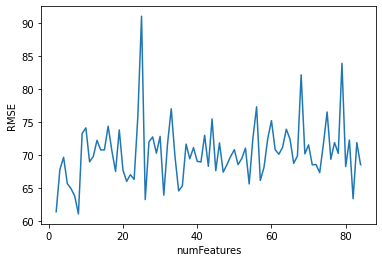

In [21]:
sns.lineplot(data=cb_feature_df, x='numFeatures', y='RMSE')